# PREDICT LIKELIHOOD OF GRADUATE ADMISSION

**A graduate application is to be completed by a student who wants to enroll in a Master's or doctoral degree. A graduate application will be reviewed by the department that the student applies to along with a Graduate Program Director and/or an admissions committee.**  
**So in this dataset we will predict the Graduate Admissions from an Indian perspective.**

## IMPORTING THE LIBRARIES 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


import scipy as sp

import os
import datetime
import warnings
warnings.filterwarnings("ignore")

## LOADING THE DATASET

Dataset is available on [Kaggle](https://www.kaggle.com/mohansacharya/graduate-admissions).

I placed the dataset on my [GitHub](https://github.com/rohan-dhanraj/Datasets/blob/main/Admission_Predict.csv)

In [2]:
data = pd.read_csv("https://raw.githubusercontent.com/rohan-dhanraj/Datasets/main/Admission_Predict.csv")
data.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


**As "Serial No." column is of no use we can remove it.**

In [3]:
data = data.drop("Serial No.", axis=1)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   GRE Score          500 non-null    int64  
 1   TOEFL Score        500 non-null    int64  
 2   University Rating  500 non-null    int64  
 3   SOP                500 non-null    float64
 4   LOR                500 non-null    float64
 5   CGPA               500 non-null    float64
 6   Research           500 non-null    int64  
 7   Chance of Admit    500 non-null    float64
dtypes: float64(4), int64(4)
memory usage: 31.4 KB


In [5]:
data.describe()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000
mean,316.472000,107.192000,3.114000,3.374000,3.48400,8.576440,0.560000,0.72174
std,11.295148,6.081868,1.143512,0.991004,0.92545,0.604813,0.496884,0.14114
min,290.000000,92.000000,1.000000,1.000000,1.00000,6.800000,0.000000,0.34000
25%,308.000000,103.000000,2.000000,2.500000,3.00000,8.127500,0.000000,0.63000
50%,317.000000,107.000000,3.000000,3.500000,3.50000,8.560000,1.000000,0.72000
75%,325.000000,112.000000,4.000000,4.000000,4.00000,9.040000,1.000000,0.82000
max,340.000000,120.000000,5.000000,5.000000,5.00000,9.920000,1.000000,0.97000


In [6]:
data.value_counts()

GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  Chance of Admit 
290        100          1                  1.5  2.0   7.56  0         0.47                1
322        110          4                  4.0  5.0   9.13  1         0.86                1
323        110          3                  4.0  3.5   9.10  1         0.79                1
           108          5                  4.0  4.0   8.74  1         0.81                1
                        3                  3.5  3.0   8.60  0         0.45                1
                                                                                         ..
311        105          2                  3.0  2.0   8.12  1         0.73                1
           104          3                  4.5  4.5   8.43  0         0.70                1
                                           4.0  3.5   8.13  1         0.74                1
                                           3.5  2.0   8.20  1         0.61           

In [7]:
data.dtypes

GRE Score              int64
TOEFL Score            int64
University Rating      int64
SOP                  float64
LOR                  float64
CGPA                 float64
Research               int64
Chance of Admit      float64
dtype: object

### Checking the Null Values

In [8]:
data.isnull().sum()

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

**Thus the dataset doesnot contain any null values.**

## Exploatory Data Analysis

### Histogram

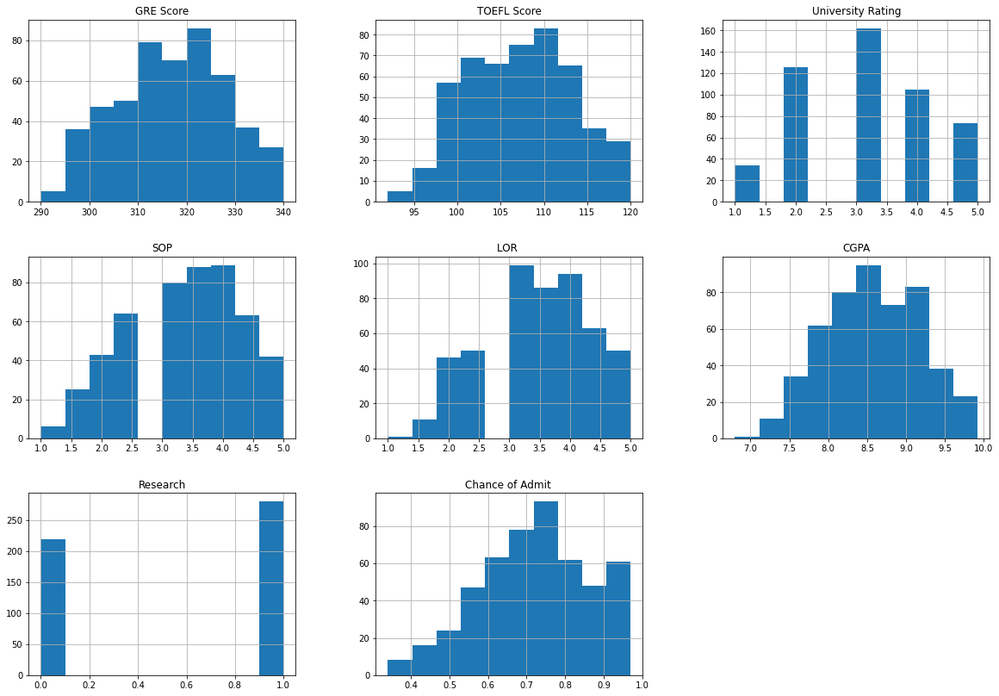

In [9]:
data.hist(figsize=(20,14))
plt.show()

### PairPlot

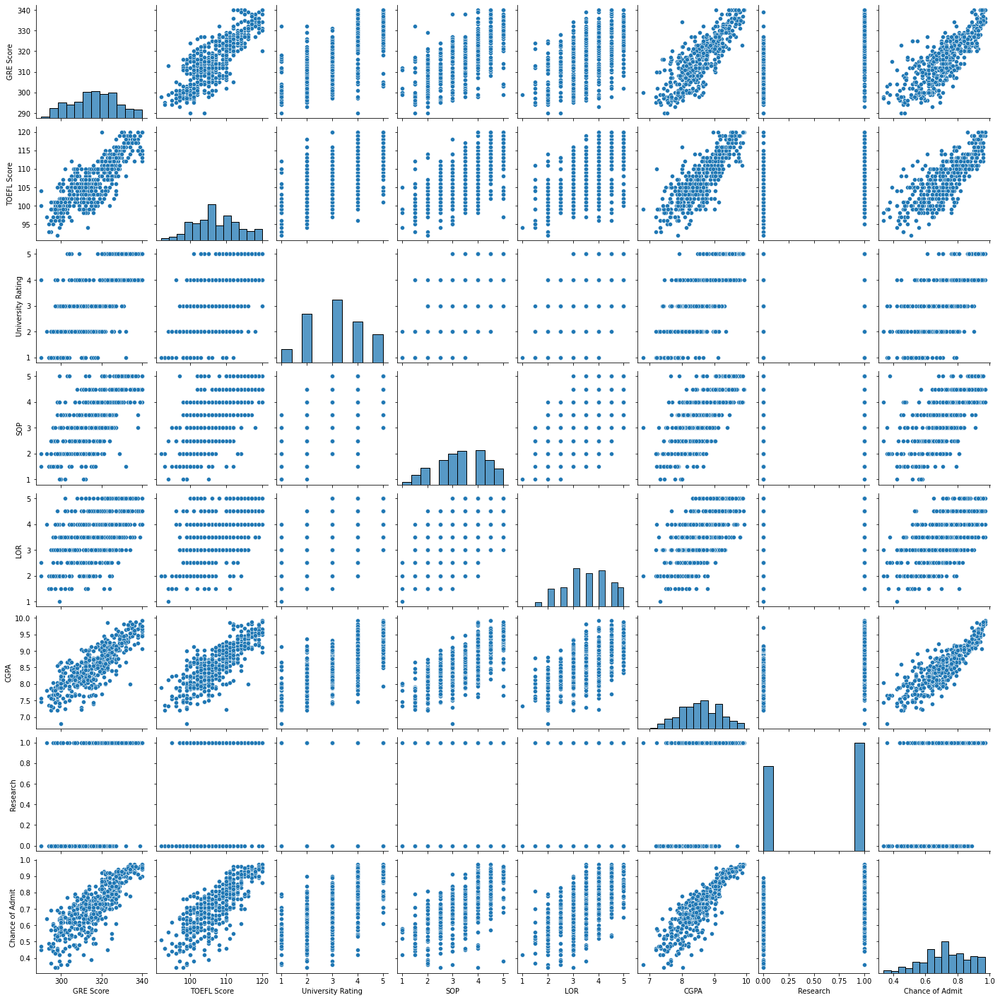

In [10]:
sns.pairplot(data=data)

### Correlation

In [11]:
corr = data.corr()
corr.style.background_gradient(cmap='rainbow')

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
GRE Score,1.000000,0.827200,0.635376,0.613498,0.524679,0.825878,0.563398,0.810351
TOEFL Score,0.827200,1.000000,0.649799,0.644410,0.541563,0.810574,0.467012,0.792228
University Rating,0.635376,0.649799,1.000000,0.728024,0.608651,0.705254,0.427047,0.690132
SOP,0.613498,0.644410,0.728024,1.000000,0.663707,0.712154,0.408116,0.684137
LOR,0.524679,0.541563,0.608651,0.663707,1.000000,0.637469,0.372526,0.645365
CGPA,0.825878,0.810574,0.705254,0.712154,0.637469,1.000000,0.501311,0.882413
Research,0.563398,0.467012,0.427047,0.408116,0.372526,0.501311,1.000000,0.545871
Chance of Admit,0.810351,0.792228,0.690132,0.684137,0.645365,0.882413,0.545871,1.000000


In [12]:
from pandas_profiling import ProfileReport

report = ProfileReport(data)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analysis of Target Variables

#### Minimum Value

In [13]:
data[["Chance of Admit "]].values.min()

0.34

#### Maximum Value

In [14]:
data[["Chance of Admit "]].values.max()

0.97

#### Mean Value

In [15]:
np.round(data['Chance of Admit '].mean(), 2)

0.72

#### Number of Distinct Values

In [16]:
data['Chance of Admit '].nunique()

61

## TRAINING AND TESTING DATA

In [170]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

from sklearn.metrics import r2_score,accuracy_score, mean_squared_error, make_scorer

from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

import xgboost as xgb
from xgboost import XGBRegressor

import optuna

In [18]:
x = data.drop('Chance of Admit ',axis=1)
y = data['Chance of Admit ']

In [243]:
# Splitting training and testing data
x_train, x_test, y_train, y_test = train_test_split(x, y,
                     test_size = 0.25, random_state = 42)

In [244]:
print(x_train.shape)
x_train

(375, 7)


,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
227,312,110,2,3.5,3.0,8.53,0
417,316,103,3,3.5,2.0,7.68,0
203,334,120,5,4.0,5.0,9.87,1
126,323,113,3,4.0,3.0,9.32,1
329,297,96,2,2.5,1.5,7.89,0
...,...,...,...,...,...,...,...
106,329,111,4,4.5,4.5,9.18,1
270,306,105,2,2.5,3.0,8.22,1
348,302,99,1,2.0,2.0,7.25,0
435,309,105,2,2.5,4.0,7.68,0


In [245]:
print(y_train.shape)
y_train

(375,)


227    0.64
417    0.52
203    0.97
126    0.85
329    0.43
       ... 
106    0.87
270    0.72
348    0.57
435    0.55
102    0.62
Name: Chance of Admit , Length: 375, dtype: float64

In [246]:
print(x_test.shape)
x_test

(125, 7)


,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
361,334,116,4,4.0,3.5,9.54,1
73,314,108,4,4.5,4.0,9.04,1
374,315,105,2,2.0,2.5,7.65,0
155,312,109,3,3.0,3.0,8.69,0
104,326,112,3,3.5,3.0,9.05,1
...,...,...,...,...,...,...,...
220,313,103,3,4.0,4.0,8.75,0
176,329,119,4,4.5,4.5,9.16,1
320,317,106,3,4.0,3.5,8.50,1
153,324,105,3,3.0,4.0,8.75,0


In [247]:
print(y_test.shape)
y_test

(125,)


361    0.93
73     0.84
374    0.39
155    0.77
104    0.74
       ... 
220    0.76
176    0.90
320    0.75
153    0.79
231    0.74
Name: Chance of Admit , Length: 125, dtype: float64

## Feature Importances

In [209]:
reg = ExtraTreesRegressor()
reg.fit(x_train,y_train)

ExtraTreesRegressor()

GRE Score            0.209436
TOEFL Score          0.142733
University Rating    0.085051
SOP                  0.060535
LOR                  0.040200
CGPA                 0.404969
Research             0.057076
dtype: float64


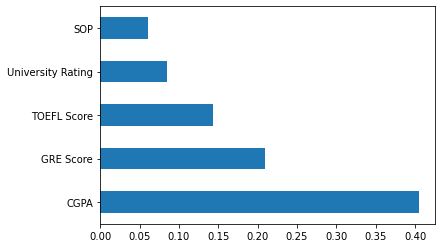

In [210]:
feat_importances = pd.Series(reg.feature_importances_, index=x_train.columns)
print(feat_importances)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

## Model Building, Training and Testing

### Linear Regression

In [211]:
lr = LinearRegression(normalize=True)
lr.fit(x_train, y_train)

LinearRegression(normalize=True)

In [212]:
lr.score(x_test, y_test)*100

81.63213016062119

In [213]:
y_pred = lr.predict(x_test)
rmse = round(mean_squared_error(y_test,y_pred), 5)
print(f'RMSE: {rmse}')

RMSE: 0.00359


### Decision Tree

In [214]:
dt_mod = DecisionTreeRegressor()
dt_mod.fit(x_train, y_train)
dt_mod.score(x_test, y_test)*100

60.81089764394936

In [215]:
dt = DecisionTreeRegressor()

In [216]:
# Create the parameter grid based on the results of random search 
params = {"splitter":["best","random"],
          "max_depth" : [1,3,5,7,9,11,12],
          "min_samples_leaf":list(range(1, 101, 5)),
          "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
          "max_features":["auto","log2","sqrt",None],
          "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]
}

In [217]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=5, n_jobs=-1,
                           verbose=1,
                           scoring = 'neg_root_mean_squared_error')

In [33]:
%%time
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 100800 candidates, totalling 504000 fits
Wall time: 8min 36s


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11, 12],
                         'max_features': ['auto', 'log2', 'sqrt', None],
                         'max_leaf_nodes': [None, 10, 20, 30, 40, 50, 60, 70,
                                            80, 90],
                         'min_samples_leaf': [1, 6, 11, 16, 21, 26, 31, 36, 41,
                                              46, 51, 56, 61, 66, 71, 76, 81,
                                              86, 91, 96],
                         'min_weight_fraction_leaf': [0.1, 0.2, 0.3, 0.4, 0.5,
                                                      0.6, 0.7, 0.8, 0.9],
                         'splitter': ['best', 'random']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [34]:
grid_search.best_estimator_

DecisionTreeRegressor(max_depth=5, max_features='auto', max_leaf_nodes=20,
                      min_weight_fraction_leaf=0.1)

In [218]:
dt = DecisionTreeRegressor(max_depth=5,
                           max_features='auto',
                           min_samples_leaf=26,
                           min_weight_fraction_leaf=0.1,
                          random_state=42)
dt.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=5, max_features='auto', min_samples_leaf=26,
                      min_weight_fraction_leaf=0.1, random_state=42)

In [219]:
dt.score(x_test, y_test)*100

76.67692535113126

In [220]:
y_pred = dt.predict(x_test)
rmse = round(mean_squared_error(y_test,y_pred), 5)
print(f'RMSE: {rmse}')

RMSE: 0.00455


[Text(643.8461538461538, 978.48, 'CGPA <= 0.255\nsquared_error = 0.02\nsamples = 375\nvalue = 0.724'),
 Text(343.38461538461536, 761.0400000000001, 'CGPA <= -0.91\nsquared_error = 0.011\nsamples = 221\nvalue = 0.638'),
 Text(171.69230769230768, 543.6, 'CGPA <= -1.193\nsquared_error = 0.009\nsamples = 78\nvalue = 0.55'),
 Text(85.84615384615384, 326.1600000000001, 'squared_error = 0.008\nsamples = 39\nvalue = 0.514'),
 Text(257.53846153846155, 326.1600000000001, 'squared_error = 0.008\nsamples = 39\nvalue = 0.586'),
 Text(515.0769230769231, 543.6, 'CGPA <= -0.544\nsquared_error = 0.006\nsamples = 143\nvalue = 0.685'),
 Text(429.23076923076917, 326.1600000000001, 'squared_error = 0.005\nsamples = 42\nvalue = 0.638'),
 Text(600.9230769230769, 326.1600000000001, 'Research <= -0.11\nsquared_error = 0.005\nsamples = 101\nvalue = 0.705'),
 Text(515.0769230769231, 108.72000000000003, 'squared_error = 0.004\nsamples = 58\nvalue = 0.685'),
 Text(686.7692307692307, 108.72000000000003, 'squared_er

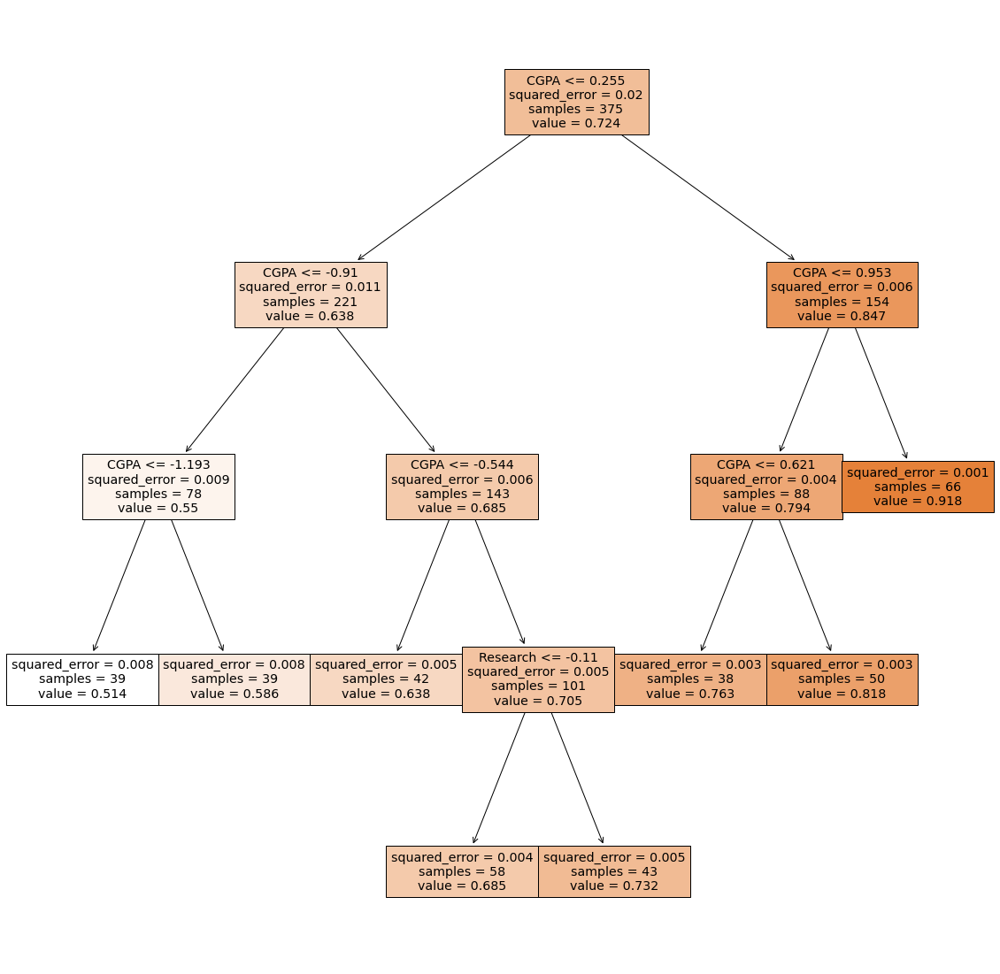

In [221]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt,filled=True,feature_names=x_train.columns)

In [222]:
path = dt.cost_complexity_pruning_path(x_train,y_train)
ccp_alpha = path.ccp_alphas

In [223]:
dt_model= [] 
for ccp in ccp_alpha :
    dt_m = DecisionTreeRegressor(max_depth=5,
                                 max_features='auto',
                                 min_samples_leaf=26,
                                 min_weight_fraction_leaf=0.1,
                                 ccp_alpha=ccp)
    dt_m.fit(x_train, y_train)
    dt_model.append(dt_m)

In [224]:
train_score = [i.score(x_train,y_train) for i in dt_model]
test_score = [i.score(x_test , y_test) for i in dt_model]

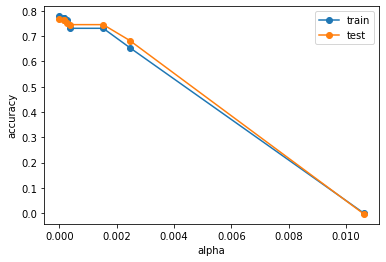

In [225]:
fix ,ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.plot(ccp_alpha,train_score,marker = 'o',label = 'train')
ax.plot(ccp_alpha,test_score,marker = 'o',label = 'test')
ax.legend()

In [226]:
dt_ccp = DecisionTreeRegressor(max_depth=5,
                                 max_features='auto',
                                 min_samples_leaf=26,
                                 min_weight_fraction_leaf=0.1,
                                 ccp_alpha=0.000)
dt_ccp.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=5, max_features='auto', min_samples_leaf=26,
                      min_weight_fraction_leaf=0.1)

In [227]:
dt_ccp.score(x_test, y_test)*100

76.67692535113126

**Prunning didnot help in improving the score.So The maximum score obtained using Decison Tree Regressor was 76.68%**

### Random Forest

In [228]:
rf = RandomForestRegressor()
rf.fit(x_train, y_train)
rf.score(x_test, y_test) * 100

79.54616413148457

In [46]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.arange(100,1000,20)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [1,3,5,7,9,11,12]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [47]:
# Use the random grid to search for best hyperparameters
rf = RandomForestRegressor()
# Random search of parameters, using 5 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf,
                               param_distributions = random_grid,
                               n_iter = 100,
                               cv = 5,
                               verbose=1,
                               random_state=42,
                               n_jobs = -1)
# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [1, 3, 5, 7, 9, 11, 12,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 120, 140, 160,
                                                         180, 200, 220, 240,
                                                         260, 280, 300, 320,
                                                         340, 360, 380, 400,
                                                         420, 440, 460, 480,
                                                         500, 520, 540, 560,
            

In [48]:
rf_random.best_params_

{'n_estimators': 300,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 11,
 'bootstrap': True}

In [49]:
rf_random.best_estimator_

RandomForestRegressor(max_depth=11, max_features='sqrt', min_samples_split=10,
                      n_estimators=300)

In [229]:
rf = RandomForestRegressor(max_depth=12,
                      max_features='sqrt',
                      min_samples_split=10,
                      n_estimators=800,
                     )
rf.fit(x_train, y_train)
rf.score(x_test, y_test)*100

80.87433877741408

In [85]:
# Using Grid Search CV for best parameters

param_grid = {
    'bootstrap': [True],
    'max_depth': list(range(84, 89, 1)),
    'min_samples_leaf': list(range(1, 4, 1)),
    'min_samples_split': list(range(1, 9, 2)),
    'n_estimators': list(range(84, 90, 1))
}

rf = RandomForestRegressor()

grid_search = GridSearchCV(estimator = rf,
                           param_grid = param_grid,
                           cv = 3,
                           n_jobs = -1,
                           verbose = 2)

In [86]:
%%time
grid_search.fit(x_train, y_train)

Fitting 3 folds for each of 360 candidates, totalling 1080 fits
Wall time: 30.4 s


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [84, 85, 86, 87, 88],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 3, 5, 7],
                         'n_estimators': [84, 85, 86, 87, 88, 89]},
             verbose=2)

In [87]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 86,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 87}

In [88]:
grid_search.best_estimator_

RandomForestRegressor(max_depth=86, min_samples_split=5, n_estimators=87)

In [230]:
rf = RandomForestRegressor(max_depth=86,
                           max_features=3,
                           min_samples_leaf=4,
                           min_samples_split=12,
                           n_estimators=87
                          )

rf.fit(x_train, y_train)
rf.score(x_test, y_test)*100

80.95458374296788

In [231]:
y_pred = rf.predict(x_test)
rmse = round(mean_squared_error(y_test,y_pred), 5)
print(f'RMSE: {rmse}')

RMSE: 0.00372


**The maximum score obtained by using Random Forest is 80.635%**

In [233]:
features = x_train.columns
dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=features)
dval = xgb.DMatrix(x_test, label=y_test, feature_names=features)

In [234]:
xgb_params = {
    'eta': 0.1, 
    'max_depth': 8,
    'min_child_weight': 1,

    'objective': 'reg:squarederror',
    'nthread': 8,

    'seed': 42,
    'verbosity': 1,
}

watchlist = [(dtrain, 'train'), (dval, 'validation')]

model = xgb.train(xgb_params, dtrain, num_boost_round=100, evals=watchlist)

[0]	train-rmse:0.23984	validation-rmse:0.23283
[1]	train-rmse:0.21747	validation-rmse:0.21125
[2]	train-rmse:0.19731	validation-rmse:0.19219
[3]	train-rmse:0.17917	validation-rmse:0.17498
[4]	train-rmse:0.16286	validation-rmse:0.15991
[5]	train-rmse:0.14797	validation-rmse:0.14708
[6]	train-rmse:0.13457	validation-rmse:0.13534
[7]	train-rmse:0.12251	validation-rmse:0.12473
[8]	train-rmse:0.11170	validation-rmse:0.11567
[9]	train-rmse:0.10205	validation-rmse:0.10731
[10]	train-rmse:0.09326	validation-rmse:0.10059
[11]	train-rmse:0.08532	validation-rmse:0.09452
[12]	train-rmse:0.07820	validation-rmse:0.08952
[13]	train-rmse:0.07181	validation-rmse:0.08514
[14]	train-rmse:0.06600	validation-rmse:0.08142
[15]	train-rmse:0.06087	validation-rmse:0.07815
[16]	train-rmse:0.05621	validation-rmse:0.07544
[17]	train-rmse:0.05193	validation-rmse:0.07307
[18]	train-rmse:0.04815	validation-rmse:0.07117
[19]	train-rmse:0.04475	validation-rmse:0.06953
[20]	train-rmse:0.04175	validation-rmse:0.06830
[2

In [235]:
y_pred = model.predict(dval)
rmse = round(mean_squared_error(y_test,y_pred), 5)
print(f'RMSE: {rmse}')

RMSE: 0.00435


In [179]:
def objective(trial):
    learning_rate = trial.suggest_float("learning_rate", 1e-2, 0.25, log=True)
    reg_lambda = trial.suggest_loguniform("reg_lambda", 1e-8, 100.0)
    reg_alpha = trial.suggest_loguniform("reg_alpha", 1e-8, 100.0)
    subsample = trial.suggest_float("subsample", 0.1, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.1, 1.0)
    max_depth = trial.suggest_int("max_depth", 1, 100)
    n_estimators = trial.suggest_int("n_estimators", 1, 1000)
    
    model = XGBRegressor(
                random_state=42,
                tree_method = 'auto',
                n_estimators=7000,
                learning_rate=learning_rate,
                reg_lambda=reg_lambda,
                reg_alpha=reg_alpha,
                subsample=subsample,
                colsample_bytree=colsample_bytree,
                max_depth=max_depth,
            )
    model.fit(
        x_train, y_train,
        early_stopping_rounds = 300,
        eval_set = [(x_test, y_test)],
        verbose = 1
    )
    
    y_pred = model.predict(x_test)
    rmse = round(mean_squared_error(y_test,y_pred), 5)
    
    return rmse    

In [180]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=100)

[I 2021-10-29 21:19:01,867] A new study created in memory with name: no-name-48af7381-62f7-415c-a168-1f679c78272f


[0]	validation_0-rmse:0.23822
[1]	validation_0-rmse:0.22019
[2]	validation_0-rmse:0.20414
[3]	validation_0-rmse:0.18907
[4]	validation_0-rmse:0.17593
[5]	validation_0-rmse:0.16333
[6]	validation_0-rmse:0.15245
[7]	validation_0-rmse:0.14185
[8]	validation_0-rmse:0.13317
[9]	validation_0-rmse:0.12495
[10]	validation_0-rmse:0.11726
[11]	validation_0-rmse:0.11082
[12]	validation_0-rmse:0.10503
[13]	validation_0-rmse:0.10018
[14]	validation_0-rmse:0.09616
[15]	validation_0-rmse:0.09233
[16]	validation_0-rmse:0.08895
[17]	validation_0-rmse:0.08570
[18]	validation_0-rmse:0.08305
[19]	validation_0-rmse:0.08092
[20]	validation_0-rmse:0.07903
[21]	validation_0-rmse:0.07739
[22]	validation_0-rmse:0.07588
[23]	validation_0-rmse:0.07477
[24]	validation_0-rmse:0.07370
[25]	validation_0-rmse:0.07275
[26]	validation_0-rmse:0.07208
[27]	validation_0-rmse:0.07150
[28]	validation_0-rmse:0.07097
[29]	validation_0-rmse:0.07056
[30]	validation_0-rmse:0.07011
[31]	validation_0-rmse:0.06983
[32]	validation_0-

[260]	validation_0-rmse:0.06892
[261]	validation_0-rmse:0.06892
[262]	validation_0-rmse:0.06892
[263]	validation_0-rmse:0.06892
[264]	validation_0-rmse:0.06892
[265]	validation_0-rmse:0.06892
[266]	validation_0-rmse:0.06892
[267]	validation_0-rmse:0.06892
[268]	validation_0-rmse:0.06892
[269]	validation_0-rmse:0.06892
[270]	validation_0-rmse:0.06892
[271]	validation_0-rmse:0.06892
[272]	validation_0-rmse:0.06892
[273]	validation_0-rmse:0.06892
[274]	validation_0-rmse:0.06892
[275]	validation_0-rmse:0.06892
[276]	validation_0-rmse:0.06892
[277]	validation_0-rmse:0.06892
[278]	validation_0-rmse:0.06892
[279]	validation_0-rmse:0.06892
[280]	validation_0-rmse:0.06892
[281]	validation_0-rmse:0.06892
[282]	validation_0-rmse:0.06892
[283]	validation_0-rmse:0.06892
[284]	validation_0-rmse:0.06892
[285]	validation_0-rmse:0.06892
[286]	validation_0-rmse:0.06892
[287]	validation_0-rmse:0.06892
[288]	validation_0-rmse:0.06892
[289]	validation_0-rmse:0.06892
[290]	validation_0-rmse:0.06892
[291]	va

[I 2021-10-29 21:19:03,427] Trial 0 finished with value: 0.00469 and parameters: {'learning_rate': 0.08089408405712868, 'reg_lambda': 0.00012600989823385552, 'reg_alpha': 5.119939580597081e-06, 'subsample': 0.9763713180517571, 'colsample_bytree': 0.5555727154089776, 'max_depth': 95, 'n_estimators': 282}. Best is trial 0 with value: 0.00469.


[0]	validation_0-rmse:0.23416
[1]	validation_0-rmse:0.21307
[2]	validation_0-rmse:0.19479
[3]	validation_0-rmse:0.17805
[4]	validation_0-rmse:0.16319
[5]	validation_0-rmse:0.14987
[6]	validation_0-rmse:0.13789
[7]	validation_0-rmse:0.12898
[8]	validation_0-rmse:0.12040
[9]	validation_0-rmse:0.11146
[10]	validation_0-rmse:0.10421
[11]	validation_0-rmse:0.09811
[12]	validation_0-rmse:0.09263
[13]	validation_0-rmse:0.08705
[14]	validation_0-rmse:0.08320
[15]	validation_0-rmse:0.08031
[16]	validation_0-rmse:0.07768
[17]	validation_0-rmse:0.07499
[18]	validation_0-rmse:0.07361
[19]	validation_0-rmse:0.07206
[20]	validation_0-rmse:0.07064
[21]	validation_0-rmse:0.07041
[22]	validation_0-rmse:0.06959
[23]	validation_0-rmse:0.06917
[24]	validation_0-rmse:0.06869
[25]	validation_0-rmse:0.06949
[26]	validation_0-rmse:0.07038
[27]	validation_0-rmse:0.07072
[28]	validation_0-rmse:0.07037
[29]	validation_0-rmse:0.07004
[30]	validation_0-rmse:0.07059
[31]	validation_0-rmse:0.07101
[32]	validation_0-

[260]	validation_0-rmse:0.07643
[261]	validation_0-rmse:0.07640
[262]	validation_0-rmse:0.07635
[263]	validation_0-rmse:0.07634
[264]	validation_0-rmse:0.07628
[265]	validation_0-rmse:0.07633
[266]	validation_0-rmse:0.07632
[267]	validation_0-rmse:0.07625
[268]	validation_0-rmse:0.07618
[269]	validation_0-rmse:0.07624
[270]	validation_0-rmse:0.07636
[271]	validation_0-rmse:0.07630
[272]	validation_0-rmse:0.07635
[273]	validation_0-rmse:0.07637
[274]	validation_0-rmse:0.07647
[275]	validation_0-rmse:0.07647
[276]	validation_0-rmse:0.07654
[277]	validation_0-rmse:0.07650
[278]	validation_0-rmse:0.07644
[279]	validation_0-rmse:0.07655
[280]	validation_0-rmse:0.07654
[281]	validation_0-rmse:0.07660
[282]	validation_0-rmse:0.07662
[283]	validation_0-rmse:0.07662
[284]	validation_0-rmse:0.07666
[285]	validation_0-rmse:0.07665
[286]	validation_0-rmse:0.07655
[287]	validation_0-rmse:0.07653
[288]	validation_0-rmse:0.07658
[289]	validation_0-rmse:0.07644
[290]	validation_0-rmse:0.07640
[291]	va

[I 2021-10-29 21:19:05,444] Trial 1 finished with value: 0.00472 and parameters: {'learning_rate': 0.09452935010567129, 'reg_lambda': 2.3661489345527933e-08, 'reg_alpha': 5.595943909087141e-08, 'subsample': 0.19894531239593177, 'colsample_bytree': 0.9296055929996458, 'max_depth': 60, 'n_estimators': 149}. Best is trial 0 with value: 0.00469.


[0]	validation_0-rmse:0.24629
[1]	validation_0-rmse:0.23592
[2]	validation_0-rmse:0.22582
[3]	validation_0-rmse:0.21643
[4]	validation_0-rmse:0.20788
[5]	validation_0-rmse:0.19928
[6]	validation_0-rmse:0.19157
[7]	validation_0-rmse:0.18379
[8]	validation_0-rmse:0.17675
[9]	validation_0-rmse:0.16946
[10]	validation_0-rmse:0.16288
[11]	validation_0-rmse:0.15677
[12]	validation_0-rmse:0.15085
[13]	validation_0-rmse:0.14538
[14]	validation_0-rmse:0.13984
[15]	validation_0-rmse:0.13506
[16]	validation_0-rmse:0.13031
[17]	validation_0-rmse:0.12584
[18]	validation_0-rmse:0.12154
[19]	validation_0-rmse:0.11792
[20]	validation_0-rmse:0.11388
[21]	validation_0-rmse:0.11032
[22]	validation_0-rmse:0.10695
[23]	validation_0-rmse:0.10397
[24]	validation_0-rmse:0.10128
[25]	validation_0-rmse:0.09858
[26]	validation_0-rmse:0.09607
[27]	validation_0-rmse:0.09393
[28]	validation_0-rmse:0.09191
[29]	validation_0-rmse:0.08989
[30]	validation_0-rmse:0.08814
[31]	validation_0-rmse:0.08620
[32]	validation_0-

[260]	validation_0-rmse:0.06707
[261]	validation_0-rmse:0.06708
[262]	validation_0-rmse:0.06708
[263]	validation_0-rmse:0.06708
[264]	validation_0-rmse:0.06708
[265]	validation_0-rmse:0.06708
[266]	validation_0-rmse:0.06708
[267]	validation_0-rmse:0.06708
[268]	validation_0-rmse:0.06708
[269]	validation_0-rmse:0.06708
[270]	validation_0-rmse:0.06708
[271]	validation_0-rmse:0.06708
[272]	validation_0-rmse:0.06708
[273]	validation_0-rmse:0.06708
[274]	validation_0-rmse:0.06708
[275]	validation_0-rmse:0.06708
[276]	validation_0-rmse:0.06708
[277]	validation_0-rmse:0.06708
[278]	validation_0-rmse:0.06708
[279]	validation_0-rmse:0.06708
[280]	validation_0-rmse:0.06708
[281]	validation_0-rmse:0.06708
[282]	validation_0-rmse:0.06709
[283]	validation_0-rmse:0.06709
[284]	validation_0-rmse:0.06709
[285]	validation_0-rmse:0.06709
[286]	validation_0-rmse:0.06709
[287]	validation_0-rmse:0.06709
[288]	validation_0-rmse:0.06709
[289]	validation_0-rmse:0.06709
[290]	validation_0-rmse:0.06710
[291]	va

[I 2021-10-29 21:19:07,618] Trial 2 finished with value: 0.00439 and parameters: {'learning_rate': 0.044185654892085056, 'reg_lambda': 5.586799199157327e-08, 'reg_alpha': 0.002569723716222548, 'subsample': 0.6959808791721047, 'colsample_bytree': 0.7510511101615945, 'max_depth': 70, 'n_estimators': 211}. Best is trial 2 with value: 0.00439.


[0]	validation_0-rmse:0.25377
[1]	validation_0-rmse:0.24975
[2]	validation_0-rmse:0.24608
[3]	validation_0-rmse:0.24268
[4]	validation_0-rmse:0.23929
[5]	validation_0-rmse:0.23592
[6]	validation_0-rmse:0.23245
[7]	validation_0-rmse:0.22903
[8]	validation_0-rmse:0.22569
[9]	validation_0-rmse:0.22246
[10]	validation_0-rmse:0.21923
[11]	validation_0-rmse:0.21599
[12]	validation_0-rmse:0.21297
[13]	validation_0-rmse:0.21001
[14]	validation_0-rmse:0.20704
[15]	validation_0-rmse:0.20414
[16]	validation_0-rmse:0.20131
[17]	validation_0-rmse:0.19857
[18]	validation_0-rmse:0.19590
[19]	validation_0-rmse:0.19333
[20]	validation_0-rmse:0.19074
[21]	validation_0-rmse:0.18826
[22]	validation_0-rmse:0.18550
[23]	validation_0-rmse:0.18313
[24]	validation_0-rmse:0.18069
[25]	validation_0-rmse:0.17811
[26]	validation_0-rmse:0.17568
[27]	validation_0-rmse:0.17342
[28]	validation_0-rmse:0.17119
[29]	validation_0-rmse:0.16880
[30]	validation_0-rmse:0.16665
[31]	validation_0-rmse:0.16435
[32]	validation_0-

[260]	validation_0-rmse:0.06513
[261]	validation_0-rmse:0.06511
[262]	validation_0-rmse:0.06510
[263]	validation_0-rmse:0.06513
[264]	validation_0-rmse:0.06515
[265]	validation_0-rmse:0.06504
[266]	validation_0-rmse:0.06508
[267]	validation_0-rmse:0.06504
[268]	validation_0-rmse:0.06504
[269]	validation_0-rmse:0.06508
[270]	validation_0-rmse:0.06509
[271]	validation_0-rmse:0.06507
[272]	validation_0-rmse:0.06514
[273]	validation_0-rmse:0.06518
[274]	validation_0-rmse:0.06521
[275]	validation_0-rmse:0.06528
[276]	validation_0-rmse:0.06529
[277]	validation_0-rmse:0.06527
[278]	validation_0-rmse:0.06527
[279]	validation_0-rmse:0.06534
[280]	validation_0-rmse:0.06531
[281]	validation_0-rmse:0.06526
[282]	validation_0-rmse:0.06526
[283]	validation_0-rmse:0.06527
[284]	validation_0-rmse:0.06531
[285]	validation_0-rmse:0.06532
[286]	validation_0-rmse:0.06536
[287]	validation_0-rmse:0.06544
[288]	validation_0-rmse:0.06544
[289]	validation_0-rmse:0.06546
[290]	validation_0-rmse:0.06547
[291]	va

[I 2021-10-29 21:19:10,777] Trial 3 finished with value: 0.00421 and parameters: {'learning_rate': 0.015693416328705332, 'reg_lambda': 0.000557501764039802, 'reg_alpha': 7.684968059974027e-08, 'subsample': 0.38866776493354416, 'colsample_bytree': 0.3942763206220816, 'max_depth': 83, 'n_estimators': 309}. Best is trial 3 with value: 0.00421.


[0]	validation_0-rmse:0.25465
[1]	validation_0-rmse:0.25191
[2]	validation_0-rmse:0.24940
[3]	validation_0-rmse:0.24682
[4]	validation_0-rmse:0.24442
[5]	validation_0-rmse:0.24204
[6]	validation_0-rmse:0.23973
[7]	validation_0-rmse:0.23718
[8]	validation_0-rmse:0.23492
[9]	validation_0-rmse:0.23266
[10]	validation_0-rmse:0.23026
[11]	validation_0-rmse:0.22792
[12]	validation_0-rmse:0.22573
[13]	validation_0-rmse:0.22356
[14]	validation_0-rmse:0.22138
[15]	validation_0-rmse:0.21942
[16]	validation_0-rmse:0.21738
[17]	validation_0-rmse:0.21544
[18]	validation_0-rmse:0.21343
[19]	validation_0-rmse:0.21146
[20]	validation_0-rmse:0.20949
[21]	validation_0-rmse:0.20769
[22]	validation_0-rmse:0.20579
[23]	validation_0-rmse:0.20398
[24]	validation_0-rmse:0.20222
[25]	validation_0-rmse:0.20036
[26]	validation_0-rmse:0.19864
[27]	validation_0-rmse:0.19698
[28]	validation_0-rmse:0.19539
[29]	validation_0-rmse:0.19365
[30]	validation_0-rmse:0.19205
[31]	validation_0-rmse:0.19047
[32]	validation_0-

[260]	validation_0-rmse:0.09541
[261]	validation_0-rmse:0.09536
[262]	validation_0-rmse:0.09531
[263]	validation_0-rmse:0.09524
[264]	validation_0-rmse:0.09518
[265]	validation_0-rmse:0.09510
[266]	validation_0-rmse:0.09506
[267]	validation_0-rmse:0.09503
[268]	validation_0-rmse:0.09502
[269]	validation_0-rmse:0.09499
[270]	validation_0-rmse:0.09493
[271]	validation_0-rmse:0.09485
[272]	validation_0-rmse:0.09484
[273]	validation_0-rmse:0.09481
[274]	validation_0-rmse:0.09478
[275]	validation_0-rmse:0.09476
[276]	validation_0-rmse:0.09475
[277]	validation_0-rmse:0.09469
[278]	validation_0-rmse:0.09465
[279]	validation_0-rmse:0.09456
[280]	validation_0-rmse:0.09449
[281]	validation_0-rmse:0.09442
[282]	validation_0-rmse:0.09436
[283]	validation_0-rmse:0.09434
[284]	validation_0-rmse:0.09431
[285]	validation_0-rmse:0.09429
[286]	validation_0-rmse:0.09424
[287]	validation_0-rmse:0.09419
[288]	validation_0-rmse:0.09415
[289]	validation_0-rmse:0.09413
[290]	validation_0-rmse:0.09407
[291]	va

[517]	validation_0-rmse:0.09151
[518]	validation_0-rmse:0.09150
[519]	validation_0-rmse:0.09149
[520]	validation_0-rmse:0.09149
[521]	validation_0-rmse:0.09149
[522]	validation_0-rmse:0.09148
[523]	validation_0-rmse:0.09146
[524]	validation_0-rmse:0.09146
[525]	validation_0-rmse:0.09146
[526]	validation_0-rmse:0.09146
[527]	validation_0-rmse:0.09146
[528]	validation_0-rmse:0.09146
[529]	validation_0-rmse:0.09146
[530]	validation_0-rmse:0.09146
[531]	validation_0-rmse:0.09146
[532]	validation_0-rmse:0.09144
[533]	validation_0-rmse:0.09144
[534]	validation_0-rmse:0.09144
[535]	validation_0-rmse:0.09144
[536]	validation_0-rmse:0.09144
[537]	validation_0-rmse:0.09144
[538]	validation_0-rmse:0.09144
[539]	validation_0-rmse:0.09144
[540]	validation_0-rmse:0.09144
[541]	validation_0-rmse:0.09141
[542]	validation_0-rmse:0.09141
[543]	validation_0-rmse:0.09141
[544]	validation_0-rmse:0.09141
[545]	validation_0-rmse:0.09141
[546]	validation_0-rmse:0.09141
[547]	validation_0-rmse:0.09141
[548]	va

[774]	validation_0-rmse:0.09087
[775]	validation_0-rmse:0.09087
[776]	validation_0-rmse:0.09087
[777]	validation_0-rmse:0.09087
[778]	validation_0-rmse:0.09087
[779]	validation_0-rmse:0.09087
[780]	validation_0-rmse:0.09085
[781]	validation_0-rmse:0.09085
[782]	validation_0-rmse:0.09085
[783]	validation_0-rmse:0.09085
[784]	validation_0-rmse:0.09085
[785]	validation_0-rmse:0.09085
[786]	validation_0-rmse:0.09085
[787]	validation_0-rmse:0.09085
[788]	validation_0-rmse:0.09083
[789]	validation_0-rmse:0.09082
[790]	validation_0-rmse:0.09082
[791]	validation_0-rmse:0.09082
[792]	validation_0-rmse:0.09082
[793]	validation_0-rmse:0.09082
[794]	validation_0-rmse:0.09082
[795]	validation_0-rmse:0.09082
[796]	validation_0-rmse:0.09082
[797]	validation_0-rmse:0.09082
[798]	validation_0-rmse:0.09082
[799]	validation_0-rmse:0.09082
[800]	validation_0-rmse:0.09082
[801]	validation_0-rmse:0.09081
[802]	validation_0-rmse:0.09081
[803]	validation_0-rmse:0.09081
[804]	validation_0-rmse:0.09081
[805]	va

[1030]	validation_0-rmse:0.09051
[1031]	validation_0-rmse:0.09051
[1032]	validation_0-rmse:0.09051
[1033]	validation_0-rmse:0.09051
[1034]	validation_0-rmse:0.09051
[1035]	validation_0-rmse:0.09051
[1036]	validation_0-rmse:0.09051
[1037]	validation_0-rmse:0.09051
[1038]	validation_0-rmse:0.09050
[1039]	validation_0-rmse:0.09050
[1040]	validation_0-rmse:0.09050
[1041]	validation_0-rmse:0.09050
[1042]	validation_0-rmse:0.09050
[1043]	validation_0-rmse:0.09050
[1044]	validation_0-rmse:0.09048
[1045]	validation_0-rmse:0.09048
[1046]	validation_0-rmse:0.09048
[1047]	validation_0-rmse:0.09048
[1048]	validation_0-rmse:0.09048
[1049]	validation_0-rmse:0.09048
[1050]	validation_0-rmse:0.09048
[1051]	validation_0-rmse:0.09048
[1052]	validation_0-rmse:0.09048
[1053]	validation_0-rmse:0.09048
[1054]	validation_0-rmse:0.09048
[1055]	validation_0-rmse:0.09048
[1056]	validation_0-rmse:0.09048
[1057]	validation_0-rmse:0.09048
[1058]	validation_0-rmse:0.09048
[1059]	validation_0-rmse:0.09048
[1060]	val

[1279]	validation_0-rmse:0.09034
[1280]	validation_0-rmse:0.09034
[1281]	validation_0-rmse:0.09034
[1282]	validation_0-rmse:0.09033
[1283]	validation_0-rmse:0.09033
[1284]	validation_0-rmse:0.09033
[1285]	validation_0-rmse:0.09033
[1286]	validation_0-rmse:0.09033
[1287]	validation_0-rmse:0.09033
[1288]	validation_0-rmse:0.09033
[1289]	validation_0-rmse:0.09033
[1290]	validation_0-rmse:0.09033
[1291]	validation_0-rmse:0.09033
[1292]	validation_0-rmse:0.09033
[1293]	validation_0-rmse:0.09033
[1294]	validation_0-rmse:0.09033
[1295]	validation_0-rmse:0.09033
[1296]	validation_0-rmse:0.09033
[1297]	validation_0-rmse:0.09033
[1298]	validation_0-rmse:0.09033
[1299]	validation_0-rmse:0.09033
[1300]	validation_0-rmse:0.09033
[1301]	validation_0-rmse:0.09033
[1302]	validation_0-rmse:0.09033
[1303]	validation_0-rmse:0.09033
[1304]	validation_0-rmse:0.09033
[1305]	validation_0-rmse:0.09033
[1306]	validation_0-rmse:0.09033
[1307]	validation_0-rmse:0.09033
[1308]	validation_0-rmse:0.09033
[1309]	val

[1528]	validation_0-rmse:0.09023
[1529]	validation_0-rmse:0.09023
[1530]	validation_0-rmse:0.09023
[1531]	validation_0-rmse:0.09023
[1532]	validation_0-rmse:0.09023
[1533]	validation_0-rmse:0.09023
[1534]	validation_0-rmse:0.09023
[1535]	validation_0-rmse:0.09023
[1536]	validation_0-rmse:0.09023
[1537]	validation_0-rmse:0.09023
[1538]	validation_0-rmse:0.09023
[1539]	validation_0-rmse:0.09023
[1540]	validation_0-rmse:0.09023
[1541]	validation_0-rmse:0.09023
[1542]	validation_0-rmse:0.09023
[1543]	validation_0-rmse:0.09023
[1544]	validation_0-rmse:0.09023
[1545]	validation_0-rmse:0.09023
[1546]	validation_0-rmse:0.09022
[1547]	validation_0-rmse:0.09022
[1548]	validation_0-rmse:0.09022
[1549]	validation_0-rmse:0.09022
[1550]	validation_0-rmse:0.09022
[1551]	validation_0-rmse:0.09022
[1552]	validation_0-rmse:0.09022
[1553]	validation_0-rmse:0.09022
[1554]	validation_0-rmse:0.09021
[1555]	validation_0-rmse:0.09021
[1556]	validation_0-rmse:0.09021
[1557]	validation_0-rmse:0.09021
[1558]	val

[1777]	validation_0-rmse:0.09009
[1778]	validation_0-rmse:0.09009
[1779]	validation_0-rmse:0.09009
[1780]	validation_0-rmse:0.09009
[1781]	validation_0-rmse:0.09008
[1782]	validation_0-rmse:0.09008
[1783]	validation_0-rmse:0.09008
[1784]	validation_0-rmse:0.09008
[1785]	validation_0-rmse:0.09008
[1786]	validation_0-rmse:0.09008
[1787]	validation_0-rmse:0.09008
[1788]	validation_0-rmse:0.09008
[1789]	validation_0-rmse:0.09008
[1790]	validation_0-rmse:0.09008
[1791]	validation_0-rmse:0.09008
[1792]	validation_0-rmse:0.09008
[1793]	validation_0-rmse:0.09008
[1794]	validation_0-rmse:0.09008
[1795]	validation_0-rmse:0.09008
[1796]	validation_0-rmse:0.09008
[1797]	validation_0-rmse:0.09008
[1798]	validation_0-rmse:0.09008
[1799]	validation_0-rmse:0.09008
[1800]	validation_0-rmse:0.09008
[1801]	validation_0-rmse:0.09008
[1802]	validation_0-rmse:0.09008
[1803]	validation_0-rmse:0.09008
[1804]	validation_0-rmse:0.09008
[1805]	validation_0-rmse:0.09008
[1806]	validation_0-rmse:0.09008
[1807]	val

[2026]	validation_0-rmse:0.09001
[2027]	validation_0-rmse:0.09001
[2028]	validation_0-rmse:0.09001
[2029]	validation_0-rmse:0.09001
[2030]	validation_0-rmse:0.09001
[2031]	validation_0-rmse:0.09001
[2032]	validation_0-rmse:0.09001
[2033]	validation_0-rmse:0.09001
[2034]	validation_0-rmse:0.09001
[2035]	validation_0-rmse:0.09001
[2036]	validation_0-rmse:0.09001
[2037]	validation_0-rmse:0.09001
[2038]	validation_0-rmse:0.09001
[2039]	validation_0-rmse:0.09001
[2040]	validation_0-rmse:0.09001
[2041]	validation_0-rmse:0.09001
[2042]	validation_0-rmse:0.09001
[2043]	validation_0-rmse:0.09001
[2044]	validation_0-rmse:0.09001
[2045]	validation_0-rmse:0.09001
[2046]	validation_0-rmse:0.09001
[2047]	validation_0-rmse:0.09001
[2048]	validation_0-rmse:0.09001
[2049]	validation_0-rmse:0.09001
[2050]	validation_0-rmse:0.09001
[2051]	validation_0-rmse:0.09001
[2052]	validation_0-rmse:0.09001
[2053]	validation_0-rmse:0.09001
[2054]	validation_0-rmse:0.09001
[2055]	validation_0-rmse:0.09001
[2056]	val

[2275]	validation_0-rmse:0.08997
[2276]	validation_0-rmse:0.08997
[2277]	validation_0-rmse:0.08997
[2278]	validation_0-rmse:0.08997
[2279]	validation_0-rmse:0.08997
[2280]	validation_0-rmse:0.08997
[2281]	validation_0-rmse:0.08997
[2282]	validation_0-rmse:0.08997
[2283]	validation_0-rmse:0.08997
[2284]	validation_0-rmse:0.08997
[2285]	validation_0-rmse:0.08997
[2286]	validation_0-rmse:0.08997
[2287]	validation_0-rmse:0.08997
[2288]	validation_0-rmse:0.08997
[2289]	validation_0-rmse:0.08997
[2290]	validation_0-rmse:0.08997
[2291]	validation_0-rmse:0.08997
[2292]	validation_0-rmse:0.08997
[2293]	validation_0-rmse:0.08997
[2294]	validation_0-rmse:0.08997
[2295]	validation_0-rmse:0.08997
[2296]	validation_0-rmse:0.08997
[2297]	validation_0-rmse:0.08997
[2298]	validation_0-rmse:0.08997
[2299]	validation_0-rmse:0.08997
[2300]	validation_0-rmse:0.08997
[2301]	validation_0-rmse:0.08997
[2302]	validation_0-rmse:0.08997
[2303]	validation_0-rmse:0.08997
[2304]	validation_0-rmse:0.08997
[2305]	val

[2524]	validation_0-rmse:0.08991
[2525]	validation_0-rmse:0.08991
[2526]	validation_0-rmse:0.08991
[2527]	validation_0-rmse:0.08991
[2528]	validation_0-rmse:0.08991
[2529]	validation_0-rmse:0.08991
[2530]	validation_0-rmse:0.08991
[2531]	validation_0-rmse:0.08991
[2532]	validation_0-rmse:0.08991
[2533]	validation_0-rmse:0.08991
[2534]	validation_0-rmse:0.08991
[2535]	validation_0-rmse:0.08991
[2536]	validation_0-rmse:0.08991
[2537]	validation_0-rmse:0.08991
[2538]	validation_0-rmse:0.08991
[2539]	validation_0-rmse:0.08991
[2540]	validation_0-rmse:0.08991
[2541]	validation_0-rmse:0.08991
[2542]	validation_0-rmse:0.08991
[2543]	validation_0-rmse:0.08991
[2544]	validation_0-rmse:0.08991
[2545]	validation_0-rmse:0.08991
[2546]	validation_0-rmse:0.08991
[2547]	validation_0-rmse:0.08991
[2548]	validation_0-rmse:0.08990
[2549]	validation_0-rmse:0.08990
[2550]	validation_0-rmse:0.08990
[2551]	validation_0-rmse:0.08990
[2552]	validation_0-rmse:0.08990
[2553]	validation_0-rmse:0.08990
[2554]	val

[2773]	validation_0-rmse:0.08982
[2774]	validation_0-rmse:0.08982
[2775]	validation_0-rmse:0.08981
[2776]	validation_0-rmse:0.08981
[2777]	validation_0-rmse:0.08981
[2778]	validation_0-rmse:0.08981
[2779]	validation_0-rmse:0.08981
[2780]	validation_0-rmse:0.08981
[2781]	validation_0-rmse:0.08981
[2782]	validation_0-rmse:0.08981
[2783]	validation_0-rmse:0.08981
[2784]	validation_0-rmse:0.08981
[2785]	validation_0-rmse:0.08981
[2786]	validation_0-rmse:0.08981
[2787]	validation_0-rmse:0.08981
[2788]	validation_0-rmse:0.08981
[2789]	validation_0-rmse:0.08981
[2790]	validation_0-rmse:0.08981
[2791]	validation_0-rmse:0.08981
[2792]	validation_0-rmse:0.08981
[2793]	validation_0-rmse:0.08981
[2794]	validation_0-rmse:0.08981
[2795]	validation_0-rmse:0.08981
[2796]	validation_0-rmse:0.08981
[2797]	validation_0-rmse:0.08981
[2798]	validation_0-rmse:0.08981
[2799]	validation_0-rmse:0.08981
[2800]	validation_0-rmse:0.08981
[2801]	validation_0-rmse:0.08981
[2802]	validation_0-rmse:0.08981
[2803]	val

[3022]	validation_0-rmse:0.08980
[3023]	validation_0-rmse:0.08980
[3024]	validation_0-rmse:0.08980
[3025]	validation_0-rmse:0.08980
[3026]	validation_0-rmse:0.08980
[3027]	validation_0-rmse:0.08979
[3028]	validation_0-rmse:0.08979
[3029]	validation_0-rmse:0.08979
[3030]	validation_0-rmse:0.08979
[3031]	validation_0-rmse:0.08979
[3032]	validation_0-rmse:0.08979
[3033]	validation_0-rmse:0.08979
[3034]	validation_0-rmse:0.08979
[3035]	validation_0-rmse:0.08979
[3036]	validation_0-rmse:0.08979
[3037]	validation_0-rmse:0.08979
[3038]	validation_0-rmse:0.08979
[3039]	validation_0-rmse:0.08979
[3040]	validation_0-rmse:0.08979
[3041]	validation_0-rmse:0.08979
[3042]	validation_0-rmse:0.08979
[3043]	validation_0-rmse:0.08979
[3044]	validation_0-rmse:0.08979
[3045]	validation_0-rmse:0.08979
[3046]	validation_0-rmse:0.08979
[3047]	validation_0-rmse:0.08979
[3048]	validation_0-rmse:0.08979
[3049]	validation_0-rmse:0.08979
[3050]	validation_0-rmse:0.08979
[3051]	validation_0-rmse:0.08979
[3052]	val

[3271]	validation_0-rmse:0.08977
[3272]	validation_0-rmse:0.08977
[3273]	validation_0-rmse:0.08977
[3274]	validation_0-rmse:0.08977
[3275]	validation_0-rmse:0.08977
[3276]	validation_0-rmse:0.08977
[3277]	validation_0-rmse:0.08977
[3278]	validation_0-rmse:0.08977
[3279]	validation_0-rmse:0.08977
[3280]	validation_0-rmse:0.08977
[3281]	validation_0-rmse:0.08977
[3282]	validation_0-rmse:0.08977
[3283]	validation_0-rmse:0.08977
[3284]	validation_0-rmse:0.08977
[3285]	validation_0-rmse:0.08977
[3286]	validation_0-rmse:0.08977
[3287]	validation_0-rmse:0.08977
[3288]	validation_0-rmse:0.08977
[3289]	validation_0-rmse:0.08977
[3290]	validation_0-rmse:0.08977
[3291]	validation_0-rmse:0.08977
[3292]	validation_0-rmse:0.08977
[3293]	validation_0-rmse:0.08977
[3294]	validation_0-rmse:0.08977
[3295]	validation_0-rmse:0.08977
[3296]	validation_0-rmse:0.08977
[3297]	validation_0-rmse:0.08977
[3298]	validation_0-rmse:0.08977
[3299]	validation_0-rmse:0.08977
[3300]	validation_0-rmse:0.08977
[3301]	val

[3520]	validation_0-rmse:0.08974
[3521]	validation_0-rmse:0.08974
[3522]	validation_0-rmse:0.08974
[3523]	validation_0-rmse:0.08974
[3524]	validation_0-rmse:0.08974
[3525]	validation_0-rmse:0.08974
[3526]	validation_0-rmse:0.08974
[3527]	validation_0-rmse:0.08974
[3528]	validation_0-rmse:0.08974
[3529]	validation_0-rmse:0.08974
[3530]	validation_0-rmse:0.08974
[3531]	validation_0-rmse:0.08974
[3532]	validation_0-rmse:0.08974
[3533]	validation_0-rmse:0.08974
[3534]	validation_0-rmse:0.08974
[3535]	validation_0-rmse:0.08974
[3536]	validation_0-rmse:0.08974
[3537]	validation_0-rmse:0.08974
[3538]	validation_0-rmse:0.08974
[3539]	validation_0-rmse:0.08974
[3540]	validation_0-rmse:0.08973
[3541]	validation_0-rmse:0.08973
[3542]	validation_0-rmse:0.08973
[3543]	validation_0-rmse:0.08973
[3544]	validation_0-rmse:0.08973
[3545]	validation_0-rmse:0.08973
[3546]	validation_0-rmse:0.08973
[3547]	validation_0-rmse:0.08973
[3548]	validation_0-rmse:0.08973
[3549]	validation_0-rmse:0.08973
[3550]	val

[3769]	validation_0-rmse:0.08970
[3770]	validation_0-rmse:0.08970
[3771]	validation_0-rmse:0.08970
[3772]	validation_0-rmse:0.08970
[3773]	validation_0-rmse:0.08970
[3774]	validation_0-rmse:0.08970
[3775]	validation_0-rmse:0.08970
[3776]	validation_0-rmse:0.08970
[3777]	validation_0-rmse:0.08970
[3778]	validation_0-rmse:0.08970
[3779]	validation_0-rmse:0.08970
[3780]	validation_0-rmse:0.08970
[3781]	validation_0-rmse:0.08970
[3782]	validation_0-rmse:0.08970
[3783]	validation_0-rmse:0.08970
[3784]	validation_0-rmse:0.08970
[3785]	validation_0-rmse:0.08970
[3786]	validation_0-rmse:0.08970
[3787]	validation_0-rmse:0.08970
[3788]	validation_0-rmse:0.08970
[3789]	validation_0-rmse:0.08970
[3790]	validation_0-rmse:0.08970
[3791]	validation_0-rmse:0.08970
[3792]	validation_0-rmse:0.08970
[3793]	validation_0-rmse:0.08970
[3794]	validation_0-rmse:0.08970
[3795]	validation_0-rmse:0.08970
[3796]	validation_0-rmse:0.08970
[3797]	validation_0-rmse:0.08970
[3798]	validation_0-rmse:0.08970
[3799]	val

[4018]	validation_0-rmse:0.08968
[4019]	validation_0-rmse:0.08968
[4020]	validation_0-rmse:0.08968
[4021]	validation_0-rmse:0.08968
[4022]	validation_0-rmse:0.08968
[4023]	validation_0-rmse:0.08968
[4024]	validation_0-rmse:0.08968
[4025]	validation_0-rmse:0.08968
[4026]	validation_0-rmse:0.08968
[4027]	validation_0-rmse:0.08968
[4028]	validation_0-rmse:0.08968
[4029]	validation_0-rmse:0.08968
[4030]	validation_0-rmse:0.08968
[4031]	validation_0-rmse:0.08968
[4032]	validation_0-rmse:0.08968
[4033]	validation_0-rmse:0.08968
[4034]	validation_0-rmse:0.08968
[4035]	validation_0-rmse:0.08968
[4036]	validation_0-rmse:0.08968
[4037]	validation_0-rmse:0.08968
[4038]	validation_0-rmse:0.08968
[4039]	validation_0-rmse:0.08968
[4040]	validation_0-rmse:0.08968
[4041]	validation_0-rmse:0.08968
[4042]	validation_0-rmse:0.08968
[4043]	validation_0-rmse:0.08968
[4044]	validation_0-rmse:0.08968
[4045]	validation_0-rmse:0.08968
[4046]	validation_0-rmse:0.08967
[4047]	validation_0-rmse:0.08967
[4048]	val

[4267]	validation_0-rmse:0.08966
[4268]	validation_0-rmse:0.08966
[4269]	validation_0-rmse:0.08966
[4270]	validation_0-rmse:0.08966
[4271]	validation_0-rmse:0.08966
[4272]	validation_0-rmse:0.08966
[4273]	validation_0-rmse:0.08966
[4274]	validation_0-rmse:0.08966
[4275]	validation_0-rmse:0.08966
[4276]	validation_0-rmse:0.08966
[4277]	validation_0-rmse:0.08966
[4278]	validation_0-rmse:0.08966
[4279]	validation_0-rmse:0.08966
[4280]	validation_0-rmse:0.08966
[4281]	validation_0-rmse:0.08966
[4282]	validation_0-rmse:0.08966
[4283]	validation_0-rmse:0.08966
[4284]	validation_0-rmse:0.08966
[4285]	validation_0-rmse:0.08966
[4286]	validation_0-rmse:0.08966
[4287]	validation_0-rmse:0.08966
[4288]	validation_0-rmse:0.08966
[4289]	validation_0-rmse:0.08966
[4290]	validation_0-rmse:0.08966
[4291]	validation_0-rmse:0.08966
[4292]	validation_0-rmse:0.08966
[4293]	validation_0-rmse:0.08966
[4294]	validation_0-rmse:0.08966
[4295]	validation_0-rmse:0.08966
[4296]	validation_0-rmse:0.08966
[4297]	val

[4516]	validation_0-rmse:0.08964
[4517]	validation_0-rmse:0.08964
[4518]	validation_0-rmse:0.08964
[4519]	validation_0-rmse:0.08964
[4520]	validation_0-rmse:0.08964
[4521]	validation_0-rmse:0.08964
[4522]	validation_0-rmse:0.08964
[4523]	validation_0-rmse:0.08964
[4524]	validation_0-rmse:0.08964
[4525]	validation_0-rmse:0.08964
[4526]	validation_0-rmse:0.08964
[4527]	validation_0-rmse:0.08964
[4528]	validation_0-rmse:0.08964
[4529]	validation_0-rmse:0.08964
[4530]	validation_0-rmse:0.08964
[4531]	validation_0-rmse:0.08964
[4532]	validation_0-rmse:0.08964
[4533]	validation_0-rmse:0.08964
[4534]	validation_0-rmse:0.08964
[4535]	validation_0-rmse:0.08964
[4536]	validation_0-rmse:0.08964
[4537]	validation_0-rmse:0.08964
[4538]	validation_0-rmse:0.08964
[4539]	validation_0-rmse:0.08964
[4540]	validation_0-rmse:0.08964
[4541]	validation_0-rmse:0.08964
[4542]	validation_0-rmse:0.08964
[4543]	validation_0-rmse:0.08964
[4544]	validation_0-rmse:0.08964
[4545]	validation_0-rmse:0.08964
[4546]	val

[4765]	validation_0-rmse:0.08962
[4766]	validation_0-rmse:0.08962
[4767]	validation_0-rmse:0.08962
[4768]	validation_0-rmse:0.08962
[4769]	validation_0-rmse:0.08962
[4770]	validation_0-rmse:0.08962
[4771]	validation_0-rmse:0.08962
[4772]	validation_0-rmse:0.08962
[4773]	validation_0-rmse:0.08962
[4774]	validation_0-rmse:0.08962
[4775]	validation_0-rmse:0.08962
[4776]	validation_0-rmse:0.08962
[4777]	validation_0-rmse:0.08962
[4778]	validation_0-rmse:0.08962
[4779]	validation_0-rmse:0.08962
[4780]	validation_0-rmse:0.08962
[4781]	validation_0-rmse:0.08961
[4782]	validation_0-rmse:0.08961
[4783]	validation_0-rmse:0.08961
[4784]	validation_0-rmse:0.08961
[4785]	validation_0-rmse:0.08961
[4786]	validation_0-rmse:0.08961
[4787]	validation_0-rmse:0.08961
[4788]	validation_0-rmse:0.08961
[4789]	validation_0-rmse:0.08961
[4790]	validation_0-rmse:0.08961
[4791]	validation_0-rmse:0.08961
[4792]	validation_0-rmse:0.08961
[4793]	validation_0-rmse:0.08961
[4794]	validation_0-rmse:0.08961
[4795]	val

[5014]	validation_0-rmse:0.08959
[5015]	validation_0-rmse:0.08959
[5016]	validation_0-rmse:0.08959
[5017]	validation_0-rmse:0.08959
[5018]	validation_0-rmse:0.08959
[5019]	validation_0-rmse:0.08959
[5020]	validation_0-rmse:0.08959
[5021]	validation_0-rmse:0.08959
[5022]	validation_0-rmse:0.08959
[5023]	validation_0-rmse:0.08959
[5024]	validation_0-rmse:0.08959
[5025]	validation_0-rmse:0.08959
[5026]	validation_0-rmse:0.08959
[5027]	validation_0-rmse:0.08959
[5028]	validation_0-rmse:0.08959
[5029]	validation_0-rmse:0.08959
[5030]	validation_0-rmse:0.08959
[5031]	validation_0-rmse:0.08959
[5032]	validation_0-rmse:0.08959
[5033]	validation_0-rmse:0.08959
[5034]	validation_0-rmse:0.08959
[5035]	validation_0-rmse:0.08959
[5036]	validation_0-rmse:0.08959
[5037]	validation_0-rmse:0.08959
[5038]	validation_0-rmse:0.08959
[5039]	validation_0-rmse:0.08959
[5040]	validation_0-rmse:0.08959
[5041]	validation_0-rmse:0.08959
[5042]	validation_0-rmse:0.08959
[5043]	validation_0-rmse:0.08959
[5044]	val

[5263]	validation_0-rmse:0.08954
[5264]	validation_0-rmse:0.08954
[5265]	validation_0-rmse:0.08954
[5266]	validation_0-rmse:0.08954
[5267]	validation_0-rmse:0.08954
[5268]	validation_0-rmse:0.08954
[5269]	validation_0-rmse:0.08954
[5270]	validation_0-rmse:0.08954
[5271]	validation_0-rmse:0.08954
[5272]	validation_0-rmse:0.08954
[5273]	validation_0-rmse:0.08954
[5274]	validation_0-rmse:0.08954
[5275]	validation_0-rmse:0.08954
[5276]	validation_0-rmse:0.08954
[5277]	validation_0-rmse:0.08954
[5278]	validation_0-rmse:0.08954
[5279]	validation_0-rmse:0.08954
[5280]	validation_0-rmse:0.08954
[5281]	validation_0-rmse:0.08954
[5282]	validation_0-rmse:0.08954
[5283]	validation_0-rmse:0.08954
[5284]	validation_0-rmse:0.08954
[5285]	validation_0-rmse:0.08954
[5286]	validation_0-rmse:0.08954
[5287]	validation_0-rmse:0.08954
[5288]	validation_0-rmse:0.08954
[5289]	validation_0-rmse:0.08954
[5290]	validation_0-rmse:0.08954
[5291]	validation_0-rmse:0.08954
[5292]	validation_0-rmse:0.08954
[5293]	val

[5512]	validation_0-rmse:0.08952
[5513]	validation_0-rmse:0.08952
[5514]	validation_0-rmse:0.08952
[5515]	validation_0-rmse:0.08952
[5516]	validation_0-rmse:0.08952
[5517]	validation_0-rmse:0.08952
[5518]	validation_0-rmse:0.08952
[5519]	validation_0-rmse:0.08952
[5520]	validation_0-rmse:0.08952
[5521]	validation_0-rmse:0.08952
[5522]	validation_0-rmse:0.08952
[5523]	validation_0-rmse:0.08952
[5524]	validation_0-rmse:0.08952
[5525]	validation_0-rmse:0.08952
[5526]	validation_0-rmse:0.08952
[5527]	validation_0-rmse:0.08952
[5528]	validation_0-rmse:0.08952
[5529]	validation_0-rmse:0.08952
[5530]	validation_0-rmse:0.08952
[5531]	validation_0-rmse:0.08952
[5532]	validation_0-rmse:0.08952
[5533]	validation_0-rmse:0.08952
[5534]	validation_0-rmse:0.08952
[5535]	validation_0-rmse:0.08952
[5536]	validation_0-rmse:0.08952
[5537]	validation_0-rmse:0.08952
[5538]	validation_0-rmse:0.08952
[5539]	validation_0-rmse:0.08952
[5540]	validation_0-rmse:0.08952
[5541]	validation_0-rmse:0.08952
[5542]	val

[5761]	validation_0-rmse:0.08949
[5762]	validation_0-rmse:0.08949
[5763]	validation_0-rmse:0.08949
[5764]	validation_0-rmse:0.08949
[5765]	validation_0-rmse:0.08949
[5766]	validation_0-rmse:0.08949
[5767]	validation_0-rmse:0.08949
[5768]	validation_0-rmse:0.08949
[5769]	validation_0-rmse:0.08949
[5770]	validation_0-rmse:0.08949
[5771]	validation_0-rmse:0.08949
[5772]	validation_0-rmse:0.08949
[5773]	validation_0-rmse:0.08949
[5774]	validation_0-rmse:0.08949
[5775]	validation_0-rmse:0.08949
[5776]	validation_0-rmse:0.08949
[5777]	validation_0-rmse:0.08949
[5778]	validation_0-rmse:0.08949
[5779]	validation_0-rmse:0.08949
[5780]	validation_0-rmse:0.08949
[5781]	validation_0-rmse:0.08949
[5782]	validation_0-rmse:0.08949
[5783]	validation_0-rmse:0.08949
[5784]	validation_0-rmse:0.08949
[5785]	validation_0-rmse:0.08949
[5786]	validation_0-rmse:0.08949
[5787]	validation_0-rmse:0.08949
[5788]	validation_0-rmse:0.08949
[5789]	validation_0-rmse:0.08949
[5790]	validation_0-rmse:0.08949
[5791]	val

[6010]	validation_0-rmse:0.08949
[6011]	validation_0-rmse:0.08949
[6012]	validation_0-rmse:0.08949
[6013]	validation_0-rmse:0.08949
[6014]	validation_0-rmse:0.08949
[6015]	validation_0-rmse:0.08949
[6016]	validation_0-rmse:0.08949
[6017]	validation_0-rmse:0.08949
[6018]	validation_0-rmse:0.08949
[6019]	validation_0-rmse:0.08949
[6020]	validation_0-rmse:0.08949
[6021]	validation_0-rmse:0.08949
[6022]	validation_0-rmse:0.08949
[6023]	validation_0-rmse:0.08949
[6024]	validation_0-rmse:0.08949
[6025]	validation_0-rmse:0.08949
[6026]	validation_0-rmse:0.08949
[6027]	validation_0-rmse:0.08949
[6028]	validation_0-rmse:0.08949
[6029]	validation_0-rmse:0.08949
[6030]	validation_0-rmse:0.08949
[6031]	validation_0-rmse:0.08949
[6032]	validation_0-rmse:0.08949
[6033]	validation_0-rmse:0.08949
[6034]	validation_0-rmse:0.08949
[6035]	validation_0-rmse:0.08949
[6036]	validation_0-rmse:0.08949
[6037]	validation_0-rmse:0.08949
[6038]	validation_0-rmse:0.08949
[6039]	validation_0-rmse:0.08949
[6040]	val

[6259]	validation_0-rmse:0.08948
[6260]	validation_0-rmse:0.08948
[6261]	validation_0-rmse:0.08948
[6262]	validation_0-rmse:0.08948
[6263]	validation_0-rmse:0.08948
[6264]	validation_0-rmse:0.08948
[6265]	validation_0-rmse:0.08948
[6266]	validation_0-rmse:0.08948
[6267]	validation_0-rmse:0.08948
[6268]	validation_0-rmse:0.08948
[6269]	validation_0-rmse:0.08948
[6270]	validation_0-rmse:0.08948
[6271]	validation_0-rmse:0.08948
[6272]	validation_0-rmse:0.08948
[6273]	validation_0-rmse:0.08948
[6274]	validation_0-rmse:0.08948
[6275]	validation_0-rmse:0.08948
[6276]	validation_0-rmse:0.08948
[6277]	validation_0-rmse:0.08948
[6278]	validation_0-rmse:0.08948
[6279]	validation_0-rmse:0.08948
[6280]	validation_0-rmse:0.08948
[6281]	validation_0-rmse:0.08948
[6282]	validation_0-rmse:0.08948
[6283]	validation_0-rmse:0.08948
[6284]	validation_0-rmse:0.08948
[6285]	validation_0-rmse:0.08948
[6286]	validation_0-rmse:0.08948
[6287]	validation_0-rmse:0.08948
[6288]	validation_0-rmse:0.08948
[6289]	val

[6508]	validation_0-rmse:0.08947
[6509]	validation_0-rmse:0.08947
[6510]	validation_0-rmse:0.08947
[6511]	validation_0-rmse:0.08947
[6512]	validation_0-rmse:0.08947
[6513]	validation_0-rmse:0.08947
[6514]	validation_0-rmse:0.08947
[6515]	validation_0-rmse:0.08947
[6516]	validation_0-rmse:0.08947
[6517]	validation_0-rmse:0.08947
[6518]	validation_0-rmse:0.08947
[6519]	validation_0-rmse:0.08947
[6520]	validation_0-rmse:0.08947
[6521]	validation_0-rmse:0.08947
[6522]	validation_0-rmse:0.08947
[6523]	validation_0-rmse:0.08947
[6524]	validation_0-rmse:0.08947
[6525]	validation_0-rmse:0.08947
[6526]	validation_0-rmse:0.08947
[6527]	validation_0-rmse:0.08947
[6528]	validation_0-rmse:0.08947
[6529]	validation_0-rmse:0.08947
[6530]	validation_0-rmse:0.08947
[6531]	validation_0-rmse:0.08947
[6532]	validation_0-rmse:0.08947
[6533]	validation_0-rmse:0.08947
[6534]	validation_0-rmse:0.08947
[6535]	validation_0-rmse:0.08947
[6536]	validation_0-rmse:0.08947
[6537]	validation_0-rmse:0.08947
[6538]	val

[6757]	validation_0-rmse:0.08946
[6758]	validation_0-rmse:0.08946
[6759]	validation_0-rmse:0.08946
[6760]	validation_0-rmse:0.08946
[6761]	validation_0-rmse:0.08946
[6762]	validation_0-rmse:0.08946
[6763]	validation_0-rmse:0.08945
[6764]	validation_0-rmse:0.08945
[6765]	validation_0-rmse:0.08945
[6766]	validation_0-rmse:0.08945
[6767]	validation_0-rmse:0.08945
[6768]	validation_0-rmse:0.08945
[6769]	validation_0-rmse:0.08945
[6770]	validation_0-rmse:0.08945
[6771]	validation_0-rmse:0.08945
[6772]	validation_0-rmse:0.08945
[6773]	validation_0-rmse:0.08945
[6774]	validation_0-rmse:0.08945
[6775]	validation_0-rmse:0.08945
[6776]	validation_0-rmse:0.08945
[6777]	validation_0-rmse:0.08945
[6778]	validation_0-rmse:0.08945
[6779]	validation_0-rmse:0.08945
[6780]	validation_0-rmse:0.08945
[6781]	validation_0-rmse:0.08945
[6782]	validation_0-rmse:0.08945
[6783]	validation_0-rmse:0.08945
[6784]	validation_0-rmse:0.08945
[6785]	validation_0-rmse:0.08945
[6786]	validation_0-rmse:0.08945
[6787]	val

[I 2021-10-29 21:19:32,589] Trial 4 finished with value: 0.008 and parameters: {'learning_rate': 0.015260500304368539, 'reg_lambda': 1.3481470758892622e-08, 'reg_alpha': 10.817527836177845, 'subsample': 0.9077104696426803, 'colsample_bytree': 0.3196836504664064, 'max_depth': 32, 'n_estimators': 949}. Best is trial 3 with value: 0.00421.


[0]	validation_0-rmse:0.24987
[1]	validation_0-rmse:0.24260
[2]	validation_0-rmse:0.23511
[3]	validation_0-rmse:0.22828
[4]	validation_0-rmse:0.22175
[5]	validation_0-rmse:0.21543
[6]	validation_0-rmse:0.20963
[7]	validation_0-rmse:0.20347
[8]	validation_0-rmse:0.19820
[9]	validation_0-rmse:0.19310
[10]	validation_0-rmse:0.18759
[11]	validation_0-rmse:0.18298
[12]	validation_0-rmse:0.17864
[13]	validation_0-rmse:0.17432
[14]	validation_0-rmse:0.17034
[15]	validation_0-rmse:0.16650
[16]	validation_0-rmse:0.16278
[17]	validation_0-rmse:0.15931
[18]	validation_0-rmse:0.15573
[19]	validation_0-rmse:0.15228
[20]	validation_0-rmse:0.14894
[21]	validation_0-rmse:0.14597
[22]	validation_0-rmse:0.14332
[23]	validation_0-rmse:0.14049
[24]	validation_0-rmse:0.13798
[25]	validation_0-rmse:0.13499
[26]	validation_0-rmse:0.13298
[27]	validation_0-rmse:0.13080
[28]	validation_0-rmse:0.12863
[29]	validation_0-rmse:0.12673
[30]	validation_0-rmse:0.12438
[31]	validation_0-rmse:0.12229
[32]	validation_0-

[260]	validation_0-rmse:0.07547
[261]	validation_0-rmse:0.07547
[262]	validation_0-rmse:0.07547
[263]	validation_0-rmse:0.07543
[264]	validation_0-rmse:0.07537
[265]	validation_0-rmse:0.07535
[266]	validation_0-rmse:0.07535
[267]	validation_0-rmse:0.07535
[268]	validation_0-rmse:0.07535
[269]	validation_0-rmse:0.07535
[270]	validation_0-rmse:0.07532
[271]	validation_0-rmse:0.07532
[272]	validation_0-rmse:0.07532
[273]	validation_0-rmse:0.07532
[274]	validation_0-rmse:0.07532
[275]	validation_0-rmse:0.07532
[276]	validation_0-rmse:0.07532
[277]	validation_0-rmse:0.07532
[278]	validation_0-rmse:0.07532
[279]	validation_0-rmse:0.07526
[280]	validation_0-rmse:0.07521
[281]	validation_0-rmse:0.07521
[282]	validation_0-rmse:0.07516
[283]	validation_0-rmse:0.07516
[284]	validation_0-rmse:0.07516
[285]	validation_0-rmse:0.07516
[286]	validation_0-rmse:0.07516
[287]	validation_0-rmse:0.07516
[288]	validation_0-rmse:0.07516
[289]	validation_0-rmse:0.07516
[290]	validation_0-rmse:0.07516
[291]	va

[517]	validation_0-rmse:0.07457
[518]	validation_0-rmse:0.07457
[519]	validation_0-rmse:0.07457
[520]	validation_0-rmse:0.07457
[521]	validation_0-rmse:0.07457
[522]	validation_0-rmse:0.07457
[523]	validation_0-rmse:0.07457
[524]	validation_0-rmse:0.07457
[525]	validation_0-rmse:0.07457
[526]	validation_0-rmse:0.07457
[527]	validation_0-rmse:0.07457
[528]	validation_0-rmse:0.07457
[529]	validation_0-rmse:0.07457
[530]	validation_0-rmse:0.07457
[531]	validation_0-rmse:0.07457
[532]	validation_0-rmse:0.07456
[533]	validation_0-rmse:0.07456
[534]	validation_0-rmse:0.07456
[535]	validation_0-rmse:0.07456
[536]	validation_0-rmse:0.07456
[537]	validation_0-rmse:0.07456
[538]	validation_0-rmse:0.07456
[539]	validation_0-rmse:0.07456
[540]	validation_0-rmse:0.07456
[541]	validation_0-rmse:0.07456
[542]	validation_0-rmse:0.07456
[543]	validation_0-rmse:0.07456
[544]	validation_0-rmse:0.07456
[545]	validation_0-rmse:0.07456
[546]	validation_0-rmse:0.07456
[547]	validation_0-rmse:0.07456
[548]	va

[774]	validation_0-rmse:0.07432
[775]	validation_0-rmse:0.07432
[776]	validation_0-rmse:0.07432
[777]	validation_0-rmse:0.07432
[778]	validation_0-rmse:0.07432
[779]	validation_0-rmse:0.07432
[780]	validation_0-rmse:0.07432
[781]	validation_0-rmse:0.07432
[782]	validation_0-rmse:0.07432
[783]	validation_0-rmse:0.07432
[784]	validation_0-rmse:0.07432
[785]	validation_0-rmse:0.07432
[786]	validation_0-rmse:0.07432
[787]	validation_0-rmse:0.07432
[788]	validation_0-rmse:0.07432
[789]	validation_0-rmse:0.07432
[790]	validation_0-rmse:0.07430
[791]	validation_0-rmse:0.07430
[792]	validation_0-rmse:0.07430
[793]	validation_0-rmse:0.07430
[794]	validation_0-rmse:0.07430
[795]	validation_0-rmse:0.07430
[796]	validation_0-rmse:0.07430
[797]	validation_0-rmse:0.07430
[798]	validation_0-rmse:0.07430
[799]	validation_0-rmse:0.07430
[800]	validation_0-rmse:0.07430
[801]	validation_0-rmse:0.07430
[802]	validation_0-rmse:0.07430
[803]	validation_0-rmse:0.07430
[804]	validation_0-rmse:0.07430
[805]	va

[1030]	validation_0-rmse:0.07420
[1031]	validation_0-rmse:0.07420
[1032]	validation_0-rmse:0.07420
[1033]	validation_0-rmse:0.07420
[1034]	validation_0-rmse:0.07420
[1035]	validation_0-rmse:0.07420
[1036]	validation_0-rmse:0.07420
[1037]	validation_0-rmse:0.07420
[1038]	validation_0-rmse:0.07420
[1039]	validation_0-rmse:0.07420
[1040]	validation_0-rmse:0.07420
[1041]	validation_0-rmse:0.07420
[1042]	validation_0-rmse:0.07420
[1043]	validation_0-rmse:0.07420
[1044]	validation_0-rmse:0.07420
[1045]	validation_0-rmse:0.07420
[1046]	validation_0-rmse:0.07420
[1047]	validation_0-rmse:0.07420
[1048]	validation_0-rmse:0.07420
[1049]	validation_0-rmse:0.07420
[1050]	validation_0-rmse:0.07420
[1051]	validation_0-rmse:0.07420
[1052]	validation_0-rmse:0.07420
[1053]	validation_0-rmse:0.07420
[1054]	validation_0-rmse:0.07420
[1055]	validation_0-rmse:0.07420
[1056]	validation_0-rmse:0.07420
[1057]	validation_0-rmse:0.07420
[1058]	validation_0-rmse:0.07420
[1059]	validation_0-rmse:0.07420
[1060]	val

[1279]	validation_0-rmse:0.07405
[1280]	validation_0-rmse:0.07405
[1281]	validation_0-rmse:0.07405
[1282]	validation_0-rmse:0.07405
[1283]	validation_0-rmse:0.07405
[1284]	validation_0-rmse:0.07405
[1285]	validation_0-rmse:0.07405
[1286]	validation_0-rmse:0.07405
[1287]	validation_0-rmse:0.07405
[1288]	validation_0-rmse:0.07405
[1289]	validation_0-rmse:0.07405
[1290]	validation_0-rmse:0.07405
[1291]	validation_0-rmse:0.07403
[1292]	validation_0-rmse:0.07403
[1293]	validation_0-rmse:0.07403
[1294]	validation_0-rmse:0.07403
[1295]	validation_0-rmse:0.07403
[1296]	validation_0-rmse:0.07403
[1297]	validation_0-rmse:0.07403
[1298]	validation_0-rmse:0.07403
[1299]	validation_0-rmse:0.07403
[1300]	validation_0-rmse:0.07402
[1301]	validation_0-rmse:0.07402
[1302]	validation_0-rmse:0.07402
[1303]	validation_0-rmse:0.07402
[1304]	validation_0-rmse:0.07402
[1305]	validation_0-rmse:0.07402
[1306]	validation_0-rmse:0.07402
[1307]	validation_0-rmse:0.07402
[1308]	validation_0-rmse:0.07402
[1309]	val

[1528]	validation_0-rmse:0.07396
[1529]	validation_0-rmse:0.07396
[1530]	validation_0-rmse:0.07396
[1531]	validation_0-rmse:0.07396
[1532]	validation_0-rmse:0.07396
[1533]	validation_0-rmse:0.07396
[1534]	validation_0-rmse:0.07396
[1535]	validation_0-rmse:0.07396
[1536]	validation_0-rmse:0.07396
[1537]	validation_0-rmse:0.07396
[1538]	validation_0-rmse:0.07396
[1539]	validation_0-rmse:0.07396
[1540]	validation_0-rmse:0.07396
[1541]	validation_0-rmse:0.07396
[1542]	validation_0-rmse:0.07396
[1543]	validation_0-rmse:0.07396
[1544]	validation_0-rmse:0.07396
[1545]	validation_0-rmse:0.07396
[1546]	validation_0-rmse:0.07396
[1547]	validation_0-rmse:0.07396
[1548]	validation_0-rmse:0.07395
[1549]	validation_0-rmse:0.07395
[1550]	validation_0-rmse:0.07395
[1551]	validation_0-rmse:0.07395
[1552]	validation_0-rmse:0.07395
[1553]	validation_0-rmse:0.07395
[1554]	validation_0-rmse:0.07395
[1555]	validation_0-rmse:0.07395
[1556]	validation_0-rmse:0.07395
[1557]	validation_0-rmse:0.07395
[1558]	val

[1777]	validation_0-rmse:0.07394
[1778]	validation_0-rmse:0.07394
[1779]	validation_0-rmse:0.07394
[1780]	validation_0-rmse:0.07394
[1781]	validation_0-rmse:0.07394
[1782]	validation_0-rmse:0.07394
[1783]	validation_0-rmse:0.07393
[1784]	validation_0-rmse:0.07393
[1785]	validation_0-rmse:0.07393
[1786]	validation_0-rmse:0.07393
[1787]	validation_0-rmse:0.07393
[1788]	validation_0-rmse:0.07393
[1789]	validation_0-rmse:0.07393
[1790]	validation_0-rmse:0.07393
[1791]	validation_0-rmse:0.07393
[1792]	validation_0-rmse:0.07393
[1793]	validation_0-rmse:0.07393
[1794]	validation_0-rmse:0.07393
[1795]	validation_0-rmse:0.07393
[1796]	validation_0-rmse:0.07393
[1797]	validation_0-rmse:0.07393
[1798]	validation_0-rmse:0.07393
[1799]	validation_0-rmse:0.07393
[1800]	validation_0-rmse:0.07393
[1801]	validation_0-rmse:0.07393
[1802]	validation_0-rmse:0.07393
[1803]	validation_0-rmse:0.07393
[1804]	validation_0-rmse:0.07393
[1805]	validation_0-rmse:0.07393
[1806]	validation_0-rmse:0.07393
[1807]	val

[2026]	validation_0-rmse:0.07390
[2027]	validation_0-rmse:0.07390
[2028]	validation_0-rmse:0.07390
[2029]	validation_0-rmse:0.07390
[2030]	validation_0-rmse:0.07390
[2031]	validation_0-rmse:0.07390
[2032]	validation_0-rmse:0.07390
[2033]	validation_0-rmse:0.07390
[2034]	validation_0-rmse:0.07390
[2035]	validation_0-rmse:0.07390
[2036]	validation_0-rmse:0.07390
[2037]	validation_0-rmse:0.07390
[2038]	validation_0-rmse:0.07390
[2039]	validation_0-rmse:0.07390
[2040]	validation_0-rmse:0.07390
[2041]	validation_0-rmse:0.07390
[2042]	validation_0-rmse:0.07390
[2043]	validation_0-rmse:0.07390
[2044]	validation_0-rmse:0.07390
[2045]	validation_0-rmse:0.07390
[2046]	validation_0-rmse:0.07390
[2047]	validation_0-rmse:0.07390
[2048]	validation_0-rmse:0.07390
[2049]	validation_0-rmse:0.07390
[2050]	validation_0-rmse:0.07390
[2051]	validation_0-rmse:0.07390
[2052]	validation_0-rmse:0.07390
[2053]	validation_0-rmse:0.07390
[2054]	validation_0-rmse:0.07390
[2055]	validation_0-rmse:0.07390
[2056]	val

[2275]	validation_0-rmse:0.07389
[2276]	validation_0-rmse:0.07389
[2277]	validation_0-rmse:0.07389
[2278]	validation_0-rmse:0.07389
[2279]	validation_0-rmse:0.07389
[2280]	validation_0-rmse:0.07389
[2281]	validation_0-rmse:0.07389
[2282]	validation_0-rmse:0.07389
[2283]	validation_0-rmse:0.07389
[2284]	validation_0-rmse:0.07389
[2285]	validation_0-rmse:0.07389
[2286]	validation_0-rmse:0.07389
[2287]	validation_0-rmse:0.07389
[2288]	validation_0-rmse:0.07389
[2289]	validation_0-rmse:0.07389
[2290]	validation_0-rmse:0.07389
[2291]	validation_0-rmse:0.07389
[2292]	validation_0-rmse:0.07389
[2293]	validation_0-rmse:0.07389
[2294]	validation_0-rmse:0.07389
[2295]	validation_0-rmse:0.07389
[2296]	validation_0-rmse:0.07389
[2297]	validation_0-rmse:0.07389
[2298]	validation_0-rmse:0.07389
[2299]	validation_0-rmse:0.07389
[2300]	validation_0-rmse:0.07389
[2301]	validation_0-rmse:0.07389
[2302]	validation_0-rmse:0.07389
[2303]	validation_0-rmse:0.07389
[2304]	validation_0-rmse:0.07389
[2305]	val

[2524]	validation_0-rmse:0.07387
[2525]	validation_0-rmse:0.07387
[2526]	validation_0-rmse:0.07387
[2527]	validation_0-rmse:0.07387
[2528]	validation_0-rmse:0.07387
[2529]	validation_0-rmse:0.07387
[2530]	validation_0-rmse:0.07387
[2531]	validation_0-rmse:0.07387
[2532]	validation_0-rmse:0.07387
[2533]	validation_0-rmse:0.07387
[2534]	validation_0-rmse:0.07387
[2535]	validation_0-rmse:0.07387
[2536]	validation_0-rmse:0.07387
[2537]	validation_0-rmse:0.07387
[2538]	validation_0-rmse:0.07387
[2539]	validation_0-rmse:0.07387
[2540]	validation_0-rmse:0.07387
[2541]	validation_0-rmse:0.07387
[2542]	validation_0-rmse:0.07387
[2543]	validation_0-rmse:0.07387
[2544]	validation_0-rmse:0.07387
[2545]	validation_0-rmse:0.07387
[2546]	validation_0-rmse:0.07387
[2547]	validation_0-rmse:0.07387
[2548]	validation_0-rmse:0.07387
[2549]	validation_0-rmse:0.07387
[2550]	validation_0-rmse:0.07387
[2551]	validation_0-rmse:0.07387
[2552]	validation_0-rmse:0.07387
[2553]	validation_0-rmse:0.07387
[2554]	val

[2773]	validation_0-rmse:0.07383
[2774]	validation_0-rmse:0.07383
[2775]	validation_0-rmse:0.07383
[2776]	validation_0-rmse:0.07383
[2777]	validation_0-rmse:0.07383
[2778]	validation_0-rmse:0.07383
[2779]	validation_0-rmse:0.07383
[2780]	validation_0-rmse:0.07383
[2781]	validation_0-rmse:0.07383
[2782]	validation_0-rmse:0.07383
[2783]	validation_0-rmse:0.07383
[2784]	validation_0-rmse:0.07383
[2785]	validation_0-rmse:0.07383
[2786]	validation_0-rmse:0.07383
[2787]	validation_0-rmse:0.07383
[2788]	validation_0-rmse:0.07383
[2789]	validation_0-rmse:0.07383
[2790]	validation_0-rmse:0.07383
[2791]	validation_0-rmse:0.07383
[2792]	validation_0-rmse:0.07383
[2793]	validation_0-rmse:0.07383
[2794]	validation_0-rmse:0.07383
[2795]	validation_0-rmse:0.07383
[2796]	validation_0-rmse:0.07383
[2797]	validation_0-rmse:0.07383
[2798]	validation_0-rmse:0.07383
[2799]	validation_0-rmse:0.07383
[2800]	validation_0-rmse:0.07383
[2801]	validation_0-rmse:0.07383
[2802]	validation_0-rmse:0.07383
[2803]	val

[3022]	validation_0-rmse:0.07381
[3023]	validation_0-rmse:0.07381
[3024]	validation_0-rmse:0.07381
[3025]	validation_0-rmse:0.07381
[3026]	validation_0-rmse:0.07381
[3027]	validation_0-rmse:0.07381
[3028]	validation_0-rmse:0.07381
[3029]	validation_0-rmse:0.07381
[3030]	validation_0-rmse:0.07381
[3031]	validation_0-rmse:0.07381
[3032]	validation_0-rmse:0.07381
[3033]	validation_0-rmse:0.07381
[3034]	validation_0-rmse:0.07381
[3035]	validation_0-rmse:0.07381
[3036]	validation_0-rmse:0.07381
[3037]	validation_0-rmse:0.07381
[3038]	validation_0-rmse:0.07381
[3039]	validation_0-rmse:0.07381
[3040]	validation_0-rmse:0.07381
[3041]	validation_0-rmse:0.07381
[3042]	validation_0-rmse:0.07381
[3043]	validation_0-rmse:0.07381
[3044]	validation_0-rmse:0.07381
[3045]	validation_0-rmse:0.07381
[3046]	validation_0-rmse:0.07381
[3047]	validation_0-rmse:0.07381
[3048]	validation_0-rmse:0.07381
[3049]	validation_0-rmse:0.07381
[3050]	validation_0-rmse:0.07381
[3051]	validation_0-rmse:0.07381
[3052]	val

[3271]	validation_0-rmse:0.07378
[3272]	validation_0-rmse:0.07378
[3273]	validation_0-rmse:0.07378
[3274]	validation_0-rmse:0.07378
[3275]	validation_0-rmse:0.07378
[3276]	validation_0-rmse:0.07378
[3277]	validation_0-rmse:0.07378
[3278]	validation_0-rmse:0.07378
[3279]	validation_0-rmse:0.07378
[3280]	validation_0-rmse:0.07378
[3281]	validation_0-rmse:0.07378
[3282]	validation_0-rmse:0.07378
[3283]	validation_0-rmse:0.07378
[3284]	validation_0-rmse:0.07378
[3285]	validation_0-rmse:0.07378
[3286]	validation_0-rmse:0.07378
[3287]	validation_0-rmse:0.07378
[3288]	validation_0-rmse:0.07378
[3289]	validation_0-rmse:0.07378
[3290]	validation_0-rmse:0.07378
[3291]	validation_0-rmse:0.07378
[3292]	validation_0-rmse:0.07378
[3293]	validation_0-rmse:0.07378
[3294]	validation_0-rmse:0.07378
[3295]	validation_0-rmse:0.07378
[3296]	validation_0-rmse:0.07378
[3297]	validation_0-rmse:0.07378
[3298]	validation_0-rmse:0.07378
[3299]	validation_0-rmse:0.07378
[3300]	validation_0-rmse:0.07378
[3301]	val

[3520]	validation_0-rmse:0.07377
[3521]	validation_0-rmse:0.07377
[3522]	validation_0-rmse:0.07377
[3523]	validation_0-rmse:0.07377
[3524]	validation_0-rmse:0.07377
[3525]	validation_0-rmse:0.07377
[3526]	validation_0-rmse:0.07377
[3527]	validation_0-rmse:0.07377
[3528]	validation_0-rmse:0.07377
[3529]	validation_0-rmse:0.07377
[3530]	validation_0-rmse:0.07377
[3531]	validation_0-rmse:0.07377
[3532]	validation_0-rmse:0.07377
[3533]	validation_0-rmse:0.07377
[3534]	validation_0-rmse:0.07377
[3535]	validation_0-rmse:0.07377
[3536]	validation_0-rmse:0.07377
[3537]	validation_0-rmse:0.07377
[3538]	validation_0-rmse:0.07377
[3539]	validation_0-rmse:0.07377
[3540]	validation_0-rmse:0.07377
[3541]	validation_0-rmse:0.07377
[3542]	validation_0-rmse:0.07377
[3543]	validation_0-rmse:0.07377
[3544]	validation_0-rmse:0.07377
[3545]	validation_0-rmse:0.07377
[3546]	validation_0-rmse:0.07377
[3547]	validation_0-rmse:0.07377
[3548]	validation_0-rmse:0.07377
[3549]	validation_0-rmse:0.07377
[3550]	val

[3769]	validation_0-rmse:0.07376
[3770]	validation_0-rmse:0.07376
[3771]	validation_0-rmse:0.07376
[3772]	validation_0-rmse:0.07376
[3773]	validation_0-rmse:0.07376
[3774]	validation_0-rmse:0.07376
[3775]	validation_0-rmse:0.07376
[3776]	validation_0-rmse:0.07376
[3777]	validation_0-rmse:0.07376
[3778]	validation_0-rmse:0.07376
[3779]	validation_0-rmse:0.07376
[3780]	validation_0-rmse:0.07376
[3781]	validation_0-rmse:0.07376
[3782]	validation_0-rmse:0.07376
[3783]	validation_0-rmse:0.07376
[3784]	validation_0-rmse:0.07376
[3785]	validation_0-rmse:0.07376
[3786]	validation_0-rmse:0.07376
[3787]	validation_0-rmse:0.07376
[3788]	validation_0-rmse:0.07376
[3789]	validation_0-rmse:0.07376
[3790]	validation_0-rmse:0.07376
[3791]	validation_0-rmse:0.07376
[3792]	validation_0-rmse:0.07376
[3793]	validation_0-rmse:0.07376
[3794]	validation_0-rmse:0.07376
[3795]	validation_0-rmse:0.07376
[3796]	validation_0-rmse:0.07376
[3797]	validation_0-rmse:0.07376
[3798]	validation_0-rmse:0.07376
[3799]	val

[4018]	validation_0-rmse:0.07374
[4019]	validation_0-rmse:0.07374
[4020]	validation_0-rmse:0.07374
[4021]	validation_0-rmse:0.07374
[4022]	validation_0-rmse:0.07374
[4023]	validation_0-rmse:0.07374
[4024]	validation_0-rmse:0.07374
[4025]	validation_0-rmse:0.07374
[4026]	validation_0-rmse:0.07374
[4027]	validation_0-rmse:0.07374
[4028]	validation_0-rmse:0.07374
[4029]	validation_0-rmse:0.07374
[4030]	validation_0-rmse:0.07374
[4031]	validation_0-rmse:0.07374
[4032]	validation_0-rmse:0.07374
[4033]	validation_0-rmse:0.07374
[4034]	validation_0-rmse:0.07374
[4035]	validation_0-rmse:0.07374
[4036]	validation_0-rmse:0.07374
[4037]	validation_0-rmse:0.07374
[4038]	validation_0-rmse:0.07374
[4039]	validation_0-rmse:0.07374
[4040]	validation_0-rmse:0.07374
[4041]	validation_0-rmse:0.07374
[4042]	validation_0-rmse:0.07374
[4043]	validation_0-rmse:0.07374
[4044]	validation_0-rmse:0.07374
[4045]	validation_0-rmse:0.07374
[4046]	validation_0-rmse:0.07374
[4047]	validation_0-rmse:0.07374
[4048]	val

[4267]	validation_0-rmse:0.07373
[4268]	validation_0-rmse:0.07373
[4269]	validation_0-rmse:0.07373
[4270]	validation_0-rmse:0.07373
[4271]	validation_0-rmse:0.07373
[4272]	validation_0-rmse:0.07373
[4273]	validation_0-rmse:0.07373
[4274]	validation_0-rmse:0.07373
[4275]	validation_0-rmse:0.07373
[4276]	validation_0-rmse:0.07373
[4277]	validation_0-rmse:0.07373
[4278]	validation_0-rmse:0.07373
[4279]	validation_0-rmse:0.07373
[4280]	validation_0-rmse:0.07373
[4281]	validation_0-rmse:0.07373
[4282]	validation_0-rmse:0.07372
[4283]	validation_0-rmse:0.07372
[4284]	validation_0-rmse:0.07372
[4285]	validation_0-rmse:0.07372
[4286]	validation_0-rmse:0.07372
[4287]	validation_0-rmse:0.07372
[4288]	validation_0-rmse:0.07372
[4289]	validation_0-rmse:0.07372
[4290]	validation_0-rmse:0.07372
[4291]	validation_0-rmse:0.07372
[4292]	validation_0-rmse:0.07372
[4293]	validation_0-rmse:0.07372
[4294]	validation_0-rmse:0.07372
[4295]	validation_0-rmse:0.07372
[4296]	validation_0-rmse:0.07372
[4297]	val

[4516]	validation_0-rmse:0.07369
[4517]	validation_0-rmse:0.07369
[4518]	validation_0-rmse:0.07369
[4519]	validation_0-rmse:0.07369
[4520]	validation_0-rmse:0.07369
[4521]	validation_0-rmse:0.07369
[4522]	validation_0-rmse:0.07369
[4523]	validation_0-rmse:0.07369
[4524]	validation_0-rmse:0.07369
[4525]	validation_0-rmse:0.07369
[4526]	validation_0-rmse:0.07369
[4527]	validation_0-rmse:0.07369
[4528]	validation_0-rmse:0.07369
[4529]	validation_0-rmse:0.07369
[4530]	validation_0-rmse:0.07369
[4531]	validation_0-rmse:0.07369
[4532]	validation_0-rmse:0.07369
[4533]	validation_0-rmse:0.07369
[4534]	validation_0-rmse:0.07369
[4535]	validation_0-rmse:0.07369
[4536]	validation_0-rmse:0.07369
[4537]	validation_0-rmse:0.07369
[4538]	validation_0-rmse:0.07369
[4539]	validation_0-rmse:0.07369
[4540]	validation_0-rmse:0.07369
[4541]	validation_0-rmse:0.07369
[4542]	validation_0-rmse:0.07369
[4543]	validation_0-rmse:0.07369
[4544]	validation_0-rmse:0.07369
[4545]	validation_0-rmse:0.07369
[4546]	val

[4765]	validation_0-rmse:0.07365
[4766]	validation_0-rmse:0.07365
[4767]	validation_0-rmse:0.07365
[4768]	validation_0-rmse:0.07365
[4769]	validation_0-rmse:0.07365
[4770]	validation_0-rmse:0.07365
[4771]	validation_0-rmse:0.07365
[4772]	validation_0-rmse:0.07365
[4773]	validation_0-rmse:0.07365
[4774]	validation_0-rmse:0.07365
[4775]	validation_0-rmse:0.07365
[4776]	validation_0-rmse:0.07365
[4777]	validation_0-rmse:0.07365
[4778]	validation_0-rmse:0.07365
[4779]	validation_0-rmse:0.07365
[4780]	validation_0-rmse:0.07365
[4781]	validation_0-rmse:0.07364
[4782]	validation_0-rmse:0.07364
[4783]	validation_0-rmse:0.07364
[4784]	validation_0-rmse:0.07364
[4785]	validation_0-rmse:0.07364
[4786]	validation_0-rmse:0.07364
[4787]	validation_0-rmse:0.07364
[4788]	validation_0-rmse:0.07364
[4789]	validation_0-rmse:0.07364
[4790]	validation_0-rmse:0.07364
[4791]	validation_0-rmse:0.07364
[4792]	validation_0-rmse:0.07364
[4793]	validation_0-rmse:0.07364
[4794]	validation_0-rmse:0.07364
[4795]	val

[5014]	validation_0-rmse:0.07360
[5015]	validation_0-rmse:0.07359
[5016]	validation_0-rmse:0.07359
[5017]	validation_0-rmse:0.07359
[5018]	validation_0-rmse:0.07359
[5019]	validation_0-rmse:0.07359
[5020]	validation_0-rmse:0.07359
[5021]	validation_0-rmse:0.07359
[5022]	validation_0-rmse:0.07359
[5023]	validation_0-rmse:0.07359
[5024]	validation_0-rmse:0.07359
[5025]	validation_0-rmse:0.07359
[5026]	validation_0-rmse:0.07359
[5027]	validation_0-rmse:0.07359
[5028]	validation_0-rmse:0.07359
[5029]	validation_0-rmse:0.07359
[5030]	validation_0-rmse:0.07359
[5031]	validation_0-rmse:0.07359
[5032]	validation_0-rmse:0.07359
[5033]	validation_0-rmse:0.07359
[5034]	validation_0-rmse:0.07359
[5035]	validation_0-rmse:0.07359
[5036]	validation_0-rmse:0.07359
[5037]	validation_0-rmse:0.07359
[5038]	validation_0-rmse:0.07359
[5039]	validation_0-rmse:0.07359
[5040]	validation_0-rmse:0.07359
[5041]	validation_0-rmse:0.07359
[5042]	validation_0-rmse:0.07359
[5043]	validation_0-rmse:0.07359
[5044]	val

[5263]	validation_0-rmse:0.07356
[5264]	validation_0-rmse:0.07356
[5265]	validation_0-rmse:0.07356
[5266]	validation_0-rmse:0.07356
[5267]	validation_0-rmse:0.07356
[5268]	validation_0-rmse:0.07356
[5269]	validation_0-rmse:0.07356
[5270]	validation_0-rmse:0.07356
[5271]	validation_0-rmse:0.07356
[5272]	validation_0-rmse:0.07356
[5273]	validation_0-rmse:0.07356
[5274]	validation_0-rmse:0.07356
[5275]	validation_0-rmse:0.07356
[5276]	validation_0-rmse:0.07356
[5277]	validation_0-rmse:0.07356
[5278]	validation_0-rmse:0.07356
[5279]	validation_0-rmse:0.07356
[5280]	validation_0-rmse:0.07356
[5281]	validation_0-rmse:0.07356
[5282]	validation_0-rmse:0.07356
[5283]	validation_0-rmse:0.07356
[5284]	validation_0-rmse:0.07356
[5285]	validation_0-rmse:0.07356
[5286]	validation_0-rmse:0.07356
[5287]	validation_0-rmse:0.07356
[5288]	validation_0-rmse:0.07356
[5289]	validation_0-rmse:0.07356
[5290]	validation_0-rmse:0.07356
[5291]	validation_0-rmse:0.07356
[5292]	validation_0-rmse:0.07356
[5293]	val

[5512]	validation_0-rmse:0.07353
[5513]	validation_0-rmse:0.07353
[5514]	validation_0-rmse:0.07353
[5515]	validation_0-rmse:0.07353
[5516]	validation_0-rmse:0.07353
[5517]	validation_0-rmse:0.07353
[5518]	validation_0-rmse:0.07353
[5519]	validation_0-rmse:0.07353
[5520]	validation_0-rmse:0.07353
[5521]	validation_0-rmse:0.07353
[5522]	validation_0-rmse:0.07353
[5523]	validation_0-rmse:0.07353
[5524]	validation_0-rmse:0.07353
[5525]	validation_0-rmse:0.07353
[5526]	validation_0-rmse:0.07353
[5527]	validation_0-rmse:0.07353
[5528]	validation_0-rmse:0.07353
[5529]	validation_0-rmse:0.07353
[5530]	validation_0-rmse:0.07353
[5531]	validation_0-rmse:0.07353
[5532]	validation_0-rmse:0.07353
[5533]	validation_0-rmse:0.07353
[5534]	validation_0-rmse:0.07353
[5535]	validation_0-rmse:0.07353
[5536]	validation_0-rmse:0.07353
[5537]	validation_0-rmse:0.07353
[5538]	validation_0-rmse:0.07353
[5539]	validation_0-rmse:0.07353
[5540]	validation_0-rmse:0.07353
[5541]	validation_0-rmse:0.07353
[5542]	val

[5761]	validation_0-rmse:0.07352
[5762]	validation_0-rmse:0.07352
[5763]	validation_0-rmse:0.07352
[5764]	validation_0-rmse:0.07352
[5765]	validation_0-rmse:0.07352
[5766]	validation_0-rmse:0.07352
[5767]	validation_0-rmse:0.07352
[5768]	validation_0-rmse:0.07352
[5769]	validation_0-rmse:0.07352
[5770]	validation_0-rmse:0.07352
[5771]	validation_0-rmse:0.07352
[5772]	validation_0-rmse:0.07352
[5773]	validation_0-rmse:0.07352
[5774]	validation_0-rmse:0.07352
[5775]	validation_0-rmse:0.07352
[5776]	validation_0-rmse:0.07352
[5777]	validation_0-rmse:0.07352
[5778]	validation_0-rmse:0.07352
[5779]	validation_0-rmse:0.07352
[5780]	validation_0-rmse:0.07352
[5781]	validation_0-rmse:0.07352
[5782]	validation_0-rmse:0.07352
[5783]	validation_0-rmse:0.07352
[5784]	validation_0-rmse:0.07352
[5785]	validation_0-rmse:0.07352
[5786]	validation_0-rmse:0.07352
[5787]	validation_0-rmse:0.07352
[5788]	validation_0-rmse:0.07352
[5789]	validation_0-rmse:0.07352
[5790]	validation_0-rmse:0.07352
[5791]	val

[6258]	validation_0-rmse:0.07350
[6259]	validation_0-rmse:0.07350
[6260]	validation_0-rmse:0.07350
[6261]	validation_0-rmse:0.07350
[6262]	validation_0-rmse:0.07350
[6263]	validation_0-rmse:0.07350
[6264]	validation_0-rmse:0.07350
[6265]	validation_0-rmse:0.07350
[6266]	validation_0-rmse:0.07350
[6267]	validation_0-rmse:0.07350
[6268]	validation_0-rmse:0.07350
[6269]	validation_0-rmse:0.07350
[6270]	validation_0-rmse:0.07350
[6271]	validation_0-rmse:0.07350
[6272]	validation_0-rmse:0.07350
[6273]	validation_0-rmse:0.07350
[6274]	validation_0-rmse:0.07350
[6275]	validation_0-rmse:0.07350
[6276]	validation_0-rmse:0.07350
[6277]	validation_0-rmse:0.07350
[6278]	validation_0-rmse:0.07350
[6279]	validation_0-rmse:0.07350
[6280]	validation_0-rmse:0.07350
[6281]	validation_0-rmse:0.07350
[6282]	validation_0-rmse:0.07350
[6283]	validation_0-rmse:0.07350
[6284]	validation_0-rmse:0.07350
[6285]	validation_0-rmse:0.07350
[6286]	validation_0-rmse:0.07350
[6287]	validation_0-rmse:0.07350
[6288]	val

[6507]	validation_0-rmse:0.07350
[6508]	validation_0-rmse:0.07350
[6509]	validation_0-rmse:0.07350
[6510]	validation_0-rmse:0.07350
[6511]	validation_0-rmse:0.07350
[6512]	validation_0-rmse:0.07350
[6513]	validation_0-rmse:0.07350
[6514]	validation_0-rmse:0.07350
[6515]	validation_0-rmse:0.07350
[6516]	validation_0-rmse:0.07350
[6517]	validation_0-rmse:0.07350
[6518]	validation_0-rmse:0.07350
[6519]	validation_0-rmse:0.07350
[6520]	validation_0-rmse:0.07350
[6521]	validation_0-rmse:0.07350
[6522]	validation_0-rmse:0.07350
[6523]	validation_0-rmse:0.07350
[6524]	validation_0-rmse:0.07350
[6525]	validation_0-rmse:0.07350
[6526]	validation_0-rmse:0.07350
[6527]	validation_0-rmse:0.07350
[6528]	validation_0-rmse:0.07350
[6529]	validation_0-rmse:0.07350
[6530]	validation_0-rmse:0.07350
[6531]	validation_0-rmse:0.07350
[6532]	validation_0-rmse:0.07350
[6533]	validation_0-rmse:0.07350
[6534]	validation_0-rmse:0.07350
[6535]	validation_0-rmse:0.07350
[6536]	validation_0-rmse:0.07350
[6537]	val

[6756]	validation_0-rmse:0.07348
[6757]	validation_0-rmse:0.07348
[6758]	validation_0-rmse:0.07348
[6759]	validation_0-rmse:0.07348
[6760]	validation_0-rmse:0.07348
[6761]	validation_0-rmse:0.07348
[6762]	validation_0-rmse:0.07348
[6763]	validation_0-rmse:0.07348
[6764]	validation_0-rmse:0.07348
[6765]	validation_0-rmse:0.07348
[6766]	validation_0-rmse:0.07348
[6767]	validation_0-rmse:0.07348
[6768]	validation_0-rmse:0.07348
[6769]	validation_0-rmse:0.07348
[6770]	validation_0-rmse:0.07348
[6771]	validation_0-rmse:0.07348
[6772]	validation_0-rmse:0.07348
[6773]	validation_0-rmse:0.07348
[6774]	validation_0-rmse:0.07348
[6775]	validation_0-rmse:0.07348
[6776]	validation_0-rmse:0.07348
[6777]	validation_0-rmse:0.07348
[6778]	validation_0-rmse:0.07348
[6779]	validation_0-rmse:0.07348
[6780]	validation_0-rmse:0.07348
[6781]	validation_0-rmse:0.07348
[6782]	validation_0-rmse:0.07348
[6783]	validation_0-rmse:0.07348
[6784]	validation_0-rmse:0.07348
[6785]	validation_0-rmse:0.07348
[6786]	val

[I 2021-10-29 21:19:54,482] Trial 5 finished with value: 0.0054 and parameters: {'learning_rate': 0.04022374722801899, 'reg_lambda': 0.00014467430695575274, 'reg_alpha': 4.184307297079064, 'subsample': 0.864023531660352, 'colsample_bytree': 0.10034068217630887, 'max_depth': 9, 'n_estimators': 591}. Best is trial 3 with value: 0.00421.


[0]	validation_0-rmse:0.25001
[1]	validation_0-rmse:0.24241
[2]	validation_0-rmse:0.23547
[3]	validation_0-rmse:0.22873
[4]	validation_0-rmse:0.22234
[5]	validation_0-rmse:0.21611
[6]	validation_0-rmse:0.21018
[7]	validation_0-rmse:0.20393
[8]	validation_0-rmse:0.19841
[9]	validation_0-rmse:0.19299
[10]	validation_0-rmse:0.18740
[11]	validation_0-rmse:0.18195
[12]	validation_0-rmse:0.17710
[13]	validation_0-rmse:0.17247
[14]	validation_0-rmse:0.16794
[15]	validation_0-rmse:0.16359
[16]	validation_0-rmse:0.15945
[17]	validation_0-rmse:0.15526
[18]	validation_0-rmse:0.15133
[19]	validation_0-rmse:0.14771
[20]	validation_0-rmse:0.14425
[21]	validation_0-rmse:0.14078
[22]	validation_0-rmse:0.13709
[23]	validation_0-rmse:0.13386
[24]	validation_0-rmse:0.13082
[25]	validation_0-rmse:0.12741
[26]	validation_0-rmse:0.12456
[27]	validation_0-rmse:0.12176
[28]	validation_0-rmse:0.11905
[29]	validation_0-rmse:0.11625
[30]	validation_0-rmse:0.11375
[31]	validation_0-rmse:0.11147
[32]	validation_0-

[260]	validation_0-rmse:0.06548
[261]	validation_0-rmse:0.06548
[262]	validation_0-rmse:0.06548
[263]	validation_0-rmse:0.06544
[264]	validation_0-rmse:0.06539
[265]	validation_0-rmse:0.06540
[266]	validation_0-rmse:0.06543
[267]	validation_0-rmse:0.06545
[268]	validation_0-rmse:0.06545
[269]	validation_0-rmse:0.06545
[270]	validation_0-rmse:0.06546
[271]	validation_0-rmse:0.06541
[272]	validation_0-rmse:0.06543
[273]	validation_0-rmse:0.06546
[274]	validation_0-rmse:0.06548
[275]	validation_0-rmse:0.06547
[276]	validation_0-rmse:0.06547
[277]	validation_0-rmse:0.06550
[278]	validation_0-rmse:0.06550
[279]	validation_0-rmse:0.06546
[280]	validation_0-rmse:0.06545
[281]	validation_0-rmse:0.06540
[282]	validation_0-rmse:0.06538
[283]	validation_0-rmse:0.06538
[284]	validation_0-rmse:0.06539
[285]	validation_0-rmse:0.06539
[286]	validation_0-rmse:0.06541
[287]	validation_0-rmse:0.06543
[288]	validation_0-rmse:0.06544
[289]	validation_0-rmse:0.06542
[290]	validation_0-rmse:0.06543
[291]	va

[I 2021-10-29 21:19:55,978] Trial 6 finished with value: 0.00409 and parameters: {'learning_rate': 0.03220686258357212, 'reg_lambda': 0.0015302633619395376, 'reg_alpha': 0.24911045928691833, 'subsample': 0.8339314592480316, 'colsample_bytree': 0.3140376539525257, 'max_depth': 82, 'n_estimators': 336}. Best is trial 6 with value: 0.00409.


[0]	validation_0-rmse:0.24758
[1]	validation_0-rmse:0.23830
[2]	validation_0-rmse:0.22939
[3]	validation_0-rmse:0.22069
[4]	validation_0-rmse:0.21299
[5]	validation_0-rmse:0.20572
[6]	validation_0-rmse:0.19844
[7]	validation_0-rmse:0.19053
[8]	validation_0-rmse:0.18402
[9]	validation_0-rmse:0.17807
[10]	validation_0-rmse:0.17111
[11]	validation_0-rmse:0.16543
[12]	validation_0-rmse:0.16016
[13]	validation_0-rmse:0.15504
[14]	validation_0-rmse:0.15012
[15]	validation_0-rmse:0.14504
[16]	validation_0-rmse:0.14093
[17]	validation_0-rmse:0.13696
[18]	validation_0-rmse:0.13262
[19]	validation_0-rmse:0.12850
[20]	validation_0-rmse:0.12471
[21]	validation_0-rmse:0.12177
[22]	validation_0-rmse:0.11869
[23]	validation_0-rmse:0.11542
[24]	validation_0-rmse:0.11235
[25]	validation_0-rmse:0.10856
[26]	validation_0-rmse:0.10627
[27]	validation_0-rmse:0.10417
[28]	validation_0-rmse:0.10180
[29]	validation_0-rmse:0.09967
[30]	validation_0-rmse:0.09731
[31]	validation_0-rmse:0.09514
[32]	validation_0-

[260]	validation_0-rmse:0.06916
[261]	validation_0-rmse:0.06909
[262]	validation_0-rmse:0.06908
[263]	validation_0-rmse:0.06914
[264]	validation_0-rmse:0.06909
[265]	validation_0-rmse:0.06898
[266]	validation_0-rmse:0.06907
[267]	validation_0-rmse:0.06907
[268]	validation_0-rmse:0.06909
[269]	validation_0-rmse:0.06915
[270]	validation_0-rmse:0.06922
[271]	validation_0-rmse:0.06931
[272]	validation_0-rmse:0.06935
[273]	validation_0-rmse:0.06932
[274]	validation_0-rmse:0.06931
[275]	validation_0-rmse:0.06931
[276]	validation_0-rmse:0.06932
[277]	validation_0-rmse:0.06933
[278]	validation_0-rmse:0.06934
[279]	validation_0-rmse:0.06951
[280]	validation_0-rmse:0.06960
[281]	validation_0-rmse:0.06964
[282]	validation_0-rmse:0.06975
[283]	validation_0-rmse:0.06972
[284]	validation_0-rmse:0.06975
[285]	validation_0-rmse:0.06977
[286]	validation_0-rmse:0.06977
[287]	validation_0-rmse:0.06983
[288]	validation_0-rmse:0.06982
[289]	validation_0-rmse:0.06984
[290]	validation_0-rmse:0.06984
[291]	va

[I 2021-10-29 21:19:57,665] Trial 7 finished with value: 0.00434 and parameters: {'learning_rate': 0.044135351131655565, 'reg_lambda': 1.530024956350213, 'reg_alpha': 3.868275022357993e-05, 'subsample': 0.7099881433662746, 'colsample_bytree': 0.13204411528178192, 'max_depth': 76, 'n_estimators': 751}. Best is trial 6 with value: 0.00409.


[0]	validation_0-rmse:0.25359
[1]	validation_0-rmse:0.25011
[2]	validation_0-rmse:0.24693
[3]	validation_0-rmse:0.24356
[4]	validation_0-rmse:0.24048
[5]	validation_0-rmse:0.23765
[6]	validation_0-rmse:0.23460
[7]	validation_0-rmse:0.23146
[8]	validation_0-rmse:0.22850
[9]	validation_0-rmse:0.22606
[10]	validation_0-rmse:0.22288
[11]	validation_0-rmse:0.21977
[12]	validation_0-rmse:0.21711
[13]	validation_0-rmse:0.21458
[14]	validation_0-rmse:0.21184
[15]	validation_0-rmse:0.20915
[16]	validation_0-rmse:0.20657
[17]	validation_0-rmse:0.20385
[18]	validation_0-rmse:0.20101
[19]	validation_0-rmse:0.19848
[20]	validation_0-rmse:0.19609
[21]	validation_0-rmse:0.19384
[22]	validation_0-rmse:0.19130
[23]	validation_0-rmse:0.18877
[24]	validation_0-rmse:0.18631
[25]	validation_0-rmse:0.18352
[26]	validation_0-rmse:0.18162
[27]	validation_0-rmse:0.17978
[28]	validation_0-rmse:0.17757
[29]	validation_0-rmse:0.17524
[30]	validation_0-rmse:0.17289
[31]	validation_0-rmse:0.17054
[32]	validation_0-

[260]	validation_0-rmse:0.06453
[261]	validation_0-rmse:0.06444
[262]	validation_0-rmse:0.06444
[263]	validation_0-rmse:0.06428
[264]	validation_0-rmse:0.06424
[265]	validation_0-rmse:0.06400
[266]	validation_0-rmse:0.06403
[267]	validation_0-rmse:0.06408
[268]	validation_0-rmse:0.06406
[269]	validation_0-rmse:0.06413
[270]	validation_0-rmse:0.06415
[271]	validation_0-rmse:0.06413
[272]	validation_0-rmse:0.06413
[273]	validation_0-rmse:0.06413
[274]	validation_0-rmse:0.06413
[275]	validation_0-rmse:0.06412
[276]	validation_0-rmse:0.06408
[277]	validation_0-rmse:0.06407
[278]	validation_0-rmse:0.06410
[279]	validation_0-rmse:0.06405
[280]	validation_0-rmse:0.06397
[281]	validation_0-rmse:0.06405
[282]	validation_0-rmse:0.06406
[283]	validation_0-rmse:0.06406
[284]	validation_0-rmse:0.06414
[285]	validation_0-rmse:0.06419
[286]	validation_0-rmse:0.06414
[287]	validation_0-rmse:0.06402
[288]	validation_0-rmse:0.06405
[289]	validation_0-rmse:0.06404
[290]	validation_0-rmse:0.06406
[291]	va

[517]	validation_0-rmse:0.06576
[518]	validation_0-rmse:0.06578
[519]	validation_0-rmse:0.06581
[520]	validation_0-rmse:0.06580
[521]	validation_0-rmse:0.06582
[522]	validation_0-rmse:0.06584
[523]	validation_0-rmse:0.06584
[524]	validation_0-rmse:0.06587
[525]	validation_0-rmse:0.06587
[526]	validation_0-rmse:0.06583
[527]	validation_0-rmse:0.06584
[528]	validation_0-rmse:0.06592
[529]	validation_0-rmse:0.06596
[530]	validation_0-rmse:0.06591
[531]	validation_0-rmse:0.06591
[532]	validation_0-rmse:0.06592
[533]	validation_0-rmse:0.06595
[534]	validation_0-rmse:0.06594
[535]	validation_0-rmse:0.06593
[536]	validation_0-rmse:0.06585
[537]	validation_0-rmse:0.06585
[538]	validation_0-rmse:0.06586
[539]	validation_0-rmse:0.06581
[540]	validation_0-rmse:0.06587
[541]	validation_0-rmse:0.06586
[542]	validation_0-rmse:0.06582
[543]	validation_0-rmse:0.06582
[544]	validation_0-rmse:0.06578
[545]	validation_0-rmse:0.06581
[546]	validation_0-rmse:0.06592
[547]	validation_0-rmse:0.06593
[548]	va

[I 2021-10-29 21:19:59,906] Trial 8 finished with value: 0.00409 and parameters: {'learning_rate': 0.015141072442279274, 'reg_lambda': 0.000662121833309437, 'reg_alpha': 2.610264191941188e-05, 'subsample': 0.15189975042012543, 'colsample_bytree': 0.2783732436666331, 'max_depth': 55, 'n_estimators': 364}. Best is trial 6 with value: 0.00409.


[0]	validation_0-rmse:0.25188
[1]	validation_0-rmse:0.24661
[2]	validation_0-rmse:0.24169
[3]	validation_0-rmse:0.23684
[4]	validation_0-rmse:0.23188
[5]	validation_0-rmse:0.22724
[6]	validation_0-rmse:0.22289
[7]	validation_0-rmse:0.21848
[8]	validation_0-rmse:0.21437
[9]	validation_0-rmse:0.21029
[10]	validation_0-rmse:0.20611
[11]	validation_0-rmse:0.20205
[12]	validation_0-rmse:0.19868
[13]	validation_0-rmse:0.19480
[14]	validation_0-rmse:0.19122
[15]	validation_0-rmse:0.18743
[16]	validation_0-rmse:0.18357
[17]	validation_0-rmse:0.18005
[18]	validation_0-rmse:0.17661
[19]	validation_0-rmse:0.17338
[20]	validation_0-rmse:0.17013
[21]	validation_0-rmse:0.16705
[22]	validation_0-rmse:0.16362
[23]	validation_0-rmse:0.16050
[24]	validation_0-rmse:0.15732
[25]	validation_0-rmse:0.15434
[26]	validation_0-rmse:0.15152
[27]	validation_0-rmse:0.14854
[28]	validation_0-rmse:0.14581
[29]	validation_0-rmse:0.14318
[30]	validation_0-rmse:0.14043
[31]	validation_0-rmse:0.13781
[32]	validation_0-

[260]	validation_0-rmse:0.06432
[261]	validation_0-rmse:0.06433
[262]	validation_0-rmse:0.06440
[263]	validation_0-rmse:0.06434
[264]	validation_0-rmse:0.06440
[265]	validation_0-rmse:0.06434
[266]	validation_0-rmse:0.06453
[267]	validation_0-rmse:0.06435
[268]	validation_0-rmse:0.06435
[269]	validation_0-rmse:0.06434
[270]	validation_0-rmse:0.06434
[271]	validation_0-rmse:0.06433
[272]	validation_0-rmse:0.06422
[273]	validation_0-rmse:0.06420
[274]	validation_0-rmse:0.06432
[275]	validation_0-rmse:0.06453
[276]	validation_0-rmse:0.06445
[277]	validation_0-rmse:0.06448
[278]	validation_0-rmse:0.06456
[279]	validation_0-rmse:0.06458
[280]	validation_0-rmse:0.06456
[281]	validation_0-rmse:0.06452
[282]	validation_0-rmse:0.06453
[283]	validation_0-rmse:0.06454
[284]	validation_0-rmse:0.06449
[285]	validation_0-rmse:0.06444
[286]	validation_0-rmse:0.06437
[287]	validation_0-rmse:0.06436
[288]	validation_0-rmse:0.06440
[289]	validation_0-rmse:0.06429
[290]	validation_0-rmse:0.06422
[291]	va

[I 2021-10-29 21:20:02,427] Trial 9 finished with value: 0.0038 and parameters: {'learning_rate': 0.02174816544794043, 'reg_lambda': 1.0999503837490838e-07, 'reg_alpha': 3.8780704104244865e-06, 'subsample': 0.1514704766098155, 'colsample_bytree': 0.504455816454366, 'max_depth': 48, 'n_estimators': 706}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.20313
[1]	validation_0-rmse:0.16297
[2]	validation_0-rmse:0.13181
[3]	validation_0-rmse:0.11137
[4]	validation_0-rmse:0.09751
[5]	validation_0-rmse:0.08600
[6]	validation_0-rmse:0.07898
[7]	validation_0-rmse:0.07648
[8]	validation_0-rmse:0.07438
[9]	validation_0-rmse:0.07344
[10]	validation_0-rmse:0.07418
[11]	validation_0-rmse:0.07321
[12]	validation_0-rmse:0.07312
[13]	validation_0-rmse:0.07300
[14]	validation_0-rmse:0.07227
[15]	validation_0-rmse:0.07249
[16]	validation_0-rmse:0.07306
[17]	validation_0-rmse:0.07272
[18]	validation_0-rmse:0.07325
[19]	validation_0-rmse:0.07360
[20]	validation_0-rmse:0.07360
[21]	validation_0-rmse:0.07367
[22]	validation_0-rmse:0.07378
[23]	validation_0-rmse:0.07382
[24]	validation_0-rmse:0.07455
[25]	validation_0-rmse:0.07452
[26]	validation_0-rmse:0.07427
[27]	validation_0-rmse:0.07424
[28]	validation_0-rmse:0.07382
[29]	validation_0-rmse:0.07372
[30]	validation_0-rmse:0.07376
[31]	validation_0-rmse:0.07356
[32]	validation_0-

[260]	validation_0-rmse:0.07277
[261]	validation_0-rmse:0.07276
[262]	validation_0-rmse:0.07275
[263]	validation_0-rmse:0.07275
[264]	validation_0-rmse:0.07275
[265]	validation_0-rmse:0.07274
[266]	validation_0-rmse:0.07274
[267]	validation_0-rmse:0.07273
[268]	validation_0-rmse:0.07274
[269]	validation_0-rmse:0.07274
[270]	validation_0-rmse:0.07274
[271]	validation_0-rmse:0.07274
[272]	validation_0-rmse:0.07274
[273]	validation_0-rmse:0.07274
[274]	validation_0-rmse:0.07276
[275]	validation_0-rmse:0.07275
[276]	validation_0-rmse:0.07275
[277]	validation_0-rmse:0.07274
[278]	validation_0-rmse:0.07273
[279]	validation_0-rmse:0.07274
[280]	validation_0-rmse:0.07274
[281]	validation_0-rmse:0.07275
[282]	validation_0-rmse:0.07276
[283]	validation_0-rmse:0.07276
[284]	validation_0-rmse:0.07276
[285]	validation_0-rmse:0.07274
[286]	validation_0-rmse:0.07273
[287]	validation_0-rmse:0.07273
[288]	validation_0-rmse:0.07273
[289]	validation_0-rmse:0.07273
[290]	validation_0-rmse:0.07273
[291]	va

[I 2021-10-29 21:20:04,001] Trial 10 finished with value: 0.00518 and parameters: {'learning_rate': 0.23171251937287565, 'reg_lambda': 1.2451647400549163e-06, 'reg_alpha': 0.005325083921666514, 'subsample': 0.4129536816890964, 'colsample_bytree': 0.6389395101092666, 'max_depth': 35, 'n_estimators': 617}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25167
[1]	validation_0-rmse:0.24568
[2]	validation_0-rmse:0.23978
[3]	validation_0-rmse:0.23412
[4]	validation_0-rmse:0.22893
[5]	validation_0-rmse:0.22347
[6]	validation_0-rmse:0.21853
[7]	validation_0-rmse:0.21335
[8]	validation_0-rmse:0.20875
[9]	validation_0-rmse:0.20421
[10]	validation_0-rmse:0.19946
[11]	validation_0-rmse:0.19481
[12]	validation_0-rmse:0.19062
[13]	validation_0-rmse:0.18653
[14]	validation_0-rmse:0.18256
[15]	validation_0-rmse:0.17881
[16]	validation_0-rmse:0.17476
[17]	validation_0-rmse:0.17103
[18]	validation_0-rmse:0.16750
[19]	validation_0-rmse:0.16405
[20]	validation_0-rmse:0.16059
[21]	validation_0-rmse:0.15736
[22]	validation_0-rmse:0.15400
[23]	validation_0-rmse:0.15105
[24]	validation_0-rmse:0.14821
[25]	validation_0-rmse:0.14505
[26]	validation_0-rmse:0.14230
[27]	validation_0-rmse:0.13936
[28]	validation_0-rmse:0.13683
[29]	validation_0-rmse:0.13415
[30]	validation_0-rmse:0.13148
[31]	validation_0-rmse:0.12898
[32]	validation_0-

[260]	validation_0-rmse:0.06444
[261]	validation_0-rmse:0.06446
[262]	validation_0-rmse:0.06446
[263]	validation_0-rmse:0.06445
[264]	validation_0-rmse:0.06443
[265]	validation_0-rmse:0.06442
[266]	validation_0-rmse:0.06439
[267]	validation_0-rmse:0.06437
[268]	validation_0-rmse:0.06439
[269]	validation_0-rmse:0.06438
[270]	validation_0-rmse:0.06435
[271]	validation_0-rmse:0.06433
[272]	validation_0-rmse:0.06433
[273]	validation_0-rmse:0.06436
[274]	validation_0-rmse:0.06440
[275]	validation_0-rmse:0.06442
[276]	validation_0-rmse:0.06443
[277]	validation_0-rmse:0.06444
[278]	validation_0-rmse:0.06446
[279]	validation_0-rmse:0.06448
[280]	validation_0-rmse:0.06449
[281]	validation_0-rmse:0.06452
[282]	validation_0-rmse:0.06457
[283]	validation_0-rmse:0.06457
[284]	validation_0-rmse:0.06461
[285]	validation_0-rmse:0.06467
[286]	validation_0-rmse:0.06462
[287]	validation_0-rmse:0.06462
[288]	validation_0-rmse:0.06467
[289]	validation_0-rmse:0.06469
[290]	validation_0-rmse:0.06470
[291]	va

[I 2021-10-29 21:20:05,933] Trial 11 finished with value: 0.00402 and parameters: {'learning_rate': 0.02579214680287921, 'reg_lambda': 0.7006668919186467, 'reg_alpha': 0.1408984258195854, 'subsample': 0.5813440297206339, 'colsample_bytree': 0.4289478293943213, 'max_depth': 39, 'n_estimators': 26}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25316
[1]	validation_0-rmse:0.24875
[2]	validation_0-rmse:0.24468
[3]	validation_0-rmse:0.24060
[4]	validation_0-rmse:0.23667
[5]	validation_0-rmse:0.23277
[6]	validation_0-rmse:0.22914
[7]	validation_0-rmse:0.22528
[8]	validation_0-rmse:0.22185
[9]	validation_0-rmse:0.21840
[10]	validation_0-rmse:0.21498
[11]	validation_0-rmse:0.21150
[12]	validation_0-rmse:0.20834
[13]	validation_0-rmse:0.20514
[14]	validation_0-rmse:0.20203
[15]	validation_0-rmse:0.19926
[16]	validation_0-rmse:0.19631
[17]	validation_0-rmse:0.19353
[18]	validation_0-rmse:0.19062
[19]	validation_0-rmse:0.18785
[20]	validation_0-rmse:0.18501
[21]	validation_0-rmse:0.18262
[22]	validation_0-rmse:0.17985
[23]	validation_0-rmse:0.17750
[24]	validation_0-rmse:0.17503
[25]	validation_0-rmse:0.17258
[26]	validation_0-rmse:0.17037
[27]	validation_0-rmse:0.16816
[28]	validation_0-rmse:0.16610
[29]	validation_0-rmse:0.16395
[30]	validation_0-rmse:0.16180
[31]	validation_0-rmse:0.15986
[32]	validation_0-

[260]	validation_0-rmse:0.06618
[261]	validation_0-rmse:0.06615
[262]	validation_0-rmse:0.06613
[263]	validation_0-rmse:0.06611
[264]	validation_0-rmse:0.06608
[265]	validation_0-rmse:0.06606
[266]	validation_0-rmse:0.06604
[267]	validation_0-rmse:0.06599
[268]	validation_0-rmse:0.06595
[269]	validation_0-rmse:0.06594
[270]	validation_0-rmse:0.06592
[271]	validation_0-rmse:0.06587
[272]	validation_0-rmse:0.06584
[273]	validation_0-rmse:0.06582
[274]	validation_0-rmse:0.06583
[275]	validation_0-rmse:0.06581
[276]	validation_0-rmse:0.06575
[277]	validation_0-rmse:0.06571
[278]	validation_0-rmse:0.06571
[279]	validation_0-rmse:0.06569
[280]	validation_0-rmse:0.06567
[281]	validation_0-rmse:0.06565
[282]	validation_0-rmse:0.06564
[283]	validation_0-rmse:0.06562
[284]	validation_0-rmse:0.06563
[285]	validation_0-rmse:0.06564
[286]	validation_0-rmse:0.06558
[287]	validation_0-rmse:0.06558
[288]	validation_0-rmse:0.06556
[289]	validation_0-rmse:0.06553
[290]	validation_0-rmse:0.06551
[291]	va

[517]	validation_0-rmse:0.06399
[518]	validation_0-rmse:0.06396
[519]	validation_0-rmse:0.06395
[520]	validation_0-rmse:0.06396
[521]	validation_0-rmse:0.06396
[522]	validation_0-rmse:0.06398
[523]	validation_0-rmse:0.06397
[524]	validation_0-rmse:0.06397
[525]	validation_0-rmse:0.06399
[526]	validation_0-rmse:0.06397
[527]	validation_0-rmse:0.06397
[528]	validation_0-rmse:0.06397
[529]	validation_0-rmse:0.06397
[530]	validation_0-rmse:0.06397
[531]	validation_0-rmse:0.06398
[532]	validation_0-rmse:0.06398
[533]	validation_0-rmse:0.06396
[534]	validation_0-rmse:0.06396
[535]	validation_0-rmse:0.06395
[536]	validation_0-rmse:0.06396
[537]	validation_0-rmse:0.06395
[538]	validation_0-rmse:0.06393
[539]	validation_0-rmse:0.06392
[540]	validation_0-rmse:0.06393
[541]	validation_0-rmse:0.06391
[542]	validation_0-rmse:0.06392
[543]	validation_0-rmse:0.06392
[544]	validation_0-rmse:0.06391
[545]	validation_0-rmse:0.06392
[546]	validation_0-rmse:0.06390
[547]	validation_0-rmse:0.06390
[548]	va

[774]	validation_0-rmse:0.06406
[775]	validation_0-rmse:0.06406
[776]	validation_0-rmse:0.06405
[777]	validation_0-rmse:0.06405
[778]	validation_0-rmse:0.06404
[779]	validation_0-rmse:0.06404
[780]	validation_0-rmse:0.06406
[781]	validation_0-rmse:0.06406
[782]	validation_0-rmse:0.06406
[783]	validation_0-rmse:0.06405
[784]	validation_0-rmse:0.06406
[785]	validation_0-rmse:0.06406
[786]	validation_0-rmse:0.06405
[787]	validation_0-rmse:0.06404
[788]	validation_0-rmse:0.06404
[789]	validation_0-rmse:0.06403
[790]	validation_0-rmse:0.06402
[791]	validation_0-rmse:0.06405
[792]	validation_0-rmse:0.06405
[793]	validation_0-rmse:0.06405
[794]	validation_0-rmse:0.06403
[795]	validation_0-rmse:0.06402
[796]	validation_0-rmse:0.06402
[797]	validation_0-rmse:0.06399
[798]	validation_0-rmse:0.06401
[799]	validation_0-rmse:0.06401
[800]	validation_0-rmse:0.06402
[801]	validation_0-rmse:0.06402
[802]	validation_0-rmse:0.06402
[803]	validation_0-rmse:0.06402
[804]	validation_0-rmse:0.06401
[805]	va

[I 2021-10-29 21:20:09,561] Trial 12 finished with value: 0.00407 and parameters: {'learning_rate': 0.027602769307992905, 'reg_lambda': 56.26641163474793, 'reg_alpha': 0.2654526696687429, 'subsample': 0.5536410033108858, 'colsample_bytree': 0.47370698056550264, 'max_depth': 36, 'n_estimators': 45}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25151
[1]	validation_0-rmse:0.24577
[2]	validation_0-rmse:0.24016
[3]	validation_0-rmse:0.23480
[4]	validation_0-rmse:0.22998
[5]	validation_0-rmse:0.22487
[6]	validation_0-rmse:0.21972
[7]	validation_0-rmse:0.21487
[8]	validation_0-rmse:0.21019
[9]	validation_0-rmse:0.20532
[10]	validation_0-rmse:0.20095
[11]	validation_0-rmse:0.19635
[12]	validation_0-rmse:0.19190
[13]	validation_0-rmse:0.18783
[14]	validation_0-rmse:0.18375
[15]	validation_0-rmse:0.18003
[16]	validation_0-rmse:0.17613
[17]	validation_0-rmse:0.17236
[18]	validation_0-rmse:0.16911
[19]	validation_0-rmse:0.16559
[20]	validation_0-rmse:0.16217
[21]	validation_0-rmse:0.15889
[22]	validation_0-rmse:0.15567
[23]	validation_0-rmse:0.15276
[24]	validation_0-rmse:0.14988
[25]	validation_0-rmse:0.14673
[26]	validation_0-rmse:0.14386
[27]	validation_0-rmse:0.14097
[28]	validation_0-rmse:0.13835
[29]	validation_0-rmse:0.13573
[30]	validation_0-rmse:0.13324
[31]	validation_0-rmse:0.13058
[32]	validation_0-

[260]	validation_0-rmse:0.06635
[261]	validation_0-rmse:0.06638
[262]	validation_0-rmse:0.06642
[263]	validation_0-rmse:0.06639
[264]	validation_0-rmse:0.06638
[265]	validation_0-rmse:0.06637
[266]	validation_0-rmse:0.06638
[267]	validation_0-rmse:0.06641
[268]	validation_0-rmse:0.06642
[269]	validation_0-rmse:0.06645
[270]	validation_0-rmse:0.06647
[271]	validation_0-rmse:0.06650
[272]	validation_0-rmse:0.06655
[273]	validation_0-rmse:0.06654
[274]	validation_0-rmse:0.06653
[275]	validation_0-rmse:0.06654
[276]	validation_0-rmse:0.06655
[277]	validation_0-rmse:0.06656
[278]	validation_0-rmse:0.06657
[279]	validation_0-rmse:0.06657
[280]	validation_0-rmse:0.06654
[281]	validation_0-rmse:0.06653
[282]	validation_0-rmse:0.06655
[283]	validation_0-rmse:0.06656
[284]	validation_0-rmse:0.06652
[285]	validation_0-rmse:0.06656
[286]	validation_0-rmse:0.06657
[287]	validation_0-rmse:0.06658
[288]	validation_0-rmse:0.06657
[289]	validation_0-rmse:0.06657
[290]	validation_0-rmse:0.06658
[291]	va

[I 2021-10-29 21:20:12,402] Trial 13 finished with value: 0.00406 and parameters: {'learning_rate': 0.024042261056606885, 'reg_lambda': 0.09823180918511565, 'reg_alpha': 1.5065094706843356e-06, 'subsample': 0.3488485307003144, 'colsample_bytree': 0.6426511965772392, 'max_depth': 16, 'n_estimators': 830}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25471
[1]	validation_0-rmse:0.25234
[2]	validation_0-rmse:0.24983
[3]	validation_0-rmse:0.24744
[4]	validation_0-rmse:0.24515
[5]	validation_0-rmse:0.24272
[6]	validation_0-rmse:0.24046
[7]	validation_0-rmse:0.23821
[8]	validation_0-rmse:0.23600
[9]	validation_0-rmse:0.23374
[10]	validation_0-rmse:0.23151
[11]	validation_0-rmse:0.22935
[12]	validation_0-rmse:0.22709
[13]	validation_0-rmse:0.22496
[14]	validation_0-rmse:0.22282
[15]	validation_0-rmse:0.22077
[16]	validation_0-rmse:0.21872
[17]	validation_0-rmse:0.21661
[18]	validation_0-rmse:0.21446
[19]	validation_0-rmse:0.21257
[20]	validation_0-rmse:0.21055
[21]	validation_0-rmse:0.20854
[22]	validation_0-rmse:0.20659
[23]	validation_0-rmse:0.20477
[24]	validation_0-rmse:0.20286
[25]	validation_0-rmse:0.20100
[26]	validation_0-rmse:0.19925
[27]	validation_0-rmse:0.19747
[28]	validation_0-rmse:0.19563
[29]	validation_0-rmse:0.19384
[30]	validation_0-rmse:0.19207
[31]	validation_0-rmse:0.19030
[32]	validation_0-

[260]	validation_0-rmse:0.06586
[261]	validation_0-rmse:0.06581
[262]	validation_0-rmse:0.06576
[263]	validation_0-rmse:0.06574
[264]	validation_0-rmse:0.06569
[265]	validation_0-rmse:0.06566
[266]	validation_0-rmse:0.06565
[267]	validation_0-rmse:0.06563
[268]	validation_0-rmse:0.06560
[269]	validation_0-rmse:0.06557
[270]	validation_0-rmse:0.06555
[271]	validation_0-rmse:0.06550
[272]	validation_0-rmse:0.06552
[273]	validation_0-rmse:0.06549
[274]	validation_0-rmse:0.06546
[275]	validation_0-rmse:0.06547
[276]	validation_0-rmse:0.06546
[277]	validation_0-rmse:0.06541
[278]	validation_0-rmse:0.06541
[279]	validation_0-rmse:0.06538
[280]	validation_0-rmse:0.06534
[281]	validation_0-rmse:0.06529
[282]	validation_0-rmse:0.06528
[283]	validation_0-rmse:0.06527
[284]	validation_0-rmse:0.06524
[285]	validation_0-rmse:0.06523
[286]	validation_0-rmse:0.06520
[287]	validation_0-rmse:0.06522
[288]	validation_0-rmse:0.06522
[289]	validation_0-rmse:0.06523
[290]	validation_0-rmse:0.06519
[291]	va

[517]	validation_0-rmse:0.06568
[518]	validation_0-rmse:0.06569
[519]	validation_0-rmse:0.06570
[520]	validation_0-rmse:0.06570
[521]	validation_0-rmse:0.06571
[522]	validation_0-rmse:0.06572
[523]	validation_0-rmse:0.06572
[524]	validation_0-rmse:0.06573
[525]	validation_0-rmse:0.06572
[526]	validation_0-rmse:0.06572
[527]	validation_0-rmse:0.06572
[528]	validation_0-rmse:0.06572
[529]	validation_0-rmse:0.06573
[530]	validation_0-rmse:0.06572
[531]	validation_0-rmse:0.06573
[532]	validation_0-rmse:0.06573
[533]	validation_0-rmse:0.06574
[534]	validation_0-rmse:0.06574
[535]	validation_0-rmse:0.06575
[536]	validation_0-rmse:0.06576
[537]	validation_0-rmse:0.06577
[538]	validation_0-rmse:0.06577
[539]	validation_0-rmse:0.06577
[540]	validation_0-rmse:0.06577
[541]	validation_0-rmse:0.06578
[542]	validation_0-rmse:0.06579
[543]	validation_0-rmse:0.06580
[544]	validation_0-rmse:0.06580
[545]	validation_0-rmse:0.06580
[546]	validation_0-rmse:0.06580
[547]	validation_0-rmse:0.06580
[548]	va

[I 2021-10-29 21:20:17,155] Trial 14 finished with value: 0.0042 and parameters: {'learning_rate': 0.010187526074803237, 'reg_lambda': 0.07986233830635563, 'reg_alpha': 0.00028128269757652567, 'subsample': 0.5290099792320502, 'colsample_bytree': 0.8052017377921206, 'max_depth': 48, 'n_estimators': 486}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24079
[1]	validation_0-rmse:0.22528
[2]	validation_0-rmse:0.21072
[3]	validation_0-rmse:0.19770
[4]	validation_0-rmse:0.18578
[5]	validation_0-rmse:0.17411
[6]	validation_0-rmse:0.16378
[7]	validation_0-rmse:0.15441
[8]	validation_0-rmse:0.14550
[9]	validation_0-rmse:0.13776
[10]	validation_0-rmse:0.12969
[11]	validation_0-rmse:0.12225
[12]	validation_0-rmse:0.11557
[13]	validation_0-rmse:0.10999
[14]	validation_0-rmse:0.10508
[15]	validation_0-rmse:0.10024
[16]	validation_0-rmse:0.09590
[17]	validation_0-rmse:0.09213
[18]	validation_0-rmse:0.08849
[19]	validation_0-rmse:0.08558
[20]	validation_0-rmse:0.08290
[21]	validation_0-rmse:0.08091
[22]	validation_0-rmse:0.07878
[23]	validation_0-rmse:0.07734
[24]	validation_0-rmse:0.07564
[25]	validation_0-rmse:0.07418
[26]	validation_0-rmse:0.07313
[27]	validation_0-rmse:0.07175
[28]	validation_0-rmse:0.07078
[29]	validation_0-rmse:0.06985
[30]	validation_0-rmse:0.06906
[31]	validation_0-rmse:0.06822
[32]	validation_0-

[260]	validation_0-rmse:0.06824
[261]	validation_0-rmse:0.06822
[262]	validation_0-rmse:0.06827
[263]	validation_0-rmse:0.06824
[264]	validation_0-rmse:0.06824
[265]	validation_0-rmse:0.06810
[266]	validation_0-rmse:0.06808
[267]	validation_0-rmse:0.06804
[268]	validation_0-rmse:0.06805
[269]	validation_0-rmse:0.06821
[270]	validation_0-rmse:0.06821
[271]	validation_0-rmse:0.06828
[272]	validation_0-rmse:0.06830
[273]	validation_0-rmse:0.06835
[274]	validation_0-rmse:0.06852
[275]	validation_0-rmse:0.06861
[276]	validation_0-rmse:0.06867
[277]	validation_0-rmse:0.06874
[278]	validation_0-rmse:0.06882
[279]	validation_0-rmse:0.06875
[280]	validation_0-rmse:0.06872
[281]	validation_0-rmse:0.06872
[282]	validation_0-rmse:0.06877
[283]	validation_0-rmse:0.06872
[284]	validation_0-rmse:0.06883
[285]	validation_0-rmse:0.06873
[286]	validation_0-rmse:0.06857
[287]	validation_0-rmse:0.06859
[288]	validation_0-rmse:0.06866
[289]	validation_0-rmse:0.06875
[290]	validation_0-rmse:0.06879
[291]	va

[I 2021-10-29 21:20:18,607] Trial 15 finished with value: 0.00391 and parameters: {'learning_rate': 0.07029794752869657, 'reg_lambda': 1.8943113016880267e-06, 'reg_alpha': 0.058994524652973224, 'subsample': 0.27580458457313406, 'colsample_bytree': 0.4845600203754619, 'max_depth': 22, 'n_estimators': 742}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.23726
[1]	validation_0-rmse:0.21926
[2]	validation_0-rmse:0.20198
[3]	validation_0-rmse:0.18708
[4]	validation_0-rmse:0.17463
[5]	validation_0-rmse:0.16214
[6]	validation_0-rmse:0.15128
[7]	validation_0-rmse:0.14115
[8]	validation_0-rmse:0.13227
[9]	validation_0-rmse:0.12405
[10]	validation_0-rmse:0.11641
[11]	validation_0-rmse:0.10944
[12]	validation_0-rmse:0.10281
[13]	validation_0-rmse:0.09723
[14]	validation_0-rmse:0.09338
[15]	validation_0-rmse:0.08944
[16]	validation_0-rmse:0.08589
[17]	validation_0-rmse:0.08278
[18]	validation_0-rmse:0.08057
[19]	validation_0-rmse:0.07804
[20]	validation_0-rmse:0.07673
[21]	validation_0-rmse:0.07601
[22]	validation_0-rmse:0.07428
[23]	validation_0-rmse:0.07335
[24]	validation_0-rmse:0.07238
[25]	validation_0-rmse:0.07142
[26]	validation_0-rmse:0.07100
[27]	validation_0-rmse:0.07004
[28]	validation_0-rmse:0.06961
[29]	validation_0-rmse:0.06898
[30]	validation_0-rmse:0.06870
[31]	validation_0-rmse:0.06847
[32]	validation_0-

[260]	validation_0-rmse:0.07084
[261]	validation_0-rmse:0.07090
[262]	validation_0-rmse:0.07096
[263]	validation_0-rmse:0.07104
[264]	validation_0-rmse:0.07105
[265]	validation_0-rmse:0.07087
[266]	validation_0-rmse:0.07090
[267]	validation_0-rmse:0.07077
[268]	validation_0-rmse:0.07074
[269]	validation_0-rmse:0.07080
[270]	validation_0-rmse:0.07085
[271]	validation_0-rmse:0.07090
[272]	validation_0-rmse:0.07089
[273]	validation_0-rmse:0.07082
[274]	validation_0-rmse:0.07101
[275]	validation_0-rmse:0.07109
[276]	validation_0-rmse:0.07098
[277]	validation_0-rmse:0.07090
[278]	validation_0-rmse:0.07094
[279]	validation_0-rmse:0.07093
[280]	validation_0-rmse:0.07089
[281]	validation_0-rmse:0.07094
[282]	validation_0-rmse:0.07104
[283]	validation_0-rmse:0.07102
[284]	validation_0-rmse:0.07111
[285]	validation_0-rmse:0.07112
[286]	validation_0-rmse:0.07101
[287]	validation_0-rmse:0.07102
[288]	validation_0-rmse:0.07103
[289]	validation_0-rmse:0.07096
[290]	validation_0-rmse:0.07100
[291]	va

[I 2021-10-29 21:20:20,132] Trial 16 finished with value: 0.00441 and parameters: {'learning_rate': 0.08326392542989536, 'reg_lambda': 2.0484156490202242e-06, 'reg_alpha': 0.03243602089141474, 'subsample': 0.26624234546262926, 'colsample_bytree': 0.5783014736386731, 'max_depth': 22, 'n_estimators': 716}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.21914
[1]	validation_0-rmse:0.18705
[2]	validation_0-rmse:0.16011
[3]	validation_0-rmse:0.13817
[4]	validation_0-rmse:0.12380
[5]	validation_0-rmse:0.10863
[6]	validation_0-rmse:0.09748
[7]	validation_0-rmse:0.08882
[8]	validation_0-rmse:0.08193
[9]	validation_0-rmse:0.07777
[10]	validation_0-rmse:0.07492
[11]	validation_0-rmse:0.07222
[12]	validation_0-rmse:0.06947
[13]	validation_0-rmse:0.06909
[14]	validation_0-rmse:0.06858
[15]	validation_0-rmse:0.06832
[16]	validation_0-rmse:0.06902
[17]	validation_0-rmse:0.06854
[18]	validation_0-rmse:0.06951
[19]	validation_0-rmse:0.06953
[20]	validation_0-rmse:0.07051
[21]	validation_0-rmse:0.07087
[22]	validation_0-rmse:0.07085
[23]	validation_0-rmse:0.07246
[24]	validation_0-rmse:0.07182
[25]	validation_0-rmse:0.07190
[26]	validation_0-rmse:0.07293
[27]	validation_0-rmse:0.07190
[28]	validation_0-rmse:0.07134
[29]	validation_0-rmse:0.07212
[30]	validation_0-rmse:0.07188
[31]	validation_0-rmse:0.07272
[32]	validation_0-

[260]	validation_0-rmse:0.08133
[261]	validation_0-rmse:0.08133
[262]	validation_0-rmse:0.08135
[263]	validation_0-rmse:0.08133
[264]	validation_0-rmse:0.08130
[265]	validation_0-rmse:0.08129
[266]	validation_0-rmse:0.08135
[267]	validation_0-rmse:0.08135
[268]	validation_0-rmse:0.08135
[269]	validation_0-rmse:0.08133
[270]	validation_0-rmse:0.08128
[271]	validation_0-rmse:0.08131
[272]	validation_0-rmse:0.08139
[273]	validation_0-rmse:0.08139
[274]	validation_0-rmse:0.08147
[275]	validation_0-rmse:0.08142
[276]	validation_0-rmse:0.08142
[277]	validation_0-rmse:0.08140
[278]	validation_0-rmse:0.08132
[279]	validation_0-rmse:0.08124
[280]	validation_0-rmse:0.08126
[281]	validation_0-rmse:0.08115
[282]	validation_0-rmse:0.08122
[283]	validation_0-rmse:0.08123
[284]	validation_0-rmse:0.08129
[285]	validation_0-rmse:0.08130
[286]	validation_0-rmse:0.08129
[287]	validation_0-rmse:0.08137
[288]	validation_0-rmse:0.08139
[289]	validation_0-rmse:0.08134
[290]	validation_0-rmse:0.08144
[291]	va

[I 2021-10-29 21:20:21,516] Trial 17 finished with value: 0.00467 and parameters: {'learning_rate': 0.15907790264104008, 'reg_lambda': 1.45936217287624e-06, 'reg_alpha': 1.1915895788341058e-06, 'subsample': 0.2719625663835477, 'colsample_bytree': 0.7157893236810521, 'max_depth': 6, 'n_estimators': 999}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24051
[1]	validation_0-rmse:0.22564
[2]	validation_0-rmse:0.21236
[3]	validation_0-rmse:0.19968
[4]	validation_0-rmse:0.18857
[5]	validation_0-rmse:0.17717
[6]	validation_0-rmse:0.16722
[7]	validation_0-rmse:0.15806
[8]	validation_0-rmse:0.15046
[9]	validation_0-rmse:0.14146
[10]	validation_0-rmse:0.13497
[11]	validation_0-rmse:0.12810
[12]	validation_0-rmse:0.12206
[13]	validation_0-rmse:0.11548
[14]	validation_0-rmse:0.10944
[15]	validation_0-rmse:0.10503
[16]	validation_0-rmse:0.10089
[17]	validation_0-rmse:0.09665
[18]	validation_0-rmse:0.09267
[19]	validation_0-rmse:0.08921
[20]	validation_0-rmse:0.08669
[21]	validation_0-rmse:0.08362
[22]	validation_0-rmse:0.08071
[23]	validation_0-rmse:0.07864
[24]	validation_0-rmse:0.07635
[25]	validation_0-rmse:0.07428
[26]	validation_0-rmse:0.07316
[27]	validation_0-rmse:0.07130
[28]	validation_0-rmse:0.07087
[29]	validation_0-rmse:0.06975
[30]	validation_0-rmse:0.06911
[31]	validation_0-rmse:0.06813
[32]	validation_0-

[260]	validation_0-rmse:0.07678
[261]	validation_0-rmse:0.07669
[262]	validation_0-rmse:0.07699
[263]	validation_0-rmse:0.07662
[264]	validation_0-rmse:0.07697
[265]	validation_0-rmse:0.07689
[266]	validation_0-rmse:0.07667
[267]	validation_0-rmse:0.07677
[268]	validation_0-rmse:0.07679
[269]	validation_0-rmse:0.07675
[270]	validation_0-rmse:0.07665
[271]	validation_0-rmse:0.07669
[272]	validation_0-rmse:0.07666
[273]	validation_0-rmse:0.07698
[274]	validation_0-rmse:0.07708
[275]	validation_0-rmse:0.07762
[276]	validation_0-rmse:0.07765
[277]	validation_0-rmse:0.07795
[278]	validation_0-rmse:0.07761
[279]	validation_0-rmse:0.07791
[280]	validation_0-rmse:0.07785
[281]	validation_0-rmse:0.07779
[282]	validation_0-rmse:0.07808
[283]	validation_0-rmse:0.07846
[284]	validation_0-rmse:0.07871
[285]	validation_0-rmse:0.07887
[286]	validation_0-rmse:0.07873
[287]	validation_0-rmse:0.07865
[288]	validation_0-rmse:0.07864
[289]	validation_0-rmse:0.07838
[290]	validation_0-rmse:0.07816
[291]	va

[I 2021-10-29 21:20:23,086] Trial 18 finished with value: 0.00403 and parameters: {'learning_rate': 0.06671049566989426, 'reg_lambda': 1.4117574312382989e-05, 'reg_alpha': 0.0006000157087089129, 'subsample': 0.10378674361292867, 'colsample_bytree': 0.997369851915605, 'max_depth': 24, 'n_estimators': 846}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25718
[1]	validation_0-rmse:0.25718
[2]	validation_0-rmse:0.25718
[3]	validation_0-rmse:0.25718
[4]	validation_0-rmse:0.25718
[5]	validation_0-rmse:0.25718
[6]	validation_0-rmse:0.25718
[7]	validation_0-rmse:0.25718
[8]	validation_0-rmse:0.25718
[9]	validation_0-rmse:0.25718
[10]	validation_0-rmse:0.25718
[11]	validation_0-rmse:0.25718
[12]	validation_0-rmse:0.25718
[13]	validation_0-rmse:0.25718
[14]	validation_0-rmse:0.25718
[15]	validation_0-rmse:0.25718
[16]	validation_0-rmse:0.25718
[17]	validation_0-rmse:0.25718
[18]	validation_0-rmse:0.25718
[19]	validation_0-rmse:0.25718
[20]	validation_0-rmse:0.25718
[21]	validation_0-rmse:0.25718
[22]	validation_0-rmse:0.25718
[23]	validation_0-rmse:0.25718
[24]	validation_0-rmse:0.25718
[25]	validation_0-rmse:0.25718
[26]	validation_0-rmse:0.25718
[27]	validation_0-rmse:0.25718
[28]	validation_0-rmse:0.25718
[29]	validation_0-rmse:0.25718
[30]	validation_0-rmse:0.25718
[31]	validation_0-rmse:0.25718
[32]	validation_0-

[260]	validation_0-rmse:0.25718
[261]	validation_0-rmse:0.25718
[262]	validation_0-rmse:0.25718
[263]	validation_0-rmse:0.25718
[264]	validation_0-rmse:0.25718
[265]	validation_0-rmse:0.25718
[266]	validation_0-rmse:0.25718
[267]	validation_0-rmse:0.25718
[268]	validation_0-rmse:0.25718
[269]	validation_0-rmse:0.25718
[270]	validation_0-rmse:0.25718
[271]	validation_0-rmse:0.25718
[272]	validation_0-rmse:0.25718
[273]	validation_0-rmse:0.25718
[274]	validation_0-rmse:0.25718
[275]	validation_0-rmse:0.25718
[276]	validation_0-rmse:0.25718
[277]	validation_0-rmse:0.25718
[278]	validation_0-rmse:0.25718
[279]	validation_0-rmse:0.25718
[280]	validation_0-rmse:0.25718
[281]	validation_0-rmse:0.25718
[282]	validation_0-rmse:0.25718
[283]	validation_0-rmse:0.25718
[284]	validation_0-rmse:0.25718
[285]	validation_0-rmse:0.25718
[286]	validation_0-rmse:0.25718
[287]	validation_0-rmse:0.25718
[288]	validation_0-rmse:0.25718
[289]	validation_0-rmse:0.25718
[290]	validation_0-rmse:0.25718
[291]	va

[I 2021-10-29 21:20:24,110] Trial 19 finished with value: 0.06614 and parameters: {'learning_rate': 0.13994167663377233, 'reg_lambda': 2.0135655837287823e-07, 'reg_alpha': 40.87681030233816, 'subsample': 0.24333531575483114, 'colsample_bytree': 0.4815526161652747, 'max_depth': 45, 'n_estimators': 498}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24517
[1]	validation_0-rmse:0.23357
[2]	validation_0-rmse:0.22232
[3]	validation_0-rmse:0.21186
[4]	validation_0-rmse:0.20288
[5]	validation_0-rmse:0.19428
[6]	validation_0-rmse:0.18575
[7]	validation_0-rmse:0.17643
[8]	validation_0-rmse:0.16859
[9]	validation_0-rmse:0.16248
[10]	validation_0-rmse:0.15449
[11]	validation_0-rmse:0.14813
[12]	validation_0-rmse:0.14224
[13]	validation_0-rmse:0.13691
[14]	validation_0-rmse:0.13184
[15]	validation_0-rmse:0.12671
[16]	validation_0-rmse:0.12270
[17]	validation_0-rmse:0.11849
[18]	validation_0-rmse:0.11395
[19]	validation_0-rmse:0.10991
[20]	validation_0-rmse:0.10642
[21]	validation_0-rmse:0.10394
[22]	validation_0-rmse:0.10116
[23]	validation_0-rmse:0.09834
[24]	validation_0-rmse:0.09570
[25]	validation_0-rmse:0.09210
[26]	validation_0-rmse:0.09040
[27]	validation_0-rmse:0.08890
[28]	validation_0-rmse:0.08715
[29]	validation_0-rmse:0.08550
[30]	validation_0-rmse:0.08374
[31]	validation_0-rmse:0.08181
[32]	validation_0-

[260]	validation_0-rmse:0.07379
[261]	validation_0-rmse:0.07368
[262]	validation_0-rmse:0.07364
[263]	validation_0-rmse:0.07369
[264]	validation_0-rmse:0.07393
[265]	validation_0-rmse:0.07392
[266]	validation_0-rmse:0.07401
[267]	validation_0-rmse:0.07404
[268]	validation_0-rmse:0.07403
[269]	validation_0-rmse:0.07411
[270]	validation_0-rmse:0.07451
[271]	validation_0-rmse:0.07443
[272]	validation_0-rmse:0.07457
[273]	validation_0-rmse:0.07452
[274]	validation_0-rmse:0.07452
[275]	validation_0-rmse:0.07448
[276]	validation_0-rmse:0.07451
[277]	validation_0-rmse:0.07455
[278]	validation_0-rmse:0.07461
[279]	validation_0-rmse:0.07486
[280]	validation_0-rmse:0.07505
[281]	validation_0-rmse:0.07511
[282]	validation_0-rmse:0.07533
[283]	validation_0-rmse:0.07532
[284]	validation_0-rmse:0.07550
[285]	validation_0-rmse:0.07549
[286]	validation_0-rmse:0.07538
[287]	validation_0-rmse:0.07525
[288]	validation_0-rmse:0.07525
[289]	validation_0-rmse:0.07528
[290]	validation_0-rmse:0.07528
[291]	va

[I 2021-10-29 21:20:25,720] Trial 20 finished with value: 0.00439 and parameters: {'learning_rate': 0.055011771179785875, 'reg_lambda': 1.4409036007949005e-05, 'reg_alpha': 1.0096098940836373e-08, 'subsample': 0.47066823866044627, 'colsample_bytree': 0.24281138821665965, 'max_depth': 60, 'n_estimators': 630}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25277
[1]	validation_0-rmse:0.24815
[2]	validation_0-rmse:0.24353
[3]	validation_0-rmse:0.23900
[4]	validation_0-rmse:0.23491
[5]	validation_0-rmse:0.23056
[6]	validation_0-rmse:0.22657
[7]	validation_0-rmse:0.22241
[8]	validation_0-rmse:0.21861
[9]	validation_0-rmse:0.21487
[10]	validation_0-rmse:0.21101
[11]	validation_0-rmse:0.20721
[12]	validation_0-rmse:0.20378
[13]	validation_0-rmse:0.20038
[14]	validation_0-rmse:0.19708
[15]	validation_0-rmse:0.19385
[16]	validation_0-rmse:0.19037
[17]	validation_0-rmse:0.18720
[18]	validation_0-rmse:0.18418
[19]	validation_0-rmse:0.18117
[20]	validation_0-rmse:0.17816
[21]	validation_0-rmse:0.17531
[22]	validation_0-rmse:0.17237
[23]	validation_0-rmse:0.16972
[24]	validation_0-rmse:0.16707
[25]	validation_0-rmse:0.16416
[26]	validation_0-rmse:0.16160
[27]	validation_0-rmse:0.15891
[28]	validation_0-rmse:0.15653
[29]	validation_0-rmse:0.15404
[30]	validation_0-rmse:0.15150
[31]	validation_0-rmse:0.14918
[32]	validation_0-

[260]	validation_0-rmse:0.06371
[261]	validation_0-rmse:0.06370
[262]	validation_0-rmse:0.06370
[263]	validation_0-rmse:0.06368
[264]	validation_0-rmse:0.06370
[265]	validation_0-rmse:0.06371
[266]	validation_0-rmse:0.06373
[267]	validation_0-rmse:0.06372
[268]	validation_0-rmse:0.06372
[269]	validation_0-rmse:0.06371
[270]	validation_0-rmse:0.06370
[271]	validation_0-rmse:0.06367
[272]	validation_0-rmse:0.06369
[273]	validation_0-rmse:0.06369
[274]	validation_0-rmse:0.06370
[275]	validation_0-rmse:0.06371
[276]	validation_0-rmse:0.06372
[277]	validation_0-rmse:0.06372
[278]	validation_0-rmse:0.06373
[279]	validation_0-rmse:0.06373
[280]	validation_0-rmse:0.06373
[281]	validation_0-rmse:0.06374
[282]	validation_0-rmse:0.06379
[283]	validation_0-rmse:0.06379
[284]	validation_0-rmse:0.06379
[285]	validation_0-rmse:0.06381
[286]	validation_0-rmse:0.06381
[287]	validation_0-rmse:0.06382
[288]	validation_0-rmse:0.06383
[289]	validation_0-rmse:0.06383
[290]	validation_0-rmse:0.06384
[291]	va

[I 2021-10-29 21:20:27,624] Trial 21 finished with value: 0.00403 and parameters: {'learning_rate': 0.019758194601860006, 'reg_lambda': 0.012600726225258785, 'reg_alpha': 0.2799793737078797, 'subsample': 0.6512169519912716, 'colsample_bytree': 0.44876447564797456, 'max_depth': 43, 'n_estimators': 737}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25176
[1]	validation_0-rmse:0.24574
[2]	validation_0-rmse:0.24062
[3]	validation_0-rmse:0.23527
[4]	validation_0-rmse:0.23020
[5]	validation_0-rmse:0.22545
[6]	validation_0-rmse:0.22074
[7]	validation_0-rmse:0.21566
[8]	validation_0-rmse:0.21115
[9]	validation_0-rmse:0.20699
[10]	validation_0-rmse:0.20250
[11]	validation_0-rmse:0.19812
[12]	validation_0-rmse:0.19419
[13]	validation_0-rmse:0.19048
[14]	validation_0-rmse:0.18653
[15]	validation_0-rmse:0.18308
[16]	validation_0-rmse:0.17960
[17]	validation_0-rmse:0.17637
[18]	validation_0-rmse:0.17304
[19]	validation_0-rmse:0.16984
[20]	validation_0-rmse:0.16672
[21]	validation_0-rmse:0.16390
[22]	validation_0-rmse:0.16068
[23]	validation_0-rmse:0.15800
[24]	validation_0-rmse:0.15513
[25]	validation_0-rmse:0.15223
[26]	validation_0-rmse:0.14969
[27]	validation_0-rmse:0.14723
[28]	validation_0-rmse:0.14485
[29]	validation_0-rmse:0.14236
[30]	validation_0-rmse:0.14003
[31]	validation_0-rmse:0.13792
[32]	validation_0-

[260]	validation_0-rmse:0.06523
[261]	validation_0-rmse:0.06521
[262]	validation_0-rmse:0.06521
[263]	validation_0-rmse:0.06514
[264]	validation_0-rmse:0.06514
[265]	validation_0-rmse:0.06513
[266]	validation_0-rmse:0.06512
[267]	validation_0-rmse:0.06509
[268]	validation_0-rmse:0.06510
[269]	validation_0-rmse:0.06510
[270]	validation_0-rmse:0.06507
[271]	validation_0-rmse:0.06498
[272]	validation_0-rmse:0.06499
[273]	validation_0-rmse:0.06501
[274]	validation_0-rmse:0.06506
[275]	validation_0-rmse:0.06506
[276]	validation_0-rmse:0.06505
[277]	validation_0-rmse:0.06504
[278]	validation_0-rmse:0.06505
[279]	validation_0-rmse:0.06503
[280]	validation_0-rmse:0.06502
[281]	validation_0-rmse:0.06502
[282]	validation_0-rmse:0.06505
[283]	validation_0-rmse:0.06505
[284]	validation_0-rmse:0.06506
[285]	validation_0-rmse:0.06507
[286]	validation_0-rmse:0.06506
[287]	validation_0-rmse:0.06505
[288]	validation_0-rmse:0.06505
[289]	validation_0-rmse:0.06502
[290]	validation_0-rmse:0.06502
[291]	va

[517]	validation_0-rmse:0.06512
[518]	validation_0-rmse:0.06512
[519]	validation_0-rmse:0.06510
[520]	validation_0-rmse:0.06511
[521]	validation_0-rmse:0.06511
[522]	validation_0-rmse:0.06513
[523]	validation_0-rmse:0.06516
[524]	validation_0-rmse:0.06515
[525]	validation_0-rmse:0.06516
[526]	validation_0-rmse:0.06516
[527]	validation_0-rmse:0.06517
[528]	validation_0-rmse:0.06521
[529]	validation_0-rmse:0.06520
[530]	validation_0-rmse:0.06521
[531]	validation_0-rmse:0.06522
[532]	validation_0-rmse:0.06524
[533]	validation_0-rmse:0.06524
[534]	validation_0-rmse:0.06528
[535]	validation_0-rmse:0.06524
[536]	validation_0-rmse:0.06530
[537]	validation_0-rmse:0.06531
[538]	validation_0-rmse:0.06528
[539]	validation_0-rmse:0.06525
[540]	validation_0-rmse:0.06527
[541]	validation_0-rmse:0.06525
[542]	validation_0-rmse:0.06527
[543]	validation_0-rmse:0.06530
[544]	validation_0-rmse:0.06528
[545]	validation_0-rmse:0.06529
[546]	validation_0-rmse:0.06527
[547]	validation_0-rmse:0.06527
[548]	va

[I 2021-10-29 21:20:30,072] Trial 22 finished with value: 0.00421 and parameters: {'learning_rate': 0.03470546241934033, 'reg_lambda': 44.376933580270695, 'reg_alpha': 0.014562557353825476, 'subsample': 0.597927315948089, 'colsample_bytree': 0.40113780872079363, 'max_depth': 27, 'n_estimators': 856}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25350
[1]	validation_0-rmse:0.24987
[2]	validation_0-rmse:0.24601
[3]	validation_0-rmse:0.24252
[4]	validation_0-rmse:0.23891
[5]	validation_0-rmse:0.23529
[6]	validation_0-rmse:0.23187
[7]	validation_0-rmse:0.22857
[8]	validation_0-rmse:0.22540
[9]	validation_0-rmse:0.22223
[10]	validation_0-rmse:0.21916
[11]	validation_0-rmse:0.21580
[12]	validation_0-rmse:0.21284
[13]	validation_0-rmse:0.20999
[14]	validation_0-rmse:0.20711
[15]	validation_0-rmse:0.20447
[16]	validation_0-rmse:0.20180
[17]	validation_0-rmse:0.19916
[18]	validation_0-rmse:0.19659
[19]	validation_0-rmse:0.19401
[20]	validation_0-rmse:0.19146
[21]	validation_0-rmse:0.18919
[22]	validation_0-rmse:0.18662
[23]	validation_0-rmse:0.18461
[24]	validation_0-rmse:0.18230
[25]	validation_0-rmse:0.17983
[26]	validation_0-rmse:0.17789
[27]	validation_0-rmse:0.17586
[28]	validation_0-rmse:0.17401
[29]	validation_0-rmse:0.17193
[30]	validation_0-rmse:0.16983
[31]	validation_0-rmse:0.16783
[32]	validation_0-

[260]	validation_0-rmse:0.07596
[261]	validation_0-rmse:0.07594
[262]	validation_0-rmse:0.07590
[263]	validation_0-rmse:0.07585
[264]	validation_0-rmse:0.07583
[265]	validation_0-rmse:0.07578
[266]	validation_0-rmse:0.07578
[267]	validation_0-rmse:0.07574
[268]	validation_0-rmse:0.07568
[269]	validation_0-rmse:0.07568
[270]	validation_0-rmse:0.07567
[271]	validation_0-rmse:0.07561
[272]	validation_0-rmse:0.07560
[273]	validation_0-rmse:0.07560
[274]	validation_0-rmse:0.07559
[275]	validation_0-rmse:0.07556
[276]	validation_0-rmse:0.07551
[277]	validation_0-rmse:0.07548
[278]	validation_0-rmse:0.07548
[279]	validation_0-rmse:0.07548
[280]	validation_0-rmse:0.07546
[281]	validation_0-rmse:0.07544
[282]	validation_0-rmse:0.07544
[283]	validation_0-rmse:0.07539
[284]	validation_0-rmse:0.07537
[285]	validation_0-rmse:0.07532
[286]	validation_0-rmse:0.07528
[287]	validation_0-rmse:0.07528
[288]	validation_0-rmse:0.07528
[289]	validation_0-rmse:0.07528
[290]	validation_0-rmse:0.07525
[291]	va

[517]	validation_0-rmse:0.07349
[518]	validation_0-rmse:0.07348
[519]	validation_0-rmse:0.07348
[520]	validation_0-rmse:0.07348
[521]	validation_0-rmse:0.07348
[522]	validation_0-rmse:0.07348
[523]	validation_0-rmse:0.07348
[524]	validation_0-rmse:0.07346
[525]	validation_0-rmse:0.07346
[526]	validation_0-rmse:0.07346
[527]	validation_0-rmse:0.07346
[528]	validation_0-rmse:0.07346
[529]	validation_0-rmse:0.07344
[530]	validation_0-rmse:0.07343
[531]	validation_0-rmse:0.07342
[532]	validation_0-rmse:0.07342
[533]	validation_0-rmse:0.07339
[534]	validation_0-rmse:0.07339
[535]	validation_0-rmse:0.07339
[536]	validation_0-rmse:0.07339
[537]	validation_0-rmse:0.07339
[538]	validation_0-rmse:0.07339
[539]	validation_0-rmse:0.07339
[540]	validation_0-rmse:0.07339
[541]	validation_0-rmse:0.07339
[542]	validation_0-rmse:0.07338
[543]	validation_0-rmse:0.07337
[544]	validation_0-rmse:0.07337
[545]	validation_0-rmse:0.07337
[546]	validation_0-rmse:0.07337
[547]	validation_0-rmse:0.07337
[548]	va

[774]	validation_0-rmse:0.07295
[775]	validation_0-rmse:0.07295
[776]	validation_0-rmse:0.07295
[777]	validation_0-rmse:0.07295
[778]	validation_0-rmse:0.07294
[779]	validation_0-rmse:0.07294
[780]	validation_0-rmse:0.07294
[781]	validation_0-rmse:0.07294
[782]	validation_0-rmse:0.07294
[783]	validation_0-rmse:0.07294
[784]	validation_0-rmse:0.07294
[785]	validation_0-rmse:0.07294
[786]	validation_0-rmse:0.07294
[787]	validation_0-rmse:0.07294
[788]	validation_0-rmse:0.07294
[789]	validation_0-rmse:0.07292
[790]	validation_0-rmse:0.07292
[791]	validation_0-rmse:0.07292
[792]	validation_0-rmse:0.07292
[793]	validation_0-rmse:0.07292
[794]	validation_0-rmse:0.07292
[795]	validation_0-rmse:0.07292
[796]	validation_0-rmse:0.07292
[797]	validation_0-rmse:0.07292
[798]	validation_0-rmse:0.07292
[799]	validation_0-rmse:0.07292
[800]	validation_0-rmse:0.07292
[801]	validation_0-rmse:0.07292
[802]	validation_0-rmse:0.07292
[803]	validation_0-rmse:0.07291
[804]	validation_0-rmse:0.07291
[805]	va

[1030]	validation_0-rmse:0.07270
[1031]	validation_0-rmse:0.07270
[1032]	validation_0-rmse:0.07270
[1033]	validation_0-rmse:0.07270
[1034]	validation_0-rmse:0.07270
[1035]	validation_0-rmse:0.07270
[1036]	validation_0-rmse:0.07269
[1037]	validation_0-rmse:0.07268
[1038]	validation_0-rmse:0.07268
[1039]	validation_0-rmse:0.07268
[1040]	validation_0-rmse:0.07268
[1041]	validation_0-rmse:0.07268
[1042]	validation_0-rmse:0.07268
[1043]	validation_0-rmse:0.07268
[1044]	validation_0-rmse:0.07268
[1045]	validation_0-rmse:0.07268
[1046]	validation_0-rmse:0.07268
[1047]	validation_0-rmse:0.07268
[1048]	validation_0-rmse:0.07268
[1049]	validation_0-rmse:0.07268
[1050]	validation_0-rmse:0.07268
[1051]	validation_0-rmse:0.07268
[1052]	validation_0-rmse:0.07268
[1053]	validation_0-rmse:0.07268
[1054]	validation_0-rmse:0.07268
[1055]	validation_0-rmse:0.07267
[1056]	validation_0-rmse:0.07267
[1057]	validation_0-rmse:0.07267
[1058]	validation_0-rmse:0.07267
[1059]	validation_0-rmse:0.07267
[1060]	val

[1279]	validation_0-rmse:0.07248
[1280]	validation_0-rmse:0.07248
[1281]	validation_0-rmse:0.07248
[1282]	validation_0-rmse:0.07248
[1283]	validation_0-rmse:0.07248
[1284]	validation_0-rmse:0.07248
[1285]	validation_0-rmse:0.07248
[1286]	validation_0-rmse:0.07248
[1287]	validation_0-rmse:0.07248
[1288]	validation_0-rmse:0.07248
[1289]	validation_0-rmse:0.07247
[1290]	validation_0-rmse:0.07247
[1291]	validation_0-rmse:0.07245
[1292]	validation_0-rmse:0.07245
[1293]	validation_0-rmse:0.07245
[1294]	validation_0-rmse:0.07245
[1295]	validation_0-rmse:0.07245
[1296]	validation_0-rmse:0.07245
[1297]	validation_0-rmse:0.07245
[1298]	validation_0-rmse:0.07245
[1299]	validation_0-rmse:0.07245
[1300]	validation_0-rmse:0.07245
[1301]	validation_0-rmse:0.07245
[1302]	validation_0-rmse:0.07245
[1303]	validation_0-rmse:0.07244
[1304]	validation_0-rmse:0.07243
[1305]	validation_0-rmse:0.07243
[1306]	validation_0-rmse:0.07243
[1307]	validation_0-rmse:0.07243
[1308]	validation_0-rmse:0.07243
[1309]	val

[1528]	validation_0-rmse:0.07234
[1529]	validation_0-rmse:0.07234
[1530]	validation_0-rmse:0.07233
[1531]	validation_0-rmse:0.07233
[1532]	validation_0-rmse:0.07233
[1533]	validation_0-rmse:0.07233
[1534]	validation_0-rmse:0.07232
[1535]	validation_0-rmse:0.07232
[1536]	validation_0-rmse:0.07232
[1537]	validation_0-rmse:0.07232
[1538]	validation_0-rmse:0.07232
[1539]	validation_0-rmse:0.07232
[1540]	validation_0-rmse:0.07232
[1541]	validation_0-rmse:0.07232
[1542]	validation_0-rmse:0.07232
[1543]	validation_0-rmse:0.07232
[1544]	validation_0-rmse:0.07232
[1545]	validation_0-rmse:0.07232
[1546]	validation_0-rmse:0.07232
[1547]	validation_0-rmse:0.07232
[1548]	validation_0-rmse:0.07232
[1549]	validation_0-rmse:0.07232
[1550]	validation_0-rmse:0.07232
[1551]	validation_0-rmse:0.07231
[1552]	validation_0-rmse:0.07231
[1553]	validation_0-rmse:0.07231
[1554]	validation_0-rmse:0.07231
[1555]	validation_0-rmse:0.07231
[1556]	validation_0-rmse:0.07231
[1557]	validation_0-rmse:0.07231
[1558]	val

[1777]	validation_0-rmse:0.07216
[1778]	validation_0-rmse:0.07216
[1779]	validation_0-rmse:0.07216
[1780]	validation_0-rmse:0.07216
[1781]	validation_0-rmse:0.07216
[1782]	validation_0-rmse:0.07216
[1783]	validation_0-rmse:0.07216
[1784]	validation_0-rmse:0.07216
[1785]	validation_0-rmse:0.07216
[1786]	validation_0-rmse:0.07216
[1787]	validation_0-rmse:0.07216
[1788]	validation_0-rmse:0.07216
[1789]	validation_0-rmse:0.07216
[1790]	validation_0-rmse:0.07216
[1791]	validation_0-rmse:0.07216
[1792]	validation_0-rmse:0.07216
[1793]	validation_0-rmse:0.07216
[1794]	validation_0-rmse:0.07216
[1795]	validation_0-rmse:0.07216
[1796]	validation_0-rmse:0.07216
[1797]	validation_0-rmse:0.07216
[1798]	validation_0-rmse:0.07216
[1799]	validation_0-rmse:0.07216
[1800]	validation_0-rmse:0.07216
[1801]	validation_0-rmse:0.07216
[1802]	validation_0-rmse:0.07216
[1803]	validation_0-rmse:0.07216
[1804]	validation_0-rmse:0.07216
[1805]	validation_0-rmse:0.07216
[1806]	validation_0-rmse:0.07216
[1807]	val

[2026]	validation_0-rmse:0.07202
[2027]	validation_0-rmse:0.07202
[2028]	validation_0-rmse:0.07202
[2029]	validation_0-rmse:0.07200
[2030]	validation_0-rmse:0.07200
[2031]	validation_0-rmse:0.07200
[2032]	validation_0-rmse:0.07200
[2033]	validation_0-rmse:0.07199
[2034]	validation_0-rmse:0.07199
[2035]	validation_0-rmse:0.07199
[2036]	validation_0-rmse:0.07199
[2037]	validation_0-rmse:0.07199
[2038]	validation_0-rmse:0.07199
[2039]	validation_0-rmse:0.07199
[2040]	validation_0-rmse:0.07199
[2041]	validation_0-rmse:0.07199
[2042]	validation_0-rmse:0.07199
[2043]	validation_0-rmse:0.07199
[2044]	validation_0-rmse:0.07199
[2045]	validation_0-rmse:0.07199
[2046]	validation_0-rmse:0.07199
[2047]	validation_0-rmse:0.07199
[2048]	validation_0-rmse:0.07199
[2049]	validation_0-rmse:0.07198
[2050]	validation_0-rmse:0.07197
[2051]	validation_0-rmse:0.07197
[2052]	validation_0-rmse:0.07197
[2053]	validation_0-rmse:0.07197
[2054]	validation_0-rmse:0.07197
[2055]	validation_0-rmse:0.07197
[2056]	val

[2275]	validation_0-rmse:0.07189
[2276]	validation_0-rmse:0.07189
[2277]	validation_0-rmse:0.07189
[2278]	validation_0-rmse:0.07189
[2279]	validation_0-rmse:0.07189
[2280]	validation_0-rmse:0.07189
[2281]	validation_0-rmse:0.07189
[2282]	validation_0-rmse:0.07189
[2283]	validation_0-rmse:0.07189
[2284]	validation_0-rmse:0.07189
[2285]	validation_0-rmse:0.07189
[2286]	validation_0-rmse:0.07189
[2287]	validation_0-rmse:0.07187
[2288]	validation_0-rmse:0.07187
[2289]	validation_0-rmse:0.07187
[2290]	validation_0-rmse:0.07187
[2291]	validation_0-rmse:0.07187
[2292]	validation_0-rmse:0.07187
[2293]	validation_0-rmse:0.07187
[2294]	validation_0-rmse:0.07187
[2295]	validation_0-rmse:0.07187
[2296]	validation_0-rmse:0.07187
[2297]	validation_0-rmse:0.07187
[2298]	validation_0-rmse:0.07187
[2299]	validation_0-rmse:0.07187
[2300]	validation_0-rmse:0.07187
[2301]	validation_0-rmse:0.07187
[2302]	validation_0-rmse:0.07187
[2303]	validation_0-rmse:0.07187
[2304]	validation_0-rmse:0.07187
[2305]	val

[2524]	validation_0-rmse:0.07179
[2525]	validation_0-rmse:0.07179
[2526]	validation_0-rmse:0.07179
[2527]	validation_0-rmse:0.07179
[2528]	validation_0-rmse:0.07179
[2529]	validation_0-rmse:0.07179
[2530]	validation_0-rmse:0.07179
[2531]	validation_0-rmse:0.07179
[2532]	validation_0-rmse:0.07179
[2533]	validation_0-rmse:0.07179
[2534]	validation_0-rmse:0.07179
[2535]	validation_0-rmse:0.07179
[2536]	validation_0-rmse:0.07179
[2537]	validation_0-rmse:0.07179
[2538]	validation_0-rmse:0.07179
[2539]	validation_0-rmse:0.07179
[2540]	validation_0-rmse:0.07179
[2541]	validation_0-rmse:0.07179
[2542]	validation_0-rmse:0.07179
[2543]	validation_0-rmse:0.07179
[2544]	validation_0-rmse:0.07179
[2545]	validation_0-rmse:0.07179
[2546]	validation_0-rmse:0.07179
[2547]	validation_0-rmse:0.07179
[2548]	validation_0-rmse:0.07179
[2549]	validation_0-rmse:0.07179
[2550]	validation_0-rmse:0.07179
[2551]	validation_0-rmse:0.07179
[2552]	validation_0-rmse:0.07179
[2553]	validation_0-rmse:0.07177
[2554]	val

[2773]	validation_0-rmse:0.07173
[2774]	validation_0-rmse:0.07173
[2775]	validation_0-rmse:0.07173
[2776]	validation_0-rmse:0.07173
[2777]	validation_0-rmse:0.07173
[2778]	validation_0-rmse:0.07173
[2779]	validation_0-rmse:0.07173
[2780]	validation_0-rmse:0.07173
[2781]	validation_0-rmse:0.07173
[2782]	validation_0-rmse:0.07173
[2783]	validation_0-rmse:0.07173
[2784]	validation_0-rmse:0.07173
[2785]	validation_0-rmse:0.07173
[2786]	validation_0-rmse:0.07173
[2787]	validation_0-rmse:0.07173
[2788]	validation_0-rmse:0.07173
[2789]	validation_0-rmse:0.07171
[2790]	validation_0-rmse:0.07171
[2791]	validation_0-rmse:0.07171
[2792]	validation_0-rmse:0.07171
[2793]	validation_0-rmse:0.07171
[2794]	validation_0-rmse:0.07171
[2795]	validation_0-rmse:0.07171
[2796]	validation_0-rmse:0.07171
[2797]	validation_0-rmse:0.07171
[2798]	validation_0-rmse:0.07171
[2799]	validation_0-rmse:0.07171
[2800]	validation_0-rmse:0.07171
[2801]	validation_0-rmse:0.07171
[2802]	validation_0-rmse:0.07171
[2803]	val

[3022]	validation_0-rmse:0.07163
[3023]	validation_0-rmse:0.07163
[3024]	validation_0-rmse:0.07163
[3025]	validation_0-rmse:0.07163
[3026]	validation_0-rmse:0.07163
[3027]	validation_0-rmse:0.07163
[3028]	validation_0-rmse:0.07163
[3029]	validation_0-rmse:0.07163
[3030]	validation_0-rmse:0.07163
[3031]	validation_0-rmse:0.07163
[3032]	validation_0-rmse:0.07163
[3033]	validation_0-rmse:0.07163
[3034]	validation_0-rmse:0.07162
[3035]	validation_0-rmse:0.07162
[3036]	validation_0-rmse:0.07162
[3037]	validation_0-rmse:0.07162
[3038]	validation_0-rmse:0.07162
[3039]	validation_0-rmse:0.07162
[3040]	validation_0-rmse:0.07162
[3041]	validation_0-rmse:0.07162
[3042]	validation_0-rmse:0.07162
[3043]	validation_0-rmse:0.07162
[3044]	validation_0-rmse:0.07162
[3045]	validation_0-rmse:0.07162
[3046]	validation_0-rmse:0.07162
[3047]	validation_0-rmse:0.07162
[3048]	validation_0-rmse:0.07162
[3049]	validation_0-rmse:0.07162
[3050]	validation_0-rmse:0.07162
[3051]	validation_0-rmse:0.07162
[3052]	val

[3271]	validation_0-rmse:0.07152
[3272]	validation_0-rmse:0.07152
[3273]	validation_0-rmse:0.07152
[3274]	validation_0-rmse:0.07152
[3275]	validation_0-rmse:0.07152
[3276]	validation_0-rmse:0.07152
[3277]	validation_0-rmse:0.07152
[3278]	validation_0-rmse:0.07152
[3279]	validation_0-rmse:0.07152
[3280]	validation_0-rmse:0.07151
[3281]	validation_0-rmse:0.07151
[3282]	validation_0-rmse:0.07151
[3283]	validation_0-rmse:0.07151
[3284]	validation_0-rmse:0.07151
[3285]	validation_0-rmse:0.07151
[3286]	validation_0-rmse:0.07151
[3287]	validation_0-rmse:0.07151
[3288]	validation_0-rmse:0.07151
[3289]	validation_0-rmse:0.07151
[3290]	validation_0-rmse:0.07151
[3291]	validation_0-rmse:0.07151
[3292]	validation_0-rmse:0.07151
[3293]	validation_0-rmse:0.07151
[3294]	validation_0-rmse:0.07151
[3295]	validation_0-rmse:0.07151
[3296]	validation_0-rmse:0.07151
[3297]	validation_0-rmse:0.07151
[3298]	validation_0-rmse:0.07151
[3299]	validation_0-rmse:0.07151
[3300]	validation_0-rmse:0.07151
[3301]	val

[3520]	validation_0-rmse:0.07144
[3521]	validation_0-rmse:0.07144
[3522]	validation_0-rmse:0.07144
[3523]	validation_0-rmse:0.07144
[3524]	validation_0-rmse:0.07144
[3525]	validation_0-rmse:0.07144
[3526]	validation_0-rmse:0.07144
[3527]	validation_0-rmse:0.07143
[3528]	validation_0-rmse:0.07143
[3529]	validation_0-rmse:0.07143
[3530]	validation_0-rmse:0.07143
[3531]	validation_0-rmse:0.07143
[3532]	validation_0-rmse:0.07143
[3533]	validation_0-rmse:0.07143
[3534]	validation_0-rmse:0.07143
[3535]	validation_0-rmse:0.07143
[3536]	validation_0-rmse:0.07143
[3537]	validation_0-rmse:0.07143
[3538]	validation_0-rmse:0.07143
[3539]	validation_0-rmse:0.07143
[3540]	validation_0-rmse:0.07143
[3541]	validation_0-rmse:0.07143
[3542]	validation_0-rmse:0.07143
[3543]	validation_0-rmse:0.07143
[3544]	validation_0-rmse:0.07143
[3545]	validation_0-rmse:0.07143
[3546]	validation_0-rmse:0.07143
[3547]	validation_0-rmse:0.07143
[3548]	validation_0-rmse:0.07143
[3549]	validation_0-rmse:0.07143
[3550]	val

[3769]	validation_0-rmse:0.07139
[3770]	validation_0-rmse:0.07139
[3771]	validation_0-rmse:0.07139
[3772]	validation_0-rmse:0.07139
[3773]	validation_0-rmse:0.07139
[3774]	validation_0-rmse:0.07139
[3775]	validation_0-rmse:0.07139
[3776]	validation_0-rmse:0.07138
[3777]	validation_0-rmse:0.07138
[3778]	validation_0-rmse:0.07138
[3779]	validation_0-rmse:0.07138
[3780]	validation_0-rmse:0.07138
[3781]	validation_0-rmse:0.07138
[3782]	validation_0-rmse:0.07138
[3783]	validation_0-rmse:0.07138
[3784]	validation_0-rmse:0.07138
[3785]	validation_0-rmse:0.07138
[3786]	validation_0-rmse:0.07138
[3787]	validation_0-rmse:0.07138
[3788]	validation_0-rmse:0.07138
[3789]	validation_0-rmse:0.07138
[3790]	validation_0-rmse:0.07138
[3791]	validation_0-rmse:0.07138
[3792]	validation_0-rmse:0.07138
[3793]	validation_0-rmse:0.07138
[3794]	validation_0-rmse:0.07137
[3795]	validation_0-rmse:0.07137
[3796]	validation_0-rmse:0.07137
[3797]	validation_0-rmse:0.07137
[3798]	validation_0-rmse:0.07137
[3799]	val

[4018]	validation_0-rmse:0.07133
[4019]	validation_0-rmse:0.07133
[4020]	validation_0-rmse:0.07133
[4021]	validation_0-rmse:0.07133
[4022]	validation_0-rmse:0.07133
[4023]	validation_0-rmse:0.07133
[4024]	validation_0-rmse:0.07133
[4025]	validation_0-rmse:0.07133
[4026]	validation_0-rmse:0.07133
[4027]	validation_0-rmse:0.07133
[4028]	validation_0-rmse:0.07133
[4029]	validation_0-rmse:0.07133
[4030]	validation_0-rmse:0.07133
[4031]	validation_0-rmse:0.07133
[4032]	validation_0-rmse:0.07133
[4033]	validation_0-rmse:0.07133
[4034]	validation_0-rmse:0.07133
[4035]	validation_0-rmse:0.07133
[4036]	validation_0-rmse:0.07133
[4037]	validation_0-rmse:0.07133
[4038]	validation_0-rmse:0.07133
[4039]	validation_0-rmse:0.07133
[4040]	validation_0-rmse:0.07133
[4041]	validation_0-rmse:0.07133
[4042]	validation_0-rmse:0.07133
[4043]	validation_0-rmse:0.07133
[4044]	validation_0-rmse:0.07132
[4045]	validation_0-rmse:0.07132
[4046]	validation_0-rmse:0.07132
[4047]	validation_0-rmse:0.07132
[4048]	val

[4267]	validation_0-rmse:0.07124
[4268]	validation_0-rmse:0.07124
[4269]	validation_0-rmse:0.07124
[4270]	validation_0-rmse:0.07124
[4271]	validation_0-rmse:0.07124
[4272]	validation_0-rmse:0.07124
[4273]	validation_0-rmse:0.07124
[4274]	validation_0-rmse:0.07124
[4275]	validation_0-rmse:0.07124
[4276]	validation_0-rmse:0.07124
[4277]	validation_0-rmse:0.07124
[4278]	validation_0-rmse:0.07124
[4279]	validation_0-rmse:0.07124
[4280]	validation_0-rmse:0.07124
[4281]	validation_0-rmse:0.07124
[4282]	validation_0-rmse:0.07124
[4283]	validation_0-rmse:0.07124
[4284]	validation_0-rmse:0.07124
[4285]	validation_0-rmse:0.07124
[4286]	validation_0-rmse:0.07124
[4287]	validation_0-rmse:0.07124
[4288]	validation_0-rmse:0.07124
[4289]	validation_0-rmse:0.07124
[4290]	validation_0-rmse:0.07124
[4291]	validation_0-rmse:0.07124
[4292]	validation_0-rmse:0.07124
[4293]	validation_0-rmse:0.07124
[4294]	validation_0-rmse:0.07124
[4295]	validation_0-rmse:0.07124
[4296]	validation_0-rmse:0.07124
[4297]	val

[4516]	validation_0-rmse:0.07121
[4517]	validation_0-rmse:0.07121
[4518]	validation_0-rmse:0.07121
[4519]	validation_0-rmse:0.07121
[4520]	validation_0-rmse:0.07121
[4521]	validation_0-rmse:0.07121
[4522]	validation_0-rmse:0.07121
[4523]	validation_0-rmse:0.07121
[4524]	validation_0-rmse:0.07121
[4525]	validation_0-rmse:0.07121
[4526]	validation_0-rmse:0.07121
[4527]	validation_0-rmse:0.07121
[4528]	validation_0-rmse:0.07121
[4529]	validation_0-rmse:0.07118
[4530]	validation_0-rmse:0.07118
[4531]	validation_0-rmse:0.07118
[4532]	validation_0-rmse:0.07118
[4533]	validation_0-rmse:0.07118
[4534]	validation_0-rmse:0.07118
[4535]	validation_0-rmse:0.07118
[4536]	validation_0-rmse:0.07118
[4537]	validation_0-rmse:0.07118
[4538]	validation_0-rmse:0.07118
[4539]	validation_0-rmse:0.07118
[4540]	validation_0-rmse:0.07118
[4541]	validation_0-rmse:0.07118
[4542]	validation_0-rmse:0.07118
[4543]	validation_0-rmse:0.07118
[4544]	validation_0-rmse:0.07118
[4545]	validation_0-rmse:0.07118
[4546]	val

[4765]	validation_0-rmse:0.07114
[4766]	validation_0-rmse:0.07114
[4767]	validation_0-rmse:0.07114
[4768]	validation_0-rmse:0.07114
[4769]	validation_0-rmse:0.07114
[4770]	validation_0-rmse:0.07114
[4771]	validation_0-rmse:0.07114
[4772]	validation_0-rmse:0.07114
[4773]	validation_0-rmse:0.07114
[4774]	validation_0-rmse:0.07114
[4775]	validation_0-rmse:0.07114
[4776]	validation_0-rmse:0.07114
[4777]	validation_0-rmse:0.07114
[4778]	validation_0-rmse:0.07114
[4779]	validation_0-rmse:0.07114
[4780]	validation_0-rmse:0.07114
[4781]	validation_0-rmse:0.07114
[4782]	validation_0-rmse:0.07114
[4783]	validation_0-rmse:0.07114
[4784]	validation_0-rmse:0.07114
[4785]	validation_0-rmse:0.07114
[4786]	validation_0-rmse:0.07114
[4787]	validation_0-rmse:0.07114
[4788]	validation_0-rmse:0.07114
[4789]	validation_0-rmse:0.07114
[4790]	validation_0-rmse:0.07114
[4791]	validation_0-rmse:0.07114
[4792]	validation_0-rmse:0.07114
[4793]	validation_0-rmse:0.07114
[4794]	validation_0-rmse:0.07114
[4795]	val

[5014]	validation_0-rmse:0.07111
[5015]	validation_0-rmse:0.07111
[5016]	validation_0-rmse:0.07111
[5017]	validation_0-rmse:0.07111
[5018]	validation_0-rmse:0.07111
[5019]	validation_0-rmse:0.07111
[5020]	validation_0-rmse:0.07111
[5021]	validation_0-rmse:0.07111
[5022]	validation_0-rmse:0.07111
[5023]	validation_0-rmse:0.07111
[5024]	validation_0-rmse:0.07111
[5025]	validation_0-rmse:0.07111
[5026]	validation_0-rmse:0.07111
[5027]	validation_0-rmse:0.07111
[5028]	validation_0-rmse:0.07111
[5029]	validation_0-rmse:0.07111
[5030]	validation_0-rmse:0.07111
[5031]	validation_0-rmse:0.07110
[5032]	validation_0-rmse:0.07110
[5033]	validation_0-rmse:0.07110
[5034]	validation_0-rmse:0.07110
[5035]	validation_0-rmse:0.07110
[5036]	validation_0-rmse:0.07110
[5037]	validation_0-rmse:0.07110
[5038]	validation_0-rmse:0.07110
[5039]	validation_0-rmse:0.07110
[5040]	validation_0-rmse:0.07110
[5041]	validation_0-rmse:0.07110
[5042]	validation_0-rmse:0.07110
[5043]	validation_0-rmse:0.07110
[5044]	val

[5263]	validation_0-rmse:0.07107
[5264]	validation_0-rmse:0.07107
[5265]	validation_0-rmse:0.07107
[5266]	validation_0-rmse:0.07107
[5267]	validation_0-rmse:0.07107
[5268]	validation_0-rmse:0.07107
[5269]	validation_0-rmse:0.07107
[5270]	validation_0-rmse:0.07107
[5271]	validation_0-rmse:0.07107
[5272]	validation_0-rmse:0.07107
[5273]	validation_0-rmse:0.07107
[5274]	validation_0-rmse:0.07107
[5275]	validation_0-rmse:0.07107
[5276]	validation_0-rmse:0.07107
[5277]	validation_0-rmse:0.07107
[5278]	validation_0-rmse:0.07107
[5279]	validation_0-rmse:0.07107
[5280]	validation_0-rmse:0.07107
[5281]	validation_0-rmse:0.07107
[5282]	validation_0-rmse:0.07107
[5283]	validation_0-rmse:0.07107
[5284]	validation_0-rmse:0.07107
[5285]	validation_0-rmse:0.07107
[5286]	validation_0-rmse:0.07107
[5287]	validation_0-rmse:0.07107
[5288]	validation_0-rmse:0.07107
[5289]	validation_0-rmse:0.07107
[5290]	validation_0-rmse:0.07107
[5291]	validation_0-rmse:0.07107
[5292]	validation_0-rmse:0.07107
[5293]	val

[5512]	validation_0-rmse:0.07103
[5513]	validation_0-rmse:0.07103
[5514]	validation_0-rmse:0.07103
[5515]	validation_0-rmse:0.07103
[5516]	validation_0-rmse:0.07103
[5517]	validation_0-rmse:0.07103
[5518]	validation_0-rmse:0.07103
[5519]	validation_0-rmse:0.07102
[5520]	validation_0-rmse:0.07102
[5521]	validation_0-rmse:0.07102
[5522]	validation_0-rmse:0.07102
[5523]	validation_0-rmse:0.07102
[5524]	validation_0-rmse:0.07102
[5525]	validation_0-rmse:0.07102
[5526]	validation_0-rmse:0.07102
[5527]	validation_0-rmse:0.07102
[5528]	validation_0-rmse:0.07102
[5529]	validation_0-rmse:0.07102
[5530]	validation_0-rmse:0.07102
[5531]	validation_0-rmse:0.07102
[5532]	validation_0-rmse:0.07102
[5533]	validation_0-rmse:0.07102
[5534]	validation_0-rmse:0.07102
[5535]	validation_0-rmse:0.07102
[5536]	validation_0-rmse:0.07102
[5537]	validation_0-rmse:0.07102
[5538]	validation_0-rmse:0.07102
[5539]	validation_0-rmse:0.07102
[5540]	validation_0-rmse:0.07102
[5541]	validation_0-rmse:0.07102
[5542]	val

[5761]	validation_0-rmse:0.07101
[5762]	validation_0-rmse:0.07101
[5763]	validation_0-rmse:0.07101
[5764]	validation_0-rmse:0.07101
[5765]	validation_0-rmse:0.07101
[5766]	validation_0-rmse:0.07101
[5767]	validation_0-rmse:0.07101
[5768]	validation_0-rmse:0.07101
[5769]	validation_0-rmse:0.07101
[5770]	validation_0-rmse:0.07101
[5771]	validation_0-rmse:0.07101
[5772]	validation_0-rmse:0.07101
[5773]	validation_0-rmse:0.07101
[5774]	validation_0-rmse:0.07101
[5775]	validation_0-rmse:0.07101
[5776]	validation_0-rmse:0.07101
[5777]	validation_0-rmse:0.07101
[5778]	validation_0-rmse:0.07101
[5779]	validation_0-rmse:0.07101
[5780]	validation_0-rmse:0.07101
[5781]	validation_0-rmse:0.07101
[5782]	validation_0-rmse:0.07101
[5783]	validation_0-rmse:0.07101
[5784]	validation_0-rmse:0.07101
[5785]	validation_0-rmse:0.07101
[5786]	validation_0-rmse:0.07101
[5787]	validation_0-rmse:0.07101
[5788]	validation_0-rmse:0.07101
[5789]	validation_0-rmse:0.07101
[5790]	validation_0-rmse:0.07101
[5791]	val

[6010]	validation_0-rmse:0.07100
[6011]	validation_0-rmse:0.07100
[6012]	validation_0-rmse:0.07100
[6013]	validation_0-rmse:0.07100
[6014]	validation_0-rmse:0.07100
[6015]	validation_0-rmse:0.07100
[6016]	validation_0-rmse:0.07100
[6017]	validation_0-rmse:0.07099
[6018]	validation_0-rmse:0.07099
[6019]	validation_0-rmse:0.07099
[6020]	validation_0-rmse:0.07099
[6021]	validation_0-rmse:0.07099
[6022]	validation_0-rmse:0.07099
[6023]	validation_0-rmse:0.07099
[6024]	validation_0-rmse:0.07099
[6025]	validation_0-rmse:0.07099
[6026]	validation_0-rmse:0.07099
[6027]	validation_0-rmse:0.07099
[6028]	validation_0-rmse:0.07099
[6029]	validation_0-rmse:0.07099
[6030]	validation_0-rmse:0.07099
[6031]	validation_0-rmse:0.07099
[6032]	validation_0-rmse:0.07099
[6033]	validation_0-rmse:0.07099
[6034]	validation_0-rmse:0.07099
[6035]	validation_0-rmse:0.07099
[6036]	validation_0-rmse:0.07099
[6037]	validation_0-rmse:0.07099
[6038]	validation_0-rmse:0.07099
[6039]	validation_0-rmse:0.07099
[6040]	val

[6259]	validation_0-rmse:0.07093
[6260]	validation_0-rmse:0.07093
[6261]	validation_0-rmse:0.07093
[6262]	validation_0-rmse:0.07093
[6263]	validation_0-rmse:0.07093
[6264]	validation_0-rmse:0.07093
[6265]	validation_0-rmse:0.07093
[6266]	validation_0-rmse:0.07093
[6267]	validation_0-rmse:0.07093
[6268]	validation_0-rmse:0.07093
[6269]	validation_0-rmse:0.07093
[6270]	validation_0-rmse:0.07093
[6271]	validation_0-rmse:0.07093
[6272]	validation_0-rmse:0.07093
[6273]	validation_0-rmse:0.07093
[6274]	validation_0-rmse:0.07093
[6275]	validation_0-rmse:0.07093
[6276]	validation_0-rmse:0.07093
[6277]	validation_0-rmse:0.07093
[6278]	validation_0-rmse:0.07093
[6279]	validation_0-rmse:0.07093
[6280]	validation_0-rmse:0.07093
[6281]	validation_0-rmse:0.07093
[6282]	validation_0-rmse:0.07093
[6283]	validation_0-rmse:0.07093
[6284]	validation_0-rmse:0.07093
[6285]	validation_0-rmse:0.07093
[6286]	validation_0-rmse:0.07093
[6287]	validation_0-rmse:0.07093
[6288]	validation_0-rmse:0.07093
[6289]	val

[6508]	validation_0-rmse:0.07090
[6509]	validation_0-rmse:0.07090
[6510]	validation_0-rmse:0.07090
[6511]	validation_0-rmse:0.07090
[6512]	validation_0-rmse:0.07090
[6513]	validation_0-rmse:0.07090
[6514]	validation_0-rmse:0.07090
[6515]	validation_0-rmse:0.07090
[6516]	validation_0-rmse:0.07090
[6517]	validation_0-rmse:0.07090
[6518]	validation_0-rmse:0.07090
[6519]	validation_0-rmse:0.07090
[6520]	validation_0-rmse:0.07090
[6521]	validation_0-rmse:0.07090
[6522]	validation_0-rmse:0.07090
[6523]	validation_0-rmse:0.07090
[6524]	validation_0-rmse:0.07090
[6525]	validation_0-rmse:0.07090
[6526]	validation_0-rmse:0.07090
[6527]	validation_0-rmse:0.07090
[6528]	validation_0-rmse:0.07090
[6529]	validation_0-rmse:0.07090
[6530]	validation_0-rmse:0.07090
[6531]	validation_0-rmse:0.07090
[6532]	validation_0-rmse:0.07090
[6533]	validation_0-rmse:0.07090
[6534]	validation_0-rmse:0.07090
[6535]	validation_0-rmse:0.07090
[6536]	validation_0-rmse:0.07090
[6537]	validation_0-rmse:0.07090
[6538]	val

[6757]	validation_0-rmse:0.07087
[6758]	validation_0-rmse:0.07087
[6759]	validation_0-rmse:0.07087
[6760]	validation_0-rmse:0.07087
[6761]	validation_0-rmse:0.07087
[6762]	validation_0-rmse:0.07087
[6763]	validation_0-rmse:0.07087
[6764]	validation_0-rmse:0.07087
[6765]	validation_0-rmse:0.07087
[6766]	validation_0-rmse:0.07087
[6767]	validation_0-rmse:0.07087
[6768]	validation_0-rmse:0.07087
[6769]	validation_0-rmse:0.07087
[6770]	validation_0-rmse:0.07087
[6771]	validation_0-rmse:0.07087
[6772]	validation_0-rmse:0.07087
[6773]	validation_0-rmse:0.07087
[6774]	validation_0-rmse:0.07087
[6775]	validation_0-rmse:0.07087
[6776]	validation_0-rmse:0.07087
[6777]	validation_0-rmse:0.07087
[6778]	validation_0-rmse:0.07087
[6779]	validation_0-rmse:0.07087
[6780]	validation_0-rmse:0.07087
[6781]	validation_0-rmse:0.07087
[6782]	validation_0-rmse:0.07087
[6783]	validation_0-rmse:0.07087
[6784]	validation_0-rmse:0.07087
[6785]	validation_0-rmse:0.07087
[6786]	validation_0-rmse:0.07087
[6787]	val

[I 2021-10-29 21:20:52,288] Trial 23 finished with value: 0.00502 and parameters: {'learning_rate': 0.021371764816254683, 'reg_lambda': 5.435417234113889, 'reg_alpha': 1.9584138322044906, 'subsample': 0.3283004496222721, 'colsample_bytree': 0.514605186177925, 'max_depth': 17, 'n_estimators': 26}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25461
[1]	validation_0-rmse:0.25193
[2]	validation_0-rmse:0.24927
[3]	validation_0-rmse:0.24692
[4]	validation_0-rmse:0.24463
[5]	validation_0-rmse:0.24238
[6]	validation_0-rmse:0.24009
[7]	validation_0-rmse:0.23791
[8]	validation_0-rmse:0.23577
[9]	validation_0-rmse:0.23343
[10]	validation_0-rmse:0.23121
[11]	validation_0-rmse:0.22893
[12]	validation_0-rmse:0.22699
[13]	validation_0-rmse:0.22528
[14]	validation_0-rmse:0.22339
[15]	validation_0-rmse:0.22137
[16]	validation_0-rmse:0.21933
[17]	validation_0-rmse:0.21755
[18]	validation_0-rmse:0.21558
[19]	validation_0-rmse:0.21371
[20]	validation_0-rmse:0.21178
[21]	validation_0-rmse:0.20999
[22]	validation_0-rmse:0.20796
[23]	validation_0-rmse:0.20613
[24]	validation_0-rmse:0.20401
[25]	validation_0-rmse:0.20208
[26]	validation_0-rmse:0.20034
[27]	validation_0-rmse:0.19859
[28]	validation_0-rmse:0.19671
[29]	validation_0-rmse:0.19501
[30]	validation_0-rmse:0.19334
[31]	validation_0-rmse:0.19152
[32]	validation_0-

[260]	validation_0-rmse:0.07104
[261]	validation_0-rmse:0.07095
[262]	validation_0-rmse:0.07088
[263]	validation_0-rmse:0.07073
[264]	validation_0-rmse:0.07065
[265]	validation_0-rmse:0.07054
[266]	validation_0-rmse:0.07047
[267]	validation_0-rmse:0.07042
[268]	validation_0-rmse:0.07034
[269]	validation_0-rmse:0.07026
[270]	validation_0-rmse:0.07012
[271]	validation_0-rmse:0.06999
[272]	validation_0-rmse:0.06992
[273]	validation_0-rmse:0.06986
[274]	validation_0-rmse:0.06985
[275]	validation_0-rmse:0.06984
[276]	validation_0-rmse:0.06975
[277]	validation_0-rmse:0.06965
[278]	validation_0-rmse:0.06959
[279]	validation_0-rmse:0.06956
[280]	validation_0-rmse:0.06947
[281]	validation_0-rmse:0.06940
[282]	validation_0-rmse:0.06934
[283]	validation_0-rmse:0.06926
[284]	validation_0-rmse:0.06923
[285]	validation_0-rmse:0.06918
[286]	validation_0-rmse:0.06914
[287]	validation_0-rmse:0.06904
[288]	validation_0-rmse:0.06901
[289]	validation_0-rmse:0.06899
[290]	validation_0-rmse:0.06894
[291]	va

[517]	validation_0-rmse:0.06562
[518]	validation_0-rmse:0.06564
[519]	validation_0-rmse:0.06566
[520]	validation_0-rmse:0.06566
[521]	validation_0-rmse:0.06565
[522]	validation_0-rmse:0.06562
[523]	validation_0-rmse:0.06561
[524]	validation_0-rmse:0.06557
[525]	validation_0-rmse:0.06556
[526]	validation_0-rmse:0.06553
[527]	validation_0-rmse:0.06555
[528]	validation_0-rmse:0.06558
[529]	validation_0-rmse:0.06560
[530]	validation_0-rmse:0.06559
[531]	validation_0-rmse:0.06557
[532]	validation_0-rmse:0.06556
[533]	validation_0-rmse:0.06556
[534]	validation_0-rmse:0.06554
[535]	validation_0-rmse:0.06551
[536]	validation_0-rmse:0.06553
[537]	validation_0-rmse:0.06554
[538]	validation_0-rmse:0.06552
[539]	validation_0-rmse:0.06548
[540]	validation_0-rmse:0.06547
[541]	validation_0-rmse:0.06540
[542]	validation_0-rmse:0.06539
[543]	validation_0-rmse:0.06538
[544]	validation_0-rmse:0.06538
[545]	validation_0-rmse:0.06540
[546]	validation_0-rmse:0.06540
[547]	validation_0-rmse:0.06539
[548]	va

[774]	validation_0-rmse:0.06481
[775]	validation_0-rmse:0.06479
[776]	validation_0-rmse:0.06479
[777]	validation_0-rmse:0.06479
[778]	validation_0-rmse:0.06481
[779]	validation_0-rmse:0.06480
[780]	validation_0-rmse:0.06481
[781]	validation_0-rmse:0.06480
[782]	validation_0-rmse:0.06480
[783]	validation_0-rmse:0.06480
[784]	validation_0-rmse:0.06480
[785]	validation_0-rmse:0.06478
[786]	validation_0-rmse:0.06479
[787]	validation_0-rmse:0.06482
[788]	validation_0-rmse:0.06477
[789]	validation_0-rmse:0.06479
[790]	validation_0-rmse:0.06478
[791]	validation_0-rmse:0.06479
[792]	validation_0-rmse:0.06479
[793]	validation_0-rmse:0.06477
[794]	validation_0-rmse:0.06477
[795]	validation_0-rmse:0.06477
[796]	validation_0-rmse:0.06479
[797]	validation_0-rmse:0.06478
[798]	validation_0-rmse:0.06478
[799]	validation_0-rmse:0.06478
[800]	validation_0-rmse:0.06478
[801]	validation_0-rmse:0.06478
[802]	validation_0-rmse:0.06477
[803]	validation_0-rmse:0.06478
[804]	validation_0-rmse:0.06478
[805]	va

[1030]	validation_0-rmse:0.06419
[1031]	validation_0-rmse:0.06419
[1032]	validation_0-rmse:0.06419
[1033]	validation_0-rmse:0.06419
[1034]	validation_0-rmse:0.06421
[1035]	validation_0-rmse:0.06423
[1036]	validation_0-rmse:0.06422
[1037]	validation_0-rmse:0.06422
[1038]	validation_0-rmse:0.06422
[1039]	validation_0-rmse:0.06423
[1040]	validation_0-rmse:0.06421
[1041]	validation_0-rmse:0.06420
[1042]	validation_0-rmse:0.06420
[1043]	validation_0-rmse:0.06419
[1044]	validation_0-rmse:0.06418
[1045]	validation_0-rmse:0.06418
[1046]	validation_0-rmse:0.06414
[1047]	validation_0-rmse:0.06413
[1048]	validation_0-rmse:0.06413
[1049]	validation_0-rmse:0.06414
[1050]	validation_0-rmse:0.06413
[1051]	validation_0-rmse:0.06412
[1052]	validation_0-rmse:0.06411
[1053]	validation_0-rmse:0.06412
[1054]	validation_0-rmse:0.06412
[1055]	validation_0-rmse:0.06412
[1056]	validation_0-rmse:0.06411
[1057]	validation_0-rmse:0.06416
[1058]	validation_0-rmse:0.06416
[1059]	validation_0-rmse:0.06415
[1060]	val

[1279]	validation_0-rmse:0.06408
[1280]	validation_0-rmse:0.06408
[1281]	validation_0-rmse:0.06408
[1282]	validation_0-rmse:0.06407
[1283]	validation_0-rmse:0.06407
[1284]	validation_0-rmse:0.06407
[1285]	validation_0-rmse:0.06407
[1286]	validation_0-rmse:0.06408
[1287]	validation_0-rmse:0.06408
[1288]	validation_0-rmse:0.06413
[1289]	validation_0-rmse:0.06412
[1290]	validation_0-rmse:0.06417
[1291]	validation_0-rmse:0.06416
[1292]	validation_0-rmse:0.06413
[1293]	validation_0-rmse:0.06413
[1294]	validation_0-rmse:0.06414
[1295]	validation_0-rmse:0.06414
[1296]	validation_0-rmse:0.06414
[1297]	validation_0-rmse:0.06414
[1298]	validation_0-rmse:0.06411
[1299]	validation_0-rmse:0.06414
[1300]	validation_0-rmse:0.06414
[1301]	validation_0-rmse:0.06415
[1302]	validation_0-rmse:0.06415
[1303]	validation_0-rmse:0.06412
[1304]	validation_0-rmse:0.06414
[1305]	validation_0-rmse:0.06411
[1306]	validation_0-rmse:0.06409
[1307]	validation_0-rmse:0.06408
[1308]	validation_0-rmse:0.06408
[1309]	val

[1528]	validation_0-rmse:0.06374
[1529]	validation_0-rmse:0.06370
[1530]	validation_0-rmse:0.06370
[1531]	validation_0-rmse:0.06370
[1532]	validation_0-rmse:0.06370
[1533]	validation_0-rmse:0.06371
[1534]	validation_0-rmse:0.06370
[1535]	validation_0-rmse:0.06371
[1536]	validation_0-rmse:0.06371
[1537]	validation_0-rmse:0.06371
[1538]	validation_0-rmse:0.06372
[1539]	validation_0-rmse:0.06370
[1540]	validation_0-rmse:0.06369
[1541]	validation_0-rmse:0.06370
[1542]	validation_0-rmse:0.06367
[1543]	validation_0-rmse:0.06367
[1544]	validation_0-rmse:0.06369
[1545]	validation_0-rmse:0.06369
[1546]	validation_0-rmse:0.06369
[1547]	validation_0-rmse:0.06371
[1548]	validation_0-rmse:0.06372
[1549]	validation_0-rmse:0.06373
[1550]	validation_0-rmse:0.06371
[1551]	validation_0-rmse:0.06370
[1552]	validation_0-rmse:0.06368
[1553]	validation_0-rmse:0.06369
[1554]	validation_0-rmse:0.06369
[1555]	validation_0-rmse:0.06368
[1556]	validation_0-rmse:0.06365
[1557]	validation_0-rmse:0.06364
[1558]	val

[1777]	validation_0-rmse:0.06360
[1778]	validation_0-rmse:0.06361
[1779]	validation_0-rmse:0.06361
[1780]	validation_0-rmse:0.06358
[1781]	validation_0-rmse:0.06358
[1782]	validation_0-rmse:0.06358
[1783]	validation_0-rmse:0.06360
[1784]	validation_0-rmse:0.06359
[1785]	validation_0-rmse:0.06359
[1786]	validation_0-rmse:0.06360
[1787]	validation_0-rmse:0.06360
[1788]	validation_0-rmse:0.06363
[1789]	validation_0-rmse:0.06362
[1790]	validation_0-rmse:0.06362
[1791]	validation_0-rmse:0.06362
[1792]	validation_0-rmse:0.06362
[1793]	validation_0-rmse:0.06361
[1794]	validation_0-rmse:0.06361
[1795]	validation_0-rmse:0.06361
[1796]	validation_0-rmse:0.06361
[1797]	validation_0-rmse:0.06361
[1798]	validation_0-rmse:0.06361
[1799]	validation_0-rmse:0.06362
[1800]	validation_0-rmse:0.06359
[1801]	validation_0-rmse:0.06358
[1802]	validation_0-rmse:0.06357
[1803]	validation_0-rmse:0.06358
[1804]	validation_0-rmse:0.06358
[1805]	validation_0-rmse:0.06363
[1806]	validation_0-rmse:0.06362
[1807]	val

[2026]	validation_0-rmse:0.06344
[2027]	validation_0-rmse:0.06345
[2028]	validation_0-rmse:0.06344
[2029]	validation_0-rmse:0.06343
[2030]	validation_0-rmse:0.06342
[2031]	validation_0-rmse:0.06343
[2032]	validation_0-rmse:0.06343
[2033]	validation_0-rmse:0.06343
[2034]	validation_0-rmse:0.06343
[2035]	validation_0-rmse:0.06342
[2036]	validation_0-rmse:0.06338
[2037]	validation_0-rmse:0.06339
[2038]	validation_0-rmse:0.06337
[2039]	validation_0-rmse:0.06338
[2040]	validation_0-rmse:0.06337
[2041]	validation_0-rmse:0.06334
[2042]	validation_0-rmse:0.06335
[2043]	validation_0-rmse:0.06335
[2044]	validation_0-rmse:0.06340
[2045]	validation_0-rmse:0.06340
[2046]	validation_0-rmse:0.06340
[2047]	validation_0-rmse:0.06338
[2048]	validation_0-rmse:0.06341
[2049]	validation_0-rmse:0.06338
[2050]	validation_0-rmse:0.06339
[2051]	validation_0-rmse:0.06338
[2052]	validation_0-rmse:0.06338
[2053]	validation_0-rmse:0.06336
[2054]	validation_0-rmse:0.06336
[2055]	validation_0-rmse:0.06336
[2056]	val

[2275]	validation_0-rmse:0.06334
[2276]	validation_0-rmse:0.06332
[2277]	validation_0-rmse:0.06331
[2278]	validation_0-rmse:0.06330
[2279]	validation_0-rmse:0.06329
[2280]	validation_0-rmse:0.06330
[2281]	validation_0-rmse:0.06331
[2282]	validation_0-rmse:0.06331
[2283]	validation_0-rmse:0.06330
[2284]	validation_0-rmse:0.06330
[2285]	validation_0-rmse:0.06331
[2286]	validation_0-rmse:0.06331
[2287]	validation_0-rmse:0.06331
[2288]	validation_0-rmse:0.06330
[2289]	validation_0-rmse:0.06326
[2290]	validation_0-rmse:0.06326
[2291]	validation_0-rmse:0.06331
[2292]	validation_0-rmse:0.06332
[2293]	validation_0-rmse:0.06332
[2294]	validation_0-rmse:0.06332
[2295]	validation_0-rmse:0.06332
[2296]	validation_0-rmse:0.06332
[2297]	validation_0-rmse:0.06331
[2298]	validation_0-rmse:0.06331
[2299]	validation_0-rmse:0.06329
[2300]	validation_0-rmse:0.06327
[2301]	validation_0-rmse:0.06325
[2302]	validation_0-rmse:0.06324
[2303]	validation_0-rmse:0.06324
[2304]	validation_0-rmse:0.06324
[2305]	val

[2772]	validation_0-rmse:0.06330
[2773]	validation_0-rmse:0.06330
[2774]	validation_0-rmse:0.06331
[2775]	validation_0-rmse:0.06331
[2776]	validation_0-rmse:0.06329
[2777]	validation_0-rmse:0.06331
[2778]	validation_0-rmse:0.06331
[2779]	validation_0-rmse:0.06331
[2780]	validation_0-rmse:0.06331
[2781]	validation_0-rmse:0.06330
[2782]	validation_0-rmse:0.06330
[2783]	validation_0-rmse:0.06328
[2784]	validation_0-rmse:0.06329
[2785]	validation_0-rmse:0.06327
[2786]	validation_0-rmse:0.06330
[2787]	validation_0-rmse:0.06330
[2788]	validation_0-rmse:0.06329
[2789]	validation_0-rmse:0.06333
[2790]	validation_0-rmse:0.06331
[2791]	validation_0-rmse:0.06331
[2792]	validation_0-rmse:0.06329
[2793]	validation_0-rmse:0.06329
[2794]	validation_0-rmse:0.06329
[2795]	validation_0-rmse:0.06329
[2796]	validation_0-rmse:0.06331
[2797]	validation_0-rmse:0.06331
[2798]	validation_0-rmse:0.06331
[2799]	validation_0-rmse:0.06338
[2800]	validation_0-rmse:0.06341
[2801]	validation_0-rmse:0.06339
[2802]	val

[I 2021-10-29 21:21:00,882] Trial 24 finished with value: 0.00395 and parameters: {'learning_rate': 0.011575068471609436, 'reg_lambda': 3.78575027284679e-07, 'reg_alpha': 0.1322617583335462, 'subsample': 0.10030054700428223, 'colsample_bytree': 0.36243980834482803, 'max_depth': 1, 'n_estimators': 412}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25453
[1]	validation_0-rmse:0.25194
[2]	validation_0-rmse:0.24961
[3]	validation_0-rmse:0.24720
[4]	validation_0-rmse:0.24502
[5]	validation_0-rmse:0.24291
[6]	validation_0-rmse:0.24077
[7]	validation_0-rmse:0.23842
[8]	validation_0-rmse:0.23623
[9]	validation_0-rmse:0.23433
[10]	validation_0-rmse:0.23194
[11]	validation_0-rmse:0.22962
[12]	validation_0-rmse:0.22763
[13]	validation_0-rmse:0.22570
[14]	validation_0-rmse:0.22371
[15]	validation_0-rmse:0.22163
[16]	validation_0-rmse:0.21968
[17]	validation_0-rmse:0.21765
[18]	validation_0-rmse:0.21560
[19]	validation_0-rmse:0.21357
[20]	validation_0-rmse:0.21171
[21]	validation_0-rmse:0.20996
[22]	validation_0-rmse:0.20790
[23]	validation_0-rmse:0.20593
[24]	validation_0-rmse:0.20388
[25]	validation_0-rmse:0.20183
[26]	validation_0-rmse:0.20019
[27]	validation_0-rmse:0.19859
[28]	validation_0-rmse:0.19676
[29]	validation_0-rmse:0.19487
[30]	validation_0-rmse:0.19307
[31]	validation_0-rmse:0.19120
[32]	validation_0-

[260]	validation_0-rmse:0.06621
[261]	validation_0-rmse:0.06613
[262]	validation_0-rmse:0.06610
[263]	validation_0-rmse:0.06591
[264]	validation_0-rmse:0.06576
[265]	validation_0-rmse:0.06562
[266]	validation_0-rmse:0.06552
[267]	validation_0-rmse:0.06550
[268]	validation_0-rmse:0.06545
[269]	validation_0-rmse:0.06540
[270]	validation_0-rmse:0.06534
[271]	validation_0-rmse:0.06527
[272]	validation_0-rmse:0.06528
[273]	validation_0-rmse:0.06525
[274]	validation_0-rmse:0.06522
[275]	validation_0-rmse:0.06521
[276]	validation_0-rmse:0.06515
[277]	validation_0-rmse:0.06511
[278]	validation_0-rmse:0.06508
[279]	validation_0-rmse:0.06506
[280]	validation_0-rmse:0.06489
[281]	validation_0-rmse:0.06488
[282]	validation_0-rmse:0.06482
[283]	validation_0-rmse:0.06478
[284]	validation_0-rmse:0.06481
[285]	validation_0-rmse:0.06480
[286]	validation_0-rmse:0.06476
[287]	validation_0-rmse:0.06462
[288]	validation_0-rmse:0.06465
[289]	validation_0-rmse:0.06463
[290]	validation_0-rmse:0.06462
[291]	va

[517]	validation_0-rmse:0.06343
[518]	validation_0-rmse:0.06344
[519]	validation_0-rmse:0.06348
[520]	validation_0-rmse:0.06348
[521]	validation_0-rmse:0.06349
[522]	validation_0-rmse:0.06349
[523]	validation_0-rmse:0.06348
[524]	validation_0-rmse:0.06349
[525]	validation_0-rmse:0.06349
[526]	validation_0-rmse:0.06349
[527]	validation_0-rmse:0.06350
[528]	validation_0-rmse:0.06351
[529]	validation_0-rmse:0.06354
[530]	validation_0-rmse:0.06352
[531]	validation_0-rmse:0.06352
[532]	validation_0-rmse:0.06352
[533]	validation_0-rmse:0.06353
[534]	validation_0-rmse:0.06351
[535]	validation_0-rmse:0.06350
[536]	validation_0-rmse:0.06351
[537]	validation_0-rmse:0.06351
[538]	validation_0-rmse:0.06351
[539]	validation_0-rmse:0.06352
[540]	validation_0-rmse:0.06351
[541]	validation_0-rmse:0.06350
[542]	validation_0-rmse:0.06350
[543]	validation_0-rmse:0.06351
[544]	validation_0-rmse:0.06349
[545]	validation_0-rmse:0.06349
[546]	validation_0-rmse:0.06351
[547]	validation_0-rmse:0.06351
[548]	va

[774]	validation_0-rmse:0.06431
[775]	validation_0-rmse:0.06433
[776]	validation_0-rmse:0.06435
[777]	validation_0-rmse:0.06434
[778]	validation_0-rmse:0.06440
[779]	validation_0-rmse:0.06442
[780]	validation_0-rmse:0.06442
[781]	validation_0-rmse:0.06442
[782]	validation_0-rmse:0.06445
[783]	validation_0-rmse:0.06441
[784]	validation_0-rmse:0.06440
[785]	validation_0-rmse:0.06442
[786]	validation_0-rmse:0.06441
[787]	validation_0-rmse:0.06440
[788]	validation_0-rmse:0.06436
[789]	validation_0-rmse:0.06438
[790]	validation_0-rmse:0.06434
[791]	validation_0-rmse:0.06433
[792]	validation_0-rmse:0.06434
[793]	validation_0-rmse:0.06439
[794]	validation_0-rmse:0.06439
[795]	validation_0-rmse:0.06439
[796]	validation_0-rmse:0.06440
[797]	validation_0-rmse:0.06439
[798]	validation_0-rmse:0.06438
[799]	validation_0-rmse:0.06438
[800]	validation_0-rmse:0.06436
[801]	validation_0-rmse:0.06434
[802]	validation_0-rmse:0.06435
[803]	validation_0-rmse:0.06436
[804]	validation_0-rmse:0.06436
[805]	va

[I 2021-10-29 21:21:03,627] Trial 25 finished with value: 0.004 and parameters: {'learning_rate': 0.010779582507824799, 'reg_lambda': 1.9844687689462172e-07, 'reg_alpha': 0.00020678385206187192, 'subsample': 0.13369651100104957, 'colsample_bytree': 0.2327262706982946, 'max_depth': 2, 'n_estimators': 422}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25396
[1]	validation_0-rmse:0.25096
[2]	validation_0-rmse:0.24795
[3]	validation_0-rmse:0.24537
[4]	validation_0-rmse:0.24231
[5]	validation_0-rmse:0.23957
[6]	validation_0-rmse:0.23661
[7]	validation_0-rmse:0.23367
[8]	validation_0-rmse:0.23083
[9]	validation_0-rmse:0.22792
[10]	validation_0-rmse:0.22511
[11]	validation_0-rmse:0.22220
[12]	validation_0-rmse:0.21959
[13]	validation_0-rmse:0.21702
[14]	validation_0-rmse:0.21455
[15]	validation_0-rmse:0.21189
[16]	validation_0-rmse:0.20926
[17]	validation_0-rmse:0.20675
[18]	validation_0-rmse:0.20431
[19]	validation_0-rmse:0.20190
[20]	validation_0-rmse:0.19967
[21]	validation_0-rmse:0.19751
[22]	validation_0-rmse:0.19507
[23]	validation_0-rmse:0.19275
[24]	validation_0-rmse:0.19054
[25]	validation_0-rmse:0.18816
[26]	validation_0-rmse:0.18615
[27]	validation_0-rmse:0.18399
[28]	validation_0-rmse:0.18211
[29]	validation_0-rmse:0.17998
[30]	validation_0-rmse:0.17793
[31]	validation_0-rmse:0.17581
[32]	validation_0-

[260]	validation_0-rmse:0.06363
[261]	validation_0-rmse:0.06361
[262]	validation_0-rmse:0.06361
[263]	validation_0-rmse:0.06349
[264]	validation_0-rmse:0.06346
[265]	validation_0-rmse:0.06340
[266]	validation_0-rmse:0.06341
[267]	validation_0-rmse:0.06339
[268]	validation_0-rmse:0.06338
[269]	validation_0-rmse:0.06344
[270]	validation_0-rmse:0.06346
[271]	validation_0-rmse:0.06346
[272]	validation_0-rmse:0.06346
[273]	validation_0-rmse:0.06345
[274]	validation_0-rmse:0.06344
[275]	validation_0-rmse:0.06350
[276]	validation_0-rmse:0.06345
[277]	validation_0-rmse:0.06341
[278]	validation_0-rmse:0.06342
[279]	validation_0-rmse:0.06350
[280]	validation_0-rmse:0.06347
[281]	validation_0-rmse:0.06344
[282]	validation_0-rmse:0.06342
[283]	validation_0-rmse:0.06343
[284]	validation_0-rmse:0.06346
[285]	validation_0-rmse:0.06351
[286]	validation_0-rmse:0.06347
[287]	validation_0-rmse:0.06348
[288]	validation_0-rmse:0.06346
[289]	validation_0-rmse:0.06344
[290]	validation_0-rmse:0.06343
[291]	va

[517]	validation_0-rmse:0.06449
[518]	validation_0-rmse:0.06453
[519]	validation_0-rmse:0.06453
[520]	validation_0-rmse:0.06454
[521]	validation_0-rmse:0.06457
[522]	validation_0-rmse:0.06459
[523]	validation_0-rmse:0.06455
[524]	validation_0-rmse:0.06451
[525]	validation_0-rmse:0.06452
[526]	validation_0-rmse:0.06456
[527]	validation_0-rmse:0.06456
[528]	validation_0-rmse:0.06462
[529]	validation_0-rmse:0.06462
[530]	validation_0-rmse:0.06464
[531]	validation_0-rmse:0.06463
[532]	validation_0-rmse:0.06458
[533]	validation_0-rmse:0.06462
[534]	validation_0-rmse:0.06467
[535]	validation_0-rmse:0.06466
[536]	validation_0-rmse:0.06470
[537]	validation_0-rmse:0.06469
[538]	validation_0-rmse:0.06467
[539]	validation_0-rmse:0.06468
[540]	validation_0-rmse:0.06468
[541]	validation_0-rmse:0.06469
[542]	validation_0-rmse:0.06466
[543]	validation_0-rmse:0.06465
[544]	validation_0-rmse:0.06464
[545]	validation_0-rmse:0.06463
[546]	validation_0-rmse:0.06463
[547]	validation_0-rmse:0.06461
[548]	va

[I 2021-10-29 21:21:05,622] Trial 26 finished with value: 0.00402 and parameters: {'learning_rate': 0.013719310998021985, 'reg_lambda': 1.0229126598095332e-05, 'reg_alpha': 0.0510522284714587, 'subsample': 0.17840322698635486, 'colsample_bytree': 0.36965214831486487, 'max_depth': 12, 'n_estimators': 548}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25718
[1]	validation_0-rmse:0.25718
[2]	validation_0-rmse:0.25718
[3]	validation_0-rmse:0.25718
[4]	validation_0-rmse:0.25718
[5]	validation_0-rmse:0.25718
[6]	validation_0-rmse:0.25718
[7]	validation_0-rmse:0.25718
[8]	validation_0-rmse:0.25718
[9]	validation_0-rmse:0.25718
[10]	validation_0-rmse:0.25718
[11]	validation_0-rmse:0.25718
[12]	validation_0-rmse:0.25718
[13]	validation_0-rmse:0.25718
[14]	validation_0-rmse:0.25718
[15]	validation_0-rmse:0.25718
[16]	validation_0-rmse:0.25718
[17]	validation_0-rmse:0.25718
[18]	validation_0-rmse:0.25718
[19]	validation_0-rmse:0.25718
[20]	validation_0-rmse:0.25718
[21]	validation_0-rmse:0.25718
[22]	validation_0-rmse:0.25718
[23]	validation_0-rmse:0.25718
[24]	validation_0-rmse:0.25718
[25]	validation_0-rmse:0.25718
[26]	validation_0-rmse:0.25718
[27]	validation_0-rmse:0.25718
[28]	validation_0-rmse:0.25718
[29]	validation_0-rmse:0.25718
[30]	validation_0-rmse:0.25718
[31]	validation_0-rmse:0.25718
[32]	validation_0-

[260]	validation_0-rmse:0.25718
[261]	validation_0-rmse:0.25718
[262]	validation_0-rmse:0.25718
[263]	validation_0-rmse:0.25718
[264]	validation_0-rmse:0.25718
[265]	validation_0-rmse:0.25718
[266]	validation_0-rmse:0.25718
[267]	validation_0-rmse:0.25718
[268]	validation_0-rmse:0.25718
[269]	validation_0-rmse:0.25718
[270]	validation_0-rmse:0.25718
[271]	validation_0-rmse:0.25718
[272]	validation_0-rmse:0.25718
[273]	validation_0-rmse:0.25718
[274]	validation_0-rmse:0.25718
[275]	validation_0-rmse:0.25718
[276]	validation_0-rmse:0.25718
[277]	validation_0-rmse:0.25718
[278]	validation_0-rmse:0.25718
[279]	validation_0-rmse:0.25718
[280]	validation_0-rmse:0.25718
[281]	validation_0-rmse:0.25718
[282]	validation_0-rmse:0.25718
[283]	validation_0-rmse:0.25718
[284]	validation_0-rmse:0.25718
[285]	validation_0-rmse:0.25718
[286]	validation_0-rmse:0.25718
[287]	validation_0-rmse:0.25718
[288]	validation_0-rmse:0.25718
[289]	validation_0-rmse:0.25718
[290]	validation_0-rmse:0.25718
[291]	va

[I 2021-10-29 21:21:06,613] Trial 27 finished with value: 0.06614 and parameters: {'learning_rate': 0.018826794549923163, 'reg_lambda': 1.2220299672594624e-07, 'reg_alpha': 80.2392482006689, 'subsample': 0.2234454158804647, 'colsample_bytree': 0.18354417144991922, 'max_depth': 2, 'n_estimators': 682}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.23248
[1]	validation_0-rmse:0.21021
[2]	validation_0-rmse:0.19035
[3]	validation_0-rmse:0.17469
[4]	validation_0-rmse:0.16024
[5]	validation_0-rmse:0.14768
[6]	validation_0-rmse:0.13650
[7]	validation_0-rmse:0.12844
[8]	validation_0-rmse:0.11895
[9]	validation_0-rmse:0.11213
[10]	validation_0-rmse:0.10702
[11]	validation_0-rmse:0.10173
[12]	validation_0-rmse:0.09760
[13]	validation_0-rmse:0.09364
[14]	validation_0-rmse:0.09044
[15]	validation_0-rmse:0.08784
[16]	validation_0-rmse:0.08504
[17]	validation_0-rmse:0.08306
[18]	validation_0-rmse:0.08166
[19]	validation_0-rmse:0.07998
[20]	validation_0-rmse:0.07799
[21]	validation_0-rmse:0.07715
[22]	validation_0-rmse:0.07625
[23]	validation_0-rmse:0.07599
[24]	validation_0-rmse:0.07511
[25]	validation_0-rmse:0.07447
[26]	validation_0-rmse:0.07433
[27]	validation_0-rmse:0.07341
[28]	validation_0-rmse:0.07301
[29]	validation_0-rmse:0.07242
[30]	validation_0-rmse:0.07163
[31]	validation_0-rmse:0.07103
[32]	validation_0-

[260]	validation_0-rmse:0.06576
[261]	validation_0-rmse:0.06576
[262]	validation_0-rmse:0.06576
[263]	validation_0-rmse:0.06576
[264]	validation_0-rmse:0.06576
[265]	validation_0-rmse:0.06571
[266]	validation_0-rmse:0.06571
[267]	validation_0-rmse:0.06571
[268]	validation_0-rmse:0.06571
[269]	validation_0-rmse:0.06571
[270]	validation_0-rmse:0.06571
[271]	validation_0-rmse:0.06571
[272]	validation_0-rmse:0.06571
[273]	validation_0-rmse:0.06571
[274]	validation_0-rmse:0.06571
[275]	validation_0-rmse:0.06565
[276]	validation_0-rmse:0.06565
[277]	validation_0-rmse:0.06565
[278]	validation_0-rmse:0.06565
[279]	validation_0-rmse:0.06565
[280]	validation_0-rmse:0.06565
[281]	validation_0-rmse:0.06565
[282]	validation_0-rmse:0.06565
[283]	validation_0-rmse:0.06565
[284]	validation_0-rmse:0.06565
[285]	validation_0-rmse:0.06565
[286]	validation_0-rmse:0.06565
[287]	validation_0-rmse:0.06565
[288]	validation_0-rmse:0.06565
[289]	validation_0-rmse:0.06565
[290]	validation_0-rmse:0.06565
[291]	va

[517]	validation_0-rmse:0.06497
[518]	validation_0-rmse:0.06497
[519]	validation_0-rmse:0.06496
[520]	validation_0-rmse:0.06496
[521]	validation_0-rmse:0.06496
[522]	validation_0-rmse:0.06496
[523]	validation_0-rmse:0.06496
[524]	validation_0-rmse:0.06495
[525]	validation_0-rmse:0.06495
[526]	validation_0-rmse:0.06495
[527]	validation_0-rmse:0.06495
[528]	validation_0-rmse:0.06495
[529]	validation_0-rmse:0.06498
[530]	validation_0-rmse:0.06498
[531]	validation_0-rmse:0.06496
[532]	validation_0-rmse:0.06496
[533]	validation_0-rmse:0.06496
[534]	validation_0-rmse:0.06496
[535]	validation_0-rmse:0.06496
[536]	validation_0-rmse:0.06496
[537]	validation_0-rmse:0.06496
[538]	validation_0-rmse:0.06496
[539]	validation_0-rmse:0.06496
[540]	validation_0-rmse:0.06496
[541]	validation_0-rmse:0.06495
[542]	validation_0-rmse:0.06495
[543]	validation_0-rmse:0.06495
[544]	validation_0-rmse:0.06495
[545]	validation_0-rmse:0.06495
[546]	validation_0-rmse:0.06489
[547]	validation_0-rmse:0.06489
[548]	va

[774]	validation_0-rmse:0.06413
[775]	validation_0-rmse:0.06413
[776]	validation_0-rmse:0.06413
[777]	validation_0-rmse:0.06413
[778]	validation_0-rmse:0.06413
[779]	validation_0-rmse:0.06413
[780]	validation_0-rmse:0.06413
[781]	validation_0-rmse:0.06413
[782]	validation_0-rmse:0.06413
[783]	validation_0-rmse:0.06413
[784]	validation_0-rmse:0.06413
[785]	validation_0-rmse:0.06413
[786]	validation_0-rmse:0.06413
[787]	validation_0-rmse:0.06413
[788]	validation_0-rmse:0.06413
[789]	validation_0-rmse:0.06413
[790]	validation_0-rmse:0.06413
[791]	validation_0-rmse:0.06413
[792]	validation_0-rmse:0.06413
[793]	validation_0-rmse:0.06413
[794]	validation_0-rmse:0.06413
[795]	validation_0-rmse:0.06413
[796]	validation_0-rmse:0.06413
[797]	validation_0-rmse:0.06413
[798]	validation_0-rmse:0.06413
[799]	validation_0-rmse:0.06413
[800]	validation_0-rmse:0.06413
[801]	validation_0-rmse:0.06413
[802]	validation_0-rmse:0.06413
[803]	validation_0-rmse:0.06413
[804]	validation_0-rmse:0.06413
[805]	va

[1030]	validation_0-rmse:0.06390
[1031]	validation_0-rmse:0.06390
[1032]	validation_0-rmse:0.06390
[1033]	validation_0-rmse:0.06390
[1034]	validation_0-rmse:0.06390
[1035]	validation_0-rmse:0.06390
[1036]	validation_0-rmse:0.06390
[1037]	validation_0-rmse:0.06390
[1038]	validation_0-rmse:0.06390
[1039]	validation_0-rmse:0.06390
[1040]	validation_0-rmse:0.06390
[1041]	validation_0-rmse:0.06390
[1042]	validation_0-rmse:0.06390
[1043]	validation_0-rmse:0.06390
[1044]	validation_0-rmse:0.06390
[1045]	validation_0-rmse:0.06390
[1046]	validation_0-rmse:0.06390
[1047]	validation_0-rmse:0.06390
[1048]	validation_0-rmse:0.06390
[1049]	validation_0-rmse:0.06390
[1050]	validation_0-rmse:0.06390
[1051]	validation_0-rmse:0.06390
[1052]	validation_0-rmse:0.06390
[1053]	validation_0-rmse:0.06390
[1054]	validation_0-rmse:0.06390
[1055]	validation_0-rmse:0.06390
[1056]	validation_0-rmse:0.06389
[1057]	validation_0-rmse:0.06389
[1058]	validation_0-rmse:0.06389
[1059]	validation_0-rmse:0.06389
[1060]	val

[1279]	validation_0-rmse:0.06352
[1280]	validation_0-rmse:0.06352
[1281]	validation_0-rmse:0.06352
[1282]	validation_0-rmse:0.06352
[1283]	validation_0-rmse:0.06352
[1284]	validation_0-rmse:0.06352
[1285]	validation_0-rmse:0.06352
[1286]	validation_0-rmse:0.06352
[1287]	validation_0-rmse:0.06352
[1288]	validation_0-rmse:0.06352
[1289]	validation_0-rmse:0.06353
[1290]	validation_0-rmse:0.06353
[1291]	validation_0-rmse:0.06349
[1292]	validation_0-rmse:0.06349
[1293]	validation_0-rmse:0.06349
[1294]	validation_0-rmse:0.06349
[1295]	validation_0-rmse:0.06349
[1296]	validation_0-rmse:0.06349
[1297]	validation_0-rmse:0.06349
[1298]	validation_0-rmse:0.06349
[1299]	validation_0-rmse:0.06349
[1300]	validation_0-rmse:0.06349
[1301]	validation_0-rmse:0.06349
[1302]	validation_0-rmse:0.06349
[1303]	validation_0-rmse:0.06343
[1304]	validation_0-rmse:0.06343
[1305]	validation_0-rmse:0.06343
[1306]	validation_0-rmse:0.06343
[1307]	validation_0-rmse:0.06343
[1308]	validation_0-rmse:0.06343
[1309]	val

[1528]	validation_0-rmse:0.06320
[1529]	validation_0-rmse:0.06320
[1530]	validation_0-rmse:0.06322
[1531]	validation_0-rmse:0.06322
[1532]	validation_0-rmse:0.06322
[1533]	validation_0-rmse:0.06322
[1534]	validation_0-rmse:0.06322
[1535]	validation_0-rmse:0.06322
[1536]	validation_0-rmse:0.06322
[1537]	validation_0-rmse:0.06322
[1538]	validation_0-rmse:0.06322
[1539]	validation_0-rmse:0.06322
[1540]	validation_0-rmse:0.06322
[1541]	validation_0-rmse:0.06322
[1542]	validation_0-rmse:0.06319
[1543]	validation_0-rmse:0.06319
[1544]	validation_0-rmse:0.06319
[1545]	validation_0-rmse:0.06319
[1546]	validation_0-rmse:0.06319
[1547]	validation_0-rmse:0.06319
[1548]	validation_0-rmse:0.06319
[1549]	validation_0-rmse:0.06319
[1550]	validation_0-rmse:0.06319
[1551]	validation_0-rmse:0.06306
[1552]	validation_0-rmse:0.06306
[1553]	validation_0-rmse:0.06306
[1554]	validation_0-rmse:0.06306
[1555]	validation_0-rmse:0.06306
[1556]	validation_0-rmse:0.06306
[1557]	validation_0-rmse:0.06306
[1558]	val

[1777]	validation_0-rmse:0.06293
[1778]	validation_0-rmse:0.06288
[1779]	validation_0-rmse:0.06288
[1780]	validation_0-rmse:0.06288
[1781]	validation_0-rmse:0.06288
[1782]	validation_0-rmse:0.06288
[1783]	validation_0-rmse:0.06288
[1784]	validation_0-rmse:0.06288
[1785]	validation_0-rmse:0.06288
[1786]	validation_0-rmse:0.06288
[1787]	validation_0-rmse:0.06288
[1788]	validation_0-rmse:0.06288
[1789]	validation_0-rmse:0.06288
[1790]	validation_0-rmse:0.06288
[1791]	validation_0-rmse:0.06288
[1792]	validation_0-rmse:0.06290
[1793]	validation_0-rmse:0.06290
[1794]	validation_0-rmse:0.06290
[1795]	validation_0-rmse:0.06290
[1796]	validation_0-rmse:0.06290
[1797]	validation_0-rmse:0.06289
[1798]	validation_0-rmse:0.06289
[1799]	validation_0-rmse:0.06289
[1800]	validation_0-rmse:0.06289
[1801]	validation_0-rmse:0.06289
[1802]	validation_0-rmse:0.06289
[1803]	validation_0-rmse:0.06289
[1804]	validation_0-rmse:0.06289
[1805]	validation_0-rmse:0.06289
[1806]	validation_0-rmse:0.06289
[1807]	val

[2026]	validation_0-rmse:0.06277
[2027]	validation_0-rmse:0.06277
[2028]	validation_0-rmse:0.06277
[2029]	validation_0-rmse:0.06277
[2030]	validation_0-rmse:0.06277
[2031]	validation_0-rmse:0.06277
[2032]	validation_0-rmse:0.06277
[2033]	validation_0-rmse:0.06277
[2034]	validation_0-rmse:0.06277
[2035]	validation_0-rmse:0.06277
[2036]	validation_0-rmse:0.06277
[2037]	validation_0-rmse:0.06277
[2038]	validation_0-rmse:0.06281
[2039]	validation_0-rmse:0.06281
[2040]	validation_0-rmse:0.06281
[2041]	validation_0-rmse:0.06281
[2042]	validation_0-rmse:0.06281
[2043]	validation_0-rmse:0.06281
[2044]	validation_0-rmse:0.06281
[2045]	validation_0-rmse:0.06281
[2046]	validation_0-rmse:0.06279
[2047]	validation_0-rmse:0.06279
[2048]	validation_0-rmse:0.06279
[2049]	validation_0-rmse:0.06278
[2050]	validation_0-rmse:0.06278
[2051]	validation_0-rmse:0.06278
[2052]	validation_0-rmse:0.06278
[2053]	validation_0-rmse:0.06278
[2054]	validation_0-rmse:0.06279
[2055]	validation_0-rmse:0.06279
[2056]	val

[2275]	validation_0-rmse:0.06252
[2276]	validation_0-rmse:0.06252
[2277]	validation_0-rmse:0.06252
[2278]	validation_0-rmse:0.06252
[2279]	validation_0-rmse:0.06252
[2280]	validation_0-rmse:0.06252
[2281]	validation_0-rmse:0.06252
[2282]	validation_0-rmse:0.06252
[2283]	validation_0-rmse:0.06252
[2284]	validation_0-rmse:0.06252
[2285]	validation_0-rmse:0.06252
[2286]	validation_0-rmse:0.06250
[2287]	validation_0-rmse:0.06250
[2288]	validation_0-rmse:0.06250
[2289]	validation_0-rmse:0.06250
[2290]	validation_0-rmse:0.06250
[2291]	validation_0-rmse:0.06250
[2292]	validation_0-rmse:0.06250
[2293]	validation_0-rmse:0.06250
[2294]	validation_0-rmse:0.06248
[2295]	validation_0-rmse:0.06248
[2296]	validation_0-rmse:0.06248
[2297]	validation_0-rmse:0.06248
[2298]	validation_0-rmse:0.06248
[2299]	validation_0-rmse:0.06248
[2300]	validation_0-rmse:0.06248
[2301]	validation_0-rmse:0.06248
[2302]	validation_0-rmse:0.06248
[2303]	validation_0-rmse:0.06248
[2304]	validation_0-rmse:0.06248
[2305]	val

[2524]	validation_0-rmse:0.06223
[2525]	validation_0-rmse:0.06223
[2526]	validation_0-rmse:0.06223
[2527]	validation_0-rmse:0.06223
[2528]	validation_0-rmse:0.06223
[2529]	validation_0-rmse:0.06223
[2530]	validation_0-rmse:0.06223
[2531]	validation_0-rmse:0.06223
[2532]	validation_0-rmse:0.06223
[2533]	validation_0-rmse:0.06223
[2534]	validation_0-rmse:0.06223
[2535]	validation_0-rmse:0.06223
[2536]	validation_0-rmse:0.06223
[2537]	validation_0-rmse:0.06223
[2538]	validation_0-rmse:0.06223
[2539]	validation_0-rmse:0.06223
[2540]	validation_0-rmse:0.06223
[2541]	validation_0-rmse:0.06223
[2542]	validation_0-rmse:0.06223
[2543]	validation_0-rmse:0.06223
[2544]	validation_0-rmse:0.06223
[2545]	validation_0-rmse:0.06223
[2546]	validation_0-rmse:0.06223
[2547]	validation_0-rmse:0.06223
[2548]	validation_0-rmse:0.06223
[2549]	validation_0-rmse:0.06223
[2550]	validation_0-rmse:0.06223
[2551]	validation_0-rmse:0.06223
[2552]	validation_0-rmse:0.06223
[2553]	validation_0-rmse:0.06223
[2554]	val

[3021]	validation_0-rmse:0.06214
[3022]	validation_0-rmse:0.06214
[3023]	validation_0-rmse:0.06214
[3024]	validation_0-rmse:0.06214
[3025]	validation_0-rmse:0.06214
[3026]	validation_0-rmse:0.06214
[3027]	validation_0-rmse:0.06214
[3028]	validation_0-rmse:0.06214
[3029]	validation_0-rmse:0.06214
[3030]	validation_0-rmse:0.06214
[3031]	validation_0-rmse:0.06215
[3032]	validation_0-rmse:0.06215
[3033]	validation_0-rmse:0.06215
[3034]	validation_0-rmse:0.06215
[3035]	validation_0-rmse:0.06215
[3036]	validation_0-rmse:0.06215
[3037]	validation_0-rmse:0.06215
[3038]	validation_0-rmse:0.06215
[3039]	validation_0-rmse:0.06215
[3040]	validation_0-rmse:0.06215
[3041]	validation_0-rmse:0.06215
[3042]	validation_0-rmse:0.06215
[3043]	validation_0-rmse:0.06215
[3044]	validation_0-rmse:0.06215
[3045]	validation_0-rmse:0.06215
[3046]	validation_0-rmse:0.06215
[3047]	validation_0-rmse:0.06215
[3048]	validation_0-rmse:0.06215
[3049]	validation_0-rmse:0.06215
[3050]	validation_0-rmse:0.06215
[3051]	val

[I 2021-10-29 21:21:16,229] Trial 28 finished with value: 0.00385 and parameters: {'learning_rate': 0.12550137919437868, 'reg_lambda': 4.1217682090713315e-07, 'reg_alpha': 1.2365278648294198, 'subsample': 0.3049286348047894, 'colsample_bytree': 0.5992421024449948, 'max_depth': 28, 'n_estimators': 445}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.23361
[1]	validation_0-rmse:0.21121
[2]	validation_0-rmse:0.19253
[3]	validation_0-rmse:0.17488
[4]	validation_0-rmse:0.16114
[5]	validation_0-rmse:0.14709
[6]	validation_0-rmse:0.13603
[7]	validation_0-rmse:0.12737
[8]	validation_0-rmse:0.11935
[9]	validation_0-rmse:0.11281
[10]	validation_0-rmse:0.10641
[11]	validation_0-rmse:0.10108
[12]	validation_0-rmse:0.09675
[13]	validation_0-rmse:0.09292
[14]	validation_0-rmse:0.08917
[15]	validation_0-rmse:0.08699
[16]	validation_0-rmse:0.08393
[17]	validation_0-rmse:0.08202
[18]	validation_0-rmse:0.08021
[19]	validation_0-rmse:0.07904
[20]	validation_0-rmse:0.07743
[21]	validation_0-rmse:0.07618
[22]	validation_0-rmse:0.07509
[23]	validation_0-rmse:0.07467
[24]	validation_0-rmse:0.07375
[25]	validation_0-rmse:0.07262
[26]	validation_0-rmse:0.07241
[27]	validation_0-rmse:0.07176
[28]	validation_0-rmse:0.07130
[29]	validation_0-rmse:0.07114
[30]	validation_0-rmse:0.07048
[31]	validation_0-rmse:0.07003
[32]	validation_0-

[260]	validation_0-rmse:0.06541
[261]	validation_0-rmse:0.06541
[262]	validation_0-rmse:0.06541
[263]	validation_0-rmse:0.06541
[264]	validation_0-rmse:0.06541
[265]	validation_0-rmse:0.06538
[266]	validation_0-rmse:0.06535
[267]	validation_0-rmse:0.06535
[268]	validation_0-rmse:0.06535
[269]	validation_0-rmse:0.06535
[270]	validation_0-rmse:0.06535
[271]	validation_0-rmse:0.06535
[272]	validation_0-rmse:0.06535
[273]	validation_0-rmse:0.06535
[274]	validation_0-rmse:0.06535
[275]	validation_0-rmse:0.06533
[276]	validation_0-rmse:0.06533
[277]	validation_0-rmse:0.06534
[278]	validation_0-rmse:0.06535
[279]	validation_0-rmse:0.06535
[280]	validation_0-rmse:0.06535
[281]	validation_0-rmse:0.06535
[282]	validation_0-rmse:0.06535
[283]	validation_0-rmse:0.06535
[284]	validation_0-rmse:0.06538
[285]	validation_0-rmse:0.06538
[286]	validation_0-rmse:0.06538
[287]	validation_0-rmse:0.06538
[288]	validation_0-rmse:0.06538
[289]	validation_0-rmse:0.06538
[290]	validation_0-rmse:0.06538
[291]	va

[517]	validation_0-rmse:0.06455
[518]	validation_0-rmse:0.06455
[519]	validation_0-rmse:0.06455
[520]	validation_0-rmse:0.06455
[521]	validation_0-rmse:0.06455
[522]	validation_0-rmse:0.06455
[523]	validation_0-rmse:0.06455
[524]	validation_0-rmse:0.06455
[525]	validation_0-rmse:0.06455
[526]	validation_0-rmse:0.06455
[527]	validation_0-rmse:0.06455
[528]	validation_0-rmse:0.06455
[529]	validation_0-rmse:0.06455
[530]	validation_0-rmse:0.06455
[531]	validation_0-rmse:0.06456
[532]	validation_0-rmse:0.06456
[533]	validation_0-rmse:0.06456
[534]	validation_0-rmse:0.06453
[535]	validation_0-rmse:0.06448
[536]	validation_0-rmse:0.06448
[537]	validation_0-rmse:0.06448
[538]	validation_0-rmse:0.06448
[539]	validation_0-rmse:0.06442
[540]	validation_0-rmse:0.06442
[541]	validation_0-rmse:0.06442
[542]	validation_0-rmse:0.06442
[543]	validation_0-rmse:0.06442
[544]	validation_0-rmse:0.06442
[545]	validation_0-rmse:0.06442
[546]	validation_0-rmse:0.06442
[547]	validation_0-rmse:0.06442
[548]	va

[774]	validation_0-rmse:0.06417
[775]	validation_0-rmse:0.06417
[776]	validation_0-rmse:0.06417
[777]	validation_0-rmse:0.06417
[778]	validation_0-rmse:0.06417
[779]	validation_0-rmse:0.06417
[780]	validation_0-rmse:0.06417
[781]	validation_0-rmse:0.06417
[782]	validation_0-rmse:0.06417
[783]	validation_0-rmse:0.06417
[784]	validation_0-rmse:0.06417
[785]	validation_0-rmse:0.06417
[786]	validation_0-rmse:0.06421
[787]	validation_0-rmse:0.06421
[788]	validation_0-rmse:0.06421
[789]	validation_0-rmse:0.06421
[790]	validation_0-rmse:0.06421
[791]	validation_0-rmse:0.06421
[792]	validation_0-rmse:0.06421
[793]	validation_0-rmse:0.06421
[794]	validation_0-rmse:0.06428
[795]	validation_0-rmse:0.06428
[796]	validation_0-rmse:0.06428
[797]	validation_0-rmse:0.06418
[798]	validation_0-rmse:0.06418
[799]	validation_0-rmse:0.06418
[800]	validation_0-rmse:0.06418
[801]	validation_0-rmse:0.06418
[802]	validation_0-rmse:0.06418
[803]	validation_0-rmse:0.06418
[804]	validation_0-rmse:0.06416
[805]	va

[1030]	validation_0-rmse:0.06389
[1031]	validation_0-rmse:0.06389
[1032]	validation_0-rmse:0.06389
[1033]	validation_0-rmse:0.06389
[1034]	validation_0-rmse:0.06389
[1035]	validation_0-rmse:0.06387
[1036]	validation_0-rmse:0.06387
[1037]	validation_0-rmse:0.06387
[1038]	validation_0-rmse:0.06387
[1039]	validation_0-rmse:0.06387
[1040]	validation_0-rmse:0.06387
[1041]	validation_0-rmse:0.06387
[1042]	validation_0-rmse:0.06387
[1043]	validation_0-rmse:0.06387
[1044]	validation_0-rmse:0.06387
[1045]	validation_0-rmse:0.06386
[1046]	validation_0-rmse:0.06386
[1047]	validation_0-rmse:0.06386
[1048]	validation_0-rmse:0.06387
[1049]	validation_0-rmse:0.06387
[1050]	validation_0-rmse:0.06387
[1051]	validation_0-rmse:0.06387
[1052]	validation_0-rmse:0.06387
[1053]	validation_0-rmse:0.06387
[1054]	validation_0-rmse:0.06387
[1055]	validation_0-rmse:0.06387
[1056]	validation_0-rmse:0.06384
[1057]	validation_0-rmse:0.06385
[1058]	validation_0-rmse:0.06385
[1059]	validation_0-rmse:0.06385
[1060]	val

[1279]	validation_0-rmse:0.06362
[1280]	validation_0-rmse:0.06362
[1281]	validation_0-rmse:0.06362
[1282]	validation_0-rmse:0.06362
[1283]	validation_0-rmse:0.06363
[1284]	validation_0-rmse:0.06363
[1285]	validation_0-rmse:0.06363
[1286]	validation_0-rmse:0.06363
[1287]	validation_0-rmse:0.06363
[1288]	validation_0-rmse:0.06363
[1289]	validation_0-rmse:0.06363
[1290]	validation_0-rmse:0.06363
[1291]	validation_0-rmse:0.06360
[1292]	validation_0-rmse:0.06360
[1293]	validation_0-rmse:0.06360
[1294]	validation_0-rmse:0.06360
[1295]	validation_0-rmse:0.06360
[1296]	validation_0-rmse:0.06360
[1297]	validation_0-rmse:0.06360
[1298]	validation_0-rmse:0.06359
[1299]	validation_0-rmse:0.06359
[1300]	validation_0-rmse:0.06359
[1301]	validation_0-rmse:0.06359
[1302]	validation_0-rmse:0.06359
[1303]	validation_0-rmse:0.06357
[1304]	validation_0-rmse:0.06357
[1305]	validation_0-rmse:0.06357
[1306]	validation_0-rmse:0.06357
[1307]	validation_0-rmse:0.06357
[1308]	validation_0-rmse:0.06357
[1309]	val

[I 2021-10-29 21:21:20,628] Trial 29 finished with value: 0.00404 and parameters: {'learning_rate': 0.11374189484627854, 'reg_lambda': 5.45737431313374e-05, 'reg_alpha': 1.1091331103115376, 'subsample': 0.456210421515279, 'colsample_bytree': 0.5644518446552668, 'max_depth': 31, 'n_estimators': 774}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24166
[1]	validation_0-rmse:0.22756
[2]	validation_0-rmse:0.21380
[3]	validation_0-rmse:0.20146
[4]	validation_0-rmse:0.19055
[5]	validation_0-rmse:0.17955
[6]	validation_0-rmse:0.16910
[7]	validation_0-rmse:0.15953
[8]	validation_0-rmse:0.15060
[9]	validation_0-rmse:0.14225
[10]	validation_0-rmse:0.13475
[11]	validation_0-rmse:0.12808
[12]	validation_0-rmse:0.12157
[13]	validation_0-rmse:0.11571
[14]	validation_0-rmse:0.11011
[15]	validation_0-rmse:0.10572
[16]	validation_0-rmse:0.10126
[17]	validation_0-rmse:0.09695
[18]	validation_0-rmse:0.09403
[19]	validation_0-rmse:0.09089
[20]	validation_0-rmse:0.08801
[21]	validation_0-rmse:0.08596
[22]	validation_0-rmse:0.08375
[23]	validation_0-rmse:0.08169
[24]	validation_0-rmse:0.07991
[25]	validation_0-rmse:0.07811
[26]	validation_0-rmse:0.07708
[27]	validation_0-rmse:0.07522
[28]	validation_0-rmse:0.07411
[29]	validation_0-rmse:0.07306
[30]	validation_0-rmse:0.07233
[31]	validation_0-rmse:0.07168
[32]	validation_0-

[260]	validation_0-rmse:0.07264
[261]	validation_0-rmse:0.07264
[262]	validation_0-rmse:0.07266
[263]	validation_0-rmse:0.07267
[264]	validation_0-rmse:0.07268
[265]	validation_0-rmse:0.07265
[266]	validation_0-rmse:0.07266
[267]	validation_0-rmse:0.07267
[268]	validation_0-rmse:0.07267
[269]	validation_0-rmse:0.07271
[270]	validation_0-rmse:0.07275
[271]	validation_0-rmse:0.07278
[272]	validation_0-rmse:0.07280
[273]	validation_0-rmse:0.07283
[274]	validation_0-rmse:0.07286
[275]	validation_0-rmse:0.07284
[276]	validation_0-rmse:0.07287
[277]	validation_0-rmse:0.07285
[278]	validation_0-rmse:0.07292
[279]	validation_0-rmse:0.07294
[280]	validation_0-rmse:0.07290
[281]	validation_0-rmse:0.07290
[282]	validation_0-rmse:0.07290
[283]	validation_0-rmse:0.07290
[284]	validation_0-rmse:0.07289
[285]	validation_0-rmse:0.07287
[286]	validation_0-rmse:0.07285
[287]	validation_0-rmse:0.07286
[288]	validation_0-rmse:0.07290
[289]	validation_0-rmse:0.07290
[290]	validation_0-rmse:0.07293
[291]	va

[I 2021-10-29 21:21:22,830] Trial 30 finished with value: 0.00434 and parameters: {'learning_rate': 0.06326413702951196, 'reg_lambda': 1.1212950768398923e-08, 'reg_alpha': 5.120136689673865e-05, 'subsample': 0.29313183641298707, 'colsample_bytree': 0.608738636656699, 'max_depth': 52, 'n_estimators': 670}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.20889
[1]	validation_0-rmse:0.17342
[2]	validation_0-rmse:0.14747
[3]	validation_0-rmse:0.12542
[4]	validation_0-rmse:0.11317
[5]	validation_0-rmse:0.09834
[6]	validation_0-rmse:0.08786
[7]	validation_0-rmse:0.08024
[8]	validation_0-rmse:0.07544
[9]	validation_0-rmse:0.07100
[10]	validation_0-rmse:0.07206
[11]	validation_0-rmse:0.07159
[12]	validation_0-rmse:0.07045
[13]	validation_0-rmse:0.06986
[14]	validation_0-rmse:0.07045
[15]	validation_0-rmse:0.07046
[16]	validation_0-rmse:0.06879
[17]	validation_0-rmse:0.07061
[18]	validation_0-rmse:0.07279
[19]	validation_0-rmse:0.07305
[20]	validation_0-rmse:0.07345
[21]	validation_0-rmse:0.07468
[22]	validation_0-rmse:0.07643
[23]	validation_0-rmse:0.07563
[24]	validation_0-rmse:0.07604
[25]	validation_0-rmse:0.07647
[26]	validation_0-rmse:0.07716
[27]	validation_0-rmse:0.07594
[28]	validation_0-rmse:0.07754
[29]	validation_0-rmse:0.07738
[30]	validation_0-rmse:0.07524
[31]	validation_0-rmse:0.07529
[32]	validation_0-

[260]	validation_0-rmse:0.09719
[261]	validation_0-rmse:0.09665
[262]	validation_0-rmse:0.09598
[263]	validation_0-rmse:0.09556
[264]	validation_0-rmse:0.09718
[265]	validation_0-rmse:0.09682
[266]	validation_0-rmse:0.09674
[267]	validation_0-rmse:0.09622
[268]	validation_0-rmse:0.09640
[269]	validation_0-rmse:0.09659
[270]	validation_0-rmse:0.09688
[271]	validation_0-rmse:0.09618
[272]	validation_0-rmse:0.09489
[273]	validation_0-rmse:0.09576
[274]	validation_0-rmse:0.09613
[275]	validation_0-rmse:0.09661
[276]	validation_0-rmse:0.09614
[277]	validation_0-rmse:0.09550
[278]	validation_0-rmse:0.09606
[279]	validation_0-rmse:0.09649
[280]	validation_0-rmse:0.09651
[281]	validation_0-rmse:0.09700
[282]	validation_0-rmse:0.09797
[283]	validation_0-rmse:0.09808
[284]	validation_0-rmse:0.09802
[285]	validation_0-rmse:0.09795
[286]	validation_0-rmse:0.09761
[287]	validation_0-rmse:0.09809
[288]	validation_0-rmse:0.09720
[289]	validation_0-rmse:0.09734
[290]	validation_0-rmse:0.09763
[291]	va

[I 2021-10-29 21:21:24,257] Trial 31 finished with value: 0.00473 and parameters: {'learning_rate': 0.19561167620812184, 'reg_lambda': 7.353983074926475e-07, 'reg_alpha': 0.004766178312135863, 'subsample': 0.10543613726090906, 'colsample_bytree': 0.5135936793821531, 'max_depth': 17, 'n_estimators': 455}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.23379
[1]	validation_0-rmse:0.21360
[2]	validation_0-rmse:0.19541
[3]	validation_0-rmse:0.17931
[4]	validation_0-rmse:0.16451
[5]	validation_0-rmse:0.15179
[6]	validation_0-rmse:0.14042
[7]	validation_0-rmse:0.13241
[8]	validation_0-rmse:0.12516
[9]	validation_0-rmse:0.11583
[10]	validation_0-rmse:0.11016
[11]	validation_0-rmse:0.10312
[12]	validation_0-rmse:0.09873
[13]	validation_0-rmse:0.09532
[14]	validation_0-rmse:0.09312
[15]	validation_0-rmse:0.08987
[16]	validation_0-rmse:0.08641
[17]	validation_0-rmse:0.08396
[18]	validation_0-rmse:0.08235
[19]	validation_0-rmse:0.08081
[20]	validation_0-rmse:0.07994
[21]	validation_0-rmse:0.07864
[22]	validation_0-rmse:0.07696
[23]	validation_0-rmse:0.07647
[24]	validation_0-rmse:0.07552
[25]	validation_0-rmse:0.07406
[26]	validation_0-rmse:0.07363
[27]	validation_0-rmse:0.07325
[28]	validation_0-rmse:0.07272
[29]	validation_0-rmse:0.07184
[30]	validation_0-rmse:0.07117
[31]	validation_0-rmse:0.07061
[32]	validation_0-

[260]	validation_0-rmse:0.06342
[261]	validation_0-rmse:0.06342
[262]	validation_0-rmse:0.06342
[263]	validation_0-rmse:0.06343
[264]	validation_0-rmse:0.06343
[265]	validation_0-rmse:0.06344
[266]	validation_0-rmse:0.06343
[267]	validation_0-rmse:0.06343
[268]	validation_0-rmse:0.06345
[269]	validation_0-rmse:0.06352
[270]	validation_0-rmse:0.06353
[271]	validation_0-rmse:0.06353
[272]	validation_0-rmse:0.06353
[273]	validation_0-rmse:0.06352
[274]	validation_0-rmse:0.06356
[275]	validation_0-rmse:0.06382
[276]	validation_0-rmse:0.06382
[277]	validation_0-rmse:0.06375
[278]	validation_0-rmse:0.06375
[279]	validation_0-rmse:0.06375
[280]	validation_0-rmse:0.06375
[281]	validation_0-rmse:0.06375
[282]	validation_0-rmse:0.06375
[283]	validation_0-rmse:0.06375
[284]	validation_0-rmse:0.06377
[285]	validation_0-rmse:0.06379
[286]	validation_0-rmse:0.06379
[287]	validation_0-rmse:0.06379
[288]	validation_0-rmse:0.06379
[289]	validation_0-rmse:0.06379
[290]	validation_0-rmse:0.06378
[291]	va

[517]	validation_0-rmse:0.06352
[518]	validation_0-rmse:0.06353
[519]	validation_0-rmse:0.06359
[520]	validation_0-rmse:0.06359
[521]	validation_0-rmse:0.06363
[522]	validation_0-rmse:0.06362
[523]	validation_0-rmse:0.06363
[524]	validation_0-rmse:0.06363
[525]	validation_0-rmse:0.06363
[526]	validation_0-rmse:0.06369
[527]	validation_0-rmse:0.06360
[528]	validation_0-rmse:0.06360
[529]	validation_0-rmse:0.06375
[530]	validation_0-rmse:0.06375
[531]	validation_0-rmse:0.06370
[532]	validation_0-rmse:0.06370
[533]	validation_0-rmse:0.06370
[534]	validation_0-rmse:0.06370
[535]	validation_0-rmse:0.06370
[536]	validation_0-rmse:0.06376
[537]	validation_0-rmse:0.06370
[538]	validation_0-rmse:0.06370
[539]	validation_0-rmse:0.06370
[540]	validation_0-rmse:0.06367
[541]	validation_0-rmse:0.06367
[542]	validation_0-rmse:0.06367
[543]	validation_0-rmse:0.06360
[544]	validation_0-rmse:0.06360
[545]	validation_0-rmse:0.06360
[546]	validation_0-rmse:0.06365
[547]	validation_0-rmse:0.06364
[548]	va

[774]	validation_0-rmse:0.06414
[775]	validation_0-rmse:0.06414
[776]	validation_0-rmse:0.06414
[777]	validation_0-rmse:0.06414
[778]	validation_0-rmse:0.06416
[779]	validation_0-rmse:0.06416
[780]	validation_0-rmse:0.06416
[781]	validation_0-rmse:0.06416
[782]	validation_0-rmse:0.06416
[783]	validation_0-rmse:0.06416
[784]	validation_0-rmse:0.06413
[785]	validation_0-rmse:0.06413
[786]	validation_0-rmse:0.06413
[787]	validation_0-rmse:0.06413
[788]	validation_0-rmse:0.06413
[789]	validation_0-rmse:0.06413
[790]	validation_0-rmse:0.06414
[791]	validation_0-rmse:0.06414
[792]	validation_0-rmse:0.06414
[793]	validation_0-rmse:0.06414


[I 2021-10-29 21:21:26,732] Trial 32 finished with value: 0.00399 and parameters: {'learning_rate': 0.11370007631672055, 'reg_lambda': 3.5477015064805285e-07, 'reg_alpha': 0.625055205811916, 'subsample': 0.18875861459275273, 'colsample_bytree': 0.7120832669763003, 'max_depth': 25, 'n_estimators': 227}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24902
[1]	validation_0-rmse:0.24570
[2]	validation_0-rmse:0.23927
[3]	validation_0-rmse:0.23513
[4]	validation_0-rmse:0.22884
[5]	validation_0-rmse:0.22357
[6]	validation_0-rmse:0.21901
[7]	validation_0-rmse:0.21668
[8]	validation_0-rmse:0.21397
[9]	validation_0-rmse:0.21173
[10]	validation_0-rmse:0.20882
[11]	validation_0-rmse:0.20343
[12]	validation_0-rmse:0.20081
[13]	validation_0-rmse:0.20081
[14]	validation_0-rmse:0.20017
[15]	validation_0-rmse:0.19746
[16]	validation_0-rmse:0.19502
[17]	validation_0-rmse:0.19502
[18]	validation_0-rmse:0.19324
[19]	validation_0-rmse:0.19055
[20]	validation_0-rmse:0.18823
[21]	validation_0-rmse:0.18781
[22]	validation_0-rmse:0.18607
[23]	validation_0-rmse:0.18440
[24]	validation_0-rmse:0.18432
[25]	validation_0-rmse:0.18203
[26]	validation_0-rmse:0.18203
[27]	validation_0-rmse:0.18203
[28]	validation_0-rmse:0.18203
[29]	validation_0-rmse:0.18102
[30]	validation_0-rmse:0.18040
[31]	validation_0-rmse:0.17897
[32]	validation_0-

[260]	validation_0-rmse:0.15540
[261]	validation_0-rmse:0.15540
[262]	validation_0-rmse:0.15540
[263]	validation_0-rmse:0.15540
[264]	validation_0-rmse:0.15540
[265]	validation_0-rmse:0.15540
[266]	validation_0-rmse:0.15540
[267]	validation_0-rmse:0.15540
[268]	validation_0-rmse:0.15540
[269]	validation_0-rmse:0.15540
[270]	validation_0-rmse:0.15540
[271]	validation_0-rmse:0.15508
[272]	validation_0-rmse:0.15508
[273]	validation_0-rmse:0.15508
[274]	validation_0-rmse:0.15508
[275]	validation_0-rmse:0.15508
[276]	validation_0-rmse:0.15508
[277]	validation_0-rmse:0.15508
[278]	validation_0-rmse:0.15508
[279]	validation_0-rmse:0.15508
[280]	validation_0-rmse:0.15508
[281]	validation_0-rmse:0.15508
[282]	validation_0-rmse:0.15508
[283]	validation_0-rmse:0.15508
[284]	validation_0-rmse:0.15508
[285]	validation_0-rmse:0.15508
[286]	validation_0-rmse:0.15508
[287]	validation_0-rmse:0.15508
[288]	validation_0-rmse:0.15508
[289]	validation_0-rmse:0.15508
[290]	validation_0-rmse:0.15508
[291]	va

[517]	validation_0-rmse:0.15075
[518]	validation_0-rmse:0.15075
[519]	validation_0-rmse:0.15075
[520]	validation_0-rmse:0.15075
[521]	validation_0-rmse:0.15075
[522]	validation_0-rmse:0.15075
[523]	validation_0-rmse:0.15075
[524]	validation_0-rmse:0.15075
[525]	validation_0-rmse:0.15075
[526]	validation_0-rmse:0.15075
[527]	validation_0-rmse:0.15075
[528]	validation_0-rmse:0.15075
[529]	validation_0-rmse:0.15075
[530]	validation_0-rmse:0.15075
[531]	validation_0-rmse:0.15075
[532]	validation_0-rmse:0.15075
[533]	validation_0-rmse:0.15075
[534]	validation_0-rmse:0.15075
[535]	validation_0-rmse:0.15075
[536]	validation_0-rmse:0.15075
[537]	validation_0-rmse:0.15075
[538]	validation_0-rmse:0.15075
[539]	validation_0-rmse:0.15075
[540]	validation_0-rmse:0.15075
[541]	validation_0-rmse:0.15075
[542]	validation_0-rmse:0.15072
[543]	validation_0-rmse:0.15072
[544]	validation_0-rmse:0.15072
[545]	validation_0-rmse:0.15072
[546]	validation_0-rmse:0.15072
[547]	validation_0-rmse:0.15072
[548]	va

[774]	validation_0-rmse:0.14855
[775]	validation_0-rmse:0.14855
[776]	validation_0-rmse:0.14855
[777]	validation_0-rmse:0.14855
[778]	validation_0-rmse:0.14855
[779]	validation_0-rmse:0.14855
[780]	validation_0-rmse:0.14855
[781]	validation_0-rmse:0.14855
[782]	validation_0-rmse:0.14855
[783]	validation_0-rmse:0.14855
[784]	validation_0-rmse:0.14855
[785]	validation_0-rmse:0.14855
[786]	validation_0-rmse:0.14855
[787]	validation_0-rmse:0.14855
[788]	validation_0-rmse:0.14855
[789]	validation_0-rmse:0.14855
[790]	validation_0-rmse:0.14855
[791]	validation_0-rmse:0.14855
[792]	validation_0-rmse:0.14855
[793]	validation_0-rmse:0.14855
[794]	validation_0-rmse:0.14855
[795]	validation_0-rmse:0.14844
[796]	validation_0-rmse:0.14844
[797]	validation_0-rmse:0.14844
[798]	validation_0-rmse:0.14844
[799]	validation_0-rmse:0.14844
[800]	validation_0-rmse:0.14844
[801]	validation_0-rmse:0.14844
[802]	validation_0-rmse:0.14844
[803]	validation_0-rmse:0.14844
[804]	validation_0-rmse:0.14844
[805]	va

[1030]	validation_0-rmse:0.14775
[1031]	validation_0-rmse:0.14775
[1032]	validation_0-rmse:0.14775
[1033]	validation_0-rmse:0.14775
[1034]	validation_0-rmse:0.14775
[1035]	validation_0-rmse:0.14775
[1036]	validation_0-rmse:0.14775
[1037]	validation_0-rmse:0.14775
[1038]	validation_0-rmse:0.14775
[1039]	validation_0-rmse:0.14775
[1040]	validation_0-rmse:0.14775
[1041]	validation_0-rmse:0.14775
[1042]	validation_0-rmse:0.14775
[1043]	validation_0-rmse:0.14775
[1044]	validation_0-rmse:0.14775
[1045]	validation_0-rmse:0.14775
[1046]	validation_0-rmse:0.14775
[1047]	validation_0-rmse:0.14775
[1048]	validation_0-rmse:0.14775
[1049]	validation_0-rmse:0.14775
[1050]	validation_0-rmse:0.14775
[1051]	validation_0-rmse:0.14775
[1052]	validation_0-rmse:0.14775
[1053]	validation_0-rmse:0.14757
[1054]	validation_0-rmse:0.14757
[1055]	validation_0-rmse:0.14757
[1056]	validation_0-rmse:0.14757
[1057]	validation_0-rmse:0.14757
[1058]	validation_0-rmse:0.14757
[1059]	validation_0-rmse:0.14757
[1060]	val

[1279]	validation_0-rmse:0.14642
[1280]	validation_0-rmse:0.14642
[1281]	validation_0-rmse:0.14642
[1282]	validation_0-rmse:0.14642
[1283]	validation_0-rmse:0.14642
[1284]	validation_0-rmse:0.14642
[1285]	validation_0-rmse:0.14642
[1286]	validation_0-rmse:0.14642
[1287]	validation_0-rmse:0.14642
[1288]	validation_0-rmse:0.14642
[1289]	validation_0-rmse:0.14642
[1290]	validation_0-rmse:0.14642
[1291]	validation_0-rmse:0.14642
[1292]	validation_0-rmse:0.14642
[1293]	validation_0-rmse:0.14642
[1294]	validation_0-rmse:0.14642
[1295]	validation_0-rmse:0.14642
[1296]	validation_0-rmse:0.14642
[1297]	validation_0-rmse:0.14642
[1298]	validation_0-rmse:0.14642
[1299]	validation_0-rmse:0.14642
[1300]	validation_0-rmse:0.14642
[1301]	validation_0-rmse:0.14642
[1302]	validation_0-rmse:0.14642
[1303]	validation_0-rmse:0.14642
[1304]	validation_0-rmse:0.14642
[1305]	validation_0-rmse:0.14642
[1306]	validation_0-rmse:0.14642
[1307]	validation_0-rmse:0.14642
[1308]	validation_0-rmse:0.14642
[1309]	val

[1528]	validation_0-rmse:0.14642
[1529]	validation_0-rmse:0.14642
[1530]	validation_0-rmse:0.14642


[I 2021-10-29 21:21:31,296] Trial 33 finished with value: 0.02144 and parameters: {'learning_rate': 0.09370898477673917, 'reg_lambda': 4.503758192921438e-08, 'reg_alpha': 9.966220888901155, 'subsample': 0.19903393997465615, 'colsample_bytree': 0.34674805587160185, 'max_depth': 99, 'n_estimators': 244}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25426
[1]	validation_0-rmse:0.25141
[2]	validation_0-rmse:0.24850
[3]	validation_0-rmse:0.24574
[4]	validation_0-rmse:0.24317
[5]	validation_0-rmse:0.24051
[6]	validation_0-rmse:0.23778
[7]	validation_0-rmse:0.23512
[8]	validation_0-rmse:0.23249
[9]	validation_0-rmse:0.22975
[10]	validation_0-rmse:0.22726
[11]	validation_0-rmse:0.22474
[12]	validation_0-rmse:0.22216
[13]	validation_0-rmse:0.21967
[14]	validation_0-rmse:0.21726
[15]	validation_0-rmse:0.21501
[16]	validation_0-rmse:0.21267
[17]	validation_0-rmse:0.21029
[18]	validation_0-rmse:0.20801
[19]	validation_0-rmse:0.20573
[20]	validation_0-rmse:0.20351
[21]	validation_0-rmse:0.20125
[22]	validation_0-rmse:0.19912
[23]	validation_0-rmse:0.19713
[24]	validation_0-rmse:0.19503
[25]	validation_0-rmse:0.19285
[26]	validation_0-rmse:0.19080
[27]	validation_0-rmse:0.18872
[28]	validation_0-rmse:0.18676
[29]	validation_0-rmse:0.18482
[30]	validation_0-rmse:0.18293
[31]	validation_0-rmse:0.18111
[32]	validation_0-

[260]	validation_0-rmse:0.06352
[261]	validation_0-rmse:0.06351
[262]	validation_0-rmse:0.06348
[263]	validation_0-rmse:0.06345
[264]	validation_0-rmse:0.06338
[265]	validation_0-rmse:0.06333
[266]	validation_0-rmse:0.06338
[267]	validation_0-rmse:0.06334
[268]	validation_0-rmse:0.06324
[269]	validation_0-rmse:0.06325
[270]	validation_0-rmse:0.06323
[271]	validation_0-rmse:0.06321
[272]	validation_0-rmse:0.06321
[273]	validation_0-rmse:0.06319
[274]	validation_0-rmse:0.06322
[275]	validation_0-rmse:0.06333
[276]	validation_0-rmse:0.06327
[277]	validation_0-rmse:0.06329
[278]	validation_0-rmse:0.06329
[279]	validation_0-rmse:0.06331
[280]	validation_0-rmse:0.06332
[281]	validation_0-rmse:0.06327
[282]	validation_0-rmse:0.06324
[283]	validation_0-rmse:0.06326
[284]	validation_0-rmse:0.06327
[285]	validation_0-rmse:0.06329
[286]	validation_0-rmse:0.06321
[287]	validation_0-rmse:0.06323
[288]	validation_0-rmse:0.06322
[289]	validation_0-rmse:0.06320
[290]	validation_0-rmse:0.06321
[291]	va

[517]	validation_0-rmse:0.06399
[518]	validation_0-rmse:0.06399
[519]	validation_0-rmse:0.06402
[520]	validation_0-rmse:0.06404
[521]	validation_0-rmse:0.06407
[522]	validation_0-rmse:0.06411
[523]	validation_0-rmse:0.06410
[524]	validation_0-rmse:0.06410
[525]	validation_0-rmse:0.06408
[526]	validation_0-rmse:0.06406
[527]	validation_0-rmse:0.06403
[528]	validation_0-rmse:0.06401
[529]	validation_0-rmse:0.06403
[530]	validation_0-rmse:0.06404
[531]	validation_0-rmse:0.06408
[532]	validation_0-rmse:0.06409
[533]	validation_0-rmse:0.06410
[534]	validation_0-rmse:0.06415
[535]	validation_0-rmse:0.06416
[536]	validation_0-rmse:0.06417
[537]	validation_0-rmse:0.06414
[538]	validation_0-rmse:0.06411
[539]	validation_0-rmse:0.06413
[540]	validation_0-rmse:0.06408
[541]	validation_0-rmse:0.06408
[542]	validation_0-rmse:0.06409
[543]	validation_0-rmse:0.06413
[544]	validation_0-rmse:0.06414
[545]	validation_0-rmse:0.06416
[546]	validation_0-rmse:0.06420
[547]	validation_0-rmse:0.06416
[548]	va

[I 2021-10-29 21:21:33,976] Trial 34 finished with value: 0.00399 and parameters: {'learning_rate': 0.012094718251862167, 'reg_lambda': 4.903721094098221e-08, 'reg_alpha': 0.060049337229874426, 'subsample': 0.31658143744820405, 'colsample_bytree': 0.860739280132162, 'max_depth': 11, 'n_estimators': 552}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.23949
[1]	validation_0-rmse:0.22242
[2]	validation_0-rmse:0.20622
[3]	validation_0-rmse:0.19198
[4]	validation_0-rmse:0.17908
[5]	validation_0-rmse:0.16701
[6]	validation_0-rmse:0.15606
[7]	validation_0-rmse:0.14646
[8]	validation_0-rmse:0.13762
[9]	validation_0-rmse:0.12954
[10]	validation_0-rmse:0.12201
[11]	validation_0-rmse:0.11463
[12]	validation_0-rmse:0.10842
[13]	validation_0-rmse:0.10288
[14]	validation_0-rmse:0.09823
[15]	validation_0-rmse:0.09418
[16]	validation_0-rmse:0.09040
[17]	validation_0-rmse:0.08690
[18]	validation_0-rmse:0.08426
[19]	validation_0-rmse:0.08201
[20]	validation_0-rmse:0.08014
[21]	validation_0-rmse:0.07836
[22]	validation_0-rmse:0.07647
[23]	validation_0-rmse:0.07563
[24]	validation_0-rmse:0.07455
[25]	validation_0-rmse:0.07347
[26]	validation_0-rmse:0.07242
[27]	validation_0-rmse:0.07180
[28]	validation_0-rmse:0.07072
[29]	validation_0-rmse:0.07014
[30]	validation_0-rmse:0.06990
[31]	validation_0-rmse:0.06916
[32]	validation_0-

[260]	validation_0-rmse:0.06979
[261]	validation_0-rmse:0.06979
[262]	validation_0-rmse:0.06979
[263]	validation_0-rmse:0.06981
[264]	validation_0-rmse:0.06982
[265]	validation_0-rmse:0.06982
[266]	validation_0-rmse:0.06982
[267]	validation_0-rmse:0.06982
[268]	validation_0-rmse:0.06984
[269]	validation_0-rmse:0.06985
[270]	validation_0-rmse:0.06985
[271]	validation_0-rmse:0.06984
[272]	validation_0-rmse:0.06985
[273]	validation_0-rmse:0.06984
[274]	validation_0-rmse:0.06984
[275]	validation_0-rmse:0.06986
[276]	validation_0-rmse:0.06989
[277]	validation_0-rmse:0.06989
[278]	validation_0-rmse:0.06989
[279]	validation_0-rmse:0.06990
[280]	validation_0-rmse:0.06990
[281]	validation_0-rmse:0.06992
[282]	validation_0-rmse:0.06992
[283]	validation_0-rmse:0.06991
[284]	validation_0-rmse:0.06993
[285]	validation_0-rmse:0.06994
[286]	validation_0-rmse:0.06993
[287]	validation_0-rmse:0.06995
[288]	validation_0-rmse:0.06995
[289]	validation_0-rmse:0.06996
[290]	validation_0-rmse:0.06996
[291]	va

[I 2021-10-29 21:21:36,023] Trial 35 finished with value: 0.00444 and parameters: {'learning_rate': 0.07458437756418303, 'reg_lambda': 2.4343082360696604e-06, 'reg_alpha': 0.0014717173059154585, 'subsample': 0.3847743041244507, 'colsample_bytree': 0.5293894602908646, 'max_depth': 60, 'n_estimators': 436}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.22764
[1]	validation_0-rmse:0.20508
[2]	validation_0-rmse:0.18214
[3]	validation_0-rmse:0.16288
[4]	validation_0-rmse:0.14730
[5]	validation_0-rmse:0.13431
[6]	validation_0-rmse:0.12240
[7]	validation_0-rmse:0.11154
[8]	validation_0-rmse:0.10298
[9]	validation_0-rmse:0.09595
[10]	validation_0-rmse:0.09029
[11]	validation_0-rmse:0.08497
[12]	validation_0-rmse:0.08152
[13]	validation_0-rmse:0.07851
[14]	validation_0-rmse:0.07620
[15]	validation_0-rmse:0.07461
[16]	validation_0-rmse:0.07329
[17]	validation_0-rmse:0.07140
[18]	validation_0-rmse:0.07132
[19]	validation_0-rmse:0.07087
[20]	validation_0-rmse:0.07129
[21]	validation_0-rmse:0.07149
[22]	validation_0-rmse:0.07100
[23]	validation_0-rmse:0.07174
[24]	validation_0-rmse:0.07274
[25]	validation_0-rmse:0.07220
[26]	validation_0-rmse:0.07220
[27]	validation_0-rmse:0.07210
[28]	validation_0-rmse:0.07288
[29]	validation_0-rmse:0.07319
[30]	validation_0-rmse:0.07329
[31]	validation_0-rmse:0.07360
[32]	validation_0-

[260]	validation_0-rmse:0.07781
[261]	validation_0-rmse:0.07784
[262]	validation_0-rmse:0.07781
[263]	validation_0-rmse:0.07780
[264]	validation_0-rmse:0.07777
[265]	validation_0-rmse:0.07769
[266]	validation_0-rmse:0.07773
[267]	validation_0-rmse:0.07777
[268]	validation_0-rmse:0.07777
[269]	validation_0-rmse:0.07779
[270]	validation_0-rmse:0.07783
[271]	validation_0-rmse:0.07785
[272]	validation_0-rmse:0.07788
[273]	validation_0-rmse:0.07782
[274]	validation_0-rmse:0.07791
[275]	validation_0-rmse:0.07802
[276]	validation_0-rmse:0.07807
[277]	validation_0-rmse:0.07807
[278]	validation_0-rmse:0.07809
[279]	validation_0-rmse:0.07813
[280]	validation_0-rmse:0.07813
[281]	validation_0-rmse:0.07808
[282]	validation_0-rmse:0.07804
[283]	validation_0-rmse:0.07811
[284]	validation_0-rmse:0.07810
[285]	validation_0-rmse:0.07804
[286]	validation_0-rmse:0.07800
[287]	validation_0-rmse:0.07803
[288]	validation_0-rmse:0.07802
[289]	validation_0-rmse:0.07791
[290]	validation_0-rmse:0.07797
[291]	va

[I 2021-10-29 21:21:37,580] Trial 36 finished with value: 0.00493 and parameters: {'learning_rate': 0.12221233336552437, 'reg_lambda': 4.0088098900695094e-05, 'reg_alpha': 0.011760360989682287, 'subsample': 0.2268299048142711, 'colsample_bytree': 0.6332333871662816, 'max_depth': 41, 'n_estimators': 386}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24782
[1]	validation_0-rmse:0.23978
[2]	validation_0-rmse:0.23232
[3]	validation_0-rmse:0.22532
[4]	validation_0-rmse:0.21765
[5]	validation_0-rmse:0.21122
[6]	validation_0-rmse:0.20444
[7]	validation_0-rmse:0.19911
[8]	validation_0-rmse:0.19447
[9]	validation_0-rmse:0.18983
[10]	validation_0-rmse:0.18459
[11]	validation_0-rmse:0.17875
[12]	validation_0-rmse:0.17500
[13]	validation_0-rmse:0.17198
[14]	validation_0-rmse:0.16859
[15]	validation_0-rmse:0.16463
[16]	validation_0-rmse:0.16091
[17]	validation_0-rmse:0.15805
[18]	validation_0-rmse:0.15487
[19]	validation_0-rmse:0.15187
[20]	validation_0-rmse:0.14922
[21]	validation_0-rmse:0.14702
[22]	validation_0-rmse:0.14451
[23]	validation_0-rmse:0.14244
[24]	validation_0-rmse:0.13997
[25]	validation_0-rmse:0.13705
[26]	validation_0-rmse:0.13585
[27]	validation_0-rmse:0.13429
[28]	validation_0-rmse:0.13310
[29]	validation_0-rmse:0.13075
[30]	validation_0-rmse:0.12882
[31]	validation_0-rmse:0.12651
[32]	validation_0-

[260]	validation_0-rmse:0.09460
[261]	validation_0-rmse:0.09460
[262]	validation_0-rmse:0.09460
[263]	validation_0-rmse:0.09460
[264]	validation_0-rmse:0.09460
[265]	validation_0-rmse:0.09460
[266]	validation_0-rmse:0.09460
[267]	validation_0-rmse:0.09460
[268]	validation_0-rmse:0.09460
[269]	validation_0-rmse:0.09460
[270]	validation_0-rmse:0.09460
[271]	validation_0-rmse:0.09460
[272]	validation_0-rmse:0.09460
[273]	validation_0-rmse:0.09459
[274]	validation_0-rmse:0.09459
[275]	validation_0-rmse:0.09459
[276]	validation_0-rmse:0.09433
[277]	validation_0-rmse:0.09433
[278]	validation_0-rmse:0.09433
[279]	validation_0-rmse:0.09433
[280]	validation_0-rmse:0.09433
[281]	validation_0-rmse:0.09433
[282]	validation_0-rmse:0.09433
[283]	validation_0-rmse:0.09424
[284]	validation_0-rmse:0.09424
[285]	validation_0-rmse:0.09424
[286]	validation_0-rmse:0.09404
[287]	validation_0-rmse:0.09404
[288]	validation_0-rmse:0.09404
[289]	validation_0-rmse:0.09404
[290]	validation_0-rmse:0.09404
[291]	va

[517]	validation_0-rmse:0.09149
[518]	validation_0-rmse:0.09149
[519]	validation_0-rmse:0.09149
[520]	validation_0-rmse:0.09149
[521]	validation_0-rmse:0.09141
[522]	validation_0-rmse:0.09141
[523]	validation_0-rmse:0.09141
[524]	validation_0-rmse:0.09141
[525]	validation_0-rmse:0.09141
[526]	validation_0-rmse:0.09141
[527]	validation_0-rmse:0.09141
[528]	validation_0-rmse:0.09141
[529]	validation_0-rmse:0.09141
[530]	validation_0-rmse:0.09141
[531]	validation_0-rmse:0.09141
[532]	validation_0-rmse:0.09141
[533]	validation_0-rmse:0.09141
[534]	validation_0-rmse:0.09141
[535]	validation_0-rmse:0.09141
[536]	validation_0-rmse:0.09141
[537]	validation_0-rmse:0.09141
[538]	validation_0-rmse:0.09141
[539]	validation_0-rmse:0.09141
[540]	validation_0-rmse:0.09141
[541]	validation_0-rmse:0.09136
[542]	validation_0-rmse:0.09136
[543]	validation_0-rmse:0.09136
[544]	validation_0-rmse:0.09136
[545]	validation_0-rmse:0.09136
[546]	validation_0-rmse:0.09136
[547]	validation_0-rmse:0.09136
[548]	va

[774]	validation_0-rmse:0.08996
[775]	validation_0-rmse:0.08996
[776]	validation_0-rmse:0.08996
[777]	validation_0-rmse:0.08996
[778]	validation_0-rmse:0.08996
[779]	validation_0-rmse:0.08996
[780]	validation_0-rmse:0.08996
[781]	validation_0-rmse:0.08996
[782]	validation_0-rmse:0.08996
[783]	validation_0-rmse:0.08996
[784]	validation_0-rmse:0.08996
[785]	validation_0-rmse:0.08996
[786]	validation_0-rmse:0.08996
[787]	validation_0-rmse:0.08996
[788]	validation_0-rmse:0.08996
[789]	validation_0-rmse:0.08996
[790]	validation_0-rmse:0.08996
[791]	validation_0-rmse:0.08996
[792]	validation_0-rmse:0.08996
[793]	validation_0-rmse:0.08996
[794]	validation_0-rmse:0.08996
[795]	validation_0-rmse:0.08996
[796]	validation_0-rmse:0.08976
[797]	validation_0-rmse:0.08976
[798]	validation_0-rmse:0.08976
[799]	validation_0-rmse:0.08976
[800]	validation_0-rmse:0.08976
[801]	validation_0-rmse:0.08976
[802]	validation_0-rmse:0.08976
[803]	validation_0-rmse:0.08976
[804]	validation_0-rmse:0.08976
[805]	va

[1030]	validation_0-rmse:0.08928
[1031]	validation_0-rmse:0.08928
[1032]	validation_0-rmse:0.08928
[1033]	validation_0-rmse:0.08928
[1034]	validation_0-rmse:0.08928
[1035]	validation_0-rmse:0.08928
[1036]	validation_0-rmse:0.08928
[1037]	validation_0-rmse:0.08928
[1038]	validation_0-rmse:0.08928
[1039]	validation_0-rmse:0.08928
[1040]	validation_0-rmse:0.08928
[1041]	validation_0-rmse:0.08928
[1042]	validation_0-rmse:0.08928
[1043]	validation_0-rmse:0.08928
[1044]	validation_0-rmse:0.08928
[1045]	validation_0-rmse:0.08928
[1046]	validation_0-rmse:0.08928
[1047]	validation_0-rmse:0.08928
[1048]	validation_0-rmse:0.08928
[1049]	validation_0-rmse:0.08928
[1050]	validation_0-rmse:0.08928
[1051]	validation_0-rmse:0.08928
[1052]	validation_0-rmse:0.08928
[1053]	validation_0-rmse:0.08911
[1054]	validation_0-rmse:0.08911
[1055]	validation_0-rmse:0.08911
[1056]	validation_0-rmse:0.08911
[1057]	validation_0-rmse:0.08911
[1058]	validation_0-rmse:0.08911
[1059]	validation_0-rmse:0.08911
[1060]	val

[1279]	validation_0-rmse:0.08890
[1280]	validation_0-rmse:0.08890
[1281]	validation_0-rmse:0.08890
[1282]	validation_0-rmse:0.08890
[1283]	validation_0-rmse:0.08890
[1284]	validation_0-rmse:0.08890
[1285]	validation_0-rmse:0.08890
[1286]	validation_0-rmse:0.08890
[1287]	validation_0-rmse:0.08890
[1288]	validation_0-rmse:0.08890
[1289]	validation_0-rmse:0.08890
[1290]	validation_0-rmse:0.08890
[1291]	validation_0-rmse:0.08890
[1292]	validation_0-rmse:0.08890
[1293]	validation_0-rmse:0.08890
[1294]	validation_0-rmse:0.08890
[1295]	validation_0-rmse:0.08890
[1296]	validation_0-rmse:0.08890
[1297]	validation_0-rmse:0.08890
[1298]	validation_0-rmse:0.08890
[1299]	validation_0-rmse:0.08890
[1300]	validation_0-rmse:0.08890
[1301]	validation_0-rmse:0.08890
[1302]	validation_0-rmse:0.08890
[1303]	validation_0-rmse:0.08890
[1304]	validation_0-rmse:0.08890
[1305]	validation_0-rmse:0.08890
[1306]	validation_0-rmse:0.08890
[1307]	validation_0-rmse:0.08890
[1308]	validation_0-rmse:0.08890
[1309]	val

[1528]	validation_0-rmse:0.08884
[1529]	validation_0-rmse:0.08884
[1530]	validation_0-rmse:0.08884
[1531]	validation_0-rmse:0.08884
[1532]	validation_0-rmse:0.08884
[1533]	validation_0-rmse:0.08884
[1534]	validation_0-rmse:0.08884
[1535]	validation_0-rmse:0.08884
[1536]	validation_0-rmse:0.08884
[1537]	validation_0-rmse:0.08884
[1538]	validation_0-rmse:0.08884
[1539]	validation_0-rmse:0.08884
[1540]	validation_0-rmse:0.08884
[1541]	validation_0-rmse:0.08884
[1542]	validation_0-rmse:0.08884
[1543]	validation_0-rmse:0.08884
[1544]	validation_0-rmse:0.08884
[1545]	validation_0-rmse:0.08884
[1546]	validation_0-rmse:0.08884
[1547]	validation_0-rmse:0.08884
[1548]	validation_0-rmse:0.08884
[1549]	validation_0-rmse:0.08884
[1550]	validation_0-rmse:0.08884
[1551]	validation_0-rmse:0.08884
[1552]	validation_0-rmse:0.08884
[1553]	validation_0-rmse:0.08884
[1554]	validation_0-rmse:0.08884
[1555]	validation_0-rmse:0.08884
[1556]	validation_0-rmse:0.08884
[1557]	validation_0-rmse:0.08884
[1558]	val

[I 2021-10-29 21:21:43,681] Trial 37 finished with value: 0.00786 and parameters: {'learning_rate': 0.05736305327284389, 'reg_lambda': 5.249508283857959e-06, 'reg_alpha': 3.063363804722231, 'subsample': 0.16392740320318122, 'colsample_bytree': 0.4220149071319453, 'max_depth': 30, 'n_estimators': 298}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24518
[1]	validation_0-rmse:0.23372
[2]	validation_0-rmse:0.22247
[3]	validation_0-rmse:0.21224
[4]	validation_0-rmse:0.20319
[5]	validation_0-rmse:0.19404
[6]	validation_0-rmse:0.18470
[7]	validation_0-rmse:0.17622
[8]	validation_0-rmse:0.16841
[9]	validation_0-rmse:0.16038
[10]	validation_0-rmse:0.15328
[11]	validation_0-rmse:0.14651
[12]	validation_0-rmse:0.13998
[13]	validation_0-rmse:0.13430
[14]	validation_0-rmse:0.12890
[15]	validation_0-rmse:0.12404
[16]	validation_0-rmse:0.11941
[17]	validation_0-rmse:0.11472
[18]	validation_0-rmse:0.11123
[19]	validation_0-rmse:0.10712
[20]	validation_0-rmse:0.10347
[21]	validation_0-rmse:0.10029
[22]	validation_0-rmse:0.09692
[23]	validation_0-rmse:0.09447
[24]	validation_0-rmse:0.09204
[25]	validation_0-rmse:0.08960
[26]	validation_0-rmse:0.08734
[27]	validation_0-rmse:0.08505
[28]	validation_0-rmse:0.08314
[29]	validation_0-rmse:0.08143
[30]	validation_0-rmse:0.08033
[31]	validation_0-rmse:0.07869
[32]	validation_0-

[260]	validation_0-rmse:0.06840
[261]	validation_0-rmse:0.06839
[262]	validation_0-rmse:0.06841
[263]	validation_0-rmse:0.06843
[264]	validation_0-rmse:0.06842
[265]	validation_0-rmse:0.06842
[266]	validation_0-rmse:0.06841
[267]	validation_0-rmse:0.06839
[268]	validation_0-rmse:0.06841
[269]	validation_0-rmse:0.06843
[270]	validation_0-rmse:0.06844
[271]	validation_0-rmse:0.06843
[272]	validation_0-rmse:0.06844
[273]	validation_0-rmse:0.06842
[274]	validation_0-rmse:0.06843
[275]	validation_0-rmse:0.06844
[276]	validation_0-rmse:0.06844
[277]	validation_0-rmse:0.06844
[278]	validation_0-rmse:0.06842
[279]	validation_0-rmse:0.06842
[280]	validation_0-rmse:0.06840
[281]	validation_0-rmse:0.06839
[282]	validation_0-rmse:0.06840
[283]	validation_0-rmse:0.06842
[284]	validation_0-rmse:0.06842
[285]	validation_0-rmse:0.06841
[286]	validation_0-rmse:0.06840
[287]	validation_0-rmse:0.06842
[288]	validation_0-rmse:0.06843
[289]	validation_0-rmse:0.06842
[290]	validation_0-rmse:0.06843
[291]	va

[I 2021-10-29 21:21:46,341] Trial 38 finished with value: 0.00422 and parameters: {'learning_rate': 0.04975049752466804, 'reg_lambda': 4.510723581550699e-07, 'reg_alpha': 1.7269194798765105e-07, 'subsample': 0.3525040879111367, 'colsample_bytree': 0.6908846564634965, 'max_depth': 70, 'n_estimators': 124}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25718
[1]	validation_0-rmse:0.25718
[2]	validation_0-rmse:0.25718
[3]	validation_0-rmse:0.25718
[4]	validation_0-rmse:0.25718
[5]	validation_0-rmse:0.25718
[6]	validation_0-rmse:0.25686
[7]	validation_0-rmse:0.25686
[8]	validation_0-rmse:0.25686
[9]	validation_0-rmse:0.25686
[10]	validation_0-rmse:0.25686
[11]	validation_0-rmse:0.25671
[12]	validation_0-rmse:0.25671
[13]	validation_0-rmse:0.25671
[14]	validation_0-rmse:0.25671
[15]	validation_0-rmse:0.25671
[16]	validation_0-rmse:0.25671
[17]	validation_0-rmse:0.25671
[18]	validation_0-rmse:0.25671
[19]	validation_0-rmse:0.25671
[20]	validation_0-rmse:0.25671
[21]	validation_0-rmse:0.25671
[22]	validation_0-rmse:0.25671
[23]	validation_0-rmse:0.25671
[24]	validation_0-rmse:0.25671
[25]	validation_0-rmse:0.25671
[26]	validation_0-rmse:0.25671
[27]	validation_0-rmse:0.25671
[28]	validation_0-rmse:0.25671
[29]	validation_0-rmse:0.25671
[30]	validation_0-rmse:0.25671
[31]	validation_0-rmse:0.25671
[32]	validation_0-

[260]	validation_0-rmse:0.25333
[261]	validation_0-rmse:0.25333
[262]	validation_0-rmse:0.25333
[263]	validation_0-rmse:0.25333
[264]	validation_0-rmse:0.25333
[265]	validation_0-rmse:0.25333
[266]	validation_0-rmse:0.25333
[267]	validation_0-rmse:0.25333
[268]	validation_0-rmse:0.25322
[269]	validation_0-rmse:0.25322
[270]	validation_0-rmse:0.25322
[271]	validation_0-rmse:0.25322
[272]	validation_0-rmse:0.25322
[273]	validation_0-rmse:0.25322
[274]	validation_0-rmse:0.25322
[275]	validation_0-rmse:0.25322
[276]	validation_0-rmse:0.25322
[277]	validation_0-rmse:0.25322
[278]	validation_0-rmse:0.25322
[279]	validation_0-rmse:0.25322
[280]	validation_0-rmse:0.25322
[281]	validation_0-rmse:0.25322
[282]	validation_0-rmse:0.25322
[283]	validation_0-rmse:0.25322
[284]	validation_0-rmse:0.25322
[285]	validation_0-rmse:0.25322
[286]	validation_0-rmse:0.25322
[287]	validation_0-rmse:0.25322
[288]	validation_0-rmse:0.25322
[289]	validation_0-rmse:0.25322
[290]	validation_0-rmse:0.25322
[291]	va

[517]	validation_0-rmse:0.24884
[518]	validation_0-rmse:0.24884
[519]	validation_0-rmse:0.24884
[520]	validation_0-rmse:0.24884
[521]	validation_0-rmse:0.24884
[522]	validation_0-rmse:0.24884
[523]	validation_0-rmse:0.24884
[524]	validation_0-rmse:0.24884
[525]	validation_0-rmse:0.24884
[526]	validation_0-rmse:0.24884
[527]	validation_0-rmse:0.24884
[528]	validation_0-rmse:0.24884
[529]	validation_0-rmse:0.24884
[530]	validation_0-rmse:0.24884
[531]	validation_0-rmse:0.24884
[532]	validation_0-rmse:0.24884
[533]	validation_0-rmse:0.24884
[534]	validation_0-rmse:0.24884
[535]	validation_0-rmse:0.24884
[536]	validation_0-rmse:0.24884
[537]	validation_0-rmse:0.24884
[538]	validation_0-rmse:0.24884
[539]	validation_0-rmse:0.24884
[540]	validation_0-rmse:0.24884
[541]	validation_0-rmse:0.24884
[542]	validation_0-rmse:0.24884
[543]	validation_0-rmse:0.24884
[544]	validation_0-rmse:0.24884
[545]	validation_0-rmse:0.24884
[546]	validation_0-rmse:0.24884
[547]	validation_0-rmse:0.24884
[548]	va

[774]	validation_0-rmse:0.24639
[775]	validation_0-rmse:0.24639
[776]	validation_0-rmse:0.24639
[777]	validation_0-rmse:0.24639
[778]	validation_0-rmse:0.24639
[779]	validation_0-rmse:0.24639
[780]	validation_0-rmse:0.24639
[781]	validation_0-rmse:0.24639
[782]	validation_0-rmse:0.24639
[783]	validation_0-rmse:0.24639
[784]	validation_0-rmse:0.24611
[785]	validation_0-rmse:0.24611
[786]	validation_0-rmse:0.24611
[787]	validation_0-rmse:0.24611
[788]	validation_0-rmse:0.24611
[789]	validation_0-rmse:0.24611
[790]	validation_0-rmse:0.24611
[791]	validation_0-rmse:0.24611
[792]	validation_0-rmse:0.24611
[793]	validation_0-rmse:0.24611
[794]	validation_0-rmse:0.24611
[795]	validation_0-rmse:0.24611
[796]	validation_0-rmse:0.24611
[797]	validation_0-rmse:0.24611
[798]	validation_0-rmse:0.24611
[799]	validation_0-rmse:0.24611
[800]	validation_0-rmse:0.24611
[801]	validation_0-rmse:0.24611
[802]	validation_0-rmse:0.24611
[803]	validation_0-rmse:0.24611
[804]	validation_0-rmse:0.24611
[805]	va

[1030]	validation_0-rmse:0.24444
[1031]	validation_0-rmse:0.24444
[1032]	validation_0-rmse:0.24444
[1033]	validation_0-rmse:0.24444
[1034]	validation_0-rmse:0.24444
[1035]	validation_0-rmse:0.24444
[1036]	validation_0-rmse:0.24444
[1037]	validation_0-rmse:0.24444
[1038]	validation_0-rmse:0.24444
[1039]	validation_0-rmse:0.24444
[1040]	validation_0-rmse:0.24444
[1041]	validation_0-rmse:0.24444
[1042]	validation_0-rmse:0.24444
[1043]	validation_0-rmse:0.24444
[1044]	validation_0-rmse:0.24444
[1045]	validation_0-rmse:0.24444
[1046]	validation_0-rmse:0.24444
[1047]	validation_0-rmse:0.24444
[1048]	validation_0-rmse:0.24444
[1049]	validation_0-rmse:0.24444
[1050]	validation_0-rmse:0.24444
[1051]	validation_0-rmse:0.24444
[1052]	validation_0-rmse:0.24444
[1053]	validation_0-rmse:0.24444
[1054]	validation_0-rmse:0.24444
[1055]	validation_0-rmse:0.24444
[1056]	validation_0-rmse:0.24444
[1057]	validation_0-rmse:0.24444
[1058]	validation_0-rmse:0.24444
[1059]	validation_0-rmse:0.24444
[1060]	val

[1279]	validation_0-rmse:0.24121
[1280]	validation_0-rmse:0.24121
[1281]	validation_0-rmse:0.24121
[1282]	validation_0-rmse:0.24121
[1283]	validation_0-rmse:0.24121
[1284]	validation_0-rmse:0.24121
[1285]	validation_0-rmse:0.24121
[1286]	validation_0-rmse:0.24121
[1287]	validation_0-rmse:0.24121
[1288]	validation_0-rmse:0.24121
[1289]	validation_0-rmse:0.24121
[1290]	validation_0-rmse:0.24121
[1291]	validation_0-rmse:0.24121
[1292]	validation_0-rmse:0.24121
[1293]	validation_0-rmse:0.24121
[1294]	validation_0-rmse:0.24121
[1295]	validation_0-rmse:0.24121
[1296]	validation_0-rmse:0.24121
[1297]	validation_0-rmse:0.24121
[1298]	validation_0-rmse:0.24121
[1299]	validation_0-rmse:0.24121
[1300]	validation_0-rmse:0.24121
[1301]	validation_0-rmse:0.24121
[1302]	validation_0-rmse:0.24121
[1303]	validation_0-rmse:0.24121
[1304]	validation_0-rmse:0.24121
[1305]	validation_0-rmse:0.24121
[1306]	validation_0-rmse:0.24121
[1307]	validation_0-rmse:0.24121
[1308]	validation_0-rmse:0.24121
[1309]	val

[1528]	validation_0-rmse:0.24049
[1529]	validation_0-rmse:0.24049
[1530]	validation_0-rmse:0.24049
[1531]	validation_0-rmse:0.24043
[1532]	validation_0-rmse:0.24043
[1533]	validation_0-rmse:0.24043
[1534]	validation_0-rmse:0.24043
[1535]	validation_0-rmse:0.24043
[1536]	validation_0-rmse:0.24043
[1537]	validation_0-rmse:0.24043
[1538]	validation_0-rmse:0.24043
[1539]	validation_0-rmse:0.24043
[1540]	validation_0-rmse:0.24043
[1541]	validation_0-rmse:0.24043
[1542]	validation_0-rmse:0.24043
[1543]	validation_0-rmse:0.24043
[1544]	validation_0-rmse:0.24043
[1545]	validation_0-rmse:0.24043
[1546]	validation_0-rmse:0.24043
[1547]	validation_0-rmse:0.24043
[1548]	validation_0-rmse:0.24043
[1549]	validation_0-rmse:0.24043
[1550]	validation_0-rmse:0.24043
[1551]	validation_0-rmse:0.24043
[1552]	validation_0-rmse:0.24043
[1553]	validation_0-rmse:0.24043
[1554]	validation_0-rmse:0.24043
[1555]	validation_0-rmse:0.24043
[1556]	validation_0-rmse:0.24043
[1557]	validation_0-rmse:0.24043
[1558]	val

[1777]	validation_0-rmse:0.24038
[1778]	validation_0-rmse:0.24038
[1779]	validation_0-rmse:0.24038
[1780]	validation_0-rmse:0.24038
[1781]	validation_0-rmse:0.24038
[1782]	validation_0-rmse:0.24038
[1783]	validation_0-rmse:0.24038
[1784]	validation_0-rmse:0.24038
[1785]	validation_0-rmse:0.24038
[1786]	validation_0-rmse:0.24038
[1787]	validation_0-rmse:0.24038
[1788]	validation_0-rmse:0.24038
[1789]	validation_0-rmse:0.24038
[1790]	validation_0-rmse:0.24038
[1791]	validation_0-rmse:0.24038
[1792]	validation_0-rmse:0.24038
[1793]	validation_0-rmse:0.24038
[1794]	validation_0-rmse:0.24038
[1795]	validation_0-rmse:0.24038
[1796]	validation_0-rmse:0.24038
[1797]	validation_0-rmse:0.24038
[1798]	validation_0-rmse:0.24038
[1799]	validation_0-rmse:0.24038
[1800]	validation_0-rmse:0.24038
[1801]	validation_0-rmse:0.24038
[1802]	validation_0-rmse:0.24038
[1803]	validation_0-rmse:0.24038
[1804]	validation_0-rmse:0.24038
[1805]	validation_0-rmse:0.24038
[1806]	validation_0-rmse:0.24038
[1807]	val

[2026]	validation_0-rmse:0.23835
[2027]	validation_0-rmse:0.23835
[2028]	validation_0-rmse:0.23835
[2029]	validation_0-rmse:0.23835
[2030]	validation_0-rmse:0.23835
[2031]	validation_0-rmse:0.23835
[2032]	validation_0-rmse:0.23835
[2033]	validation_0-rmse:0.23835
[2034]	validation_0-rmse:0.23835
[2035]	validation_0-rmse:0.23835
[2036]	validation_0-rmse:0.23835
[2037]	validation_0-rmse:0.23835
[2038]	validation_0-rmse:0.23835
[2039]	validation_0-rmse:0.23835
[2040]	validation_0-rmse:0.23835
[2041]	validation_0-rmse:0.23835
[2042]	validation_0-rmse:0.23835
[2043]	validation_0-rmse:0.23835
[2044]	validation_0-rmse:0.23835
[2045]	validation_0-rmse:0.23835
[2046]	validation_0-rmse:0.23835
[2047]	validation_0-rmse:0.23835
[2048]	validation_0-rmse:0.23835
[2049]	validation_0-rmse:0.23835
[2050]	validation_0-rmse:0.23835
[2051]	validation_0-rmse:0.23835
[2052]	validation_0-rmse:0.23835
[2053]	validation_0-rmse:0.23835
[2054]	validation_0-rmse:0.23835
[2055]	validation_0-rmse:0.23835
[2056]	val

[2275]	validation_0-rmse:0.23832
[2276]	validation_0-rmse:0.23832
[2277]	validation_0-rmse:0.23832
[2278]	validation_0-rmse:0.23832
[2279]	validation_0-rmse:0.23832
[2280]	validation_0-rmse:0.23832
[2281]	validation_0-rmse:0.23832
[2282]	validation_0-rmse:0.23832
[2283]	validation_0-rmse:0.23832
[2284]	validation_0-rmse:0.23832
[2285]	validation_0-rmse:0.23832
[2286]	validation_0-rmse:0.23832
[2287]	validation_0-rmse:0.23771
[2288]	validation_0-rmse:0.23771
[2289]	validation_0-rmse:0.23771
[2290]	validation_0-rmse:0.23771
[2291]	validation_0-rmse:0.23771
[2292]	validation_0-rmse:0.23771
[2293]	validation_0-rmse:0.23771
[2294]	validation_0-rmse:0.23771
[2295]	validation_0-rmse:0.23771
[2296]	validation_0-rmse:0.23771
[2297]	validation_0-rmse:0.23771
[2298]	validation_0-rmse:0.23771
[2299]	validation_0-rmse:0.23771
[2300]	validation_0-rmse:0.23771
[2301]	validation_0-rmse:0.23771
[2302]	validation_0-rmse:0.23771
[2303]	validation_0-rmse:0.23753
[2304]	validation_0-rmse:0.23753
[2305]	val

[2524]	validation_0-rmse:0.23658
[2525]	validation_0-rmse:0.23658
[2526]	validation_0-rmse:0.23658
[2527]	validation_0-rmse:0.23658
[2528]	validation_0-rmse:0.23658
[2529]	validation_0-rmse:0.23658
[2530]	validation_0-rmse:0.23658
[2531]	validation_0-rmse:0.23658
[2532]	validation_0-rmse:0.23658
[2533]	validation_0-rmse:0.23658
[2534]	validation_0-rmse:0.23658
[2535]	validation_0-rmse:0.23658
[2536]	validation_0-rmse:0.23658
[2537]	validation_0-rmse:0.23658
[2538]	validation_0-rmse:0.23658
[2539]	validation_0-rmse:0.23658
[2540]	validation_0-rmse:0.23658
[2541]	validation_0-rmse:0.23658
[2542]	validation_0-rmse:0.23658
[2543]	validation_0-rmse:0.23658
[2544]	validation_0-rmse:0.23658
[2545]	validation_0-rmse:0.23658
[2546]	validation_0-rmse:0.23658
[2547]	validation_0-rmse:0.23658
[2548]	validation_0-rmse:0.23658
[2549]	validation_0-rmse:0.23658
[2550]	validation_0-rmse:0.23658
[2551]	validation_0-rmse:0.23658
[2552]	validation_0-rmse:0.23658
[2553]	validation_0-rmse:0.23658
[2554]	val

[I 2021-10-29 21:21:54,495] Trial 39 finished with value: 0.05597 and parameters: {'learning_rate': 0.03465178699907459, 'reg_lambda': 3.366023692662145e-08, 'reg_alpha': 15.477168341386415, 'subsample': 0.1511659690496348, 'colsample_bytree': 0.309829460611046, 'max_depth': 21, 'n_estimators': 907}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25302
[1]	validation_0-rmse:0.24890
[2]	validation_0-rmse:0.24473
[3]	validation_0-rmse:0.24072
[4]	validation_0-rmse:0.23682
[5]	validation_0-rmse:0.23290
[6]	validation_0-rmse:0.22894
[7]	validation_0-rmse:0.22523
[8]	validation_0-rmse:0.22167
[9]	validation_0-rmse:0.21793
[10]	validation_0-rmse:0.21440
[11]	validation_0-rmse:0.21095
[12]	validation_0-rmse:0.20735
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20084
[15]	validation_0-rmse:0.19793
[16]	validation_0-rmse:0.19477
[17]	validation_0-rmse:0.19162
[18]	validation_0-rmse:0.18873
[19]	validation_0-rmse:0.18565
[20]	validation_0-rmse:0.18282
[21]	validation_0-rmse:0.17996
[22]	validation_0-rmse:0.17714
[23]	validation_0-rmse:0.17458
[24]	validation_0-rmse:0.17207
[25]	validation_0-rmse:0.16938
[26]	validation_0-rmse:0.16673
[27]	validation_0-rmse:0.16411
[28]	validation_0-rmse:0.16176
[29]	validation_0-rmse:0.15937
[30]	validation_0-rmse:0.15699
[31]	validation_0-rmse:0.15456
[32]	validation_0-

[260]	validation_0-rmse:0.06500
[261]	validation_0-rmse:0.06502
[262]	validation_0-rmse:0.06506
[263]	validation_0-rmse:0.06505
[264]	validation_0-rmse:0.06507
[265]	validation_0-rmse:0.06504
[266]	validation_0-rmse:0.06505
[267]	validation_0-rmse:0.06507
[268]	validation_0-rmse:0.06507
[269]	validation_0-rmse:0.06512
[270]	validation_0-rmse:0.06511
[271]	validation_0-rmse:0.06509
[272]	validation_0-rmse:0.06513
[273]	validation_0-rmse:0.06509
[274]	validation_0-rmse:0.06515
[275]	validation_0-rmse:0.06520
[276]	validation_0-rmse:0.06521
[277]	validation_0-rmse:0.06518
[278]	validation_0-rmse:0.06520
[279]	validation_0-rmse:0.06516
[280]	validation_0-rmse:0.06515
[281]	validation_0-rmse:0.06515
[282]	validation_0-rmse:0.06515
[283]	validation_0-rmse:0.06516
[284]	validation_0-rmse:0.06516
[285]	validation_0-rmse:0.06522
[286]	validation_0-rmse:0.06522
[287]	validation_0-rmse:0.06526
[288]	validation_0-rmse:0.06532
[289]	validation_0-rmse:0.06538
[290]	validation_0-rmse:0.06538
[291]	va

[I 2021-10-29 21:21:57,042] Trial 40 finished with value: 0.00411 and parameters: {'learning_rate': 0.017378528314993466, 'reg_lambda': 0.0003273239345780423, 'reg_alpha': 4.449728171077125e-06, 'subsample': 0.42306348548494643, 'colsample_bytree': 0.575337477579734, 'max_depth': 7, 'n_estimators': 541}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25355
[1]	validation_0-rmse:0.25007
[2]	validation_0-rmse:0.24657
[3]	validation_0-rmse:0.24324
[4]	validation_0-rmse:0.24002
[5]	validation_0-rmse:0.23660
[6]	validation_0-rmse:0.23344
[7]	validation_0-rmse:0.23043
[8]	validation_0-rmse:0.22727
[9]	validation_0-rmse:0.22404
[10]	validation_0-rmse:0.22105
[11]	validation_0-rmse:0.21797
[12]	validation_0-rmse:0.21493
[13]	validation_0-rmse:0.21201
[14]	validation_0-rmse:0.20909
[15]	validation_0-rmse:0.20641
[16]	validation_0-rmse:0.20364
[17]	validation_0-rmse:0.20091
[18]	validation_0-rmse:0.19817
[19]	validation_0-rmse:0.19550
[20]	validation_0-rmse:0.19283
[21]	validation_0-rmse:0.19023
[22]	validation_0-rmse:0.18770
[23]	validation_0-rmse:0.18554
[24]	validation_0-rmse:0.18315
[25]	validation_0-rmse:0.18070
[26]	validation_0-rmse:0.17840
[27]	validation_0-rmse:0.17613
[28]	validation_0-rmse:0.17394
[29]	validation_0-rmse:0.17171
[30]	validation_0-rmse:0.16950
[31]	validation_0-rmse:0.16728
[32]	validation_0-

[260]	validation_0-rmse:0.06252
[261]	validation_0-rmse:0.06251
[262]	validation_0-rmse:0.06247
[263]	validation_0-rmse:0.06241
[264]	validation_0-rmse:0.06233
[265]	validation_0-rmse:0.06228
[266]	validation_0-rmse:0.06228
[267]	validation_0-rmse:0.06226
[268]	validation_0-rmse:0.06222
[269]	validation_0-rmse:0.06223
[270]	validation_0-rmse:0.06225
[271]	validation_0-rmse:0.06224
[272]	validation_0-rmse:0.06226
[273]	validation_0-rmse:0.06228
[274]	validation_0-rmse:0.06230
[275]	validation_0-rmse:0.06236
[276]	validation_0-rmse:0.06237
[277]	validation_0-rmse:0.06233
[278]	validation_0-rmse:0.06234
[279]	validation_0-rmse:0.06239
[280]	validation_0-rmse:0.06239
[281]	validation_0-rmse:0.06238
[282]	validation_0-rmse:0.06235
[283]	validation_0-rmse:0.06233
[284]	validation_0-rmse:0.06232
[285]	validation_0-rmse:0.06239
[286]	validation_0-rmse:0.06238
[287]	validation_0-rmse:0.06244
[288]	validation_0-rmse:0.06250
[289]	validation_0-rmse:0.06247
[290]	validation_0-rmse:0.06244
[291]	va

[517]	validation_0-rmse:0.06328
[518]	validation_0-rmse:0.06332
[519]	validation_0-rmse:0.06333
[520]	validation_0-rmse:0.06333
[521]	validation_0-rmse:0.06332
[522]	validation_0-rmse:0.06335
[523]	validation_0-rmse:0.06335
[524]	validation_0-rmse:0.06336
[525]	validation_0-rmse:0.06337
[526]	validation_0-rmse:0.06340
[527]	validation_0-rmse:0.06339
[528]	validation_0-rmse:0.06342
[529]	validation_0-rmse:0.06345
[530]	validation_0-rmse:0.06346
[531]	validation_0-rmse:0.06345
[532]	validation_0-rmse:0.06348
[533]	validation_0-rmse:0.06345
[534]	validation_0-rmse:0.06345
[535]	validation_0-rmse:0.06345
[536]	validation_0-rmse:0.06350
[537]	validation_0-rmse:0.06346
[538]	validation_0-rmse:0.06341
[539]	validation_0-rmse:0.06342
[540]	validation_0-rmse:0.06337
[541]	validation_0-rmse:0.06338
[542]	validation_0-rmse:0.06340
[543]	validation_0-rmse:0.06341
[544]	validation_0-rmse:0.06346
[545]	validation_0-rmse:0.06346
[546]	validation_0-rmse:0.06341
[547]	validation_0-rmse:0.06338
[548]	va

[I 2021-10-29 21:21:59,499] Trial 41 finished with value: 0.00387 and parameters: {'learning_rate': 0.01510317878220411, 'reg_lambda': 8.192250240718662e-08, 'reg_alpha': 0.1706033294858748, 'subsample': 0.3256958917851747, 'colsample_bytree': 0.8380791644385618, 'max_depth': 12, 'n_estimators': 542}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25455
[1]	validation_0-rmse:0.25189
[2]	validation_0-rmse:0.24930
[3]	validation_0-rmse:0.24683
[4]	validation_0-rmse:0.24430
[5]	validation_0-rmse:0.24176
[6]	validation_0-rmse:0.23922
[7]	validation_0-rmse:0.23688
[8]	validation_0-rmse:0.23442
[9]	validation_0-rmse:0.23210
[10]	validation_0-rmse:0.22978
[11]	validation_0-rmse:0.22743
[12]	validation_0-rmse:0.22506
[13]	validation_0-rmse:0.22290
[14]	validation_0-rmse:0.22066
[15]	validation_0-rmse:0.21876
[16]	validation_0-rmse:0.21666
[17]	validation_0-rmse:0.21446
[18]	validation_0-rmse:0.21227
[19]	validation_0-rmse:0.21010
[20]	validation_0-rmse:0.20808
[21]	validation_0-rmse:0.20615
[22]	validation_0-rmse:0.20410
[23]	validation_0-rmse:0.20243
[24]	validation_0-rmse:0.20042
[25]	validation_0-rmse:0.19837
[26]	validation_0-rmse:0.19662
[27]	validation_0-rmse:0.19477
[28]	validation_0-rmse:0.19309
[29]	validation_0-rmse:0.19131
[30]	validation_0-rmse:0.18949
[31]	validation_0-rmse:0.18767
[32]	validation_0-

[260]	validation_0-rmse:0.06987
[261]	validation_0-rmse:0.06979
[262]	validation_0-rmse:0.06972
[263]	validation_0-rmse:0.06966
[264]	validation_0-rmse:0.06961
[265]	validation_0-rmse:0.06955
[266]	validation_0-rmse:0.06951
[267]	validation_0-rmse:0.06947
[268]	validation_0-rmse:0.06939
[269]	validation_0-rmse:0.06938
[270]	validation_0-rmse:0.06932
[271]	validation_0-rmse:0.06926
[272]	validation_0-rmse:0.06918
[273]	validation_0-rmse:0.06913
[274]	validation_0-rmse:0.06908
[275]	validation_0-rmse:0.06903
[276]	validation_0-rmse:0.06899
[277]	validation_0-rmse:0.06891
[278]	validation_0-rmse:0.06886
[279]	validation_0-rmse:0.06884
[280]	validation_0-rmse:0.06880
[281]	validation_0-rmse:0.06876
[282]	validation_0-rmse:0.06871
[283]	validation_0-rmse:0.06866
[284]	validation_0-rmse:0.06863
[285]	validation_0-rmse:0.06857
[286]	validation_0-rmse:0.06852
[287]	validation_0-rmse:0.06850
[288]	validation_0-rmse:0.06847
[289]	validation_0-rmse:0.06845
[290]	validation_0-rmse:0.06842
[291]	va

[517]	validation_0-rmse:0.06575
[518]	validation_0-rmse:0.06576
[519]	validation_0-rmse:0.06575
[520]	validation_0-rmse:0.06575
[521]	validation_0-rmse:0.06575
[522]	validation_0-rmse:0.06574
[523]	validation_0-rmse:0.06574
[524]	validation_0-rmse:0.06573
[525]	validation_0-rmse:0.06573
[526]	validation_0-rmse:0.06574
[527]	validation_0-rmse:0.06574
[528]	validation_0-rmse:0.06575
[529]	validation_0-rmse:0.06575
[530]	validation_0-rmse:0.06575
[531]	validation_0-rmse:0.06575
[532]	validation_0-rmse:0.06575
[533]	validation_0-rmse:0.06574
[534]	validation_0-rmse:0.06573
[535]	validation_0-rmse:0.06573
[536]	validation_0-rmse:0.06572
[537]	validation_0-rmse:0.06569
[538]	validation_0-rmse:0.06568
[539]	validation_0-rmse:0.06568
[540]	validation_0-rmse:0.06567
[541]	validation_0-rmse:0.06567
[542]	validation_0-rmse:0.06567
[543]	validation_0-rmse:0.06567
[544]	validation_0-rmse:0.06567
[545]	validation_0-rmse:0.06567
[546]	validation_0-rmse:0.06565
[547]	validation_0-rmse:0.06565
[548]	va

[774]	validation_0-rmse:0.06509
[775]	validation_0-rmse:0.06509
[776]	validation_0-rmse:0.06510
[777]	validation_0-rmse:0.06509
[778]	validation_0-rmse:0.06508
[779]	validation_0-rmse:0.06508
[780]	validation_0-rmse:0.06508
[781]	validation_0-rmse:0.06508
[782]	validation_0-rmse:0.06507
[783]	validation_0-rmse:0.06507
[784]	validation_0-rmse:0.06507
[785]	validation_0-rmse:0.06504
[786]	validation_0-rmse:0.06505
[787]	validation_0-rmse:0.06505
[788]	validation_0-rmse:0.06501
[789]	validation_0-rmse:0.06501
[790]	validation_0-rmse:0.06501
[791]	validation_0-rmse:0.06500
[792]	validation_0-rmse:0.06500
[793]	validation_0-rmse:0.06500
[794]	validation_0-rmse:0.06500
[795]	validation_0-rmse:0.06500
[796]	validation_0-rmse:0.06499
[797]	validation_0-rmse:0.06499
[798]	validation_0-rmse:0.06499
[799]	validation_0-rmse:0.06499
[800]	validation_0-rmse:0.06499
[801]	validation_0-rmse:0.06499
[802]	validation_0-rmse:0.06499
[803]	validation_0-rmse:0.06499
[804]	validation_0-rmse:0.06499
[805]	va

[1030]	validation_0-rmse:0.06452
[1031]	validation_0-rmse:0.06452
[1032]	validation_0-rmse:0.06452
[1033]	validation_0-rmse:0.06452
[1034]	validation_0-rmse:0.06452
[1035]	validation_0-rmse:0.06453
[1036]	validation_0-rmse:0.06452
[1037]	validation_0-rmse:0.06452
[1038]	validation_0-rmse:0.06452
[1039]	validation_0-rmse:0.06452
[1040]	validation_0-rmse:0.06452
[1041]	validation_0-rmse:0.06452
[1042]	validation_0-rmse:0.06452
[1043]	validation_0-rmse:0.06451
[1044]	validation_0-rmse:0.06451
[1045]	validation_0-rmse:0.06451
[1046]	validation_0-rmse:0.06451
[1047]	validation_0-rmse:0.06451
[1048]	validation_0-rmse:0.06451
[1049]	validation_0-rmse:0.06451
[1050]	validation_0-rmse:0.06451
[1051]	validation_0-rmse:0.06451
[1052]	validation_0-rmse:0.06451
[1053]	validation_0-rmse:0.06451
[1054]	validation_0-rmse:0.06451
[1055]	validation_0-rmse:0.06450
[1056]	validation_0-rmse:0.06450
[1057]	validation_0-rmse:0.06450
[1058]	validation_0-rmse:0.06450
[1059]	validation_0-rmse:0.06450
[1060]	val

[1279]	validation_0-rmse:0.06411
[1280]	validation_0-rmse:0.06411
[1281]	validation_0-rmse:0.06411
[1282]	validation_0-rmse:0.06411
[1283]	validation_0-rmse:0.06411
[1284]	validation_0-rmse:0.06410
[1285]	validation_0-rmse:0.06410
[1286]	validation_0-rmse:0.06411
[1287]	validation_0-rmse:0.06411
[1288]	validation_0-rmse:0.06411
[1289]	validation_0-rmse:0.06411
[1290]	validation_0-rmse:0.06412
[1291]	validation_0-rmse:0.06411
[1292]	validation_0-rmse:0.06411
[1293]	validation_0-rmse:0.06412
[1294]	validation_0-rmse:0.06412
[1295]	validation_0-rmse:0.06412
[1296]	validation_0-rmse:0.06412
[1297]	validation_0-rmse:0.06411
[1298]	validation_0-rmse:0.06413
[1299]	validation_0-rmse:0.06413
[1300]	validation_0-rmse:0.06413
[1301]	validation_0-rmse:0.06413
[1302]	validation_0-rmse:0.06413
[1303]	validation_0-rmse:0.06412
[1304]	validation_0-rmse:0.06412
[1305]	validation_0-rmse:0.06410
[1306]	validation_0-rmse:0.06410
[1307]	validation_0-rmse:0.06410
[1308]	validation_0-rmse:0.06410
[1309]	val

[1528]	validation_0-rmse:0.06391
[1529]	validation_0-rmse:0.06391
[1530]	validation_0-rmse:0.06390
[1531]	validation_0-rmse:0.06390
[1532]	validation_0-rmse:0.06390
[1533]	validation_0-rmse:0.06390
[1534]	validation_0-rmse:0.06390
[1535]	validation_0-rmse:0.06390
[1536]	validation_0-rmse:0.06390
[1537]	validation_0-rmse:0.06390
[1538]	validation_0-rmse:0.06390
[1539]	validation_0-rmse:0.06390
[1540]	validation_0-rmse:0.06390
[1541]	validation_0-rmse:0.06389
[1542]	validation_0-rmse:0.06389
[1543]	validation_0-rmse:0.06389
[1544]	validation_0-rmse:0.06389
[1545]	validation_0-rmse:0.06388
[1546]	validation_0-rmse:0.06388
[1547]	validation_0-rmse:0.06388
[1548]	validation_0-rmse:0.06388
[1549]	validation_0-rmse:0.06388
[1550]	validation_0-rmse:0.06388
[1551]	validation_0-rmse:0.06386
[1552]	validation_0-rmse:0.06386
[1553]	validation_0-rmse:0.06387
[1554]	validation_0-rmse:0.06386
[1555]	validation_0-rmse:0.06386
[1556]	validation_0-rmse:0.06386
[1557]	validation_0-rmse:0.06383
[1558]	val

[1777]	validation_0-rmse:0.06374
[1778]	validation_0-rmse:0.06373
[1779]	validation_0-rmse:0.06373
[1780]	validation_0-rmse:0.06373
[1781]	validation_0-rmse:0.06373
[1782]	validation_0-rmse:0.06373
[1783]	validation_0-rmse:0.06373
[1784]	validation_0-rmse:0.06374
[1785]	validation_0-rmse:0.06373
[1786]	validation_0-rmse:0.06373
[1787]	validation_0-rmse:0.06374
[1788]	validation_0-rmse:0.06374
[1789]	validation_0-rmse:0.06373
[1790]	validation_0-rmse:0.06373
[1791]	validation_0-rmse:0.06374
[1792]	validation_0-rmse:0.06373
[1793]	validation_0-rmse:0.06373
[1794]	validation_0-rmse:0.06373
[1795]	validation_0-rmse:0.06373
[1796]	validation_0-rmse:0.06373
[1797]	validation_0-rmse:0.06373
[1798]	validation_0-rmse:0.06373
[1799]	validation_0-rmse:0.06373
[1800]	validation_0-rmse:0.06373
[1801]	validation_0-rmse:0.06373
[1802]	validation_0-rmse:0.06373
[1803]	validation_0-rmse:0.06373
[1804]	validation_0-rmse:0.06373
[1805]	validation_0-rmse:0.06374
[1806]	validation_0-rmse:0.06374
[1807]	val

[2026]	validation_0-rmse:0.06354
[2027]	validation_0-rmse:0.06354
[2028]	validation_0-rmse:0.06354
[2029]	validation_0-rmse:0.06354
[2030]	validation_0-rmse:0.06354
[2031]	validation_0-rmse:0.06354
[2032]	validation_0-rmse:0.06354
[2033]	validation_0-rmse:0.06354
[2034]	validation_0-rmse:0.06354
[2035]	validation_0-rmse:0.06355
[2036]	validation_0-rmse:0.06355
[2037]	validation_0-rmse:0.06355
[2038]	validation_0-rmse:0.06355
[2039]	validation_0-rmse:0.06355
[2040]	validation_0-rmse:0.06355
[2041]	validation_0-rmse:0.06355
[2042]	validation_0-rmse:0.06355
[2043]	validation_0-rmse:0.06355
[2044]	validation_0-rmse:0.06354
[2045]	validation_0-rmse:0.06354
[2046]	validation_0-rmse:0.06353
[2047]	validation_0-rmse:0.06353
[2048]	validation_0-rmse:0.06353
[2049]	validation_0-rmse:0.06351
[2050]	validation_0-rmse:0.06351
[2051]	validation_0-rmse:0.06352
[2052]	validation_0-rmse:0.06352
[2053]	validation_0-rmse:0.06352
[2054]	validation_0-rmse:0.06352
[2055]	validation_0-rmse:0.06352
[2056]	val

[2275]	validation_0-rmse:0.06338
[2276]	validation_0-rmse:0.06338
[2277]	validation_0-rmse:0.06338
[2278]	validation_0-rmse:0.06338
[2279]	validation_0-rmse:0.06336
[2280]	validation_0-rmse:0.06336
[2281]	validation_0-rmse:0.06336
[2282]	validation_0-rmse:0.06336
[2283]	validation_0-rmse:0.06336
[2284]	validation_0-rmse:0.06336
[2285]	validation_0-rmse:0.06336
[2286]	validation_0-rmse:0.06335
[2287]	validation_0-rmse:0.06335
[2288]	validation_0-rmse:0.06334
[2289]	validation_0-rmse:0.06333
[2290]	validation_0-rmse:0.06333
[2291]	validation_0-rmse:0.06333
[2292]	validation_0-rmse:0.06333
[2293]	validation_0-rmse:0.06334
[2294]	validation_0-rmse:0.06334
[2295]	validation_0-rmse:0.06334
[2296]	validation_0-rmse:0.06334
[2297]	validation_0-rmse:0.06334
[2298]	validation_0-rmse:0.06334
[2299]	validation_0-rmse:0.06333
[2300]	validation_0-rmse:0.06333
[2301]	validation_0-rmse:0.06333
[2302]	validation_0-rmse:0.06333
[2303]	validation_0-rmse:0.06333
[2304]	validation_0-rmse:0.06333
[2305]	val

[2524]	validation_0-rmse:0.06317
[2525]	validation_0-rmse:0.06317
[2526]	validation_0-rmse:0.06317
[2527]	validation_0-rmse:0.06317
[2528]	validation_0-rmse:0.06317
[2529]	validation_0-rmse:0.06317
[2530]	validation_0-rmse:0.06317
[2531]	validation_0-rmse:0.06317
[2532]	validation_0-rmse:0.06317
[2533]	validation_0-rmse:0.06317
[2534]	validation_0-rmse:0.06316
[2535]	validation_0-rmse:0.06316
[2536]	validation_0-rmse:0.06316
[2537]	validation_0-rmse:0.06316
[2538]	validation_0-rmse:0.06316
[2539]	validation_0-rmse:0.06316
[2540]	validation_0-rmse:0.06315
[2541]	validation_0-rmse:0.06315
[2542]	validation_0-rmse:0.06315
[2543]	validation_0-rmse:0.06315
[2544]	validation_0-rmse:0.06315
[2545]	validation_0-rmse:0.06315
[2546]	validation_0-rmse:0.06315
[2547]	validation_0-rmse:0.06316
[2548]	validation_0-rmse:0.06316
[2549]	validation_0-rmse:0.06316
[2550]	validation_0-rmse:0.06316
[2551]	validation_0-rmse:0.06316
[2552]	validation_0-rmse:0.06316
[2553]	validation_0-rmse:0.06314
[2554]	val

[2773]	validation_0-rmse:0.06301
[2774]	validation_0-rmse:0.06301
[2775]	validation_0-rmse:0.06301
[2776]	validation_0-rmse:0.06301
[2777]	validation_0-rmse:0.06301
[2778]	validation_0-rmse:0.06301
[2779]	validation_0-rmse:0.06301
[2780]	validation_0-rmse:0.06301
[2781]	validation_0-rmse:0.06301
[2782]	validation_0-rmse:0.06301
[2783]	validation_0-rmse:0.06301
[2784]	validation_0-rmse:0.06301
[2785]	validation_0-rmse:0.06301
[2786]	validation_0-rmse:0.06301
[2787]	validation_0-rmse:0.06301
[2788]	validation_0-rmse:0.06301
[2789]	validation_0-rmse:0.06302
[2790]	validation_0-rmse:0.06302
[2791]	validation_0-rmse:0.06302
[2792]	validation_0-rmse:0.06302
[2793]	validation_0-rmse:0.06302
[2794]	validation_0-rmse:0.06302
[2795]	validation_0-rmse:0.06302
[2796]	validation_0-rmse:0.06302
[2797]	validation_0-rmse:0.06302
[2798]	validation_0-rmse:0.06302
[2799]	validation_0-rmse:0.06302
[2800]	validation_0-rmse:0.06302
[2801]	validation_0-rmse:0.06302
[2802]	validation_0-rmse:0.06301
[2803]	val

[3022]	validation_0-rmse:0.06288
[3023]	validation_0-rmse:0.06288
[3024]	validation_0-rmse:0.06288
[3025]	validation_0-rmse:0.06287
[3026]	validation_0-rmse:0.06286
[3027]	validation_0-rmse:0.06286
[3028]	validation_0-rmse:0.06286
[3029]	validation_0-rmse:0.06286
[3030]	validation_0-rmse:0.06285
[3031]	validation_0-rmse:0.06286
[3032]	validation_0-rmse:0.06286
[3033]	validation_0-rmse:0.06286
[3034]	validation_0-rmse:0.06286
[3035]	validation_0-rmse:0.06286
[3036]	validation_0-rmse:0.06286
[3037]	validation_0-rmse:0.06286
[3038]	validation_0-rmse:0.06286
[3039]	validation_0-rmse:0.06286
[3040]	validation_0-rmse:0.06286
[3041]	validation_0-rmse:0.06286
[3042]	validation_0-rmse:0.06286
[3043]	validation_0-rmse:0.06286
[3044]	validation_0-rmse:0.06286
[3045]	validation_0-rmse:0.06285
[3046]	validation_0-rmse:0.06285
[3047]	validation_0-rmse:0.06285
[3048]	validation_0-rmse:0.06285
[3049]	validation_0-rmse:0.06285
[3050]	validation_0-rmse:0.06285
[3051]	validation_0-rmse:0.06285
[3052]	val

[3271]	validation_0-rmse:0.06275
[3272]	validation_0-rmse:0.06275
[3273]	validation_0-rmse:0.06275
[3274]	validation_0-rmse:0.06276
[3275]	validation_0-rmse:0.06276
[3276]	validation_0-rmse:0.06276
[3277]	validation_0-rmse:0.06276
[3278]	validation_0-rmse:0.06274
[3279]	validation_0-rmse:0.06274
[3280]	validation_0-rmse:0.06273
[3281]	validation_0-rmse:0.06273
[3282]	validation_0-rmse:0.06273
[3283]	validation_0-rmse:0.06273
[3284]	validation_0-rmse:0.06273
[3285]	validation_0-rmse:0.06273
[3286]	validation_0-rmse:0.06273
[3287]	validation_0-rmse:0.06273
[3288]	validation_0-rmse:0.06273
[3289]	validation_0-rmse:0.06273
[3290]	validation_0-rmse:0.06274
[3291]	validation_0-rmse:0.06274
[3292]	validation_0-rmse:0.06273
[3293]	validation_0-rmse:0.06273
[3294]	validation_0-rmse:0.06272
[3295]	validation_0-rmse:0.06272
[3296]	validation_0-rmse:0.06272
[3297]	validation_0-rmse:0.06272
[3298]	validation_0-rmse:0.06272
[3299]	validation_0-rmse:0.06272
[3300]	validation_0-rmse:0.06272
[3301]	val

[3520]	validation_0-rmse:0.06268
[3521]	validation_0-rmse:0.06268
[3522]	validation_0-rmse:0.06268
[3523]	validation_0-rmse:0.06268
[3524]	validation_0-rmse:0.06268
[3525]	validation_0-rmse:0.06268
[3526]	validation_0-rmse:0.06269
[3527]	validation_0-rmse:0.06269
[3528]	validation_0-rmse:0.06269
[3529]	validation_0-rmse:0.06267
[3530]	validation_0-rmse:0.06267
[3531]	validation_0-rmse:0.06268
[3532]	validation_0-rmse:0.06268
[3533]	validation_0-rmse:0.06268
[3534]	validation_0-rmse:0.06268
[3535]	validation_0-rmse:0.06268
[3536]	validation_0-rmse:0.06268
[3537]	validation_0-rmse:0.06268
[3538]	validation_0-rmse:0.06268
[3539]	validation_0-rmse:0.06268
[3540]	validation_0-rmse:0.06268
[3541]	validation_0-rmse:0.06267
[3542]	validation_0-rmse:0.06267
[3543]	validation_0-rmse:0.06267
[3544]	validation_0-rmse:0.06268
[3545]	validation_0-rmse:0.06268
[3546]	validation_0-rmse:0.06270
[3547]	validation_0-rmse:0.06270
[3548]	validation_0-rmse:0.06270
[3549]	validation_0-rmse:0.06270
[3550]	val

[3769]	validation_0-rmse:0.06271
[3770]	validation_0-rmse:0.06269
[3771]	validation_0-rmse:0.06269
[3772]	validation_0-rmse:0.06269
[3773]	validation_0-rmse:0.06269
[3774]	validation_0-rmse:0.06269
[3775]	validation_0-rmse:0.06269
[3776]	validation_0-rmse:0.06269
[3777]	validation_0-rmse:0.06269
[3778]	validation_0-rmse:0.06269
[3779]	validation_0-rmse:0.06269
[3780]	validation_0-rmse:0.06269
[3781]	validation_0-rmse:0.06269
[3782]	validation_0-rmse:0.06269
[3783]	validation_0-rmse:0.06269
[3784]	validation_0-rmse:0.06269
[3785]	validation_0-rmse:0.06269
[3786]	validation_0-rmse:0.06269
[3787]	validation_0-rmse:0.06269
[3788]	validation_0-rmse:0.06269
[3789]	validation_0-rmse:0.06269
[3790]	validation_0-rmse:0.06269
[3791]	validation_0-rmse:0.06269
[3792]	validation_0-rmse:0.06269
[3793]	validation_0-rmse:0.06268
[3794]	validation_0-rmse:0.06267
[3795]	validation_0-rmse:0.06267
[3796]	validation_0-rmse:0.06267
[3797]	validation_0-rmse:0.06267
[3798]	validation_0-rmse:0.06267
[3799]	val

[4018]	validation_0-rmse:0.06269
[4019]	validation_0-rmse:0.06269
[4020]	validation_0-rmse:0.06269
[4021]	validation_0-rmse:0.06269
[4022]	validation_0-rmse:0.06269
[4023]	validation_0-rmse:0.06269
[4024]	validation_0-rmse:0.06269


[I 2021-10-29 21:22:12,814] Trial 42 finished with value: 0.00393 and parameters: {'learning_rate': 0.012350330492179477, 'reg_lambda': 9.925617129462201e-08, 'reg_alpha': 0.77116886560088, 'subsample': 0.2870885935710277, 'colsample_bytree': 0.8347930996207901, 'max_depth': 12, 'n_estimators': 598}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25427
[1]	validation_0-rmse:0.25142
[2]	validation_0-rmse:0.24861
[3]	validation_0-rmse:0.24593
[4]	validation_0-rmse:0.24321
[5]	validation_0-rmse:0.24047
[6]	validation_0-rmse:0.23775
[7]	validation_0-rmse:0.23521
[8]	validation_0-rmse:0.23256
[9]	validation_0-rmse:0.23006
[10]	validation_0-rmse:0.22756
[11]	validation_0-rmse:0.22506
[12]	validation_0-rmse:0.22251
[13]	validation_0-rmse:0.22006
[14]	validation_0-rmse:0.21760
[15]	validation_0-rmse:0.21556
[16]	validation_0-rmse:0.21332
[17]	validation_0-rmse:0.21097
[18]	validation_0-rmse:0.20867
[19]	validation_0-rmse:0.20636
[20]	validation_0-rmse:0.20420
[21]	validation_0-rmse:0.20215
[22]	validation_0-rmse:0.20000
[23]	validation_0-rmse:0.19824
[24]	validation_0-rmse:0.19611
[25]	validation_0-rmse:0.19404
[26]	validation_0-rmse:0.19219
[27]	validation_0-rmse:0.19020
[28]	validation_0-rmse:0.18842
[29]	validation_0-rmse:0.18659
[30]	validation_0-rmse:0.18468
[31]	validation_0-rmse:0.18278
[32]	validation_0-

[260]	validation_0-rmse:0.06826
[261]	validation_0-rmse:0.06818
[262]	validation_0-rmse:0.06813
[263]	validation_0-rmse:0.06809
[264]	validation_0-rmse:0.06805
[265]	validation_0-rmse:0.06800
[266]	validation_0-rmse:0.06799
[267]	validation_0-rmse:0.06795
[268]	validation_0-rmse:0.06790
[269]	validation_0-rmse:0.06789
[270]	validation_0-rmse:0.06789
[271]	validation_0-rmse:0.06784
[272]	validation_0-rmse:0.06778
[273]	validation_0-rmse:0.06774
[274]	validation_0-rmse:0.06773
[275]	validation_0-rmse:0.06770
[276]	validation_0-rmse:0.06767
[277]	validation_0-rmse:0.06762
[278]	validation_0-rmse:0.06759
[279]	validation_0-rmse:0.06758
[280]	validation_0-rmse:0.06755
[281]	validation_0-rmse:0.06752
[282]	validation_0-rmse:0.06751
[283]	validation_0-rmse:0.06749
[284]	validation_0-rmse:0.06747
[285]	validation_0-rmse:0.06743
[286]	validation_0-rmse:0.06738
[287]	validation_0-rmse:0.06737
[288]	validation_0-rmse:0.06736
[289]	validation_0-rmse:0.06734
[290]	validation_0-rmse:0.06731
[291]	va

[517]	validation_0-rmse:0.06532
[518]	validation_0-rmse:0.06532
[519]	validation_0-rmse:0.06534
[520]	validation_0-rmse:0.06534
[521]	validation_0-rmse:0.06534
[522]	validation_0-rmse:0.06533
[523]	validation_0-rmse:0.06533
[524]	validation_0-rmse:0.06532
[525]	validation_0-rmse:0.06532
[526]	validation_0-rmse:0.06533
[527]	validation_0-rmse:0.06532
[528]	validation_0-rmse:0.06535
[529]	validation_0-rmse:0.06535
[530]	validation_0-rmse:0.06535
[531]	validation_0-rmse:0.06536
[532]	validation_0-rmse:0.06535
[533]	validation_0-rmse:0.06533
[534]	validation_0-rmse:0.06532
[535]	validation_0-rmse:0.06532
[536]	validation_0-rmse:0.06532
[537]	validation_0-rmse:0.06529
[538]	validation_0-rmse:0.06529
[539]	validation_0-rmse:0.06528
[540]	validation_0-rmse:0.06528
[541]	validation_0-rmse:0.06529
[542]	validation_0-rmse:0.06529
[543]	validation_0-rmse:0.06529
[544]	validation_0-rmse:0.06529
[545]	validation_0-rmse:0.06528
[546]	validation_0-rmse:0.06526
[547]	validation_0-rmse:0.06526
[548]	va

[774]	validation_0-rmse:0.06451
[775]	validation_0-rmse:0.06451
[776]	validation_0-rmse:0.06451
[777]	validation_0-rmse:0.06451
[778]	validation_0-rmse:0.06451
[779]	validation_0-rmse:0.06451
[780]	validation_0-rmse:0.06451
[781]	validation_0-rmse:0.06451
[782]	validation_0-rmse:0.06447
[783]	validation_0-rmse:0.06447
[784]	validation_0-rmse:0.06447
[785]	validation_0-rmse:0.06447
[786]	validation_0-rmse:0.06447
[787]	validation_0-rmse:0.06446
[788]	validation_0-rmse:0.06442
[789]	validation_0-rmse:0.06442
[790]	validation_0-rmse:0.06442
[791]	validation_0-rmse:0.06443
[792]	validation_0-rmse:0.06443
[793]	validation_0-rmse:0.06443
[794]	validation_0-rmse:0.06442
[795]	validation_0-rmse:0.06442
[796]	validation_0-rmse:0.06442
[797]	validation_0-rmse:0.06442
[798]	validation_0-rmse:0.06442
[799]	validation_0-rmse:0.06442
[800]	validation_0-rmse:0.06442
[801]	validation_0-rmse:0.06442
[802]	validation_0-rmse:0.06442
[803]	validation_0-rmse:0.06442
[804]	validation_0-rmse:0.06442
[805]	va

[1030]	validation_0-rmse:0.06396
[1031]	validation_0-rmse:0.06396
[1032]	validation_0-rmse:0.06396
[1033]	validation_0-rmse:0.06396
[1034]	validation_0-rmse:0.06396
[1035]	validation_0-rmse:0.06396
[1036]	validation_0-rmse:0.06396
[1037]	validation_0-rmse:0.06396
[1038]	validation_0-rmse:0.06396
[1039]	validation_0-rmse:0.06396
[1040]	validation_0-rmse:0.06396
[1041]	validation_0-rmse:0.06396
[1042]	validation_0-rmse:0.06396
[1043]	validation_0-rmse:0.06396
[1044]	validation_0-rmse:0.06396
[1045]	validation_0-rmse:0.06396
[1046]	validation_0-rmse:0.06396
[1047]	validation_0-rmse:0.06395
[1048]	validation_0-rmse:0.06395
[1049]	validation_0-rmse:0.06396
[1050]	validation_0-rmse:0.06395
[1051]	validation_0-rmse:0.06395
[1052]	validation_0-rmse:0.06395
[1053]	validation_0-rmse:0.06394
[1054]	validation_0-rmse:0.06394
[1055]	validation_0-rmse:0.06393
[1056]	validation_0-rmse:0.06393
[1057]	validation_0-rmse:0.06393
[1058]	validation_0-rmse:0.06393
[1059]	validation_0-rmse:0.06393
[1060]	val

[1279]	validation_0-rmse:0.06367
[1280]	validation_0-rmse:0.06367
[1281]	validation_0-rmse:0.06367
[1282]	validation_0-rmse:0.06367
[1283]	validation_0-rmse:0.06367
[1284]	validation_0-rmse:0.06366
[1285]	validation_0-rmse:0.06366
[1286]	validation_0-rmse:0.06366
[1287]	validation_0-rmse:0.06366
[1288]	validation_0-rmse:0.06366
[1289]	validation_0-rmse:0.06367
[1290]	validation_0-rmse:0.06367
[1291]	validation_0-rmse:0.06367
[1292]	validation_0-rmse:0.06367
[1293]	validation_0-rmse:0.06368
[1294]	validation_0-rmse:0.06368
[1295]	validation_0-rmse:0.06368
[1296]	validation_0-rmse:0.06368
[1297]	validation_0-rmse:0.06368
[1298]	validation_0-rmse:0.06368
[1299]	validation_0-rmse:0.06369
[1300]	validation_0-rmse:0.06369
[1301]	validation_0-rmse:0.06369
[1302]	validation_0-rmse:0.06369
[1303]	validation_0-rmse:0.06368
[1304]	validation_0-rmse:0.06368
[1305]	validation_0-rmse:0.06366
[1306]	validation_0-rmse:0.06366
[1307]	validation_0-rmse:0.06366
[1308]	validation_0-rmse:0.06366
[1309]	val

[1528]	validation_0-rmse:0.06352
[1529]	validation_0-rmse:0.06353
[1530]	validation_0-rmse:0.06352
[1531]	validation_0-rmse:0.06352
[1532]	validation_0-rmse:0.06352
[1533]	validation_0-rmse:0.06352
[1534]	validation_0-rmse:0.06352
[1535]	validation_0-rmse:0.06352
[1536]	validation_0-rmse:0.06352
[1537]	validation_0-rmse:0.06352
[1538]	validation_0-rmse:0.06352
[1539]	validation_0-rmse:0.06352
[1540]	validation_0-rmse:0.06352
[1541]	validation_0-rmse:0.06352
[1542]	validation_0-rmse:0.06351
[1543]	validation_0-rmse:0.06351
[1544]	validation_0-rmse:0.06350
[1545]	validation_0-rmse:0.06350
[1546]	validation_0-rmse:0.06350
[1547]	validation_0-rmse:0.06349
[1548]	validation_0-rmse:0.06349
[1549]	validation_0-rmse:0.06350
[1550]	validation_0-rmse:0.06349
[1551]	validation_0-rmse:0.06348
[1552]	validation_0-rmse:0.06348
[1553]	validation_0-rmse:0.06348
[1554]	validation_0-rmse:0.06348
[1555]	validation_0-rmse:0.06349
[1556]	validation_0-rmse:0.06349
[1557]	validation_0-rmse:0.06346
[1558]	val

[1777]	validation_0-rmse:0.06346
[1778]	validation_0-rmse:0.06345
[1779]	validation_0-rmse:0.06345
[1780]	validation_0-rmse:0.06345
[1781]	validation_0-rmse:0.06345
[1782]	validation_0-rmse:0.06345
[1783]	validation_0-rmse:0.06345
[1784]	validation_0-rmse:0.06345
[1785]	validation_0-rmse:0.06345
[1786]	validation_0-rmse:0.06345
[1787]	validation_0-rmse:0.06343
[1788]	validation_0-rmse:0.06343
[1789]	validation_0-rmse:0.06343
[1790]	validation_0-rmse:0.06343
[1791]	validation_0-rmse:0.06343
[1792]	validation_0-rmse:0.06344
[1793]	validation_0-rmse:0.06343
[1794]	validation_0-rmse:0.06343
[1795]	validation_0-rmse:0.06343
[1796]	validation_0-rmse:0.06343
[1797]	validation_0-rmse:0.06343
[1798]	validation_0-rmse:0.06343
[1799]	validation_0-rmse:0.06343
[1800]	validation_0-rmse:0.06344
[1801]	validation_0-rmse:0.06344
[1802]	validation_0-rmse:0.06344
[1803]	validation_0-rmse:0.06344
[1804]	validation_0-rmse:0.06344
[1805]	validation_0-rmse:0.06345
[1806]	validation_0-rmse:0.06345
[1807]	val

[2026]	validation_0-rmse:0.06335
[2027]	validation_0-rmse:0.06335
[2028]	validation_0-rmse:0.06335
[2029]	validation_0-rmse:0.06336
[2030]	validation_0-rmse:0.06336
[2031]	validation_0-rmse:0.06336
[2032]	validation_0-rmse:0.06336
[2033]	validation_0-rmse:0.06336
[2034]	validation_0-rmse:0.06336
[2035]	validation_0-rmse:0.06338
[2036]	validation_0-rmse:0.06338
[2037]	validation_0-rmse:0.06338
[2038]	validation_0-rmse:0.06338
[2039]	validation_0-rmse:0.06338
[2040]	validation_0-rmse:0.06338
[2041]	validation_0-rmse:0.06338
[2042]	validation_0-rmse:0.06338
[2043]	validation_0-rmse:0.06338
[2044]	validation_0-rmse:0.06337
[2045]	validation_0-rmse:0.06337
[2046]	validation_0-rmse:0.06336
[2047]	validation_0-rmse:0.06336
[2048]	validation_0-rmse:0.06336
[2049]	validation_0-rmse:0.06334
[2050]	validation_0-rmse:0.06334
[2051]	validation_0-rmse:0.06338
[2052]	validation_0-rmse:0.06338
[2053]	validation_0-rmse:0.06338
[2054]	validation_0-rmse:0.06338
[2055]	validation_0-rmse:0.06338
[2056]	val

[2275]	validation_0-rmse:0.06330
[2276]	validation_0-rmse:0.06330
[2277]	validation_0-rmse:0.06330
[2278]	validation_0-rmse:0.06330
[2279]	validation_0-rmse:0.06330
[2280]	validation_0-rmse:0.06330
[2281]	validation_0-rmse:0.06330
[2282]	validation_0-rmse:0.06330
[2283]	validation_0-rmse:0.06330
[2284]	validation_0-rmse:0.06333
[2285]	validation_0-rmse:0.06333
[2286]	validation_0-rmse:0.06333
[2287]	validation_0-rmse:0.06333
[2288]	validation_0-rmse:0.06333
[2289]	validation_0-rmse:0.06333
[2290]	validation_0-rmse:0.06333
[2291]	validation_0-rmse:0.06333
[2292]	validation_0-rmse:0.06333
[2293]	validation_0-rmse:0.06333
[2294]	validation_0-rmse:0.06332
[2295]	validation_0-rmse:0.06332
[2296]	validation_0-rmse:0.06331
[2297]	validation_0-rmse:0.06331
[2298]	validation_0-rmse:0.06331
[2299]	validation_0-rmse:0.06331
[2300]	validation_0-rmse:0.06331
[2301]	validation_0-rmse:0.06331
[2302]	validation_0-rmse:0.06333
[2303]	validation_0-rmse:0.06333
[2304]	validation_0-rmse:0.06333
[2305]	val

[2524]	validation_0-rmse:0.06324
[2525]	validation_0-rmse:0.06323
[2526]	validation_0-rmse:0.06323
[2527]	validation_0-rmse:0.06324
[2528]	validation_0-rmse:0.06323
[2529]	validation_0-rmse:0.06323
[2530]	validation_0-rmse:0.06320
[2531]	validation_0-rmse:0.06320
[2532]	validation_0-rmse:0.06320
[2533]	validation_0-rmse:0.06320
[2534]	validation_0-rmse:0.06320
[2535]	validation_0-rmse:0.06321
[2536]	validation_0-rmse:0.06320
[2537]	validation_0-rmse:0.06320
[2538]	validation_0-rmse:0.06320
[2539]	validation_0-rmse:0.06320
[2540]	validation_0-rmse:0.06319
[2541]	validation_0-rmse:0.06319
[2542]	validation_0-rmse:0.06319
[2543]	validation_0-rmse:0.06319
[2544]	validation_0-rmse:0.06319
[2545]	validation_0-rmse:0.06319
[2546]	validation_0-rmse:0.06319
[2547]	validation_0-rmse:0.06319
[2548]	validation_0-rmse:0.06319
[2549]	validation_0-rmse:0.06319
[2550]	validation_0-rmse:0.06319
[2551]	validation_0-rmse:0.06319
[2552]	validation_0-rmse:0.06319
[2553]	validation_0-rmse:0.06318
[2554]	val

[2773]	validation_0-rmse:0.06308
[2774]	validation_0-rmse:0.06308
[2775]	validation_0-rmse:0.06308
[2776]	validation_0-rmse:0.06307
[2777]	validation_0-rmse:0.06307
[2778]	validation_0-rmse:0.06307
[2779]	validation_0-rmse:0.06306
[2780]	validation_0-rmse:0.06306
[2781]	validation_0-rmse:0.06306
[2782]	validation_0-rmse:0.06306
[2783]	validation_0-rmse:0.06306
[2784]	validation_0-rmse:0.06306
[2785]	validation_0-rmse:0.06306
[2786]	validation_0-rmse:0.06306
[2787]	validation_0-rmse:0.06306
[2788]	validation_0-rmse:0.06306
[2789]	validation_0-rmse:0.06307
[2790]	validation_0-rmse:0.06308
[2791]	validation_0-rmse:0.06308
[2792]	validation_0-rmse:0.06308
[2793]	validation_0-rmse:0.06308
[2794]	validation_0-rmse:0.06308
[2795]	validation_0-rmse:0.06308
[2796]	validation_0-rmse:0.06308
[2797]	validation_0-rmse:0.06308
[2798]	validation_0-rmse:0.06308
[2799]	validation_0-rmse:0.06308
[2800]	validation_0-rmse:0.06308
[2801]	validation_0-rmse:0.06308
[2802]	validation_0-rmse:0.06308
[2803]	val

[3022]	validation_0-rmse:0.06299
[3023]	validation_0-rmse:0.06299
[3024]	validation_0-rmse:0.06299
[3025]	validation_0-rmse:0.06298
[3026]	validation_0-rmse:0.06298
[3027]	validation_0-rmse:0.06298
[3028]	validation_0-rmse:0.06297
[3029]	validation_0-rmse:0.06297
[3030]	validation_0-rmse:0.06297
[3031]	validation_0-rmse:0.06298
[3032]	validation_0-rmse:0.06297
[3033]	validation_0-rmse:0.06297
[3034]	validation_0-rmse:0.06297
[3035]	validation_0-rmse:0.06297
[3036]	validation_0-rmse:0.06297
[3037]	validation_0-rmse:0.06297
[3038]	validation_0-rmse:0.06297
[3039]	validation_0-rmse:0.06297
[3040]	validation_0-rmse:0.06297
[3041]	validation_0-rmse:0.06297
[3042]	validation_0-rmse:0.06298
[3043]	validation_0-rmse:0.06298
[3044]	validation_0-rmse:0.06298
[3045]	validation_0-rmse:0.06296
[3046]	validation_0-rmse:0.06296
[3047]	validation_0-rmse:0.06296
[3048]	validation_0-rmse:0.06296
[3049]	validation_0-rmse:0.06296
[3050]	validation_0-rmse:0.06296
[3051]	validation_0-rmse:0.06296
[3052]	val

[3271]	validation_0-rmse:0.06292
[3272]	validation_0-rmse:0.06292
[3273]	validation_0-rmse:0.06292
[3274]	validation_0-rmse:0.06293
[3275]	validation_0-rmse:0.06293
[3276]	validation_0-rmse:0.06293
[3277]	validation_0-rmse:0.06293
[3278]	validation_0-rmse:0.06291
[3279]	validation_0-rmse:0.06291
[3280]	validation_0-rmse:0.06290
[3281]	validation_0-rmse:0.06290
[3282]	validation_0-rmse:0.06290
[3283]	validation_0-rmse:0.06290
[3284]	validation_0-rmse:0.06290
[3285]	validation_0-rmse:0.06290
[3286]	validation_0-rmse:0.06290
[3287]	validation_0-rmse:0.06290
[3288]	validation_0-rmse:0.06290
[3289]	validation_0-rmse:0.06290
[3290]	validation_0-rmse:0.06291
[3291]	validation_0-rmse:0.06291
[3292]	validation_0-rmse:0.06290
[3293]	validation_0-rmse:0.06290
[3294]	validation_0-rmse:0.06289
[3295]	validation_0-rmse:0.06289
[3296]	validation_0-rmse:0.06289
[3297]	validation_0-rmse:0.06289
[3298]	validation_0-rmse:0.06289
[3299]	validation_0-rmse:0.06289
[3300]	validation_0-rmse:0.06290
[3301]	val

[3520]	validation_0-rmse:0.06284
[3521]	validation_0-rmse:0.06284
[3522]	validation_0-rmse:0.06284
[3523]	validation_0-rmse:0.06284
[3524]	validation_0-rmse:0.06284
[3525]	validation_0-rmse:0.06285
[3526]	validation_0-rmse:0.06285
[3527]	validation_0-rmse:0.06285
[3528]	validation_0-rmse:0.06285
[3529]	validation_0-rmse:0.06283
[3530]	validation_0-rmse:0.06283
[3531]	validation_0-rmse:0.06285
[3532]	validation_0-rmse:0.06285
[3533]	validation_0-rmse:0.06285
[3534]	validation_0-rmse:0.06285
[3535]	validation_0-rmse:0.06285
[3536]	validation_0-rmse:0.06285
[3537]	validation_0-rmse:0.06285
[3538]	validation_0-rmse:0.06285
[3539]	validation_0-rmse:0.06284
[3540]	validation_0-rmse:0.06284
[3541]	validation_0-rmse:0.06284
[3542]	validation_0-rmse:0.06284
[3543]	validation_0-rmse:0.06284
[3544]	validation_0-rmse:0.06285
[3545]	validation_0-rmse:0.06285
[3546]	validation_0-rmse:0.06286
[3547]	validation_0-rmse:0.06286
[3548]	validation_0-rmse:0.06286
[3549]	validation_0-rmse:0.06286
[3550]	val

[3769]	validation_0-rmse:0.06293
[3770]	validation_0-rmse:0.06293
[3771]	validation_0-rmse:0.06293
[3772]	validation_0-rmse:0.06293
[3773]	validation_0-rmse:0.06293
[3774]	validation_0-rmse:0.06293
[3775]	validation_0-rmse:0.06293
[3776]	validation_0-rmse:0.06293
[3777]	validation_0-rmse:0.06293
[3778]	validation_0-rmse:0.06293
[3779]	validation_0-rmse:0.06293
[3780]	validation_0-rmse:0.06293
[3781]	validation_0-rmse:0.06292
[3782]	validation_0-rmse:0.06292
[3783]	validation_0-rmse:0.06292
[3784]	validation_0-rmse:0.06292
[3785]	validation_0-rmse:0.06292
[3786]	validation_0-rmse:0.06292
[3787]	validation_0-rmse:0.06292
[3788]	validation_0-rmse:0.06292
[3789]	validation_0-rmse:0.06294
[3790]	validation_0-rmse:0.06294
[3791]	validation_0-rmse:0.06294
[3792]	validation_0-rmse:0.06294
[3793]	validation_0-rmse:0.06293
[3794]	validation_0-rmse:0.06292
[3795]	validation_0-rmse:0.06292
[3796]	validation_0-rmse:0.06292
[3797]	validation_0-rmse:0.06292
[3798]	validation_0-rmse:0.06292
[3799]	val

[I 2021-10-29 21:22:25,503] Trial 43 finished with value: 0.00395 and parameters: {'learning_rate': 0.01338862935698925, 'reg_lambda': 1.036033565877673e-08, 'reg_alpha': 0.7509595107761716, 'subsample': 0.2959891577565542, 'colsample_bytree': 0.8623666324241186, 'max_depth': 14, 'n_estimators': 599}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25394
[1]	validation_0-rmse:0.25076
[2]	validation_0-rmse:0.24766
[3]	validation_0-rmse:0.24460
[4]	validation_0-rmse:0.24178
[5]	validation_0-rmse:0.23887
[6]	validation_0-rmse:0.23618
[7]	validation_0-rmse:0.23330
[8]	validation_0-rmse:0.23051
[9]	validation_0-rmse:0.22781
[10]	validation_0-rmse:0.22510
[11]	validation_0-rmse:0.22245
[12]	validation_0-rmse:0.21987
[13]	validation_0-rmse:0.21746
[14]	validation_0-rmse:0.21496
[15]	validation_0-rmse:0.21268
[16]	validation_0-rmse:0.21030
[17]	validation_0-rmse:0.20794
[18]	validation_0-rmse:0.20562
[19]	validation_0-rmse:0.20344
[20]	validation_0-rmse:0.20116
[21]	validation_0-rmse:0.19899
[22]	validation_0-rmse:0.19690
[23]	validation_0-rmse:0.19492
[24]	validation_0-rmse:0.19286
[25]	validation_0-rmse:0.19093
[26]	validation_0-rmse:0.18881
[27]	validation_0-rmse:0.18683
[28]	validation_0-rmse:0.18480
[29]	validation_0-rmse:0.18297
[30]	validation_0-rmse:0.18115
[31]	validation_0-rmse:0.17929
[32]	validation_0-

[260]	validation_0-rmse:0.07565
[261]	validation_0-rmse:0.07559
[262]	validation_0-rmse:0.07555
[263]	validation_0-rmse:0.07551
[264]	validation_0-rmse:0.07546
[265]	validation_0-rmse:0.07542
[266]	validation_0-rmse:0.07538
[267]	validation_0-rmse:0.07535
[268]	validation_0-rmse:0.07531
[269]	validation_0-rmse:0.07526
[270]	validation_0-rmse:0.07523
[271]	validation_0-rmse:0.07517
[272]	validation_0-rmse:0.07515
[273]	validation_0-rmse:0.07513
[274]	validation_0-rmse:0.07510
[275]	validation_0-rmse:0.07508
[276]	validation_0-rmse:0.07504
[277]	validation_0-rmse:0.07501
[278]	validation_0-rmse:0.07496
[279]	validation_0-rmse:0.07493
[280]	validation_0-rmse:0.07488
[281]	validation_0-rmse:0.07486
[282]	validation_0-rmse:0.07481
[283]	validation_0-rmse:0.07479
[284]	validation_0-rmse:0.07475
[285]	validation_0-rmse:0.07471
[286]	validation_0-rmse:0.07468
[287]	validation_0-rmse:0.07466
[288]	validation_0-rmse:0.07462
[289]	validation_0-rmse:0.07459
[290]	validation_0-rmse:0.07455
[291]	va

[517]	validation_0-rmse:0.07242
[518]	validation_0-rmse:0.07242
[519]	validation_0-rmse:0.07241
[520]	validation_0-rmse:0.07241
[521]	validation_0-rmse:0.07240
[522]	validation_0-rmse:0.07240
[523]	validation_0-rmse:0.07240
[524]	validation_0-rmse:0.07240
[525]	validation_0-rmse:0.07240
[526]	validation_0-rmse:0.07240
[527]	validation_0-rmse:0.07240
[528]	validation_0-rmse:0.07240
[529]	validation_0-rmse:0.07240
[530]	validation_0-rmse:0.07239
[531]	validation_0-rmse:0.07239
[532]	validation_0-rmse:0.07239
[533]	validation_0-rmse:0.07239
[534]	validation_0-rmse:0.07239
[535]	validation_0-rmse:0.07238
[536]	validation_0-rmse:0.07237
[537]	validation_0-rmse:0.07237
[538]	validation_0-rmse:0.07237
[539]	validation_0-rmse:0.07237
[540]	validation_0-rmse:0.07237
[541]	validation_0-rmse:0.07237
[542]	validation_0-rmse:0.07237
[543]	validation_0-rmse:0.07237
[544]	validation_0-rmse:0.07237
[545]	validation_0-rmse:0.07237
[546]	validation_0-rmse:0.07237
[547]	validation_0-rmse:0.07237
[548]	va

[774]	validation_0-rmse:0.07219
[775]	validation_0-rmse:0.07219
[776]	validation_0-rmse:0.07219
[777]	validation_0-rmse:0.07219
[778]	validation_0-rmse:0.07219
[779]	validation_0-rmse:0.07219
[780]	validation_0-rmse:0.07219
[781]	validation_0-rmse:0.07219
[782]	validation_0-rmse:0.07219
[783]	validation_0-rmse:0.07219
[784]	validation_0-rmse:0.07219
[785]	validation_0-rmse:0.07218
[786]	validation_0-rmse:0.07218
[787]	validation_0-rmse:0.07218
[788]	validation_0-rmse:0.07218
[789]	validation_0-rmse:0.07218
[790]	validation_0-rmse:0.07218
[791]	validation_0-rmse:0.07218
[792]	validation_0-rmse:0.07218
[793]	validation_0-rmse:0.07218
[794]	validation_0-rmse:0.07218
[795]	validation_0-rmse:0.07218
[796]	validation_0-rmse:0.07217
[797]	validation_0-rmse:0.07217
[798]	validation_0-rmse:0.07217
[799]	validation_0-rmse:0.07217
[800]	validation_0-rmse:0.07217
[801]	validation_0-rmse:0.07217
[802]	validation_0-rmse:0.07217
[803]	validation_0-rmse:0.07217
[804]	validation_0-rmse:0.07217
[805]	va

[1030]	validation_0-rmse:0.07213
[1031]	validation_0-rmse:0.07213
[1032]	validation_0-rmse:0.07213
[1033]	validation_0-rmse:0.07213
[1034]	validation_0-rmse:0.07213
[1035]	validation_0-rmse:0.07213
[1036]	validation_0-rmse:0.07213
[1037]	validation_0-rmse:0.07213
[1038]	validation_0-rmse:0.07213
[1039]	validation_0-rmse:0.07213
[1040]	validation_0-rmse:0.07213
[1041]	validation_0-rmse:0.07213
[1042]	validation_0-rmse:0.07213
[1043]	validation_0-rmse:0.07213
[1044]	validation_0-rmse:0.07212
[1045]	validation_0-rmse:0.07212
[1046]	validation_0-rmse:0.07212
[1047]	validation_0-rmse:0.07212
[1048]	validation_0-rmse:0.07212
[1049]	validation_0-rmse:0.07212
[1050]	validation_0-rmse:0.07212
[1051]	validation_0-rmse:0.07212
[1052]	validation_0-rmse:0.07212
[1053]	validation_0-rmse:0.07212
[1054]	validation_0-rmse:0.07212
[1055]	validation_0-rmse:0.07212
[1056]	validation_0-rmse:0.07212
[1057]	validation_0-rmse:0.07212
[1058]	validation_0-rmse:0.07212
[1059]	validation_0-rmse:0.07212
[1060]	val

[1279]	validation_0-rmse:0.07209
[1280]	validation_0-rmse:0.07209
[1281]	validation_0-rmse:0.07209
[1282]	validation_0-rmse:0.07209
[1283]	validation_0-rmse:0.07209
[1284]	validation_0-rmse:0.07209
[1285]	validation_0-rmse:0.07209
[1286]	validation_0-rmse:0.07209
[1287]	validation_0-rmse:0.07209
[1288]	validation_0-rmse:0.07209
[1289]	validation_0-rmse:0.07209
[1290]	validation_0-rmse:0.07208
[1291]	validation_0-rmse:0.07208
[1292]	validation_0-rmse:0.07208
[1293]	validation_0-rmse:0.07208
[1294]	validation_0-rmse:0.07208
[1295]	validation_0-rmse:0.07208
[1296]	validation_0-rmse:0.07208
[1297]	validation_0-rmse:0.07208
[1298]	validation_0-rmse:0.07208
[1299]	validation_0-rmse:0.07208
[1300]	validation_0-rmse:0.07208
[1301]	validation_0-rmse:0.07208
[1302]	validation_0-rmse:0.07208
[1303]	validation_0-rmse:0.07208
[1304]	validation_0-rmse:0.07208
[1305]	validation_0-rmse:0.07208
[1306]	validation_0-rmse:0.07208
[1307]	validation_0-rmse:0.07208
[1308]	validation_0-rmse:0.07208
[1309]	val

[1528]	validation_0-rmse:0.07207
[1529]	validation_0-rmse:0.07207
[1530]	validation_0-rmse:0.07207
[1531]	validation_0-rmse:0.07207
[1532]	validation_0-rmse:0.07207
[1533]	validation_0-rmse:0.07207
[1534]	validation_0-rmse:0.07207
[1535]	validation_0-rmse:0.07207
[1536]	validation_0-rmse:0.07207
[1537]	validation_0-rmse:0.07207
[1538]	validation_0-rmse:0.07207
[1539]	validation_0-rmse:0.07207
[1540]	validation_0-rmse:0.07207
[1541]	validation_0-rmse:0.07207
[1542]	validation_0-rmse:0.07207
[1543]	validation_0-rmse:0.07207
[1544]	validation_0-rmse:0.07207
[1545]	validation_0-rmse:0.07207
[1546]	validation_0-rmse:0.07207
[1547]	validation_0-rmse:0.07207
[1548]	validation_0-rmse:0.07207
[1549]	validation_0-rmse:0.07207
[1550]	validation_0-rmse:0.07207
[1551]	validation_0-rmse:0.07207
[1552]	validation_0-rmse:0.07207
[1553]	validation_0-rmse:0.07207
[1554]	validation_0-rmse:0.07207
[1555]	validation_0-rmse:0.07207
[1556]	validation_0-rmse:0.07207
[1557]	validation_0-rmse:0.07207
[1558]	val

[1777]	validation_0-rmse:0.07205
[1778]	validation_0-rmse:0.07205
[1779]	validation_0-rmse:0.07205
[1780]	validation_0-rmse:0.07205
[1781]	validation_0-rmse:0.07205
[1782]	validation_0-rmse:0.07205
[1783]	validation_0-rmse:0.07204
[1784]	validation_0-rmse:0.07204
[1785]	validation_0-rmse:0.07204
[1786]	validation_0-rmse:0.07204
[1787]	validation_0-rmse:0.07204
[1788]	validation_0-rmse:0.07204
[1789]	validation_0-rmse:0.07204
[1790]	validation_0-rmse:0.07204
[1791]	validation_0-rmse:0.07204
[1792]	validation_0-rmse:0.07204
[1793]	validation_0-rmse:0.07204
[1794]	validation_0-rmse:0.07204
[1795]	validation_0-rmse:0.07204
[1796]	validation_0-rmse:0.07204
[1797]	validation_0-rmse:0.07204
[1798]	validation_0-rmse:0.07204
[1799]	validation_0-rmse:0.07204
[1800]	validation_0-rmse:0.07204
[1801]	validation_0-rmse:0.07204
[1802]	validation_0-rmse:0.07204
[1803]	validation_0-rmse:0.07204
[1804]	validation_0-rmse:0.07204
[1805]	validation_0-rmse:0.07204
[1806]	validation_0-rmse:0.07204
[1807]	val

[2026]	validation_0-rmse:0.07202
[2027]	validation_0-rmse:0.07202
[2028]	validation_0-rmse:0.07202
[2029]	validation_0-rmse:0.07202
[2030]	validation_0-rmse:0.07202
[2031]	validation_0-rmse:0.07202
[2032]	validation_0-rmse:0.07202
[2033]	validation_0-rmse:0.07202
[2034]	validation_0-rmse:0.07202
[2035]	validation_0-rmse:0.07202
[2036]	validation_0-rmse:0.07202
[2037]	validation_0-rmse:0.07202
[2038]	validation_0-rmse:0.07202
[2039]	validation_0-rmse:0.07202
[2040]	validation_0-rmse:0.07202
[2041]	validation_0-rmse:0.07202
[2042]	validation_0-rmse:0.07202
[2043]	validation_0-rmse:0.07202
[2044]	validation_0-rmse:0.07202
[2045]	validation_0-rmse:0.07202
[2046]	validation_0-rmse:0.07202
[2047]	validation_0-rmse:0.07202
[2048]	validation_0-rmse:0.07202
[2049]	validation_0-rmse:0.07202
[2050]	validation_0-rmse:0.07202
[2051]	validation_0-rmse:0.07202
[2052]	validation_0-rmse:0.07202
[2053]	validation_0-rmse:0.07202
[2054]	validation_0-rmse:0.07202
[2055]	validation_0-rmse:0.07202
[2056]	val

[2275]	validation_0-rmse:0.07201
[2276]	validation_0-rmse:0.07201
[2277]	validation_0-rmse:0.07201
[2278]	validation_0-rmse:0.07201
[2279]	validation_0-rmse:0.07201
[2280]	validation_0-rmse:0.07201
[2281]	validation_0-rmse:0.07201
[2282]	validation_0-rmse:0.07201
[2283]	validation_0-rmse:0.07201
[2284]	validation_0-rmse:0.07201
[2285]	validation_0-rmse:0.07201
[2286]	validation_0-rmse:0.07201
[2287]	validation_0-rmse:0.07201
[2288]	validation_0-rmse:0.07201
[2289]	validation_0-rmse:0.07201
[2290]	validation_0-rmse:0.07201
[2291]	validation_0-rmse:0.07201
[2292]	validation_0-rmse:0.07201
[2293]	validation_0-rmse:0.07201
[2294]	validation_0-rmse:0.07201
[2295]	validation_0-rmse:0.07201
[2296]	validation_0-rmse:0.07201
[2297]	validation_0-rmse:0.07201
[2298]	validation_0-rmse:0.07201
[2299]	validation_0-rmse:0.07201
[2300]	validation_0-rmse:0.07201
[2301]	validation_0-rmse:0.07201
[2302]	validation_0-rmse:0.07201
[2303]	validation_0-rmse:0.07201
[2304]	validation_0-rmse:0.07201
[2305]	val

[2524]	validation_0-rmse:0.07200
[2525]	validation_0-rmse:0.07200
[2526]	validation_0-rmse:0.07200
[2527]	validation_0-rmse:0.07200
[2528]	validation_0-rmse:0.07200
[2529]	validation_0-rmse:0.07200
[2530]	validation_0-rmse:0.07200
[2531]	validation_0-rmse:0.07200
[2532]	validation_0-rmse:0.07200
[2533]	validation_0-rmse:0.07200
[2534]	validation_0-rmse:0.07200
[2535]	validation_0-rmse:0.07200
[2536]	validation_0-rmse:0.07200
[2537]	validation_0-rmse:0.07200
[2538]	validation_0-rmse:0.07200
[2539]	validation_0-rmse:0.07200
[2540]	validation_0-rmse:0.07200
[2541]	validation_0-rmse:0.07200
[2542]	validation_0-rmse:0.07200
[2543]	validation_0-rmse:0.07200
[2544]	validation_0-rmse:0.07200
[2545]	validation_0-rmse:0.07200
[2546]	validation_0-rmse:0.07200
[2547]	validation_0-rmse:0.07200
[2548]	validation_0-rmse:0.07200
[2549]	validation_0-rmse:0.07200
[2550]	validation_0-rmse:0.07200
[2551]	validation_0-rmse:0.07200
[2552]	validation_0-rmse:0.07200
[2553]	validation_0-rmse:0.07200
[2554]	val

[2773]	validation_0-rmse:0.07199
[2774]	validation_0-rmse:0.07199
[2775]	validation_0-rmse:0.07199
[2776]	validation_0-rmse:0.07199
[2777]	validation_0-rmse:0.07199
[2778]	validation_0-rmse:0.07199
[2779]	validation_0-rmse:0.07199
[2780]	validation_0-rmse:0.07199
[2781]	validation_0-rmse:0.07199
[2782]	validation_0-rmse:0.07199
[2783]	validation_0-rmse:0.07199
[2784]	validation_0-rmse:0.07199
[2785]	validation_0-rmse:0.07199
[2786]	validation_0-rmse:0.07199
[2787]	validation_0-rmse:0.07199
[2788]	validation_0-rmse:0.07199
[2789]	validation_0-rmse:0.07199
[2790]	validation_0-rmse:0.07199
[2791]	validation_0-rmse:0.07199
[2792]	validation_0-rmse:0.07199
[2793]	validation_0-rmse:0.07199
[2794]	validation_0-rmse:0.07199
[2795]	validation_0-rmse:0.07199
[2796]	validation_0-rmse:0.07199
[2797]	validation_0-rmse:0.07199
[2798]	validation_0-rmse:0.07199
[2799]	validation_0-rmse:0.07199
[2800]	validation_0-rmse:0.07199
[2801]	validation_0-rmse:0.07199
[2802]	validation_0-rmse:0.07199
[2803]	val

[3022]	validation_0-rmse:0.07198
[3023]	validation_0-rmse:0.07198
[3024]	validation_0-rmse:0.07198
[3025]	validation_0-rmse:0.07198
[3026]	validation_0-rmse:0.07198
[3027]	validation_0-rmse:0.07198
[3028]	validation_0-rmse:0.07198
[3029]	validation_0-rmse:0.07198
[3030]	validation_0-rmse:0.07198
[3031]	validation_0-rmse:0.07198
[3032]	validation_0-rmse:0.07198
[3033]	validation_0-rmse:0.07198
[3034]	validation_0-rmse:0.07198
[3035]	validation_0-rmse:0.07198
[3036]	validation_0-rmse:0.07198
[3037]	validation_0-rmse:0.07198
[3038]	validation_0-rmse:0.07198
[3039]	validation_0-rmse:0.07198
[3040]	validation_0-rmse:0.07198
[3041]	validation_0-rmse:0.07198
[3042]	validation_0-rmse:0.07198
[3043]	validation_0-rmse:0.07198
[3044]	validation_0-rmse:0.07198
[3045]	validation_0-rmse:0.07198
[3046]	validation_0-rmse:0.07198
[3047]	validation_0-rmse:0.07198
[3048]	validation_0-rmse:0.07198
[3049]	validation_0-rmse:0.07198
[3050]	validation_0-rmse:0.07198
[3051]	validation_0-rmse:0.07198
[3052]	val

[3271]	validation_0-rmse:0.07197
[3272]	validation_0-rmse:0.07197
[3273]	validation_0-rmse:0.07197
[3274]	validation_0-rmse:0.07197
[3275]	validation_0-rmse:0.07197
[3276]	validation_0-rmse:0.07197
[3277]	validation_0-rmse:0.07197
[3278]	validation_0-rmse:0.07197
[3279]	validation_0-rmse:0.07197
[3280]	validation_0-rmse:0.07197
[3281]	validation_0-rmse:0.07197
[3282]	validation_0-rmse:0.07197
[3283]	validation_0-rmse:0.07197
[3284]	validation_0-rmse:0.07197
[3285]	validation_0-rmse:0.07197
[3286]	validation_0-rmse:0.07197
[3287]	validation_0-rmse:0.07197
[3288]	validation_0-rmse:0.07197
[3289]	validation_0-rmse:0.07197
[3290]	validation_0-rmse:0.07197
[3291]	validation_0-rmse:0.07197
[3292]	validation_0-rmse:0.07197
[3293]	validation_0-rmse:0.07197
[3294]	validation_0-rmse:0.07197
[3295]	validation_0-rmse:0.07197
[3296]	validation_0-rmse:0.07197
[3297]	validation_0-rmse:0.07197
[3298]	validation_0-rmse:0.07197
[3299]	validation_0-rmse:0.07197
[3300]	validation_0-rmse:0.07197
[3301]	val

[3520]	validation_0-rmse:0.07194
[3521]	validation_0-rmse:0.07194
[3522]	validation_0-rmse:0.07194
[3523]	validation_0-rmse:0.07194
[3524]	validation_0-rmse:0.07194
[3525]	validation_0-rmse:0.07194
[3526]	validation_0-rmse:0.07194
[3527]	validation_0-rmse:0.07194
[3528]	validation_0-rmse:0.07194
[3529]	validation_0-rmse:0.07194
[3530]	validation_0-rmse:0.07194
[3531]	validation_0-rmse:0.07194
[3532]	validation_0-rmse:0.07194
[3533]	validation_0-rmse:0.07194
[3534]	validation_0-rmse:0.07194
[3535]	validation_0-rmse:0.07194
[3536]	validation_0-rmse:0.07194
[3537]	validation_0-rmse:0.07194
[3538]	validation_0-rmse:0.07194
[3539]	validation_0-rmse:0.07194
[3540]	validation_0-rmse:0.07194
[3541]	validation_0-rmse:0.07194
[3542]	validation_0-rmse:0.07194
[3543]	validation_0-rmse:0.07194
[3544]	validation_0-rmse:0.07194
[3545]	validation_0-rmse:0.07194
[3546]	validation_0-rmse:0.07194
[3547]	validation_0-rmse:0.07194
[3548]	validation_0-rmse:0.07194
[3549]	validation_0-rmse:0.07194
[3550]	val

[3769]	validation_0-rmse:0.07194
[3770]	validation_0-rmse:0.07194
[3771]	validation_0-rmse:0.07194
[3772]	validation_0-rmse:0.07194
[3773]	validation_0-rmse:0.07194
[3774]	validation_0-rmse:0.07194
[3775]	validation_0-rmse:0.07194
[3776]	validation_0-rmse:0.07194
[3777]	validation_0-rmse:0.07194
[3778]	validation_0-rmse:0.07194
[3779]	validation_0-rmse:0.07194
[3780]	validation_0-rmse:0.07194
[3781]	validation_0-rmse:0.07194
[3782]	validation_0-rmse:0.07194
[3783]	validation_0-rmse:0.07194
[3784]	validation_0-rmse:0.07194
[3785]	validation_0-rmse:0.07194
[3786]	validation_0-rmse:0.07194
[3787]	validation_0-rmse:0.07194
[3788]	validation_0-rmse:0.07194
[3789]	validation_0-rmse:0.07194
[3790]	validation_0-rmse:0.07194
[3791]	validation_0-rmse:0.07194
[3792]	validation_0-rmse:0.07194
[3793]	validation_0-rmse:0.07194


[I 2021-10-29 21:22:37,237] Trial 44 finished with value: 0.00518 and parameters: {'learning_rate': 0.01623291118408421, 'reg_lambda': 8.395820539646738e-08, 'reg_alpha': 5.6870249779782975, 'subsample': 0.9676561776173392, 'colsample_bytree': 0.8037467765024464, 'max_depth': 19, 'n_estimators': 792}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25035
[1]	validation_0-rmse:0.24356
[2]	validation_0-rmse:0.23693
[3]	validation_0-rmse:0.23067
[4]	validation_0-rmse:0.22475
[5]	validation_0-rmse:0.21903
[6]	validation_0-rmse:0.21350
[7]	validation_0-rmse:0.20789
[8]	validation_0-rmse:0.20250
[9]	validation_0-rmse:0.19726
[10]	validation_0-rmse:0.19246
[11]	validation_0-rmse:0.18746
[12]	validation_0-rmse:0.18256
[13]	validation_0-rmse:0.17799
[14]	validation_0-rmse:0.17369
[15]	validation_0-rmse:0.16961
[16]	validation_0-rmse:0.16541
[17]	validation_0-rmse:0.16131
[18]	validation_0-rmse:0.15729
[19]	validation_0-rmse:0.15360
[20]	validation_0-rmse:0.14995
[21]	validation_0-rmse:0.14636
[22]	validation_0-rmse:0.14310
[23]	validation_0-rmse:0.14041
[24]	validation_0-rmse:0.13725
[25]	validation_0-rmse:0.13419
[26]	validation_0-rmse:0.13125
[27]	validation_0-rmse:0.12840
[28]	validation_0-rmse:0.12573
[29]	validation_0-rmse:0.12311
[30]	validation_0-rmse:0.12059
[31]	validation_0-rmse:0.11818
[32]	validation_0-

[260]	validation_0-rmse:0.06579
[261]	validation_0-rmse:0.06581
[262]	validation_0-rmse:0.06584
[263]	validation_0-rmse:0.06585
[264]	validation_0-rmse:0.06586
[265]	validation_0-rmse:0.06580
[266]	validation_0-rmse:0.06585
[267]	validation_0-rmse:0.06583
[268]	validation_0-rmse:0.06581
[269]	validation_0-rmse:0.06587
[270]	validation_0-rmse:0.06590
[271]	validation_0-rmse:0.06592
[272]	validation_0-rmse:0.06597
[273]	validation_0-rmse:0.06594
[274]	validation_0-rmse:0.06597
[275]	validation_0-rmse:0.06605
[276]	validation_0-rmse:0.06607
[277]	validation_0-rmse:0.06607
[278]	validation_0-rmse:0.06607
[279]	validation_0-rmse:0.06608
[280]	validation_0-rmse:0.06607
[281]	validation_0-rmse:0.06609
[282]	validation_0-rmse:0.06616
[283]	validation_0-rmse:0.06620
[284]	validation_0-rmse:0.06622
[285]	validation_0-rmse:0.06625
[286]	validation_0-rmse:0.06622
[287]	validation_0-rmse:0.06627
[288]	validation_0-rmse:0.06631
[289]	validation_0-rmse:0.06628
[290]	validation_0-rmse:0.06628
[291]	va

[I 2021-10-29 21:22:39,650] Trial 45 finished with value: 0.00401 and parameters: {'learning_rate': 0.0281673965221312, 'reg_lambda': 2.513507527285099e-08, 'reg_alpha': 0.020241879922208026, 'subsample': 0.374001782578098, 'colsample_bytree': 0.9117464237521853, 'max_depth': 35, 'n_estimators': 650}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25406
[1]	validation_0-rmse:0.25089
[2]	validation_0-rmse:0.24765
[3]	validation_0-rmse:0.24454
[4]	validation_0-rmse:0.24157
[5]	validation_0-rmse:0.23851
[6]	validation_0-rmse:0.23568
[7]	validation_0-rmse:0.23271
[8]	validation_0-rmse:0.22992
[9]	validation_0-rmse:0.22705
[10]	validation_0-rmse:0.22436
[11]	validation_0-rmse:0.22151
[12]	validation_0-rmse:0.21882
[13]	validation_0-rmse:0.21610
[14]	validation_0-rmse:0.21343
[15]	validation_0-rmse:0.21097
[16]	validation_0-rmse:0.20833
[17]	validation_0-rmse:0.20580
[18]	validation_0-rmse:0.20318
[19]	validation_0-rmse:0.20081
[20]	validation_0-rmse:0.19837
[21]	validation_0-rmse:0.19590
[22]	validation_0-rmse:0.19356
[23]	validation_0-rmse:0.19138
[24]	validation_0-rmse:0.18911
[25]	validation_0-rmse:0.18682
[26]	validation_0-rmse:0.18460
[27]	validation_0-rmse:0.18241
[28]	validation_0-rmse:0.18019
[29]	validation_0-rmse:0.17810
[30]	validation_0-rmse:0.17595
[31]	validation_0-rmse:0.17392
[32]	validation_0-

[260]	validation_0-rmse:0.06353
[261]	validation_0-rmse:0.06349
[262]	validation_0-rmse:0.06346
[263]	validation_0-rmse:0.06342
[264]	validation_0-rmse:0.06341
[265]	validation_0-rmse:0.06341
[266]	validation_0-rmse:0.06342
[267]	validation_0-rmse:0.06340
[268]	validation_0-rmse:0.06337
[269]	validation_0-rmse:0.06338
[270]	validation_0-rmse:0.06338
[271]	validation_0-rmse:0.06334
[272]	validation_0-rmse:0.06332
[273]	validation_0-rmse:0.06331
[274]	validation_0-rmse:0.06330
[275]	validation_0-rmse:0.06330
[276]	validation_0-rmse:0.06328
[277]	validation_0-rmse:0.06326
[278]	validation_0-rmse:0.06326
[279]	validation_0-rmse:0.06326
[280]	validation_0-rmse:0.06326
[281]	validation_0-rmse:0.06326
[282]	validation_0-rmse:0.06328
[283]	validation_0-rmse:0.06326
[284]	validation_0-rmse:0.06326
[285]	validation_0-rmse:0.06324
[286]	validation_0-rmse:0.06319
[287]	validation_0-rmse:0.06319
[288]	validation_0-rmse:0.06322
[289]	validation_0-rmse:0.06320
[290]	validation_0-rmse:0.06316
[291]	va

[517]	validation_0-rmse:0.06274
[518]	validation_0-rmse:0.06274
[519]	validation_0-rmse:0.06274
[520]	validation_0-rmse:0.06274
[521]	validation_0-rmse:0.06274
[522]	validation_0-rmse:0.06274
[523]	validation_0-rmse:0.06274
[524]	validation_0-rmse:0.06274
[525]	validation_0-rmse:0.06275
[526]	validation_0-rmse:0.06273
[527]	validation_0-rmse:0.06270
[528]	validation_0-rmse:0.06271
[529]	validation_0-rmse:0.06271
[530]	validation_0-rmse:0.06272
[531]	validation_0-rmse:0.06272
[532]	validation_0-rmse:0.06274
[533]	validation_0-rmse:0.06273
[534]	validation_0-rmse:0.06274
[535]	validation_0-rmse:0.06273
[536]	validation_0-rmse:0.06274
[537]	validation_0-rmse:0.06272
[538]	validation_0-rmse:0.06270
[539]	validation_0-rmse:0.06270
[540]	validation_0-rmse:0.06268
[541]	validation_0-rmse:0.06266
[542]	validation_0-rmse:0.06269
[543]	validation_0-rmse:0.06268
[544]	validation_0-rmse:0.06269
[545]	validation_0-rmse:0.06269
[546]	validation_0-rmse:0.06267
[547]	validation_0-rmse:0.06266
[548]	va

[774]	validation_0-rmse:0.06272
[775]	validation_0-rmse:0.06272
[776]	validation_0-rmse:0.06273
[777]	validation_0-rmse:0.06274
[778]	validation_0-rmse:0.06275
[779]	validation_0-rmse:0.06275
[780]	validation_0-rmse:0.06277
[781]	validation_0-rmse:0.06275
[782]	validation_0-rmse:0.06275
[783]	validation_0-rmse:0.06273
[784]	validation_0-rmse:0.06273
[785]	validation_0-rmse:0.06271
[786]	validation_0-rmse:0.06271
[787]	validation_0-rmse:0.06271
[788]	validation_0-rmse:0.06270
[789]	validation_0-rmse:0.06270
[790]	validation_0-rmse:0.06269
[791]	validation_0-rmse:0.06273
[792]	validation_0-rmse:0.06273
[793]	validation_0-rmse:0.06273
[794]	validation_0-rmse:0.06274
[795]	validation_0-rmse:0.06272
[796]	validation_0-rmse:0.06272
[797]	validation_0-rmse:0.06270
[798]	validation_0-rmse:0.06272
[799]	validation_0-rmse:0.06273
[800]	validation_0-rmse:0.06272
[801]	validation_0-rmse:0.06273
[802]	validation_0-rmse:0.06272
[803]	validation_0-rmse:0.06272
[804]	validation_0-rmse:0.06272
[805]	va

[1030]	validation_0-rmse:0.06296


[I 2021-10-29 21:22:43,541] Trial 46 finished with value: 0.0039 and parameters: {'learning_rate': 0.014076010273714473, 'reg_lambda': 1.070881222312136e-07, 'reg_alpha': 0.4647238931826116, 'subsample': 0.4905998506535408, 'colsample_bytree': 0.7793721752809487, 'max_depth': 28, 'n_estimators': 722}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25186
[1]	validation_0-rmse:0.24652
[2]	validation_0-rmse:0.24137
[3]	validation_0-rmse:0.23636
[4]	validation_0-rmse:0.23176
[5]	validation_0-rmse:0.22695
[6]	validation_0-rmse:0.22261
[7]	validation_0-rmse:0.21811
[8]	validation_0-rmse:0.21367
[9]	validation_0-rmse:0.20941
[10]	validation_0-rmse:0.20518
[11]	validation_0-rmse:0.20101
[12]	validation_0-rmse:0.19710
[13]	validation_0-rmse:0.19336
[14]	validation_0-rmse:0.18943
[15]	validation_0-rmse:0.18591
[16]	validation_0-rmse:0.18225
[17]	validation_0-rmse:0.17868
[18]	validation_0-rmse:0.17515
[19]	validation_0-rmse:0.17196
[20]	validation_0-rmse:0.16864
[21]	validation_0-rmse:0.16539
[22]	validation_0-rmse:0.16227
[23]	validation_0-rmse:0.15945
[24]	validation_0-rmse:0.15640
[25]	validation_0-rmse:0.15341
[26]	validation_0-rmse:0.15052
[27]	validation_0-rmse:0.14774
[28]	validation_0-rmse:0.14504
[29]	validation_0-rmse:0.14253
[30]	validation_0-rmse:0.13993
[31]	validation_0-rmse:0.13751
[32]	validation_0-

[260]	validation_0-rmse:0.06382
[261]	validation_0-rmse:0.06381
[262]	validation_0-rmse:0.06383
[263]	validation_0-rmse:0.06381
[264]	validation_0-rmse:0.06381
[265]	validation_0-rmse:0.06380
[266]	validation_0-rmse:0.06386
[267]	validation_0-rmse:0.06388
[268]	validation_0-rmse:0.06390
[269]	validation_0-rmse:0.06391
[270]	validation_0-rmse:0.06392
[271]	validation_0-rmse:0.06391
[272]	validation_0-rmse:0.06392
[273]	validation_0-rmse:0.06393
[274]	validation_0-rmse:0.06394
[275]	validation_0-rmse:0.06395
[276]	validation_0-rmse:0.06392
[277]	validation_0-rmse:0.06393
[278]	validation_0-rmse:0.06394
[279]	validation_0-rmse:0.06398
[280]	validation_0-rmse:0.06396
[281]	validation_0-rmse:0.06396
[282]	validation_0-rmse:0.06399
[283]	validation_0-rmse:0.06400
[284]	validation_0-rmse:0.06400
[285]	validation_0-rmse:0.06403
[286]	validation_0-rmse:0.06405
[287]	validation_0-rmse:0.06406
[288]	validation_0-rmse:0.06411
[289]	validation_0-rmse:0.06412
[290]	validation_0-rmse:0.06412
[291]	va

[I 2021-10-29 21:22:45,682] Trial 47 finished with value: 0.00397 and parameters: {'learning_rate': 0.02208647647802696, 'reg_lambda': 2.8447258994301065e-06, 'reg_alpha': 0.20578805242821535, 'subsample': 0.7439499990640444, 'colsample_bytree': 0.7635768176459777, 'max_depth': 27, 'n_estimators': 699}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24691
[1]	validation_0-rmse:0.23748
[2]	validation_0-rmse:0.22806
[3]	validation_0-rmse:0.21899
[4]	validation_0-rmse:0.21075
[5]	validation_0-rmse:0.20261
[6]	validation_0-rmse:0.19498
[7]	validation_0-rmse:0.18753
[8]	validation_0-rmse:0.18055
[9]	validation_0-rmse:0.17367
[10]	validation_0-rmse:0.16710
[11]	validation_0-rmse:0.16088
[12]	validation_0-rmse:0.15464
[13]	validation_0-rmse:0.14904
[14]	validation_0-rmse:0.14375
[15]	validation_0-rmse:0.13892
[16]	validation_0-rmse:0.13399
[17]	validation_0-rmse:0.12961
[18]	validation_0-rmse:0.12521
[19]	validation_0-rmse:0.12108
[20]	validation_0-rmse:0.11720
[21]	validation_0-rmse:0.11344
[22]	validation_0-rmse:0.11004
[23]	validation_0-rmse:0.10712
[24]	validation_0-rmse:0.10449
[25]	validation_0-rmse:0.10168
[26]	validation_0-rmse:0.09890
[27]	validation_0-rmse:0.09684
[28]	validation_0-rmse:0.09451
[29]	validation_0-rmse:0.09254
[30]	validation_0-rmse:0.09056
[31]	validation_0-rmse:0.08873
[32]	validation_0-

[260]	validation_0-rmse:0.06777
[261]	validation_0-rmse:0.06777
[262]	validation_0-rmse:0.06778
[263]	validation_0-rmse:0.06779
[264]	validation_0-rmse:0.06779
[265]	validation_0-rmse:0.06779
[266]	validation_0-rmse:0.06780
[267]	validation_0-rmse:0.06780
[268]	validation_0-rmse:0.06781
[269]	validation_0-rmse:0.06781
[270]	validation_0-rmse:0.06782
[271]	validation_0-rmse:0.06782
[272]	validation_0-rmse:0.06782
[273]	validation_0-rmse:0.06783
[274]	validation_0-rmse:0.06784
[275]	validation_0-rmse:0.06785
[276]	validation_0-rmse:0.06784
[277]	validation_0-rmse:0.06784
[278]	validation_0-rmse:0.06785
[279]	validation_0-rmse:0.06785
[280]	validation_0-rmse:0.06785
[281]	validation_0-rmse:0.06785
[282]	validation_0-rmse:0.06785
[283]	validation_0-rmse:0.06786
[284]	validation_0-rmse:0.06786
[285]	validation_0-rmse:0.06787
[286]	validation_0-rmse:0.06787
[287]	validation_0-rmse:0.06787
[288]	validation_0-rmse:0.06787
[289]	validation_0-rmse:0.06787
[290]	validation_0-rmse:0.06787
[291]	va

[I 2021-10-29 21:22:47,963] Trial 48 finished with value: 0.0043 and parameters: {'learning_rate': 0.04237523866877882, 'reg_lambda': 0.0031005281311749775, 'reg_alpha': 0.0033640824204544074, 'subsample': 0.5012032800694637, 'colsample_bytree': 0.9248751535967689, 'max_depth': 89, 'n_estimators': 805}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.22404
[1]	validation_0-rmse:0.19233
[2]	validation_0-rmse:0.16964
[3]	validation_0-rmse:0.15042
[4]	validation_0-rmse:0.13589
[5]	validation_0-rmse:0.12264
[6]	validation_0-rmse:0.11330
[7]	validation_0-rmse:0.10663
[8]	validation_0-rmse:0.09916
[9]	validation_0-rmse:0.09329
[10]	validation_0-rmse:0.08996
[11]	validation_0-rmse:0.08722
[12]	validation_0-rmse:0.08495
[13]	validation_0-rmse:0.08281
[14]	validation_0-rmse:0.08084
[15]	validation_0-rmse:0.07978
[16]	validation_0-rmse:0.07869
[17]	validation_0-rmse:0.07789
[18]	validation_0-rmse:0.07762
[19]	validation_0-rmse:0.07734
[20]	validation_0-rmse:0.07655
[21]	validation_0-rmse:0.07638
[22]	validation_0-rmse:0.07605
[23]	validation_0-rmse:0.07605
[24]	validation_0-rmse:0.07577
[25]	validation_0-rmse:0.07525
[26]	validation_0-rmse:0.07525
[27]	validation_0-rmse:0.07517
[28]	validation_0-rmse:0.07517
[29]	validation_0-rmse:0.07517
[30]	validation_0-rmse:0.07474
[31]	validation_0-rmse:0.07462
[32]	validation_0-

[260]	validation_0-rmse:0.07220
[261]	validation_0-rmse:0.07220
[262]	validation_0-rmse:0.07220
[263]	validation_0-rmse:0.07220
[264]	validation_0-rmse:0.07220
[265]	validation_0-rmse:0.07214
[266]	validation_0-rmse:0.07214
[267]	validation_0-rmse:0.07214
[268]	validation_0-rmse:0.07214
[269]	validation_0-rmse:0.07214
[270]	validation_0-rmse:0.07214
[271]	validation_0-rmse:0.07214
[272]	validation_0-rmse:0.07214
[273]	validation_0-rmse:0.07214
[274]	validation_0-rmse:0.07214
[275]	validation_0-rmse:0.07214
[276]	validation_0-rmse:0.07214
[277]	validation_0-rmse:0.07214
[278]	validation_0-rmse:0.07214
[279]	validation_0-rmse:0.07214
[280]	validation_0-rmse:0.07214
[281]	validation_0-rmse:0.07214
[282]	validation_0-rmse:0.07214
[283]	validation_0-rmse:0.07214
[284]	validation_0-rmse:0.07214
[285]	validation_0-rmse:0.07214
[286]	validation_0-rmse:0.07214
[287]	validation_0-rmse:0.07214
[288]	validation_0-rmse:0.07214
[289]	validation_0-rmse:0.07214
[290]	validation_0-rmse:0.07214
[291]	va

[517]	validation_0-rmse:0.07149
[518]	validation_0-rmse:0.07149
[519]	validation_0-rmse:0.07149
[520]	validation_0-rmse:0.07149
[521]	validation_0-rmse:0.07149
[522]	validation_0-rmse:0.07149
[523]	validation_0-rmse:0.07149
[524]	validation_0-rmse:0.07149
[525]	validation_0-rmse:0.07149
[526]	validation_0-rmse:0.07149
[527]	validation_0-rmse:0.07149
[528]	validation_0-rmse:0.07149
[529]	validation_0-rmse:0.07149
[530]	validation_0-rmse:0.07149
[531]	validation_0-rmse:0.07149
[532]	validation_0-rmse:0.07149
[533]	validation_0-rmse:0.07149
[534]	validation_0-rmse:0.07149
[535]	validation_0-rmse:0.07149
[536]	validation_0-rmse:0.07149
[537]	validation_0-rmse:0.07149
[538]	validation_0-rmse:0.07149
[539]	validation_0-rmse:0.07149
[540]	validation_0-rmse:0.07149
[541]	validation_0-rmse:0.07149
[542]	validation_0-rmse:0.07148
[543]	validation_0-rmse:0.07148
[544]	validation_0-rmse:0.07148
[545]	validation_0-rmse:0.07148
[546]	validation_0-rmse:0.07148
[547]	validation_0-rmse:0.07148
[548]	va

[774]	validation_0-rmse:0.07123
[775]	validation_0-rmse:0.07123
[776]	validation_0-rmse:0.07123
[777]	validation_0-rmse:0.07123
[778]	validation_0-rmse:0.07123
[779]	validation_0-rmse:0.07123
[780]	validation_0-rmse:0.07123
[781]	validation_0-rmse:0.07123
[782]	validation_0-rmse:0.07123
[783]	validation_0-rmse:0.07123
[784]	validation_0-rmse:0.07123
[785]	validation_0-rmse:0.07123
[786]	validation_0-rmse:0.07123
[787]	validation_0-rmse:0.07123
[788]	validation_0-rmse:0.07123
[789]	validation_0-rmse:0.07123
[790]	validation_0-rmse:0.07123
[791]	validation_0-rmse:0.07123
[792]	validation_0-rmse:0.07123
[793]	validation_0-rmse:0.07123
[794]	validation_0-rmse:0.07123
[795]	validation_0-rmse:0.07123
[796]	validation_0-rmse:0.07123
[797]	validation_0-rmse:0.07123
[798]	validation_0-rmse:0.07123
[799]	validation_0-rmse:0.07123
[800]	validation_0-rmse:0.07123
[801]	validation_0-rmse:0.07123
[802]	validation_0-rmse:0.07123
[803]	validation_0-rmse:0.07123
[804]	validation_0-rmse:0.07123
[805]	va

[1030]	validation_0-rmse:0.07089
[1031]	validation_0-rmse:0.07089
[1032]	validation_0-rmse:0.07089
[1033]	validation_0-rmse:0.07089
[1034]	validation_0-rmse:0.07089
[1035]	validation_0-rmse:0.07089
[1036]	validation_0-rmse:0.07089
[1037]	validation_0-rmse:0.07089
[1038]	validation_0-rmse:0.07089
[1039]	validation_0-rmse:0.07089
[1040]	validation_0-rmse:0.07089
[1041]	validation_0-rmse:0.07089
[1042]	validation_0-rmse:0.07089
[1043]	validation_0-rmse:0.07089
[1044]	validation_0-rmse:0.07089
[1045]	validation_0-rmse:0.07087
[1046]	validation_0-rmse:0.07087
[1047]	validation_0-rmse:0.07087
[1048]	validation_0-rmse:0.07087
[1049]	validation_0-rmse:0.07087
[1050]	validation_0-rmse:0.07087
[1051]	validation_0-rmse:0.07087
[1052]	validation_0-rmse:0.07087
[1053]	validation_0-rmse:0.07087
[1054]	validation_0-rmse:0.07087
[1055]	validation_0-rmse:0.07087
[1056]	validation_0-rmse:0.07084
[1057]	validation_0-rmse:0.07084
[1058]	validation_0-rmse:0.07084
[1059]	validation_0-rmse:0.07084
[1060]	val

[1279]	validation_0-rmse:0.07065
[1280]	validation_0-rmse:0.07065
[1281]	validation_0-rmse:0.07065
[1282]	validation_0-rmse:0.07065
[1283]	validation_0-rmse:0.07065
[1284]	validation_0-rmse:0.07065
[1285]	validation_0-rmse:0.07065
[1286]	validation_0-rmse:0.07065
[1287]	validation_0-rmse:0.07065
[1288]	validation_0-rmse:0.07065
[1289]	validation_0-rmse:0.07065
[1290]	validation_0-rmse:0.07065
[1291]	validation_0-rmse:0.07057
[1292]	validation_0-rmse:0.07057
[1293]	validation_0-rmse:0.07057
[1294]	validation_0-rmse:0.07057
[1295]	validation_0-rmse:0.07057
[1296]	validation_0-rmse:0.07057
[1297]	validation_0-rmse:0.07057
[1298]	validation_0-rmse:0.07057
[1299]	validation_0-rmse:0.07057
[1300]	validation_0-rmse:0.07057
[1301]	validation_0-rmse:0.07057
[1302]	validation_0-rmse:0.07057
[1303]	validation_0-rmse:0.07057
[1304]	validation_0-rmse:0.07057
[1305]	validation_0-rmse:0.07057
[1306]	validation_0-rmse:0.07057
[1307]	validation_0-rmse:0.07057
[1308]	validation_0-rmse:0.07057
[1309]	val

[1528]	validation_0-rmse:0.07046
[1529]	validation_0-rmse:0.07046
[1530]	validation_0-rmse:0.07046
[1531]	validation_0-rmse:0.07046
[1532]	validation_0-rmse:0.07046
[1533]	validation_0-rmse:0.07046
[1534]	validation_0-rmse:0.07046
[1535]	validation_0-rmse:0.07046
[1536]	validation_0-rmse:0.07046
[1537]	validation_0-rmse:0.07046
[1538]	validation_0-rmse:0.07046
[1539]	validation_0-rmse:0.07046
[1540]	validation_0-rmse:0.07046
[1541]	validation_0-rmse:0.07046
[1542]	validation_0-rmse:0.07046
[1543]	validation_0-rmse:0.07046
[1544]	validation_0-rmse:0.07046
[1545]	validation_0-rmse:0.07046
[1546]	validation_0-rmse:0.07046
[1547]	validation_0-rmse:0.07046
[1548]	validation_0-rmse:0.07046
[1549]	validation_0-rmse:0.07046
[1550]	validation_0-rmse:0.07046
[1551]	validation_0-rmse:0.07046
[1552]	validation_0-rmse:0.07046
[1553]	validation_0-rmse:0.07046
[1554]	validation_0-rmse:0.07046
[1555]	validation_0-rmse:0.07046
[1556]	validation_0-rmse:0.07046
[1557]	validation_0-rmse:0.07046
[1558]	val

[1777]	validation_0-rmse:0.07039
[1778]	validation_0-rmse:0.07039
[1779]	validation_0-rmse:0.07039
[1780]	validation_0-rmse:0.07039
[1781]	validation_0-rmse:0.07039
[1782]	validation_0-rmse:0.07039
[1783]	validation_0-rmse:0.07039
[1784]	validation_0-rmse:0.07039
[1785]	validation_0-rmse:0.07039
[1786]	validation_0-rmse:0.07039
[1787]	validation_0-rmse:0.07039
[1788]	validation_0-rmse:0.07039
[1789]	validation_0-rmse:0.07039
[1790]	validation_0-rmse:0.07039
[1791]	validation_0-rmse:0.07039
[1792]	validation_0-rmse:0.07039
[1793]	validation_0-rmse:0.07039
[1794]	validation_0-rmse:0.07039
[1795]	validation_0-rmse:0.07039
[1796]	validation_0-rmse:0.07039
[1797]	validation_0-rmse:0.07039
[1798]	validation_0-rmse:0.07039
[1799]	validation_0-rmse:0.07039
[1800]	validation_0-rmse:0.07039
[1801]	validation_0-rmse:0.07039
[1802]	validation_0-rmse:0.07039
[1803]	validation_0-rmse:0.07039
[1804]	validation_0-rmse:0.07039
[1805]	validation_0-rmse:0.07039
[1806]	validation_0-rmse:0.07039
[1807]	val

[2026]	validation_0-rmse:0.07019
[2027]	validation_0-rmse:0.07019
[2028]	validation_0-rmse:0.07019
[2029]	validation_0-rmse:0.07019
[2030]	validation_0-rmse:0.07019
[2031]	validation_0-rmse:0.07019
[2032]	validation_0-rmse:0.07019
[2033]	validation_0-rmse:0.07019
[2034]	validation_0-rmse:0.07019
[2035]	validation_0-rmse:0.07019
[2036]	validation_0-rmse:0.07019
[2037]	validation_0-rmse:0.07019
[2038]	validation_0-rmse:0.07019
[2039]	validation_0-rmse:0.07019
[2040]	validation_0-rmse:0.07019
[2041]	validation_0-rmse:0.07019
[2042]	validation_0-rmse:0.07019
[2043]	validation_0-rmse:0.07019
[2044]	validation_0-rmse:0.07019
[2045]	validation_0-rmse:0.07019
[2046]	validation_0-rmse:0.07019
[2047]	validation_0-rmse:0.07019
[2048]	validation_0-rmse:0.07019
[2049]	validation_0-rmse:0.07019
[2050]	validation_0-rmse:0.07019
[2051]	validation_0-rmse:0.07019
[2052]	validation_0-rmse:0.07019
[2053]	validation_0-rmse:0.07019
[2054]	validation_0-rmse:0.07019
[2055]	validation_0-rmse:0.07019
[2056]	val

[2275]	validation_0-rmse:0.07023
[2276]	validation_0-rmse:0.07023
[2277]	validation_0-rmse:0.07023
[2278]	validation_0-rmse:0.07023
[2279]	validation_0-rmse:0.07017
[2280]	validation_0-rmse:0.07017
[2281]	validation_0-rmse:0.07017
[2282]	validation_0-rmse:0.07017
[2283]	validation_0-rmse:0.07017
[2284]	validation_0-rmse:0.07017
[2285]	validation_0-rmse:0.07017
[2286]	validation_0-rmse:0.07017
[2287]	validation_0-rmse:0.07017
[2288]	validation_0-rmse:0.07017
[2289]	validation_0-rmse:0.07017
[2290]	validation_0-rmse:0.07017
[2291]	validation_0-rmse:0.07017
[2292]	validation_0-rmse:0.07017
[2293]	validation_0-rmse:0.07017
[2294]	validation_0-rmse:0.07017
[2295]	validation_0-rmse:0.07017
[2296]	validation_0-rmse:0.07017
[2297]	validation_0-rmse:0.07017
[2298]	validation_0-rmse:0.07017
[2299]	validation_0-rmse:0.07017
[2300]	validation_0-rmse:0.07017
[2301]	validation_0-rmse:0.07017
[2302]	validation_0-rmse:0.07017
[2303]	validation_0-rmse:0.07017
[2304]	validation_0-rmse:0.07017
[2305]	val

[2524]	validation_0-rmse:0.07017
[2525]	validation_0-rmse:0.07017
[2526]	validation_0-rmse:0.07017
[2527]	validation_0-rmse:0.07017
[2528]	validation_0-rmse:0.07017
[2529]	validation_0-rmse:0.07017
[2530]	validation_0-rmse:0.07017
[2531]	validation_0-rmse:0.07017
[2532]	validation_0-rmse:0.07017
[2533]	validation_0-rmse:0.07017
[2534]	validation_0-rmse:0.07017
[2535]	validation_0-rmse:0.07017
[2536]	validation_0-rmse:0.07017
[2537]	validation_0-rmse:0.07017
[2538]	validation_0-rmse:0.07017
[2539]	validation_0-rmse:0.07017
[2540]	validation_0-rmse:0.07017
[2541]	validation_0-rmse:0.07017
[2542]	validation_0-rmse:0.07017
[2543]	validation_0-rmse:0.07017
[2544]	validation_0-rmse:0.07017
[2545]	validation_0-rmse:0.07017
[2546]	validation_0-rmse:0.07017
[2547]	validation_0-rmse:0.07017
[2548]	validation_0-rmse:0.07017
[2549]	validation_0-rmse:0.07017
[2550]	validation_0-rmse:0.07017
[2551]	validation_0-rmse:0.07017
[2552]	validation_0-rmse:0.07017
[2553]	validation_0-rmse:0.07007
[2554]	val

[2773]	validation_0-rmse:0.07005
[2774]	validation_0-rmse:0.07005
[2775]	validation_0-rmse:0.07005
[2776]	validation_0-rmse:0.07005
[2777]	validation_0-rmse:0.07005
[2778]	validation_0-rmse:0.07005
[2779]	validation_0-rmse:0.07005
[2780]	validation_0-rmse:0.07005
[2781]	validation_0-rmse:0.07005
[2782]	validation_0-rmse:0.07005
[2783]	validation_0-rmse:0.07005
[2784]	validation_0-rmse:0.07005
[2785]	validation_0-rmse:0.07005
[2786]	validation_0-rmse:0.07005
[2787]	validation_0-rmse:0.07005
[2788]	validation_0-rmse:0.07005
[2789]	validation_0-rmse:0.07005
[2790]	validation_0-rmse:0.07005
[2791]	validation_0-rmse:0.07005
[2792]	validation_0-rmse:0.07004
[2793]	validation_0-rmse:0.07004
[2794]	validation_0-rmse:0.07004
[2795]	validation_0-rmse:0.07004
[2796]	validation_0-rmse:0.07004
[2797]	validation_0-rmse:0.07004
[2798]	validation_0-rmse:0.07004
[2799]	validation_0-rmse:0.07004
[2800]	validation_0-rmse:0.07004
[2801]	validation_0-rmse:0.07004
[2802]	validation_0-rmse:0.07004
[2803]	val

[3022]	validation_0-rmse:0.06992
[3023]	validation_0-rmse:0.06992
[3024]	validation_0-rmse:0.06992
[3025]	validation_0-rmse:0.06992
[3026]	validation_0-rmse:0.06992
[3027]	validation_0-rmse:0.06992
[3028]	validation_0-rmse:0.06992
[3029]	validation_0-rmse:0.06992
[3030]	validation_0-rmse:0.06992
[3031]	validation_0-rmse:0.06992
[3032]	validation_0-rmse:0.06992
[3033]	validation_0-rmse:0.06992
[3034]	validation_0-rmse:0.06992
[3035]	validation_0-rmse:0.06992
[3036]	validation_0-rmse:0.06992
[3037]	validation_0-rmse:0.06992
[3038]	validation_0-rmse:0.06992
[3039]	validation_0-rmse:0.06992
[3040]	validation_0-rmse:0.06992
[3041]	validation_0-rmse:0.06992
[3042]	validation_0-rmse:0.06992
[3043]	validation_0-rmse:0.06992
[3044]	validation_0-rmse:0.06992
[3045]	validation_0-rmse:0.06992
[3046]	validation_0-rmse:0.06992
[3047]	validation_0-rmse:0.06992
[3048]	validation_0-rmse:0.06992
[3049]	validation_0-rmse:0.06992
[3050]	validation_0-rmse:0.06992
[3051]	validation_0-rmse:0.06992
[3052]	val

[3271]	validation_0-rmse:0.06992
[3272]	validation_0-rmse:0.06992


[I 2021-10-29 21:22:58,123] Trial 49 finished with value: 0.00489 and parameters: {'learning_rate': 0.18234058656763963, 'reg_lambda': 9.490578732437736e-07, 'reg_alpha': 1.8591523231803273, 'subsample': 0.4144207249338937, 'colsample_bytree': 0.6925064608381787, 'max_depth': 37, 'n_estimators': 737}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25361
[1]	validation_0-rmse:0.25027
[2]	validation_0-rmse:0.24678
[3]	validation_0-rmse:0.24352
[4]	validation_0-rmse:0.24054
[5]	validation_0-rmse:0.23754
[6]	validation_0-rmse:0.23447
[7]	validation_0-rmse:0.23144
[8]	validation_0-rmse:0.22833
[9]	validation_0-rmse:0.22525
[10]	validation_0-rmse:0.22226
[11]	validation_0-rmse:0.21937
[12]	validation_0-rmse:0.21652
[13]	validation_0-rmse:0.21362
[14]	validation_0-rmse:0.21084
[15]	validation_0-rmse:0.20819
[16]	validation_0-rmse:0.20571
[17]	validation_0-rmse:0.20295
[18]	validation_0-rmse:0.20020
[19]	validation_0-rmse:0.19762
[20]	validation_0-rmse:0.19508
[21]	validation_0-rmse:0.19246
[22]	validation_0-rmse:0.18991
[23]	validation_0-rmse:0.18757
[24]	validation_0-rmse:0.18510
[25]	validation_0-rmse:0.18271
[26]	validation_0-rmse:0.18043
[27]	validation_0-rmse:0.17808
[28]	validation_0-rmse:0.17599
[29]	validation_0-rmse:0.17380
[30]	validation_0-rmse:0.17154
[31]	validation_0-rmse:0.16955
[32]	validation_0-

[260]	validation_0-rmse:0.06281
[261]	validation_0-rmse:0.06280
[262]	validation_0-rmse:0.06280
[263]	validation_0-rmse:0.06277
[264]	validation_0-rmse:0.06275
[265]	validation_0-rmse:0.06278
[266]	validation_0-rmse:0.06275
[267]	validation_0-rmse:0.06275
[268]	validation_0-rmse:0.06272
[269]	validation_0-rmse:0.06280
[270]	validation_0-rmse:0.06281
[271]	validation_0-rmse:0.06277
[272]	validation_0-rmse:0.06276
[273]	validation_0-rmse:0.06276
[274]	validation_0-rmse:0.06274
[275]	validation_0-rmse:0.06285
[276]	validation_0-rmse:0.06279
[277]	validation_0-rmse:0.06281
[278]	validation_0-rmse:0.06286
[279]	validation_0-rmse:0.06286
[280]	validation_0-rmse:0.06291
[281]	validation_0-rmse:0.06287
[282]	validation_0-rmse:0.06279
[283]	validation_0-rmse:0.06278
[284]	validation_0-rmse:0.06278
[285]	validation_0-rmse:0.06277
[286]	validation_0-rmse:0.06271
[287]	validation_0-rmse:0.06271
[288]	validation_0-rmse:0.06273
[289]	validation_0-rmse:0.06270
[290]	validation_0-rmse:0.06266
[291]	va

[517]	validation_0-rmse:0.06407
[518]	validation_0-rmse:0.06411
[519]	validation_0-rmse:0.06413
[520]	validation_0-rmse:0.06415
[521]	validation_0-rmse:0.06412
[522]	validation_0-rmse:0.06411
[523]	validation_0-rmse:0.06412
[524]	validation_0-rmse:0.06413
[525]	validation_0-rmse:0.06408
[526]	validation_0-rmse:0.06409
[527]	validation_0-rmse:0.06405
[528]	validation_0-rmse:0.06408
[529]	validation_0-rmse:0.06408
[530]	validation_0-rmse:0.06413
[531]	validation_0-rmse:0.06414
[532]	validation_0-rmse:0.06416
[533]	validation_0-rmse:0.06419
[534]	validation_0-rmse:0.06420
[535]	validation_0-rmse:0.06424
[536]	validation_0-rmse:0.06427
[537]	validation_0-rmse:0.06426
[538]	validation_0-rmse:0.06425
[539]	validation_0-rmse:0.06427
[540]	validation_0-rmse:0.06431
[541]	validation_0-rmse:0.06429
[542]	validation_0-rmse:0.06429
[543]	validation_0-rmse:0.06427
[544]	validation_0-rmse:0.06428
[545]	validation_0-rmse:0.06431
[546]	validation_0-rmse:0.06426
[547]	validation_0-rmse:0.06419
[548]	va

[I 2021-10-29 21:23:00,915] Trial 50 finished with value: 0.00392 and parameters: {'learning_rate': 0.01444112871813374, 'reg_lambda': 5.653936387035689e-06, 'reg_alpha': 0.051282113178214135, 'subsample': 0.24082105171840218, 'colsample_bytree': 0.9962046525588206, 'max_depth': 48, 'n_estimators': 891}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25332
[1]	validation_0-rmse:0.24970
[2]	validation_0-rmse:0.24591
[3]	validation_0-rmse:0.24240
[4]	validation_0-rmse:0.23902
[5]	validation_0-rmse:0.23564
[6]	validation_0-rmse:0.23235
[7]	validation_0-rmse:0.22899
[8]	validation_0-rmse:0.22576
[9]	validation_0-rmse:0.22249
[10]	validation_0-rmse:0.21926
[11]	validation_0-rmse:0.21616
[12]	validation_0-rmse:0.21301
[13]	validation_0-rmse:0.20997
[14]	validation_0-rmse:0.20701
[15]	validation_0-rmse:0.20423
[16]	validation_0-rmse:0.20141
[17]	validation_0-rmse:0.19852
[18]	validation_0-rmse:0.19560
[19]	validation_0-rmse:0.19290
[20]	validation_0-rmse:0.19023
[21]	validation_0-rmse:0.18754
[22]	validation_0-rmse:0.18485
[23]	validation_0-rmse:0.18251
[24]	validation_0-rmse:0.17994
[25]	validation_0-rmse:0.17748
[26]	validation_0-rmse:0.17506
[27]	validation_0-rmse:0.17272
[28]	validation_0-rmse:0.17054
[29]	validation_0-rmse:0.16830
[30]	validation_0-rmse:0.16594
[31]	validation_0-rmse:0.16382
[32]	validation_0-

[260]	validation_0-rmse:0.06291
[261]	validation_0-rmse:0.06291
[262]	validation_0-rmse:0.06289
[263]	validation_0-rmse:0.06282
[264]	validation_0-rmse:0.06281
[265]	validation_0-rmse:0.06284
[266]	validation_0-rmse:0.06287
[267]	validation_0-rmse:0.06284
[268]	validation_0-rmse:0.06281
[269]	validation_0-rmse:0.06285
[270]	validation_0-rmse:0.06286
[271]	validation_0-rmse:0.06287
[272]	validation_0-rmse:0.06284
[273]	validation_0-rmse:0.06284
[274]	validation_0-rmse:0.06289
[275]	validation_0-rmse:0.06299
[276]	validation_0-rmse:0.06294
[277]	validation_0-rmse:0.06290
[278]	validation_0-rmse:0.06295
[279]	validation_0-rmse:0.06304
[280]	validation_0-rmse:0.06312
[281]	validation_0-rmse:0.06307
[282]	validation_0-rmse:0.06308
[283]	validation_0-rmse:0.06309
[284]	validation_0-rmse:0.06313
[285]	validation_0-rmse:0.06314
[286]	validation_0-rmse:0.06307
[287]	validation_0-rmse:0.06310
[288]	validation_0-rmse:0.06306
[289]	validation_0-rmse:0.06303
[290]	validation_0-rmse:0.06303
[291]	va

[517]	validation_0-rmse:0.06517
[518]	validation_0-rmse:0.06520
[519]	validation_0-rmse:0.06522
[520]	validation_0-rmse:0.06524
[521]	validation_0-rmse:0.06522
[522]	validation_0-rmse:0.06523
[523]	validation_0-rmse:0.06526
[524]	validation_0-rmse:0.06528


[I 2021-10-29 21:23:03,073] Trial 51 finished with value: 0.00392 and parameters: {'learning_rate': 0.0156894260903106, 'reg_lambda': 7.0986675548631055e-06, 'reg_alpha': 0.07410664562107248, 'subsample': 0.24790026493475964, 'colsample_bytree': 0.9801378001697082, 'max_depth': 58, 'n_estimators': 882}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25284
[1]	validation_0-rmse:0.24863
[2]	validation_0-rmse:0.24440
[3]	validation_0-rmse:0.24040
[4]	validation_0-rmse:0.23670
[5]	validation_0-rmse:0.23273
[6]	validation_0-rmse:0.22884
[7]	validation_0-rmse:0.22512
[8]	validation_0-rmse:0.22143
[9]	validation_0-rmse:0.21762
[10]	validation_0-rmse:0.21433
[11]	validation_0-rmse:0.21074
[12]	validation_0-rmse:0.20719
[13]	validation_0-rmse:0.20383
[14]	validation_0-rmse:0.20054
[15]	validation_0-rmse:0.19748
[16]	validation_0-rmse:0.19430
[17]	validation_0-rmse:0.19115
[18]	validation_0-rmse:0.18815
[19]	validation_0-rmse:0.18515
[20]	validation_0-rmse:0.18221
[21]	validation_0-rmse:0.17929
[22]	validation_0-rmse:0.17638
[23]	validation_0-rmse:0.17384
[24]	validation_0-rmse:0.17125
[25]	validation_0-rmse:0.16855
[26]	validation_0-rmse:0.16603
[27]	validation_0-rmse:0.16350
[28]	validation_0-rmse:0.16105
[29]	validation_0-rmse:0.15863
[30]	validation_0-rmse:0.15633
[31]	validation_0-rmse:0.15391
[32]	validation_0-

[260]	validation_0-rmse:0.06307
[261]	validation_0-rmse:0.06304
[262]	validation_0-rmse:0.06303
[263]	validation_0-rmse:0.06299
[264]	validation_0-rmse:0.06301
[265]	validation_0-rmse:0.06293
[266]	validation_0-rmse:0.06293
[267]	validation_0-rmse:0.06291
[268]	validation_0-rmse:0.06287
[269]	validation_0-rmse:0.06289
[270]	validation_0-rmse:0.06286
[271]	validation_0-rmse:0.06287
[272]	validation_0-rmse:0.06290
[273]	validation_0-rmse:0.06290
[274]	validation_0-rmse:0.06293
[275]	validation_0-rmse:0.06298
[276]	validation_0-rmse:0.06303
[277]	validation_0-rmse:0.06302
[278]	validation_0-rmse:0.06303
[279]	validation_0-rmse:0.06308
[280]	validation_0-rmse:0.06307
[281]	validation_0-rmse:0.06302
[282]	validation_0-rmse:0.06300
[283]	validation_0-rmse:0.06298
[284]	validation_0-rmse:0.06303
[285]	validation_0-rmse:0.06308
[286]	validation_0-rmse:0.06308
[287]	validation_0-rmse:0.06314
[288]	validation_0-rmse:0.06316
[289]	validation_0-rmse:0.06314
[290]	validation_0-rmse:0.06314
[291]	va

[I 2021-10-29 21:23:05,332] Trial 52 finished with value: 0.0039 and parameters: {'learning_rate': 0.017937817759155043, 'reg_lambda': 2.2558728815774782e-07, 'reg_alpha': 0.09954814977778267, 'subsample': 0.34143918747225244, 'colsample_bytree': 0.755888515931084, 'max_depth': 67, 'n_estimators': 932}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25317
[1]	validation_0-rmse:0.24925
[2]	validation_0-rmse:0.24524
[3]	validation_0-rmse:0.24140
[4]	validation_0-rmse:0.23775
[5]	validation_0-rmse:0.23395
[6]	validation_0-rmse:0.23047
[7]	validation_0-rmse:0.22686
[8]	validation_0-rmse:0.22349
[9]	validation_0-rmse:0.22001
[10]	validation_0-rmse:0.21677
[11]	validation_0-rmse:0.21336
[12]	validation_0-rmse:0.21001
[13]	validation_0-rmse:0.20700
[14]	validation_0-rmse:0.20381
[15]	validation_0-rmse:0.20092
[16]	validation_0-rmse:0.19783
[17]	validation_0-rmse:0.19489
[18]	validation_0-rmse:0.19184
[19]	validation_0-rmse:0.18905
[20]	validation_0-rmse:0.18613
[21]	validation_0-rmse:0.18332
[22]	validation_0-rmse:0.18066
[23]	validation_0-rmse:0.17819
[24]	validation_0-rmse:0.17565
[25]	validation_0-rmse:0.17300
[26]	validation_0-rmse:0.17062
[27]	validation_0-rmse:0.16817
[28]	validation_0-rmse:0.16579
[29]	validation_0-rmse:0.16352
[30]	validation_0-rmse:0.16115
[31]	validation_0-rmse:0.15889
[32]	validation_0-

[260]	validation_0-rmse:0.06292
[261]	validation_0-rmse:0.06287
[262]	validation_0-rmse:0.06283
[263]	validation_0-rmse:0.06279
[264]	validation_0-rmse:0.06279
[265]	validation_0-rmse:0.06278
[266]	validation_0-rmse:0.06278
[267]	validation_0-rmse:0.06278
[268]	validation_0-rmse:0.06277
[269]	validation_0-rmse:0.06278
[270]	validation_0-rmse:0.06279
[271]	validation_0-rmse:0.06275
[272]	validation_0-rmse:0.06274
[273]	validation_0-rmse:0.06273
[274]	validation_0-rmse:0.06273
[275]	validation_0-rmse:0.06273
[276]	validation_0-rmse:0.06270
[277]	validation_0-rmse:0.06270
[278]	validation_0-rmse:0.06272
[279]	validation_0-rmse:0.06271
[280]	validation_0-rmse:0.06270
[281]	validation_0-rmse:0.06271
[282]	validation_0-rmse:0.06271
[283]	validation_0-rmse:0.06270
[284]	validation_0-rmse:0.06271
[285]	validation_0-rmse:0.06272
[286]	validation_0-rmse:0.06265
[287]	validation_0-rmse:0.06265
[288]	validation_0-rmse:0.06268
[289]	validation_0-rmse:0.06266
[290]	validation_0-rmse:0.06259
[291]	va

[517]	validation_0-rmse:0.06273
[518]	validation_0-rmse:0.06274
[519]	validation_0-rmse:0.06275
[520]	validation_0-rmse:0.06275
[521]	validation_0-rmse:0.06276
[522]	validation_0-rmse:0.06275
[523]	validation_0-rmse:0.06275
[524]	validation_0-rmse:0.06273
[525]	validation_0-rmse:0.06274
[526]	validation_0-rmse:0.06272
[527]	validation_0-rmse:0.06270
[528]	validation_0-rmse:0.06270
[529]	validation_0-rmse:0.06271
[530]	validation_0-rmse:0.06271
[531]	validation_0-rmse:0.06271
[532]	validation_0-rmse:0.06272
[533]	validation_0-rmse:0.06272
[534]	validation_0-rmse:0.06271
[535]	validation_0-rmse:0.06268
[536]	validation_0-rmse:0.06271
[537]	validation_0-rmse:0.06267
[538]	validation_0-rmse:0.06265
[539]	validation_0-rmse:0.06264
[540]	validation_0-rmse:0.06262
[541]	validation_0-rmse:0.06261
[542]	validation_0-rmse:0.06263
[543]	validation_0-rmse:0.06263
[544]	validation_0-rmse:0.06265
[545]	validation_0-rmse:0.06265
[546]	validation_0-rmse:0.06265
[547]	validation_0-rmse:0.06264
[548]	va

[I 2021-10-29 21:23:07,733] Trial 53 finished with value: 0.0039 and parameters: {'learning_rate': 0.017630681834693275, 'reg_lambda': 2.0486191349192296e-07, 'reg_alpha': 0.4732057442760175, 'subsample': 0.4605388509689493, 'colsample_bytree': 0.7675733551036943, 'max_depth': 67, 'n_estimators': 970}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25291
[1]	validation_0-rmse:0.24859
[2]	validation_0-rmse:0.24438
[3]	validation_0-rmse:0.24035
[4]	validation_0-rmse:0.23652
[5]	validation_0-rmse:0.23243
[6]	validation_0-rmse:0.22874
[7]	validation_0-rmse:0.22501
[8]	validation_0-rmse:0.22150
[9]	validation_0-rmse:0.21785
[10]	validation_0-rmse:0.21425
[11]	validation_0-rmse:0.21070
[12]	validation_0-rmse:0.20719
[13]	validation_0-rmse:0.20400
[14]	validation_0-rmse:0.20069
[15]	validation_0-rmse:0.19774
[16]	validation_0-rmse:0.19458
[17]	validation_0-rmse:0.19135
[18]	validation_0-rmse:0.18821
[19]	validation_0-rmse:0.18531
[20]	validation_0-rmse:0.18230
[21]	validation_0-rmse:0.17940
[22]	validation_0-rmse:0.17666
[23]	validation_0-rmse:0.17408
[24]	validation_0-rmse:0.17143
[25]	validation_0-rmse:0.16872
[26]	validation_0-rmse:0.16628
[27]	validation_0-rmse:0.16378
[28]	validation_0-rmse:0.16134
[29]	validation_0-rmse:0.15904
[30]	validation_0-rmse:0.15665
[31]	validation_0-rmse:0.15435
[32]	validation_0-

[260]	validation_0-rmse:0.06189
[261]	validation_0-rmse:0.06185
[262]	validation_0-rmse:0.06185
[263]	validation_0-rmse:0.06181
[264]	validation_0-rmse:0.06177
[265]	validation_0-rmse:0.06176
[266]	validation_0-rmse:0.06176
[267]	validation_0-rmse:0.06175
[268]	validation_0-rmse:0.06174
[269]	validation_0-rmse:0.06179
[270]	validation_0-rmse:0.06180
[271]	validation_0-rmse:0.06176
[272]	validation_0-rmse:0.06178
[273]	validation_0-rmse:0.06178
[274]	validation_0-rmse:0.06183
[275]	validation_0-rmse:0.06183
[276]	validation_0-rmse:0.06181
[277]	validation_0-rmse:0.06182
[278]	validation_0-rmse:0.06184
[279]	validation_0-rmse:0.06184
[280]	validation_0-rmse:0.06184
[281]	validation_0-rmse:0.06184
[282]	validation_0-rmse:0.06187
[283]	validation_0-rmse:0.06186
[284]	validation_0-rmse:0.06187
[285]	validation_0-rmse:0.06189
[286]	validation_0-rmse:0.06181
[287]	validation_0-rmse:0.06182
[288]	validation_0-rmse:0.06187
[289]	validation_0-rmse:0.06185
[290]	validation_0-rmse:0.06178
[291]	va

[517]	validation_0-rmse:0.06252
[518]	validation_0-rmse:0.06253
[519]	validation_0-rmse:0.06254
[520]	validation_0-rmse:0.06254
[521]	validation_0-rmse:0.06255
[522]	validation_0-rmse:0.06258
[523]	validation_0-rmse:0.06259
[524]	validation_0-rmse:0.06259
[525]	validation_0-rmse:0.06261
[526]	validation_0-rmse:0.06258
[527]	validation_0-rmse:0.06258
[528]	validation_0-rmse:0.06259
[529]	validation_0-rmse:0.06261
[530]	validation_0-rmse:0.06261
[531]	validation_0-rmse:0.06261
[532]	validation_0-rmse:0.06263
[533]	validation_0-rmse:0.06263
[534]	validation_0-rmse:0.06263
[535]	validation_0-rmse:0.06259
[536]	validation_0-rmse:0.06262
[537]	validation_0-rmse:0.06258
[538]	validation_0-rmse:0.06256
[539]	validation_0-rmse:0.06256
[540]	validation_0-rmse:0.06255
[541]	validation_0-rmse:0.06255
[542]	validation_0-rmse:0.06257
[543]	validation_0-rmse:0.06258
[544]	validation_0-rmse:0.06261
[545]	validation_0-rmse:0.06261
[546]	validation_0-rmse:0.06259
[547]	validation_0-rmse:0.06259
[548]	va

[I 2021-10-29 21:23:09,920] Trial 54 finished with value: 0.00381 and parameters: {'learning_rate': 0.01834319935263429, 'reg_lambda': 2.466815195414463e-07, 'reg_alpha': 0.3292643664051897, 'subsample': 0.4558283898993939, 'colsample_bytree': 0.800104328044235, 'max_depth': 73, 'n_estimators': 976}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25282
[1]	validation_0-rmse:0.24859
[2]	validation_0-rmse:0.24448
[3]	validation_0-rmse:0.24068
[4]	validation_0-rmse:0.23672
[5]	validation_0-rmse:0.23267
[6]	validation_0-rmse:0.22897
[7]	validation_0-rmse:0.22526
[8]	validation_0-rmse:0.22182
[9]	validation_0-rmse:0.21836
[10]	validation_0-rmse:0.21487
[11]	validation_0-rmse:0.21136
[12]	validation_0-rmse:0.20811
[13]	validation_0-rmse:0.20503
[14]	validation_0-rmse:0.20183
[15]	validation_0-rmse:0.19905
[16]	validation_0-rmse:0.19622
[17]	validation_0-rmse:0.19346
[18]	validation_0-rmse:0.19073
[19]	validation_0-rmse:0.18809
[20]	validation_0-rmse:0.18536
[21]	validation_0-rmse:0.18292
[22]	validation_0-rmse:0.18032
[23]	validation_0-rmse:0.17818
[24]	validation_0-rmse:0.17577
[25]	validation_0-rmse:0.17343
[26]	validation_0-rmse:0.17135
[27]	validation_0-rmse:0.16931
[28]	validation_0-rmse:0.16734
[29]	validation_0-rmse:0.16540
[30]	validation_0-rmse:0.16346
[31]	validation_0-rmse:0.16157
[32]	validation_0-

[260]	validation_0-rmse:0.08564
[261]	validation_0-rmse:0.08562
[262]	validation_0-rmse:0.08562
[263]	validation_0-rmse:0.08560
[264]	validation_0-rmse:0.08556
[265]	validation_0-rmse:0.08556
[266]	validation_0-rmse:0.08556
[267]	validation_0-rmse:0.08554
[268]	validation_0-rmse:0.08549
[269]	validation_0-rmse:0.08549
[270]	validation_0-rmse:0.08549
[271]	validation_0-rmse:0.08542
[272]	validation_0-rmse:0.08542
[273]	validation_0-rmse:0.08542
[274]	validation_0-rmse:0.08542
[275]	validation_0-rmse:0.08542
[276]	validation_0-rmse:0.08542
[277]	validation_0-rmse:0.08542
[278]	validation_0-rmse:0.08540
[279]	validation_0-rmse:0.08540
[280]	validation_0-rmse:0.08540
[281]	validation_0-rmse:0.08533
[282]	validation_0-rmse:0.08533
[283]	validation_0-rmse:0.08525
[284]	validation_0-rmse:0.08525
[285]	validation_0-rmse:0.08517
[286]	validation_0-rmse:0.08517
[287]	validation_0-rmse:0.08517
[288]	validation_0-rmse:0.08517
[289]	validation_0-rmse:0.08517
[290]	validation_0-rmse:0.08514
[291]	va

[517]	validation_0-rmse:0.08323
[518]	validation_0-rmse:0.08321
[519]	validation_0-rmse:0.08321
[520]	validation_0-rmse:0.08321
[521]	validation_0-rmse:0.08321
[522]	validation_0-rmse:0.08321
[523]	validation_0-rmse:0.08321
[524]	validation_0-rmse:0.08321
[525]	validation_0-rmse:0.08321
[526]	validation_0-rmse:0.08321
[527]	validation_0-rmse:0.08318
[528]	validation_0-rmse:0.08318
[529]	validation_0-rmse:0.08318
[530]	validation_0-rmse:0.08318
[531]	validation_0-rmse:0.08318
[532]	validation_0-rmse:0.08318
[533]	validation_0-rmse:0.08308
[534]	validation_0-rmse:0.08308
[535]	validation_0-rmse:0.08308
[536]	validation_0-rmse:0.08308
[537]	validation_0-rmse:0.08308
[538]	validation_0-rmse:0.08308
[539]	validation_0-rmse:0.08308
[540]	validation_0-rmse:0.08308
[541]	validation_0-rmse:0.08308
[542]	validation_0-rmse:0.08308
[543]	validation_0-rmse:0.08307
[544]	validation_0-rmse:0.08307
[545]	validation_0-rmse:0.08307
[546]	validation_0-rmse:0.08307
[547]	validation_0-rmse:0.08307
[548]	va

[774]	validation_0-rmse:0.08227
[775]	validation_0-rmse:0.08227
[776]	validation_0-rmse:0.08227
[777]	validation_0-rmse:0.08227
[778]	validation_0-rmse:0.08227
[779]	validation_0-rmse:0.08227
[780]	validation_0-rmse:0.08227
[781]	validation_0-rmse:0.08227
[782]	validation_0-rmse:0.08227
[783]	validation_0-rmse:0.08227
[784]	validation_0-rmse:0.08227
[785]	validation_0-rmse:0.08227
[786]	validation_0-rmse:0.08226
[787]	validation_0-rmse:0.08226
[788]	validation_0-rmse:0.08226
[789]	validation_0-rmse:0.08226
[790]	validation_0-rmse:0.08226
[791]	validation_0-rmse:0.08226
[792]	validation_0-rmse:0.08226
[793]	validation_0-rmse:0.08226
[794]	validation_0-rmse:0.08226
[795]	validation_0-rmse:0.08223
[796]	validation_0-rmse:0.08222
[797]	validation_0-rmse:0.08222
[798]	validation_0-rmse:0.08222
[799]	validation_0-rmse:0.08222
[800]	validation_0-rmse:0.08222
[801]	validation_0-rmse:0.08220
[802]	validation_0-rmse:0.08220
[803]	validation_0-rmse:0.08217
[804]	validation_0-rmse:0.08217
[805]	va

[1030]	validation_0-rmse:0.08186
[1031]	validation_0-rmse:0.08186
[1032]	validation_0-rmse:0.08186
[1033]	validation_0-rmse:0.08186
[1034]	validation_0-rmse:0.08186
[1035]	validation_0-rmse:0.08186
[1036]	validation_0-rmse:0.08186
[1037]	validation_0-rmse:0.08185
[1038]	validation_0-rmse:0.08185
[1039]	validation_0-rmse:0.08183
[1040]	validation_0-rmse:0.08183
[1041]	validation_0-rmse:0.08183
[1042]	validation_0-rmse:0.08183
[1043]	validation_0-rmse:0.08183
[1044]	validation_0-rmse:0.08183
[1045]	validation_0-rmse:0.08183
[1046]	validation_0-rmse:0.08183
[1047]	validation_0-rmse:0.08183
[1048]	validation_0-rmse:0.08183
[1049]	validation_0-rmse:0.08183
[1050]	validation_0-rmse:0.08183
[1051]	validation_0-rmse:0.08183
[1052]	validation_0-rmse:0.08183
[1053]	validation_0-rmse:0.08183
[1054]	validation_0-rmse:0.08183
[1055]	validation_0-rmse:0.08183
[1056]	validation_0-rmse:0.08183
[1057]	validation_0-rmse:0.08183
[1058]	validation_0-rmse:0.08183
[1059]	validation_0-rmse:0.08183
[1060]	val

[1279]	validation_0-rmse:0.08150
[1280]	validation_0-rmse:0.08150
[1281]	validation_0-rmse:0.08150
[1282]	validation_0-rmse:0.08150
[1283]	validation_0-rmse:0.08150
[1284]	validation_0-rmse:0.08150
[1285]	validation_0-rmse:0.08150
[1286]	validation_0-rmse:0.08150
[1287]	validation_0-rmse:0.08150
[1288]	validation_0-rmse:0.08150
[1289]	validation_0-rmse:0.08150
[1290]	validation_0-rmse:0.08150
[1291]	validation_0-rmse:0.08150
[1292]	validation_0-rmse:0.08150
[1293]	validation_0-rmse:0.08150
[1294]	validation_0-rmse:0.08150
[1295]	validation_0-rmse:0.08150
[1296]	validation_0-rmse:0.08150
[1297]	validation_0-rmse:0.08150
[1298]	validation_0-rmse:0.08150
[1299]	validation_0-rmse:0.08148
[1300]	validation_0-rmse:0.08148
[1301]	validation_0-rmse:0.08148
[1302]	validation_0-rmse:0.08148
[1303]	validation_0-rmse:0.08148
[1304]	validation_0-rmse:0.08148
[1305]	validation_0-rmse:0.08148
[1306]	validation_0-rmse:0.08148
[1307]	validation_0-rmse:0.08148
[1308]	validation_0-rmse:0.08148
[1309]	val

[1528]	validation_0-rmse:0.08131
[1529]	validation_0-rmse:0.08130
[1530]	validation_0-rmse:0.08130
[1531]	validation_0-rmse:0.08130
[1532]	validation_0-rmse:0.08130
[1533]	validation_0-rmse:0.08130
[1534]	validation_0-rmse:0.08130
[1535]	validation_0-rmse:0.08130
[1536]	validation_0-rmse:0.08130
[1537]	validation_0-rmse:0.08130
[1538]	validation_0-rmse:0.08130
[1539]	validation_0-rmse:0.08130
[1540]	validation_0-rmse:0.08130
[1541]	validation_0-rmse:0.08128
[1542]	validation_0-rmse:0.08128
[1543]	validation_0-rmse:0.08128
[1544]	validation_0-rmse:0.08128
[1545]	validation_0-rmse:0.08128
[1546]	validation_0-rmse:0.08128
[1547]	validation_0-rmse:0.08128
[1548]	validation_0-rmse:0.08128
[1549]	validation_0-rmse:0.08128
[1550]	validation_0-rmse:0.08128
[1551]	validation_0-rmse:0.08128
[1552]	validation_0-rmse:0.08128
[1553]	validation_0-rmse:0.08128
[1554]	validation_0-rmse:0.08128
[1555]	validation_0-rmse:0.08128
[1556]	validation_0-rmse:0.08128
[1557]	validation_0-rmse:0.08128
[1558]	val

[1777]	validation_0-rmse:0.08116
[1778]	validation_0-rmse:0.08116
[1779]	validation_0-rmse:0.08116
[1780]	validation_0-rmse:0.08116
[1781]	validation_0-rmse:0.08116
[1782]	validation_0-rmse:0.08116
[1783]	validation_0-rmse:0.08116
[1784]	validation_0-rmse:0.08116
[1785]	validation_0-rmse:0.08116
[1786]	validation_0-rmse:0.08116
[1787]	validation_0-rmse:0.08116
[1788]	validation_0-rmse:0.08116
[1789]	validation_0-rmse:0.08116
[1790]	validation_0-rmse:0.08116
[1791]	validation_0-rmse:0.08116
[1792]	validation_0-rmse:0.08116
[1793]	validation_0-rmse:0.08116
[1794]	validation_0-rmse:0.08116
[1795]	validation_0-rmse:0.08116
[1796]	validation_0-rmse:0.08116
[1797]	validation_0-rmse:0.08116
[1798]	validation_0-rmse:0.08116
[1799]	validation_0-rmse:0.08116
[1800]	validation_0-rmse:0.08116
[1801]	validation_0-rmse:0.08116
[1802]	validation_0-rmse:0.08116
[1803]	validation_0-rmse:0.08116
[1804]	validation_0-rmse:0.08116
[1805]	validation_0-rmse:0.08116
[1806]	validation_0-rmse:0.08116
[1807]	val

[2026]	validation_0-rmse:0.08107
[2027]	validation_0-rmse:0.08107
[2028]	validation_0-rmse:0.08107
[2029]	validation_0-rmse:0.08107
[2030]	validation_0-rmse:0.08107
[2031]	validation_0-rmse:0.08107
[2032]	validation_0-rmse:0.08107
[2033]	validation_0-rmse:0.08107
[2034]	validation_0-rmse:0.08107
[2035]	validation_0-rmse:0.08107
[2036]	validation_0-rmse:0.08107
[2037]	validation_0-rmse:0.08107
[2038]	validation_0-rmse:0.08107
[2039]	validation_0-rmse:0.08107
[2040]	validation_0-rmse:0.08107
[2041]	validation_0-rmse:0.08107
[2042]	validation_0-rmse:0.08107
[2043]	validation_0-rmse:0.08107
[2044]	validation_0-rmse:0.08107
[2045]	validation_0-rmse:0.08107
[2046]	validation_0-rmse:0.08107
[2047]	validation_0-rmse:0.08107
[2048]	validation_0-rmse:0.08107
[2049]	validation_0-rmse:0.08107
[2050]	validation_0-rmse:0.08106
[2051]	validation_0-rmse:0.08106
[2052]	validation_0-rmse:0.08106
[2053]	validation_0-rmse:0.08106
[2054]	validation_0-rmse:0.08106
[2055]	validation_0-rmse:0.08106
[2056]	val

[2275]	validation_0-rmse:0.08098
[2276]	validation_0-rmse:0.08098
[2277]	validation_0-rmse:0.08098
[2278]	validation_0-rmse:0.08098
[2279]	validation_0-rmse:0.08098
[2280]	validation_0-rmse:0.08098
[2281]	validation_0-rmse:0.08098
[2282]	validation_0-rmse:0.08098
[2283]	validation_0-rmse:0.08098
[2284]	validation_0-rmse:0.08098
[2285]	validation_0-rmse:0.08098
[2286]	validation_0-rmse:0.08098
[2287]	validation_0-rmse:0.08094
[2288]	validation_0-rmse:0.08094
[2289]	validation_0-rmse:0.08094
[2290]	validation_0-rmse:0.08094
[2291]	validation_0-rmse:0.08094
[2292]	validation_0-rmse:0.08094
[2293]	validation_0-rmse:0.08094
[2294]	validation_0-rmse:0.08094
[2295]	validation_0-rmse:0.08094
[2296]	validation_0-rmse:0.08094
[2297]	validation_0-rmse:0.08094
[2298]	validation_0-rmse:0.08094
[2299]	validation_0-rmse:0.08094
[2300]	validation_0-rmse:0.08094
[2301]	validation_0-rmse:0.08094
[2302]	validation_0-rmse:0.08094
[2303]	validation_0-rmse:0.08094
[2304]	validation_0-rmse:0.08094
[2305]	val

[2524]	validation_0-rmse:0.08087
[2525]	validation_0-rmse:0.08087
[2526]	validation_0-rmse:0.08087
[2527]	validation_0-rmse:0.08087
[2528]	validation_0-rmse:0.08087
[2529]	validation_0-rmse:0.08087
[2530]	validation_0-rmse:0.08087
[2531]	validation_0-rmse:0.08087
[2532]	validation_0-rmse:0.08087
[2533]	validation_0-rmse:0.08087
[2534]	validation_0-rmse:0.08087
[2535]	validation_0-rmse:0.08087
[2536]	validation_0-rmse:0.08087
[2537]	validation_0-rmse:0.08087
[2538]	validation_0-rmse:0.08087
[2539]	validation_0-rmse:0.08087
[2540]	validation_0-rmse:0.08087
[2541]	validation_0-rmse:0.08087
[2542]	validation_0-rmse:0.08087
[2543]	validation_0-rmse:0.08087
[2544]	validation_0-rmse:0.08087
[2545]	validation_0-rmse:0.08087
[2546]	validation_0-rmse:0.08087
[2547]	validation_0-rmse:0.08087
[2548]	validation_0-rmse:0.08087
[2549]	validation_0-rmse:0.08087
[2550]	validation_0-rmse:0.08087
[2551]	validation_0-rmse:0.08087
[2552]	validation_0-rmse:0.08087
[2553]	validation_0-rmse:0.08087
[2554]	val

[2773]	validation_0-rmse:0.08077
[2774]	validation_0-rmse:0.08077
[2775]	validation_0-rmse:0.08077
[2776]	validation_0-rmse:0.08077
[2777]	validation_0-rmse:0.08077
[2778]	validation_0-rmse:0.08077
[2779]	validation_0-rmse:0.08077
[2780]	validation_0-rmse:0.08077
[2781]	validation_0-rmse:0.08077
[2782]	validation_0-rmse:0.08077
[2783]	validation_0-rmse:0.08077
[2784]	validation_0-rmse:0.08077
[2785]	validation_0-rmse:0.08077
[2786]	validation_0-rmse:0.08077
[2787]	validation_0-rmse:0.08077
[2788]	validation_0-rmse:0.08077
[2789]	validation_0-rmse:0.08077
[2790]	validation_0-rmse:0.08077
[2791]	validation_0-rmse:0.08077
[2792]	validation_0-rmse:0.08077
[2793]	validation_0-rmse:0.08077
[2794]	validation_0-rmse:0.08077
[2795]	validation_0-rmse:0.08077
[2796]	validation_0-rmse:0.08077
[2797]	validation_0-rmse:0.08077
[2798]	validation_0-rmse:0.08077
[2799]	validation_0-rmse:0.08077
[2800]	validation_0-rmse:0.08077
[2801]	validation_0-rmse:0.08077
[2802]	validation_0-rmse:0.08077
[2803]	val

[3022]	validation_0-rmse:0.08076
[3023]	validation_0-rmse:0.08076
[3024]	validation_0-rmse:0.08076
[3025]	validation_0-rmse:0.08076
[3026]	validation_0-rmse:0.08076
[3027]	validation_0-rmse:0.08076
[3028]	validation_0-rmse:0.08076
[3029]	validation_0-rmse:0.08076
[3030]	validation_0-rmse:0.08076
[3031]	validation_0-rmse:0.08076
[3032]	validation_0-rmse:0.08076
[3033]	validation_0-rmse:0.08076
[3034]	validation_0-rmse:0.08076
[3035]	validation_0-rmse:0.08076
[3036]	validation_0-rmse:0.08076
[3037]	validation_0-rmse:0.08076
[3038]	validation_0-rmse:0.08076
[3039]	validation_0-rmse:0.08076
[3040]	validation_0-rmse:0.08076
[3041]	validation_0-rmse:0.08076
[3042]	validation_0-rmse:0.08076
[3043]	validation_0-rmse:0.08076
[3044]	validation_0-rmse:0.08076
[3045]	validation_0-rmse:0.08076
[3046]	validation_0-rmse:0.08076
[3047]	validation_0-rmse:0.08076
[3048]	validation_0-rmse:0.08076
[3049]	validation_0-rmse:0.08076
[3050]	validation_0-rmse:0.08076
[3051]	validation_0-rmse:0.08076
[3052]	val

[3271]	validation_0-rmse:0.08059
[3272]	validation_0-rmse:0.08059
[3273]	validation_0-rmse:0.08059
[3274]	validation_0-rmse:0.08059
[3275]	validation_0-rmse:0.08059
[3276]	validation_0-rmse:0.08059
[3277]	validation_0-rmse:0.08059
[3278]	validation_0-rmse:0.08059
[3279]	validation_0-rmse:0.08059
[3280]	validation_0-rmse:0.08059
[3281]	validation_0-rmse:0.08059
[3282]	validation_0-rmse:0.08059
[3283]	validation_0-rmse:0.08059
[3284]	validation_0-rmse:0.08059
[3285]	validation_0-rmse:0.08059
[3286]	validation_0-rmse:0.08059
[3287]	validation_0-rmse:0.08059
[3288]	validation_0-rmse:0.08059
[3289]	validation_0-rmse:0.08059
[3290]	validation_0-rmse:0.08059
[3291]	validation_0-rmse:0.08059
[3292]	validation_0-rmse:0.08059
[3293]	validation_0-rmse:0.08059
[3294]	validation_0-rmse:0.08059
[3295]	validation_0-rmse:0.08059
[3296]	validation_0-rmse:0.08059
[3297]	validation_0-rmse:0.08059
[3298]	validation_0-rmse:0.08059
[3299]	validation_0-rmse:0.08059
[3300]	validation_0-rmse:0.08059
[3301]	val

[3520]	validation_0-rmse:0.08056
[3521]	validation_0-rmse:0.08056
[3522]	validation_0-rmse:0.08056
[3523]	validation_0-rmse:0.08056
[3524]	validation_0-rmse:0.08056
[3525]	validation_0-rmse:0.08056
[3526]	validation_0-rmse:0.08056
[3527]	validation_0-rmse:0.08056
[3528]	validation_0-rmse:0.08056
[3529]	validation_0-rmse:0.08056
[3530]	validation_0-rmse:0.08056
[3531]	validation_0-rmse:0.08056
[3532]	validation_0-rmse:0.08056
[3533]	validation_0-rmse:0.08056
[3534]	validation_0-rmse:0.08056
[3535]	validation_0-rmse:0.08056
[3536]	validation_0-rmse:0.08056
[3537]	validation_0-rmse:0.08056
[3538]	validation_0-rmse:0.08056
[3539]	validation_0-rmse:0.08056
[3540]	validation_0-rmse:0.08056
[3541]	validation_0-rmse:0.08056
[3542]	validation_0-rmse:0.08056
[3543]	validation_0-rmse:0.08056
[3544]	validation_0-rmse:0.08056
[3545]	validation_0-rmse:0.08056
[3546]	validation_0-rmse:0.08056
[3547]	validation_0-rmse:0.08056
[3548]	validation_0-rmse:0.08056
[3549]	validation_0-rmse:0.08056
[3550]	val

[3769]	validation_0-rmse:0.08055
[3770]	validation_0-rmse:0.08055
[3771]	validation_0-rmse:0.08055
[3772]	validation_0-rmse:0.08055
[3773]	validation_0-rmse:0.08055
[3774]	validation_0-rmse:0.08055
[3775]	validation_0-rmse:0.08055
[3776]	validation_0-rmse:0.08055
[3777]	validation_0-rmse:0.08055
[3778]	validation_0-rmse:0.08055
[3779]	validation_0-rmse:0.08055
[3780]	validation_0-rmse:0.08055
[3781]	validation_0-rmse:0.08055
[3782]	validation_0-rmse:0.08055
[3783]	validation_0-rmse:0.08055
[3784]	validation_0-rmse:0.08055
[3785]	validation_0-rmse:0.08055
[3786]	validation_0-rmse:0.08055
[3787]	validation_0-rmse:0.08055
[3788]	validation_0-rmse:0.08055
[3789]	validation_0-rmse:0.08055
[3790]	validation_0-rmse:0.08055
[3791]	validation_0-rmse:0.08055
[3792]	validation_0-rmse:0.08055
[3793]	validation_0-rmse:0.08055
[3794]	validation_0-rmse:0.08055
[3795]	validation_0-rmse:0.08055
[3796]	validation_0-rmse:0.08055
[3797]	validation_0-rmse:0.08055
[3798]	validation_0-rmse:0.08055
[3799]	val

[4018]	validation_0-rmse:0.08052
[4019]	validation_0-rmse:0.08052
[4020]	validation_0-rmse:0.08052
[4021]	validation_0-rmse:0.08052
[4022]	validation_0-rmse:0.08052
[4023]	validation_0-rmse:0.08052
[4024]	validation_0-rmse:0.08052
[4025]	validation_0-rmse:0.08052
[4026]	validation_0-rmse:0.08052
[4027]	validation_0-rmse:0.08052
[4028]	validation_0-rmse:0.08052
[4029]	validation_0-rmse:0.08052
[4030]	validation_0-rmse:0.08052
[4031]	validation_0-rmse:0.08052
[4032]	validation_0-rmse:0.08052
[4033]	validation_0-rmse:0.08052
[4034]	validation_0-rmse:0.08052
[4035]	validation_0-rmse:0.08052
[4036]	validation_0-rmse:0.08052
[4037]	validation_0-rmse:0.08052
[4038]	validation_0-rmse:0.08052
[4039]	validation_0-rmse:0.08052
[4040]	validation_0-rmse:0.08052
[4041]	validation_0-rmse:0.08052
[4042]	validation_0-rmse:0.08052
[4043]	validation_0-rmse:0.08052
[4044]	validation_0-rmse:0.08052
[4045]	validation_0-rmse:0.08052
[4046]	validation_0-rmse:0.08052
[4047]	validation_0-rmse:0.08052
[4048]	val

[4267]	validation_0-rmse:0.08048
[4268]	validation_0-rmse:0.08048
[4269]	validation_0-rmse:0.08048
[4270]	validation_0-rmse:0.08048
[4271]	validation_0-rmse:0.08048
[4272]	validation_0-rmse:0.08048
[4273]	validation_0-rmse:0.08048
[4274]	validation_0-rmse:0.08048
[4275]	validation_0-rmse:0.08048
[4276]	validation_0-rmse:0.08048
[4277]	validation_0-rmse:0.08048
[4278]	validation_0-rmse:0.08048
[4279]	validation_0-rmse:0.08048
[4280]	validation_0-rmse:0.08048
[4281]	validation_0-rmse:0.08048
[4282]	validation_0-rmse:0.08048
[4283]	validation_0-rmse:0.08048
[4284]	validation_0-rmse:0.08048
[4285]	validation_0-rmse:0.08048
[4286]	validation_0-rmse:0.08048
[4287]	validation_0-rmse:0.08048
[4288]	validation_0-rmse:0.08048
[4289]	validation_0-rmse:0.08048
[4290]	validation_0-rmse:0.08048
[4291]	validation_0-rmse:0.08048
[4292]	validation_0-rmse:0.08048
[4293]	validation_0-rmse:0.08048
[4294]	validation_0-rmse:0.08048
[4295]	validation_0-rmse:0.08048
[4296]	validation_0-rmse:0.08048
[4297]	val

[4516]	validation_0-rmse:0.08047
[4517]	validation_0-rmse:0.08047
[4518]	validation_0-rmse:0.08047
[4519]	validation_0-rmse:0.08047
[4520]	validation_0-rmse:0.08047
[4521]	validation_0-rmse:0.08047
[4522]	validation_0-rmse:0.08047
[4523]	validation_0-rmse:0.08047
[4524]	validation_0-rmse:0.08047
[4525]	validation_0-rmse:0.08047
[4526]	validation_0-rmse:0.08047
[4527]	validation_0-rmse:0.08047
[4528]	validation_0-rmse:0.08047
[4529]	validation_0-rmse:0.08047
[4530]	validation_0-rmse:0.08047
[4531]	validation_0-rmse:0.08047
[4532]	validation_0-rmse:0.08047
[4533]	validation_0-rmse:0.08047
[4534]	validation_0-rmse:0.08047
[4535]	validation_0-rmse:0.08047
[4536]	validation_0-rmse:0.08047
[4537]	validation_0-rmse:0.08047
[4538]	validation_0-rmse:0.08047
[4539]	validation_0-rmse:0.08047
[4540]	validation_0-rmse:0.08047
[4541]	validation_0-rmse:0.08047
[4542]	validation_0-rmse:0.08047
[4543]	validation_0-rmse:0.08047
[4544]	validation_0-rmse:0.08047
[4545]	validation_0-rmse:0.08047
[4546]	val

[4765]	validation_0-rmse:0.08045
[4766]	validation_0-rmse:0.08045
[4767]	validation_0-rmse:0.08045
[4768]	validation_0-rmse:0.08045
[4769]	validation_0-rmse:0.08045
[4770]	validation_0-rmse:0.08045
[4771]	validation_0-rmse:0.08045
[4772]	validation_0-rmse:0.08045
[4773]	validation_0-rmse:0.08045
[4774]	validation_0-rmse:0.08045
[4775]	validation_0-rmse:0.08045
[4776]	validation_0-rmse:0.08045
[4777]	validation_0-rmse:0.08045
[4778]	validation_0-rmse:0.08045
[4779]	validation_0-rmse:0.08045
[4780]	validation_0-rmse:0.08045
[4781]	validation_0-rmse:0.08045
[4782]	validation_0-rmse:0.08045
[4783]	validation_0-rmse:0.08045
[4784]	validation_0-rmse:0.08045
[4785]	validation_0-rmse:0.08045
[4786]	validation_0-rmse:0.08045
[4787]	validation_0-rmse:0.08045
[4788]	validation_0-rmse:0.08045
[4789]	validation_0-rmse:0.08045
[4790]	validation_0-rmse:0.08045
[4791]	validation_0-rmse:0.08045
[4792]	validation_0-rmse:0.08045
[4793]	validation_0-rmse:0.08045
[4794]	validation_0-rmse:0.08045
[4795]	val

[5014]	validation_0-rmse:0.08033
[5015]	validation_0-rmse:0.08033
[5016]	validation_0-rmse:0.08033
[5017]	validation_0-rmse:0.08033
[5018]	validation_0-rmse:0.08033
[5019]	validation_0-rmse:0.08033
[5020]	validation_0-rmse:0.08033
[5021]	validation_0-rmse:0.08033
[5022]	validation_0-rmse:0.08033
[5023]	validation_0-rmse:0.08033
[5024]	validation_0-rmse:0.08033
[5025]	validation_0-rmse:0.08033
[5026]	validation_0-rmse:0.08033
[5027]	validation_0-rmse:0.08033
[5028]	validation_0-rmse:0.08033
[5029]	validation_0-rmse:0.08033
[5030]	validation_0-rmse:0.08033
[5031]	validation_0-rmse:0.08033
[5032]	validation_0-rmse:0.08033
[5033]	validation_0-rmse:0.08033
[5034]	validation_0-rmse:0.08033
[5035]	validation_0-rmse:0.08033
[5036]	validation_0-rmse:0.08033
[5037]	validation_0-rmse:0.08033
[5038]	validation_0-rmse:0.08033
[5039]	validation_0-rmse:0.08033
[5040]	validation_0-rmse:0.08033
[5041]	validation_0-rmse:0.08033
[5042]	validation_0-rmse:0.08033
[5043]	validation_0-rmse:0.08033
[5044]	val

[5263]	validation_0-rmse:0.08029
[5264]	validation_0-rmse:0.08029
[5265]	validation_0-rmse:0.08029
[5266]	validation_0-rmse:0.08029
[5267]	validation_0-rmse:0.08029
[5268]	validation_0-rmse:0.08029
[5269]	validation_0-rmse:0.08029
[5270]	validation_0-rmse:0.08029
[5271]	validation_0-rmse:0.08029
[5272]	validation_0-rmse:0.08029
[5273]	validation_0-rmse:0.08029
[5274]	validation_0-rmse:0.08029
[5275]	validation_0-rmse:0.08029
[5276]	validation_0-rmse:0.08029
[5277]	validation_0-rmse:0.08029
[5278]	validation_0-rmse:0.08029
[5279]	validation_0-rmse:0.08029
[5280]	validation_0-rmse:0.08029
[5281]	validation_0-rmse:0.08029
[5282]	validation_0-rmse:0.08029
[5283]	validation_0-rmse:0.08029
[5284]	validation_0-rmse:0.08029
[5285]	validation_0-rmse:0.08029
[5286]	validation_0-rmse:0.08029
[5287]	validation_0-rmse:0.08029
[5288]	validation_0-rmse:0.08029
[5289]	validation_0-rmse:0.08029
[5290]	validation_0-rmse:0.08029
[5291]	validation_0-rmse:0.08029
[5292]	validation_0-rmse:0.08029
[5293]	val

[5512]	validation_0-rmse:0.08024
[5513]	validation_0-rmse:0.08024
[5514]	validation_0-rmse:0.08024
[5515]	validation_0-rmse:0.08024
[5516]	validation_0-rmse:0.08024
[5517]	validation_0-rmse:0.08024
[5518]	validation_0-rmse:0.08024
[5519]	validation_0-rmse:0.08023
[5520]	validation_0-rmse:0.08023
[5521]	validation_0-rmse:0.08023
[5522]	validation_0-rmse:0.08023
[5523]	validation_0-rmse:0.08023
[5524]	validation_0-rmse:0.08023
[5525]	validation_0-rmse:0.08023
[5526]	validation_0-rmse:0.08023
[5527]	validation_0-rmse:0.08023
[5528]	validation_0-rmse:0.08023
[5529]	validation_0-rmse:0.08023
[5530]	validation_0-rmse:0.08023
[5531]	validation_0-rmse:0.08023
[5532]	validation_0-rmse:0.08023
[5533]	validation_0-rmse:0.08023
[5534]	validation_0-rmse:0.08023
[5535]	validation_0-rmse:0.08023
[5536]	validation_0-rmse:0.08023
[5537]	validation_0-rmse:0.08023
[5538]	validation_0-rmse:0.08023
[5539]	validation_0-rmse:0.08023
[5540]	validation_0-rmse:0.08023
[5541]	validation_0-rmse:0.08023
[5542]	val

[5761]	validation_0-rmse:0.08023
[5762]	validation_0-rmse:0.08023
[5763]	validation_0-rmse:0.08023
[5764]	validation_0-rmse:0.08023
[5765]	validation_0-rmse:0.08023
[5766]	validation_0-rmse:0.08023
[5767]	validation_0-rmse:0.08023
[5768]	validation_0-rmse:0.08023
[5769]	validation_0-rmse:0.08023
[5770]	validation_0-rmse:0.08023
[5771]	validation_0-rmse:0.08023
[5772]	validation_0-rmse:0.08023
[5773]	validation_0-rmse:0.08023
[5774]	validation_0-rmse:0.08023
[5775]	validation_0-rmse:0.08023
[5776]	validation_0-rmse:0.08023
[5777]	validation_0-rmse:0.08023
[5778]	validation_0-rmse:0.08023
[5779]	validation_0-rmse:0.08023
[5780]	validation_0-rmse:0.08023
[5781]	validation_0-rmse:0.08023
[5782]	validation_0-rmse:0.08023
[5783]	validation_0-rmse:0.08023
[5784]	validation_0-rmse:0.08023
[5785]	validation_0-rmse:0.08023
[5786]	validation_0-rmse:0.08023
[5787]	validation_0-rmse:0.08023
[5788]	validation_0-rmse:0.08023
[5789]	validation_0-rmse:0.08023
[5790]	validation_0-rmse:0.08023
[5791]	val

[6010]	validation_0-rmse:0.08022
[6011]	validation_0-rmse:0.08022
[6012]	validation_0-rmse:0.08022
[6013]	validation_0-rmse:0.08022
[6014]	validation_0-rmse:0.08022
[6015]	validation_0-rmse:0.08022
[6016]	validation_0-rmse:0.08022
[6017]	validation_0-rmse:0.08022
[6018]	validation_0-rmse:0.08022
[6019]	validation_0-rmse:0.08022
[6020]	validation_0-rmse:0.08022
[6021]	validation_0-rmse:0.08022
[6022]	validation_0-rmse:0.08022
[6023]	validation_0-rmse:0.08022
[6024]	validation_0-rmse:0.08022
[6025]	validation_0-rmse:0.08022
[6026]	validation_0-rmse:0.08022
[6027]	validation_0-rmse:0.08022
[6028]	validation_0-rmse:0.08022
[6029]	validation_0-rmse:0.08022
[6030]	validation_0-rmse:0.08022
[6031]	validation_0-rmse:0.08022
[6032]	validation_0-rmse:0.08022
[6033]	validation_0-rmse:0.08022
[6034]	validation_0-rmse:0.08022
[6035]	validation_0-rmse:0.08022
[6036]	validation_0-rmse:0.08022
[6037]	validation_0-rmse:0.08022
[6038]	validation_0-rmse:0.08022
[6039]	validation_0-rmse:0.08022
[6040]	val

[6259]	validation_0-rmse:0.08017
[6260]	validation_0-rmse:0.08017
[6261]	validation_0-rmse:0.08017
[6262]	validation_0-rmse:0.08017
[6263]	validation_0-rmse:0.08017
[6264]	validation_0-rmse:0.08017
[6265]	validation_0-rmse:0.08017
[6266]	validation_0-rmse:0.08017
[6267]	validation_0-rmse:0.08017
[6268]	validation_0-rmse:0.08017
[6269]	validation_0-rmse:0.08017
[6270]	validation_0-rmse:0.08017
[6271]	validation_0-rmse:0.08017
[6272]	validation_0-rmse:0.08017
[6273]	validation_0-rmse:0.08017
[6274]	validation_0-rmse:0.08017
[6275]	validation_0-rmse:0.08017
[6276]	validation_0-rmse:0.08017
[6277]	validation_0-rmse:0.08017
[6278]	validation_0-rmse:0.08017
[6279]	validation_0-rmse:0.08013
[6280]	validation_0-rmse:0.08013
[6281]	validation_0-rmse:0.08013
[6282]	validation_0-rmse:0.08013
[6283]	validation_0-rmse:0.08013
[6284]	validation_0-rmse:0.08013
[6285]	validation_0-rmse:0.08013
[6286]	validation_0-rmse:0.08013
[6287]	validation_0-rmse:0.08013
[6288]	validation_0-rmse:0.08013
[6289]	val

[6508]	validation_0-rmse:0.08013
[6509]	validation_0-rmse:0.08013
[6510]	validation_0-rmse:0.08013
[6511]	validation_0-rmse:0.08013
[6512]	validation_0-rmse:0.08013
[6513]	validation_0-rmse:0.08013
[6514]	validation_0-rmse:0.08013
[6515]	validation_0-rmse:0.08013
[6516]	validation_0-rmse:0.08013
[6517]	validation_0-rmse:0.08013
[6518]	validation_0-rmse:0.08013
[6519]	validation_0-rmse:0.08012
[6520]	validation_0-rmse:0.08012
[6521]	validation_0-rmse:0.08012
[6522]	validation_0-rmse:0.08012
[6523]	validation_0-rmse:0.08012
[6524]	validation_0-rmse:0.08012
[6525]	validation_0-rmse:0.08012
[6526]	validation_0-rmse:0.08012
[6527]	validation_0-rmse:0.08012
[6528]	validation_0-rmse:0.08012
[6529]	validation_0-rmse:0.08012
[6530]	validation_0-rmse:0.08012
[6531]	validation_0-rmse:0.08012
[6532]	validation_0-rmse:0.08012
[6533]	validation_0-rmse:0.08012
[6534]	validation_0-rmse:0.08012
[6535]	validation_0-rmse:0.08012
[6536]	validation_0-rmse:0.08012
[6537]	validation_0-rmse:0.08012
[6538]	val

[6757]	validation_0-rmse:0.08012
[6758]	validation_0-rmse:0.08012
[6759]	validation_0-rmse:0.08012
[6760]	validation_0-rmse:0.08012
[6761]	validation_0-rmse:0.08012
[6762]	validation_0-rmse:0.08012
[6763]	validation_0-rmse:0.08012
[6764]	validation_0-rmse:0.08012
[6765]	validation_0-rmse:0.08012
[6766]	validation_0-rmse:0.08012
[6767]	validation_0-rmse:0.08012
[6768]	validation_0-rmse:0.08012
[6769]	validation_0-rmse:0.08012
[6770]	validation_0-rmse:0.08012
[6771]	validation_0-rmse:0.08012
[6772]	validation_0-rmse:0.08012
[6773]	validation_0-rmse:0.08012
[6774]	validation_0-rmse:0.08012
[6775]	validation_0-rmse:0.08012
[6776]	validation_0-rmse:0.08012
[6777]	validation_0-rmse:0.08012
[6778]	validation_0-rmse:0.08012
[6779]	validation_0-rmse:0.08012
[6780]	validation_0-rmse:0.08012
[6781]	validation_0-rmse:0.08012
[6782]	validation_0-rmse:0.08012
[6783]	validation_0-rmse:0.08012
[6784]	validation_0-rmse:0.08012
[6785]	validation_0-rmse:0.08012
[6786]	validation_0-rmse:0.08012
[6787]	val

[I 2021-10-29 21:23:30,095] Trial 55 finished with value: 0.00642 and parameters: {'learning_rate': 0.02438041810940908, 'reg_lambda': 2.1261584906355355e-08, 'reg_alpha': 4.850637004951038, 'subsample': 0.43006213778653785, 'colsample_bytree': 0.7344279575652526, 'max_depth': 69, 'n_estimators': 986}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25262
[1]	validation_0-rmse:0.24779
[2]	validation_0-rmse:0.24301
[3]	validation_0-rmse:0.23846
[4]	validation_0-rmse:0.23423
[5]	validation_0-rmse:0.22968
[6]	validation_0-rmse:0.22557
[7]	validation_0-rmse:0.22131
[8]	validation_0-rmse:0.21736
[9]	validation_0-rmse:0.21328
[10]	validation_0-rmse:0.20935
[11]	validation_0-rmse:0.20542
[12]	validation_0-rmse:0.20168
[13]	validation_0-rmse:0.19811
[14]	validation_0-rmse:0.19447
[15]	validation_0-rmse:0.19117
[16]	validation_0-rmse:0.18767
[17]	validation_0-rmse:0.18426
[18]	validation_0-rmse:0.18117
[19]	validation_0-rmse:0.17808
[20]	validation_0-rmse:0.17480
[21]	validation_0-rmse:0.17183
[22]	validation_0-rmse:0.16887
[23]	validation_0-rmse:0.16623
[24]	validation_0-rmse:0.16358
[25]	validation_0-rmse:0.16072
[26]	validation_0-rmse:0.15796
[27]	validation_0-rmse:0.15529
[28]	validation_0-rmse:0.15272
[29]	validation_0-rmse:0.15027
[30]	validation_0-rmse:0.14776
[31]	validation_0-rmse:0.14538
[32]	validation_0-

[260]	validation_0-rmse:0.06295
[261]	validation_0-rmse:0.06292
[262]	validation_0-rmse:0.06293
[263]	validation_0-rmse:0.06292
[264]	validation_0-rmse:0.06289
[265]	validation_0-rmse:0.06288
[266]	validation_0-rmse:0.06288
[267]	validation_0-rmse:0.06288
[268]	validation_0-rmse:0.06288
[269]	validation_0-rmse:0.06293
[270]	validation_0-rmse:0.06294
[271]	validation_0-rmse:0.06289
[272]	validation_0-rmse:0.06288
[273]	validation_0-rmse:0.06288
[274]	validation_0-rmse:0.06293
[275]	validation_0-rmse:0.06293
[276]	validation_0-rmse:0.06289
[277]	validation_0-rmse:0.06290
[278]	validation_0-rmse:0.06290
[279]	validation_0-rmse:0.06291
[280]	validation_0-rmse:0.06293
[281]	validation_0-rmse:0.06294
[282]	validation_0-rmse:0.06292
[283]	validation_0-rmse:0.06292
[284]	validation_0-rmse:0.06291
[285]	validation_0-rmse:0.06292
[286]	validation_0-rmse:0.06287
[287]	validation_0-rmse:0.06288
[288]	validation_0-rmse:0.06293
[289]	validation_0-rmse:0.06292
[290]	validation_0-rmse:0.06295
[291]	va

[517]	validation_0-rmse:0.06345
[518]	validation_0-rmse:0.06341
[519]	validation_0-rmse:0.06341
[520]	validation_0-rmse:0.06341
[521]	validation_0-rmse:0.06341
[522]	validation_0-rmse:0.06341
[523]	validation_0-rmse:0.06343
[524]	validation_0-rmse:0.06341
[525]	validation_0-rmse:0.06344
[526]	validation_0-rmse:0.06338
[527]	validation_0-rmse:0.06338
[528]	validation_0-rmse:0.06338
[529]	validation_0-rmse:0.06340
[530]	validation_0-rmse:0.06340
[531]	validation_0-rmse:0.06342
[532]	validation_0-rmse:0.06343
[533]	validation_0-rmse:0.06343
[534]	validation_0-rmse:0.06344
[535]	validation_0-rmse:0.06340
[536]	validation_0-rmse:0.06342
[537]	validation_0-rmse:0.06342
[538]	validation_0-rmse:0.06340
[539]	validation_0-rmse:0.06339
[540]	validation_0-rmse:0.06338
[541]	validation_0-rmse:0.06337
[542]	validation_0-rmse:0.06340
[543]	validation_0-rmse:0.06339
[544]	validation_0-rmse:0.06342
[545]	validation_0-rmse:0.06343
[546]	validation_0-rmse:0.06340
[547]	validation_0-rmse:0.06338
[548]	va

[I 2021-10-29 21:23:32,240] Trial 56 finished with value: 0.00394 and parameters: {'learning_rate': 0.02089199539203692, 'reg_lambda': 6.333615742685733e-07, 'reg_alpha': 0.3602597285047715, 'subsample': 0.5027102037385749, 'colsample_bytree': 0.6585385983552955, 'max_depth': 78, 'n_estimators': 946}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25490
[1]	validation_0-rmse:0.25362
[2]	validation_0-rmse:0.25161
[3]	validation_0-rmse:0.25007
[4]	validation_0-rmse:0.24794
[5]	validation_0-rmse:0.24572
[6]	validation_0-rmse:0.24386
[7]	validation_0-rmse:0.24232
[8]	validation_0-rmse:0.24037
[9]	validation_0-rmse:0.23885
[10]	validation_0-rmse:0.23716
[11]	validation_0-rmse:0.23509
[12]	validation_0-rmse:0.23344
[13]	validation_0-rmse:0.23171
[14]	validation_0-rmse:0.22960
[15]	validation_0-rmse:0.22788
[16]	validation_0-rmse:0.22651
[17]	validation_0-rmse:0.22541
[18]	validation_0-rmse:0.22390
[19]	validation_0-rmse:0.22248
[20]	validation_0-rmse:0.22100
[21]	validation_0-rmse:0.21982
[22]	validation_0-rmse:0.21854
[23]	validation_0-rmse:0.21792
[24]	validation_0-rmse:0.21710
[25]	validation_0-rmse:0.21561
[26]	validation_0-rmse:0.21472
[27]	validation_0-rmse:0.21404
[28]	validation_0-rmse:0.21377
[29]	validation_0-rmse:0.21270
[30]	validation_0-rmse:0.21166
[31]	validation_0-rmse:0.21113
[32]	validation_0-

[260]	validation_0-rmse:0.17268
[261]	validation_0-rmse:0.17268
[262]	validation_0-rmse:0.17268
[263]	validation_0-rmse:0.17268
[264]	validation_0-rmse:0.17268
[265]	validation_0-rmse:0.17268
[266]	validation_0-rmse:0.17268
[267]	validation_0-rmse:0.17266
[268]	validation_0-rmse:0.17266
[269]	validation_0-rmse:0.17266
[270]	validation_0-rmse:0.17266
[271]	validation_0-rmse:0.17237
[272]	validation_0-rmse:0.17237
[273]	validation_0-rmse:0.17237
[274]	validation_0-rmse:0.17237
[275]	validation_0-rmse:0.17237
[276]	validation_0-rmse:0.17230
[277]	validation_0-rmse:0.17230
[278]	validation_0-rmse:0.17230
[279]	validation_0-rmse:0.17230
[280]	validation_0-rmse:0.17227
[281]	validation_0-rmse:0.17227
[282]	validation_0-rmse:0.17227
[283]	validation_0-rmse:0.17227
[284]	validation_0-rmse:0.17227
[285]	validation_0-rmse:0.17221
[286]	validation_0-rmse:0.17221
[287]	validation_0-rmse:0.17221
[288]	validation_0-rmse:0.17221
[289]	validation_0-rmse:0.17221
[290]	validation_0-rmse:0.17194
[291]	va

[517]	validation_0-rmse:0.16705
[518]	validation_0-rmse:0.16705
[519]	validation_0-rmse:0.16705
[520]	validation_0-rmse:0.16705
[521]	validation_0-rmse:0.16698
[522]	validation_0-rmse:0.16698
[523]	validation_0-rmse:0.16698
[524]	validation_0-rmse:0.16696
[525]	validation_0-rmse:0.16696
[526]	validation_0-rmse:0.16696
[527]	validation_0-rmse:0.16696
[528]	validation_0-rmse:0.16696
[529]	validation_0-rmse:0.16689
[530]	validation_0-rmse:0.16689
[531]	validation_0-rmse:0.16689
[532]	validation_0-rmse:0.16689
[533]	validation_0-rmse:0.16665
[534]	validation_0-rmse:0.16665
[535]	validation_0-rmse:0.16665
[536]	validation_0-rmse:0.16665
[537]	validation_0-rmse:0.16665
[538]	validation_0-rmse:0.16665
[539]	validation_0-rmse:0.16665
[540]	validation_0-rmse:0.16665
[541]	validation_0-rmse:0.16665
[542]	validation_0-rmse:0.16660
[543]	validation_0-rmse:0.16651
[544]	validation_0-rmse:0.16651
[545]	validation_0-rmse:0.16651
[546]	validation_0-rmse:0.16651
[547]	validation_0-rmse:0.16651
[548]	va

[774]	validation_0-rmse:0.16481
[775]	validation_0-rmse:0.16481
[776]	validation_0-rmse:0.16481
[777]	validation_0-rmse:0.16481
[778]	validation_0-rmse:0.16481
[779]	validation_0-rmse:0.16481
[780]	validation_0-rmse:0.16481
[781]	validation_0-rmse:0.16481
[782]	validation_0-rmse:0.16481
[783]	validation_0-rmse:0.16481
[784]	validation_0-rmse:0.16477
[785]	validation_0-rmse:0.16477
[786]	validation_0-rmse:0.16477
[787]	validation_0-rmse:0.16477
[788]	validation_0-rmse:0.16477
[789]	validation_0-rmse:0.16477
[790]	validation_0-rmse:0.16477
[791]	validation_0-rmse:0.16477
[792]	validation_0-rmse:0.16477
[793]	validation_0-rmse:0.16477
[794]	validation_0-rmse:0.16477
[795]	validation_0-rmse:0.16469
[796]	validation_0-rmse:0.16469
[797]	validation_0-rmse:0.16469
[798]	validation_0-rmse:0.16469
[799]	validation_0-rmse:0.16469
[800]	validation_0-rmse:0.16469
[801]	validation_0-rmse:0.16469
[802]	validation_0-rmse:0.16469
[803]	validation_0-rmse:0.16469
[804]	validation_0-rmse:0.16469
[805]	va

[1030]	validation_0-rmse:0.16359
[1031]	validation_0-rmse:0.16359
[1032]	validation_0-rmse:0.16359
[1033]	validation_0-rmse:0.16359
[1034]	validation_0-rmse:0.16359
[1035]	validation_0-rmse:0.16359
[1036]	validation_0-rmse:0.16359
[1037]	validation_0-rmse:0.16359
[1038]	validation_0-rmse:0.16359
[1039]	validation_0-rmse:0.16359
[1040]	validation_0-rmse:0.16359
[1041]	validation_0-rmse:0.16359
[1042]	validation_0-rmse:0.16359
[1043]	validation_0-rmse:0.16359
[1044]	validation_0-rmse:0.16359
[1045]	validation_0-rmse:0.16359
[1046]	validation_0-rmse:0.16359
[1047]	validation_0-rmse:0.16359
[1048]	validation_0-rmse:0.16359
[1049]	validation_0-rmse:0.16359
[1050]	validation_0-rmse:0.16359
[1051]	validation_0-rmse:0.16359
[1052]	validation_0-rmse:0.16359
[1053]	validation_0-rmse:0.16356
[1054]	validation_0-rmse:0.16356
[1055]	validation_0-rmse:0.16356
[1056]	validation_0-rmse:0.16356
[1057]	validation_0-rmse:0.16356
[1058]	validation_0-rmse:0.16356
[1059]	validation_0-rmse:0.16356
[1060]	val

[1279]	validation_0-rmse:0.16227
[1280]	validation_0-rmse:0.16227
[1281]	validation_0-rmse:0.16227
[1282]	validation_0-rmse:0.16227
[1283]	validation_0-rmse:0.16227
[1284]	validation_0-rmse:0.16227
[1285]	validation_0-rmse:0.16227
[1286]	validation_0-rmse:0.16227
[1287]	validation_0-rmse:0.16227
[1288]	validation_0-rmse:0.16227
[1289]	validation_0-rmse:0.16227
[1290]	validation_0-rmse:0.16227
[1291]	validation_0-rmse:0.16227
[1292]	validation_0-rmse:0.16227
[1293]	validation_0-rmse:0.16227
[1294]	validation_0-rmse:0.16227
[1295]	validation_0-rmse:0.16227
[1296]	validation_0-rmse:0.16227
[1297]	validation_0-rmse:0.16227
[1298]	validation_0-rmse:0.16227
[1299]	validation_0-rmse:0.16227
[1300]	validation_0-rmse:0.16227
[1301]	validation_0-rmse:0.16227
[1302]	validation_0-rmse:0.16227
[1303]	validation_0-rmse:0.16227
[1304]	validation_0-rmse:0.16227
[1305]	validation_0-rmse:0.16227
[1306]	validation_0-rmse:0.16227
[1307]	validation_0-rmse:0.16227
[1308]	validation_0-rmse:0.16227
[1309]	val

[1528]	validation_0-rmse:0.16203
[1529]	validation_0-rmse:0.16193
[1530]	validation_0-rmse:0.16193
[1531]	validation_0-rmse:0.16190
[1532]	validation_0-rmse:0.16190
[1533]	validation_0-rmse:0.16190
[1534]	validation_0-rmse:0.16185
[1535]	validation_0-rmse:0.16185
[1536]	validation_0-rmse:0.16185
[1537]	validation_0-rmse:0.16185
[1538]	validation_0-rmse:0.16185
[1539]	validation_0-rmse:0.16185
[1540]	validation_0-rmse:0.16185
[1541]	validation_0-rmse:0.16185
[1542]	validation_0-rmse:0.16185
[1543]	validation_0-rmse:0.16185
[1544]	validation_0-rmse:0.16185
[1545]	validation_0-rmse:0.16185
[1546]	validation_0-rmse:0.16185
[1547]	validation_0-rmse:0.16185
[1548]	validation_0-rmse:0.16185
[1549]	validation_0-rmse:0.16185
[1550]	validation_0-rmse:0.16185
[1551]	validation_0-rmse:0.16185
[1552]	validation_0-rmse:0.16185
[1553]	validation_0-rmse:0.16185
[1554]	validation_0-rmse:0.16185
[1555]	validation_0-rmse:0.16185
[1556]	validation_0-rmse:0.16185
[1557]	validation_0-rmse:0.16185
[1558]	val

[1777]	validation_0-rmse:0.16080
[1778]	validation_0-rmse:0.16080
[1779]	validation_0-rmse:0.16080
[1780]	validation_0-rmse:0.16080
[1781]	validation_0-rmse:0.16080
[1782]	validation_0-rmse:0.16080
[1783]	validation_0-rmse:0.16080
[1784]	validation_0-rmse:0.16080
[1785]	validation_0-rmse:0.16080
[1786]	validation_0-rmse:0.16080
[1787]	validation_0-rmse:0.16080
[1788]	validation_0-rmse:0.16076
[1789]	validation_0-rmse:0.16076
[1790]	validation_0-rmse:0.16076
[1791]	validation_0-rmse:0.16076
[1792]	validation_0-rmse:0.16076
[1793]	validation_0-rmse:0.16076
[1794]	validation_0-rmse:0.16076
[1795]	validation_0-rmse:0.16076
[1796]	validation_0-rmse:0.16076
[1797]	validation_0-rmse:0.16076
[1798]	validation_0-rmse:0.16076
[1799]	validation_0-rmse:0.16076
[1800]	validation_0-rmse:0.16076
[1801]	validation_0-rmse:0.16076
[1802]	validation_0-rmse:0.16076
[1803]	validation_0-rmse:0.16076
[1804]	validation_0-rmse:0.16076
[1805]	validation_0-rmse:0.16076
[1806]	validation_0-rmse:0.16076
[1807]	val

[2026]	validation_0-rmse:0.16070
[2027]	validation_0-rmse:0.16070
[2028]	validation_0-rmse:0.16070
[2029]	validation_0-rmse:0.16068
[2030]	validation_0-rmse:0.16068
[2031]	validation_0-rmse:0.16068
[2032]	validation_0-rmse:0.16068
[2033]	validation_0-rmse:0.16068
[2034]	validation_0-rmse:0.16068
[2035]	validation_0-rmse:0.16068
[2036]	validation_0-rmse:0.16068
[2037]	validation_0-rmse:0.16068
[2038]	validation_0-rmse:0.16068
[2039]	validation_0-rmse:0.16068
[2040]	validation_0-rmse:0.16068
[2041]	validation_0-rmse:0.16068
[2042]	validation_0-rmse:0.16068
[2043]	validation_0-rmse:0.16068
[2044]	validation_0-rmse:0.16068
[2045]	validation_0-rmse:0.16068
[2046]	validation_0-rmse:0.16068
[2047]	validation_0-rmse:0.16068
[2048]	validation_0-rmse:0.16068
[2049]	validation_0-rmse:0.16068
[2050]	validation_0-rmse:0.16068
[2051]	validation_0-rmse:0.16068
[2052]	validation_0-rmse:0.16068
[2053]	validation_0-rmse:0.16068
[2054]	validation_0-rmse:0.16068
[2055]	validation_0-rmse:0.16068
[2056]	val

[2275]	validation_0-rmse:0.15993
[2276]	validation_0-rmse:0.15993
[2277]	validation_0-rmse:0.15993
[2278]	validation_0-rmse:0.15993
[2279]	validation_0-rmse:0.15993
[2280]	validation_0-rmse:0.15993
[2281]	validation_0-rmse:0.15993
[2282]	validation_0-rmse:0.15993
[2283]	validation_0-rmse:0.15993
[2284]	validation_0-rmse:0.15993
[2285]	validation_0-rmse:0.15993
[2286]	validation_0-rmse:0.15993
[2287]	validation_0-rmse:0.15982
[2288]	validation_0-rmse:0.15982
[2289]	validation_0-rmse:0.15982
[2290]	validation_0-rmse:0.15982
[2291]	validation_0-rmse:0.15982
[2292]	validation_0-rmse:0.15982
[2293]	validation_0-rmse:0.15982
[2294]	validation_0-rmse:0.15982
[2295]	validation_0-rmse:0.15982
[2296]	validation_0-rmse:0.15982
[2297]	validation_0-rmse:0.15982
[2298]	validation_0-rmse:0.15982
[2299]	validation_0-rmse:0.15982
[2300]	validation_0-rmse:0.15982
[2301]	validation_0-rmse:0.15982
[2302]	validation_0-rmse:0.15982
[2303]	validation_0-rmse:0.15982
[2304]	validation_0-rmse:0.15982
[2305]	val

[2524]	validation_0-rmse:0.15970
[2525]	validation_0-rmse:0.15970
[2526]	validation_0-rmse:0.15970
[2527]	validation_0-rmse:0.15970
[2528]	validation_0-rmse:0.15970
[2529]	validation_0-rmse:0.15970
[2530]	validation_0-rmse:0.15970
[2531]	validation_0-rmse:0.15970
[2532]	validation_0-rmse:0.15970
[2533]	validation_0-rmse:0.15970
[2534]	validation_0-rmse:0.15970
[2535]	validation_0-rmse:0.15970
[2536]	validation_0-rmse:0.15970
[2537]	validation_0-rmse:0.15970
[2538]	validation_0-rmse:0.15970
[2539]	validation_0-rmse:0.15970
[2540]	validation_0-rmse:0.15970
[2541]	validation_0-rmse:0.15970
[2542]	validation_0-rmse:0.15970
[2543]	validation_0-rmse:0.15970
[2544]	validation_0-rmse:0.15970
[2545]	validation_0-rmse:0.15970
[2546]	validation_0-rmse:0.15970
[2547]	validation_0-rmse:0.15970
[2548]	validation_0-rmse:0.15970
[2549]	validation_0-rmse:0.15970
[2550]	validation_0-rmse:0.15970
[2551]	validation_0-rmse:0.15970
[2552]	validation_0-rmse:0.15970
[2553]	validation_0-rmse:0.15970
[2554]	val

[2773]	validation_0-rmse:0.15952
[2774]	validation_0-rmse:0.15952
[2775]	validation_0-rmse:0.15952
[2776]	validation_0-rmse:0.15952
[2777]	validation_0-rmse:0.15952
[2778]	validation_0-rmse:0.15952
[2779]	validation_0-rmse:0.15952
[2780]	validation_0-rmse:0.15952
[2781]	validation_0-rmse:0.15952
[2782]	validation_0-rmse:0.15952
[2783]	validation_0-rmse:0.15952
[2784]	validation_0-rmse:0.15952
[2785]	validation_0-rmse:0.15952
[2786]	validation_0-rmse:0.15952
[2787]	validation_0-rmse:0.15952
[2788]	validation_0-rmse:0.15952
[2789]	validation_0-rmse:0.15952
[2790]	validation_0-rmse:0.15952
[2791]	validation_0-rmse:0.15952
[2792]	validation_0-rmse:0.15952
[2793]	validation_0-rmse:0.15952
[2794]	validation_0-rmse:0.15952
[2795]	validation_0-rmse:0.15952
[2796]	validation_0-rmse:0.15952
[2797]	validation_0-rmse:0.15952
[2798]	validation_0-rmse:0.15952
[2799]	validation_0-rmse:0.15952
[2800]	validation_0-rmse:0.15952
[2801]	validation_0-rmse:0.15952
[2802]	validation_0-rmse:0.15952
[2803]	val

[I 2021-10-29 21:23:40,800] Trial 57 finished with value: 0.02545 and parameters: {'learning_rate': 0.029190472661727297, 'reg_lambda': 1.9911832961785508e-07, 'reg_alpha': 18.142194297938367, 'subsample': 0.34362414985845596, 'colsample_bytree': 0.8632184445862736, 'max_depth': 64, 'n_estimators': 944}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25264
[1]	validation_0-rmse:0.24846
[2]	validation_0-rmse:0.24405
[3]	validation_0-rmse:0.23991
[4]	validation_0-rmse:0.23596
[5]	validation_0-rmse:0.23186
[6]	validation_0-rmse:0.22804
[7]	validation_0-rmse:0.22430
[8]	validation_0-rmse:0.22060
[9]	validation_0-rmse:0.21688
[10]	validation_0-rmse:0.21312
[11]	validation_0-rmse:0.20959
[12]	validation_0-rmse:0.20595
[13]	validation_0-rmse:0.20254
[14]	validation_0-rmse:0.19909
[15]	validation_0-rmse:0.19590
[16]	validation_0-rmse:0.19276
[17]	validation_0-rmse:0.18955
[18]	validation_0-rmse:0.18637
[19]	validation_0-rmse:0.18351
[20]	validation_0-rmse:0.18051
[21]	validation_0-rmse:0.17757
[22]	validation_0-rmse:0.17479
[23]	validation_0-rmse:0.17213
[24]	validation_0-rmse:0.16946
[25]	validation_0-rmse:0.16686
[26]	validation_0-rmse:0.16416
[27]	validation_0-rmse:0.16167
[28]	validation_0-rmse:0.15916
[29]	validation_0-rmse:0.15676
[30]	validation_0-rmse:0.15440
[31]	validation_0-rmse:0.15205
[32]	validation_0-

[260]	validation_0-rmse:0.06515
[261]	validation_0-rmse:0.06516
[262]	validation_0-rmse:0.06518
[263]	validation_0-rmse:0.06520
[264]	validation_0-rmse:0.06519
[265]	validation_0-rmse:0.06520
[266]	validation_0-rmse:0.06520
[267]	validation_0-rmse:0.06520
[268]	validation_0-rmse:0.06522
[269]	validation_0-rmse:0.06523
[270]	validation_0-rmse:0.06523
[271]	validation_0-rmse:0.06523
[272]	validation_0-rmse:0.06524
[273]	validation_0-rmse:0.06525
[274]	validation_0-rmse:0.06527
[275]	validation_0-rmse:0.06528
[276]	validation_0-rmse:0.06528
[277]	validation_0-rmse:0.06528
[278]	validation_0-rmse:0.06529
[279]	validation_0-rmse:0.06530
[280]	validation_0-rmse:0.06529
[281]	validation_0-rmse:0.06531
[282]	validation_0-rmse:0.06532
[283]	validation_0-rmse:0.06532
[284]	validation_0-rmse:0.06533
[285]	validation_0-rmse:0.06533
[286]	validation_0-rmse:0.06534
[287]	validation_0-rmse:0.06536
[288]	validation_0-rmse:0.06539
[289]	validation_0-rmse:0.06539
[290]	validation_0-rmse:0.06540
[291]	va

[I 2021-10-29 21:23:43,877] Trial 58 finished with value: 0.00414 and parameters: {'learning_rate': 0.01811195949360589, 'reg_lambda': 2.0005572360891775e-07, 'reg_alpha': 0.008695373993625613, 'subsample': 0.5345060989289626, 'colsample_bytree': 0.8056042092916231, 'max_depth': 66, 'n_estimators': 971}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25478
[1]	validation_0-rmse:0.25231
[2]	validation_0-rmse:0.24988
[3]	validation_0-rmse:0.24750
[4]	validation_0-rmse:0.24523
[5]	validation_0-rmse:0.24287
[6]	validation_0-rmse:0.24068
[7]	validation_0-rmse:0.23837
[8]	validation_0-rmse:0.23611
[9]	validation_0-rmse:0.23389
[10]	validation_0-rmse:0.23164
[11]	validation_0-rmse:0.22943
[12]	validation_0-rmse:0.22728
[13]	validation_0-rmse:0.22526
[14]	validation_0-rmse:0.22316
[15]	validation_0-rmse:0.22129
[16]	validation_0-rmse:0.21918
[17]	validation_0-rmse:0.21710
[18]	validation_0-rmse:0.21502
[19]	validation_0-rmse:0.21309
[20]	validation_0-rmse:0.21116
[21]	validation_0-rmse:0.20920
[22]	validation_0-rmse:0.20728
[23]	validation_0-rmse:0.20551
[24]	validation_0-rmse:0.20355
[25]	validation_0-rmse:0.20164
[26]	validation_0-rmse:0.19977
[27]	validation_0-rmse:0.19798
[28]	validation_0-rmse:0.19613
[29]	validation_0-rmse:0.19444
[30]	validation_0-rmse:0.19269
[31]	validation_0-rmse:0.19101
[32]	validation_0-

[260]	validation_0-rmse:0.06542
[261]	validation_0-rmse:0.06534
[262]	validation_0-rmse:0.06528
[263]	validation_0-rmse:0.06523
[264]	validation_0-rmse:0.06517
[265]	validation_0-rmse:0.06512
[266]	validation_0-rmse:0.06508
[267]	validation_0-rmse:0.06503
[268]	validation_0-rmse:0.06495
[269]	validation_0-rmse:0.06491
[270]	validation_0-rmse:0.06486
[271]	validation_0-rmse:0.06481
[272]	validation_0-rmse:0.06478
[273]	validation_0-rmse:0.06471
[274]	validation_0-rmse:0.06469
[275]	validation_0-rmse:0.06465
[276]	validation_0-rmse:0.06460
[277]	validation_0-rmse:0.06455
[278]	validation_0-rmse:0.06451
[279]	validation_0-rmse:0.06446
[280]	validation_0-rmse:0.06441
[281]	validation_0-rmse:0.06438
[282]	validation_0-rmse:0.06436
[283]	validation_0-rmse:0.06432
[284]	validation_0-rmse:0.06430
[285]	validation_0-rmse:0.06428
[286]	validation_0-rmse:0.06424
[287]	validation_0-rmse:0.06421
[288]	validation_0-rmse:0.06420
[289]	validation_0-rmse:0.06418
[290]	validation_0-rmse:0.06414
[291]	va

[517]	validation_0-rmse:0.06270
[518]	validation_0-rmse:0.06271
[519]	validation_0-rmse:0.06270
[520]	validation_0-rmse:0.06269
[521]	validation_0-rmse:0.06269
[522]	validation_0-rmse:0.06271
[523]	validation_0-rmse:0.06271
[524]	validation_0-rmse:0.06271
[525]	validation_0-rmse:0.06270
[526]	validation_0-rmse:0.06267
[527]	validation_0-rmse:0.06265
[528]	validation_0-rmse:0.06265
[529]	validation_0-rmse:0.06266
[530]	validation_0-rmse:0.06266
[531]	validation_0-rmse:0.06267
[532]	validation_0-rmse:0.06268
[533]	validation_0-rmse:0.06267
[534]	validation_0-rmse:0.06267
[535]	validation_0-rmse:0.06264
[536]	validation_0-rmse:0.06265
[537]	validation_0-rmse:0.06264
[538]	validation_0-rmse:0.06264
[539]	validation_0-rmse:0.06264
[540]	validation_0-rmse:0.06265
[541]	validation_0-rmse:0.06263
[542]	validation_0-rmse:0.06263
[543]	validation_0-rmse:0.06263
[544]	validation_0-rmse:0.06264
[545]	validation_0-rmse:0.06263
[546]	validation_0-rmse:0.06262
[547]	validation_0-rmse:0.06261
[548]	va

[774]	validation_0-rmse:0.06266
[775]	validation_0-rmse:0.06265
[776]	validation_0-rmse:0.06266
[777]	validation_0-rmse:0.06266
[778]	validation_0-rmse:0.06266
[779]	validation_0-rmse:0.06266
[780]	validation_0-rmse:0.06266
[781]	validation_0-rmse:0.06264
[782]	validation_0-rmse:0.06264
[783]	validation_0-rmse:0.06265
[784]	validation_0-rmse:0.06265
[785]	validation_0-rmse:0.06266
[786]	validation_0-rmse:0.06265
[787]	validation_0-rmse:0.06264
[788]	validation_0-rmse:0.06264
[789]	validation_0-rmse:0.06265
[790]	validation_0-rmse:0.06265
[791]	validation_0-rmse:0.06267
[792]	validation_0-rmse:0.06268
[793]	validation_0-rmse:0.06267
[794]	validation_0-rmse:0.06267
[795]	validation_0-rmse:0.06267
[796]	validation_0-rmse:0.06268
[797]	validation_0-rmse:0.06266
[798]	validation_0-rmse:0.06267
[799]	validation_0-rmse:0.06267
[800]	validation_0-rmse:0.06268
[801]	validation_0-rmse:0.06269
[802]	validation_0-rmse:0.06267
[803]	validation_0-rmse:0.06267
[804]	validation_0-rmse:0.06268
[805]	va

[I 2021-10-29 21:23:47,650] Trial 59 finished with value: 0.00391 and parameters: {'learning_rate': 0.010407932021567827, 'reg_lambda': 6.509424134240684e-08, 'reg_alpha': 0.43505071113890714, 'subsample': 0.5899224293010793, 'colsample_bytree': 0.7812183493287513, 'max_depth': 75, 'n_estimators': 364}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25188
[1]	validation_0-rmse:0.24662
[2]	validation_0-rmse:0.24144
[3]	validation_0-rmse:0.23643
[4]	validation_0-rmse:0.23173
[5]	validation_0-rmse:0.22682
[6]	validation_0-rmse:0.22237
[7]	validation_0-rmse:0.21791
[8]	validation_0-rmse:0.21348
[9]	validation_0-rmse:0.20916
[10]	validation_0-rmse:0.20487
[11]	validation_0-rmse:0.20074
[12]	validation_0-rmse:0.19664
[13]	validation_0-rmse:0.19264
[14]	validation_0-rmse:0.18872
[15]	validation_0-rmse:0.18520
[16]	validation_0-rmse:0.18159
[17]	validation_0-rmse:0.17790
[18]	validation_0-rmse:0.17430
[19]	validation_0-rmse:0.17101
[20]	validation_0-rmse:0.16771
[21]	validation_0-rmse:0.16448
[22]	validation_0-rmse:0.16137
[23]	validation_0-rmse:0.15852
[24]	validation_0-rmse:0.15552
[25]	validation_0-rmse:0.15253
[26]	validation_0-rmse:0.14976
[27]	validation_0-rmse:0.14692
[28]	validation_0-rmse:0.14430
[29]	validation_0-rmse:0.14170
[30]	validation_0-rmse:0.13926
[31]	validation_0-rmse:0.13682
[32]	validation_0-

[260]	validation_0-rmse:0.06404
[261]	validation_0-rmse:0.06406
[262]	validation_0-rmse:0.06411
[263]	validation_0-rmse:0.06409
[264]	validation_0-rmse:0.06407
[265]	validation_0-rmse:0.06402
[266]	validation_0-rmse:0.06405
[267]	validation_0-rmse:0.06407
[268]	validation_0-rmse:0.06407
[269]	validation_0-rmse:0.06410
[270]	validation_0-rmse:0.06416
[271]	validation_0-rmse:0.06417
[272]	validation_0-rmse:0.06422
[273]	validation_0-rmse:0.06425
[274]	validation_0-rmse:0.06433
[275]	validation_0-rmse:0.06446
[276]	validation_0-rmse:0.06449
[277]	validation_0-rmse:0.06449
[278]	validation_0-rmse:0.06450
[279]	validation_0-rmse:0.06456
[280]	validation_0-rmse:0.06456
[281]	validation_0-rmse:0.06454
[282]	validation_0-rmse:0.06459
[283]	validation_0-rmse:0.06463
[284]	validation_0-rmse:0.06469
[285]	validation_0-rmse:0.06476
[286]	validation_0-rmse:0.06466
[287]	validation_0-rmse:0.06470
[288]	validation_0-rmse:0.06475
[289]	validation_0-rmse:0.06471
[290]	validation_0-rmse:0.06471
[291]	va

[I 2021-10-29 21:23:49,632] Trial 60 finished with value: 0.00389 and parameters: {'learning_rate': 0.02225789386435431, 'reg_lambda': 1.1669866425529315e-06, 'reg_alpha': 0.1213696188390405, 'subsample': 0.4610970252707098, 'colsample_bytree': 0.9004542336159699, 'max_depth': 84, 'n_estimators': 922}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25149
[1]	validation_0-rmse:0.24583
[2]	validation_0-rmse:0.24025
[3]	validation_0-rmse:0.23483
[4]	validation_0-rmse:0.22987
[5]	validation_0-rmse:0.22466
[6]	validation_0-rmse:0.21992
[7]	validation_0-rmse:0.21516
[8]	validation_0-rmse:0.21041
[9]	validation_0-rmse:0.20579
[10]	validation_0-rmse:0.20130
[11]	validation_0-rmse:0.19692
[12]	validation_0-rmse:0.19259
[13]	validation_0-rmse:0.18839
[14]	validation_0-rmse:0.18429
[15]	validation_0-rmse:0.18067
[16]	validation_0-rmse:0.17692
[17]	validation_0-rmse:0.17312
[18]	validation_0-rmse:0.16942
[19]	validation_0-rmse:0.16603
[20]	validation_0-rmse:0.16262
[21]	validation_0-rmse:0.15933
[22]	validation_0-rmse:0.15609
[23]	validation_0-rmse:0.15311
[24]	validation_0-rmse:0.15012
[25]	validation_0-rmse:0.14715
[26]	validation_0-rmse:0.14435
[27]	validation_0-rmse:0.14163
[28]	validation_0-rmse:0.13903
[29]	validation_0-rmse:0.13641
[30]	validation_0-rmse:0.13392
[31]	validation_0-rmse:0.13150
[32]	validation_0-

[260]	validation_0-rmse:0.06414
[261]	validation_0-rmse:0.06415
[262]	validation_0-rmse:0.06417
[263]	validation_0-rmse:0.06415
[264]	validation_0-rmse:0.06413
[265]	validation_0-rmse:0.06408
[266]	validation_0-rmse:0.06411
[267]	validation_0-rmse:0.06413
[268]	validation_0-rmse:0.06411
[269]	validation_0-rmse:0.06414
[270]	validation_0-rmse:0.06418
[271]	validation_0-rmse:0.06418
[272]	validation_0-rmse:0.06423
[273]	validation_0-rmse:0.06420
[274]	validation_0-rmse:0.06428
[275]	validation_0-rmse:0.06438
[276]	validation_0-rmse:0.06442
[277]	validation_0-rmse:0.06442
[278]	validation_0-rmse:0.06441
[279]	validation_0-rmse:0.06442
[280]	validation_0-rmse:0.06444
[281]	validation_0-rmse:0.06447
[282]	validation_0-rmse:0.06452
[283]	validation_0-rmse:0.06456
[284]	validation_0-rmse:0.06459
[285]	validation_0-rmse:0.06465
[286]	validation_0-rmse:0.06455
[287]	validation_0-rmse:0.06459
[288]	validation_0-rmse:0.06459
[289]	validation_0-rmse:0.06460
[290]	validation_0-rmse:0.06462
[291]	va

[I 2021-10-29 21:23:51,665] Trial 61 finished with value: 0.0039 and parameters: {'learning_rate': 0.023898924785994525, 'reg_lambda': 1.1333205614804508e-06, 'reg_alpha': 0.11064889592877857, 'subsample': 0.4412853602441267, 'colsample_bytree': 0.8937689055041915, 'max_depth': 84, 'n_estimators': 924}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25186
[1]	validation_0-rmse:0.24658
[2]	validation_0-rmse:0.24140
[3]	validation_0-rmse:0.23634
[4]	validation_0-rmse:0.23169
[5]	validation_0-rmse:0.22678
[6]	validation_0-rmse:0.22228
[7]	validation_0-rmse:0.21779
[8]	validation_0-rmse:0.21328
[9]	validation_0-rmse:0.20887
[10]	validation_0-rmse:0.20457
[11]	validation_0-rmse:0.20040
[12]	validation_0-rmse:0.19629
[13]	validation_0-rmse:0.19228
[14]	validation_0-rmse:0.18835
[15]	validation_0-rmse:0.18487
[16]	validation_0-rmse:0.18129
[17]	validation_0-rmse:0.17758
[18]	validation_0-rmse:0.17403
[19]	validation_0-rmse:0.17077
[20]	validation_0-rmse:0.16748
[21]	validation_0-rmse:0.16427
[22]	validation_0-rmse:0.16114
[23]	validation_0-rmse:0.15823
[24]	validation_0-rmse:0.15526
[25]	validation_0-rmse:0.15238
[26]	validation_0-rmse:0.14964
[27]	validation_0-rmse:0.14679
[28]	validation_0-rmse:0.14421
[29]	validation_0-rmse:0.14163
[30]	validation_0-rmse:0.13921
[31]	validation_0-rmse:0.13680
[32]	validation_0-

[260]	validation_0-rmse:0.06375
[261]	validation_0-rmse:0.06376
[262]	validation_0-rmse:0.06378
[263]	validation_0-rmse:0.06375
[264]	validation_0-rmse:0.06377
[265]	validation_0-rmse:0.06375
[266]	validation_0-rmse:0.06378
[267]	validation_0-rmse:0.06380
[268]	validation_0-rmse:0.06377
[269]	validation_0-rmse:0.06381
[270]	validation_0-rmse:0.06384
[271]	validation_0-rmse:0.06384
[272]	validation_0-rmse:0.06388
[273]	validation_0-rmse:0.06393
[274]	validation_0-rmse:0.06401
[275]	validation_0-rmse:0.06409
[276]	validation_0-rmse:0.06410
[277]	validation_0-rmse:0.06410
[278]	validation_0-rmse:0.06409
[279]	validation_0-rmse:0.06413
[280]	validation_0-rmse:0.06414
[281]	validation_0-rmse:0.06417
[282]	validation_0-rmse:0.06422
[283]	validation_0-rmse:0.06427
[284]	validation_0-rmse:0.06433
[285]	validation_0-rmse:0.06440
[286]	validation_0-rmse:0.06432
[287]	validation_0-rmse:0.06435
[288]	validation_0-rmse:0.06439
[289]	validation_0-rmse:0.06439
[290]	validation_0-rmse:0.06438
[291]	va

[I 2021-10-29 21:23:53,880] Trial 62 finished with value: 0.00391 and parameters: {'learning_rate': 0.022369394028334426, 'reg_lambda': 3.1760584416482534e-05, 'reg_alpha': 0.13445007491498542, 'subsample': 0.4419573292587332, 'colsample_bytree': 0.8997501804126575, 'max_depth': 85, 'n_estimators': 915}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25395
[1]	validation_0-rmse:0.25079
[2]	validation_0-rmse:0.24755
[3]	validation_0-rmse:0.24444
[4]	validation_0-rmse:0.24145
[5]	validation_0-rmse:0.23846
[6]	validation_0-rmse:0.23556
[7]	validation_0-rmse:0.23261
[8]	validation_0-rmse:0.22970
[9]	validation_0-rmse:0.22679
[10]	validation_0-rmse:0.22417
[11]	validation_0-rmse:0.22137
[12]	validation_0-rmse:0.21857
[13]	validation_0-rmse:0.21582
[14]	validation_0-rmse:0.21317
[15]	validation_0-rmse:0.21068
[16]	validation_0-rmse:0.20817
[17]	validation_0-rmse:0.20566
[18]	validation_0-rmse:0.20308
[19]	validation_0-rmse:0.20061
[20]	validation_0-rmse:0.19818
[21]	validation_0-rmse:0.19583
[22]	validation_0-rmse:0.19350
[23]	validation_0-rmse:0.19137
[24]	validation_0-rmse:0.18921
[25]	validation_0-rmse:0.18694
[26]	validation_0-rmse:0.18467
[27]	validation_0-rmse:0.18247
[28]	validation_0-rmse:0.18035
[29]	validation_0-rmse:0.17823
[30]	validation_0-rmse:0.17621
[31]	validation_0-rmse:0.17427
[32]	validation_0-

[260]	validation_0-rmse:0.06268
[261]	validation_0-rmse:0.06270
[262]	validation_0-rmse:0.06268
[263]	validation_0-rmse:0.06259
[264]	validation_0-rmse:0.06261
[265]	validation_0-rmse:0.06259
[266]	validation_0-rmse:0.06257
[267]	validation_0-rmse:0.06265
[268]	validation_0-rmse:0.06264
[269]	validation_0-rmse:0.06270
[270]	validation_0-rmse:0.06269
[271]	validation_0-rmse:0.06270
[272]	validation_0-rmse:0.06272
[273]	validation_0-rmse:0.06272
[274]	validation_0-rmse:0.06276
[275]	validation_0-rmse:0.06284
[276]	validation_0-rmse:0.06285
[277]	validation_0-rmse:0.06284
[278]	validation_0-rmse:0.06282
[279]	validation_0-rmse:0.06278
[280]	validation_0-rmse:0.06278
[281]	validation_0-rmse:0.06275
[282]	validation_0-rmse:0.06280
[283]	validation_0-rmse:0.06283
[284]	validation_0-rmse:0.06282
[285]	validation_0-rmse:0.06285
[286]	validation_0-rmse:0.06284
[287]	validation_0-rmse:0.06286
[288]	validation_0-rmse:0.06290
[289]	validation_0-rmse:0.06288
[290]	validation_0-rmse:0.06289
[291]	va

[517]	validation_0-rmse:0.06504
[518]	validation_0-rmse:0.06505
[519]	validation_0-rmse:0.06505
[520]	validation_0-rmse:0.06503
[521]	validation_0-rmse:0.06504
[522]	validation_0-rmse:0.06506
[523]	validation_0-rmse:0.06507
[524]	validation_0-rmse:0.06508
[525]	validation_0-rmse:0.06508
[526]	validation_0-rmse:0.06504
[527]	validation_0-rmse:0.06503
[528]	validation_0-rmse:0.06504
[529]	validation_0-rmse:0.06505
[530]	validation_0-rmse:0.06505
[531]	validation_0-rmse:0.06506
[532]	validation_0-rmse:0.06507
[533]	validation_0-rmse:0.06508
[534]	validation_0-rmse:0.06507
[535]	validation_0-rmse:0.06505
[536]	validation_0-rmse:0.06507
[537]	validation_0-rmse:0.06507
[538]	validation_0-rmse:0.06506
[539]	validation_0-rmse:0.06507
[540]	validation_0-rmse:0.06507
[541]	validation_0-rmse:0.06508
[542]	validation_0-rmse:0.06508
[543]	validation_0-rmse:0.06508
[544]	validation_0-rmse:0.06507
[545]	validation_0-rmse:0.06508
[546]	validation_0-rmse:0.06507
[547]	validation_0-rmse:0.06506
[548]	va

[I 2021-10-29 21:23:56,992] Trial 63 finished with value: 0.00392 and parameters: {'learning_rate': 0.013313424559443588, 'reg_lambda': 3.0752931788140446e-08, 'reg_alpha': 0.022122593731670775, 'subsample': 0.39448787186718204, 'colsample_bytree': 0.954231159963594, 'max_depth': 74, 'n_estimators': 830}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25361
[1]	validation_0-rmse:0.24987
[2]	validation_0-rmse:0.24644
[3]	validation_0-rmse:0.24288
[4]	validation_0-rmse:0.23946
[5]	validation_0-rmse:0.23606
[6]	validation_0-rmse:0.23286
[7]	validation_0-rmse:0.22951
[8]	validation_0-rmse:0.22637
[9]	validation_0-rmse:0.22320
[10]	validation_0-rmse:0.22018
[11]	validation_0-rmse:0.21720
[12]	validation_0-rmse:0.21425
[13]	validation_0-rmse:0.21144
[14]	validation_0-rmse:0.20847
[15]	validation_0-rmse:0.20580
[16]	validation_0-rmse:0.20320
[17]	validation_0-rmse:0.20048
[18]	validation_0-rmse:0.19791
[19]	validation_0-rmse:0.19527
[20]	validation_0-rmse:0.19260
[21]	validation_0-rmse:0.19023
[22]	validation_0-rmse:0.18774
[23]	validation_0-rmse:0.18558
[24]	validation_0-rmse:0.18313
[25]	validation_0-rmse:0.18078
[26]	validation_0-rmse:0.17859
[27]	validation_0-rmse:0.17620
[28]	validation_0-rmse:0.17401
[29]	validation_0-rmse:0.17201
[30]	validation_0-rmse:0.16973
[31]	validation_0-rmse:0.16759
[32]	validation_0-

[260]	validation_0-rmse:0.06695
[261]	validation_0-rmse:0.06693
[262]	validation_0-rmse:0.06692
[263]	validation_0-rmse:0.06690
[264]	validation_0-rmse:0.06689
[265]	validation_0-rmse:0.06687
[266]	validation_0-rmse:0.06686
[267]	validation_0-rmse:0.06683
[268]	validation_0-rmse:0.06681
[269]	validation_0-rmse:0.06679
[270]	validation_0-rmse:0.06677
[271]	validation_0-rmse:0.06674
[272]	validation_0-rmse:0.06673
[273]	validation_0-rmse:0.06670
[274]	validation_0-rmse:0.06669
[275]	validation_0-rmse:0.06667
[276]	validation_0-rmse:0.06664
[277]	validation_0-rmse:0.06661
[278]	validation_0-rmse:0.06660
[279]	validation_0-rmse:0.06657
[280]	validation_0-rmse:0.06656
[281]	validation_0-rmse:0.06654
[282]	validation_0-rmse:0.06652
[283]	validation_0-rmse:0.06650
[284]	validation_0-rmse:0.06649
[285]	validation_0-rmse:0.06647
[286]	validation_0-rmse:0.06645
[287]	validation_0-rmse:0.06644
[288]	validation_0-rmse:0.06643
[289]	validation_0-rmse:0.06642
[290]	validation_0-rmse:0.06640
[291]	va

[517]	validation_0-rmse:0.06547
[518]	validation_0-rmse:0.06547
[519]	validation_0-rmse:0.06547
[520]	validation_0-rmse:0.06547
[521]	validation_0-rmse:0.06547
[522]	validation_0-rmse:0.06546
[523]	validation_0-rmse:0.06546
[524]	validation_0-rmse:0.06546
[525]	validation_0-rmse:0.06546
[526]	validation_0-rmse:0.06546
[527]	validation_0-rmse:0.06545
[528]	validation_0-rmse:0.06545
[529]	validation_0-rmse:0.06545
[530]	validation_0-rmse:0.06545
[531]	validation_0-rmse:0.06545
[532]	validation_0-rmse:0.06545
[533]	validation_0-rmse:0.06544
[534]	validation_0-rmse:0.06544
[535]	validation_0-rmse:0.06544
[536]	validation_0-rmse:0.06544
[537]	validation_0-rmse:0.06544
[538]	validation_0-rmse:0.06544
[539]	validation_0-rmse:0.06543
[540]	validation_0-rmse:0.06543
[541]	validation_0-rmse:0.06543
[542]	validation_0-rmse:0.06543
[543]	validation_0-rmse:0.06543
[544]	validation_0-rmse:0.06543
[545]	validation_0-rmse:0.06543
[546]	validation_0-rmse:0.06543
[547]	validation_0-rmse:0.06543
[548]	va

[774]	validation_0-rmse:0.06520
[775]	validation_0-rmse:0.06520
[776]	validation_0-rmse:0.06520
[777]	validation_0-rmse:0.06520
[778]	validation_0-rmse:0.06520
[779]	validation_0-rmse:0.06520
[780]	validation_0-rmse:0.06520
[781]	validation_0-rmse:0.06520
[782]	validation_0-rmse:0.06520
[783]	validation_0-rmse:0.06520
[784]	validation_0-rmse:0.06520
[785]	validation_0-rmse:0.06520
[786]	validation_0-rmse:0.06520
[787]	validation_0-rmse:0.06520
[788]	validation_0-rmse:0.06520
[789]	validation_0-rmse:0.06520
[790]	validation_0-rmse:0.06520
[791]	validation_0-rmse:0.06520
[792]	validation_0-rmse:0.06520
[793]	validation_0-rmse:0.06520
[794]	validation_0-rmse:0.06520
[795]	validation_0-rmse:0.06520
[796]	validation_0-rmse:0.06520
[797]	validation_0-rmse:0.06517
[798]	validation_0-rmse:0.06517
[799]	validation_0-rmse:0.06517
[800]	validation_0-rmse:0.06517
[801]	validation_0-rmse:0.06517
[802]	validation_0-rmse:0.06517
[803]	validation_0-rmse:0.06517
[804]	validation_0-rmse:0.06517
[805]	va

[1030]	validation_0-rmse:0.06503
[1031]	validation_0-rmse:0.06503
[1032]	validation_0-rmse:0.06503
[1033]	validation_0-rmse:0.06503
[1034]	validation_0-rmse:0.06503
[1035]	validation_0-rmse:0.06503
[1036]	validation_0-rmse:0.06503
[1037]	validation_0-rmse:0.06503
[1038]	validation_0-rmse:0.06503
[1039]	validation_0-rmse:0.06503
[1040]	validation_0-rmse:0.06503
[1041]	validation_0-rmse:0.06503
[1042]	validation_0-rmse:0.06503
[1043]	validation_0-rmse:0.06503
[1044]	validation_0-rmse:0.06502
[1045]	validation_0-rmse:0.06502
[1046]	validation_0-rmse:0.06502
[1047]	validation_0-rmse:0.06502
[1048]	validation_0-rmse:0.06502
[1049]	validation_0-rmse:0.06502
[1050]	validation_0-rmse:0.06502
[1051]	validation_0-rmse:0.06502
[1052]	validation_0-rmse:0.06502
[1053]	validation_0-rmse:0.06502
[1054]	validation_0-rmse:0.06502
[1055]	validation_0-rmse:0.06502
[1056]	validation_0-rmse:0.06502
[1057]	validation_0-rmse:0.06502
[1058]	validation_0-rmse:0.06502
[1059]	validation_0-rmse:0.06502
[1060]	val

[1279]	validation_0-rmse:0.06492
[1280]	validation_0-rmse:0.06492
[1281]	validation_0-rmse:0.06492
[1282]	validation_0-rmse:0.06492
[1283]	validation_0-rmse:0.06492
[1284]	validation_0-rmse:0.06492
[1285]	validation_0-rmse:0.06492
[1286]	validation_0-rmse:0.06492
[1287]	validation_0-rmse:0.06492
[1288]	validation_0-rmse:0.06492
[1289]	validation_0-rmse:0.06492
[1290]	validation_0-rmse:0.06492
[1291]	validation_0-rmse:0.06491
[1292]	validation_0-rmse:0.06491
[1293]	validation_0-rmse:0.06491
[1294]	validation_0-rmse:0.06491
[1295]	validation_0-rmse:0.06491
[1296]	validation_0-rmse:0.06491
[1297]	validation_0-rmse:0.06491
[1298]	validation_0-rmse:0.06491
[1299]	validation_0-rmse:0.06491
[1300]	validation_0-rmse:0.06491
[1301]	validation_0-rmse:0.06491
[1302]	validation_0-rmse:0.06491
[1303]	validation_0-rmse:0.06491
[1304]	validation_0-rmse:0.06490
[1305]	validation_0-rmse:0.06490
[1306]	validation_0-rmse:0.06490
[1307]	validation_0-rmse:0.06490
[1308]	validation_0-rmse:0.06490
[1309]	val

[1528]	validation_0-rmse:0.06478
[1529]	validation_0-rmse:0.06478
[1530]	validation_0-rmse:0.06478
[1531]	validation_0-rmse:0.06478
[1532]	validation_0-rmse:0.06478
[1533]	validation_0-rmse:0.06478
[1534]	validation_0-rmse:0.06477
[1535]	validation_0-rmse:0.06477
[1536]	validation_0-rmse:0.06477
[1537]	validation_0-rmse:0.06477
[1538]	validation_0-rmse:0.06477
[1539]	validation_0-rmse:0.06477
[1540]	validation_0-rmse:0.06477
[1541]	validation_0-rmse:0.06477
[1542]	validation_0-rmse:0.06477
[1543]	validation_0-rmse:0.06477
[1544]	validation_0-rmse:0.06477
[1545]	validation_0-rmse:0.06477
[1546]	validation_0-rmse:0.06477
[1547]	validation_0-rmse:0.06477
[1548]	validation_0-rmse:0.06477
[1549]	validation_0-rmse:0.06477
[1550]	validation_0-rmse:0.06477
[1551]	validation_0-rmse:0.06477
[1552]	validation_0-rmse:0.06477
[1553]	validation_0-rmse:0.06477
[1554]	validation_0-rmse:0.06477
[1555]	validation_0-rmse:0.06477
[1556]	validation_0-rmse:0.06477
[1557]	validation_0-rmse:0.06477
[1558]	val

[1777]	validation_0-rmse:0.06470
[1778]	validation_0-rmse:0.06470
[1779]	validation_0-rmse:0.06470
[1780]	validation_0-rmse:0.06470
[1781]	validation_0-rmse:0.06470
[1782]	validation_0-rmse:0.06470
[1783]	validation_0-rmse:0.06470
[1784]	validation_0-rmse:0.06470
[1785]	validation_0-rmse:0.06470
[1786]	validation_0-rmse:0.06470
[1787]	validation_0-rmse:0.06470
[1788]	validation_0-rmse:0.06470
[1789]	validation_0-rmse:0.06470
[1790]	validation_0-rmse:0.06470
[1791]	validation_0-rmse:0.06470
[1792]	validation_0-rmse:0.06470
[1793]	validation_0-rmse:0.06470
[1794]	validation_0-rmse:0.06470
[1795]	validation_0-rmse:0.06470
[1796]	validation_0-rmse:0.06470
[1797]	validation_0-rmse:0.06470
[1798]	validation_0-rmse:0.06470
[1799]	validation_0-rmse:0.06470
[1800]	validation_0-rmse:0.06470
[1801]	validation_0-rmse:0.06470
[1802]	validation_0-rmse:0.06470
[1803]	validation_0-rmse:0.06470
[1804]	validation_0-rmse:0.06470
[1805]	validation_0-rmse:0.06470
[1806]	validation_0-rmse:0.06470
[1807]	val

[2026]	validation_0-rmse:0.06461
[2027]	validation_0-rmse:0.06461
[2028]	validation_0-rmse:0.06461
[2029]	validation_0-rmse:0.06461
[2030]	validation_0-rmse:0.06461
[2031]	validation_0-rmse:0.06461
[2032]	validation_0-rmse:0.06461
[2033]	validation_0-rmse:0.06461
[2034]	validation_0-rmse:0.06461
[2035]	validation_0-rmse:0.06461
[2036]	validation_0-rmse:0.06461
[2037]	validation_0-rmse:0.06461
[2038]	validation_0-rmse:0.06461
[2039]	validation_0-rmse:0.06461
[2040]	validation_0-rmse:0.06461
[2041]	validation_0-rmse:0.06461
[2042]	validation_0-rmse:0.06461
[2043]	validation_0-rmse:0.06461
[2044]	validation_0-rmse:0.06461
[2045]	validation_0-rmse:0.06461
[2046]	validation_0-rmse:0.06461
[2047]	validation_0-rmse:0.06461
[2048]	validation_0-rmse:0.06461
[2049]	validation_0-rmse:0.06461
[2050]	validation_0-rmse:0.06461
[2051]	validation_0-rmse:0.06461
[2052]	validation_0-rmse:0.06461
[2053]	validation_0-rmse:0.06461
[2054]	validation_0-rmse:0.06461
[2055]	validation_0-rmse:0.06461
[2056]	val

[2275]	validation_0-rmse:0.06457
[2276]	validation_0-rmse:0.06457
[2277]	validation_0-rmse:0.06457
[2278]	validation_0-rmse:0.06457
[2279]	validation_0-rmse:0.06457
[2280]	validation_0-rmse:0.06457
[2281]	validation_0-rmse:0.06457
[2282]	validation_0-rmse:0.06457
[2283]	validation_0-rmse:0.06457
[2284]	validation_0-rmse:0.06457
[2285]	validation_0-rmse:0.06457
[2286]	validation_0-rmse:0.06457
[2287]	validation_0-rmse:0.06457
[2288]	validation_0-rmse:0.06457
[2289]	validation_0-rmse:0.06457
[2290]	validation_0-rmse:0.06457
[2291]	validation_0-rmse:0.06457
[2292]	validation_0-rmse:0.06457
[2293]	validation_0-rmse:0.06457
[2294]	validation_0-rmse:0.06457
[2295]	validation_0-rmse:0.06457
[2296]	validation_0-rmse:0.06457
[2297]	validation_0-rmse:0.06456
[2298]	validation_0-rmse:0.06456
[2299]	validation_0-rmse:0.06456
[2300]	validation_0-rmse:0.06456
[2301]	validation_0-rmse:0.06456
[2302]	validation_0-rmse:0.06456
[2303]	validation_0-rmse:0.06456
[2304]	validation_0-rmse:0.06456
[2305]	val

[2524]	validation_0-rmse:0.06454
[2525]	validation_0-rmse:0.06454
[2526]	validation_0-rmse:0.06454
[2527]	validation_0-rmse:0.06453
[2528]	validation_0-rmse:0.06453
[2529]	validation_0-rmse:0.06453
[2530]	validation_0-rmse:0.06453
[2531]	validation_0-rmse:0.06453
[2532]	validation_0-rmse:0.06453
[2533]	validation_0-rmse:0.06453
[2534]	validation_0-rmse:0.06453
[2535]	validation_0-rmse:0.06453
[2536]	validation_0-rmse:0.06453
[2537]	validation_0-rmse:0.06453
[2538]	validation_0-rmse:0.06453
[2539]	validation_0-rmse:0.06453
[2540]	validation_0-rmse:0.06453
[2541]	validation_0-rmse:0.06453
[2542]	validation_0-rmse:0.06453
[2543]	validation_0-rmse:0.06453
[2544]	validation_0-rmse:0.06453
[2545]	validation_0-rmse:0.06453
[2546]	validation_0-rmse:0.06453
[2547]	validation_0-rmse:0.06453
[2548]	validation_0-rmse:0.06453
[2549]	validation_0-rmse:0.06453
[2550]	validation_0-rmse:0.06453
[2551]	validation_0-rmse:0.06453
[2552]	validation_0-rmse:0.06453
[2553]	validation_0-rmse:0.06452
[2554]	val

[2773]	validation_0-rmse:0.06446
[2774]	validation_0-rmse:0.06446
[2775]	validation_0-rmse:0.06446
[2776]	validation_0-rmse:0.06446
[2777]	validation_0-rmse:0.06446
[2778]	validation_0-rmse:0.06446
[2779]	validation_0-rmse:0.06446
[2780]	validation_0-rmse:0.06446
[2781]	validation_0-rmse:0.06446
[2782]	validation_0-rmse:0.06446
[2783]	validation_0-rmse:0.06446
[2784]	validation_0-rmse:0.06446
[2785]	validation_0-rmse:0.06446
[2786]	validation_0-rmse:0.06446
[2787]	validation_0-rmse:0.06446
[2788]	validation_0-rmse:0.06446
[2789]	validation_0-rmse:0.06446
[2790]	validation_0-rmse:0.06446
[2791]	validation_0-rmse:0.06446
[2792]	validation_0-rmse:0.06446
[2793]	validation_0-rmse:0.06446
[2794]	validation_0-rmse:0.06446
[2795]	validation_0-rmse:0.06446
[2796]	validation_0-rmse:0.06446
[2797]	validation_0-rmse:0.06446
[2798]	validation_0-rmse:0.06446
[2799]	validation_0-rmse:0.06446
[2800]	validation_0-rmse:0.06446
[2801]	validation_0-rmse:0.06446
[2802]	validation_0-rmse:0.06446
[2803]	val

[3022]	validation_0-rmse:0.06441
[3023]	validation_0-rmse:0.06441
[3024]	validation_0-rmse:0.06441
[3025]	validation_0-rmse:0.06441
[3026]	validation_0-rmse:0.06441
[3027]	validation_0-rmse:0.06441
[3028]	validation_0-rmse:0.06441
[3029]	validation_0-rmse:0.06441
[3030]	validation_0-rmse:0.06441
[3031]	validation_0-rmse:0.06441
[3032]	validation_0-rmse:0.06441
[3033]	validation_0-rmse:0.06441
[3034]	validation_0-rmse:0.06441
[3035]	validation_0-rmse:0.06441
[3036]	validation_0-rmse:0.06441
[3037]	validation_0-rmse:0.06441
[3038]	validation_0-rmse:0.06441
[3039]	validation_0-rmse:0.06441
[3040]	validation_0-rmse:0.06441
[3041]	validation_0-rmse:0.06441
[3042]	validation_0-rmse:0.06441
[3043]	validation_0-rmse:0.06440
[3044]	validation_0-rmse:0.06440
[3045]	validation_0-rmse:0.06440
[3046]	validation_0-rmse:0.06440
[3047]	validation_0-rmse:0.06440
[3048]	validation_0-rmse:0.06440
[3049]	validation_0-rmse:0.06440
[3050]	validation_0-rmse:0.06440
[3051]	validation_0-rmse:0.06440
[3052]	val

[3271]	validation_0-rmse:0.06437
[3272]	validation_0-rmse:0.06437
[3273]	validation_0-rmse:0.06437
[3274]	validation_0-rmse:0.06437
[3275]	validation_0-rmse:0.06437
[3276]	validation_0-rmse:0.06437
[3277]	validation_0-rmse:0.06437
[3278]	validation_0-rmse:0.06437
[3279]	validation_0-rmse:0.06437
[3280]	validation_0-rmse:0.06436
[3281]	validation_0-rmse:0.06437
[3282]	validation_0-rmse:0.06437
[3283]	validation_0-rmse:0.06436
[3284]	validation_0-rmse:0.06436
[3285]	validation_0-rmse:0.06436
[3286]	validation_0-rmse:0.06436
[3287]	validation_0-rmse:0.06436
[3288]	validation_0-rmse:0.06436
[3289]	validation_0-rmse:0.06436
[3290]	validation_0-rmse:0.06436
[3291]	validation_0-rmse:0.06436
[3292]	validation_0-rmse:0.06436
[3293]	validation_0-rmse:0.06436
[3294]	validation_0-rmse:0.06436
[3295]	validation_0-rmse:0.06436
[3296]	validation_0-rmse:0.06436
[3297]	validation_0-rmse:0.06436
[3298]	validation_0-rmse:0.06436
[3299]	validation_0-rmse:0.06436
[3300]	validation_0-rmse:0.06436
[3301]	val

[3520]	validation_0-rmse:0.06427
[3521]	validation_0-rmse:0.06427
[3522]	validation_0-rmse:0.06427
[3523]	validation_0-rmse:0.06427
[3524]	validation_0-rmse:0.06427
[3525]	validation_0-rmse:0.06427
[3526]	validation_0-rmse:0.06427
[3527]	validation_0-rmse:0.06427
[3528]	validation_0-rmse:0.06427
[3529]	validation_0-rmse:0.06427
[3530]	validation_0-rmse:0.06427
[3531]	validation_0-rmse:0.06427
[3532]	validation_0-rmse:0.06427
[3533]	validation_0-rmse:0.06427
[3534]	validation_0-rmse:0.06427
[3535]	validation_0-rmse:0.06427
[3536]	validation_0-rmse:0.06427
[3537]	validation_0-rmse:0.06427
[3538]	validation_0-rmse:0.06427
[3539]	validation_0-rmse:0.06427
[3540]	validation_0-rmse:0.06427
[3541]	validation_0-rmse:0.06427
[3542]	validation_0-rmse:0.06427
[3543]	validation_0-rmse:0.06427
[3544]	validation_0-rmse:0.06427
[3545]	validation_0-rmse:0.06427
[3546]	validation_0-rmse:0.06427
[3547]	validation_0-rmse:0.06427
[3548]	validation_0-rmse:0.06427
[3549]	validation_0-rmse:0.06427
[3550]	val

[3769]	validation_0-rmse:0.06425
[3770]	validation_0-rmse:0.06425
[3771]	validation_0-rmse:0.06425
[3772]	validation_0-rmse:0.06425
[3773]	validation_0-rmse:0.06425
[3774]	validation_0-rmse:0.06425
[3775]	validation_0-rmse:0.06425
[3776]	validation_0-rmse:0.06425
[3777]	validation_0-rmse:0.06425
[3778]	validation_0-rmse:0.06425
[3779]	validation_0-rmse:0.06425
[3780]	validation_0-rmse:0.06425
[3781]	validation_0-rmse:0.06425
[3782]	validation_0-rmse:0.06425
[3783]	validation_0-rmse:0.06425
[3784]	validation_0-rmse:0.06425
[3785]	validation_0-rmse:0.06425
[3786]	validation_0-rmse:0.06425
[3787]	validation_0-rmse:0.06425
[3788]	validation_0-rmse:0.06425
[3789]	validation_0-rmse:0.06425
[3790]	validation_0-rmse:0.06425
[3791]	validation_0-rmse:0.06425
[3792]	validation_0-rmse:0.06425
[3793]	validation_0-rmse:0.06425
[3794]	validation_0-rmse:0.06425
[3795]	validation_0-rmse:0.06425
[3796]	validation_0-rmse:0.06425
[3797]	validation_0-rmse:0.06425
[3798]	validation_0-rmse:0.06425
[3799]	val

[4018]	validation_0-rmse:0.06416
[4019]	validation_0-rmse:0.06416
[4020]	validation_0-rmse:0.06416
[4021]	validation_0-rmse:0.06416
[4022]	validation_0-rmse:0.06416
[4023]	validation_0-rmse:0.06416
[4024]	validation_0-rmse:0.06416
[4025]	validation_0-rmse:0.06416
[4026]	validation_0-rmse:0.06416
[4027]	validation_0-rmse:0.06416
[4028]	validation_0-rmse:0.06416
[4029]	validation_0-rmse:0.06416
[4030]	validation_0-rmse:0.06416
[4031]	validation_0-rmse:0.06416
[4032]	validation_0-rmse:0.06416
[4033]	validation_0-rmse:0.06416
[4034]	validation_0-rmse:0.06416
[4035]	validation_0-rmse:0.06416
[4036]	validation_0-rmse:0.06416
[4037]	validation_0-rmse:0.06416
[4038]	validation_0-rmse:0.06416
[4039]	validation_0-rmse:0.06416
[4040]	validation_0-rmse:0.06416
[4041]	validation_0-rmse:0.06416
[4042]	validation_0-rmse:0.06416
[4043]	validation_0-rmse:0.06416
[4044]	validation_0-rmse:0.06417
[4045]	validation_0-rmse:0.06417
[4046]	validation_0-rmse:0.06417
[4047]	validation_0-rmse:0.06417
[4048]	val

[4267]	validation_0-rmse:0.06414
[4268]	validation_0-rmse:0.06414
[4269]	validation_0-rmse:0.06414
[4270]	validation_0-rmse:0.06414
[4271]	validation_0-rmse:0.06414
[4272]	validation_0-rmse:0.06414
[4273]	validation_0-rmse:0.06414
[4274]	validation_0-rmse:0.06414
[4275]	validation_0-rmse:0.06414
[4276]	validation_0-rmse:0.06414
[4277]	validation_0-rmse:0.06414
[4278]	validation_0-rmse:0.06414
[4279]	validation_0-rmse:0.06414
[4280]	validation_0-rmse:0.06414
[4281]	validation_0-rmse:0.06414
[4282]	validation_0-rmse:0.06414
[4283]	validation_0-rmse:0.06414
[4284]	validation_0-rmse:0.06414
[4285]	validation_0-rmse:0.06414
[4286]	validation_0-rmse:0.06414
[4287]	validation_0-rmse:0.06414
[4288]	validation_0-rmse:0.06414
[4289]	validation_0-rmse:0.06414
[4290]	validation_0-rmse:0.06414
[4291]	validation_0-rmse:0.06414
[4292]	validation_0-rmse:0.06414
[4293]	validation_0-rmse:0.06414
[4294]	validation_0-rmse:0.06414
[4295]	validation_0-rmse:0.06414
[4296]	validation_0-rmse:0.06414
[4297]	val

[4516]	validation_0-rmse:0.06410
[4517]	validation_0-rmse:0.06410
[4518]	validation_0-rmse:0.06410
[4519]	validation_0-rmse:0.06410
[4520]	validation_0-rmse:0.06410
[4521]	validation_0-rmse:0.06410
[4522]	validation_0-rmse:0.06410
[4523]	validation_0-rmse:0.06410
[4524]	validation_0-rmse:0.06410
[4525]	validation_0-rmse:0.06410
[4526]	validation_0-rmse:0.06410
[4527]	validation_0-rmse:0.06410
[4528]	validation_0-rmse:0.06410
[4529]	validation_0-rmse:0.06409
[4530]	validation_0-rmse:0.06409
[4531]	validation_0-rmse:0.06409
[4532]	validation_0-rmse:0.06409
[4533]	validation_0-rmse:0.06409
[4534]	validation_0-rmse:0.06409
[4535]	validation_0-rmse:0.06409
[4536]	validation_0-rmse:0.06409
[4537]	validation_0-rmse:0.06409
[4538]	validation_0-rmse:0.06409
[4539]	validation_0-rmse:0.06409
[4540]	validation_0-rmse:0.06409
[4541]	validation_0-rmse:0.06409
[4542]	validation_0-rmse:0.06409
[4543]	validation_0-rmse:0.06409
[4544]	validation_0-rmse:0.06409
[4545]	validation_0-rmse:0.06409
[4546]	val

[4765]	validation_0-rmse:0.06405
[4766]	validation_0-rmse:0.06405
[4767]	validation_0-rmse:0.06405
[4768]	validation_0-rmse:0.06405
[4769]	validation_0-rmse:0.06405
[4770]	validation_0-rmse:0.06405
[4771]	validation_0-rmse:0.06405
[4772]	validation_0-rmse:0.06405
[4773]	validation_0-rmse:0.06405
[4774]	validation_0-rmse:0.06405
[4775]	validation_0-rmse:0.06405
[4776]	validation_0-rmse:0.06405
[4777]	validation_0-rmse:0.06405
[4778]	validation_0-rmse:0.06405
[4779]	validation_0-rmse:0.06405
[4780]	validation_0-rmse:0.06405
[4781]	validation_0-rmse:0.06405
[4782]	validation_0-rmse:0.06405
[4783]	validation_0-rmse:0.06405
[4784]	validation_0-rmse:0.06405
[4785]	validation_0-rmse:0.06405
[4786]	validation_0-rmse:0.06405
[4787]	validation_0-rmse:0.06405
[4788]	validation_0-rmse:0.06405
[4789]	validation_0-rmse:0.06405
[4790]	validation_0-rmse:0.06405
[4791]	validation_0-rmse:0.06405
[4792]	validation_0-rmse:0.06405
[4793]	validation_0-rmse:0.06405
[4794]	validation_0-rmse:0.06405
[4795]	val

[5014]	validation_0-rmse:0.06403
[5015]	validation_0-rmse:0.06403
[5016]	validation_0-rmse:0.06403
[5017]	validation_0-rmse:0.06403
[5018]	validation_0-rmse:0.06403
[5019]	validation_0-rmse:0.06403
[5020]	validation_0-rmse:0.06403
[5021]	validation_0-rmse:0.06403
[5022]	validation_0-rmse:0.06403
[5023]	validation_0-rmse:0.06403
[5024]	validation_0-rmse:0.06403
[5025]	validation_0-rmse:0.06403
[5026]	validation_0-rmse:0.06403
[5027]	validation_0-rmse:0.06403
[5028]	validation_0-rmse:0.06403
[5029]	validation_0-rmse:0.06403
[5030]	validation_0-rmse:0.06402
[5031]	validation_0-rmse:0.06402
[5032]	validation_0-rmse:0.06402
[5033]	validation_0-rmse:0.06401
[5034]	validation_0-rmse:0.06401
[5035]	validation_0-rmse:0.06401
[5036]	validation_0-rmse:0.06401
[5037]	validation_0-rmse:0.06401
[5038]	validation_0-rmse:0.06401
[5039]	validation_0-rmse:0.06401
[5040]	validation_0-rmse:0.06401
[5041]	validation_0-rmse:0.06401
[5042]	validation_0-rmse:0.06401
[5043]	validation_0-rmse:0.06401
[5044]	val

[5263]	validation_0-rmse:0.06400
[5264]	validation_0-rmse:0.06400
[5265]	validation_0-rmse:0.06400
[5266]	validation_0-rmse:0.06400
[5267]	validation_0-rmse:0.06400
[5268]	validation_0-rmse:0.06400
[5269]	validation_0-rmse:0.06400
[5270]	validation_0-rmse:0.06400
[5271]	validation_0-rmse:0.06400
[5272]	validation_0-rmse:0.06400
[5273]	validation_0-rmse:0.06400
[5274]	validation_0-rmse:0.06400
[5275]	validation_0-rmse:0.06400
[5276]	validation_0-rmse:0.06400
[5277]	validation_0-rmse:0.06400
[5278]	validation_0-rmse:0.06400
[5279]	validation_0-rmse:0.06400
[5280]	validation_0-rmse:0.06400
[5281]	validation_0-rmse:0.06400
[5282]	validation_0-rmse:0.06400
[5283]	validation_0-rmse:0.06400
[5284]	validation_0-rmse:0.06400
[5285]	validation_0-rmse:0.06400
[5286]	validation_0-rmse:0.06400
[5287]	validation_0-rmse:0.06400
[5288]	validation_0-rmse:0.06400
[5289]	validation_0-rmse:0.06400
[5290]	validation_0-rmse:0.06400
[5291]	validation_0-rmse:0.06400
[5292]	validation_0-rmse:0.06400
[5293]	val

[5512]	validation_0-rmse:0.06397
[5513]	validation_0-rmse:0.06397
[5514]	validation_0-rmse:0.06397
[5515]	validation_0-rmse:0.06397
[5516]	validation_0-rmse:0.06397
[5517]	validation_0-rmse:0.06397
[5518]	validation_0-rmse:0.06397
[5519]	validation_0-rmse:0.06397
[5520]	validation_0-rmse:0.06397
[5521]	validation_0-rmse:0.06397
[5522]	validation_0-rmse:0.06397
[5523]	validation_0-rmse:0.06397
[5524]	validation_0-rmse:0.06397
[5525]	validation_0-rmse:0.06397
[5526]	validation_0-rmse:0.06397
[5527]	validation_0-rmse:0.06397
[5528]	validation_0-rmse:0.06397
[5529]	validation_0-rmse:0.06397
[5530]	validation_0-rmse:0.06397
[5531]	validation_0-rmse:0.06397
[5532]	validation_0-rmse:0.06397
[5533]	validation_0-rmse:0.06397
[5534]	validation_0-rmse:0.06397
[5535]	validation_0-rmse:0.06397
[5536]	validation_0-rmse:0.06397
[5537]	validation_0-rmse:0.06397
[5538]	validation_0-rmse:0.06397
[5539]	validation_0-rmse:0.06397
[5540]	validation_0-rmse:0.06397
[5541]	validation_0-rmse:0.06397
[5542]	val

[5761]	validation_0-rmse:0.06395
[5762]	validation_0-rmse:0.06395
[5763]	validation_0-rmse:0.06395
[5764]	validation_0-rmse:0.06395
[5765]	validation_0-rmse:0.06395
[5766]	validation_0-rmse:0.06395
[5767]	validation_0-rmse:0.06395
[5768]	validation_0-rmse:0.06395
[5769]	validation_0-rmse:0.06395
[5770]	validation_0-rmse:0.06395
[5771]	validation_0-rmse:0.06395
[5772]	validation_0-rmse:0.06395
[5773]	validation_0-rmse:0.06395
[5774]	validation_0-rmse:0.06395
[5775]	validation_0-rmse:0.06395
[5776]	validation_0-rmse:0.06395
[5777]	validation_0-rmse:0.06395
[5778]	validation_0-rmse:0.06395
[5779]	validation_0-rmse:0.06395
[5780]	validation_0-rmse:0.06395
[5781]	validation_0-rmse:0.06395
[5782]	validation_0-rmse:0.06395
[5783]	validation_0-rmse:0.06395
[5784]	validation_0-rmse:0.06395
[5785]	validation_0-rmse:0.06395
[5786]	validation_0-rmse:0.06395
[5787]	validation_0-rmse:0.06395
[5788]	validation_0-rmse:0.06395
[5789]	validation_0-rmse:0.06395
[5790]	validation_0-rmse:0.06395
[5791]	val

[6010]	validation_0-rmse:0.06391
[6011]	validation_0-rmse:0.06391
[6012]	validation_0-rmse:0.06391
[6013]	validation_0-rmse:0.06391
[6014]	validation_0-rmse:0.06391
[6015]	validation_0-rmse:0.06391
[6016]	validation_0-rmse:0.06391
[6017]	validation_0-rmse:0.06391
[6018]	validation_0-rmse:0.06391
[6019]	validation_0-rmse:0.06391
[6020]	validation_0-rmse:0.06391
[6021]	validation_0-rmse:0.06391
[6022]	validation_0-rmse:0.06391
[6023]	validation_0-rmse:0.06391
[6024]	validation_0-rmse:0.06391
[6025]	validation_0-rmse:0.06391
[6026]	validation_0-rmse:0.06391
[6027]	validation_0-rmse:0.06391
[6028]	validation_0-rmse:0.06391
[6029]	validation_0-rmse:0.06391
[6030]	validation_0-rmse:0.06390
[6031]	validation_0-rmse:0.06390
[6032]	validation_0-rmse:0.06390
[6033]	validation_0-rmse:0.06390
[6034]	validation_0-rmse:0.06390
[6035]	validation_0-rmse:0.06390
[6036]	validation_0-rmse:0.06390
[6037]	validation_0-rmse:0.06390
[6038]	validation_0-rmse:0.06390
[6039]	validation_0-rmse:0.06390
[6040]	val

[6259]	validation_0-rmse:0.06387
[6260]	validation_0-rmse:0.06387
[6261]	validation_0-rmse:0.06387
[6262]	validation_0-rmse:0.06387
[6263]	validation_0-rmse:0.06387
[6264]	validation_0-rmse:0.06387
[6265]	validation_0-rmse:0.06387
[6266]	validation_0-rmse:0.06387
[6267]	validation_0-rmse:0.06387
[6268]	validation_0-rmse:0.06387
[6269]	validation_0-rmse:0.06387
[6270]	validation_0-rmse:0.06387
[6271]	validation_0-rmse:0.06387
[6272]	validation_0-rmse:0.06387
[6273]	validation_0-rmse:0.06387
[6274]	validation_0-rmse:0.06387
[6275]	validation_0-rmse:0.06387
[6276]	validation_0-rmse:0.06387
[6277]	validation_0-rmse:0.06387
[6278]	validation_0-rmse:0.06387
[6279]	validation_0-rmse:0.06387
[6280]	validation_0-rmse:0.06387
[6281]	validation_0-rmse:0.06387
[6282]	validation_0-rmse:0.06387
[6283]	validation_0-rmse:0.06387
[6284]	validation_0-rmse:0.06387
[6285]	validation_0-rmse:0.06387
[6286]	validation_0-rmse:0.06387
[6287]	validation_0-rmse:0.06387
[6288]	validation_0-rmse:0.06387
[6289]	val

[6508]	validation_0-rmse:0.06383
[6509]	validation_0-rmse:0.06383
[6510]	validation_0-rmse:0.06383
[6511]	validation_0-rmse:0.06383
[6512]	validation_0-rmse:0.06383
[6513]	validation_0-rmse:0.06383
[6514]	validation_0-rmse:0.06383
[6515]	validation_0-rmse:0.06383
[6516]	validation_0-rmse:0.06383
[6517]	validation_0-rmse:0.06383
[6518]	validation_0-rmse:0.06383
[6519]	validation_0-rmse:0.06383
[6520]	validation_0-rmse:0.06383
[6521]	validation_0-rmse:0.06383
[6522]	validation_0-rmse:0.06383
[6523]	validation_0-rmse:0.06383
[6524]	validation_0-rmse:0.06383
[6525]	validation_0-rmse:0.06383
[6526]	validation_0-rmse:0.06383
[6527]	validation_0-rmse:0.06383
[6528]	validation_0-rmse:0.06383
[6529]	validation_0-rmse:0.06383
[6530]	validation_0-rmse:0.06383
[6531]	validation_0-rmse:0.06383
[6532]	validation_0-rmse:0.06382
[6533]	validation_0-rmse:0.06382
[6534]	validation_0-rmse:0.06382
[6535]	validation_0-rmse:0.06382
[6536]	validation_0-rmse:0.06382
[6537]	validation_0-rmse:0.06382
[6538]	val

[6757]	validation_0-rmse:0.06381
[6758]	validation_0-rmse:0.06381
[6759]	validation_0-rmse:0.06381
[6760]	validation_0-rmse:0.06381
[6761]	validation_0-rmse:0.06381
[6762]	validation_0-rmse:0.06381
[6763]	validation_0-rmse:0.06381
[6764]	validation_0-rmse:0.06381
[6765]	validation_0-rmse:0.06381
[6766]	validation_0-rmse:0.06381
[6767]	validation_0-rmse:0.06381
[6768]	validation_0-rmse:0.06381
[6769]	validation_0-rmse:0.06381
[6770]	validation_0-rmse:0.06381
[6771]	validation_0-rmse:0.06381
[6772]	validation_0-rmse:0.06381
[6773]	validation_0-rmse:0.06381
[6774]	validation_0-rmse:0.06381
[6775]	validation_0-rmse:0.06381
[6776]	validation_0-rmse:0.06381
[6777]	validation_0-rmse:0.06381
[6778]	validation_0-rmse:0.06381
[6779]	validation_0-rmse:0.06381
[6780]	validation_0-rmse:0.06381
[6781]	validation_0-rmse:0.06381
[6782]	validation_0-rmse:0.06381
[6783]	validation_0-rmse:0.06381
[6784]	validation_0-rmse:0.06381
[6785]	validation_0-rmse:0.06381
[6786]	validation_0-rmse:0.06381
[6787]	val

[I 2021-10-29 21:24:18,047] Trial 64 finished with value: 0.00407 and parameters: {'learning_rate': 0.01695142621635786, 'reg_lambda': 3.48462503718084e-07, 'reg_alpha': 1.4802575971214698, 'subsample': 0.557876758359346, 'colsample_bytree': 0.8293564954888167, 'max_depth': 90, 'n_estimators': 875}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25082
[1]	validation_0-rmse:0.24465
[2]	validation_0-rmse:0.23879
[3]	validation_0-rmse:0.23289
[4]	validation_0-rmse:0.22739
[5]	validation_0-rmse:0.22192
[6]	validation_0-rmse:0.21680
[7]	validation_0-rmse:0.21171
[8]	validation_0-rmse:0.20679
[9]	validation_0-rmse:0.20200
[10]	validation_0-rmse:0.19708
[11]	validation_0-rmse:0.19238
[12]	validation_0-rmse:0.18763
[13]	validation_0-rmse:0.18322
[14]	validation_0-rmse:0.17893
[15]	validation_0-rmse:0.17491
[16]	validation_0-rmse:0.17082
[17]	validation_0-rmse:0.16693
[18]	validation_0-rmse:0.16296
[19]	validation_0-rmse:0.15920
[20]	validation_0-rmse:0.15546
[21]	validation_0-rmse:0.15197
[22]	validation_0-rmse:0.14858
[23]	validation_0-rmse:0.14550
[24]	validation_0-rmse:0.14264
[25]	validation_0-rmse:0.13971
[26]	validation_0-rmse:0.13697
[27]	validation_0-rmse:0.13427
[28]	validation_0-rmse:0.13155
[29]	validation_0-rmse:0.12898
[30]	validation_0-rmse:0.12638
[31]	validation_0-rmse:0.12394
[32]	validation_0-

[260]	validation_0-rmse:0.06470
[261]	validation_0-rmse:0.06470
[262]	validation_0-rmse:0.06471
[263]	validation_0-rmse:0.06471
[264]	validation_0-rmse:0.06472
[265]	validation_0-rmse:0.06471
[266]	validation_0-rmse:0.06473
[267]	validation_0-rmse:0.06472
[268]	validation_0-rmse:0.06473
[269]	validation_0-rmse:0.06474
[270]	validation_0-rmse:0.06473
[271]	validation_0-rmse:0.06472
[272]	validation_0-rmse:0.06475
[273]	validation_0-rmse:0.06475
[274]	validation_0-rmse:0.06476
[275]	validation_0-rmse:0.06477
[276]	validation_0-rmse:0.06476
[277]	validation_0-rmse:0.06476
[278]	validation_0-rmse:0.06477
[279]	validation_0-rmse:0.06476
[280]	validation_0-rmse:0.06476
[281]	validation_0-rmse:0.06478
[282]	validation_0-rmse:0.06478
[283]	validation_0-rmse:0.06478
[284]	validation_0-rmse:0.06478
[285]	validation_0-rmse:0.06477
[286]	validation_0-rmse:0.06477
[287]	validation_0-rmse:0.06478
[288]	validation_0-rmse:0.06479
[289]	validation_0-rmse:0.06479
[290]	validation_0-rmse:0.06479
[291]	va

[I 2021-10-29 21:24:21,848] Trial 65 finished with value: 0.00401 and parameters: {'learning_rate': 0.025674336129917097, 'reg_lambda': 1.2594833292929713e-06, 'reg_alpha': 1.9390226092482053e-05, 'subsample': 0.4820855158250926, 'colsample_bytree': 0.8831112150321412, 'max_depth': 88, 'n_estimators': 997}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25223
[1]	validation_0-rmse:0.24769
[2]	validation_0-rmse:0.24290
[3]	validation_0-rmse:0.23824
[4]	validation_0-rmse:0.23384
[5]	validation_0-rmse:0.22949
[6]	validation_0-rmse:0.22532
[7]	validation_0-rmse:0.22112
[8]	validation_0-rmse:0.21708
[9]	validation_0-rmse:0.21302
[10]	validation_0-rmse:0.20892
[11]	validation_0-rmse:0.20512
[12]	validation_0-rmse:0.20129
[13]	validation_0-rmse:0.19768
[14]	validation_0-rmse:0.19404
[15]	validation_0-rmse:0.19070
[16]	validation_0-rmse:0.18738
[17]	validation_0-rmse:0.18396
[18]	validation_0-rmse:0.18065
[19]	validation_0-rmse:0.17748
[20]	validation_0-rmse:0.17427
[21]	validation_0-rmse:0.17120
[22]	validation_0-rmse:0.16815
[23]	validation_0-rmse:0.16545
[24]	validation_0-rmse:0.16253
[25]	validation_0-rmse:0.15973
[26]	validation_0-rmse:0.15709
[27]	validation_0-rmse:0.15452
[28]	validation_0-rmse:0.15192
[29]	validation_0-rmse:0.14939
[30]	validation_0-rmse:0.14690
[31]	validation_0-rmse:0.14459
[32]	validation_0-

[260]	validation_0-rmse:0.06529
[261]	validation_0-rmse:0.06531
[262]	validation_0-rmse:0.06531
[263]	validation_0-rmse:0.06531
[264]	validation_0-rmse:0.06533
[265]	validation_0-rmse:0.06534
[266]	validation_0-rmse:0.06533
[267]	validation_0-rmse:0.06533
[268]	validation_0-rmse:0.06535
[269]	validation_0-rmse:0.06535
[270]	validation_0-rmse:0.06536
[271]	validation_0-rmse:0.06537
[272]	validation_0-rmse:0.06538
[273]	validation_0-rmse:0.06538
[274]	validation_0-rmse:0.06539
[275]	validation_0-rmse:0.06539
[276]	validation_0-rmse:0.06540
[277]	validation_0-rmse:0.06541
[278]	validation_0-rmse:0.06541
[279]	validation_0-rmse:0.06541
[280]	validation_0-rmse:0.06541
[281]	validation_0-rmse:0.06542
[282]	validation_0-rmse:0.06542
[283]	validation_0-rmse:0.06542
[284]	validation_0-rmse:0.06542
[285]	validation_0-rmse:0.06543
[286]	validation_0-rmse:0.06544
[287]	validation_0-rmse:0.06544
[288]	validation_0-rmse:0.06545
[289]	validation_0-rmse:0.06545
[290]	validation_0-rmse:0.06545
[291]	va

[I 2021-10-29 21:24:25,853] Trial 66 finished with value: 0.00423 and parameters: {'learning_rate': 0.019725233096781546, 'reg_lambda': 1.0118212810409868e-07, 'reg_alpha': 2.5521835188608226e-07, 'subsample': 0.6376167118241531, 'colsample_bytree': 0.9542071438779941, 'max_depth': 81, 'n_estimators': 828}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25151
[1]	validation_0-rmse:0.24612
[2]	validation_0-rmse:0.24069
[3]	validation_0-rmse:0.23549
[4]	validation_0-rmse:0.23057
[5]	validation_0-rmse:0.22566
[6]	validation_0-rmse:0.22098
[7]	validation_0-rmse:0.21627
[8]	validation_0-rmse:0.21161
[9]	validation_0-rmse:0.20714
[10]	validation_0-rmse:0.20286
[11]	validation_0-rmse:0.19857
[12]	validation_0-rmse:0.19422
[13]	validation_0-rmse:0.19017
[14]	validation_0-rmse:0.18602
[15]	validation_0-rmse:0.18229
[16]	validation_0-rmse:0.17871
[17]	validation_0-rmse:0.17495
[18]	validation_0-rmse:0.17139
[19]	validation_0-rmse:0.16785
[20]	validation_0-rmse:0.16437
[21]	validation_0-rmse:0.16106
[22]	validation_0-rmse:0.15785
[23]	validation_0-rmse:0.15472
[24]	validation_0-rmse:0.15194
[25]	validation_0-rmse:0.14904
[26]	validation_0-rmse:0.14618
[27]	validation_0-rmse:0.14361
[28]	validation_0-rmse:0.14094
[29]	validation_0-rmse:0.13819
[30]	validation_0-rmse:0.13587
[31]	validation_0-rmse:0.13330
[32]	validation_0-

[260]	validation_0-rmse:0.06561
[261]	validation_0-rmse:0.06562
[262]	validation_0-rmse:0.06562
[263]	validation_0-rmse:0.06560
[264]	validation_0-rmse:0.06561
[265]	validation_0-rmse:0.06563
[266]	validation_0-rmse:0.06566
[267]	validation_0-rmse:0.06567
[268]	validation_0-rmse:0.06568
[269]	validation_0-rmse:0.06570
[270]	validation_0-rmse:0.06571
[271]	validation_0-rmse:0.06569
[272]	validation_0-rmse:0.06570
[273]	validation_0-rmse:0.06571
[274]	validation_0-rmse:0.06573
[275]	validation_0-rmse:0.06575
[276]	validation_0-rmse:0.06575
[277]	validation_0-rmse:0.06574
[278]	validation_0-rmse:0.06575
[279]	validation_0-rmse:0.06576
[280]	validation_0-rmse:0.06574
[281]	validation_0-rmse:0.06576
[282]	validation_0-rmse:0.06578
[283]	validation_0-rmse:0.06580
[284]	validation_0-rmse:0.06581
[285]	validation_0-rmse:0.06584
[286]	validation_0-rmse:0.06584
[287]	validation_0-rmse:0.06584
[288]	validation_0-rmse:0.06585
[289]	validation_0-rmse:0.06586
[290]	validation_0-rmse:0.06585
[291]	va

[I 2021-10-29 21:24:29,513] Trial 67 finished with value: 0.00417 and parameters: {'learning_rate': 0.023035257347217637, 'reg_lambda': 3.1637403713832167e-06, 'reg_alpha': 1.3570037615529759e-08, 'subsample': 0.45746166081979955, 'colsample_bytree': 0.8362280100833857, 'max_depth': 93, 'n_estimators': 966}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24975
[1]	validation_0-rmse:0.24264
[2]	validation_0-rmse:0.23518
[3]	validation_0-rmse:0.22824
[4]	validation_0-rmse:0.22176
[5]	validation_0-rmse:0.21526
[6]	validation_0-rmse:0.20919
[7]	validation_0-rmse:0.20321
[8]	validation_0-rmse:0.19739
[9]	validation_0-rmse:0.19161
[10]	validation_0-rmse:0.18624
[11]	validation_0-rmse:0.18089
[12]	validation_0-rmse:0.17558
[13]	validation_0-rmse:0.17061
[14]	validation_0-rmse:0.16579
[15]	validation_0-rmse:0.16150
[16]	validation_0-rmse:0.15704
[17]	validation_0-rmse:0.15273
[18]	validation_0-rmse:0.14847
[19]	validation_0-rmse:0.14467
[20]	validation_0-rmse:0.14082
[21]	validation_0-rmse:0.13710
[22]	validation_0-rmse:0.13372
[23]	validation_0-rmse:0.13071
[24]	validation_0-rmse:0.12771
[25]	validation_0-rmse:0.12457
[26]	validation_0-rmse:0.12167
[27]	validation_0-rmse:0.11905
[28]	validation_0-rmse:0.11642
[29]	validation_0-rmse:0.11372
[30]	validation_0-rmse:0.11120
[31]	validation_0-rmse:0.10863
[32]	validation_0-

[260]	validation_0-rmse:0.06613
[261]	validation_0-rmse:0.06613
[262]	validation_0-rmse:0.06612
[263]	validation_0-rmse:0.06613
[264]	validation_0-rmse:0.06611
[265]	validation_0-rmse:0.06611
[266]	validation_0-rmse:0.06612
[267]	validation_0-rmse:0.06611
[268]	validation_0-rmse:0.06612
[269]	validation_0-rmse:0.06612
[270]	validation_0-rmse:0.06615
[271]	validation_0-rmse:0.06615
[272]	validation_0-rmse:0.06617
[273]	validation_0-rmse:0.06617
[274]	validation_0-rmse:0.06621
[275]	validation_0-rmse:0.06625
[276]	validation_0-rmse:0.06625
[277]	validation_0-rmse:0.06625
[278]	validation_0-rmse:0.06629
[279]	validation_0-rmse:0.06631
[280]	validation_0-rmse:0.06631
[281]	validation_0-rmse:0.06631
[282]	validation_0-rmse:0.06632
[283]	validation_0-rmse:0.06633
[284]	validation_0-rmse:0.06636
[285]	validation_0-rmse:0.06641
[286]	validation_0-rmse:0.06638
[287]	validation_0-rmse:0.06639
[288]	validation_0-rmse:0.06640
[289]	validation_0-rmse:0.06641
[290]	validation_0-rmse:0.06643
[291]	va

[I 2021-10-29 21:24:31,821] Trial 68 finished with value: 0.00408 and parameters: {'learning_rate': 0.031749363419647146, 'reg_lambda': 8.951696912797329e-07, 'reg_alpha': 0.033028389373413895, 'subsample': 0.5105476396201579, 'colsample_bytree': 0.9454991696033886, 'max_depth': 54, 'n_estimators': 552}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25417
[1]	validation_0-rmse:0.25112
[2]	validation_0-rmse:0.24823
[3]	validation_0-rmse:0.24531
[4]	validation_0-rmse:0.24261
[5]	validation_0-rmse:0.23989
[6]	validation_0-rmse:0.23712
[7]	validation_0-rmse:0.23444
[8]	validation_0-rmse:0.23167
[9]	validation_0-rmse:0.22898
[10]	validation_0-rmse:0.22630
[11]	validation_0-rmse:0.22374
[12]	validation_0-rmse:0.22121
[13]	validation_0-rmse:0.21871
[14]	validation_0-rmse:0.21617
[15]	validation_0-rmse:0.21382
[16]	validation_0-rmse:0.21151
[17]	validation_0-rmse:0.20938
[18]	validation_0-rmse:0.20706
[19]	validation_0-rmse:0.20476
[20]	validation_0-rmse:0.20245
[21]	validation_0-rmse:0.20041
[22]	validation_0-rmse:0.19831
[23]	validation_0-rmse:0.19647
[24]	validation_0-rmse:0.19428
[25]	validation_0-rmse:0.19220
[26]	validation_0-rmse:0.19021
[27]	validation_0-rmse:0.18831
[28]	validation_0-rmse:0.18624
[29]	validation_0-rmse:0.18445
[30]	validation_0-rmse:0.18254
[31]	validation_0-rmse:0.18076
[32]	validation_0-

[260]	validation_0-rmse:0.07341
[261]	validation_0-rmse:0.07336
[262]	validation_0-rmse:0.07330
[263]	validation_0-rmse:0.07328
[264]	validation_0-rmse:0.07325
[265]	validation_0-rmse:0.07320
[266]	validation_0-rmse:0.07318
[267]	validation_0-rmse:0.07311
[268]	validation_0-rmse:0.07306
[269]	validation_0-rmse:0.07303
[270]	validation_0-rmse:0.07301
[271]	validation_0-rmse:0.07297
[272]	validation_0-rmse:0.07294
[273]	validation_0-rmse:0.07290
[274]	validation_0-rmse:0.07289
[275]	validation_0-rmse:0.07286
[276]	validation_0-rmse:0.07283
[277]	validation_0-rmse:0.07279
[278]	validation_0-rmse:0.07276
[279]	validation_0-rmse:0.07271
[280]	validation_0-rmse:0.07267
[281]	validation_0-rmse:0.07263
[282]	validation_0-rmse:0.07261
[283]	validation_0-rmse:0.07257
[284]	validation_0-rmse:0.07254
[285]	validation_0-rmse:0.07250
[286]	validation_0-rmse:0.07248
[287]	validation_0-rmse:0.07245
[288]	validation_0-rmse:0.07241
[289]	validation_0-rmse:0.07239
[290]	validation_0-rmse:0.07233
[291]	va

[517]	validation_0-rmse:0.06983
[518]	validation_0-rmse:0.06983
[519]	validation_0-rmse:0.06983
[520]	validation_0-rmse:0.06983
[521]	validation_0-rmse:0.06983
[522]	validation_0-rmse:0.06983
[523]	validation_0-rmse:0.06982
[524]	validation_0-rmse:0.06982
[525]	validation_0-rmse:0.06981
[526]	validation_0-rmse:0.06981
[527]	validation_0-rmse:0.06980
[528]	validation_0-rmse:0.06980
[529]	validation_0-rmse:0.06979
[530]	validation_0-rmse:0.06978
[531]	validation_0-rmse:0.06978
[532]	validation_0-rmse:0.06978
[533]	validation_0-rmse:0.06976
[534]	validation_0-rmse:0.06976
[535]	validation_0-rmse:0.06976
[536]	validation_0-rmse:0.06976
[537]	validation_0-rmse:0.06976
[538]	validation_0-rmse:0.06976
[539]	validation_0-rmse:0.06976
[540]	validation_0-rmse:0.06976
[541]	validation_0-rmse:0.06975
[542]	validation_0-rmse:0.06975
[543]	validation_0-rmse:0.06974
[544]	validation_0-rmse:0.06974
[545]	validation_0-rmse:0.06974
[546]	validation_0-rmse:0.06974
[547]	validation_0-rmse:0.06974
[548]	va

[774]	validation_0-rmse:0.06944
[775]	validation_0-rmse:0.06944
[776]	validation_0-rmse:0.06944
[777]	validation_0-rmse:0.06944
[778]	validation_0-rmse:0.06944
[779]	validation_0-rmse:0.06944
[780]	validation_0-rmse:0.06944
[781]	validation_0-rmse:0.06944
[782]	validation_0-rmse:0.06944
[783]	validation_0-rmse:0.06944
[784]	validation_0-rmse:0.06944
[785]	validation_0-rmse:0.06944
[786]	validation_0-rmse:0.06944
[787]	validation_0-rmse:0.06944
[788]	validation_0-rmse:0.06944
[789]	validation_0-rmse:0.06944
[790]	validation_0-rmse:0.06944
[791]	validation_0-rmse:0.06944
[792]	validation_0-rmse:0.06944
[793]	validation_0-rmse:0.06944
[794]	validation_0-rmse:0.06944
[795]	validation_0-rmse:0.06943
[796]	validation_0-rmse:0.06943
[797]	validation_0-rmse:0.06943
[798]	validation_0-rmse:0.06943
[799]	validation_0-rmse:0.06943
[800]	validation_0-rmse:0.06943
[801]	validation_0-rmse:0.06942
[802]	validation_0-rmse:0.06942
[803]	validation_0-rmse:0.06941
[804]	validation_0-rmse:0.06941
[805]	va

[1030]	validation_0-rmse:0.06932
[1031]	validation_0-rmse:0.06932
[1032]	validation_0-rmse:0.06932
[1033]	validation_0-rmse:0.06931
[1034]	validation_0-rmse:0.06931
[1035]	validation_0-rmse:0.06931
[1036]	validation_0-rmse:0.06931
[1037]	validation_0-rmse:0.06931
[1038]	validation_0-rmse:0.06931
[1039]	validation_0-rmse:0.06931
[1040]	validation_0-rmse:0.06931
[1041]	validation_0-rmse:0.06931
[1042]	validation_0-rmse:0.06931
[1043]	validation_0-rmse:0.06931
[1044]	validation_0-rmse:0.06931
[1045]	validation_0-rmse:0.06931
[1046]	validation_0-rmse:0.06931
[1047]	validation_0-rmse:0.06931
[1048]	validation_0-rmse:0.06931
[1049]	validation_0-rmse:0.06931
[1050]	validation_0-rmse:0.06931
[1051]	validation_0-rmse:0.06931
[1052]	validation_0-rmse:0.06931
[1053]	validation_0-rmse:0.06931
[1054]	validation_0-rmse:0.06931
[1055]	validation_0-rmse:0.06931
[1056]	validation_0-rmse:0.06931
[1057]	validation_0-rmse:0.06931
[1058]	validation_0-rmse:0.06931
[1059]	validation_0-rmse:0.06931
[1060]	val

[1279]	validation_0-rmse:0.06922
[1280]	validation_0-rmse:0.06922
[1281]	validation_0-rmse:0.06922
[1282]	validation_0-rmse:0.06922
[1283]	validation_0-rmse:0.06921
[1284]	validation_0-rmse:0.06921
[1285]	validation_0-rmse:0.06921
[1286]	validation_0-rmse:0.06921
[1287]	validation_0-rmse:0.06921
[1288]	validation_0-rmse:0.06921
[1289]	validation_0-rmse:0.06921
[1290]	validation_0-rmse:0.06921
[1291]	validation_0-rmse:0.06921
[1292]	validation_0-rmse:0.06921
[1293]	validation_0-rmse:0.06921
[1294]	validation_0-rmse:0.06921
[1295]	validation_0-rmse:0.06921
[1296]	validation_0-rmse:0.06921
[1297]	validation_0-rmse:0.06921
[1298]	validation_0-rmse:0.06921
[1299]	validation_0-rmse:0.06921
[1300]	validation_0-rmse:0.06921
[1301]	validation_0-rmse:0.06921
[1302]	validation_0-rmse:0.06921
[1303]	validation_0-rmse:0.06921
[1304]	validation_0-rmse:0.06920
[1305]	validation_0-rmse:0.06920
[1306]	validation_0-rmse:0.06920
[1307]	validation_0-rmse:0.06920
[1308]	validation_0-rmse:0.06920
[1309]	val

[1528]	validation_0-rmse:0.06915
[1529]	validation_0-rmse:0.06915
[1530]	validation_0-rmse:0.06915
[1531]	validation_0-rmse:0.06915
[1532]	validation_0-rmse:0.06915
[1533]	validation_0-rmse:0.06915
[1534]	validation_0-rmse:0.06915
[1535]	validation_0-rmse:0.06915
[1536]	validation_0-rmse:0.06915
[1537]	validation_0-rmse:0.06915
[1538]	validation_0-rmse:0.06915
[1539]	validation_0-rmse:0.06915
[1540]	validation_0-rmse:0.06915
[1541]	validation_0-rmse:0.06914
[1542]	validation_0-rmse:0.06914
[1543]	validation_0-rmse:0.06914
[1544]	validation_0-rmse:0.06914
[1545]	validation_0-rmse:0.06914
[1546]	validation_0-rmse:0.06914
[1547]	validation_0-rmse:0.06914
[1548]	validation_0-rmse:0.06914
[1549]	validation_0-rmse:0.06914
[1550]	validation_0-rmse:0.06914
[1551]	validation_0-rmse:0.06914
[1552]	validation_0-rmse:0.06914
[1553]	validation_0-rmse:0.06914
[1554]	validation_0-rmse:0.06914
[1555]	validation_0-rmse:0.06914
[1556]	validation_0-rmse:0.06914
[1557]	validation_0-rmse:0.06914
[1558]	val

[1777]	validation_0-rmse:0.06910
[1778]	validation_0-rmse:0.06910
[1779]	validation_0-rmse:0.06910
[1780]	validation_0-rmse:0.06910
[1781]	validation_0-rmse:0.06910
[1782]	validation_0-rmse:0.06910
[1783]	validation_0-rmse:0.06910
[1784]	validation_0-rmse:0.06910
[1785]	validation_0-rmse:0.06910
[1786]	validation_0-rmse:0.06910
[1787]	validation_0-rmse:0.06910
[1788]	validation_0-rmse:0.06910
[1789]	validation_0-rmse:0.06910
[1790]	validation_0-rmse:0.06910
[1791]	validation_0-rmse:0.06910
[1792]	validation_0-rmse:0.06910
[1793]	validation_0-rmse:0.06910
[1794]	validation_0-rmse:0.06910
[1795]	validation_0-rmse:0.06910
[1796]	validation_0-rmse:0.06910
[1797]	validation_0-rmse:0.06910
[1798]	validation_0-rmse:0.06910
[1799]	validation_0-rmse:0.06910
[1800]	validation_0-rmse:0.06910
[1801]	validation_0-rmse:0.06910
[1802]	validation_0-rmse:0.06910
[1803]	validation_0-rmse:0.06910
[1804]	validation_0-rmse:0.06910
[1805]	validation_0-rmse:0.06910
[1806]	validation_0-rmse:0.06910
[1807]	val

[2026]	validation_0-rmse:0.06908
[2027]	validation_0-rmse:0.06908
[2028]	validation_0-rmse:0.06908
[2029]	validation_0-rmse:0.06908
[2030]	validation_0-rmse:0.06908
[2031]	validation_0-rmse:0.06908
[2032]	validation_0-rmse:0.06908
[2033]	validation_0-rmse:0.06908
[2034]	validation_0-rmse:0.06908
[2035]	validation_0-rmse:0.06908
[2036]	validation_0-rmse:0.06908
[2037]	validation_0-rmse:0.06908
[2038]	validation_0-rmse:0.06908
[2039]	validation_0-rmse:0.06908
[2040]	validation_0-rmse:0.06908
[2041]	validation_0-rmse:0.06908
[2042]	validation_0-rmse:0.06908
[2043]	validation_0-rmse:0.06908
[2044]	validation_0-rmse:0.06908
[2045]	validation_0-rmse:0.06908
[2046]	validation_0-rmse:0.06908
[2047]	validation_0-rmse:0.06908
[2048]	validation_0-rmse:0.06908
[2049]	validation_0-rmse:0.06908
[2050]	validation_0-rmse:0.06908
[2051]	validation_0-rmse:0.06908
[2052]	validation_0-rmse:0.06908
[2053]	validation_0-rmse:0.06908
[2054]	validation_0-rmse:0.06908
[2055]	validation_0-rmse:0.06908
[2056]	val

[2275]	validation_0-rmse:0.06906
[2276]	validation_0-rmse:0.06906
[2277]	validation_0-rmse:0.06906
[2278]	validation_0-rmse:0.06906
[2279]	validation_0-rmse:0.06906
[2280]	validation_0-rmse:0.06906
[2281]	validation_0-rmse:0.06906
[2282]	validation_0-rmse:0.06906
[2283]	validation_0-rmse:0.06906
[2284]	validation_0-rmse:0.06906
[2285]	validation_0-rmse:0.06906
[2286]	validation_0-rmse:0.06906
[2287]	validation_0-rmse:0.06906
[2288]	validation_0-rmse:0.06906
[2289]	validation_0-rmse:0.06906
[2290]	validation_0-rmse:0.06906
[2291]	validation_0-rmse:0.06906
[2292]	validation_0-rmse:0.06906
[2293]	validation_0-rmse:0.06906
[2294]	validation_0-rmse:0.06906
[2295]	validation_0-rmse:0.06906
[2296]	validation_0-rmse:0.06906
[2297]	validation_0-rmse:0.06906
[2298]	validation_0-rmse:0.06906
[2299]	validation_0-rmse:0.06906
[2300]	validation_0-rmse:0.06906
[2301]	validation_0-rmse:0.06906
[2302]	validation_0-rmse:0.06906
[2303]	validation_0-rmse:0.06906
[2304]	validation_0-rmse:0.06906
[2305]	val

[2524]	validation_0-rmse:0.06905
[2525]	validation_0-rmse:0.06905
[2526]	validation_0-rmse:0.06905
[2527]	validation_0-rmse:0.06905
[2528]	validation_0-rmse:0.06905
[2529]	validation_0-rmse:0.06905
[2530]	validation_0-rmse:0.06905
[2531]	validation_0-rmse:0.06905
[2532]	validation_0-rmse:0.06905
[2533]	validation_0-rmse:0.06905
[2534]	validation_0-rmse:0.06905
[2535]	validation_0-rmse:0.06905
[2536]	validation_0-rmse:0.06905
[2537]	validation_0-rmse:0.06905
[2538]	validation_0-rmse:0.06905
[2539]	validation_0-rmse:0.06905
[2540]	validation_0-rmse:0.06905
[2541]	validation_0-rmse:0.06905
[2542]	validation_0-rmse:0.06905
[2543]	validation_0-rmse:0.06905
[2544]	validation_0-rmse:0.06905
[2545]	validation_0-rmse:0.06905
[2546]	validation_0-rmse:0.06905
[2547]	validation_0-rmse:0.06905
[2548]	validation_0-rmse:0.06905
[2549]	validation_0-rmse:0.06905
[2550]	validation_0-rmse:0.06905
[2551]	validation_0-rmse:0.06905
[2552]	validation_0-rmse:0.06905
[2553]	validation_0-rmse:0.06905
[2554]	val

[2773]	validation_0-rmse:0.06905
[2774]	validation_0-rmse:0.06905
[2775]	validation_0-rmse:0.06905
[2776]	validation_0-rmse:0.06905
[2777]	validation_0-rmse:0.06905
[2778]	validation_0-rmse:0.06905
[2779]	validation_0-rmse:0.06905
[2780]	validation_0-rmse:0.06905
[2781]	validation_0-rmse:0.06905
[2782]	validation_0-rmse:0.06905
[2783]	validation_0-rmse:0.06905
[2784]	validation_0-rmse:0.06905
[2785]	validation_0-rmse:0.06905
[2786]	validation_0-rmse:0.06905
[2787]	validation_0-rmse:0.06905
[2788]	validation_0-rmse:0.06905
[2789]	validation_0-rmse:0.06905
[2790]	validation_0-rmse:0.06905
[2791]	validation_0-rmse:0.06905
[2792]	validation_0-rmse:0.06904
[2793]	validation_0-rmse:0.06904
[2794]	validation_0-rmse:0.06904
[2795]	validation_0-rmse:0.06904
[2796]	validation_0-rmse:0.06904
[2797]	validation_0-rmse:0.06904
[2798]	validation_0-rmse:0.06904
[2799]	validation_0-rmse:0.06904
[2800]	validation_0-rmse:0.06904
[2801]	validation_0-rmse:0.06904
[2802]	validation_0-rmse:0.06904
[2803]	val

[3022]	validation_0-rmse:0.06904
[3023]	validation_0-rmse:0.06904
[3024]	validation_0-rmse:0.06904
[3025]	validation_0-rmse:0.06904
[3026]	validation_0-rmse:0.06904
[3027]	validation_0-rmse:0.06904
[3028]	validation_0-rmse:0.06904
[3029]	validation_0-rmse:0.06904
[3030]	validation_0-rmse:0.06904
[3031]	validation_0-rmse:0.06904
[3032]	validation_0-rmse:0.06904
[3033]	validation_0-rmse:0.06904
[3034]	validation_0-rmse:0.06904
[3035]	validation_0-rmse:0.06904
[3036]	validation_0-rmse:0.06904
[3037]	validation_0-rmse:0.06904
[3038]	validation_0-rmse:0.06904
[3039]	validation_0-rmse:0.06904
[3040]	validation_0-rmse:0.06904
[3041]	validation_0-rmse:0.06904
[3042]	validation_0-rmse:0.06904
[3043]	validation_0-rmse:0.06904
[3044]	validation_0-rmse:0.06904
[3045]	validation_0-rmse:0.06904
[3046]	validation_0-rmse:0.06904
[3047]	validation_0-rmse:0.06904
[3048]	validation_0-rmse:0.06904
[3049]	validation_0-rmse:0.06904
[3050]	validation_0-rmse:0.06904
[3051]	validation_0-rmse:0.06904
[3052]	val

[3271]	validation_0-rmse:0.06902
[3272]	validation_0-rmse:0.06902
[3273]	validation_0-rmse:0.06902
[3274]	validation_0-rmse:0.06902
[3275]	validation_0-rmse:0.06902
[3276]	validation_0-rmse:0.06902
[3277]	validation_0-rmse:0.06902
[3278]	validation_0-rmse:0.06902
[3279]	validation_0-rmse:0.06902
[3280]	validation_0-rmse:0.06902
[3281]	validation_0-rmse:0.06902
[3282]	validation_0-rmse:0.06902
[3283]	validation_0-rmse:0.06902
[3284]	validation_0-rmse:0.06902
[3285]	validation_0-rmse:0.06902
[3286]	validation_0-rmse:0.06902
[3287]	validation_0-rmse:0.06902
[3288]	validation_0-rmse:0.06902
[3289]	validation_0-rmse:0.06902
[3290]	validation_0-rmse:0.06902
[3291]	validation_0-rmse:0.06902
[3292]	validation_0-rmse:0.06902
[3293]	validation_0-rmse:0.06902
[3294]	validation_0-rmse:0.06902
[3295]	validation_0-rmse:0.06902
[3296]	validation_0-rmse:0.06902
[3297]	validation_0-rmse:0.06902
[3298]	validation_0-rmse:0.06902
[3299]	validation_0-rmse:0.06902
[3300]	validation_0-rmse:0.06902
[3301]	val

[3520]	validation_0-rmse:0.06900
[3521]	validation_0-rmse:0.06900
[3522]	validation_0-rmse:0.06900
[3523]	validation_0-rmse:0.06900
[3524]	validation_0-rmse:0.06900
[3525]	validation_0-rmse:0.06899
[3526]	validation_0-rmse:0.06899
[3527]	validation_0-rmse:0.06899
[3528]	validation_0-rmse:0.06899
[3529]	validation_0-rmse:0.06899
[3530]	validation_0-rmse:0.06899
[3531]	validation_0-rmse:0.06899
[3532]	validation_0-rmse:0.06899
[3533]	validation_0-rmse:0.06899
[3534]	validation_0-rmse:0.06899
[3535]	validation_0-rmse:0.06899
[3536]	validation_0-rmse:0.06899
[3537]	validation_0-rmse:0.06899
[3538]	validation_0-rmse:0.06899
[3539]	validation_0-rmse:0.06899
[3540]	validation_0-rmse:0.06899
[3541]	validation_0-rmse:0.06899
[3542]	validation_0-rmse:0.06899
[3543]	validation_0-rmse:0.06899
[3544]	validation_0-rmse:0.06899
[3545]	validation_0-rmse:0.06899
[3546]	validation_0-rmse:0.06899
[3547]	validation_0-rmse:0.06899
[3548]	validation_0-rmse:0.06899
[3549]	validation_0-rmse:0.06899
[3550]	val

[3769]	validation_0-rmse:0.06898
[3770]	validation_0-rmse:0.06898
[3771]	validation_0-rmse:0.06898
[3772]	validation_0-rmse:0.06898
[3773]	validation_0-rmse:0.06898
[3774]	validation_0-rmse:0.06898
[3775]	validation_0-rmse:0.06898
[3776]	validation_0-rmse:0.06898
[3777]	validation_0-rmse:0.06898
[3778]	validation_0-rmse:0.06898
[3779]	validation_0-rmse:0.06898
[3780]	validation_0-rmse:0.06898
[3781]	validation_0-rmse:0.06898
[3782]	validation_0-rmse:0.06898
[3783]	validation_0-rmse:0.06898
[3784]	validation_0-rmse:0.06898
[3785]	validation_0-rmse:0.06898
[3786]	validation_0-rmse:0.06898
[3787]	validation_0-rmse:0.06898
[3788]	validation_0-rmse:0.06898
[3789]	validation_0-rmse:0.06898
[3790]	validation_0-rmse:0.06898
[3791]	validation_0-rmse:0.06898
[3792]	validation_0-rmse:0.06898
[3793]	validation_0-rmse:0.06898
[3794]	validation_0-rmse:0.06898
[3795]	validation_0-rmse:0.06898
[3796]	validation_0-rmse:0.06898
[3797]	validation_0-rmse:0.06898
[3798]	validation_0-rmse:0.06898
[3799]	val

[4018]	validation_0-rmse:0.06897
[4019]	validation_0-rmse:0.06897
[4020]	validation_0-rmse:0.06897
[4021]	validation_0-rmse:0.06897
[4022]	validation_0-rmse:0.06897
[4023]	validation_0-rmse:0.06897
[4024]	validation_0-rmse:0.06897
[4025]	validation_0-rmse:0.06897
[4026]	validation_0-rmse:0.06897
[4027]	validation_0-rmse:0.06897
[4028]	validation_0-rmse:0.06897
[4029]	validation_0-rmse:0.06897
[4030]	validation_0-rmse:0.06897
[4031]	validation_0-rmse:0.06897
[4032]	validation_0-rmse:0.06897
[4033]	validation_0-rmse:0.06897
[4034]	validation_0-rmse:0.06897
[4035]	validation_0-rmse:0.06897
[4036]	validation_0-rmse:0.06897
[4037]	validation_0-rmse:0.06897
[4038]	validation_0-rmse:0.06897
[4039]	validation_0-rmse:0.06897
[4040]	validation_0-rmse:0.06897
[4041]	validation_0-rmse:0.06897
[4042]	validation_0-rmse:0.06897
[4043]	validation_0-rmse:0.06897
[4044]	validation_0-rmse:0.06897
[4045]	validation_0-rmse:0.06897
[4046]	validation_0-rmse:0.06897
[4047]	validation_0-rmse:0.06897
[4048]	val

[4267]	validation_0-rmse:0.06896
[4268]	validation_0-rmse:0.06896
[4269]	validation_0-rmse:0.06896
[4270]	validation_0-rmse:0.06896
[4271]	validation_0-rmse:0.06896
[4272]	validation_0-rmse:0.06896
[4273]	validation_0-rmse:0.06896
[4274]	validation_0-rmse:0.06896
[4275]	validation_0-rmse:0.06896
[4276]	validation_0-rmse:0.06896
[4277]	validation_0-rmse:0.06896
[4278]	validation_0-rmse:0.06896
[4279]	validation_0-rmse:0.06896
[4280]	validation_0-rmse:0.06896
[4281]	validation_0-rmse:0.06896
[4282]	validation_0-rmse:0.06896
[4283]	validation_0-rmse:0.06896
[4284]	validation_0-rmse:0.06896
[4285]	validation_0-rmse:0.06896
[4286]	validation_0-rmse:0.06896
[4287]	validation_0-rmse:0.06896
[4288]	validation_0-rmse:0.06896
[4289]	validation_0-rmse:0.06896
[4290]	validation_0-rmse:0.06896
[4291]	validation_0-rmse:0.06896
[4292]	validation_0-rmse:0.06896
[4293]	validation_0-rmse:0.06896
[4294]	validation_0-rmse:0.06896
[4295]	validation_0-rmse:0.06896
[4296]	validation_0-rmse:0.06896
[4297]	val

[4516]	validation_0-rmse:0.06894
[4517]	validation_0-rmse:0.06894
[4518]	validation_0-rmse:0.06894
[4519]	validation_0-rmse:0.06894
[4520]	validation_0-rmse:0.06894
[4521]	validation_0-rmse:0.06894
[4522]	validation_0-rmse:0.06894
[4523]	validation_0-rmse:0.06894
[4524]	validation_0-rmse:0.06894
[4525]	validation_0-rmse:0.06894
[4526]	validation_0-rmse:0.06894
[4527]	validation_0-rmse:0.06894
[4528]	validation_0-rmse:0.06894
[4529]	validation_0-rmse:0.06894
[4530]	validation_0-rmse:0.06894
[4531]	validation_0-rmse:0.06894
[4532]	validation_0-rmse:0.06894
[4533]	validation_0-rmse:0.06894
[4534]	validation_0-rmse:0.06894
[4535]	validation_0-rmse:0.06894
[4536]	validation_0-rmse:0.06894
[4537]	validation_0-rmse:0.06894
[4538]	validation_0-rmse:0.06894
[4539]	validation_0-rmse:0.06894
[4540]	validation_0-rmse:0.06894
[4541]	validation_0-rmse:0.06894
[4542]	validation_0-rmse:0.06894
[4543]	validation_0-rmse:0.06894
[4544]	validation_0-rmse:0.06894
[4545]	validation_0-rmse:0.06894
[4546]	val

[4765]	validation_0-rmse:0.06893
[4766]	validation_0-rmse:0.06893
[4767]	validation_0-rmse:0.06893
[4768]	validation_0-rmse:0.06893
[4769]	validation_0-rmse:0.06893
[4770]	validation_0-rmse:0.06893
[4771]	validation_0-rmse:0.06893
[4772]	validation_0-rmse:0.06893
[4773]	validation_0-rmse:0.06893
[4774]	validation_0-rmse:0.06893
[4775]	validation_0-rmse:0.06893
[4776]	validation_0-rmse:0.06893
[4777]	validation_0-rmse:0.06893
[4778]	validation_0-rmse:0.06893
[4779]	validation_0-rmse:0.06893
[4780]	validation_0-rmse:0.06893
[4781]	validation_0-rmse:0.06893
[4782]	validation_0-rmse:0.06893
[4783]	validation_0-rmse:0.06893
[4784]	validation_0-rmse:0.06893
[4785]	validation_0-rmse:0.06893
[4786]	validation_0-rmse:0.06893
[4787]	validation_0-rmse:0.06893
[4788]	validation_0-rmse:0.06893
[4789]	validation_0-rmse:0.06893
[4790]	validation_0-rmse:0.06893
[4791]	validation_0-rmse:0.06893
[4792]	validation_0-rmse:0.06893
[4793]	validation_0-rmse:0.06893
[4794]	validation_0-rmse:0.06893
[4795]	val

[5014]	validation_0-rmse:0.06892
[5015]	validation_0-rmse:0.06892
[5016]	validation_0-rmse:0.06892
[5017]	validation_0-rmse:0.06892
[5018]	validation_0-rmse:0.06892
[5019]	validation_0-rmse:0.06892
[5020]	validation_0-rmse:0.06892
[5021]	validation_0-rmse:0.06892
[5022]	validation_0-rmse:0.06892
[5023]	validation_0-rmse:0.06892
[5024]	validation_0-rmse:0.06892
[5025]	validation_0-rmse:0.06892
[5026]	validation_0-rmse:0.06892
[5027]	validation_0-rmse:0.06892
[5028]	validation_0-rmse:0.06892
[5029]	validation_0-rmse:0.06892
[5030]	validation_0-rmse:0.06892
[5031]	validation_0-rmse:0.06892
[5032]	validation_0-rmse:0.06892
[5033]	validation_0-rmse:0.06892
[5034]	validation_0-rmse:0.06892
[5035]	validation_0-rmse:0.06892
[5036]	validation_0-rmse:0.06892
[5037]	validation_0-rmse:0.06892
[5038]	validation_0-rmse:0.06892
[5039]	validation_0-rmse:0.06892
[5040]	validation_0-rmse:0.06892
[5041]	validation_0-rmse:0.06892
[5042]	validation_0-rmse:0.06892
[5043]	validation_0-rmse:0.06892
[5044]	val

[5263]	validation_0-rmse:0.06892
[5264]	validation_0-rmse:0.06892
[5265]	validation_0-rmse:0.06892
[5266]	validation_0-rmse:0.06892
[5267]	validation_0-rmse:0.06892
[5268]	validation_0-rmse:0.06892
[5269]	validation_0-rmse:0.06892
[5270]	validation_0-rmse:0.06892
[5271]	validation_0-rmse:0.06892
[5272]	validation_0-rmse:0.06892
[5273]	validation_0-rmse:0.06892
[5274]	validation_0-rmse:0.06892
[5275]	validation_0-rmse:0.06892
[5276]	validation_0-rmse:0.06892
[5277]	validation_0-rmse:0.06892
[5278]	validation_0-rmse:0.06892
[5279]	validation_0-rmse:0.06892
[5280]	validation_0-rmse:0.06892
[5281]	validation_0-rmse:0.06892
[5282]	validation_0-rmse:0.06892
[5283]	validation_0-rmse:0.06892
[5284]	validation_0-rmse:0.06892
[5285]	validation_0-rmse:0.06892
[5286]	validation_0-rmse:0.06892
[5287]	validation_0-rmse:0.06892
[5288]	validation_0-rmse:0.06891
[5289]	validation_0-rmse:0.06891
[5290]	validation_0-rmse:0.06891
[5291]	validation_0-rmse:0.06891
[5292]	validation_0-rmse:0.06891
[5293]	val

[5512]	validation_0-rmse:0.06890
[5513]	validation_0-rmse:0.06890
[5514]	validation_0-rmse:0.06890
[5515]	validation_0-rmse:0.06890
[5516]	validation_0-rmse:0.06890
[5517]	validation_0-rmse:0.06890
[5518]	validation_0-rmse:0.06890
[5519]	validation_0-rmse:0.06890
[5520]	validation_0-rmse:0.06890
[5521]	validation_0-rmse:0.06890
[5522]	validation_0-rmse:0.06890
[5523]	validation_0-rmse:0.06890
[5524]	validation_0-rmse:0.06890
[5525]	validation_0-rmse:0.06890
[5526]	validation_0-rmse:0.06890
[5527]	validation_0-rmse:0.06890
[5528]	validation_0-rmse:0.06890
[5529]	validation_0-rmse:0.06890
[5530]	validation_0-rmse:0.06890
[5531]	validation_0-rmse:0.06890
[5532]	validation_0-rmse:0.06890
[5533]	validation_0-rmse:0.06890
[5534]	validation_0-rmse:0.06890
[5535]	validation_0-rmse:0.06890
[5536]	validation_0-rmse:0.06890
[5537]	validation_0-rmse:0.06890
[5538]	validation_0-rmse:0.06890
[5539]	validation_0-rmse:0.06890
[5540]	validation_0-rmse:0.06890
[5541]	validation_0-rmse:0.06890
[5542]	val

[5761]	validation_0-rmse:0.06890
[5762]	validation_0-rmse:0.06890
[5763]	validation_0-rmse:0.06890
[5764]	validation_0-rmse:0.06890
[5765]	validation_0-rmse:0.06890
[5766]	validation_0-rmse:0.06890
[5767]	validation_0-rmse:0.06890
[5768]	validation_0-rmse:0.06890
[5769]	validation_0-rmse:0.06890
[5770]	validation_0-rmse:0.06890
[5771]	validation_0-rmse:0.06890
[5772]	validation_0-rmse:0.06890
[5773]	validation_0-rmse:0.06890
[5774]	validation_0-rmse:0.06890
[5775]	validation_0-rmse:0.06890
[5776]	validation_0-rmse:0.06890
[5777]	validation_0-rmse:0.06890
[5778]	validation_0-rmse:0.06890
[5779]	validation_0-rmse:0.06890
[5780]	validation_0-rmse:0.06890
[5781]	validation_0-rmse:0.06890
[5782]	validation_0-rmse:0.06890
[5783]	validation_0-rmse:0.06890
[5784]	validation_0-rmse:0.06890
[5785]	validation_0-rmse:0.06890
[5786]	validation_0-rmse:0.06890
[5787]	validation_0-rmse:0.06890
[5788]	validation_0-rmse:0.06890
[5789]	validation_0-rmse:0.06890
[5790]	validation_0-rmse:0.06890
[5791]	val

[I 2021-10-29 21:24:49,688] Trial 69 finished with value: 0.00475 and parameters: {'learning_rate': 0.01476503613207414, 'reg_lambda': 4.829466828515903e-08, 'reg_alpha': 2.8030547915166957, 'subsample': 0.6327022148695141, 'colsample_bytree': 0.7872552957691736, 'max_depth': 79, 'n_estimators': 475}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25217
[1]	validation_0-rmse:0.24740
[2]	validation_0-rmse:0.24264
[3]	validation_0-rmse:0.23819
[4]	validation_0-rmse:0.23368
[5]	validation_0-rmse:0.22926
[6]	validation_0-rmse:0.22492
[7]	validation_0-rmse:0.22079
[8]	validation_0-rmse:0.21670
[9]	validation_0-rmse:0.21240
[10]	validation_0-rmse:0.20857
[11]	validation_0-rmse:0.20471
[12]	validation_0-rmse:0.20086
[13]	validation_0-rmse:0.19730
[14]	validation_0-rmse:0.19359
[15]	validation_0-rmse:0.19021
[16]	validation_0-rmse:0.18677
[17]	validation_0-rmse:0.18344
[18]	validation_0-rmse:0.18026
[19]	validation_0-rmse:0.17708
[20]	validation_0-rmse:0.17391
[21]	validation_0-rmse:0.17095
[22]	validation_0-rmse:0.16795
[23]	validation_0-rmse:0.16539
[24]	validation_0-rmse:0.16263
[25]	validation_0-rmse:0.15992
[26]	validation_0-rmse:0.15717
[27]	validation_0-rmse:0.15460
[28]	validation_0-rmse:0.15215
[29]	validation_0-rmse:0.14965
[30]	validation_0-rmse:0.14738
[31]	validation_0-rmse:0.14493
[32]	validation_0-

[260]	validation_0-rmse:0.06481
[261]	validation_0-rmse:0.06479
[262]	validation_0-rmse:0.06482
[263]	validation_0-rmse:0.06482
[264]	validation_0-rmse:0.06484
[265]	validation_0-rmse:0.06485
[266]	validation_0-rmse:0.06482
[267]	validation_0-rmse:0.06483
[268]	validation_0-rmse:0.06484
[269]	validation_0-rmse:0.06489
[270]	validation_0-rmse:0.06490
[271]	validation_0-rmse:0.06492
[272]	validation_0-rmse:0.06497
[273]	validation_0-rmse:0.06496
[274]	validation_0-rmse:0.06498
[275]	validation_0-rmse:0.06507
[276]	validation_0-rmse:0.06511
[277]	validation_0-rmse:0.06512
[278]	validation_0-rmse:0.06514
[279]	validation_0-rmse:0.06517
[280]	validation_0-rmse:0.06515
[281]	validation_0-rmse:0.06517
[282]	validation_0-rmse:0.06516
[283]	validation_0-rmse:0.06516
[284]	validation_0-rmse:0.06517
[285]	validation_0-rmse:0.06523
[286]	validation_0-rmse:0.06524
[287]	validation_0-rmse:0.06528
[288]	validation_0-rmse:0.06534
[289]	validation_0-rmse:0.06530
[290]	validation_0-rmse:0.06531
[291]	va

[I 2021-10-29 21:24:52,970] Trial 70 finished with value: 0.00395 and parameters: {'learning_rate': 0.019603730220538577, 'reg_lambda': 1.969617235545592e-08, 'reg_alpha': 0.0006233611467366426, 'subsample': 0.3596732650625764, 'colsample_bytree': 0.7475355053724214, 'max_depth': 45, 'n_estimators': 516}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25297
[1]	validation_0-rmse:0.24900
[2]	validation_0-rmse:0.24511
[3]	validation_0-rmse:0.24133
[4]	validation_0-rmse:0.23766
[5]	validation_0-rmse:0.23378
[6]	validation_0-rmse:0.23020
[7]	validation_0-rmse:0.22676
[8]	validation_0-rmse:0.22328
[9]	validation_0-rmse:0.21964
[10]	validation_0-rmse:0.21642
[11]	validation_0-rmse:0.21298
[12]	validation_0-rmse:0.20966
[13]	validation_0-rmse:0.20642
[14]	validation_0-rmse:0.20320
[15]	validation_0-rmse:0.20034
[16]	validation_0-rmse:0.19739
[17]	validation_0-rmse:0.19440
[18]	validation_0-rmse:0.19148
[19]	validation_0-rmse:0.18865
[20]	validation_0-rmse:0.18573
[21]	validation_0-rmse:0.18290
[22]	validation_0-rmse:0.18015
[23]	validation_0-rmse:0.17782
[24]	validation_0-rmse:0.17527
[25]	validation_0-rmse:0.17259
[26]	validation_0-rmse:0.17025
[27]	validation_0-rmse:0.16779
[28]	validation_0-rmse:0.16548
[29]	validation_0-rmse:0.16311
[30]	validation_0-rmse:0.16089
[31]	validation_0-rmse:0.15855
[32]	validation_0-

[260]	validation_0-rmse:0.06328
[261]	validation_0-rmse:0.06328
[262]	validation_0-rmse:0.06324
[263]	validation_0-rmse:0.06316
[264]	validation_0-rmse:0.06309
[265]	validation_0-rmse:0.06307
[266]	validation_0-rmse:0.06302
[267]	validation_0-rmse:0.06297
[268]	validation_0-rmse:0.06296
[269]	validation_0-rmse:0.06303
[270]	validation_0-rmse:0.06308
[271]	validation_0-rmse:0.06309
[272]	validation_0-rmse:0.06310
[273]	validation_0-rmse:0.06312
[274]	validation_0-rmse:0.06314
[275]	validation_0-rmse:0.06319
[276]	validation_0-rmse:0.06316
[277]	validation_0-rmse:0.06314
[278]	validation_0-rmse:0.06315
[279]	validation_0-rmse:0.06318
[280]	validation_0-rmse:0.06319
[281]	validation_0-rmse:0.06318
[282]	validation_0-rmse:0.06316
[283]	validation_0-rmse:0.06314
[284]	validation_0-rmse:0.06314
[285]	validation_0-rmse:0.06316
[286]	validation_0-rmse:0.06312
[287]	validation_0-rmse:0.06313
[288]	validation_0-rmse:0.06315
[289]	validation_0-rmse:0.06312
[290]	validation_0-rmse:0.06308
[291]	va

[517]	validation_0-rmse:0.06363
[518]	validation_0-rmse:0.06368
[519]	validation_0-rmse:0.06369
[520]	validation_0-rmse:0.06370
[521]	validation_0-rmse:0.06367
[522]	validation_0-rmse:0.06367
[523]	validation_0-rmse:0.06368
[524]	validation_0-rmse:0.06367
[525]	validation_0-rmse:0.06368
[526]	validation_0-rmse:0.06373
[527]	validation_0-rmse:0.06371
[528]	validation_0-rmse:0.06374
[529]	validation_0-rmse:0.06378
[530]	validation_0-rmse:0.06379
[531]	validation_0-rmse:0.06380
[532]	validation_0-rmse:0.06381
[533]	validation_0-rmse:0.06379
[534]	validation_0-rmse:0.06379
[535]	validation_0-rmse:0.06380
[536]	validation_0-rmse:0.06385
[537]	validation_0-rmse:0.06379
[538]	validation_0-rmse:0.06373
[539]	validation_0-rmse:0.06371
[540]	validation_0-rmse:0.06367
[541]	validation_0-rmse:0.06368
[542]	validation_0-rmse:0.06370
[543]	validation_0-rmse:0.06370
[544]	validation_0-rmse:0.06375
[545]	validation_0-rmse:0.06376
[546]	validation_0-rmse:0.06370
[547]	validation_0-rmse:0.06368
[548]	va

[I 2021-10-29 21:24:55,134] Trial 71 finished with value: 0.00396 and parameters: {'learning_rate': 0.017561429859326197, 'reg_lambda': 1.6171085391192534e-07, 'reg_alpha': 0.27169224511855805, 'subsample': 0.3276847974731844, 'colsample_bytree': 0.730199656949379, 'max_depth': 64, 'n_estimators': 773}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25381
[1]	validation_0-rmse:0.25038
[2]	validation_0-rmse:0.24713
[3]	validation_0-rmse:0.24386
[4]	validation_0-rmse:0.24072
[5]	validation_0-rmse:0.23757
[6]	validation_0-rmse:0.23441
[7]	validation_0-rmse:0.23131
[8]	validation_0-rmse:0.22834
[9]	validation_0-rmse:0.22519
[10]	validation_0-rmse:0.22223
[11]	validation_0-rmse:0.21930
[12]	validation_0-rmse:0.21638
[13]	validation_0-rmse:0.21366
[14]	validation_0-rmse:0.21091
[15]	validation_0-rmse:0.20827
[16]	validation_0-rmse:0.20578
[17]	validation_0-rmse:0.20312
[18]	validation_0-rmse:0.20074
[19]	validation_0-rmse:0.19820
[20]	validation_0-rmse:0.19557
[21]	validation_0-rmse:0.19343
[22]	validation_0-rmse:0.19102
[23]	validation_0-rmse:0.18900
[24]	validation_0-rmse:0.18675
[25]	validation_0-rmse:0.18444
[26]	validation_0-rmse:0.18225
[27]	validation_0-rmse:0.17996
[28]	validation_0-rmse:0.17780
[29]	validation_0-rmse:0.17577
[30]	validation_0-rmse:0.17363
[31]	validation_0-rmse:0.17169
[32]	validation_0-

[260]	validation_0-rmse:0.06741
[261]	validation_0-rmse:0.06737
[262]	validation_0-rmse:0.06733
[263]	validation_0-rmse:0.06730
[264]	validation_0-rmse:0.06727
[265]	validation_0-rmse:0.06725
[266]	validation_0-rmse:0.06724
[267]	validation_0-rmse:0.06722
[268]	validation_0-rmse:0.06718
[269]	validation_0-rmse:0.06718
[270]	validation_0-rmse:0.06716
[271]	validation_0-rmse:0.06711
[272]	validation_0-rmse:0.06708
[273]	validation_0-rmse:0.06708
[274]	validation_0-rmse:0.06709
[275]	validation_0-rmse:0.06706
[276]	validation_0-rmse:0.06703
[277]	validation_0-rmse:0.06700
[278]	validation_0-rmse:0.06699
[279]	validation_0-rmse:0.06699
[280]	validation_0-rmse:0.06698
[281]	validation_0-rmse:0.06697
[282]	validation_0-rmse:0.06695
[283]	validation_0-rmse:0.06693
[284]	validation_0-rmse:0.06692
[285]	validation_0-rmse:0.06687
[286]	validation_0-rmse:0.06685
[287]	validation_0-rmse:0.06684
[288]	validation_0-rmse:0.06682
[289]	validation_0-rmse:0.06681
[290]	validation_0-rmse:0.06681
[291]	va

[517]	validation_0-rmse:0.06551
[518]	validation_0-rmse:0.06551
[519]	validation_0-rmse:0.06551
[520]	validation_0-rmse:0.06551
[521]	validation_0-rmse:0.06551
[522]	validation_0-rmse:0.06550
[523]	validation_0-rmse:0.06550
[524]	validation_0-rmse:0.06550
[525]	validation_0-rmse:0.06550
[526]	validation_0-rmse:0.06550
[527]	validation_0-rmse:0.06550
[528]	validation_0-rmse:0.06549
[529]	validation_0-rmse:0.06550
[530]	validation_0-rmse:0.06550
[531]	validation_0-rmse:0.06549
[532]	validation_0-rmse:0.06549
[533]	validation_0-rmse:0.06548
[534]	validation_0-rmse:0.06548
[535]	validation_0-rmse:0.06548
[536]	validation_0-rmse:0.06548
[537]	validation_0-rmse:0.06548
[538]	validation_0-rmse:0.06546
[539]	validation_0-rmse:0.06545
[540]	validation_0-rmse:0.06545
[541]	validation_0-rmse:0.06544
[542]	validation_0-rmse:0.06544
[543]	validation_0-rmse:0.06544
[544]	validation_0-rmse:0.06544
[545]	validation_0-rmse:0.06544
[546]	validation_0-rmse:0.06544
[547]	validation_0-rmse:0.06544
[548]	va

[774]	validation_0-rmse:0.06515
[775]	validation_0-rmse:0.06515
[776]	validation_0-rmse:0.06515
[777]	validation_0-rmse:0.06515
[778]	validation_0-rmse:0.06515
[779]	validation_0-rmse:0.06515
[780]	validation_0-rmse:0.06515
[781]	validation_0-rmse:0.06515
[782]	validation_0-rmse:0.06515
[783]	validation_0-rmse:0.06514
[784]	validation_0-rmse:0.06515
[785]	validation_0-rmse:0.06515
[786]	validation_0-rmse:0.06515
[787]	validation_0-rmse:0.06514
[788]	validation_0-rmse:0.06514
[789]	validation_0-rmse:0.06514
[790]	validation_0-rmse:0.06514
[791]	validation_0-rmse:0.06514
[792]	validation_0-rmse:0.06514
[793]	validation_0-rmse:0.06514
[794]	validation_0-rmse:0.06514
[795]	validation_0-rmse:0.06514
[796]	validation_0-rmse:0.06514
[797]	validation_0-rmse:0.06514
[798]	validation_0-rmse:0.06514
[799]	validation_0-rmse:0.06514
[800]	validation_0-rmse:0.06514
[801]	validation_0-rmse:0.06514
[802]	validation_0-rmse:0.06514
[803]	validation_0-rmse:0.06514
[804]	validation_0-rmse:0.06514
[805]	va

[1030]	validation_0-rmse:0.06482
[1031]	validation_0-rmse:0.06482
[1032]	validation_0-rmse:0.06482
[1033]	validation_0-rmse:0.06482
[1034]	validation_0-rmse:0.06482
[1035]	validation_0-rmse:0.06482
[1036]	validation_0-rmse:0.06481
[1037]	validation_0-rmse:0.06481
[1038]	validation_0-rmse:0.06481
[1039]	validation_0-rmse:0.06481
[1040]	validation_0-rmse:0.06481
[1041]	validation_0-rmse:0.06481
[1042]	validation_0-rmse:0.06481
[1043]	validation_0-rmse:0.06481
[1044]	validation_0-rmse:0.06481
[1045]	validation_0-rmse:0.06481
[1046]	validation_0-rmse:0.06481
[1047]	validation_0-rmse:0.06481
[1048]	validation_0-rmse:0.06481
[1049]	validation_0-rmse:0.06481
[1050]	validation_0-rmse:0.06481
[1051]	validation_0-rmse:0.06481
[1052]	validation_0-rmse:0.06481
[1053]	validation_0-rmse:0.06481
[1054]	validation_0-rmse:0.06481
[1055]	validation_0-rmse:0.06481
[1056]	validation_0-rmse:0.06480
[1057]	validation_0-rmse:0.06480
[1058]	validation_0-rmse:0.06480
[1059]	validation_0-rmse:0.06480
[1060]	val

[1279]	validation_0-rmse:0.06457
[1280]	validation_0-rmse:0.06457
[1281]	validation_0-rmse:0.06457
[1282]	validation_0-rmse:0.06457
[1283]	validation_0-rmse:0.06457
[1284]	validation_0-rmse:0.06457
[1285]	validation_0-rmse:0.06457
[1286]	validation_0-rmse:0.06457
[1287]	validation_0-rmse:0.06457
[1288]	validation_0-rmse:0.06457
[1289]	validation_0-rmse:0.06457
[1290]	validation_0-rmse:0.06457
[1291]	validation_0-rmse:0.06456
[1292]	validation_0-rmse:0.06456
[1293]	validation_0-rmse:0.06456
[1294]	validation_0-rmse:0.06456
[1295]	validation_0-rmse:0.06456
[1296]	validation_0-rmse:0.06456
[1297]	validation_0-rmse:0.06456
[1298]	validation_0-rmse:0.06455
[1299]	validation_0-rmse:0.06455
[1300]	validation_0-rmse:0.06455
[1301]	validation_0-rmse:0.06455
[1302]	validation_0-rmse:0.06455
[1303]	validation_0-rmse:0.06455
[1304]	validation_0-rmse:0.06455
[1305]	validation_0-rmse:0.06455
[1306]	validation_0-rmse:0.06455
[1307]	validation_0-rmse:0.06455
[1308]	validation_0-rmse:0.06455
[1309]	val

[1528]	validation_0-rmse:0.06442
[1529]	validation_0-rmse:0.06442
[1530]	validation_0-rmse:0.06442
[1531]	validation_0-rmse:0.06442
[1532]	validation_0-rmse:0.06442
[1533]	validation_0-rmse:0.06442
[1534]	validation_0-rmse:0.06442
[1535]	validation_0-rmse:0.06442
[1536]	validation_0-rmse:0.06442
[1537]	validation_0-rmse:0.06442
[1538]	validation_0-rmse:0.06442
[1539]	validation_0-rmse:0.06442
[1540]	validation_0-rmse:0.06442
[1541]	validation_0-rmse:0.06442
[1542]	validation_0-rmse:0.06442
[1543]	validation_0-rmse:0.06442
[1544]	validation_0-rmse:0.06442
[1545]	validation_0-rmse:0.06442
[1546]	validation_0-rmse:0.06442
[1547]	validation_0-rmse:0.06441
[1548]	validation_0-rmse:0.06441
[1549]	validation_0-rmse:0.06441
[1550]	validation_0-rmse:0.06441
[1551]	validation_0-rmse:0.06441
[1552]	validation_0-rmse:0.06441
[1553]	validation_0-rmse:0.06441
[1554]	validation_0-rmse:0.06440
[1555]	validation_0-rmse:0.06440
[1556]	validation_0-rmse:0.06440
[1557]	validation_0-rmse:0.06440
[1558]	val

[1777]	validation_0-rmse:0.06428
[1778]	validation_0-rmse:0.06428
[1779]	validation_0-rmse:0.06428
[1780]	validation_0-rmse:0.06428
[1781]	validation_0-rmse:0.06428
[1782]	validation_0-rmse:0.06428
[1783]	validation_0-rmse:0.06428
[1784]	validation_0-rmse:0.06428
[1785]	validation_0-rmse:0.06428
[1786]	validation_0-rmse:0.06428
[1787]	validation_0-rmse:0.06427
[1788]	validation_0-rmse:0.06427
[1789]	validation_0-rmse:0.06427
[1790]	validation_0-rmse:0.06427
[1791]	validation_0-rmse:0.06427
[1792]	validation_0-rmse:0.06426
[1793]	validation_0-rmse:0.06426
[1794]	validation_0-rmse:0.06426
[1795]	validation_0-rmse:0.06426
[1796]	validation_0-rmse:0.06426
[1797]	validation_0-rmse:0.06426
[1798]	validation_0-rmse:0.06426
[1799]	validation_0-rmse:0.06426
[1800]	validation_0-rmse:0.06426
[1801]	validation_0-rmse:0.06426
[1802]	validation_0-rmse:0.06426
[1803]	validation_0-rmse:0.06426
[1804]	validation_0-rmse:0.06426
[1805]	validation_0-rmse:0.06426
[1806]	validation_0-rmse:0.06426
[1807]	val

[2026]	validation_0-rmse:0.06409
[2027]	validation_0-rmse:0.06409
[2028]	validation_0-rmse:0.06409
[2029]	validation_0-rmse:0.06409
[2030]	validation_0-rmse:0.06409
[2031]	validation_0-rmse:0.06409
[2032]	validation_0-rmse:0.06409
[2033]	validation_0-rmse:0.06409
[2034]	validation_0-rmse:0.06409
[2035]	validation_0-rmse:0.06409
[2036]	validation_0-rmse:0.06409
[2037]	validation_0-rmse:0.06409
[2038]	validation_0-rmse:0.06409
[2039]	validation_0-rmse:0.06409
[2040]	validation_0-rmse:0.06409
[2041]	validation_0-rmse:0.06409
[2042]	validation_0-rmse:0.06409
[2043]	validation_0-rmse:0.06409
[2044]	validation_0-rmse:0.06409
[2045]	validation_0-rmse:0.06409
[2046]	validation_0-rmse:0.06409
[2047]	validation_0-rmse:0.06409
[2048]	validation_0-rmse:0.06409
[2049]	validation_0-rmse:0.06409
[2050]	validation_0-rmse:0.06409
[2051]	validation_0-rmse:0.06409
[2052]	validation_0-rmse:0.06409
[2053]	validation_0-rmse:0.06409
[2054]	validation_0-rmse:0.06409
[2055]	validation_0-rmse:0.06409
[2056]	val

[2275]	validation_0-rmse:0.06403
[2276]	validation_0-rmse:0.06402
[2277]	validation_0-rmse:0.06402
[2278]	validation_0-rmse:0.06402
[2279]	validation_0-rmse:0.06401
[2280]	validation_0-rmse:0.06401
[2281]	validation_0-rmse:0.06401
[2282]	validation_0-rmse:0.06401
[2283]	validation_0-rmse:0.06401
[2284]	validation_0-rmse:0.06401
[2285]	validation_0-rmse:0.06401
[2286]	validation_0-rmse:0.06401
[2287]	validation_0-rmse:0.06401
[2288]	validation_0-rmse:0.06401
[2289]	validation_0-rmse:0.06401
[2290]	validation_0-rmse:0.06401
[2291]	validation_0-rmse:0.06401
[2292]	validation_0-rmse:0.06401
[2293]	validation_0-rmse:0.06401
[2294]	validation_0-rmse:0.06401
[2295]	validation_0-rmse:0.06401
[2296]	validation_0-rmse:0.06401
[2297]	validation_0-rmse:0.06400
[2298]	validation_0-rmse:0.06400
[2299]	validation_0-rmse:0.06400
[2300]	validation_0-rmse:0.06400
[2301]	validation_0-rmse:0.06400
[2302]	validation_0-rmse:0.06400
[2303]	validation_0-rmse:0.06400
[2304]	validation_0-rmse:0.06400
[2305]	val

[2524]	validation_0-rmse:0.06391
[2525]	validation_0-rmse:0.06391
[2526]	validation_0-rmse:0.06391
[2527]	validation_0-rmse:0.06391
[2528]	validation_0-rmse:0.06391
[2529]	validation_0-rmse:0.06391
[2530]	validation_0-rmse:0.06391
[2531]	validation_0-rmse:0.06391
[2532]	validation_0-rmse:0.06391
[2533]	validation_0-rmse:0.06391
[2534]	validation_0-rmse:0.06391
[2535]	validation_0-rmse:0.06391
[2536]	validation_0-rmse:0.06391
[2537]	validation_0-rmse:0.06391
[2538]	validation_0-rmse:0.06391
[2539]	validation_0-rmse:0.06391
[2540]	validation_0-rmse:0.06391
[2541]	validation_0-rmse:0.06391
[2542]	validation_0-rmse:0.06391
[2543]	validation_0-rmse:0.06391
[2544]	validation_0-rmse:0.06391
[2545]	validation_0-rmse:0.06391
[2546]	validation_0-rmse:0.06391
[2547]	validation_0-rmse:0.06391
[2548]	validation_0-rmse:0.06391
[2549]	validation_0-rmse:0.06391
[2550]	validation_0-rmse:0.06391
[2551]	validation_0-rmse:0.06391
[2552]	validation_0-rmse:0.06391
[2553]	validation_0-rmse:0.06389
[2554]	val

[2773]	validation_0-rmse:0.06384
[2774]	validation_0-rmse:0.06384
[2775]	validation_0-rmse:0.06384
[2776]	validation_0-rmse:0.06384
[2777]	validation_0-rmse:0.06384
[2778]	validation_0-rmse:0.06384
[2779]	validation_0-rmse:0.06384
[2780]	validation_0-rmse:0.06384
[2781]	validation_0-rmse:0.06384
[2782]	validation_0-rmse:0.06384
[2783]	validation_0-rmse:0.06384
[2784]	validation_0-rmse:0.06384
[2785]	validation_0-rmse:0.06384
[2786]	validation_0-rmse:0.06384
[2787]	validation_0-rmse:0.06384
[2788]	validation_0-rmse:0.06384
[2789]	validation_0-rmse:0.06384
[2790]	validation_0-rmse:0.06384
[2791]	validation_0-rmse:0.06384
[2792]	validation_0-rmse:0.06384
[2793]	validation_0-rmse:0.06384
[2794]	validation_0-rmse:0.06384
[2795]	validation_0-rmse:0.06384
[2796]	validation_0-rmse:0.06384
[2797]	validation_0-rmse:0.06384
[2798]	validation_0-rmse:0.06384
[2799]	validation_0-rmse:0.06384
[2800]	validation_0-rmse:0.06384
[2801]	validation_0-rmse:0.06384
[2802]	validation_0-rmse:0.06384
[2803]	val

[3022]	validation_0-rmse:0.06370
[3023]	validation_0-rmse:0.06370
[3024]	validation_0-rmse:0.06370
[3025]	validation_0-rmse:0.06370
[3026]	validation_0-rmse:0.06370
[3027]	validation_0-rmse:0.06370
[3028]	validation_0-rmse:0.06370
[3029]	validation_0-rmse:0.06370
[3030]	validation_0-rmse:0.06370
[3031]	validation_0-rmse:0.06369
[3032]	validation_0-rmse:0.06370
[3033]	validation_0-rmse:0.06370
[3034]	validation_0-rmse:0.06370
[3035]	validation_0-rmse:0.06370
[3036]	validation_0-rmse:0.06370
[3037]	validation_0-rmse:0.06370
[3038]	validation_0-rmse:0.06370
[3039]	validation_0-rmse:0.06370
[3040]	validation_0-rmse:0.06370
[3041]	validation_0-rmse:0.06370
[3042]	validation_0-rmse:0.06370
[3043]	validation_0-rmse:0.06370
[3044]	validation_0-rmse:0.06370
[3045]	validation_0-rmse:0.06370
[3046]	validation_0-rmse:0.06370
[3047]	validation_0-rmse:0.06370
[3048]	validation_0-rmse:0.06370
[3049]	validation_0-rmse:0.06370
[3050]	validation_0-rmse:0.06370
[3051]	validation_0-rmse:0.06370
[3052]	val

[3271]	validation_0-rmse:0.06360
[3272]	validation_0-rmse:0.06360
[3273]	validation_0-rmse:0.06360
[3274]	validation_0-rmse:0.06360
[3275]	validation_0-rmse:0.06360
[3276]	validation_0-rmse:0.06360
[3277]	validation_0-rmse:0.06360
[3278]	validation_0-rmse:0.06360
[3279]	validation_0-rmse:0.06360
[3280]	validation_0-rmse:0.06359
[3281]	validation_0-rmse:0.06359
[3282]	validation_0-rmse:0.06358
[3283]	validation_0-rmse:0.06358
[3284]	validation_0-rmse:0.06358
[3285]	validation_0-rmse:0.06358
[3286]	validation_0-rmse:0.06358
[3287]	validation_0-rmse:0.06358
[3288]	validation_0-rmse:0.06358
[3289]	validation_0-rmse:0.06358
[3290]	validation_0-rmse:0.06358
[3291]	validation_0-rmse:0.06357
[3292]	validation_0-rmse:0.06357
[3293]	validation_0-rmse:0.06357
[3294]	validation_0-rmse:0.06357
[3295]	validation_0-rmse:0.06357
[3296]	validation_0-rmse:0.06357
[3297]	validation_0-rmse:0.06357
[3298]	validation_0-rmse:0.06357
[3299]	validation_0-rmse:0.06357
[3300]	validation_0-rmse:0.06357
[3301]	val

[3520]	validation_0-rmse:0.06349
[3521]	validation_0-rmse:0.06349
[3522]	validation_0-rmse:0.06349
[3523]	validation_0-rmse:0.06349
[3524]	validation_0-rmse:0.06349
[3525]	validation_0-rmse:0.06349
[3526]	validation_0-rmse:0.06349
[3527]	validation_0-rmse:0.06349
[3528]	validation_0-rmse:0.06349
[3529]	validation_0-rmse:0.06349
[3530]	validation_0-rmse:0.06349
[3531]	validation_0-rmse:0.06349
[3532]	validation_0-rmse:0.06349
[3533]	validation_0-rmse:0.06349
[3534]	validation_0-rmse:0.06349
[3535]	validation_0-rmse:0.06349
[3536]	validation_0-rmse:0.06349
[3537]	validation_0-rmse:0.06349
[3538]	validation_0-rmse:0.06349
[3539]	validation_0-rmse:0.06349
[3540]	validation_0-rmse:0.06349
[3541]	validation_0-rmse:0.06349
[3542]	validation_0-rmse:0.06349
[3543]	validation_0-rmse:0.06349
[3544]	validation_0-rmse:0.06349
[3545]	validation_0-rmse:0.06349
[3546]	validation_0-rmse:0.06349
[3547]	validation_0-rmse:0.06349
[3548]	validation_0-rmse:0.06349
[3549]	validation_0-rmse:0.06349
[3550]	val

[3769]	validation_0-rmse:0.06347
[3770]	validation_0-rmse:0.06347
[3771]	validation_0-rmse:0.06347
[3772]	validation_0-rmse:0.06347
[3773]	validation_0-rmse:0.06347
[3774]	validation_0-rmse:0.06347
[3775]	validation_0-rmse:0.06347
[3776]	validation_0-rmse:0.06346
[3777]	validation_0-rmse:0.06346
[3778]	validation_0-rmse:0.06346
[3779]	validation_0-rmse:0.06346
[3780]	validation_0-rmse:0.06346
[3781]	validation_0-rmse:0.06346
[3782]	validation_0-rmse:0.06346
[3783]	validation_0-rmse:0.06346
[3784]	validation_0-rmse:0.06346
[3785]	validation_0-rmse:0.06346
[3786]	validation_0-rmse:0.06346
[3787]	validation_0-rmse:0.06346
[3788]	validation_0-rmse:0.06346
[3789]	validation_0-rmse:0.06346
[3790]	validation_0-rmse:0.06346
[3791]	validation_0-rmse:0.06346
[3792]	validation_0-rmse:0.06346
[3793]	validation_0-rmse:0.06346
[3794]	validation_0-rmse:0.06346
[3795]	validation_0-rmse:0.06346
[3796]	validation_0-rmse:0.06346
[3797]	validation_0-rmse:0.06346
[3798]	validation_0-rmse:0.06346
[3799]	val

[4018]	validation_0-rmse:0.06340
[4019]	validation_0-rmse:0.06340
[4020]	validation_0-rmse:0.06340
[4021]	validation_0-rmse:0.06340
[4022]	validation_0-rmse:0.06340
[4023]	validation_0-rmse:0.06340
[4024]	validation_0-rmse:0.06340
[4025]	validation_0-rmse:0.06340
[4026]	validation_0-rmse:0.06340
[4027]	validation_0-rmse:0.06340
[4028]	validation_0-rmse:0.06340
[4029]	validation_0-rmse:0.06340
[4030]	validation_0-rmse:0.06340
[4031]	validation_0-rmse:0.06340
[4032]	validation_0-rmse:0.06341
[4033]	validation_0-rmse:0.06341
[4034]	validation_0-rmse:0.06341
[4035]	validation_0-rmse:0.06341
[4036]	validation_0-rmse:0.06341
[4037]	validation_0-rmse:0.06341
[4038]	validation_0-rmse:0.06341
[4039]	validation_0-rmse:0.06341
[4040]	validation_0-rmse:0.06341
[4041]	validation_0-rmse:0.06341
[4042]	validation_0-rmse:0.06341
[4043]	validation_0-rmse:0.06341
[4044]	validation_0-rmse:0.06342
[4045]	validation_0-rmse:0.06342
[4046]	validation_0-rmse:0.06342
[4047]	validation_0-rmse:0.06342
[4048]	val

[4267]	validation_0-rmse:0.06336
[4268]	validation_0-rmse:0.06336
[4269]	validation_0-rmse:0.06336
[4270]	validation_0-rmse:0.06336
[4271]	validation_0-rmse:0.06336
[4272]	validation_0-rmse:0.06335
[4273]	validation_0-rmse:0.06335
[4274]	validation_0-rmse:0.06335
[4275]	validation_0-rmse:0.06335
[4276]	validation_0-rmse:0.06335
[4277]	validation_0-rmse:0.06335
[4278]	validation_0-rmse:0.06335
[4279]	validation_0-rmse:0.06335
[4280]	validation_0-rmse:0.06335
[4281]	validation_0-rmse:0.06335
[4282]	validation_0-rmse:0.06335
[4283]	validation_0-rmse:0.06335
[4284]	validation_0-rmse:0.06335
[4285]	validation_0-rmse:0.06335
[4286]	validation_0-rmse:0.06335
[4287]	validation_0-rmse:0.06335
[4288]	validation_0-rmse:0.06335
[4289]	validation_0-rmse:0.06335
[4290]	validation_0-rmse:0.06335
[4291]	validation_0-rmse:0.06335
[4292]	validation_0-rmse:0.06335
[4293]	validation_0-rmse:0.06335
[4294]	validation_0-rmse:0.06335
[4295]	validation_0-rmse:0.06335
[4296]	validation_0-rmse:0.06335
[4297]	val

[4516]	validation_0-rmse:0.06327
[4517]	validation_0-rmse:0.06327
[4518]	validation_0-rmse:0.06327
[4519]	validation_0-rmse:0.06327
[4520]	validation_0-rmse:0.06327
[4521]	validation_0-rmse:0.06327
[4522]	validation_0-rmse:0.06327
[4523]	validation_0-rmse:0.06327
[4524]	validation_0-rmse:0.06327
[4525]	validation_0-rmse:0.06327
[4526]	validation_0-rmse:0.06327
[4527]	validation_0-rmse:0.06327
[4528]	validation_0-rmse:0.06327
[4529]	validation_0-rmse:0.06326
[4530]	validation_0-rmse:0.06326
[4531]	validation_0-rmse:0.06326
[4532]	validation_0-rmse:0.06326
[4533]	validation_0-rmse:0.06326
[4534]	validation_0-rmse:0.06326
[4535]	validation_0-rmse:0.06326
[4536]	validation_0-rmse:0.06326
[4537]	validation_0-rmse:0.06326
[4538]	validation_0-rmse:0.06326
[4539]	validation_0-rmse:0.06326
[4540]	validation_0-rmse:0.06326
[4541]	validation_0-rmse:0.06326
[4542]	validation_0-rmse:0.06326
[4543]	validation_0-rmse:0.06326
[4544]	validation_0-rmse:0.06326
[4545]	validation_0-rmse:0.06326
[4546]	val

[4765]	validation_0-rmse:0.06312
[4766]	validation_0-rmse:0.06312
[4767]	validation_0-rmse:0.06312
[4768]	validation_0-rmse:0.06312
[4769]	validation_0-rmse:0.06312
[4770]	validation_0-rmse:0.06312
[4771]	validation_0-rmse:0.06312
[4772]	validation_0-rmse:0.06312
[4773]	validation_0-rmse:0.06312
[4774]	validation_0-rmse:0.06312
[4775]	validation_0-rmse:0.06312
[4776]	validation_0-rmse:0.06312
[4777]	validation_0-rmse:0.06312
[4778]	validation_0-rmse:0.06312
[4779]	validation_0-rmse:0.06312
[4780]	validation_0-rmse:0.06312
[4781]	validation_0-rmse:0.06312
[4782]	validation_0-rmse:0.06312
[4783]	validation_0-rmse:0.06312
[4784]	validation_0-rmse:0.06312
[4785]	validation_0-rmse:0.06312
[4786]	validation_0-rmse:0.06312
[4787]	validation_0-rmse:0.06312
[4788]	validation_0-rmse:0.06312
[4789]	validation_0-rmse:0.06312
[4790]	validation_0-rmse:0.06312
[4791]	validation_0-rmse:0.06312
[4792]	validation_0-rmse:0.06313
[4793]	validation_0-rmse:0.06313
[4794]	validation_0-rmse:0.06313
[4795]	val

[5014]	validation_0-rmse:0.06306
[5015]	validation_0-rmse:0.06306
[5016]	validation_0-rmse:0.06306
[5017]	validation_0-rmse:0.06307
[5018]	validation_0-rmse:0.06307
[5019]	validation_0-rmse:0.06307
[5020]	validation_0-rmse:0.06307
[5021]	validation_0-rmse:0.06307
[5022]	validation_0-rmse:0.06307
[5023]	validation_0-rmse:0.06307
[5024]	validation_0-rmse:0.06307
[5025]	validation_0-rmse:0.06307
[5026]	validation_0-rmse:0.06307
[5027]	validation_0-rmse:0.06307
[5028]	validation_0-rmse:0.06307
[5029]	validation_0-rmse:0.06307
[5030]	validation_0-rmse:0.06306
[5031]	validation_0-rmse:0.06306
[5032]	validation_0-rmse:0.06306
[5033]	validation_0-rmse:0.06306
[5034]	validation_0-rmse:0.06306
[5035]	validation_0-rmse:0.06306
[5036]	validation_0-rmse:0.06306
[5037]	validation_0-rmse:0.06306
[5038]	validation_0-rmse:0.06306
[5039]	validation_0-rmse:0.06306
[5040]	validation_0-rmse:0.06306
[5041]	validation_0-rmse:0.06306
[5042]	validation_0-rmse:0.06306
[5043]	validation_0-rmse:0.06306
[5044]	val

[5263]	validation_0-rmse:0.06307
[5264]	validation_0-rmse:0.06307
[5265]	validation_0-rmse:0.06307
[5266]	validation_0-rmse:0.06307
[5267]	validation_0-rmse:0.06307
[5268]	validation_0-rmse:0.06307
[5269]	validation_0-rmse:0.06307
[5270]	validation_0-rmse:0.06307
[5271]	validation_0-rmse:0.06307
[5272]	validation_0-rmse:0.06307
[5273]	validation_0-rmse:0.06307
[5274]	validation_0-rmse:0.06307
[5275]	validation_0-rmse:0.06307
[5276]	validation_0-rmse:0.06307
[5277]	validation_0-rmse:0.06307
[5278]	validation_0-rmse:0.06307
[5279]	validation_0-rmse:0.06307
[5280]	validation_0-rmse:0.06307
[5281]	validation_0-rmse:0.06307
[5282]	validation_0-rmse:0.06307
[5283]	validation_0-rmse:0.06307
[5284]	validation_0-rmse:0.06307
[5285]	validation_0-rmse:0.06307
[5286]	validation_0-rmse:0.06307
[5287]	validation_0-rmse:0.06307
[5288]	validation_0-rmse:0.06307
[5289]	validation_0-rmse:0.06307
[5290]	validation_0-rmse:0.06306
[5291]	validation_0-rmse:0.06306
[5292]	validation_0-rmse:0.06306
[5293]	val

[5512]	validation_0-rmse:0.06307
[5513]	validation_0-rmse:0.06307
[5514]	validation_0-rmse:0.06307
[5515]	validation_0-rmse:0.06307
[5516]	validation_0-rmse:0.06307
[5517]	validation_0-rmse:0.06306
[5518]	validation_0-rmse:0.06306
[5519]	validation_0-rmse:0.06306
[5520]	validation_0-rmse:0.06306
[5521]	validation_0-rmse:0.06306
[5522]	validation_0-rmse:0.06306
[5523]	validation_0-rmse:0.06306
[5524]	validation_0-rmse:0.06307
[5525]	validation_0-rmse:0.06307
[5526]	validation_0-rmse:0.06307
[5527]	validation_0-rmse:0.06307
[5528]	validation_0-rmse:0.06307
[5529]	validation_0-rmse:0.06307
[5530]	validation_0-rmse:0.06307
[5531]	validation_0-rmse:0.06307
[5532]	validation_0-rmse:0.06307
[5533]	validation_0-rmse:0.06307
[5534]	validation_0-rmse:0.06307
[5535]	validation_0-rmse:0.06307
[5536]	validation_0-rmse:0.06307
[5537]	validation_0-rmse:0.06307
[5538]	validation_0-rmse:0.06307
[5539]	validation_0-rmse:0.06307
[5540]	validation_0-rmse:0.06307
[5541]	validation_0-rmse:0.06307
[5542]	val

[I 2021-10-29 21:25:11,457] Trial 72 finished with value: 0.00398 and parameters: {'learning_rate': 0.01602162995304546, 'reg_lambda': 3.446683639348111e-07, 'reg_alpha': 1.099081037662164, 'subsample': 0.4042271824895237, 'colsample_bytree': 0.6664526073714321, 'max_depth': 73, 'n_estimators': 863}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25134
[1]	validation_0-rmse:0.24527
[2]	validation_0-rmse:0.23930
[3]	validation_0-rmse:0.23357
[4]	validation_0-rmse:0.22834
[5]	validation_0-rmse:0.22276
[6]	validation_0-rmse:0.21775
[7]	validation_0-rmse:0.21260
[8]	validation_0-rmse:0.20765
[9]	validation_0-rmse:0.20269
[10]	validation_0-rmse:0.19798
[11]	validation_0-rmse:0.19335
[12]	validation_0-rmse:0.18876
[13]	validation_0-rmse:0.18457
[14]	validation_0-rmse:0.18023
[15]	validation_0-rmse:0.17641
[16]	validation_0-rmse:0.17242
[17]	validation_0-rmse:0.16839
[18]	validation_0-rmse:0.16485
[19]	validation_0-rmse:0.16143
[20]	validation_0-rmse:0.15785
[21]	validation_0-rmse:0.15466
[22]	validation_0-rmse:0.15136
[23]	validation_0-rmse:0.14840
[24]	validation_0-rmse:0.14554
[25]	validation_0-rmse:0.14245
[26]	validation_0-rmse:0.13950
[27]	validation_0-rmse:0.13674
[28]	validation_0-rmse:0.13392
[29]	validation_0-rmse:0.13126
[30]	validation_0-rmse:0.12873
[31]	validation_0-rmse:0.12617
[32]	validation_0-

[260]	validation_0-rmse:0.06525
[261]	validation_0-rmse:0.06521
[262]	validation_0-rmse:0.06521
[263]	validation_0-rmse:0.06520
[264]	validation_0-rmse:0.06520
[265]	validation_0-rmse:0.06517
[266]	validation_0-rmse:0.06517
[267]	validation_0-rmse:0.06514
[268]	validation_0-rmse:0.06513
[269]	validation_0-rmse:0.06519
[270]	validation_0-rmse:0.06521
[271]	validation_0-rmse:0.06519
[272]	validation_0-rmse:0.06521
[273]	validation_0-rmse:0.06523
[274]	validation_0-rmse:0.06533
[275]	validation_0-rmse:0.06545
[276]	validation_0-rmse:0.06543
[277]	validation_0-rmse:0.06537
[278]	validation_0-rmse:0.06538
[279]	validation_0-rmse:0.06547
[280]	validation_0-rmse:0.06548
[281]	validation_0-rmse:0.06553
[282]	validation_0-rmse:0.06563
[283]	validation_0-rmse:0.06562
[284]	validation_0-rmse:0.06562
[285]	validation_0-rmse:0.06562
[286]	validation_0-rmse:0.06562
[287]	validation_0-rmse:0.06563
[288]	validation_0-rmse:0.06567
[289]	validation_0-rmse:0.06566
[290]	validation_0-rmse:0.06570
[291]	va

[I 2021-10-29 21:25:13,192] Trial 73 finished with value: 0.004 and parameters: {'learning_rate': 0.0257188510947177, 'reg_lambda': 5.243434618251862e-07, 'reg_alpha': 0.10783018370525377, 'subsample': 0.4879861607030064, 'colsample_bytree': 0.6109329508203615, 'max_depth': 84, 'n_estimators': 946}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.20405
[1]	validation_0-rmse:0.16318
[2]	validation_0-rmse:0.13143
[3]	validation_0-rmse:0.11069
[4]	validation_0-rmse:0.09567
[5]	validation_0-rmse:0.08473
[6]	validation_0-rmse:0.07775
[7]	validation_0-rmse:0.07321
[8]	validation_0-rmse:0.06980
[9]	validation_0-rmse:0.06774
[10]	validation_0-rmse:0.06684
[11]	validation_0-rmse:0.06635
[12]	validation_0-rmse:0.06623
[13]	validation_0-rmse:0.06613
[14]	validation_0-rmse:0.06568
[15]	validation_0-rmse:0.06546
[16]	validation_0-rmse:0.06523
[17]	validation_0-rmse:0.06511
[18]	validation_0-rmse:0.06513
[19]	validation_0-rmse:0.06520
[20]	validation_0-rmse:0.06533
[21]	validation_0-rmse:0.06577
[22]	validation_0-rmse:0.06578
[23]	validation_0-rmse:0.06589
[24]	validation_0-rmse:0.06542
[25]	validation_0-rmse:0.06552
[26]	validation_0-rmse:0.06556
[27]	validation_0-rmse:0.06542
[28]	validation_0-rmse:0.06516
[29]	validation_0-rmse:0.06542
[30]	validation_0-rmse:0.06490
[31]	validation_0-rmse:0.06496
[32]	validation_0-

[260]	validation_0-rmse:0.06656
[261]	validation_0-rmse:0.06656
[262]	validation_0-rmse:0.06656
[263]	validation_0-rmse:0.06641
[264]	validation_0-rmse:0.06641
[265]	validation_0-rmse:0.06613
[266]	validation_0-rmse:0.06615
[267]	validation_0-rmse:0.06615
[268]	validation_0-rmse:0.06624
[269]	validation_0-rmse:0.06625
[270]	validation_0-rmse:0.06627
[271]	validation_0-rmse:0.06625
[272]	validation_0-rmse:0.06625
[273]	validation_0-rmse:0.06625
[274]	validation_0-rmse:0.06642
[275]	validation_0-rmse:0.06644
[276]	validation_0-rmse:0.06644
[277]	validation_0-rmse:0.06647
[278]	validation_0-rmse:0.06653
[279]	validation_0-rmse:0.06653
[280]	validation_0-rmse:0.06652
[281]	validation_0-rmse:0.06655
[282]	validation_0-rmse:0.06644
[283]	validation_0-rmse:0.06641
[284]	validation_0-rmse:0.06634
[285]	validation_0-rmse:0.06634
[286]	validation_0-rmse:0.06593
[287]	validation_0-rmse:0.06593
[288]	validation_0-rmse:0.06593
[289]	validation_0-rmse:0.06593
[290]	validation_0-rmse:0.06599
[291]	va

[I 2021-10-29 21:25:14,402] Trial 74 finished with value: 0.00418 and parameters: {'learning_rate': 0.23691361191295546, 'reg_lambda': 1.1221121256340023e-07, 'reg_alpha': 0.4577385776782713, 'subsample': 0.46624053779488706, 'colsample_bytree': 0.7695987473489686, 'max_depth': 72, 'n_estimators': 925}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25452
[1]	validation_0-rmse:0.25173
[2]	validation_0-rmse:0.24891
[3]	validation_0-rmse:0.24619
[4]	validation_0-rmse:0.24366
[5]	validation_0-rmse:0.24092
[6]	validation_0-rmse:0.23844
[7]	validation_0-rmse:0.23581
[8]	validation_0-rmse:0.23339
[9]	validation_0-rmse:0.23098
[10]	validation_0-rmse:0.22845
[11]	validation_0-rmse:0.22595
[12]	validation_0-rmse:0.22368
[13]	validation_0-rmse:0.22140
[14]	validation_0-rmse:0.21913
[15]	validation_0-rmse:0.21694
[16]	validation_0-rmse:0.21459
[17]	validation_0-rmse:0.21239
[18]	validation_0-rmse:0.21027
[19]	validation_0-rmse:0.20819
[20]	validation_0-rmse:0.20601
[21]	validation_0-rmse:0.20394
[22]	validation_0-rmse:0.20181
[23]	validation_0-rmse:0.19990
[24]	validation_0-rmse:0.19793
[25]	validation_0-rmse:0.19583
[26]	validation_0-rmse:0.19391
[27]	validation_0-rmse:0.19188
[28]	validation_0-rmse:0.19007
[29]	validation_0-rmse:0.18810
[30]	validation_0-rmse:0.18612
[31]	validation_0-rmse:0.18427
[32]	validation_0-

[260]	validation_0-rmse:0.06444
[261]	validation_0-rmse:0.06442
[262]	validation_0-rmse:0.06438
[263]	validation_0-rmse:0.06434
[264]	validation_0-rmse:0.06431
[265]	validation_0-rmse:0.06430
[266]	validation_0-rmse:0.06427
[267]	validation_0-rmse:0.06425
[268]	validation_0-rmse:0.06421
[269]	validation_0-rmse:0.06418
[270]	validation_0-rmse:0.06415
[271]	validation_0-rmse:0.06410
[272]	validation_0-rmse:0.06409
[273]	validation_0-rmse:0.06406
[274]	validation_0-rmse:0.06407
[275]	validation_0-rmse:0.06407
[276]	validation_0-rmse:0.06408
[277]	validation_0-rmse:0.06404
[278]	validation_0-rmse:0.06403
[279]	validation_0-rmse:0.06402
[280]	validation_0-rmse:0.06401
[281]	validation_0-rmse:0.06398
[282]	validation_0-rmse:0.06398
[283]	validation_0-rmse:0.06396
[284]	validation_0-rmse:0.06395
[285]	validation_0-rmse:0.06394
[286]	validation_0-rmse:0.06388
[287]	validation_0-rmse:0.06386
[288]	validation_0-rmse:0.06386
[289]	validation_0-rmse:0.06385
[290]	validation_0-rmse:0.06385
[291]	va

[517]	validation_0-rmse:0.06397
[518]	validation_0-rmse:0.06396
[519]	validation_0-rmse:0.06395
[520]	validation_0-rmse:0.06395
[521]	validation_0-rmse:0.06396
[522]	validation_0-rmse:0.06397
[523]	validation_0-rmse:0.06394
[524]	validation_0-rmse:0.06395
[525]	validation_0-rmse:0.06396
[526]	validation_0-rmse:0.06395
[527]	validation_0-rmse:0.06395
[528]	validation_0-rmse:0.06395
[529]	validation_0-rmse:0.06395
[530]	validation_0-rmse:0.06396
[531]	validation_0-rmse:0.06397
[532]	validation_0-rmse:0.06398
[533]	validation_0-rmse:0.06396
[534]	validation_0-rmse:0.06396
[535]	validation_0-rmse:0.06394
[536]	validation_0-rmse:0.06395
[537]	validation_0-rmse:0.06393
[538]	validation_0-rmse:0.06392
[539]	validation_0-rmse:0.06391
[540]	validation_0-rmse:0.06392
[541]	validation_0-rmse:0.06391
[542]	validation_0-rmse:0.06391
[543]	validation_0-rmse:0.06390
[544]	validation_0-rmse:0.06390
[545]	validation_0-rmse:0.06391
[546]	validation_0-rmse:0.06390
[547]	validation_0-rmse:0.06391
[548]	va

[I 2021-10-29 21:25:16,713] Trial 75 finished with value: 0.00403 and parameters: {'learning_rate': 0.011851352864670782, 'reg_lambda': 3.233977042110075e-07, 'reg_alpha': 0.24060813536425635, 'subsample': 0.5259788964510926, 'colsample_bytree': 0.5479231127278439, 'max_depth': 61, 'n_estimators': 1000}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25190
[1]	validation_0-rmse:0.24708
[2]	validation_0-rmse:0.24196
[3]	validation_0-rmse:0.23703
[4]	validation_0-rmse:0.23251
[5]	validation_0-rmse:0.22809
[6]	validation_0-rmse:0.22370
[7]	validation_0-rmse:0.21930
[8]	validation_0-rmse:0.21512
[9]	validation_0-rmse:0.21092
[10]	validation_0-rmse:0.20688
[11]	validation_0-rmse:0.20284
[12]	validation_0-rmse:0.19867
[13]	validation_0-rmse:0.19481
[14]	validation_0-rmse:0.19107
[15]	validation_0-rmse:0.18749
[16]	validation_0-rmse:0.18401
[17]	validation_0-rmse:0.18056
[18]	validation_0-rmse:0.17702
[19]	validation_0-rmse:0.17375
[20]	validation_0-rmse:0.17052
[21]	validation_0-rmse:0.16726
[22]	validation_0-rmse:0.16413
[23]	validation_0-rmse:0.16128
[24]	validation_0-rmse:0.15856
[25]	validation_0-rmse:0.15575
[26]	validation_0-rmse:0.15296
[27]	validation_0-rmse:0.15033
[28]	validation_0-rmse:0.14758
[29]	validation_0-rmse:0.14510
[30]	validation_0-rmse:0.14268
[31]	validation_0-rmse:0.14030
[32]	validation_0-

[260]	validation_0-rmse:0.06602
[261]	validation_0-rmse:0.06601
[262]	validation_0-rmse:0.06601
[263]	validation_0-rmse:0.06601
[264]	validation_0-rmse:0.06601
[265]	validation_0-rmse:0.06601
[266]	validation_0-rmse:0.06603
[267]	validation_0-rmse:0.06603
[268]	validation_0-rmse:0.06603
[269]	validation_0-rmse:0.06604
[270]	validation_0-rmse:0.06605
[271]	validation_0-rmse:0.06605
[272]	validation_0-rmse:0.06605
[273]	validation_0-rmse:0.06605
[274]	validation_0-rmse:0.06605
[275]	validation_0-rmse:0.06606
[276]	validation_0-rmse:0.06606
[277]	validation_0-rmse:0.06608
[278]	validation_0-rmse:0.06608
[279]	validation_0-rmse:0.06608
[280]	validation_0-rmse:0.06607
[281]	validation_0-rmse:0.06608
[282]	validation_0-rmse:0.06608
[283]	validation_0-rmse:0.06609
[284]	validation_0-rmse:0.06609
[285]	validation_0-rmse:0.06611
[286]	validation_0-rmse:0.06611
[287]	validation_0-rmse:0.06610
[288]	validation_0-rmse:0.06611
[289]	validation_0-rmse:0.06611
[290]	validation_0-rmse:0.06610
[291]	va

[I 2021-10-29 21:25:20,096] Trial 76 finished with value: 0.00428 and parameters: {'learning_rate': 0.020982993179185526, 'reg_lambda': 1.2222500785231863e-06, 'reg_alpha': 0.00015094446892821237, 'subsample': 0.5697180892625695, 'colsample_bytree': 0.8769351960322662, 'max_depth': 94, 'n_estimators': 637}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25503
[1]	validation_0-rmse:0.25303
[2]	validation_0-rmse:0.25101
[3]	validation_0-rmse:0.24907
[4]	validation_0-rmse:0.24698
[5]	validation_0-rmse:0.24485
[6]	validation_0-rmse:0.24292
[7]	validation_0-rmse:0.24099
[8]	validation_0-rmse:0.23916
[9]	validation_0-rmse:0.23725
[10]	validation_0-rmse:0.23542
[11]	validation_0-rmse:0.23347
[12]	validation_0-rmse:0.23162
[13]	validation_0-rmse:0.22980
[14]	validation_0-rmse:0.22787
[15]	validation_0-rmse:0.22620
[16]	validation_0-rmse:0.22454
[17]	validation_0-rmse:0.22294
[18]	validation_0-rmse:0.22125
[19]	validation_0-rmse:0.21958
[20]	validation_0-rmse:0.21784
[21]	validation_0-rmse:0.21621
[22]	validation_0-rmse:0.21452
[23]	validation_0-rmse:0.21316
[24]	validation_0-rmse:0.21163
[25]	validation_0-rmse:0.21003
[26]	validation_0-rmse:0.20864
[27]	validation_0-rmse:0.20719
[28]	validation_0-rmse:0.20589
[29]	validation_0-rmse:0.20450
[30]	validation_0-rmse:0.20303
[31]	validation_0-rmse:0.20169
[32]	validation_0-

[260]	validation_0-rmse:0.10499
[261]	validation_0-rmse:0.10490
[262]	validation_0-rmse:0.10481
[263]	validation_0-rmse:0.10473
[264]	validation_0-rmse:0.10459
[265]	validation_0-rmse:0.10448
[266]	validation_0-rmse:0.10448
[267]	validation_0-rmse:0.10437
[268]	validation_0-rmse:0.10432
[269]	validation_0-rmse:0.10428
[270]	validation_0-rmse:0.10426
[271]	validation_0-rmse:0.10412
[272]	validation_0-rmse:0.10404
[273]	validation_0-rmse:0.10401
[274]	validation_0-rmse:0.10395
[275]	validation_0-rmse:0.10387
[276]	validation_0-rmse:0.10376
[277]	validation_0-rmse:0.10374
[278]	validation_0-rmse:0.10367
[279]	validation_0-rmse:0.10365
[280]	validation_0-rmse:0.10357
[281]	validation_0-rmse:0.10347
[282]	validation_0-rmse:0.10347
[283]	validation_0-rmse:0.10338
[284]	validation_0-rmse:0.10335
[285]	validation_0-rmse:0.10322
[286]	validation_0-rmse:0.10319
[287]	validation_0-rmse:0.10313
[288]	validation_0-rmse:0.10311
[289]	validation_0-rmse:0.10310
[290]	validation_0-rmse:0.10301
[291]	va

[517]	validation_0-rmse:0.09705
[518]	validation_0-rmse:0.09701
[519]	validation_0-rmse:0.09699
[520]	validation_0-rmse:0.09699
[521]	validation_0-rmse:0.09698
[522]	validation_0-rmse:0.09698
[523]	validation_0-rmse:0.09698
[524]	validation_0-rmse:0.09693
[525]	validation_0-rmse:0.09693
[526]	validation_0-rmse:0.09693
[527]	validation_0-rmse:0.09691
[528]	validation_0-rmse:0.09691
[529]	validation_0-rmse:0.09685
[530]	validation_0-rmse:0.09681
[531]	validation_0-rmse:0.09678
[532]	validation_0-rmse:0.09676
[533]	validation_0-rmse:0.09665
[534]	validation_0-rmse:0.09665
[535]	validation_0-rmse:0.09665
[536]	validation_0-rmse:0.09665
[537]	validation_0-rmse:0.09665
[538]	validation_0-rmse:0.09665
[539]	validation_0-rmse:0.09665
[540]	validation_0-rmse:0.09665
[541]	validation_0-rmse:0.09661
[542]	validation_0-rmse:0.09658
[543]	validation_0-rmse:0.09654
[544]	validation_0-rmse:0.09654
[545]	validation_0-rmse:0.09654
[546]	validation_0-rmse:0.09654
[547]	validation_0-rmse:0.09654
[548]	va

[774]	validation_0-rmse:0.09498
[775]	validation_0-rmse:0.09498
[776]	validation_0-rmse:0.09497
[777]	validation_0-rmse:0.09497
[778]	validation_0-rmse:0.09497
[779]	validation_0-rmse:0.09497
[780]	validation_0-rmse:0.09497
[781]	validation_0-rmse:0.09497
[782]	validation_0-rmse:0.09497
[783]	validation_0-rmse:0.09497
[784]	validation_0-rmse:0.09496
[785]	validation_0-rmse:0.09496
[786]	validation_0-rmse:0.09492
[787]	validation_0-rmse:0.09492
[788]	validation_0-rmse:0.09492
[789]	validation_0-rmse:0.09489
[790]	validation_0-rmse:0.09489
[791]	validation_0-rmse:0.09489
[792]	validation_0-rmse:0.09489
[793]	validation_0-rmse:0.09489
[794]	validation_0-rmse:0.09489
[795]	validation_0-rmse:0.09485
[796]	validation_0-rmse:0.09484
[797]	validation_0-rmse:0.09484
[798]	validation_0-rmse:0.09484
[799]	validation_0-rmse:0.09484
[800]	validation_0-rmse:0.09484
[801]	validation_0-rmse:0.09482
[802]	validation_0-rmse:0.09481
[803]	validation_0-rmse:0.09479
[804]	validation_0-rmse:0.09479
[805]	va

[1030]	validation_0-rmse:0.09390
[1031]	validation_0-rmse:0.09390
[1032]	validation_0-rmse:0.09390
[1033]	validation_0-rmse:0.09390
[1034]	validation_0-rmse:0.09390
[1035]	validation_0-rmse:0.09390
[1036]	validation_0-rmse:0.09390
[1037]	validation_0-rmse:0.09388
[1038]	validation_0-rmse:0.09388
[1039]	validation_0-rmse:0.09386
[1040]	validation_0-rmse:0.09386
[1041]	validation_0-rmse:0.09386
[1042]	validation_0-rmse:0.09386
[1043]	validation_0-rmse:0.09382
[1044]	validation_0-rmse:0.09382
[1045]	validation_0-rmse:0.09382
[1046]	validation_0-rmse:0.09382
[1047]	validation_0-rmse:0.09382
[1048]	validation_0-rmse:0.09382
[1049]	validation_0-rmse:0.09382
[1050]	validation_0-rmse:0.09382
[1051]	validation_0-rmse:0.09382
[1052]	validation_0-rmse:0.09382
[1053]	validation_0-rmse:0.09380
[1054]	validation_0-rmse:0.09380
[1055]	validation_0-rmse:0.09380
[1056]	validation_0-rmse:0.09380
[1057]	validation_0-rmse:0.09380
[1058]	validation_0-rmse:0.09380
[1059]	validation_0-rmse:0.09380
[1060]	val

[1279]	validation_0-rmse:0.09319
[1280]	validation_0-rmse:0.09319
[1281]	validation_0-rmse:0.09319
[1282]	validation_0-rmse:0.09319
[1283]	validation_0-rmse:0.09319
[1284]	validation_0-rmse:0.09319
[1285]	validation_0-rmse:0.09319
[1286]	validation_0-rmse:0.09319
[1287]	validation_0-rmse:0.09319
[1288]	validation_0-rmse:0.09319
[1289]	validation_0-rmse:0.09318
[1290]	validation_0-rmse:0.09318
[1291]	validation_0-rmse:0.09318
[1292]	validation_0-rmse:0.09318
[1293]	validation_0-rmse:0.09318
[1294]	validation_0-rmse:0.09318
[1295]	validation_0-rmse:0.09318
[1296]	validation_0-rmse:0.09318
[1297]	validation_0-rmse:0.09318
[1298]	validation_0-rmse:0.09318
[1299]	validation_0-rmse:0.09317
[1300]	validation_0-rmse:0.09317
[1301]	validation_0-rmse:0.09315
[1302]	validation_0-rmse:0.09315
[1303]	validation_0-rmse:0.09312
[1304]	validation_0-rmse:0.09312
[1305]	validation_0-rmse:0.09312
[1306]	validation_0-rmse:0.09312
[1307]	validation_0-rmse:0.09312
[1308]	validation_0-rmse:0.09312
[1309]	val

[1528]	validation_0-rmse:0.09296
[1529]	validation_0-rmse:0.09292
[1530]	validation_0-rmse:0.09292
[1531]	validation_0-rmse:0.09290
[1532]	validation_0-rmse:0.09290
[1533]	validation_0-rmse:0.09290
[1534]	validation_0-rmse:0.09289
[1535]	validation_0-rmse:0.09289
[1536]	validation_0-rmse:0.09289
[1537]	validation_0-rmse:0.09289
[1538]	validation_0-rmse:0.09289
[1539]	validation_0-rmse:0.09289
[1540]	validation_0-rmse:0.09289
[1541]	validation_0-rmse:0.09288
[1542]	validation_0-rmse:0.09288
[1543]	validation_0-rmse:0.09288
[1544]	validation_0-rmse:0.09288
[1545]	validation_0-rmse:0.09288
[1546]	validation_0-rmse:0.09288
[1547]	validation_0-rmse:0.09288
[1548]	validation_0-rmse:0.09288
[1549]	validation_0-rmse:0.09288
[1550]	validation_0-rmse:0.09288
[1551]	validation_0-rmse:0.09288
[1552]	validation_0-rmse:0.09288
[1553]	validation_0-rmse:0.09287
[1554]	validation_0-rmse:0.09287
[1555]	validation_0-rmse:0.09287
[1556]	validation_0-rmse:0.09287
[1557]	validation_0-rmse:0.09287
[1558]	val

[1777]	validation_0-rmse:0.09259
[1778]	validation_0-rmse:0.09259
[1779]	validation_0-rmse:0.09259
[1780]	validation_0-rmse:0.09259
[1781]	validation_0-rmse:0.09259
[1782]	validation_0-rmse:0.09259
[1783]	validation_0-rmse:0.09259
[1784]	validation_0-rmse:0.09259
[1785]	validation_0-rmse:0.09259
[1786]	validation_0-rmse:0.09259
[1787]	validation_0-rmse:0.09259
[1788]	validation_0-rmse:0.09257
[1789]	validation_0-rmse:0.09257
[1790]	validation_0-rmse:0.09257
[1791]	validation_0-rmse:0.09257
[1792]	validation_0-rmse:0.09257
[1793]	validation_0-rmse:0.09257
[1794]	validation_0-rmse:0.09257
[1795]	validation_0-rmse:0.09257
[1796]	validation_0-rmse:0.09257
[1797]	validation_0-rmse:0.09257
[1798]	validation_0-rmse:0.09257
[1799]	validation_0-rmse:0.09257
[1800]	validation_0-rmse:0.09257
[1801]	validation_0-rmse:0.09257
[1802]	validation_0-rmse:0.09257
[1803]	validation_0-rmse:0.09257
[1804]	validation_0-rmse:0.09257
[1805]	validation_0-rmse:0.09257
[1806]	validation_0-rmse:0.09257
[1807]	val

[2026]	validation_0-rmse:0.09239
[2027]	validation_0-rmse:0.09239
[2028]	validation_0-rmse:0.09239
[2029]	validation_0-rmse:0.09237
[2030]	validation_0-rmse:0.09237
[2031]	validation_0-rmse:0.09237
[2032]	validation_0-rmse:0.09237
[2033]	validation_0-rmse:0.09237
[2034]	validation_0-rmse:0.09237
[2035]	validation_0-rmse:0.09237
[2036]	validation_0-rmse:0.09237
[2037]	validation_0-rmse:0.09237
[2038]	validation_0-rmse:0.09237
[2039]	validation_0-rmse:0.09237
[2040]	validation_0-rmse:0.09237
[2041]	validation_0-rmse:0.09237
[2042]	validation_0-rmse:0.09237
[2043]	validation_0-rmse:0.09237
[2044]	validation_0-rmse:0.09237
[2045]	validation_0-rmse:0.09237
[2046]	validation_0-rmse:0.09237
[2047]	validation_0-rmse:0.09237
[2048]	validation_0-rmse:0.09237
[2049]	validation_0-rmse:0.09237
[2050]	validation_0-rmse:0.09236
[2051]	validation_0-rmse:0.09236
[2052]	validation_0-rmse:0.09236
[2053]	validation_0-rmse:0.09236
[2054]	validation_0-rmse:0.09236
[2055]	validation_0-rmse:0.09236
[2056]	val

[2275]	validation_0-rmse:0.09206
[2276]	validation_0-rmse:0.09206
[2277]	validation_0-rmse:0.09206
[2278]	validation_0-rmse:0.09206
[2279]	validation_0-rmse:0.09206
[2280]	validation_0-rmse:0.09206
[2281]	validation_0-rmse:0.09206
[2282]	validation_0-rmse:0.09206
[2283]	validation_0-rmse:0.09206
[2284]	validation_0-rmse:0.09206
[2285]	validation_0-rmse:0.09206
[2286]	validation_0-rmse:0.09206
[2287]	validation_0-rmse:0.09201
[2288]	validation_0-rmse:0.09201
[2289]	validation_0-rmse:0.09201
[2290]	validation_0-rmse:0.09201
[2291]	validation_0-rmse:0.09201
[2292]	validation_0-rmse:0.09201
[2293]	validation_0-rmse:0.09201
[2294]	validation_0-rmse:0.09201
[2295]	validation_0-rmse:0.09201
[2296]	validation_0-rmse:0.09201
[2297]	validation_0-rmse:0.09201
[2298]	validation_0-rmse:0.09201
[2299]	validation_0-rmse:0.09201
[2300]	validation_0-rmse:0.09201
[2301]	validation_0-rmse:0.09201
[2302]	validation_0-rmse:0.09201
[2303]	validation_0-rmse:0.09201
[2304]	validation_0-rmse:0.09201
[2305]	val

[2524]	validation_0-rmse:0.09190
[2525]	validation_0-rmse:0.09190
[2526]	validation_0-rmse:0.09190
[2527]	validation_0-rmse:0.09190
[2528]	validation_0-rmse:0.09190
[2529]	validation_0-rmse:0.09190
[2530]	validation_0-rmse:0.09190
[2531]	validation_0-rmse:0.09190
[2532]	validation_0-rmse:0.09190
[2533]	validation_0-rmse:0.09190
[2534]	validation_0-rmse:0.09190
[2535]	validation_0-rmse:0.09190
[2536]	validation_0-rmse:0.09190
[2537]	validation_0-rmse:0.09190
[2538]	validation_0-rmse:0.09190
[2539]	validation_0-rmse:0.09190
[2540]	validation_0-rmse:0.09190
[2541]	validation_0-rmse:0.09190
[2542]	validation_0-rmse:0.09190
[2543]	validation_0-rmse:0.09190
[2544]	validation_0-rmse:0.09190
[2545]	validation_0-rmse:0.09190
[2546]	validation_0-rmse:0.09190
[2547]	validation_0-rmse:0.09190
[2548]	validation_0-rmse:0.09190
[2549]	validation_0-rmse:0.09190
[2550]	validation_0-rmse:0.09190
[2551]	validation_0-rmse:0.09190
[2552]	validation_0-rmse:0.09190
[2553]	validation_0-rmse:0.09190
[2554]	val

[2773]	validation_0-rmse:0.09170
[2774]	validation_0-rmse:0.09170
[2775]	validation_0-rmse:0.09169
[2776]	validation_0-rmse:0.09169
[2777]	validation_0-rmse:0.09169
[2778]	validation_0-rmse:0.09169
[2779]	validation_0-rmse:0.09169
[2780]	validation_0-rmse:0.09169
[2781]	validation_0-rmse:0.09169
[2782]	validation_0-rmse:0.09169
[2783]	validation_0-rmse:0.09169
[2784]	validation_0-rmse:0.09169
[2785]	validation_0-rmse:0.09169
[2786]	validation_0-rmse:0.09169
[2787]	validation_0-rmse:0.09169
[2788]	validation_0-rmse:0.09169
[2789]	validation_0-rmse:0.09169
[2790]	validation_0-rmse:0.09169
[2791]	validation_0-rmse:0.09169
[2792]	validation_0-rmse:0.09168
[2793]	validation_0-rmse:0.09168
[2794]	validation_0-rmse:0.09168
[2795]	validation_0-rmse:0.09168
[2796]	validation_0-rmse:0.09168
[2797]	validation_0-rmse:0.09168
[2798]	validation_0-rmse:0.09168
[2799]	validation_0-rmse:0.09168
[2800]	validation_0-rmse:0.09168
[2801]	validation_0-rmse:0.09168
[2802]	validation_0-rmse:0.09168
[2803]	val

[3022]	validation_0-rmse:0.09158
[3023]	validation_0-rmse:0.09158
[3024]	validation_0-rmse:0.09158
[3025]	validation_0-rmse:0.09158
[3026]	validation_0-rmse:0.09158
[3027]	validation_0-rmse:0.09158
[3028]	validation_0-rmse:0.09158
[3029]	validation_0-rmse:0.09158
[3030]	validation_0-rmse:0.09158
[3031]	validation_0-rmse:0.09158
[3032]	validation_0-rmse:0.09158
[3033]	validation_0-rmse:0.09158
[3034]	validation_0-rmse:0.09158
[3035]	validation_0-rmse:0.09158
[3036]	validation_0-rmse:0.09158
[3037]	validation_0-rmse:0.09158
[3038]	validation_0-rmse:0.09158
[3039]	validation_0-rmse:0.09158
[3040]	validation_0-rmse:0.09158
[3041]	validation_0-rmse:0.09158
[3042]	validation_0-rmse:0.09158
[3043]	validation_0-rmse:0.09158
[3044]	validation_0-rmse:0.09158
[3045]	validation_0-rmse:0.09158
[3046]	validation_0-rmse:0.09158
[3047]	validation_0-rmse:0.09158
[3048]	validation_0-rmse:0.09158
[3049]	validation_0-rmse:0.09158
[3050]	validation_0-rmse:0.09158
[3051]	validation_0-rmse:0.09158
[3052]	val

[3271]	validation_0-rmse:0.09127
[3272]	validation_0-rmse:0.09127
[3273]	validation_0-rmse:0.09127
[3274]	validation_0-rmse:0.09127
[3275]	validation_0-rmse:0.09127
[3276]	validation_0-rmse:0.09127
[3277]	validation_0-rmse:0.09127
[3278]	validation_0-rmse:0.09127
[3279]	validation_0-rmse:0.09127
[3280]	validation_0-rmse:0.09127
[3281]	validation_0-rmse:0.09127
[3282]	validation_0-rmse:0.09127
[3283]	validation_0-rmse:0.09127
[3284]	validation_0-rmse:0.09127
[3285]	validation_0-rmse:0.09127
[3286]	validation_0-rmse:0.09127
[3287]	validation_0-rmse:0.09127
[3288]	validation_0-rmse:0.09127
[3289]	validation_0-rmse:0.09127
[3290]	validation_0-rmse:0.09127
[3291]	validation_0-rmse:0.09127
[3292]	validation_0-rmse:0.09127
[3293]	validation_0-rmse:0.09127
[3294]	validation_0-rmse:0.09127
[3295]	validation_0-rmse:0.09127
[3296]	validation_0-rmse:0.09127
[3297]	validation_0-rmse:0.09127
[3298]	validation_0-rmse:0.09127
[3299]	validation_0-rmse:0.09127
[3300]	validation_0-rmse:0.09127
[3301]	val

[3520]	validation_0-rmse:0.09116
[3521]	validation_0-rmse:0.09116
[3522]	validation_0-rmse:0.09116
[3523]	validation_0-rmse:0.09116
[3524]	validation_0-rmse:0.09116
[3525]	validation_0-rmse:0.09113
[3526]	validation_0-rmse:0.09113
[3527]	validation_0-rmse:0.09113
[3528]	validation_0-rmse:0.09113
[3529]	validation_0-rmse:0.09112
[3530]	validation_0-rmse:0.09112
[3531]	validation_0-rmse:0.09112
[3532]	validation_0-rmse:0.09112
[3533]	validation_0-rmse:0.09112
[3534]	validation_0-rmse:0.09112
[3535]	validation_0-rmse:0.09112
[3536]	validation_0-rmse:0.09112
[3537]	validation_0-rmse:0.09112
[3538]	validation_0-rmse:0.09112
[3539]	validation_0-rmse:0.09112
[3540]	validation_0-rmse:0.09112
[3541]	validation_0-rmse:0.09112
[3542]	validation_0-rmse:0.09112
[3543]	validation_0-rmse:0.09112
[3544]	validation_0-rmse:0.09112
[3545]	validation_0-rmse:0.09112
[3546]	validation_0-rmse:0.09112
[3547]	validation_0-rmse:0.09112
[3548]	validation_0-rmse:0.09112
[3549]	validation_0-rmse:0.09112
[3550]	val

[3769]	validation_0-rmse:0.09104
[3770]	validation_0-rmse:0.09103
[3771]	validation_0-rmse:0.09103
[3772]	validation_0-rmse:0.09103
[3773]	validation_0-rmse:0.09103
[3774]	validation_0-rmse:0.09103
[3775]	validation_0-rmse:0.09103
[3776]	validation_0-rmse:0.09103
[3777]	validation_0-rmse:0.09103
[3778]	validation_0-rmse:0.09103
[3779]	validation_0-rmse:0.09103
[3780]	validation_0-rmse:0.09103
[3781]	validation_0-rmse:0.09103
[3782]	validation_0-rmse:0.09103
[3783]	validation_0-rmse:0.09103
[3784]	validation_0-rmse:0.09103
[3785]	validation_0-rmse:0.09103
[3786]	validation_0-rmse:0.09103
[3787]	validation_0-rmse:0.09103
[3788]	validation_0-rmse:0.09103
[3789]	validation_0-rmse:0.09103
[3790]	validation_0-rmse:0.09103
[3791]	validation_0-rmse:0.09103
[3792]	validation_0-rmse:0.09103
[3793]	validation_0-rmse:0.09102
[3794]	validation_0-rmse:0.09102
[3795]	validation_0-rmse:0.09102
[3796]	validation_0-rmse:0.09102
[3797]	validation_0-rmse:0.09102
[3798]	validation_0-rmse:0.09102
[3799]	val

[4018]	validation_0-rmse:0.09083
[4019]	validation_0-rmse:0.09083
[4020]	validation_0-rmse:0.09083
[4021]	validation_0-rmse:0.09083
[4022]	validation_0-rmse:0.09083
[4023]	validation_0-rmse:0.09083
[4024]	validation_0-rmse:0.09083
[4025]	validation_0-rmse:0.09083
[4026]	validation_0-rmse:0.09083
[4027]	validation_0-rmse:0.09083
[4028]	validation_0-rmse:0.09083
[4029]	validation_0-rmse:0.09083
[4030]	validation_0-rmse:0.09083
[4031]	validation_0-rmse:0.09083
[4032]	validation_0-rmse:0.09083
[4033]	validation_0-rmse:0.09083
[4034]	validation_0-rmse:0.09083
[4035]	validation_0-rmse:0.09083
[4036]	validation_0-rmse:0.09083
[4037]	validation_0-rmse:0.09083
[4038]	validation_0-rmse:0.09083
[4039]	validation_0-rmse:0.09081
[4040]	validation_0-rmse:0.09081
[4041]	validation_0-rmse:0.09081
[4042]	validation_0-rmse:0.09081
[4043]	validation_0-rmse:0.09081
[4044]	validation_0-rmse:0.09080
[4045]	validation_0-rmse:0.09080
[4046]	validation_0-rmse:0.09080
[4047]	validation_0-rmse:0.09080
[4048]	val

[4267]	validation_0-rmse:0.09069
[4268]	validation_0-rmse:0.09069
[4269]	validation_0-rmse:0.09069
[4270]	validation_0-rmse:0.09069
[4271]	validation_0-rmse:0.09069
[4272]	validation_0-rmse:0.09069
[4273]	validation_0-rmse:0.09069
[4274]	validation_0-rmse:0.09069
[4275]	validation_0-rmse:0.09069
[4276]	validation_0-rmse:0.09069
[4277]	validation_0-rmse:0.09069
[4278]	validation_0-rmse:0.09069
[4279]	validation_0-rmse:0.09069
[4280]	validation_0-rmse:0.09069
[4281]	validation_0-rmse:0.09069
[4282]	validation_0-rmse:0.09069
[4283]	validation_0-rmse:0.09069
[4284]	validation_0-rmse:0.09069
[4285]	validation_0-rmse:0.09069
[4286]	validation_0-rmse:0.09069
[4287]	validation_0-rmse:0.09069
[4288]	validation_0-rmse:0.09069
[4289]	validation_0-rmse:0.09069
[4290]	validation_0-rmse:0.09069
[4291]	validation_0-rmse:0.09069
[4292]	validation_0-rmse:0.09069
[4293]	validation_0-rmse:0.09069
[4294]	validation_0-rmse:0.09069
[4295]	validation_0-rmse:0.09069
[4296]	validation_0-rmse:0.09069
[4297]	val

[4516]	validation_0-rmse:0.09063
[4517]	validation_0-rmse:0.09063
[4518]	validation_0-rmse:0.09063
[4519]	validation_0-rmse:0.09063
[4520]	validation_0-rmse:0.09062
[4521]	validation_0-rmse:0.09062
[4522]	validation_0-rmse:0.09062
[4523]	validation_0-rmse:0.09062
[4524]	validation_0-rmse:0.09062
[4525]	validation_0-rmse:0.09062
[4526]	validation_0-rmse:0.09062
[4527]	validation_0-rmse:0.09062
[4528]	validation_0-rmse:0.09062
[4529]	validation_0-rmse:0.09062
[4530]	validation_0-rmse:0.09062
[4531]	validation_0-rmse:0.09062
[4532]	validation_0-rmse:0.09062
[4533]	validation_0-rmse:0.09062
[4534]	validation_0-rmse:0.09062
[4535]	validation_0-rmse:0.09062
[4536]	validation_0-rmse:0.09062
[4537]	validation_0-rmse:0.09062
[4538]	validation_0-rmse:0.09062
[4539]	validation_0-rmse:0.09062
[4540]	validation_0-rmse:0.09062
[4541]	validation_0-rmse:0.09062
[4542]	validation_0-rmse:0.09062
[4543]	validation_0-rmse:0.09062
[4544]	validation_0-rmse:0.09062
[4545]	validation_0-rmse:0.09062
[4546]	val

[4765]	validation_0-rmse:0.09058
[4766]	validation_0-rmse:0.09058
[4767]	validation_0-rmse:0.09058
[4768]	validation_0-rmse:0.09058
[4769]	validation_0-rmse:0.09058
[4770]	validation_0-rmse:0.09058
[4771]	validation_0-rmse:0.09058
[4772]	validation_0-rmse:0.09058
[4773]	validation_0-rmse:0.09058
[4774]	validation_0-rmse:0.09058
[4775]	validation_0-rmse:0.09058
[4776]	validation_0-rmse:0.09058
[4777]	validation_0-rmse:0.09058
[4778]	validation_0-rmse:0.09058
[4779]	validation_0-rmse:0.09058
[4780]	validation_0-rmse:0.09058
[4781]	validation_0-rmse:0.09058
[4782]	validation_0-rmse:0.09058
[4783]	validation_0-rmse:0.09058
[4784]	validation_0-rmse:0.09058
[4785]	validation_0-rmse:0.09058
[4786]	validation_0-rmse:0.09058
[4787]	validation_0-rmse:0.09058
[4788]	validation_0-rmse:0.09058
[4789]	validation_0-rmse:0.09058
[4790]	validation_0-rmse:0.09058
[4791]	validation_0-rmse:0.09058
[4792]	validation_0-rmse:0.09058
[4793]	validation_0-rmse:0.09058
[4794]	validation_0-rmse:0.09058
[4795]	val

[5014]	validation_0-rmse:0.09048
[5015]	validation_0-rmse:0.09048
[5016]	validation_0-rmse:0.09048
[5017]	validation_0-rmse:0.09048
[5018]	validation_0-rmse:0.09048
[5019]	validation_0-rmse:0.09048
[5020]	validation_0-rmse:0.09048
[5021]	validation_0-rmse:0.09048
[5022]	validation_0-rmse:0.09048
[5023]	validation_0-rmse:0.09048
[5024]	validation_0-rmse:0.09048
[5025]	validation_0-rmse:0.09048
[5026]	validation_0-rmse:0.09048
[5027]	validation_0-rmse:0.09048
[5028]	validation_0-rmse:0.09048
[5029]	validation_0-rmse:0.09048
[5030]	validation_0-rmse:0.09048
[5031]	validation_0-rmse:0.09048
[5032]	validation_0-rmse:0.09048
[5033]	validation_0-rmse:0.09048
[5034]	validation_0-rmse:0.09048
[5035]	validation_0-rmse:0.09048
[5036]	validation_0-rmse:0.09048
[5037]	validation_0-rmse:0.09048
[5038]	validation_0-rmse:0.09048
[5039]	validation_0-rmse:0.09048
[5040]	validation_0-rmse:0.09048
[5041]	validation_0-rmse:0.09048
[5042]	validation_0-rmse:0.09048
[5043]	validation_0-rmse:0.09048
[5044]	val

[5263]	validation_0-rmse:0.09038
[5264]	validation_0-rmse:0.09038
[5265]	validation_0-rmse:0.09038
[5266]	validation_0-rmse:0.09038
[5267]	validation_0-rmse:0.09038
[5268]	validation_0-rmse:0.09038
[5269]	validation_0-rmse:0.09038
[5270]	validation_0-rmse:0.09038
[5271]	validation_0-rmse:0.09038
[5272]	validation_0-rmse:0.09038
[5273]	validation_0-rmse:0.09038
[5274]	validation_0-rmse:0.09038
[5275]	validation_0-rmse:0.09038
[5276]	validation_0-rmse:0.09038
[5277]	validation_0-rmse:0.09038
[5278]	validation_0-rmse:0.09038
[5279]	validation_0-rmse:0.09038
[5280]	validation_0-rmse:0.09038
[5281]	validation_0-rmse:0.09038
[5282]	validation_0-rmse:0.09038
[5283]	validation_0-rmse:0.09038
[5284]	validation_0-rmse:0.09038
[5285]	validation_0-rmse:0.09038
[5286]	validation_0-rmse:0.09038
[5287]	validation_0-rmse:0.09038
[5288]	validation_0-rmse:0.09038
[5289]	validation_0-rmse:0.09038
[5290]	validation_0-rmse:0.09038
[5291]	validation_0-rmse:0.09038
[5292]	validation_0-rmse:0.09038
[5293]	val

[5512]	validation_0-rmse:0.09032
[5513]	validation_0-rmse:0.09032
[5514]	validation_0-rmse:0.09032
[5515]	validation_0-rmse:0.09032
[5516]	validation_0-rmse:0.09032
[5517]	validation_0-rmse:0.09032
[5518]	validation_0-rmse:0.09032
[5519]	validation_0-rmse:0.09032
[5520]	validation_0-rmse:0.09032
[5521]	validation_0-rmse:0.09032
[5522]	validation_0-rmse:0.09032
[5523]	validation_0-rmse:0.09032
[5524]	validation_0-rmse:0.09032
[5525]	validation_0-rmse:0.09032
[5526]	validation_0-rmse:0.09032
[5527]	validation_0-rmse:0.09032
[5528]	validation_0-rmse:0.09032
[5529]	validation_0-rmse:0.09032
[5530]	validation_0-rmse:0.09032
[5531]	validation_0-rmse:0.09032
[5532]	validation_0-rmse:0.09032
[5533]	validation_0-rmse:0.09032
[5534]	validation_0-rmse:0.09032
[5535]	validation_0-rmse:0.09032
[5536]	validation_0-rmse:0.09032
[5537]	validation_0-rmse:0.09032
[5538]	validation_0-rmse:0.09032
[5539]	validation_0-rmse:0.09032
[5540]	validation_0-rmse:0.09032
[5541]	validation_0-rmse:0.09032
[5542]	val

[5761]	validation_0-rmse:0.09028
[5762]	validation_0-rmse:0.09028
[5763]	validation_0-rmse:0.09028
[5764]	validation_0-rmse:0.09028
[5765]	validation_0-rmse:0.09028
[5766]	validation_0-rmse:0.09028
[5767]	validation_0-rmse:0.09028
[5768]	validation_0-rmse:0.09028
[5769]	validation_0-rmse:0.09028
[5770]	validation_0-rmse:0.09028
[5771]	validation_0-rmse:0.09028
[5772]	validation_0-rmse:0.09028
[5773]	validation_0-rmse:0.09028
[5774]	validation_0-rmse:0.09028
[5775]	validation_0-rmse:0.09028
[5776]	validation_0-rmse:0.09028
[5777]	validation_0-rmse:0.09028
[5778]	validation_0-rmse:0.09028
[5779]	validation_0-rmse:0.09028
[5780]	validation_0-rmse:0.09028
[5781]	validation_0-rmse:0.09028
[5782]	validation_0-rmse:0.09028
[5783]	validation_0-rmse:0.09028
[5784]	validation_0-rmse:0.09028
[5785]	validation_0-rmse:0.09028
[5786]	validation_0-rmse:0.09028
[5787]	validation_0-rmse:0.09028
[5788]	validation_0-rmse:0.09028
[5789]	validation_0-rmse:0.09028
[5790]	validation_0-rmse:0.09028
[5791]	val

[6010]	validation_0-rmse:0.09026
[6011]	validation_0-rmse:0.09026
[6012]	validation_0-rmse:0.09026
[6013]	validation_0-rmse:0.09026
[6014]	validation_0-rmse:0.09026
[6015]	validation_0-rmse:0.09026
[6016]	validation_0-rmse:0.09026
[6017]	validation_0-rmse:0.09026
[6018]	validation_0-rmse:0.09026
[6019]	validation_0-rmse:0.09026
[6020]	validation_0-rmse:0.09026
[6021]	validation_0-rmse:0.09026
[6022]	validation_0-rmse:0.09026
[6023]	validation_0-rmse:0.09026
[6024]	validation_0-rmse:0.09026
[6025]	validation_0-rmse:0.09026
[6026]	validation_0-rmse:0.09026
[6027]	validation_0-rmse:0.09026
[6028]	validation_0-rmse:0.09026
[6029]	validation_0-rmse:0.09026
[6030]	validation_0-rmse:0.09026
[6031]	validation_0-rmse:0.09026
[6032]	validation_0-rmse:0.09026
[6033]	validation_0-rmse:0.09026
[6034]	validation_0-rmse:0.09026
[6035]	validation_0-rmse:0.09026
[6036]	validation_0-rmse:0.09026
[6037]	validation_0-rmse:0.09026
[6038]	validation_0-rmse:0.09026
[6039]	validation_0-rmse:0.09026
[6040]	val

[6259]	validation_0-rmse:0.09023
[6260]	validation_0-rmse:0.09023
[6261]	validation_0-rmse:0.09023
[6262]	validation_0-rmse:0.09023
[6263]	validation_0-rmse:0.09023
[6264]	validation_0-rmse:0.09023
[6265]	validation_0-rmse:0.09023
[6266]	validation_0-rmse:0.09023
[6267]	validation_0-rmse:0.09023
[6268]	validation_0-rmse:0.09023
[6269]	validation_0-rmse:0.09023
[6270]	validation_0-rmse:0.09023
[6271]	validation_0-rmse:0.09023
[6272]	validation_0-rmse:0.09023
[6273]	validation_0-rmse:0.09023
[6274]	validation_0-rmse:0.09023
[6275]	validation_0-rmse:0.09023
[6276]	validation_0-rmse:0.09023
[6277]	validation_0-rmse:0.09023
[6278]	validation_0-rmse:0.09023
[6279]	validation_0-rmse:0.09023
[6280]	validation_0-rmse:0.09023
[6281]	validation_0-rmse:0.09023
[6282]	validation_0-rmse:0.09023
[6283]	validation_0-rmse:0.09023
[6284]	validation_0-rmse:0.09023
[6285]	validation_0-rmse:0.09023
[6286]	validation_0-rmse:0.09023
[6287]	validation_0-rmse:0.09023
[6288]	validation_0-rmse:0.09023
[6289]	val

[6508]	validation_0-rmse:0.09019
[6509]	validation_0-rmse:0.09019
[6510]	validation_0-rmse:0.09019
[6511]	validation_0-rmse:0.09019
[6512]	validation_0-rmse:0.09019
[6513]	validation_0-rmse:0.09019
[6514]	validation_0-rmse:0.09019
[6515]	validation_0-rmse:0.09019
[6516]	validation_0-rmse:0.09019
[6517]	validation_0-rmse:0.09019
[6518]	validation_0-rmse:0.09019
[6519]	validation_0-rmse:0.09019
[6520]	validation_0-rmse:0.09019
[6521]	validation_0-rmse:0.09019
[6522]	validation_0-rmse:0.09019
[6523]	validation_0-rmse:0.09019
[6524]	validation_0-rmse:0.09019
[6525]	validation_0-rmse:0.09019
[6526]	validation_0-rmse:0.09019
[6527]	validation_0-rmse:0.09019
[6528]	validation_0-rmse:0.09019
[6529]	validation_0-rmse:0.09019
[6530]	validation_0-rmse:0.09019
[6531]	validation_0-rmse:0.09019
[6532]	validation_0-rmse:0.09019
[6533]	validation_0-rmse:0.09019
[6534]	validation_0-rmse:0.09019
[6535]	validation_0-rmse:0.09019
[6536]	validation_0-rmse:0.09019
[6537]	validation_0-rmse:0.09019
[6538]	val

[6757]	validation_0-rmse:0.09015
[6758]	validation_0-rmse:0.09015
[6759]	validation_0-rmse:0.09015
[6760]	validation_0-rmse:0.09015
[6761]	validation_0-rmse:0.09015
[6762]	validation_0-rmse:0.09015
[6763]	validation_0-rmse:0.09015
[6764]	validation_0-rmse:0.09015
[6765]	validation_0-rmse:0.09015
[6766]	validation_0-rmse:0.09015
[6767]	validation_0-rmse:0.09015
[6768]	validation_0-rmse:0.09015
[6769]	validation_0-rmse:0.09015
[6770]	validation_0-rmse:0.09015
[6771]	validation_0-rmse:0.09015
[6772]	validation_0-rmse:0.09015
[6773]	validation_0-rmse:0.09015
[6774]	validation_0-rmse:0.09015
[6775]	validation_0-rmse:0.09015
[6776]	validation_0-rmse:0.09015
[6777]	validation_0-rmse:0.09015
[6778]	validation_0-rmse:0.09015
[6779]	validation_0-rmse:0.09015
[6780]	validation_0-rmse:0.09015
[6781]	validation_0-rmse:0.09015
[6782]	validation_0-rmse:0.09015
[6783]	validation_0-rmse:0.09015
[6784]	validation_0-rmse:0.09015
[6785]	validation_0-rmse:0.09015
[6786]	validation_0-rmse:0.09015
[6787]	val

[I 2021-10-29 21:25:40,068] Trial 77 finished with value: 0.00812 and parameters: {'learning_rate': 0.0128461542384397, 'reg_lambda': 5.2166257312778335e-08, 'reg_alpha': 6.214838152794591, 'subsample': 0.3736833203848844, 'colsample_bytree': 0.8189503585379083, 'max_depth': 67, 'n_estimators': 398}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24832
[1]	validation_0-rmse:0.23999
[2]	validation_0-rmse:0.23164
[3]	validation_0-rmse:0.22410
[4]	validation_0-rmse:0.21690
[5]	validation_0-rmse:0.20986
[6]	validation_0-rmse:0.20315
[7]	validation_0-rmse:0.19664
[8]	validation_0-rmse:0.19045
[9]	validation_0-rmse:0.18452
[10]	validation_0-rmse:0.17875
[11]	validation_0-rmse:0.17298
[12]	validation_0-rmse:0.16746
[13]	validation_0-rmse:0.16232
[14]	validation_0-rmse:0.15763
[15]	validation_0-rmse:0.15296
[16]	validation_0-rmse:0.14846
[17]	validation_0-rmse:0.14399
[18]	validation_0-rmse:0.13963
[19]	validation_0-rmse:0.13562
[20]	validation_0-rmse:0.13164
[21]	validation_0-rmse:0.12779
[22]	validation_0-rmse:0.12434
[23]	validation_0-rmse:0.12147
[24]	validation_0-rmse:0.11820
[25]	validation_0-rmse:0.11495
[26]	validation_0-rmse:0.11233
[27]	validation_0-rmse:0.10960
[28]	validation_0-rmse:0.10726
[29]	validation_0-rmse:0.10484
[30]	validation_0-rmse:0.10237
[31]	validation_0-rmse:0.10000
[32]	validation_0-

[260]	validation_0-rmse:0.06529
[261]	validation_0-rmse:0.06526
[262]	validation_0-rmse:0.06537
[263]	validation_0-rmse:0.06533
[264]	validation_0-rmse:0.06525
[265]	validation_0-rmse:0.06522
[266]	validation_0-rmse:0.06534
[267]	validation_0-rmse:0.06539
[268]	validation_0-rmse:0.06541
[269]	validation_0-rmse:0.06542
[270]	validation_0-rmse:0.06549
[271]	validation_0-rmse:0.06555
[272]	validation_0-rmse:0.06558
[273]	validation_0-rmse:0.06561
[274]	validation_0-rmse:0.06573
[275]	validation_0-rmse:0.06583
[276]	validation_0-rmse:0.06586
[277]	validation_0-rmse:0.06579
[278]	validation_0-rmse:0.06580
[279]	validation_0-rmse:0.06583
[280]	validation_0-rmse:0.06587
[281]	validation_0-rmse:0.06586
[282]	validation_0-rmse:0.06584
[283]	validation_0-rmse:0.06589
[284]	validation_0-rmse:0.06602
[285]	validation_0-rmse:0.06604
[286]	validation_0-rmse:0.06594
[287]	validation_0-rmse:0.06599
[288]	validation_0-rmse:0.06597
[289]	validation_0-rmse:0.06591
[290]	validation_0-rmse:0.06589
[291]	va

[I 2021-10-29 21:25:41,722] Trial 78 finished with value: 0.00386 and parameters: {'learning_rate': 0.03619309913196064, 'reg_lambda': 2.002888218226833e-06, 'reg_alpha': 0.08211134609371991, 'subsample': 0.2622977506990093, 'colsample_bytree': 0.8447617649167894, 'max_depth': 33, 'n_estimators': 340}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24742
[1]	validation_0-rmse:0.23836
[2]	validation_0-rmse:0.22921
[3]	validation_0-rmse:0.22089
[4]	validation_0-rmse:0.21293
[5]	validation_0-rmse:0.20564
[6]	validation_0-rmse:0.19837
[7]	validation_0-rmse:0.19120
[8]	validation_0-rmse:0.18457
[9]	validation_0-rmse:0.17773
[10]	validation_0-rmse:0.17143
[11]	validation_0-rmse:0.16540
[12]	validation_0-rmse:0.15946
[13]	validation_0-rmse:0.15401
[14]	validation_0-rmse:0.14894
[15]	validation_0-rmse:0.14417
[16]	validation_0-rmse:0.13959
[17]	validation_0-rmse:0.13492
[18]	validation_0-rmse:0.13049
[19]	validation_0-rmse:0.12639
[20]	validation_0-rmse:0.12272
[21]	validation_0-rmse:0.11920
[22]	validation_0-rmse:0.11570
[23]	validation_0-rmse:0.11229
[24]	validation_0-rmse:0.10931
[25]	validation_0-rmse:0.10652
[26]	validation_0-rmse:0.10383
[27]	validation_0-rmse:0.10172
[28]	validation_0-rmse:0.09933
[29]	validation_0-rmse:0.09707
[30]	validation_0-rmse:0.09510
[31]	validation_0-rmse:0.09326
[32]	validation_0-

[260]	validation_0-rmse:0.06798
[261]	validation_0-rmse:0.06795
[262]	validation_0-rmse:0.06816
[263]	validation_0-rmse:0.06806
[264]	validation_0-rmse:0.06810
[265]	validation_0-rmse:0.06815
[266]	validation_0-rmse:0.06816
[267]	validation_0-rmse:0.06815
[268]	validation_0-rmse:0.06813
[269]	validation_0-rmse:0.06812
[270]	validation_0-rmse:0.06815
[271]	validation_0-rmse:0.06822
[272]	validation_0-rmse:0.06827
[273]	validation_0-rmse:0.06827
[274]	validation_0-rmse:0.06838
[275]	validation_0-rmse:0.06843
[276]	validation_0-rmse:0.06843
[277]	validation_0-rmse:0.06851
[278]	validation_0-rmse:0.06860
[279]	validation_0-rmse:0.06864
[280]	validation_0-rmse:0.06857
[281]	validation_0-rmse:0.06859
[282]	validation_0-rmse:0.06855
[283]	validation_0-rmse:0.06862
[284]	validation_0-rmse:0.06862
[285]	validation_0-rmse:0.06862
[286]	validation_0-rmse:0.06858
[287]	validation_0-rmse:0.06858
[288]	validation_0-rmse:0.06866
[289]	validation_0-rmse:0.06856
[290]	validation_0-rmse:0.06856
[291]	va

[I 2021-10-29 21:25:43,588] Trial 79 finished with value: 0.00421 and parameters: {'learning_rate': 0.03959218925269742, 'reg_lambda': 2.044564365265628e-05, 'reg_alpha': 0.00661628746363826, 'subsample': 0.21104437180440466, 'colsample_bytree': 0.8994613991960011, 'max_depth': 78, 'n_estimators': 327}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.25269
[1]	validation_0-rmse:0.24837
[2]	validation_0-rmse:0.24397
[3]	validation_0-rmse:0.23990
[4]	validation_0-rmse:0.23605
[5]	validation_0-rmse:0.23207
[6]	validation_0-rmse:0.22800
[7]	validation_0-rmse:0.22424
[8]	validation_0-rmse:0.22037
[9]	validation_0-rmse:0.21649
[10]	validation_0-rmse:0.21286
[11]	validation_0-rmse:0.20924
[12]	validation_0-rmse:0.20572
[13]	validation_0-rmse:0.20223
[14]	validation_0-rmse:0.19893
[15]	validation_0-rmse:0.19583
[16]	validation_0-rmse:0.19260
[17]	validation_0-rmse:0.18931
[18]	validation_0-rmse:0.18624
[19]	validation_0-rmse:0.18320
[20]	validation_0-rmse:0.18018
[21]	validation_0-rmse:0.17720
[22]	validation_0-rmse:0.17433
[23]	validation_0-rmse:0.17173
[24]	validation_0-rmse:0.16892
[25]	validation_0-rmse:0.16601
[26]	validation_0-rmse:0.16355
[27]	validation_0-rmse:0.16090
[28]	validation_0-rmse:0.15843
[29]	validation_0-rmse:0.15602
[30]	validation_0-rmse:0.15371
[31]	validation_0-rmse:0.15128
[32]	validation_0-

[260]	validation_0-rmse:0.06375
[261]	validation_0-rmse:0.06371
[262]	validation_0-rmse:0.06376
[263]	validation_0-rmse:0.06373
[264]	validation_0-rmse:0.06372
[265]	validation_0-rmse:0.06363
[266]	validation_0-rmse:0.06376
[267]	validation_0-rmse:0.06377
[268]	validation_0-rmse:0.06378
[269]	validation_0-rmse:0.06386
[270]	validation_0-rmse:0.06387
[271]	validation_0-rmse:0.06382
[272]	validation_0-rmse:0.06387
[273]	validation_0-rmse:0.06385
[274]	validation_0-rmse:0.06394
[275]	validation_0-rmse:0.06406
[276]	validation_0-rmse:0.06406
[277]	validation_0-rmse:0.06407
[278]	validation_0-rmse:0.06409
[279]	validation_0-rmse:0.06413
[280]	validation_0-rmse:0.06416
[281]	validation_0-rmse:0.06418
[282]	validation_0-rmse:0.06422
[283]	validation_0-rmse:0.06425
[284]	validation_0-rmse:0.06428
[285]	validation_0-rmse:0.06437
[286]	validation_0-rmse:0.06433
[287]	validation_0-rmse:0.06432
[288]	validation_0-rmse:0.06432
[289]	validation_0-rmse:0.06428
[290]	validation_0-rmse:0.06433
[291]	va

[I 2021-10-29 21:25:45,825] Trial 80 finished with value: 0.00396 and parameters: {'learning_rate': 0.01848653512778696, 'reg_lambda': 3.6289209582853693e-06, 'reg_alpha': 0.0372635154506734, 'subsample': 0.311941003160816, 'colsample_bytree': 0.8556196857478875, 'max_depth': 50, 'n_estimators': 257}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24804
[1]	validation_0-rmse:0.23957
[2]	validation_0-rmse:0.23109
[3]	validation_0-rmse:0.22340
[4]	validation_0-rmse:0.21606
[5]	validation_0-rmse:0.20887
[6]	validation_0-rmse:0.20201
[7]	validation_0-rmse:0.19577
[8]	validation_0-rmse:0.18943
[9]	validation_0-rmse:0.18338
[10]	validation_0-rmse:0.17789
[11]	validation_0-rmse:0.17192
[12]	validation_0-rmse:0.16647
[13]	validation_0-rmse:0.16136
[14]	validation_0-rmse:0.15642
[15]	validation_0-rmse:0.15168
[16]	validation_0-rmse:0.14708
[17]	validation_0-rmse:0.14262
[18]	validation_0-rmse:0.13816
[19]	validation_0-rmse:0.13405
[20]	validation_0-rmse:0.13007
[21]	validation_0-rmse:0.12636
[22]	validation_0-rmse:0.12271
[23]	validation_0-rmse:0.11984
[24]	validation_0-rmse:0.11660
[25]	validation_0-rmse:0.11337
[26]	validation_0-rmse:0.11063
[27]	validation_0-rmse:0.10801
[28]	validation_0-rmse:0.10542
[29]	validation_0-rmse:0.10308
[30]	validation_0-rmse:0.10068
[31]	validation_0-rmse:0.09829
[32]	validation_0-

[260]	validation_0-rmse:0.06416
[261]	validation_0-rmse:0.06418
[262]	validation_0-rmse:0.06428
[263]	validation_0-rmse:0.06421
[264]	validation_0-rmse:0.06414
[265]	validation_0-rmse:0.06405
[266]	validation_0-rmse:0.06409
[267]	validation_0-rmse:0.06412
[268]	validation_0-rmse:0.06413
[269]	validation_0-rmse:0.06413
[270]	validation_0-rmse:0.06418
[271]	validation_0-rmse:0.06418
[272]	validation_0-rmse:0.06426
[273]	validation_0-rmse:0.06420
[274]	validation_0-rmse:0.06429
[275]	validation_0-rmse:0.06440
[276]	validation_0-rmse:0.06442
[277]	validation_0-rmse:0.06441
[278]	validation_0-rmse:0.06443
[279]	validation_0-rmse:0.06454
[280]	validation_0-rmse:0.06457
[281]	validation_0-rmse:0.06455
[282]	validation_0-rmse:0.06458
[283]	validation_0-rmse:0.06459
[284]	validation_0-rmse:0.06472
[285]	validation_0-rmse:0.06473
[286]	validation_0-rmse:0.06463
[287]	validation_0-rmse:0.06470
[288]	validation_0-rmse:0.06466
[289]	validation_0-rmse:0.06466
[290]	validation_0-rmse:0.06466
[291]	va

[I 2021-10-29 21:25:47,312] Trial 81 finished with value: 0.00389 and parameters: {'learning_rate': 0.0377315411359283, 'reg_lambda': 1.641057062835691e-06, 'reg_alpha': 0.1725788257938389, 'subsample': 0.2646044581296748, 'colsample_bytree': 0.8493026853008909, 'max_depth': 40, 'n_estimators': 178}. Best is trial 9 with value: 0.0038.


[0]	validation_0-rmse:0.24848
[1]	validation_0-rmse:0.24005
[2]	validation_0-rmse:0.23171
[3]	validation_0-rmse:0.22405
[4]	validation_0-rmse:0.21685
[5]	validation_0-rmse:0.20963
[6]	validation_0-rmse:0.20274
[7]	validation_0-rmse:0.19642
[8]	validation_0-rmse:0.18994
[9]	validation_0-rmse:0.18412
[10]	validation_0-rmse:0.17864
[11]	validation_0-rmse:0.17274
[12]	validation_0-rmse:0.16765
[13]	validation_0-rmse:0.16259
[14]	validation_0-rmse:0.15797
[15]	validation_0-rmse:0.15329
[16]	validation_0-rmse:0.14858
[17]	validation_0-rmse:0.14452
[18]	validation_0-rmse:0.14028
[19]	validation_0-rmse:0.13615
[20]	validation_0-rmse:0.13263
[21]	validation_0-rmse:0.12928
[22]	validation_0-rmse:0.12566
[23]	validation_0-rmse:0.12289
[24]	validation_0-rmse:0.11984
[25]	validation_0-rmse:0.11642
[26]	validation_0-rmse:0.11385
[27]	validation_0-rmse:0.11113
[28]	validation_0-rmse:0.10907
[29]	validation_0-rmse:0.10644
[30]	validation_0-rmse:0.10394
[31]	validation_0-rmse:0.10141
[32]	validation_0-

[260]	validation_0-rmse:0.06353
[261]	validation_0-rmse:0.06352
[262]	validation_0-rmse:0.06356
[263]	validation_0-rmse:0.06350
[264]	validation_0-rmse:0.06351
[265]	validation_0-rmse:0.06347
[266]	validation_0-rmse:0.06356
[267]	validation_0-rmse:0.06350
[268]	validation_0-rmse:0.06350
[269]	validation_0-rmse:0.06354
[270]	validation_0-rmse:0.06353
[271]	validation_0-rmse:0.06348
[272]	validation_0-rmse:0.06352
[273]	validation_0-rmse:0.06348
[274]	validation_0-rmse:0.06363
[275]	validation_0-rmse:0.06366
[276]	validation_0-rmse:0.06368
[277]	validation_0-rmse:0.06372
[278]	validation_0-rmse:0.06378
[279]	validation_0-rmse:0.06384
[280]	validation_0-rmse:0.06384
[281]	validation_0-rmse:0.06387
[282]	validation_0-rmse:0.06394
[283]	validation_0-rmse:0.06390
[284]	validation_0-rmse:0.06403
[285]	validation_0-rmse:0.06399
[286]	validation_0-rmse:0.06391
[287]	validation_0-rmse:0.06396
[288]	validation_0-rmse:0.06399
[289]	validation_0-rmse:0.06401
[290]	validation_0-rmse:0.06397
[291]	va

[I 2021-10-29 21:25:48,924] Trial 82 finished with value: 0.00378 and parameters: {'learning_rate': 0.0374541483506999, 'reg_lambda': 9.674492418333807e-05, 'reg_alpha': 0.15847882421355408, 'subsample': 0.2745364177101852, 'colsample_bytree': 0.4687221433666739, 'max_depth': 33, 'n_estimators': 188}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24862
[1]	validation_0-rmse:0.24041
[2]	validation_0-rmse:0.23200
[3]	validation_0-rmse:0.22439
[4]	validation_0-rmse:0.21719
[5]	validation_0-rmse:0.20997
[6]	validation_0-rmse:0.20320
[7]	validation_0-rmse:0.19659
[8]	validation_0-rmse:0.19037
[9]	validation_0-rmse:0.18447
[10]	validation_0-rmse:0.17896
[11]	validation_0-rmse:0.17317
[12]	validation_0-rmse:0.16800
[13]	validation_0-rmse:0.16291
[14]	validation_0-rmse:0.15831
[15]	validation_0-rmse:0.15362
[16]	validation_0-rmse:0.14891
[17]	validation_0-rmse:0.14468
[18]	validation_0-rmse:0.14047
[19]	validation_0-rmse:0.13658
[20]	validation_0-rmse:0.13286
[21]	validation_0-rmse:0.12940
[22]	validation_0-rmse:0.12577
[23]	validation_0-rmse:0.12272
[24]	validation_0-rmse:0.11948
[25]	validation_0-rmse:0.11612
[26]	validation_0-rmse:0.11352
[27]	validation_0-rmse:0.11070
[28]	validation_0-rmse:0.10860
[29]	validation_0-rmse:0.10600
[30]	validation_0-rmse:0.10349
[31]	validation_0-rmse:0.10097
[32]	validation_0-

[260]	validation_0-rmse:0.06357
[261]	validation_0-rmse:0.06356
[262]	validation_0-rmse:0.06358
[263]	validation_0-rmse:0.06345
[264]	validation_0-rmse:0.06346
[265]	validation_0-rmse:0.06345
[266]	validation_0-rmse:0.06353
[267]	validation_0-rmse:0.06348
[268]	validation_0-rmse:0.06346
[269]	validation_0-rmse:0.06359
[270]	validation_0-rmse:0.06359
[271]	validation_0-rmse:0.06355
[272]	validation_0-rmse:0.06356
[273]	validation_0-rmse:0.06352
[274]	validation_0-rmse:0.06367
[275]	validation_0-rmse:0.06369
[276]	validation_0-rmse:0.06371
[277]	validation_0-rmse:0.06374
[278]	validation_0-rmse:0.06380
[279]	validation_0-rmse:0.06383
[280]	validation_0-rmse:0.06388
[281]	validation_0-rmse:0.06387
[282]	validation_0-rmse:0.06386
[283]	validation_0-rmse:0.06385
[284]	validation_0-rmse:0.06401
[285]	validation_0-rmse:0.06394
[286]	validation_0-rmse:0.06375
[287]	validation_0-rmse:0.06379
[288]	validation_0-rmse:0.06378
[289]	validation_0-rmse:0.06381
[290]	validation_0-rmse:0.06377
[291]	va

[I 2021-10-29 21:25:50,523] Trial 83 finished with value: 0.00385 and parameters: {'learning_rate': 0.037349865816513714, 'reg_lambda': 1.8205165804518146e-06, 'reg_alpha': 0.15631768977960636, 'subsample': 0.24704698679647072, 'colsample_bytree': 0.44330444393116714, 'max_depth': 39, 'n_estimators': 147}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24585
[1]	validation_0-rmse:0.23500
[2]	validation_0-rmse:0.22444
[3]	validation_0-rmse:0.21474
[4]	validation_0-rmse:0.20554
[5]	validation_0-rmse:0.19675
[6]	validation_0-rmse:0.18843
[7]	validation_0-rmse:0.18047
[8]	validation_0-rmse:0.17277
[9]	validation_0-rmse:0.16586
[10]	validation_0-rmse:0.15898
[11]	validation_0-rmse:0.15238
[12]	validation_0-rmse:0.14656
[13]	validation_0-rmse:0.14077
[14]	validation_0-rmse:0.13549
[15]	validation_0-rmse:0.13058
[16]	validation_0-rmse:0.12585
[17]	validation_0-rmse:0.12147
[18]	validation_0-rmse:0.11708
[19]	validation_0-rmse:0.11308
[20]	validation_0-rmse:0.10969
[21]	validation_0-rmse:0.10679
[22]	validation_0-rmse:0.10368
[23]	validation_0-rmse:0.10105
[24]	validation_0-rmse:0.09827
[25]	validation_0-rmse:0.09530
[26]	validation_0-rmse:0.09289
[27]	validation_0-rmse:0.09047
[28]	validation_0-rmse:0.08873
[29]	validation_0-rmse:0.08666
[30]	validation_0-rmse:0.08467
[31]	validation_0-rmse:0.08284
[32]	validation_0-

[260]	validation_0-rmse:0.06709
[261]	validation_0-rmse:0.06710
[262]	validation_0-rmse:0.06711
[263]	validation_0-rmse:0.06706
[264]	validation_0-rmse:0.06710
[265]	validation_0-rmse:0.06703
[266]	validation_0-rmse:0.06711
[267]	validation_0-rmse:0.06706
[268]	validation_0-rmse:0.06709
[269]	validation_0-rmse:0.06721
[270]	validation_0-rmse:0.06717
[271]	validation_0-rmse:0.06713
[272]	validation_0-rmse:0.06715
[273]	validation_0-rmse:0.06718
[274]	validation_0-rmse:0.06729
[275]	validation_0-rmse:0.06744
[276]	validation_0-rmse:0.06749
[277]	validation_0-rmse:0.06759
[278]	validation_0-rmse:0.06767
[279]	validation_0-rmse:0.06770
[280]	validation_0-rmse:0.06774
[281]	validation_0-rmse:0.06780
[282]	validation_0-rmse:0.06784
[283]	validation_0-rmse:0.06781
[284]	validation_0-rmse:0.06786
[285]	validation_0-rmse:0.06785
[286]	validation_0-rmse:0.06772
[287]	validation_0-rmse:0.06776
[288]	validation_0-rmse:0.06777
[289]	validation_0-rmse:0.06776
[290]	validation_0-rmse:0.06778
[291]	va

[I 2021-10-29 21:25:52,280] Trial 84 finished with value: 0.00403 and parameters: {'learning_rate': 0.04749807747547417, 'reg_lambda': 0.0011563127111873291, 'reg_alpha': 0.016628394981167537, 'subsample': 0.2583698801713382, 'colsample_bytree': 0.44086584332048806, 'max_depth': 33, 'n_estimators': 178}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24880
[1]	validation_0-rmse:0.24053
[2]	validation_0-rmse:0.23234
[3]	validation_0-rmse:0.22480
[4]	validation_0-rmse:0.21743
[5]	validation_0-rmse:0.21021
[6]	validation_0-rmse:0.20340
[7]	validation_0-rmse:0.19700
[8]	validation_0-rmse:0.19034
[9]	validation_0-rmse:0.18436
[10]	validation_0-rmse:0.17830
[11]	validation_0-rmse:0.17252
[12]	validation_0-rmse:0.16719
[13]	validation_0-rmse:0.16206
[14]	validation_0-rmse:0.15730
[15]	validation_0-rmse:0.15281
[16]	validation_0-rmse:0.14799
[17]	validation_0-rmse:0.14368
[18]	validation_0-rmse:0.13937
[19]	validation_0-rmse:0.13577
[20]	validation_0-rmse:0.13233
[21]	validation_0-rmse:0.12888
[22]	validation_0-rmse:0.12518
[23]	validation_0-rmse:0.12195
[24]	validation_0-rmse:0.11873
[25]	validation_0-rmse:0.11556
[26]	validation_0-rmse:0.11254
[27]	validation_0-rmse:0.10975
[28]	validation_0-rmse:0.10695
[29]	validation_0-rmse:0.10436
[30]	validation_0-rmse:0.10182
[31]	validation_0-rmse:0.09938
[32]	validation_0-

[I 2021-10-29 21:25:54,468] Trial 85 finished with value: 0.00386 and parameters: {'learning_rate': 0.03526317683973288, 'reg_lambda': 0.00013993588531275854, 'reg_alpha': 0.0018301389872689888, 'subsample': 0.2730032062599248, 'colsample_bytree': 0.5111753073892767, 'max_depth': 39, 'n_estimators': 179}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24944
[1]	validation_0-rmse:0.24158
[2]	validation_0-rmse:0.23489
[3]	validation_0-rmse:0.22830
[4]	validation_0-rmse:0.22145
[5]	validation_0-rmse:0.21492
[6]	validation_0-rmse:0.20869
[7]	validation_0-rmse:0.20281
[8]	validation_0-rmse:0.19735
[9]	validation_0-rmse:0.19179
[10]	validation_0-rmse:0.18651
[11]	validation_0-rmse:0.18137
[12]	validation_0-rmse:0.17647
[13]	validation_0-rmse:0.17170
[14]	validation_0-rmse:0.16718
[15]	validation_0-rmse:0.16249
[16]	validation_0-rmse:0.15779
[17]	validation_0-rmse:0.15383
[18]	validation_0-rmse:0.14970
[19]	validation_0-rmse:0.14614
[20]	validation_0-rmse:0.14267
[21]	validation_0-rmse:0.13940
[22]	validation_0-rmse:0.13539
[23]	validation_0-rmse:0.13220
[24]	validation_0-rmse:0.12922
[25]	validation_0-rmse:0.12574
[26]	validation_0-rmse:0.12252
[27]	validation_0-rmse:0.11953
[28]	validation_0-rmse:0.11674
[29]	validation_0-rmse:0.11407
[30]	validation_0-rmse:0.11170
[31]	validation_0-rmse:0.10914
[32]	validation_0-

[260]	validation_0-rmse:0.06603
[261]	validation_0-rmse:0.06612
[262]	validation_0-rmse:0.06626
[263]	validation_0-rmse:0.06624
[264]	validation_0-rmse:0.06639
[265]	validation_0-rmse:0.06635
[266]	validation_0-rmse:0.06638
[267]	validation_0-rmse:0.06647
[268]	validation_0-rmse:0.06642
[269]	validation_0-rmse:0.06653
[270]	validation_0-rmse:0.06657
[271]	validation_0-rmse:0.06666
[272]	validation_0-rmse:0.06642
[273]	validation_0-rmse:0.06641
[274]	validation_0-rmse:0.06651
[275]	validation_0-rmse:0.06667
[276]	validation_0-rmse:0.06685
[277]	validation_0-rmse:0.06695
[278]	validation_0-rmse:0.06691
[279]	validation_0-rmse:0.06697
[280]	validation_0-rmse:0.06694
[281]	validation_0-rmse:0.06684
[282]	validation_0-rmse:0.06685
[283]	validation_0-rmse:0.06688
[284]	validation_0-rmse:0.06695
[285]	validation_0-rmse:0.06674
[286]	validation_0-rmse:0.06676
[287]	validation_0-rmse:0.06673
[288]	validation_0-rmse:0.06692
[289]	validation_0-rmse:0.06693
[290]	validation_0-rmse:0.06688
[291]	va

[I 2021-10-29 21:25:56,097] Trial 86 finished with value: 0.00392 and parameters: {'learning_rate': 0.03150729839961852, 'reg_lambda': 9.947090970453606e-05, 'reg_alpha': 1.5974497792277176e-06, 'subsample': 0.13218420323005983, 'colsample_bytree': 0.461096210031359, 'max_depth': 37, 'n_estimators': 104}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24845
[1]	validation_0-rmse:0.23984
[2]	validation_0-rmse:0.23141
[3]	validation_0-rmse:0.22368
[4]	validation_0-rmse:0.21604
[5]	validation_0-rmse:0.20857
[6]	validation_0-rmse:0.20154
[7]	validation_0-rmse:0.19497
[8]	validation_0-rmse:0.18815
[9]	validation_0-rmse:0.18207
[10]	validation_0-rmse:0.17587
[11]	validation_0-rmse:0.17000
[12]	validation_0-rmse:0.16457
[13]	validation_0-rmse:0.15940
[14]	validation_0-rmse:0.15454
[15]	validation_0-rmse:0.15000
[16]	validation_0-rmse:0.14512
[17]	validation_0-rmse:0.14076
[18]	validation_0-rmse:0.13642
[19]	validation_0-rmse:0.13281
[20]	validation_0-rmse:0.12937
[21]	validation_0-rmse:0.12594
[22]	validation_0-rmse:0.12225
[23]	validation_0-rmse:0.11910
[24]	validation_0-rmse:0.11591
[25]	validation_0-rmse:0.11276
[26]	validation_0-rmse:0.10979
[27]	validation_0-rmse:0.10691
[28]	validation_0-rmse:0.10424
[29]	validation_0-rmse:0.10167
[30]	validation_0-rmse:0.09915
[31]	validation_0-rmse:0.09674
[32]	validation_0-

[260]	validation_0-rmse:0.06738
[261]	validation_0-rmse:0.06734
[262]	validation_0-rmse:0.06734
[263]	validation_0-rmse:0.06729
[264]	validation_0-rmse:0.06728
[265]	validation_0-rmse:0.06724
[266]	validation_0-rmse:0.06735
[267]	validation_0-rmse:0.06742
[268]	validation_0-rmse:0.06747
[269]	validation_0-rmse:0.06750
[270]	validation_0-rmse:0.06753
[271]	validation_0-rmse:0.06753
[272]	validation_0-rmse:0.06758
[273]	validation_0-rmse:0.06760
[274]	validation_0-rmse:0.06764
[275]	validation_0-rmse:0.06766
[276]	validation_0-rmse:0.06759
[277]	validation_0-rmse:0.06762
[278]	validation_0-rmse:0.06765
[279]	validation_0-rmse:0.06760
[280]	validation_0-rmse:0.06759
[281]	validation_0-rmse:0.06760
[282]	validation_0-rmse:0.06765
[283]	validation_0-rmse:0.06763
[284]	validation_0-rmse:0.06763
[285]	validation_0-rmse:0.06766
[286]	validation_0-rmse:0.06765
[287]	validation_0-rmse:0.06772
[288]	validation_0-rmse:0.06780
[289]	validation_0-rmse:0.06782
[290]	validation_0-rmse:0.06781
[291]	va

[I 2021-10-29 21:25:57,777] Trial 87 finished with value: 0.00397 and parameters: {'learning_rate': 0.036774233372323745, 'reg_lambda': 0.0021878969537067476, 'reg_alpha': 0.002020710429832011, 'subsample': 0.2739538566840767, 'colsample_bytree': 0.4859784705026463, 'max_depth': 40, 'n_estimators': 66}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24481
[1]	validation_0-rmse:0.23315
[2]	validation_0-rmse:0.22134
[3]	validation_0-rmse:0.21066
[4]	validation_0-rmse:0.20058
[5]	validation_0-rmse:0.19118
[6]	validation_0-rmse:0.18253
[7]	validation_0-rmse:0.17477
[8]	validation_0-rmse:0.16711
[9]	validation_0-rmse:0.16003
[10]	validation_0-rmse:0.15362
[11]	validation_0-rmse:0.14641
[12]	validation_0-rmse:0.14016
[13]	validation_0-rmse:0.13538
[14]	validation_0-rmse:0.13083
[15]	validation_0-rmse:0.12651
[16]	validation_0-rmse:0.12139
[17]	validation_0-rmse:0.11660
[18]	validation_0-rmse:0.11268
[19]	validation_0-rmse:0.10903
[20]	validation_0-rmse:0.10583
[21]	validation_0-rmse:0.10270
[22]	validation_0-rmse:0.09961
[23]	validation_0-rmse:0.09712
[24]	validation_0-rmse:0.09410
[25]	validation_0-rmse:0.09122
[26]	validation_0-rmse:0.08941
[27]	validation_0-rmse:0.08726
[28]	validation_0-rmse:0.08564
[29]	validation_0-rmse:0.08359
[30]	validation_0-rmse:0.08160
[31]	validation_0-rmse:0.07982
[32]	validation_0-

[260]	validation_0-rmse:0.06423
[261]	validation_0-rmse:0.06423
[262]	validation_0-rmse:0.06425
[263]	validation_0-rmse:0.06432
[264]	validation_0-rmse:0.06438
[265]	validation_0-rmse:0.06445
[266]	validation_0-rmse:0.06445
[267]	validation_0-rmse:0.06447
[268]	validation_0-rmse:0.06449
[269]	validation_0-rmse:0.06457
[270]	validation_0-rmse:0.06486
[271]	validation_0-rmse:0.06496
[272]	validation_0-rmse:0.06498
[273]	validation_0-rmse:0.06493
[274]	validation_0-rmse:0.06500
[275]	validation_0-rmse:0.06502
[276]	validation_0-rmse:0.06501
[277]	validation_0-rmse:0.06502
[278]	validation_0-rmse:0.06506
[279]	validation_0-rmse:0.06521
[280]	validation_0-rmse:0.06537
[281]	validation_0-rmse:0.06527
[282]	validation_0-rmse:0.06523
[283]	validation_0-rmse:0.06523
[284]	validation_0-rmse:0.06539
[285]	validation_0-rmse:0.06527
[286]	validation_0-rmse:0.06514
[287]	validation_0-rmse:0.06513
[288]	validation_0-rmse:0.06511
[289]	validation_0-rmse:0.06509
[290]	validation_0-rmse:0.06510
[291]	va

[I 2021-10-29 21:25:59,053] Trial 88 finished with value: 0.00396 and parameters: {'learning_rate': 0.056701646369725245, 'reg_lambda': 0.00017816411833815324, 'reg_alpha': 0.20333682454693724, 'subsample': 0.17689139553958383, 'colsample_bytree': 0.5080677024120798, 'max_depth': 43, 'n_estimators': 154}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24942
[1]	validation_0-rmse:0.24203
[2]	validation_0-rmse:0.23507
[3]	validation_0-rmse:0.22923
[4]	validation_0-rmse:0.22256
[5]	validation_0-rmse:0.21699
[6]	validation_0-rmse:0.21072
[7]	validation_0-rmse:0.20508
[8]	validation_0-rmse:0.19985
[9]	validation_0-rmse:0.19415
[10]	validation_0-rmse:0.18916
[11]	validation_0-rmse:0.18377
[12]	validation_0-rmse:0.17909
[13]	validation_0-rmse:0.17519
[14]	validation_0-rmse:0.17108
[15]	validation_0-rmse:0.16717
[16]	validation_0-rmse:0.16326
[17]	validation_0-rmse:0.15944
[18]	validation_0-rmse:0.15574
[19]	validation_0-rmse:0.15183
[20]	validation_0-rmse:0.14844
[21]	validation_0-rmse:0.14528
[22]	validation_0-rmse:0.14195
[23]	validation_0-rmse:0.13934
[24]	validation_0-rmse:0.13630
[25]	validation_0-rmse:0.13311
[26]	validation_0-rmse:0.13067
[27]	validation_0-rmse:0.12832
[28]	validation_0-rmse:0.12596
[29]	validation_0-rmse:0.12339
[30]	validation_0-rmse:0.12101
[31]	validation_0-rmse:0.11867
[32]	validation_0-

[260]	validation_0-rmse:0.06879
[261]	validation_0-rmse:0.06877
[262]	validation_0-rmse:0.06877
[263]	validation_0-rmse:0.06875
[264]	validation_0-rmse:0.06874
[265]	validation_0-rmse:0.06869
[266]	validation_0-rmse:0.06869
[267]	validation_0-rmse:0.06868
[268]	validation_0-rmse:0.06868
[269]	validation_0-rmse:0.06868
[270]	validation_0-rmse:0.06868
[271]	validation_0-rmse:0.06866
[272]	validation_0-rmse:0.06866
[273]	validation_0-rmse:0.06865
[274]	validation_0-rmse:0.06865
[275]	validation_0-rmse:0.06859
[276]	validation_0-rmse:0.06859
[277]	validation_0-rmse:0.06855
[278]	validation_0-rmse:0.06854
[279]	validation_0-rmse:0.06854
[280]	validation_0-rmse:0.06853
[281]	validation_0-rmse:0.06853
[282]	validation_0-rmse:0.06853
[283]	validation_0-rmse:0.06853
[284]	validation_0-rmse:0.06853
[285]	validation_0-rmse:0.06848
[286]	validation_0-rmse:0.06845
[287]	validation_0-rmse:0.06845
[288]	validation_0-rmse:0.06845
[289]	validation_0-rmse:0.06845
[290]	validation_0-rmse:0.06845
[291]	va

[517]	validation_0-rmse:0.06778
[518]	validation_0-rmse:0.06777
[519]	validation_0-rmse:0.06777
[520]	validation_0-rmse:0.06777
[521]	validation_0-rmse:0.06778
[522]	validation_0-rmse:0.06778
[523]	validation_0-rmse:0.06778
[524]	validation_0-rmse:0.06778
[525]	validation_0-rmse:0.06778
[526]	validation_0-rmse:0.06778
[527]	validation_0-rmse:0.06778
[528]	validation_0-rmse:0.06777
[529]	validation_0-rmse:0.06777
[530]	validation_0-rmse:0.06776
[531]	validation_0-rmse:0.06776
[532]	validation_0-rmse:0.06776
[533]	validation_0-rmse:0.06776
[534]	validation_0-rmse:0.06776
[535]	validation_0-rmse:0.06776
[536]	validation_0-rmse:0.06777
[537]	validation_0-rmse:0.06774
[538]	validation_0-rmse:0.06774
[539]	validation_0-rmse:0.06771
[540]	validation_0-rmse:0.06771
[541]	validation_0-rmse:0.06765
[542]	validation_0-rmse:0.06765
[543]	validation_0-rmse:0.06765
[544]	validation_0-rmse:0.06765
[545]	validation_0-rmse:0.06765
[546]	validation_0-rmse:0.06765
[547]	validation_0-rmse:0.06765
[548]	va

[774]	validation_0-rmse:0.06726
[775]	validation_0-rmse:0.06726
[776]	validation_0-rmse:0.06726
[777]	validation_0-rmse:0.06725
[778]	validation_0-rmse:0.06725
[779]	validation_0-rmse:0.06725
[780]	validation_0-rmse:0.06725
[781]	validation_0-rmse:0.06725
[782]	validation_0-rmse:0.06725
[783]	validation_0-rmse:0.06722
[784]	validation_0-rmse:0.06722
[785]	validation_0-rmse:0.06722
[786]	validation_0-rmse:0.06722
[787]	validation_0-rmse:0.06722
[788]	validation_0-rmse:0.06712
[789]	validation_0-rmse:0.06712
[790]	validation_0-rmse:0.06712
[791]	validation_0-rmse:0.06713
[792]	validation_0-rmse:0.06713
[793]	validation_0-rmse:0.06713
[794]	validation_0-rmse:0.06712
[795]	validation_0-rmse:0.06712
[796]	validation_0-rmse:0.06712
[797]	validation_0-rmse:0.06712
[798]	validation_0-rmse:0.06712
[799]	validation_0-rmse:0.06712
[800]	validation_0-rmse:0.06712
[801]	validation_0-rmse:0.06712
[802]	validation_0-rmse:0.06712
[803]	validation_0-rmse:0.06712
[804]	validation_0-rmse:0.06712
[805]	va

[1278]	validation_0-rmse:0.06616
[1279]	validation_0-rmse:0.06616
[1280]	validation_0-rmse:0.06616
[1281]	validation_0-rmse:0.06616
[1282]	validation_0-rmse:0.06616
[1283]	validation_0-rmse:0.06616
[1284]	validation_0-rmse:0.06616
[1285]	validation_0-rmse:0.06616
[1286]	validation_0-rmse:0.06616
[1287]	validation_0-rmse:0.06616
[1288]	validation_0-rmse:0.06616
[1289]	validation_0-rmse:0.06615
[1290]	validation_0-rmse:0.06615
[1291]	validation_0-rmse:0.06614
[1292]	validation_0-rmse:0.06614
[1293]	validation_0-rmse:0.06614
[1294]	validation_0-rmse:0.06613
[1295]	validation_0-rmse:0.06613
[1296]	validation_0-rmse:0.06613
[1297]	validation_0-rmse:0.06612
[1298]	validation_0-rmse:0.06612
[1299]	validation_0-rmse:0.06612
[1300]	validation_0-rmse:0.06612
[1301]	validation_0-rmse:0.06612
[1302]	validation_0-rmse:0.06612
[1303]	validation_0-rmse:0.06609
[1304]	validation_0-rmse:0.06610
[1305]	validation_0-rmse:0.06610
[1306]	validation_0-rmse:0.06610
[1307]	validation_0-rmse:0.06610
[1308]	val

[1527]	validation_0-rmse:0.06579
[1528]	validation_0-rmse:0.06579
[1529]	validation_0-rmse:0.06578
[1530]	validation_0-rmse:0.06578
[1531]	validation_0-rmse:0.06578
[1532]	validation_0-rmse:0.06578
[1533]	validation_0-rmse:0.06578
[1534]	validation_0-rmse:0.06578
[1535]	validation_0-rmse:0.06578
[1536]	validation_0-rmse:0.06578
[1537]	validation_0-rmse:0.06579
[1538]	validation_0-rmse:0.06579
[1539]	validation_0-rmse:0.06579
[1540]	validation_0-rmse:0.06579
[1541]	validation_0-rmse:0.06579
[1542]	validation_0-rmse:0.06575
[1543]	validation_0-rmse:0.06575
[1544]	validation_0-rmse:0.06575
[1545]	validation_0-rmse:0.06575
[1546]	validation_0-rmse:0.06574
[1547]	validation_0-rmse:0.06574
[1548]	validation_0-rmse:0.06574
[1549]	validation_0-rmse:0.06574
[1550]	validation_0-rmse:0.06574
[1551]	validation_0-rmse:0.06570
[1552]	validation_0-rmse:0.06565
[1553]	validation_0-rmse:0.06565
[1554]	validation_0-rmse:0.06564
[1555]	validation_0-rmse:0.06564
[1556]	validation_0-rmse:0.06564
[1557]	val

[1776]	validation_0-rmse:0.06539
[1777]	validation_0-rmse:0.06539
[1778]	validation_0-rmse:0.06539
[1779]	validation_0-rmse:0.06539
[1780]	validation_0-rmse:0.06539
[1781]	validation_0-rmse:0.06539
[1782]	validation_0-rmse:0.06539
[1783]	validation_0-rmse:0.06539
[1784]	validation_0-rmse:0.06539
[1785]	validation_0-rmse:0.06539
[1786]	validation_0-rmse:0.06539
[1787]	validation_0-rmse:0.06538
[1788]	validation_0-rmse:0.06538
[1789]	validation_0-rmse:0.06536
[1790]	validation_0-rmse:0.06536
[1791]	validation_0-rmse:0.06536
[1792]	validation_0-rmse:0.06535
[1793]	validation_0-rmse:0.06535
[1794]	validation_0-rmse:0.06535
[1795]	validation_0-rmse:0.06535
[1796]	validation_0-rmse:0.06535
[1797]	validation_0-rmse:0.06535
[1798]	validation_0-rmse:0.06535
[1799]	validation_0-rmse:0.06534
[1800]	validation_0-rmse:0.06534
[1801]	validation_0-rmse:0.06534
[1802]	validation_0-rmse:0.06534
[1803]	validation_0-rmse:0.06534
[1804]	validation_0-rmse:0.06534
[1805]	validation_0-rmse:0.06538
[1806]	val

[2025]	validation_0-rmse:0.06516
[2026]	validation_0-rmse:0.06515
[2027]	validation_0-rmse:0.06515
[2028]	validation_0-rmse:0.06515
[2029]	validation_0-rmse:0.06515
[2030]	validation_0-rmse:0.06515
[2031]	validation_0-rmse:0.06515
[2032]	validation_0-rmse:0.06515
[2033]	validation_0-rmse:0.06515
[2034]	validation_0-rmse:0.06515
[2035]	validation_0-rmse:0.06515
[2036]	validation_0-rmse:0.06515
[2037]	validation_0-rmse:0.06515
[2038]	validation_0-rmse:0.06514
[2039]	validation_0-rmse:0.06514
[2040]	validation_0-rmse:0.06514
[2041]	validation_0-rmse:0.06514
[2042]	validation_0-rmse:0.06514
[2043]	validation_0-rmse:0.06514
[2044]	validation_0-rmse:0.06514
[2045]	validation_0-rmse:0.06514
[2046]	validation_0-rmse:0.06510
[2047]	validation_0-rmse:0.06510
[2048]	validation_0-rmse:0.06510
[2049]	validation_0-rmse:0.06510
[2050]	validation_0-rmse:0.06510
[2051]	validation_0-rmse:0.06510
[2052]	validation_0-rmse:0.06510
[2053]	validation_0-rmse:0.06510
[2054]	validation_0-rmse:0.06510
[2055]	val

[2522]	validation_0-rmse:0.06464
[2523]	validation_0-rmse:0.06464
[2524]	validation_0-rmse:0.06464
[2525]	validation_0-rmse:0.06464
[2526]	validation_0-rmse:0.06464
[2527]	validation_0-rmse:0.06464
[2528]	validation_0-rmse:0.06464
[2529]	validation_0-rmse:0.06464
[2530]	validation_0-rmse:0.06463
[2531]	validation_0-rmse:0.06463
[2532]	validation_0-rmse:0.06463
[2533]	validation_0-rmse:0.06463
[2534]	validation_0-rmse:0.06463
[2535]	validation_0-rmse:0.06463
[2536]	validation_0-rmse:0.06463
[2537]	validation_0-rmse:0.06463
[2538]	validation_0-rmse:0.06463
[2539]	validation_0-rmse:0.06463
[2540]	validation_0-rmse:0.06462
[2541]	validation_0-rmse:0.06462
[2542]	validation_0-rmse:0.06462
[2543]	validation_0-rmse:0.06464
[2544]	validation_0-rmse:0.06464
[2545]	validation_0-rmse:0.06464
[2546]	validation_0-rmse:0.06464
[2547]	validation_0-rmse:0.06463
[2548]	validation_0-rmse:0.06463
[2549]	validation_0-rmse:0.06463
[2550]	validation_0-rmse:0.06462
[2551]	validation_0-rmse:0.06462
[2552]	val

[2771]	validation_0-rmse:0.06456
[2772]	validation_0-rmse:0.06456
[2773]	validation_0-rmse:0.06456
[2774]	validation_0-rmse:0.06456
[2775]	validation_0-rmse:0.06456
[2776]	validation_0-rmse:0.06456
[2777]	validation_0-rmse:0.06456
[2778]	validation_0-rmse:0.06456
[2779]	validation_0-rmse:0.06456
[2780]	validation_0-rmse:0.06456
[2781]	validation_0-rmse:0.06455
[2782]	validation_0-rmse:0.06455
[2783]	validation_0-rmse:0.06455
[2784]	validation_0-rmse:0.06455
[2785]	validation_0-rmse:0.06455
[2786]	validation_0-rmse:0.06456
[2787]	validation_0-rmse:0.06456
[2788]	validation_0-rmse:0.06454
[2789]	validation_0-rmse:0.06455
[2790]	validation_0-rmse:0.06455
[2791]	validation_0-rmse:0.06455
[2792]	validation_0-rmse:0.06454
[2793]	validation_0-rmse:0.06454
[2794]	validation_0-rmse:0.06454
[2795]	validation_0-rmse:0.06454
[2796]	validation_0-rmse:0.06455
[2797]	validation_0-rmse:0.06455
[2798]	validation_0-rmse:0.06455
[2799]	validation_0-rmse:0.06455
[2800]	validation_0-rmse:0.06455
[2801]	val

[3020]	validation_0-rmse:0.06422
[3021]	validation_0-rmse:0.06422
[3022]	validation_0-rmse:0.06424
[3023]	validation_0-rmse:0.06424
[3024]	validation_0-rmse:0.06424
[3025]	validation_0-rmse:0.06424
[3026]	validation_0-rmse:0.06424
[3027]	validation_0-rmse:0.06424
[3028]	validation_0-rmse:0.06422
[3029]	validation_0-rmse:0.06422
[3030]	validation_0-rmse:0.06422
[3031]	validation_0-rmse:0.06422
[3032]	validation_0-rmse:0.06422
[3033]	validation_0-rmse:0.06422
[3034]	validation_0-rmse:0.06423
[3035]	validation_0-rmse:0.06423
[3036]	validation_0-rmse:0.06423
[3037]	validation_0-rmse:0.06423
[3038]	validation_0-rmse:0.06423
[3039]	validation_0-rmse:0.06423
[3040]	validation_0-rmse:0.06423
[3041]	validation_0-rmse:0.06423
[3042]	validation_0-rmse:0.06422
[3043]	validation_0-rmse:0.06422
[3044]	validation_0-rmse:0.06422
[3045]	validation_0-rmse:0.06422
[3046]	validation_0-rmse:0.06422
[3047]	validation_0-rmse:0.06422
[3048]	validation_0-rmse:0.06422
[3049]	validation_0-rmse:0.06422
[3050]	val

[3269]	validation_0-rmse:0.06420
[3270]	validation_0-rmse:0.06420
[3271]	validation_0-rmse:0.06420
[3272]	validation_0-rmse:0.06420
[3273]	validation_0-rmse:0.06420
[3274]	validation_0-rmse:0.06420
[3275]	validation_0-rmse:0.06420
[3276]	validation_0-rmse:0.06420
[3277]	validation_0-rmse:0.06420
[3278]	validation_0-rmse:0.06418
[3279]	validation_0-rmse:0.06418
[3280]	validation_0-rmse:0.06415
[3281]	validation_0-rmse:0.06415
[3282]	validation_0-rmse:0.06415
[3283]	validation_0-rmse:0.06415
[3284]	validation_0-rmse:0.06415
[3285]	validation_0-rmse:0.06415
[3286]	validation_0-rmse:0.06415
[3287]	validation_0-rmse:0.06415
[3288]	validation_0-rmse:0.06415
[3289]	validation_0-rmse:0.06415
[3290]	validation_0-rmse:0.06415
[3291]	validation_0-rmse:0.06415
[3292]	validation_0-rmse:0.06415
[3293]	validation_0-rmse:0.06415
[3294]	validation_0-rmse:0.06415
[3295]	validation_0-rmse:0.06415
[3296]	validation_0-rmse:0.06415
[3297]	validation_0-rmse:0.06415
[3298]	validation_0-rmse:0.06417
[3299]	val

[3518]	validation_0-rmse:0.06415
[3519]	validation_0-rmse:0.06415
[3520]	validation_0-rmse:0.06415
[3521]	validation_0-rmse:0.06415
[3522]	validation_0-rmse:0.06415
[3523]	validation_0-rmse:0.06415
[3524]	validation_0-rmse:0.06415
[3525]	validation_0-rmse:0.06415
[3526]	validation_0-rmse:0.06416
[3527]	validation_0-rmse:0.06415
[3528]	validation_0-rmse:0.06415
[3529]	validation_0-rmse:0.06415
[3530]	validation_0-rmse:0.06415
[3531]	validation_0-rmse:0.06415
[3532]	validation_0-rmse:0.06415
[3533]	validation_0-rmse:0.06415
[3534]	validation_0-rmse:0.06415
[3535]	validation_0-rmse:0.06415
[3536]	validation_0-rmse:0.06415
[3537]	validation_0-rmse:0.06415
[3538]	validation_0-rmse:0.06415
[3539]	validation_0-rmse:0.06415
[3540]	validation_0-rmse:0.06415
[3541]	validation_0-rmse:0.06415
[3542]	validation_0-rmse:0.06415
[3543]	validation_0-rmse:0.06415
[3544]	validation_0-rmse:0.06415
[3545]	validation_0-rmse:0.06415
[3546]	validation_0-rmse:0.06415
[3547]	validation_0-rmse:0.06415
[3548]	val

[3767]	validation_0-rmse:0.06403
[3768]	validation_0-rmse:0.06403
[3769]	validation_0-rmse:0.06403
[3770]	validation_0-rmse:0.06402
[3771]	validation_0-rmse:0.06402
[3772]	validation_0-rmse:0.06402
[3773]	validation_0-rmse:0.06402
[3774]	validation_0-rmse:0.06402
[3775]	validation_0-rmse:0.06402
[3776]	validation_0-rmse:0.06402
[3777]	validation_0-rmse:0.06402
[3778]	validation_0-rmse:0.06402
[3779]	validation_0-rmse:0.06402
[3780]	validation_0-rmse:0.06402
[3781]	validation_0-rmse:0.06402
[3782]	validation_0-rmse:0.06402
[3783]	validation_0-rmse:0.06402
[3784]	validation_0-rmse:0.06402
[3785]	validation_0-rmse:0.06402
[3786]	validation_0-rmse:0.06402
[3787]	validation_0-rmse:0.06404
[3788]	validation_0-rmse:0.06403
[3789]	validation_0-rmse:0.06403
[3790]	validation_0-rmse:0.06403
[3791]	validation_0-rmse:0.06403
[3792]	validation_0-rmse:0.06403
[3793]	validation_0-rmse:0.06403
[3794]	validation_0-rmse:0.06402
[3795]	validation_0-rmse:0.06402
[3796]	validation_0-rmse:0.06401
[3797]	val

[4016]	validation_0-rmse:0.06391
[4017]	validation_0-rmse:0.06391
[4018]	validation_0-rmse:0.06391
[4019]	validation_0-rmse:0.06391
[4020]	validation_0-rmse:0.06391
[4021]	validation_0-rmse:0.06391
[4022]	validation_0-rmse:0.06391
[4023]	validation_0-rmse:0.06391
[4024]	validation_0-rmse:0.06391
[4025]	validation_0-rmse:0.06391
[4026]	validation_0-rmse:0.06391
[4027]	validation_0-rmse:0.06391
[4028]	validation_0-rmse:0.06391
[4029]	validation_0-rmse:0.06391
[4030]	validation_0-rmse:0.06391
[4031]	validation_0-rmse:0.06391
[4032]	validation_0-rmse:0.06391
[4033]	validation_0-rmse:0.06391
[4034]	validation_0-rmse:0.06391
[4035]	validation_0-rmse:0.06391
[4036]	validation_0-rmse:0.06391
[4037]	validation_0-rmse:0.06391
[4038]	validation_0-rmse:0.06391
[4039]	validation_0-rmse:0.06391
[4040]	validation_0-rmse:0.06391
[4041]	validation_0-rmse:0.06391
[4042]	validation_0-rmse:0.06391
[4043]	validation_0-rmse:0.06391
[4044]	validation_0-rmse:0.06391
[4045]	validation_0-rmse:0.06388
[4046]	val

[4265]	validation_0-rmse:0.06377
[4266]	validation_0-rmse:0.06377
[4267]	validation_0-rmse:0.06377
[4268]	validation_0-rmse:0.06377
[4269]	validation_0-rmse:0.06377
[4270]	validation_0-rmse:0.06377
[4271]	validation_0-rmse:0.06377
[4272]	validation_0-rmse:0.06377
[4273]	validation_0-rmse:0.06377
[4274]	validation_0-rmse:0.06377
[4275]	validation_0-rmse:0.06377
[4276]	validation_0-rmse:0.06377
[4277]	validation_0-rmse:0.06377
[4278]	validation_0-rmse:0.06377
[4279]	validation_0-rmse:0.06377
[4280]	validation_0-rmse:0.06377
[4281]	validation_0-rmse:0.06377
[4282]	validation_0-rmse:0.06377
[4283]	validation_0-rmse:0.06377
[4284]	validation_0-rmse:0.06377
[4285]	validation_0-rmse:0.06377
[4286]	validation_0-rmse:0.06377
[4287]	validation_0-rmse:0.06377
[4288]	validation_0-rmse:0.06377
[4289]	validation_0-rmse:0.06377
[4290]	validation_0-rmse:0.06377
[4291]	validation_0-rmse:0.06377
[4292]	validation_0-rmse:0.06377
[4293]	validation_0-rmse:0.06377
[4294]	validation_0-rmse:0.06377
[4295]	val

[4514]	validation_0-rmse:0.06362
[4515]	validation_0-rmse:0.06362
[4516]	validation_0-rmse:0.06362
[4517]	validation_0-rmse:0.06362
[4518]	validation_0-rmse:0.06362
[4519]	validation_0-rmse:0.06362
[4520]	validation_0-rmse:0.06362
[4521]	validation_0-rmse:0.06362
[4522]	validation_0-rmse:0.06362
[4523]	validation_0-rmse:0.06362
[4524]	validation_0-rmse:0.06362
[4525]	validation_0-rmse:0.06362
[4526]	validation_0-rmse:0.06362
[4527]	validation_0-rmse:0.06362
[4528]	validation_0-rmse:0.06362
[4529]	validation_0-rmse:0.06359
[4530]	validation_0-rmse:0.06359
[4531]	validation_0-rmse:0.06359
[4532]	validation_0-rmse:0.06359
[4533]	validation_0-rmse:0.06359
[4534]	validation_0-rmse:0.06359
[4535]	validation_0-rmse:0.06359
[4536]	validation_0-rmse:0.06359
[4537]	validation_0-rmse:0.06359
[4538]	validation_0-rmse:0.06359
[4539]	validation_0-rmse:0.06359
[4540]	validation_0-rmse:0.06359
[4541]	validation_0-rmse:0.06359
[4542]	validation_0-rmse:0.06359
[4543]	validation_0-rmse:0.06359
[4544]	val

[4763]	validation_0-rmse:0.06358
[4764]	validation_0-rmse:0.06358
[4765]	validation_0-rmse:0.06358
[4766]	validation_0-rmse:0.06358
[4767]	validation_0-rmse:0.06358
[4768]	validation_0-rmse:0.06358
[4769]	validation_0-rmse:0.06358
[4770]	validation_0-rmse:0.06358
[4771]	validation_0-rmse:0.06358
[4772]	validation_0-rmse:0.06358
[4773]	validation_0-rmse:0.06358
[4774]	validation_0-rmse:0.06358
[4775]	validation_0-rmse:0.06358
[4776]	validation_0-rmse:0.06358
[4777]	validation_0-rmse:0.06358
[4778]	validation_0-rmse:0.06358
[4779]	validation_0-rmse:0.06358
[4780]	validation_0-rmse:0.06358
[4781]	validation_0-rmse:0.06358
[4782]	validation_0-rmse:0.06358
[4783]	validation_0-rmse:0.06358
[4784]	validation_0-rmse:0.06358
[4785]	validation_0-rmse:0.06358
[4786]	validation_0-rmse:0.06358
[4787]	validation_0-rmse:0.06358
[4788]	validation_0-rmse:0.06358
[4789]	validation_0-rmse:0.06358
[4790]	validation_0-rmse:0.06358
[4791]	validation_0-rmse:0.06358
[4792]	validation_0-rmse:0.06358
[4793]	val

[I 2021-10-29 21:26:13,141] Trial 89 finished with value: 0.00403 and parameters: {'learning_rate': 0.03708716877274364, 'reg_lambda': 0.0005237627281270964, 'reg_alpha': 0.8572098094741941, 'subsample': 0.22827022559109467, 'colsample_bytree': 0.42820953308654874, 'max_depth': 34, 'n_estimators': 198}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24978
[1]	validation_0-rmse:0.24160
[2]	validation_0-rmse:0.23417
[3]	validation_0-rmse:0.22731
[4]	validation_0-rmse:0.22047
[5]	validation_0-rmse:0.21419
[6]	validation_0-rmse:0.20727
[7]	validation_0-rmse:0.20088
[8]	validation_0-rmse:0.19500
[9]	validation_0-rmse:0.18897
[10]	validation_0-rmse:0.18316
[11]	validation_0-rmse:0.17758
[12]	validation_0-rmse:0.17228
[13]	validation_0-rmse:0.16742
[14]	validation_0-rmse:0.16279
[15]	validation_0-rmse:0.15815
[16]	validation_0-rmse:0.15381
[17]	validation_0-rmse:0.14967
[18]	validation_0-rmse:0.14566
[19]	validation_0-rmse:0.14231
[20]	validation_0-rmse:0.13856
[21]	validation_0-rmse:0.13522
[22]	validation_0-rmse:0.13134
[23]	validation_0-rmse:0.12842
[24]	validation_0-rmse:0.12554
[25]	validation_0-rmse:0.12193
[26]	validation_0-rmse:0.11907
[27]	validation_0-rmse:0.11646
[28]	validation_0-rmse:0.11388
[29]	validation_0-rmse:0.11116
[30]	validation_0-rmse:0.10888
[31]	validation_0-rmse:0.10636
[32]	validation_0-

[260]	validation_0-rmse:0.06980
[261]	validation_0-rmse:0.06980
[262]	validation_0-rmse:0.06981
[263]	validation_0-rmse:0.06984
[264]	validation_0-rmse:0.06983
[265]	validation_0-rmse:0.06974
[266]	validation_0-rmse:0.06978
[267]	validation_0-rmse:0.06975
[268]	validation_0-rmse:0.06975
[269]	validation_0-rmse:0.06982
[270]	validation_0-rmse:0.06979
[271]	validation_0-rmse:0.06971
[272]	validation_0-rmse:0.06974
[273]	validation_0-rmse:0.06981
[274]	validation_0-rmse:0.06985
[275]	validation_0-rmse:0.06991
[276]	validation_0-rmse:0.06990
[277]	validation_0-rmse:0.06992
[278]	validation_0-rmse:0.06988
[279]	validation_0-rmse:0.06991
[280]	validation_0-rmse:0.06983
[281]	validation_0-rmse:0.06980
[282]	validation_0-rmse:0.06993
[283]	validation_0-rmse:0.06994
[284]	validation_0-rmse:0.06996
[285]	validation_0-rmse:0.06997
[286]	validation_0-rmse:0.06997
[287]	validation_0-rmse:0.07003
[288]	validation_0-rmse:0.07001
[289]	validation_0-rmse:0.07000
[290]	validation_0-rmse:0.07000
[291]	va

[I 2021-10-29 21:26:15,159] Trial 90 finished with value: 0.00435 and parameters: {'learning_rate': 0.0338003294466852, 'reg_lambda': 0.006486230658068995, 'reg_alpha': 0.000995028255843716, 'subsample': 0.30493217385920685, 'colsample_bytree': 0.4004654529925359, 'max_depth': 31, 'n_estimators': 256}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24710
[1]	validation_0-rmse:0.23729
[2]	validation_0-rmse:0.22769
[3]	validation_0-rmse:0.21889
[4]	validation_0-rmse:0.21057
[5]	validation_0-rmse:0.20227
[6]	validation_0-rmse:0.19454
[7]	validation_0-rmse:0.18744
[8]	validation_0-rmse:0.18031
[9]	validation_0-rmse:0.17407
[10]	validation_0-rmse:0.16751
[11]	validation_0-rmse:0.16103
[12]	validation_0-rmse:0.15541
[13]	validation_0-rmse:0.14990
[14]	validation_0-rmse:0.14524
[15]	validation_0-rmse:0.14042
[16]	validation_0-rmse:0.13554
[17]	validation_0-rmse:0.13132
[18]	validation_0-rmse:0.12717
[19]	validation_0-rmse:0.12320
[20]	validation_0-rmse:0.11954
[21]	validation_0-rmse:0.11622
[22]	validation_0-rmse:0.11267
[23]	validation_0-rmse:0.10959
[24]	validation_0-rmse:0.10644
[25]	validation_0-rmse:0.10315
[26]	validation_0-rmse:0.10075
[27]	validation_0-rmse:0.09800
[28]	validation_0-rmse:0.09608
[29]	validation_0-rmse:0.09372
[30]	validation_0-rmse:0.09153
[31]	validation_0-rmse:0.08931
[32]	validation_0-

[260]	validation_0-rmse:0.06657
[261]	validation_0-rmse:0.06658
[262]	validation_0-rmse:0.06662
[263]	validation_0-rmse:0.06665
[264]	validation_0-rmse:0.06666
[265]	validation_0-rmse:0.06658
[266]	validation_0-rmse:0.06663
[267]	validation_0-rmse:0.06661
[268]	validation_0-rmse:0.06665
[269]	validation_0-rmse:0.06674
[270]	validation_0-rmse:0.06675
[271]	validation_0-rmse:0.06682
[272]	validation_0-rmse:0.06683
[273]	validation_0-rmse:0.06682
[274]	validation_0-rmse:0.06693
[275]	validation_0-rmse:0.06704
[276]	validation_0-rmse:0.06701
[277]	validation_0-rmse:0.06705
[278]	validation_0-rmse:0.06704
[279]	validation_0-rmse:0.06705
[280]	validation_0-rmse:0.06698
[281]	validation_0-rmse:0.06697
[282]	validation_0-rmse:0.06704
[283]	validation_0-rmse:0.06699
[284]	validation_0-rmse:0.06704
[285]	validation_0-rmse:0.06705
[286]	validation_0-rmse:0.06702
[287]	validation_0-rmse:0.06707
[288]	validation_0-rmse:0.06709
[289]	validation_0-rmse:0.06708
[290]	validation_0-rmse:0.06712
[291]	va

[I 2021-10-29 21:26:16,760] Trial 91 finished with value: 0.00395 and parameters: {'learning_rate': 0.043216947563555076, 'reg_lambda': 1.2465121961574305e-05, 'reg_alpha': 0.057653938665167805, 'subsample': 0.2804110378616482, 'colsample_bytree': 0.5321556673217038, 'max_depth': 46, 'n_estimators': 106}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24633
[1]	validation_0-rmse:0.23602
[2]	validation_0-rmse:0.22567
[3]	validation_0-rmse:0.21640
[4]	validation_0-rmse:0.20771
[5]	validation_0-rmse:0.19914
[6]	validation_0-rmse:0.19110
[7]	validation_0-rmse:0.18376
[8]	validation_0-rmse:0.17659
[9]	validation_0-rmse:0.16985
[10]	validation_0-rmse:0.16364
[11]	validation_0-rmse:0.15708
[12]	validation_0-rmse:0.15138
[13]	validation_0-rmse:0.14591
[14]	validation_0-rmse:0.14096
[15]	validation_0-rmse:0.13607
[16]	validation_0-rmse:0.13115
[17]	validation_0-rmse:0.12684
[18]	validation_0-rmse:0.12248
[19]	validation_0-rmse:0.11851
[20]	validation_0-rmse:0.11499
[21]	validation_0-rmse:0.11178
[22]	validation_0-rmse:0.10821
[23]	validation_0-rmse:0.10534
[24]	validation_0-rmse:0.10217
[25]	validation_0-rmse:0.09901
[26]	validation_0-rmse:0.09664
[27]	validation_0-rmse:0.09406
[28]	validation_0-rmse:0.09233
[29]	validation_0-rmse:0.09026
[30]	validation_0-rmse:0.08816
[31]	validation_0-rmse:0.08605
[32]	validation_0-

[260]	validation_0-rmse:0.06415
[261]	validation_0-rmse:0.06421
[262]	validation_0-rmse:0.06426
[263]	validation_0-rmse:0.06421
[264]	validation_0-rmse:0.06420
[265]	validation_0-rmse:0.06405
[266]	validation_0-rmse:0.06414
[267]	validation_0-rmse:0.06406
[268]	validation_0-rmse:0.06405
[269]	validation_0-rmse:0.06407
[270]	validation_0-rmse:0.06407
[271]	validation_0-rmse:0.06406
[272]	validation_0-rmse:0.06406
[273]	validation_0-rmse:0.06401
[274]	validation_0-rmse:0.06423
[275]	validation_0-rmse:0.06426
[276]	validation_0-rmse:0.06426
[277]	validation_0-rmse:0.06425
[278]	validation_0-rmse:0.06430
[279]	validation_0-rmse:0.06438
[280]	validation_0-rmse:0.06432
[281]	validation_0-rmse:0.06436
[282]	validation_0-rmse:0.06434
[283]	validation_0-rmse:0.06429
[284]	validation_0-rmse:0.06442
[285]	validation_0-rmse:0.06436
[286]	validation_0-rmse:0.06415
[287]	validation_0-rmse:0.06418
[288]	validation_0-rmse:0.06419
[289]	validation_0-rmse:0.06417
[290]	validation_0-rmse:0.06413
[291]	va

[I 2021-10-29 21:26:18,333] Trial 92 finished with value: 0.00387 and parameters: {'learning_rate': 0.046755326843681125, 'reg_lambda': 7.89042403951568e-05, 'reg_alpha': 0.16019092126499798, 'subsample': 0.2594224121384202, 'colsample_bytree': 0.49228892222718723, 'max_depth': 42, 'n_estimators': 203}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24887
[1]	validation_0-rmse:0.24122
[2]	validation_0-rmse:0.23314
[3]	validation_0-rmse:0.22629
[4]	validation_0-rmse:0.21883
[5]	validation_0-rmse:0.21235
[6]	validation_0-rmse:0.20622
[7]	validation_0-rmse:0.20085
[8]	validation_0-rmse:0.19549
[9]	validation_0-rmse:0.19007
[10]	validation_0-rmse:0.18537
[11]	validation_0-rmse:0.17974
[12]	validation_0-rmse:0.17506
[13]	validation_0-rmse:0.17117
[14]	validation_0-rmse:0.16726
[15]	validation_0-rmse:0.16348
[16]	validation_0-rmse:0.15963
[17]	validation_0-rmse:0.15597
[18]	validation_0-rmse:0.15301
[19]	validation_0-rmse:0.14980
[20]	validation_0-rmse:0.14687
[21]	validation_0-rmse:0.14417
[22]	validation_0-rmse:0.14123
[23]	validation_0-rmse:0.13888
[24]	validation_0-rmse:0.13596
[25]	validation_0-rmse:0.13293
[26]	validation_0-rmse:0.13134
[27]	validation_0-rmse:0.12913
[28]	validation_0-rmse:0.12743
[29]	validation_0-rmse:0.12520
[30]	validation_0-rmse:0.12294
[31]	validation_0-rmse:0.12085
[32]	validation_0-

[260]	validation_0-rmse:0.08159
[261]	validation_0-rmse:0.08159
[262]	validation_0-rmse:0.08159
[263]	validation_0-rmse:0.08159
[264]	validation_0-rmse:0.08159
[265]	validation_0-rmse:0.08159
[266]	validation_0-rmse:0.08159
[267]	validation_0-rmse:0.08158
[268]	validation_0-rmse:0.08158
[269]	validation_0-rmse:0.08158
[270]	validation_0-rmse:0.08158
[271]	validation_0-rmse:0.08150
[272]	validation_0-rmse:0.08150
[273]	validation_0-rmse:0.08150
[274]	validation_0-rmse:0.08150
[275]	validation_0-rmse:0.08150
[276]	validation_0-rmse:0.08145
[277]	validation_0-rmse:0.08145
[278]	validation_0-rmse:0.08145
[279]	validation_0-rmse:0.08145
[280]	validation_0-rmse:0.08145
[281]	validation_0-rmse:0.08145
[282]	validation_0-rmse:0.08145
[283]	validation_0-rmse:0.08145
[284]	validation_0-rmse:0.08145
[285]	validation_0-rmse:0.08145
[286]	validation_0-rmse:0.08135
[287]	validation_0-rmse:0.08135
[288]	validation_0-rmse:0.08135
[289]	validation_0-rmse:0.08135
[290]	validation_0-rmse:0.08135
[291]	va

[517]	validation_0-rmse:0.07984
[518]	validation_0-rmse:0.07981
[519]	validation_0-rmse:0.07981
[520]	validation_0-rmse:0.07981
[521]	validation_0-rmse:0.07976
[522]	validation_0-rmse:0.07976
[523]	validation_0-rmse:0.07976
[524]	validation_0-rmse:0.07976
[525]	validation_0-rmse:0.07976
[526]	validation_0-rmse:0.07976
[527]	validation_0-rmse:0.07976
[528]	validation_0-rmse:0.07976
[529]	validation_0-rmse:0.07976
[530]	validation_0-rmse:0.07976
[531]	validation_0-rmse:0.07976
[532]	validation_0-rmse:0.07976
[533]	validation_0-rmse:0.07969
[534]	validation_0-rmse:0.07969
[535]	validation_0-rmse:0.07969
[536]	validation_0-rmse:0.07969
[537]	validation_0-rmse:0.07969
[538]	validation_0-rmse:0.07969
[539]	validation_0-rmse:0.07969
[540]	validation_0-rmse:0.07969
[541]	validation_0-rmse:0.07969
[542]	validation_0-rmse:0.07969
[543]	validation_0-rmse:0.07969
[544]	validation_0-rmse:0.07969
[545]	validation_0-rmse:0.07969
[546]	validation_0-rmse:0.07969
[547]	validation_0-rmse:0.07969
[548]	va

[774]	validation_0-rmse:0.07904
[775]	validation_0-rmse:0.07904
[776]	validation_0-rmse:0.07904
[777]	validation_0-rmse:0.07904
[778]	validation_0-rmse:0.07904
[779]	validation_0-rmse:0.07904
[780]	validation_0-rmse:0.07904
[781]	validation_0-rmse:0.07904
[782]	validation_0-rmse:0.07904
[783]	validation_0-rmse:0.07904
[784]	validation_0-rmse:0.07904
[785]	validation_0-rmse:0.07904
[786]	validation_0-rmse:0.07904
[787]	validation_0-rmse:0.07904
[788]	validation_0-rmse:0.07904
[789]	validation_0-rmse:0.07904
[790]	validation_0-rmse:0.07904
[791]	validation_0-rmse:0.07904
[792]	validation_0-rmse:0.07904
[793]	validation_0-rmse:0.07904
[794]	validation_0-rmse:0.07904
[795]	validation_0-rmse:0.07904
[796]	validation_0-rmse:0.07899
[797]	validation_0-rmse:0.07899
[798]	validation_0-rmse:0.07899
[799]	validation_0-rmse:0.07899
[800]	validation_0-rmse:0.07899
[801]	validation_0-rmse:0.07899
[802]	validation_0-rmse:0.07899
[803]	validation_0-rmse:0.07899
[804]	validation_0-rmse:0.07899
[805]	va

[1030]	validation_0-rmse:0.07876
[1031]	validation_0-rmse:0.07876
[1032]	validation_0-rmse:0.07876
[1033]	validation_0-rmse:0.07876
[1034]	validation_0-rmse:0.07876
[1035]	validation_0-rmse:0.07876
[1036]	validation_0-rmse:0.07876
[1037]	validation_0-rmse:0.07876
[1038]	validation_0-rmse:0.07876
[1039]	validation_0-rmse:0.07872
[1040]	validation_0-rmse:0.07872
[1041]	validation_0-rmse:0.07872
[1042]	validation_0-rmse:0.07872
[1043]	validation_0-rmse:0.07872
[1044]	validation_0-rmse:0.07872
[1045]	validation_0-rmse:0.07872
[1046]	validation_0-rmse:0.07872
[1047]	validation_0-rmse:0.07872
[1048]	validation_0-rmse:0.07872
[1049]	validation_0-rmse:0.07872
[1050]	validation_0-rmse:0.07872
[1051]	validation_0-rmse:0.07872
[1052]	validation_0-rmse:0.07872
[1053]	validation_0-rmse:0.07865
[1054]	validation_0-rmse:0.07865
[1055]	validation_0-rmse:0.07865
[1056]	validation_0-rmse:0.07865
[1057]	validation_0-rmse:0.07865
[1058]	validation_0-rmse:0.07865
[1059]	validation_0-rmse:0.07865
[1060]	val

[1279]	validation_0-rmse:0.07855
[1280]	validation_0-rmse:0.07855
[1281]	validation_0-rmse:0.07855
[1282]	validation_0-rmse:0.07855
[1283]	validation_0-rmse:0.07855
[1284]	validation_0-rmse:0.07855
[1285]	validation_0-rmse:0.07855
[1286]	validation_0-rmse:0.07855
[1287]	validation_0-rmse:0.07855
[1288]	validation_0-rmse:0.07855
[1289]	validation_0-rmse:0.07855
[1290]	validation_0-rmse:0.07855
[1291]	validation_0-rmse:0.07855
[1292]	validation_0-rmse:0.07855
[1293]	validation_0-rmse:0.07855
[1294]	validation_0-rmse:0.07855
[1295]	validation_0-rmse:0.07855
[1296]	validation_0-rmse:0.07855
[1297]	validation_0-rmse:0.07855
[1298]	validation_0-rmse:0.07855
[1299]	validation_0-rmse:0.07855
[1300]	validation_0-rmse:0.07855
[1301]	validation_0-rmse:0.07855
[1302]	validation_0-rmse:0.07855
[1303]	validation_0-rmse:0.07854
[1304]	validation_0-rmse:0.07854
[1305]	validation_0-rmse:0.07854
[1306]	validation_0-rmse:0.07854
[1307]	validation_0-rmse:0.07854
[1308]	validation_0-rmse:0.07854
[1309]	val

[1528]	validation_0-rmse:0.07845
[1529]	validation_0-rmse:0.07845
[1530]	validation_0-rmse:0.07842
[1531]	validation_0-rmse:0.07842
[1532]	validation_0-rmse:0.07842
[1533]	validation_0-rmse:0.07842
[1534]	validation_0-rmse:0.07842
[1535]	validation_0-rmse:0.07842
[1536]	validation_0-rmse:0.07842
[1537]	validation_0-rmse:0.07842
[1538]	validation_0-rmse:0.07842
[1539]	validation_0-rmse:0.07842
[1540]	validation_0-rmse:0.07842
[1541]	validation_0-rmse:0.07842
[1542]	validation_0-rmse:0.07842
[1543]	validation_0-rmse:0.07842
[1544]	validation_0-rmse:0.07842
[1545]	validation_0-rmse:0.07842
[1546]	validation_0-rmse:0.07842
[1547]	validation_0-rmse:0.07842
[1548]	validation_0-rmse:0.07842
[1549]	validation_0-rmse:0.07842
[1550]	validation_0-rmse:0.07842
[1551]	validation_0-rmse:0.07842
[1552]	validation_0-rmse:0.07842
[1553]	validation_0-rmse:0.07842
[1554]	validation_0-rmse:0.07842
[1555]	validation_0-rmse:0.07842
[1556]	validation_0-rmse:0.07842
[1557]	validation_0-rmse:0.07842
[1558]	val

[1777]	validation_0-rmse:0.07820
[1778]	validation_0-rmse:0.07820
[1779]	validation_0-rmse:0.07820
[1780]	validation_0-rmse:0.07820
[1781]	validation_0-rmse:0.07820
[1782]	validation_0-rmse:0.07820
[1783]	validation_0-rmse:0.07820
[1784]	validation_0-rmse:0.07820
[1785]	validation_0-rmse:0.07820
[1786]	validation_0-rmse:0.07820
[1787]	validation_0-rmse:0.07820
[1788]	validation_0-rmse:0.07820
[1789]	validation_0-rmse:0.07820
[1790]	validation_0-rmse:0.07820
[1791]	validation_0-rmse:0.07820
[1792]	validation_0-rmse:0.07820
[1793]	validation_0-rmse:0.07820
[1794]	validation_0-rmse:0.07820
[1795]	validation_0-rmse:0.07820
[1796]	validation_0-rmse:0.07820
[1797]	validation_0-rmse:0.07820
[1798]	validation_0-rmse:0.07820
[1799]	validation_0-rmse:0.07820
[1800]	validation_0-rmse:0.07820
[1801]	validation_0-rmse:0.07820
[1802]	validation_0-rmse:0.07820
[1803]	validation_0-rmse:0.07820
[1804]	validation_0-rmse:0.07820
[1805]	validation_0-rmse:0.07820
[1806]	validation_0-rmse:0.07820
[1807]	val

[2026]	validation_0-rmse:0.07801
[2027]	validation_0-rmse:0.07801
[2028]	validation_0-rmse:0.07801
[2029]	validation_0-rmse:0.07794
[2030]	validation_0-rmse:0.07794
[2031]	validation_0-rmse:0.07794
[2032]	validation_0-rmse:0.07794
[2033]	validation_0-rmse:0.07794
[2034]	validation_0-rmse:0.07794
[2035]	validation_0-rmse:0.07794
[2036]	validation_0-rmse:0.07794
[2037]	validation_0-rmse:0.07794
[2038]	validation_0-rmse:0.07794
[2039]	validation_0-rmse:0.07794
[2040]	validation_0-rmse:0.07794
[2041]	validation_0-rmse:0.07794
[2042]	validation_0-rmse:0.07794
[2043]	validation_0-rmse:0.07794
[2044]	validation_0-rmse:0.07794
[2045]	validation_0-rmse:0.07794
[2046]	validation_0-rmse:0.07794
[2047]	validation_0-rmse:0.07794
[2048]	validation_0-rmse:0.07794
[2049]	validation_0-rmse:0.07794
[2050]	validation_0-rmse:0.07794
[2051]	validation_0-rmse:0.07794
[2052]	validation_0-rmse:0.07794
[2053]	validation_0-rmse:0.07794
[2054]	validation_0-rmse:0.07794
[2055]	validation_0-rmse:0.07794
[2056]	val

[2275]	validation_0-rmse:0.07785
[2276]	validation_0-rmse:0.07785
[2277]	validation_0-rmse:0.07785
[2278]	validation_0-rmse:0.07785
[2279]	validation_0-rmse:0.07785
[2280]	validation_0-rmse:0.07785
[2281]	validation_0-rmse:0.07785
[2282]	validation_0-rmse:0.07785
[2283]	validation_0-rmse:0.07785
[2284]	validation_0-rmse:0.07785
[2285]	validation_0-rmse:0.07785
[2286]	validation_0-rmse:0.07785
[2287]	validation_0-rmse:0.07768
[2288]	validation_0-rmse:0.07768
[2289]	validation_0-rmse:0.07768
[2290]	validation_0-rmse:0.07768
[2291]	validation_0-rmse:0.07768
[2292]	validation_0-rmse:0.07768
[2293]	validation_0-rmse:0.07768
[2294]	validation_0-rmse:0.07768
[2295]	validation_0-rmse:0.07768
[2296]	validation_0-rmse:0.07768
[2297]	validation_0-rmse:0.07768
[2298]	validation_0-rmse:0.07768
[2299]	validation_0-rmse:0.07768
[2300]	validation_0-rmse:0.07768
[2301]	validation_0-rmse:0.07768
[2302]	validation_0-rmse:0.07768
[2303]	validation_0-rmse:0.07768
[2304]	validation_0-rmse:0.07768
[2305]	val

[2524]	validation_0-rmse:0.07766
[2525]	validation_0-rmse:0.07766
[2526]	validation_0-rmse:0.07766
[2527]	validation_0-rmse:0.07766
[2528]	validation_0-rmse:0.07766
[2529]	validation_0-rmse:0.07766
[2530]	validation_0-rmse:0.07766
[2531]	validation_0-rmse:0.07766
[2532]	validation_0-rmse:0.07766
[2533]	validation_0-rmse:0.07766
[2534]	validation_0-rmse:0.07766
[2535]	validation_0-rmse:0.07766
[2536]	validation_0-rmse:0.07766
[2537]	validation_0-rmse:0.07766
[2538]	validation_0-rmse:0.07766
[2539]	validation_0-rmse:0.07766
[2540]	validation_0-rmse:0.07766
[2541]	validation_0-rmse:0.07766
[2542]	validation_0-rmse:0.07766
[2543]	validation_0-rmse:0.07766
[2544]	validation_0-rmse:0.07766
[2545]	validation_0-rmse:0.07766
[2546]	validation_0-rmse:0.07766
[2547]	validation_0-rmse:0.07766
[2548]	validation_0-rmse:0.07766
[2549]	validation_0-rmse:0.07766
[2550]	validation_0-rmse:0.07766
[2551]	validation_0-rmse:0.07766
[2552]	validation_0-rmse:0.07766
[2553]	validation_0-rmse:0.07766
[2554]	val

[2773]	validation_0-rmse:0.07755
[2774]	validation_0-rmse:0.07755
[2775]	validation_0-rmse:0.07755
[2776]	validation_0-rmse:0.07755
[2777]	validation_0-rmse:0.07755
[2778]	validation_0-rmse:0.07755
[2779]	validation_0-rmse:0.07755
[2780]	validation_0-rmse:0.07755
[2781]	validation_0-rmse:0.07755
[2782]	validation_0-rmse:0.07755
[2783]	validation_0-rmse:0.07755
[2784]	validation_0-rmse:0.07755
[2785]	validation_0-rmse:0.07755
[2786]	validation_0-rmse:0.07755
[2787]	validation_0-rmse:0.07755
[2788]	validation_0-rmse:0.07755
[2789]	validation_0-rmse:0.07752
[2790]	validation_0-rmse:0.07752
[2791]	validation_0-rmse:0.07752
[2792]	validation_0-rmse:0.07752
[2793]	validation_0-rmse:0.07752
[2794]	validation_0-rmse:0.07752
[2795]	validation_0-rmse:0.07752
[2796]	validation_0-rmse:0.07752
[2797]	validation_0-rmse:0.07752
[2798]	validation_0-rmse:0.07752
[2799]	validation_0-rmse:0.07752
[2800]	validation_0-rmse:0.07752
[2801]	validation_0-rmse:0.07752
[2802]	validation_0-rmse:0.07752
[2803]	val

[3022]	validation_0-rmse:0.07744
[3023]	validation_0-rmse:0.07744
[3024]	validation_0-rmse:0.07744
[3025]	validation_0-rmse:0.07744
[3026]	validation_0-rmse:0.07744
[3027]	validation_0-rmse:0.07744
[3028]	validation_0-rmse:0.07744
[3029]	validation_0-rmse:0.07744
[3030]	validation_0-rmse:0.07744
[3031]	validation_0-rmse:0.07744
[3032]	validation_0-rmse:0.07744
[3033]	validation_0-rmse:0.07744
[3034]	validation_0-rmse:0.07744
[3035]	validation_0-rmse:0.07744
[3036]	validation_0-rmse:0.07744
[3037]	validation_0-rmse:0.07744
[3038]	validation_0-rmse:0.07744
[3039]	validation_0-rmse:0.07744
[3040]	validation_0-rmse:0.07744
[3041]	validation_0-rmse:0.07744
[3042]	validation_0-rmse:0.07744
[3043]	validation_0-rmse:0.07744
[3044]	validation_0-rmse:0.07744
[3045]	validation_0-rmse:0.07744
[3046]	validation_0-rmse:0.07744
[3047]	validation_0-rmse:0.07744
[3048]	validation_0-rmse:0.07744
[3049]	validation_0-rmse:0.07744
[3050]	validation_0-rmse:0.07744
[3051]	validation_0-rmse:0.07744
[3052]	val

[3271]	validation_0-rmse:0.07734
[3272]	validation_0-rmse:0.07734
[3273]	validation_0-rmse:0.07734
[3274]	validation_0-rmse:0.07734
[3275]	validation_0-rmse:0.07734
[3276]	validation_0-rmse:0.07734
[3277]	validation_0-rmse:0.07734
[3278]	validation_0-rmse:0.07734
[3279]	validation_0-rmse:0.07734
[3280]	validation_0-rmse:0.07734
[3281]	validation_0-rmse:0.07734
[3282]	validation_0-rmse:0.07734
[3283]	validation_0-rmse:0.07734
[3284]	validation_0-rmse:0.07734
[3285]	validation_0-rmse:0.07734
[3286]	validation_0-rmse:0.07734
[3287]	validation_0-rmse:0.07734
[3288]	validation_0-rmse:0.07734
[3289]	validation_0-rmse:0.07734
[3290]	validation_0-rmse:0.07734
[3291]	validation_0-rmse:0.07734
[3292]	validation_0-rmse:0.07734
[3293]	validation_0-rmse:0.07734
[3294]	validation_0-rmse:0.07734
[3295]	validation_0-rmse:0.07734
[3296]	validation_0-rmse:0.07734
[3297]	validation_0-rmse:0.07734
[3298]	validation_0-rmse:0.07734
[3299]	validation_0-rmse:0.07734
[3300]	validation_0-rmse:0.07734
[3301]	val

[3520]	validation_0-rmse:0.07725
[3521]	validation_0-rmse:0.07725
[3522]	validation_0-rmse:0.07725
[3523]	validation_0-rmse:0.07725
[3524]	validation_0-rmse:0.07725
[3525]	validation_0-rmse:0.07725
[3526]	validation_0-rmse:0.07725
[3527]	validation_0-rmse:0.07725
[3528]	validation_0-rmse:0.07725
[3529]	validation_0-rmse:0.07725
[3530]	validation_0-rmse:0.07725
[3531]	validation_0-rmse:0.07725
[3532]	validation_0-rmse:0.07725
[3533]	validation_0-rmse:0.07725
[3534]	validation_0-rmse:0.07725
[3535]	validation_0-rmse:0.07725
[3536]	validation_0-rmse:0.07725
[3537]	validation_0-rmse:0.07725
[3538]	validation_0-rmse:0.07725
[3539]	validation_0-rmse:0.07725
[3540]	validation_0-rmse:0.07725
[3541]	validation_0-rmse:0.07725
[3542]	validation_0-rmse:0.07725
[3543]	validation_0-rmse:0.07725
[3544]	validation_0-rmse:0.07725
[3545]	validation_0-rmse:0.07725
[3546]	validation_0-rmse:0.07725
[3547]	validation_0-rmse:0.07725
[3548]	validation_0-rmse:0.07725
[3549]	validation_0-rmse:0.07725
[3550]	val

[3769]	validation_0-rmse:0.07725
[3770]	validation_0-rmse:0.07725
[3771]	validation_0-rmse:0.07725
[3772]	validation_0-rmse:0.07725
[3773]	validation_0-rmse:0.07725
[3774]	validation_0-rmse:0.07725
[3775]	validation_0-rmse:0.07725
[3776]	validation_0-rmse:0.07725
[3777]	validation_0-rmse:0.07725
[3778]	validation_0-rmse:0.07725
[3779]	validation_0-rmse:0.07725
[3780]	validation_0-rmse:0.07725
[3781]	validation_0-rmse:0.07725
[3782]	validation_0-rmse:0.07725
[3783]	validation_0-rmse:0.07725
[3784]	validation_0-rmse:0.07725
[3785]	validation_0-rmse:0.07725
[3786]	validation_0-rmse:0.07725
[3787]	validation_0-rmse:0.07725
[3788]	validation_0-rmse:0.07725
[3789]	validation_0-rmse:0.07725
[3790]	validation_0-rmse:0.07725
[3791]	validation_0-rmse:0.07725
[3792]	validation_0-rmse:0.07725
[3793]	validation_0-rmse:0.07725
[3794]	validation_0-rmse:0.07725
[3795]	validation_0-rmse:0.07725


[I 2021-10-29 21:26:29,301] Trial 93 finished with value: 0.00597 and parameters: {'learning_rate': 0.04739676213765266, 'reg_lambda': 4.931282434869893e-05, 'reg_alpha': 2.257413297401596, 'subsample': 0.2048708421950037, 'colsample_bytree': 0.47989426215041825, 'max_depth': 42, 'n_estimators': 208}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24273
[1]	validation_0-rmse:0.22993
[2]	validation_0-rmse:0.21683
[3]	validation_0-rmse:0.20510
[4]	validation_0-rmse:0.19397
[5]	validation_0-rmse:0.18423
[6]	validation_0-rmse:0.17457
[7]	validation_0-rmse:0.16525
[8]	validation_0-rmse:0.15685
[9]	validation_0-rmse:0.14933
[10]	validation_0-rmse:0.14190
[11]	validation_0-rmse:0.13474
[12]	validation_0-rmse:0.12854
[13]	validation_0-rmse:0.12278
[14]	validation_0-rmse:0.11738
[15]	validation_0-rmse:0.11214
[16]	validation_0-rmse:0.10740
[17]	validation_0-rmse:0.10288
[18]	validation_0-rmse:0.09890
[19]	validation_0-rmse:0.09575
[20]	validation_0-rmse:0.09259
[21]	validation_0-rmse:0.08993
[22]	validation_0-rmse:0.08736
[23]	validation_0-rmse:0.08530
[24]	validation_0-rmse:0.08337
[25]	validation_0-rmse:0.08156
[26]	validation_0-rmse:0.07989
[27]	validation_0-rmse:0.07792
[28]	validation_0-rmse:0.07702
[29]	validation_0-rmse:0.07560
[30]	validation_0-rmse:0.07395
[31]	validation_0-rmse:0.07251
[32]	validation_0-

[260]	validation_0-rmse:0.06941
[261]	validation_0-rmse:0.06945
[262]	validation_0-rmse:0.06946
[263]	validation_0-rmse:0.06949
[264]	validation_0-rmse:0.06948
[265]	validation_0-rmse:0.06947
[266]	validation_0-rmse:0.06956
[267]	validation_0-rmse:0.06954
[268]	validation_0-rmse:0.06957
[269]	validation_0-rmse:0.06970
[270]	validation_0-rmse:0.06975
[271]	validation_0-rmse:0.06982
[272]	validation_0-rmse:0.06974
[273]	validation_0-rmse:0.06973
[274]	validation_0-rmse:0.06988
[275]	validation_0-rmse:0.07004
[276]	validation_0-rmse:0.06997
[277]	validation_0-rmse:0.07007
[278]	validation_0-rmse:0.07007
[279]	validation_0-rmse:0.07014
[280]	validation_0-rmse:0.07010
[281]	validation_0-rmse:0.07007
[282]	validation_0-rmse:0.07007
[283]	validation_0-rmse:0.07005
[284]	validation_0-rmse:0.07002
[285]	validation_0-rmse:0.07011
[286]	validation_0-rmse:0.06999
[287]	validation_0-rmse:0.07009
[288]	validation_0-rmse:0.07015
[289]	validation_0-rmse:0.07014
[290]	validation_0-rmse:0.07017
[291]	va

[I 2021-10-29 21:26:30,839] Trial 94 finished with value: 0.00397 and parameters: {'learning_rate': 0.06087855725164853, 'reg_lambda': 0.00020365539141641926, 'reg_alpha': 0.024508744641576888, 'subsample': 0.23734775579408274, 'colsample_bytree': 0.5000985970324909, 'max_depth': 38, 'n_estimators': 290}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24706
[1]	validation_0-rmse:0.23694
[2]	validation_0-rmse:0.22813
[3]	validation_0-rmse:0.22044
[4]	validation_0-rmse:0.21199
[5]	validation_0-rmse:0.20458
[6]	validation_0-rmse:0.19670
[7]	validation_0-rmse:0.18987
[8]	validation_0-rmse:0.18348
[9]	validation_0-rmse:0.17656
[10]	validation_0-rmse:0.17077
[11]	validation_0-rmse:0.16447
[12]	validation_0-rmse:0.15904
[13]	validation_0-rmse:0.15463
[14]	validation_0-rmse:0.14988
[15]	validation_0-rmse:0.14590
[16]	validation_0-rmse:0.14190
[17]	validation_0-rmse:0.13805
[18]	validation_0-rmse:0.13434
[19]	validation_0-rmse:0.13100
[20]	validation_0-rmse:0.12795
[21]	validation_0-rmse:0.12502
[22]	validation_0-rmse:0.12180
[23]	validation_0-rmse:0.11961
[24]	validation_0-rmse:0.11690
[25]	validation_0-rmse:0.11399
[26]	validation_0-rmse:0.11190
[27]	validation_0-rmse:0.11015
[28]	validation_0-rmse:0.10831
[29]	validation_0-rmse:0.10613
[30]	validation_0-rmse:0.10414
[31]	validation_0-rmse:0.10218
[32]	validation_0-

[260]	validation_0-rmse:0.07142
[261]	validation_0-rmse:0.07139
[262]	validation_0-rmse:0.07139
[263]	validation_0-rmse:0.07138
[264]	validation_0-rmse:0.07138
[265]	validation_0-rmse:0.07133
[266]	validation_0-rmse:0.07133
[267]	validation_0-rmse:0.07133
[268]	validation_0-rmse:0.07132
[269]	validation_0-rmse:0.07132
[270]	validation_0-rmse:0.07130
[271]	validation_0-rmse:0.07129
[272]	validation_0-rmse:0.07129
[273]	validation_0-rmse:0.07129
[274]	validation_0-rmse:0.07129
[275]	validation_0-rmse:0.07120
[276]	validation_0-rmse:0.07120
[277]	validation_0-rmse:0.07120
[278]	validation_0-rmse:0.07119
[279]	validation_0-rmse:0.07119
[280]	validation_0-rmse:0.07119
[281]	validation_0-rmse:0.07119
[282]	validation_0-rmse:0.07119
[283]	validation_0-rmse:0.07119
[284]	validation_0-rmse:0.07119
[285]	validation_0-rmse:0.07117
[286]	validation_0-rmse:0.07116
[287]	validation_0-rmse:0.07116
[288]	validation_0-rmse:0.07116
[289]	validation_0-rmse:0.07116
[290]	validation_0-rmse:0.07116
[291]	va

[517]	validation_0-rmse:0.07041
[518]	validation_0-rmse:0.07041
[519]	validation_0-rmse:0.07041
[520]	validation_0-rmse:0.07041
[521]	validation_0-rmse:0.07042
[522]	validation_0-rmse:0.07039
[523]	validation_0-rmse:0.07039
[524]	validation_0-rmse:0.07039
[525]	validation_0-rmse:0.07039
[526]	validation_0-rmse:0.07039
[527]	validation_0-rmse:0.07039
[528]	validation_0-rmse:0.07039
[529]	validation_0-rmse:0.07039
[530]	validation_0-rmse:0.07039
[531]	validation_0-rmse:0.07039
[532]	validation_0-rmse:0.07039
[533]	validation_0-rmse:0.07039
[534]	validation_0-rmse:0.07039
[535]	validation_0-rmse:0.07039
[536]	validation_0-rmse:0.07039
[537]	validation_0-rmse:0.07039
[538]	validation_0-rmse:0.07038
[539]	validation_0-rmse:0.07036
[540]	validation_0-rmse:0.07036
[541]	validation_0-rmse:0.07031
[542]	validation_0-rmse:0.07031
[543]	validation_0-rmse:0.07030
[544]	validation_0-rmse:0.07030
[545]	validation_0-rmse:0.07030
[546]	validation_0-rmse:0.07030
[547]	validation_0-rmse:0.07030
[548]	va

[774]	validation_0-rmse:0.06996
[775]	validation_0-rmse:0.06996
[776]	validation_0-rmse:0.06996
[777]	validation_0-rmse:0.06996
[778]	validation_0-rmse:0.06996
[779]	validation_0-rmse:0.06996
[780]	validation_0-rmse:0.06996
[781]	validation_0-rmse:0.06996
[782]	validation_0-rmse:0.06996
[783]	validation_0-rmse:0.06996
[784]	validation_0-rmse:0.06996
[785]	validation_0-rmse:0.06996
[786]	validation_0-rmse:0.06996
[787]	validation_0-rmse:0.06996
[788]	validation_0-rmse:0.06996
[789]	validation_0-rmse:0.06996
[790]	validation_0-rmse:0.06996
[791]	validation_0-rmse:0.06996
[792]	validation_0-rmse:0.06996
[793]	validation_0-rmse:0.06996
[794]	validation_0-rmse:0.06996
[795]	validation_0-rmse:0.06996
[796]	validation_0-rmse:0.06997
[797]	validation_0-rmse:0.06997
[798]	validation_0-rmse:0.06996
[799]	validation_0-rmse:0.06996
[800]	validation_0-rmse:0.06996
[801]	validation_0-rmse:0.06996
[802]	validation_0-rmse:0.06997
[803]	validation_0-rmse:0.06997
[804]	validation_0-rmse:0.06997
[805]	va

[1030]	validation_0-rmse:0.06967
[1031]	validation_0-rmse:0.06967
[1032]	validation_0-rmse:0.06967
[1033]	validation_0-rmse:0.06967
[1034]	validation_0-rmse:0.06967
[1035]	validation_0-rmse:0.06967
[1036]	validation_0-rmse:0.06967
[1037]	validation_0-rmse:0.06967
[1038]	validation_0-rmse:0.06967
[1039]	validation_0-rmse:0.06967
[1040]	validation_0-rmse:0.06967
[1041]	validation_0-rmse:0.06967
[1042]	validation_0-rmse:0.06967
[1043]	validation_0-rmse:0.06967
[1044]	validation_0-rmse:0.06967
[1045]	validation_0-rmse:0.06967
[1046]	validation_0-rmse:0.06967
[1047]	validation_0-rmse:0.06967
[1048]	validation_0-rmse:0.06967
[1049]	validation_0-rmse:0.06967
[1050]	validation_0-rmse:0.06967
[1051]	validation_0-rmse:0.06967
[1052]	validation_0-rmse:0.06967
[1053]	validation_0-rmse:0.06967
[1054]	validation_0-rmse:0.06967
[1055]	validation_0-rmse:0.06967
[1056]	validation_0-rmse:0.06964
[1057]	validation_0-rmse:0.06964
[1058]	validation_0-rmse:0.06964
[1059]	validation_0-rmse:0.06964
[1060]	val

[1279]	validation_0-rmse:0.06936
[1280]	validation_0-rmse:0.06936
[1281]	validation_0-rmse:0.06936
[1282]	validation_0-rmse:0.06936
[1283]	validation_0-rmse:0.06936
[1284]	validation_0-rmse:0.06936
[1285]	validation_0-rmse:0.06936
[1286]	validation_0-rmse:0.06936
[1287]	validation_0-rmse:0.06936
[1288]	validation_0-rmse:0.06936
[1289]	validation_0-rmse:0.06937
[1290]	validation_0-rmse:0.06937
[1291]	validation_0-rmse:0.06932
[1292]	validation_0-rmse:0.06932
[1293]	validation_0-rmse:0.06932
[1294]	validation_0-rmse:0.06932
[1295]	validation_0-rmse:0.06932
[1296]	validation_0-rmse:0.06932
[1297]	validation_0-rmse:0.06932
[1298]	validation_0-rmse:0.06932
[1299]	validation_0-rmse:0.06932
[1300]	validation_0-rmse:0.06932
[1301]	validation_0-rmse:0.06932
[1302]	validation_0-rmse:0.06932
[1303]	validation_0-rmse:0.06929
[1304]	validation_0-rmse:0.06929
[1305]	validation_0-rmse:0.06925
[1306]	validation_0-rmse:0.06925
[1307]	validation_0-rmse:0.06925
[1308]	validation_0-rmse:0.06925
[1309]	val

[1528]	validation_0-rmse:0.06922
[1529]	validation_0-rmse:0.06920
[1530]	validation_0-rmse:0.06920
[1531]	validation_0-rmse:0.06920
[1532]	validation_0-rmse:0.06920
[1533]	validation_0-rmse:0.06920
[1534]	validation_0-rmse:0.06920
[1535]	validation_0-rmse:0.06920
[1536]	validation_0-rmse:0.06920
[1537]	validation_0-rmse:0.06920
[1538]	validation_0-rmse:0.06920
[1539]	validation_0-rmse:0.06920
[1540]	validation_0-rmse:0.06920
[1541]	validation_0-rmse:0.06920
[1542]	validation_0-rmse:0.06919
[1543]	validation_0-rmse:0.06919
[1544]	validation_0-rmse:0.06919
[1545]	validation_0-rmse:0.06919
[1546]	validation_0-rmse:0.06918
[1547]	validation_0-rmse:0.06918
[1548]	validation_0-rmse:0.06918
[1549]	validation_0-rmse:0.06918
[1550]	validation_0-rmse:0.06918
[1551]	validation_0-rmse:0.06916
[1552]	validation_0-rmse:0.06915
[1553]	validation_0-rmse:0.06915
[1554]	validation_0-rmse:0.06915
[1555]	validation_0-rmse:0.06915
[1556]	validation_0-rmse:0.06915
[1557]	validation_0-rmse:0.06915
[1558]	val

[1777]	validation_0-rmse:0.06899
[1778]	validation_0-rmse:0.06899
[1779]	validation_0-rmse:0.06899
[1780]	validation_0-rmse:0.06899
[1781]	validation_0-rmse:0.06899
[1782]	validation_0-rmse:0.06899
[1783]	validation_0-rmse:0.06899
[1784]	validation_0-rmse:0.06899
[1785]	validation_0-rmse:0.06899
[1786]	validation_0-rmse:0.06899
[1787]	validation_0-rmse:0.06897
[1788]	validation_0-rmse:0.06896
[1789]	validation_0-rmse:0.06895
[1790]	validation_0-rmse:0.06895
[1791]	validation_0-rmse:0.06895
[1792]	validation_0-rmse:0.06894
[1793]	validation_0-rmse:0.06892
[1794]	validation_0-rmse:0.06892
[1795]	validation_0-rmse:0.06892
[1796]	validation_0-rmse:0.06892
[1797]	validation_0-rmse:0.06892
[1798]	validation_0-rmse:0.06892
[1799]	validation_0-rmse:0.06892
[1800]	validation_0-rmse:0.06892
[1801]	validation_0-rmse:0.06892
[1802]	validation_0-rmse:0.06892
[1803]	validation_0-rmse:0.06892
[1804]	validation_0-rmse:0.06892
[1805]	validation_0-rmse:0.06892
[1806]	validation_0-rmse:0.06892
[1807]	val

[2026]	validation_0-rmse:0.06854
[2027]	validation_0-rmse:0.06854
[2028]	validation_0-rmse:0.06854
[2029]	validation_0-rmse:0.06854
[2030]	validation_0-rmse:0.06854
[2031]	validation_0-rmse:0.06854
[2032]	validation_0-rmse:0.06854
[2033]	validation_0-rmse:0.06854
[2034]	validation_0-rmse:0.06854
[2035]	validation_0-rmse:0.06854
[2036]	validation_0-rmse:0.06854
[2037]	validation_0-rmse:0.06854
[2038]	validation_0-rmse:0.06852
[2039]	validation_0-rmse:0.06852
[2040]	validation_0-rmse:0.06852
[2041]	validation_0-rmse:0.06852
[2042]	validation_0-rmse:0.06852
[2043]	validation_0-rmse:0.06852
[2044]	validation_0-rmse:0.06852
[2045]	validation_0-rmse:0.06852
[2046]	validation_0-rmse:0.06850
[2047]	validation_0-rmse:0.06850
[2048]	validation_0-rmse:0.06850
[2049]	validation_0-rmse:0.06849
[2050]	validation_0-rmse:0.06849
[2051]	validation_0-rmse:0.06849
[2052]	validation_0-rmse:0.06849
[2053]	validation_0-rmse:0.06849
[2054]	validation_0-rmse:0.06849
[2055]	validation_0-rmse:0.06849
[2056]	val

[2275]	validation_0-rmse:0.06843
[2276]	validation_0-rmse:0.06843
[2277]	validation_0-rmse:0.06843
[2278]	validation_0-rmse:0.06843
[2279]	validation_0-rmse:0.06843
[2280]	validation_0-rmse:0.06843
[2281]	validation_0-rmse:0.06843
[2282]	validation_0-rmse:0.06843
[2283]	validation_0-rmse:0.06843
[2284]	validation_0-rmse:0.06843
[2285]	validation_0-rmse:0.06843
[2286]	validation_0-rmse:0.06843
[2287]	validation_0-rmse:0.06843
[2288]	validation_0-rmse:0.06843
[2289]	validation_0-rmse:0.06843
[2290]	validation_0-rmse:0.06843
[2291]	validation_0-rmse:0.06843
[2292]	validation_0-rmse:0.06843
[2293]	validation_0-rmse:0.06843
[2294]	validation_0-rmse:0.06843
[2295]	validation_0-rmse:0.06843
[2296]	validation_0-rmse:0.06843
[2297]	validation_0-rmse:0.06843
[2298]	validation_0-rmse:0.06843
[2299]	validation_0-rmse:0.06843
[2300]	validation_0-rmse:0.06842
[2301]	validation_0-rmse:0.06842
[2302]	validation_0-rmse:0.06842
[2303]	validation_0-rmse:0.06842
[2304]	validation_0-rmse:0.06842
[2305]	val

[2524]	validation_0-rmse:0.06826
[2525]	validation_0-rmse:0.06826
[2526]	validation_0-rmse:0.06826
[2527]	validation_0-rmse:0.06826
[2528]	validation_0-rmse:0.06826
[2529]	validation_0-rmse:0.06826
[2530]	validation_0-rmse:0.06826
[2531]	validation_0-rmse:0.06826
[2532]	validation_0-rmse:0.06826
[2533]	validation_0-rmse:0.06826
[2534]	validation_0-rmse:0.06825
[2535]	validation_0-rmse:0.06825
[2536]	validation_0-rmse:0.06825
[2537]	validation_0-rmse:0.06825
[2538]	validation_0-rmse:0.06825
[2539]	validation_0-rmse:0.06825
[2540]	validation_0-rmse:0.06824
[2541]	validation_0-rmse:0.06824
[2542]	validation_0-rmse:0.06824
[2543]	validation_0-rmse:0.06824
[2544]	validation_0-rmse:0.06824
[2545]	validation_0-rmse:0.06824
[2546]	validation_0-rmse:0.06824
[2547]	validation_0-rmse:0.06824
[2548]	validation_0-rmse:0.06824
[2549]	validation_0-rmse:0.06824
[2550]	validation_0-rmse:0.06824
[2551]	validation_0-rmse:0.06824
[2552]	validation_0-rmse:0.06824
[2553]	validation_0-rmse:0.06823
[2554]	val

[2773]	validation_0-rmse:0.06814
[2774]	validation_0-rmse:0.06814
[2775]	validation_0-rmse:0.06814
[2776]	validation_0-rmse:0.06814
[2777]	validation_0-rmse:0.06814
[2778]	validation_0-rmse:0.06814
[2779]	validation_0-rmse:0.06814
[2780]	validation_0-rmse:0.06814
[2781]	validation_0-rmse:0.06814
[2782]	validation_0-rmse:0.06814
[2783]	validation_0-rmse:0.06814
[2784]	validation_0-rmse:0.06814
[2785]	validation_0-rmse:0.06814
[2786]	validation_0-rmse:0.06814
[2787]	validation_0-rmse:0.06814
[2788]	validation_0-rmse:0.06814
[2789]	validation_0-rmse:0.06816
[2790]	validation_0-rmse:0.06816
[2791]	validation_0-rmse:0.06816
[2792]	validation_0-rmse:0.06816
[2793]	validation_0-rmse:0.06816
[2794]	validation_0-rmse:0.06816
[2795]	validation_0-rmse:0.06816
[2796]	validation_0-rmse:0.06816
[2797]	validation_0-rmse:0.06816
[2798]	validation_0-rmse:0.06816
[2799]	validation_0-rmse:0.06816
[2800]	validation_0-rmse:0.06816
[2801]	validation_0-rmse:0.06816
[2802]	validation_0-rmse:0.06816
[2803]	val

[3022]	validation_0-rmse:0.06775
[3023]	validation_0-rmse:0.06775
[3024]	validation_0-rmse:0.06775
[3025]	validation_0-rmse:0.06775
[3026]	validation_0-rmse:0.06775
[3027]	validation_0-rmse:0.06775
[3028]	validation_0-rmse:0.06772
[3029]	validation_0-rmse:0.06772
[3030]	validation_0-rmse:0.06772
[3031]	validation_0-rmse:0.06772
[3032]	validation_0-rmse:0.06772
[3033]	validation_0-rmse:0.06772
[3034]	validation_0-rmse:0.06773
[3035]	validation_0-rmse:0.06773
[3036]	validation_0-rmse:0.06773
[3037]	validation_0-rmse:0.06773
[3038]	validation_0-rmse:0.06773
[3039]	validation_0-rmse:0.06773
[3040]	validation_0-rmse:0.06773
[3041]	validation_0-rmse:0.06773
[3042]	validation_0-rmse:0.06772
[3043]	validation_0-rmse:0.06772
[3044]	validation_0-rmse:0.06772
[3045]	validation_0-rmse:0.06772
[3046]	validation_0-rmse:0.06772
[3047]	validation_0-rmse:0.06772
[3048]	validation_0-rmse:0.06772
[3049]	validation_0-rmse:0.06772
[3050]	validation_0-rmse:0.06772
[3051]	validation_0-rmse:0.06772
[3052]	val

[3271]	validation_0-rmse:0.06766
[3272]	validation_0-rmse:0.06766
[3273]	validation_0-rmse:0.06766
[3274]	validation_0-rmse:0.06766
[3275]	validation_0-rmse:0.06766
[3276]	validation_0-rmse:0.06766
[3277]	validation_0-rmse:0.06766
[3278]	validation_0-rmse:0.06766
[3279]	validation_0-rmse:0.06766
[3280]	validation_0-rmse:0.06762
[3281]	validation_0-rmse:0.06762
[3282]	validation_0-rmse:0.06762
[3283]	validation_0-rmse:0.06762
[3284]	validation_0-rmse:0.06762
[3285]	validation_0-rmse:0.06762
[3286]	validation_0-rmse:0.06762
[3287]	validation_0-rmse:0.06762
[3288]	validation_0-rmse:0.06762
[3289]	validation_0-rmse:0.06762
[3290]	validation_0-rmse:0.06762
[3291]	validation_0-rmse:0.06762
[3292]	validation_0-rmse:0.06762
[3293]	validation_0-rmse:0.06762
[3294]	validation_0-rmse:0.06762
[3295]	validation_0-rmse:0.06762
[3296]	validation_0-rmse:0.06762
[3297]	validation_0-rmse:0.06762
[3298]	validation_0-rmse:0.06761
[3299]	validation_0-rmse:0.06761
[3300]	validation_0-rmse:0.06761
[3301]	val

[3520]	validation_0-rmse:0.06759
[3521]	validation_0-rmse:0.06759
[3522]	validation_0-rmse:0.06759
[3523]	validation_0-rmse:0.06759
[3524]	validation_0-rmse:0.06759
[3525]	validation_0-rmse:0.06759
[3526]	validation_0-rmse:0.06759
[3527]	validation_0-rmse:0.06759
[3528]	validation_0-rmse:0.06759
[3529]	validation_0-rmse:0.06758
[3530]	validation_0-rmse:0.06758
[3531]	validation_0-rmse:0.06758
[3532]	validation_0-rmse:0.06758
[3533]	validation_0-rmse:0.06758
[3534]	validation_0-rmse:0.06758
[3535]	validation_0-rmse:0.06758
[3536]	validation_0-rmse:0.06758
[3537]	validation_0-rmse:0.06758
[3538]	validation_0-rmse:0.06758
[3539]	validation_0-rmse:0.06758
[3540]	validation_0-rmse:0.06758
[3541]	validation_0-rmse:0.06758
[3542]	validation_0-rmse:0.06758
[3543]	validation_0-rmse:0.06758
[3544]	validation_0-rmse:0.06758
[3545]	validation_0-rmse:0.06758
[3546]	validation_0-rmse:0.06758
[3547]	validation_0-rmse:0.06758
[3548]	validation_0-rmse:0.06758
[3549]	validation_0-rmse:0.06758
[3550]	val

[3769]	validation_0-rmse:0.06746
[3770]	validation_0-rmse:0.06746
[3771]	validation_0-rmse:0.06746
[3772]	validation_0-rmse:0.06746
[3773]	validation_0-rmse:0.06746
[3774]	validation_0-rmse:0.06746
[3775]	validation_0-rmse:0.06746
[3776]	validation_0-rmse:0.06746
[3777]	validation_0-rmse:0.06746
[3778]	validation_0-rmse:0.06746
[3779]	validation_0-rmse:0.06747
[3780]	validation_0-rmse:0.06747
[3781]	validation_0-rmse:0.06747
[3782]	validation_0-rmse:0.06747
[3783]	validation_0-rmse:0.06747
[3784]	validation_0-rmse:0.06747
[3785]	validation_0-rmse:0.06747
[3786]	validation_0-rmse:0.06747
[3787]	validation_0-rmse:0.06747
[3788]	validation_0-rmse:0.06747
[3789]	validation_0-rmse:0.06747
[3790]	validation_0-rmse:0.06747
[3791]	validation_0-rmse:0.06747
[3792]	validation_0-rmse:0.06747
[3793]	validation_0-rmse:0.06747
[3794]	validation_0-rmse:0.06747
[3795]	validation_0-rmse:0.06747
[3796]	validation_0-rmse:0.06747
[3797]	validation_0-rmse:0.06747
[3798]	validation_0-rmse:0.06747
[3799]	val

[4018]	validation_0-rmse:0.06741
[4019]	validation_0-rmse:0.06741
[4020]	validation_0-rmse:0.06741
[4021]	validation_0-rmse:0.06741
[4022]	validation_0-rmse:0.06741
[4023]	validation_0-rmse:0.06741
[4024]	validation_0-rmse:0.06741
[4025]	validation_0-rmse:0.06741
[4026]	validation_0-rmse:0.06741
[4027]	validation_0-rmse:0.06741
[4028]	validation_0-rmse:0.06741
[4029]	validation_0-rmse:0.06741
[4030]	validation_0-rmse:0.06739
[4031]	validation_0-rmse:0.06739
[4032]	validation_0-rmse:0.06739
[4033]	validation_0-rmse:0.06739
[4034]	validation_0-rmse:0.06739
[4035]	validation_0-rmse:0.06739
[4036]	validation_0-rmse:0.06739
[4037]	validation_0-rmse:0.06739
[4038]	validation_0-rmse:0.06739
[4039]	validation_0-rmse:0.06739
[4040]	validation_0-rmse:0.06739
[4041]	validation_0-rmse:0.06739
[4042]	validation_0-rmse:0.06739
[4043]	validation_0-rmse:0.06739
[4044]	validation_0-rmse:0.06739
[4045]	validation_0-rmse:0.06737
[4046]	validation_0-rmse:0.06737
[4047]	validation_0-rmse:0.06737
[4048]	val

[4267]	validation_0-rmse:0.06732
[4268]	validation_0-rmse:0.06732
[4269]	validation_0-rmse:0.06732
[4270]	validation_0-rmse:0.06732
[4271]	validation_0-rmse:0.06732
[4272]	validation_0-rmse:0.06732
[4273]	validation_0-rmse:0.06732
[4274]	validation_0-rmse:0.06732
[4275]	validation_0-rmse:0.06732
[4276]	validation_0-rmse:0.06732
[4277]	validation_0-rmse:0.06732
[4278]	validation_0-rmse:0.06732
[4279]	validation_0-rmse:0.06732
[4280]	validation_0-rmse:0.06732
[4281]	validation_0-rmse:0.06732
[4282]	validation_0-rmse:0.06732
[4283]	validation_0-rmse:0.06732
[4284]	validation_0-rmse:0.06732
[4285]	validation_0-rmse:0.06732
[4286]	validation_0-rmse:0.06732
[4287]	validation_0-rmse:0.06732
[4288]	validation_0-rmse:0.06732
[4289]	validation_0-rmse:0.06732
[4290]	validation_0-rmse:0.06732
[4291]	validation_0-rmse:0.06732
[4292]	validation_0-rmse:0.06732
[4293]	validation_0-rmse:0.06732
[4294]	validation_0-rmse:0.06732
[4295]	validation_0-rmse:0.06732
[4296]	validation_0-rmse:0.06732
[4297]	val

[4516]	validation_0-rmse:0.06720
[4517]	validation_0-rmse:0.06720
[4518]	validation_0-rmse:0.06720
[4519]	validation_0-rmse:0.06720
[4520]	validation_0-rmse:0.06720
[4521]	validation_0-rmse:0.06720
[4522]	validation_0-rmse:0.06720
[4523]	validation_0-rmse:0.06720
[4524]	validation_0-rmse:0.06720
[4525]	validation_0-rmse:0.06720
[4526]	validation_0-rmse:0.06720
[4527]	validation_0-rmse:0.06720
[4528]	validation_0-rmse:0.06720
[4529]	validation_0-rmse:0.06715
[4530]	validation_0-rmse:0.06715
[4531]	validation_0-rmse:0.06715
[4532]	validation_0-rmse:0.06715
[4533]	validation_0-rmse:0.06715
[4534]	validation_0-rmse:0.06715
[4535]	validation_0-rmse:0.06715
[4536]	validation_0-rmse:0.06715
[4537]	validation_0-rmse:0.06715
[4538]	validation_0-rmse:0.06715
[4539]	validation_0-rmse:0.06716
[4540]	validation_0-rmse:0.06716
[4541]	validation_0-rmse:0.06716
[4542]	validation_0-rmse:0.06716
[4543]	validation_0-rmse:0.06716
[4544]	validation_0-rmse:0.06716
[4545]	validation_0-rmse:0.06716
[4546]	val

[4765]	validation_0-rmse:0.06704
[4766]	validation_0-rmse:0.06704
[4767]	validation_0-rmse:0.06704
[4768]	validation_0-rmse:0.06704
[4769]	validation_0-rmse:0.06704
[4770]	validation_0-rmse:0.06704
[4771]	validation_0-rmse:0.06704
[4772]	validation_0-rmse:0.06704
[4773]	validation_0-rmse:0.06704
[4774]	validation_0-rmse:0.06704
[4775]	validation_0-rmse:0.06704
[4776]	validation_0-rmse:0.06704
[4777]	validation_0-rmse:0.06704
[4778]	validation_0-rmse:0.06704
[4779]	validation_0-rmse:0.06704
[4780]	validation_0-rmse:0.06704
[4781]	validation_0-rmse:0.06704
[4782]	validation_0-rmse:0.06704
[4783]	validation_0-rmse:0.06704
[4784]	validation_0-rmse:0.06704
[4785]	validation_0-rmse:0.06704
[4786]	validation_0-rmse:0.06704
[4787]	validation_0-rmse:0.06704
[4788]	validation_0-rmse:0.06704
[4789]	validation_0-rmse:0.06704
[4790]	validation_0-rmse:0.06704
[4791]	validation_0-rmse:0.06704
[4792]	validation_0-rmse:0.06704
[4793]	validation_0-rmse:0.06704
[4794]	validation_0-rmse:0.06704
[4795]	val

[5014]	validation_0-rmse:0.06699
[5015]	validation_0-rmse:0.06697
[5016]	validation_0-rmse:0.06697
[5017]	validation_0-rmse:0.06697
[5018]	validation_0-rmse:0.06697
[5019]	validation_0-rmse:0.06697
[5020]	validation_0-rmse:0.06697
[5021]	validation_0-rmse:0.06697
[5022]	validation_0-rmse:0.06697
[5023]	validation_0-rmse:0.06697
[5024]	validation_0-rmse:0.06697
[5025]	validation_0-rmse:0.06697
[5026]	validation_0-rmse:0.06697
[5027]	validation_0-rmse:0.06697
[5028]	validation_0-rmse:0.06697
[5029]	validation_0-rmse:0.06697
[5030]	validation_0-rmse:0.06697
[5031]	validation_0-rmse:0.06697
[5032]	validation_0-rmse:0.06697
[5033]	validation_0-rmse:0.06697
[5034]	validation_0-rmse:0.06697
[5035]	validation_0-rmse:0.06697
[5036]	validation_0-rmse:0.06697
[5037]	validation_0-rmse:0.06697
[5038]	validation_0-rmse:0.06697
[5039]	validation_0-rmse:0.06697
[5040]	validation_0-rmse:0.06697
[5041]	validation_0-rmse:0.06697
[5042]	validation_0-rmse:0.06697
[5043]	validation_0-rmse:0.06697
[5044]	val

[5263]	validation_0-rmse:0.06691
[5264]	validation_0-rmse:0.06691
[5265]	validation_0-rmse:0.06691
[5266]	validation_0-rmse:0.06691
[5267]	validation_0-rmse:0.06691
[5268]	validation_0-rmse:0.06691
[5269]	validation_0-rmse:0.06691
[5270]	validation_0-rmse:0.06691
[5271]	validation_0-rmse:0.06691
[5272]	validation_0-rmse:0.06691
[5273]	validation_0-rmse:0.06691
[5274]	validation_0-rmse:0.06691
[5275]	validation_0-rmse:0.06691
[5276]	validation_0-rmse:0.06691
[5277]	validation_0-rmse:0.06691
[5278]	validation_0-rmse:0.06691
[5279]	validation_0-rmse:0.06691
[5280]	validation_0-rmse:0.06690
[5281]	validation_0-rmse:0.06690
[5282]	validation_0-rmse:0.06690
[5283]	validation_0-rmse:0.06690
[5284]	validation_0-rmse:0.06690
[5285]	validation_0-rmse:0.06690
[5286]	validation_0-rmse:0.06690
[5287]	validation_0-rmse:0.06690
[5288]	validation_0-rmse:0.06690
[5289]	validation_0-rmse:0.06690
[5290]	validation_0-rmse:0.06690
[5291]	validation_0-rmse:0.06690
[5292]	validation_0-rmse:0.06690
[5293]	val

[5512]	validation_0-rmse:0.06681
[5513]	validation_0-rmse:0.06681
[5514]	validation_0-rmse:0.06681
[5515]	validation_0-rmse:0.06681
[5516]	validation_0-rmse:0.06681
[5517]	validation_0-rmse:0.06679
[5518]	validation_0-rmse:0.06679
[5519]	validation_0-rmse:0.06679
[5520]	validation_0-rmse:0.06679
[5521]	validation_0-rmse:0.06679
[5522]	validation_0-rmse:0.06679
[5523]	validation_0-rmse:0.06679
[5524]	validation_0-rmse:0.06680
[5525]	validation_0-rmse:0.06680
[5526]	validation_0-rmse:0.06680
[5527]	validation_0-rmse:0.06680
[5528]	validation_0-rmse:0.06680
[5529]	validation_0-rmse:0.06680
[5530]	validation_0-rmse:0.06680
[5531]	validation_0-rmse:0.06677
[5532]	validation_0-rmse:0.06677
[5533]	validation_0-rmse:0.06677
[5534]	validation_0-rmse:0.06677
[5535]	validation_0-rmse:0.06677
[5536]	validation_0-rmse:0.06677
[5537]	validation_0-rmse:0.06677
[5538]	validation_0-rmse:0.06677
[5539]	validation_0-rmse:0.06677
[5540]	validation_0-rmse:0.06677
[5541]	validation_0-rmse:0.06677
[5542]	val

[5761]	validation_0-rmse:0.06677
[5762]	validation_0-rmse:0.06677
[5763]	validation_0-rmse:0.06677
[5764]	validation_0-rmse:0.06677
[5765]	validation_0-rmse:0.06677
[5766]	validation_0-rmse:0.06677
[5767]	validation_0-rmse:0.06677
[5768]	validation_0-rmse:0.06677
[5769]	validation_0-rmse:0.06677
[5770]	validation_0-rmse:0.06677
[5771]	validation_0-rmse:0.06677
[5772]	validation_0-rmse:0.06677
[5773]	validation_0-rmse:0.06677
[5774]	validation_0-rmse:0.06677
[5775]	validation_0-rmse:0.06677
[5776]	validation_0-rmse:0.06677
[5777]	validation_0-rmse:0.06677
[5778]	validation_0-rmse:0.06677
[5779]	validation_0-rmse:0.06677
[5780]	validation_0-rmse:0.06677
[5781]	validation_0-rmse:0.06677
[5782]	validation_0-rmse:0.06677
[5783]	validation_0-rmse:0.06677
[5784]	validation_0-rmse:0.06677
[5785]	validation_0-rmse:0.06677
[5786]	validation_0-rmse:0.06677
[5787]	validation_0-rmse:0.06677
[5788]	validation_0-rmse:0.06677
[5789]	validation_0-rmse:0.06677
[5790]	validation_0-rmse:0.06677
[5791]	val

[I 2021-10-29 21:26:47,432] Trial 95 finished with value: 0.00446 and parameters: {'learning_rate': 0.052342312432400125, 'reg_lambda': 8.370252784797859e-05, 'reg_alpha': 1.2355037944481473, 'subsample': 0.2599900806752281, 'colsample_bytree': 0.37869986320154514, 'max_depth': 29, 'n_estimators': 156}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24996
[1]	validation_0-rmse:0.24291
[2]	validation_0-rmse:0.23674
[3]	validation_0-rmse:0.23013
[4]	validation_0-rmse:0.22372
[5]	validation_0-rmse:0.21771
[6]	validation_0-rmse:0.21180
[7]	validation_0-rmse:0.20647
[8]	validation_0-rmse:0.20128
[9]	validation_0-rmse:0.19614
[10]	validation_0-rmse:0.19103
[11]	validation_0-rmse:0.18608
[12]	validation_0-rmse:0.18185
[13]	validation_0-rmse:0.17708
[14]	validation_0-rmse:0.17276
[15]	validation_0-rmse:0.16819
[16]	validation_0-rmse:0.16361
[17]	validation_0-rmse:0.15981
[18]	validation_0-rmse:0.15591
[19]	validation_0-rmse:0.15231
[20]	validation_0-rmse:0.14874
[21]	validation_0-rmse:0.14545
[22]	validation_0-rmse:0.14166
[23]	validation_0-rmse:0.13835
[24]	validation_0-rmse:0.13525
[25]	validation_0-rmse:0.13181
[26]	validation_0-rmse:0.12890
[27]	validation_0-rmse:0.12594
[28]	validation_0-rmse:0.12332
[29]	validation_0-rmse:0.12045
[30]	validation_0-rmse:0.11768
[31]	validation_0-rmse:0.11497
[32]	validation_0-

[260]	validation_0-rmse:0.06548
[261]	validation_0-rmse:0.06551
[262]	validation_0-rmse:0.06562
[263]	validation_0-rmse:0.06554
[264]	validation_0-rmse:0.06558
[265]	validation_0-rmse:0.06549
[266]	validation_0-rmse:0.06559
[267]	validation_0-rmse:0.06561
[268]	validation_0-rmse:0.06552
[269]	validation_0-rmse:0.06550
[270]	validation_0-rmse:0.06558
[271]	validation_0-rmse:0.06549
[272]	validation_0-rmse:0.06540
[273]	validation_0-rmse:0.06530
[274]	validation_0-rmse:0.06541
[275]	validation_0-rmse:0.06563
[276]	validation_0-rmse:0.06545
[277]	validation_0-rmse:0.06554
[278]	validation_0-rmse:0.06565
[279]	validation_0-rmse:0.06563
[280]	validation_0-rmse:0.06573
[281]	validation_0-rmse:0.06573
[282]	validation_0-rmse:0.06579
[283]	validation_0-rmse:0.06580
[284]	validation_0-rmse:0.06582
[285]	validation_0-rmse:0.06575
[286]	validation_0-rmse:0.06570
[287]	validation_0-rmse:0.06572
[288]	validation_0-rmse:0.06578
[289]	validation_0-rmse:0.06579
[290]	validation_0-rmse:0.06571
[291]	va

[I 2021-10-29 21:26:49,202] Trial 96 finished with value: 0.0038 and parameters: {'learning_rate': 0.02951528405927972, 'reg_lambda': 2.3091586138274686e-05, 'reg_alpha': 0.011882321784901978, 'subsample': 0.13440845416503017, 'colsample_bytree': 0.45360370658433746, 'max_depth': 48, 'n_estimators': 70}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24968
[1]	validation_0-rmse:0.24282
[2]	validation_0-rmse:0.23664
[3]	validation_0-rmse:0.23034
[4]	validation_0-rmse:0.22396
[5]	validation_0-rmse:0.21793
[6]	validation_0-rmse:0.21240
[7]	validation_0-rmse:0.20702
[8]	validation_0-rmse:0.20171
[9]	validation_0-rmse:0.19624
[10]	validation_0-rmse:0.19103
[11]	validation_0-rmse:0.18601
[12]	validation_0-rmse:0.18087
[13]	validation_0-rmse:0.17620
[14]	validation_0-rmse:0.17163
[15]	validation_0-rmse:0.16695
[16]	validation_0-rmse:0.16229
[17]	validation_0-rmse:0.15795
[18]	validation_0-rmse:0.15408
[19]	validation_0-rmse:0.15027
[20]	validation_0-rmse:0.14634
[21]	validation_0-rmse:0.14297
[22]	validation_0-rmse:0.13920
[23]	validation_0-rmse:0.13592
[24]	validation_0-rmse:0.13267
[25]	validation_0-rmse:0.12945
[26]	validation_0-rmse:0.12639
[27]	validation_0-rmse:0.12341
[28]	validation_0-rmse:0.12052
[29]	validation_0-rmse:0.11800
[30]	validation_0-rmse:0.11544
[31]	validation_0-rmse:0.11281
[32]	validation_0-

[260]	validation_0-rmse:0.06632
[261]	validation_0-rmse:0.06641
[262]	validation_0-rmse:0.06653
[263]	validation_0-rmse:0.06641
[264]	validation_0-rmse:0.06657
[265]	validation_0-rmse:0.06667
[266]	validation_0-rmse:0.06675
[267]	validation_0-rmse:0.06678
[268]	validation_0-rmse:0.06670
[269]	validation_0-rmse:0.06656
[270]	validation_0-rmse:0.06662
[271]	validation_0-rmse:0.06663
[272]	validation_0-rmse:0.06651
[273]	validation_0-rmse:0.06641
[274]	validation_0-rmse:0.06659
[275]	validation_0-rmse:0.06672
[276]	validation_0-rmse:0.06676
[277]	validation_0-rmse:0.06675
[278]	validation_0-rmse:0.06674
[279]	validation_0-rmse:0.06681
[280]	validation_0-rmse:0.06694
[281]	validation_0-rmse:0.06692
[282]	validation_0-rmse:0.06691
[283]	validation_0-rmse:0.06686
[284]	validation_0-rmse:0.06690
[285]	validation_0-rmse:0.06677
[286]	validation_0-rmse:0.06675
[287]	validation_0-rmse:0.06676
[288]	validation_0-rmse:0.06676
[289]	validation_0-rmse:0.06660
[290]	validation_0-rmse:0.06663
[291]	va

[I 2021-10-29 21:26:51,093] Trial 97 finished with value: 0.00411 and parameters: {'learning_rate': 0.02994063152431448, 'reg_lambda': 0.0005688686009308653, 'reg_alpha': 0.004779102998214245, 'subsample': 0.13322036330364814, 'colsample_bytree': 0.5983576540407415, 'max_depth': 24, 'n_estimators': 4}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.24732
[1]	validation_0-rmse:0.23813
[2]	validation_0-rmse:0.22990
[3]	validation_0-rmse:0.22144
[4]	validation_0-rmse:0.21296
[5]	validation_0-rmse:0.20515
[6]	validation_0-rmse:0.19783
[7]	validation_0-rmse:0.19109
[8]	validation_0-rmse:0.18464
[9]	validation_0-rmse:0.17846
[10]	validation_0-rmse:0.17217
[11]	validation_0-rmse:0.16626
[12]	validation_0-rmse:0.16118
[13]	validation_0-rmse:0.15549
[14]	validation_0-rmse:0.15058
[15]	validation_0-rmse:0.14549
[16]	validation_0-rmse:0.14030
[17]	validation_0-rmse:0.13596
[18]	validation_0-rmse:0.13164
[19]	validation_0-rmse:0.12770
[20]	validation_0-rmse:0.12379
[21]	validation_0-rmse:0.12041
[22]	validation_0-rmse:0.11633
[23]	validation_0-rmse:0.11299
[24]	validation_0-rmse:0.11014
[25]	validation_0-rmse:0.10677
[26]	validation_0-rmse:0.10448
[27]	validation_0-rmse:0.10164
[28]	validation_0-rmse:0.09927
[29]	validation_0-rmse:0.09682
[30]	validation_0-rmse:0.09435
[31]	validation_0-rmse:0.09202
[32]	validation_0-

[260]	validation_0-rmse:0.06767
[261]	validation_0-rmse:0.06776
[262]	validation_0-rmse:0.06786
[263]	validation_0-rmse:0.06793
[264]	validation_0-rmse:0.06802
[265]	validation_0-rmse:0.06791
[266]	validation_0-rmse:0.06797
[267]	validation_0-rmse:0.06777
[268]	validation_0-rmse:0.06784
[269]	validation_0-rmse:0.06796
[270]	validation_0-rmse:0.06788
[271]	validation_0-rmse:0.06777
[272]	validation_0-rmse:0.06765
[273]	validation_0-rmse:0.06759
[274]	validation_0-rmse:0.06779
[275]	validation_0-rmse:0.06806
[276]	validation_0-rmse:0.06820
[277]	validation_0-rmse:0.06825
[278]	validation_0-rmse:0.06823
[279]	validation_0-rmse:0.06815
[280]	validation_0-rmse:0.06811
[281]	validation_0-rmse:0.06811
[282]	validation_0-rmse:0.06821
[283]	validation_0-rmse:0.06821
[284]	validation_0-rmse:0.06817
[285]	validation_0-rmse:0.06808
[286]	validation_0-rmse:0.06794
[287]	validation_0-rmse:0.06811
[288]	validation_0-rmse:0.06825
[289]	validation_0-rmse:0.06835
[290]	validation_0-rmse:0.06831
[291]	va

[I 2021-10-29 21:26:52,797] Trial 98 finished with value: 0.00389 and parameters: {'learning_rate': 0.040410719245896475, 'reg_lambda': 3.006297569181766e-05, 'reg_alpha': 0.013659478816614085, 'subsample': 0.1495166713987608, 'colsample_bytree': 0.4622052279114722, 'max_depth': 48, 'n_estimators': 102}. Best is trial 82 with value: 0.00378.


[0]	validation_0-rmse:0.25089
[1]	validation_0-rmse:0.24513
[2]	validation_0-rmse:0.23941
[3]	validation_0-rmse:0.23464
[4]	validation_0-rmse:0.22897
[5]	validation_0-rmse:0.22395
[6]	validation_0-rmse:0.21867
[7]	validation_0-rmse:0.21375
[8]	validation_0-rmse:0.20878
[9]	validation_0-rmse:0.20371
[10]	validation_0-rmse:0.19870
[11]	validation_0-rmse:0.19378
[12]	validation_0-rmse:0.18960
[13]	validation_0-rmse:0.18565
[14]	validation_0-rmse:0.18176
[15]	validation_0-rmse:0.17781
[16]	validation_0-rmse:0.17367
[17]	validation_0-rmse:0.16973
[18]	validation_0-rmse:0.16602
[19]	validation_0-rmse:0.16242
[20]	validation_0-rmse:0.15913
[21]	validation_0-rmse:0.15596
[22]	validation_0-rmse:0.15258
[23]	validation_0-rmse:0.14943
[24]	validation_0-rmse:0.14626
[25]	validation_0-rmse:0.14292
[26]	validation_0-rmse:0.14032
[27]	validation_0-rmse:0.13761
[28]	validation_0-rmse:0.13519
[29]	validation_0-rmse:0.13237
[30]	validation_0-rmse:0.12982
[31]	validation_0-rmse:0.12722
[32]	validation_0-

[260]	validation_0-rmse:0.06418
[261]	validation_0-rmse:0.06417
[262]	validation_0-rmse:0.06418
[263]	validation_0-rmse:0.06405
[264]	validation_0-rmse:0.06403
[265]	validation_0-rmse:0.06400
[266]	validation_0-rmse:0.06406
[267]	validation_0-rmse:0.06403
[268]	validation_0-rmse:0.06403
[269]	validation_0-rmse:0.06409
[270]	validation_0-rmse:0.06415
[271]	validation_0-rmse:0.06418
[272]	validation_0-rmse:0.06415
[273]	validation_0-rmse:0.06413
[274]	validation_0-rmse:0.06418
[275]	validation_0-rmse:0.06418
[276]	validation_0-rmse:0.06420
[277]	validation_0-rmse:0.06417
[278]	validation_0-rmse:0.06423
[279]	validation_0-rmse:0.06439
[280]	validation_0-rmse:0.06437
[281]	validation_0-rmse:0.06432
[282]	validation_0-rmse:0.06427
[283]	validation_0-rmse:0.06427
[284]	validation_0-rmse:0.06435
[285]	validation_0-rmse:0.06435
[286]	validation_0-rmse:0.06424
[287]	validation_0-rmse:0.06431
[288]	validation_0-rmse:0.06431
[289]	validation_0-rmse:0.06426
[290]	validation_0-rmse:0.06427
[291]	va

[I 2021-10-29 21:26:54,332] Trial 99 finished with value: 0.00394 and parameters: {'learning_rate': 0.027155689640523468, 'reg_lambda': 0.00031554695055654905, 'reg_alpha': 0.07972282749284951, 'subsample': 0.1775354862205848, 'colsample_bytree': 0.3357908310804022, 'max_depth': 52, 'n_estimators': 57}. Best is trial 82 with value: 0.00378.


In [181]:
study.best_params

{'learning_rate': 0.0374541483506999,
 'reg_lambda': 9.674492418333807e-05,
 'reg_alpha': 0.15847882421355408,
 'subsample': 0.2745364177101852,
 'colsample_bytree': 0.4687221433666739,
 'max_depth': 33,
 'n_estimators': 188}

In [236]:
model = XGBRegressor(
                random_state=42,
                tree_method = 'auto',
                n_estimators=188,
                learning_rate=0.0374541483506999,
                reg_lambda=9.674492418333807e-05,
                reg_alpha=0.15847882421355408,
                subsample=0.2745364177101852,
                colsample_bytree=0.4687221433666739,
                max_depth=33,
            )
model.fit(
    x_train, y_train,
    early_stopping_rounds = 300,
    eval_set = [(x_test, y_test)],
    verbose = 1
)

[0]	validation_0-rmse:0.24848
[1]	validation_0-rmse:0.24007
[2]	validation_0-rmse:0.23172
[3]	validation_0-rmse:0.22407
[4]	validation_0-rmse:0.21687
[5]	validation_0-rmse:0.20965
[6]	validation_0-rmse:0.20276
[7]	validation_0-rmse:0.19645
[8]	validation_0-rmse:0.18998
[9]	validation_0-rmse:0.18416
[10]	validation_0-rmse:0.17869
[11]	validation_0-rmse:0.17280
[12]	validation_0-rmse:0.16771
[13]	validation_0-rmse:0.16265
[14]	validation_0-rmse:0.15804
[15]	validation_0-rmse:0.15335
[16]	validation_0-rmse:0.14865
[17]	validation_0-rmse:0.14459
[18]	validation_0-rmse:0.14036
[19]	validation_0-rmse:0.13623
[20]	validation_0-rmse:0.13271
[21]	validation_0-rmse:0.12937
[22]	validation_0-rmse:0.12575
[23]	validation_0-rmse:0.12298
[24]	validation_0-rmse:0.11993
[25]	validation_0-rmse:0.11652
[26]	validation_0-rmse:0.11395
[27]	validation_0-rmse:0.11127
[28]	validation_0-rmse:0.10920
[29]	validation_0-rmse:0.10658
[30]	validation_0-rmse:0.10404
[31]	validation_0-rmse:0.10152
[32]	validation_0-

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4687221433666739, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.0374541483506999, max_delta_step=0, max_depth=33,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=188, n_jobs=8, num_parallel_tree=1, random_state=42,
             reg_alpha=0.15847882421355408, reg_lambda=9.674492418333807e-05,
             scale_pos_weight=1, subsample=0.2745364177101852,
             tree_method='auto', validate_parameters=1, verbosity=None)

In [237]:
model.score(x_test, y_test)*100

80.12717546010111

In [238]:
y_pred = model.predict(x_test)
rmse = round(mean_squared_error(y_test,y_pred), 5)
rmse

0.00388

**The maximum score obtained by using XG Boost Regressor is 80.13%**

**The best score was obtained using Linear Regression.  
Thus, the model will be built using Linear Regression**

In [239]:
import pickle
pickle.dump(lr,open('lr.sav','wb') )

In [240]:
xyz = pickle.load(open('lr.sav', 'rb'))
preds = xyz.predict(x_test)
rmse = round(mean_squared_error(y_test, preds), 5)
rmse

0.00359

In [242]:
xyz.score(x_test, y_test)*100

81.63213016062119